In [2]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os # for interacting with the operating system
import re
from nltk.corpus import stopwords
from bs4 import BeautifulSoup
from nltk.stem import PorterStemmer # for stemming
from fuzzywuzzy import fuzz
import warnings
from sklearn.manifold import TSNE
from os import path
import gc
import distance
#from PIL import image 

import warnings
warnings.filterwarnings("ignore")

from subprocess import check_output
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

from fuzzywuzzy import fuzz
from sklearn.manifold import TSNE
# Import the Required lib packages for WORD-Cloud generation
# https://stackoverflow.com/questions/45625434/how-to-install-wordcloud-in-python3-6
#from wordcloud import WordCloud, STOPWORDS
from os import path
#from PIL import Image

In [3]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
print(train.shape)
print(test.shape)


#6 features and 404290 data points in training data

(404290, 6)
(3563475, 3)


In [4]:
display(train.head())
display(test.head())
# we can observe below that the features are very few
#is_duplicate is the one that we are trying to predict

,id,qid1,qid2,question1,question2,is_duplicate
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0


,test_id,question1,question2
0,0,How does the Surface Pro himself 4 compare wit...,Why did Microsoft choose core m3 and not core ...
1,1,Should I have a hair transplant at age 24? How...,How much cost does hair transplant require?
2,2,What but is the best way to send money from Ch...,What you send money to China?
3,3,Which food not emulsifiers?,What foods fibre?
4,4,"How ""aberystwyth"" start reading?",How their can I start reading?


In [5]:
train.info() # there are some missing values in q1 and q2

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 404290 entries, 0 to 404289
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            404290 non-null  int64 
 1   qid1          404290 non-null  int64 
 2   qid2          404290 non-null  int64 
 3   question1     404289 non-null  object
 4   question2     404288 non-null  object
 5   is_duplicate  404290 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 18.5+ MB


In [6]:
k= train['is_duplicate'].mean() * 100
print ('is_duplicate :{}%'. format (round(k,2)))
print ('not duplicate :{}%'.format (round(100 - k , 2)))


is_duplicate :36.92%
not duplicate :63.08%


In [7]:
train.isna().sum()

id              0
qid1            0
qid2            0
question1       1
question2       2
is_duplicate    0
dtype: int64

In [8]:
display(train[train.isna().values == True])

,id,qid1,qid2,question1,question2,is_duplicate
105780,105780,174363,174364,How can I develop android app?,NaN,0
201841,201841,303951,174364,How can I create an Android app?,NaN,0
363362,363362,493340,493341,NaN,My Chinese name is Haichao Yu. What English na...,0


In [9]:
train = train.fillna('')

display(train[train.isna().values == True])

,id,qid1,qid2,question1,question2,is_duplicate


In [10]:
# lets check for duplicates
duplicates = train[['qid1' , 'qid2', 'is_duplicate']].groupby(['qid1','qid2']).count().reset_index()


print("Number of duplicate questions",(duplicates).shape[0] - train.shape[0])



Number of duplicate questions 0


In [11]:
## unique questions

qid_list = pd.Series(train['qid1'].tolist() + train['qid2'].tolist())

unique_qns = len(np.unique(qid_list))
print(' total no of unique_qns : {}'.format(unique_qns) )

 total no of unique_qns : 537933


In [12]:
# count of occurence of each qn in multiple times

qn_multiple = np.sum(qid_list.value_counts()>1)

print ('qns which occur more than once : {} ({}%)'.format(qn_multiple, round(qn_multiple /unique_qns *100 , 2))) 
print ()


qns which occur more than once : 111780 (20.78%)



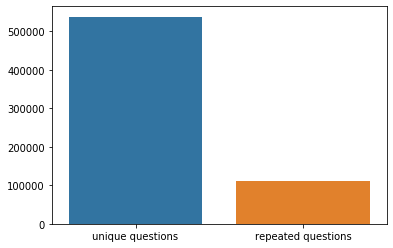

In [13]:
# unique qns vs repeated qns 

x= ['unique questions' , 'repeated questions']
y =[unique_qns ,qn_multiple ]
sns.barplot(x,y)

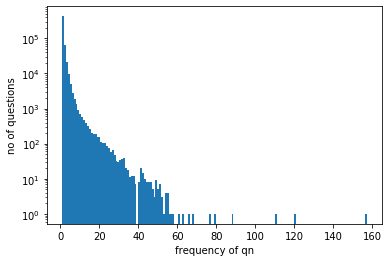

In [14]:
## frequency of each question 

plt.xlabel('frequency of qn')
plt.ylabel('no of questions')
plt.hist(qid_list.value_counts() , bins =160)
plt.yscale('log')

## Featurization

In [15]:
if os.path.isfile('train_Fe_pre_preprocessing.csv'):
    train = pd.read_csv('train_Fe_pre_preprocessing.csv')
else:
    train ['qid1_freq'] = train.groupby('qid1')['qid1'].transform('count')
    train ['qid2_freq'] = train.groupby('qid2')['qid2'].transform('count')
    train ['qn1_len'] = train['question1'].str.len()
    train['qn2_len'] = train['question2'].str.len()
    train['qn1_nwords'] = train['question1'].apply(lambda row: len(row.split(" ")))
    train['qn2_nwords'] = train['question2'].apply(lambda row: len(row.split(" ")))
    
    def normalized_common_word(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))  
        return 1.0 * len(w1 & w2)
    train ['common_word'] = train.apply(normalized_common_word, axis=1)
    
    def normalized_word_Total(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
        return 1.0 * (len(w1) + len(w2))
    train['word_Total'] = train.apply(normalized_word_Total, axis=1)
    
    def normalized_word_share(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
        return 1.0 * len(w1 & w2)/(len(w1) + len(w2))
    train['word_share'] = train.apply(normalized_word_share, axis=1)
    
    train['q1+q2_freq'] = train['qid1_freq']+train['qid2_freq']
    train['q1-q2_freq'] = abs(train['qid1_freq']-train['qid2_freq'])
    
    train.to_csv('train_Fe_pre_preprocessing.csv' , index=False)

train.head()

,id,qid1,qid2,question1,question2,is_duplicate,qid1_freq,qid2_freq,qn1_len,qn2_len,qn1_nwords,qn2_nwords,common_word,word_Total,word_share,q1+q2_freq,q1-q2_freq
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0,1,1,66,57,14,12,10.0,23.0,0.434783,2,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0,4,1,51,88,8,13,4.0,20.0,0.200000,5,3
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0,1,1,73,59,14,10,4.0,24.0,0.166667,2,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0,1,1,50,65,11,9,0.0,19.0,0.000000,2,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0,3,1,76,39,13,7,2.0,20.0,0.100000,4,2


In [16]:
display(train.shape)

(404290, 17)

In [17]:
display(train['qn1_nwords'].describe())
display(train['qn2_nwords'].describe())

count    404290.000000
mean         10.944592
std           5.431949
min           1.000000
25%           7.000000
50%          10.000000
75%          13.000000
max         125.000000
Name: qn1_nwords, dtype: float64

count    404290.000000
mean         11.185120
std           6.311076
min           1.000000
25%           7.000000
50%          10.000000
75%          13.000000
max         237.000000
Name: qn2_nwords, dtype: float64

In [18]:
# lets get the count of questions with length 1 (which is minimum)

display(train[train['qn1_nwords']==1].shape[0])
display(train[train['qn2_nwords']==1].shape[0])

67

24

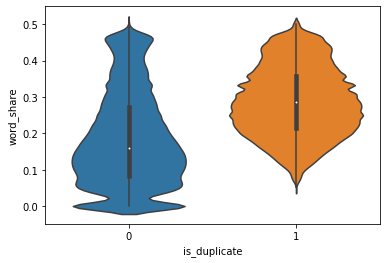

In [19]:
# lets visualize the word share 
sns.violinplot(x = 'is_duplicate' , y = 'word_share' , data = train[0:])


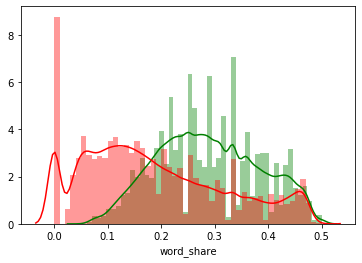

In [20]:
sns.distplot(train[train['is_duplicate'] == 1.0]['word_share'][0:] , label = "1", color = 'Green')
sns.distplot(train[train['is_duplicate'] == 0.0]['word_share'][0:] , label = "0" , color = 'red' )

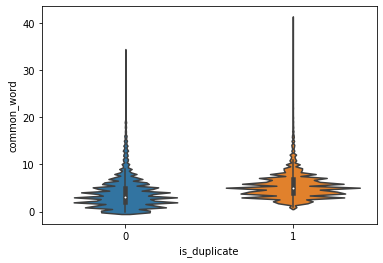

In [21]:
# lets visualize common word


sns.violinplot(x = 'is_duplicate' , y = 'common_word' , data = train[0:])

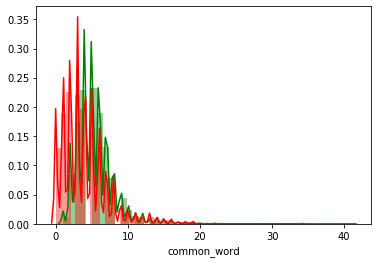

In [22]:
sns.distplot(train[train['is_duplicate'] == 1.0]['common_word'][0:] , label = "1", color = 'green')
sns.distplot(train[train['is_duplicate'] == 0.0]['common_word'][0:] , label = "0" , color = 'red' )

#highly overlapping

In [23]:
train.isna().sum()

id              0
qid1            0
qid2            0
question1       1
question2       2
is_duplicate    0
qid1_freq       0
qid2_freq       0
qn1_len         0
qn2_len         0
qn1_nwords      0
qn2_nwords      0
common_word     0
word_Total      0
word_share      0
q1+q2_freq      0
q1-q2_freq      0
dtype: int64

In [24]:
train = train.fillna('')

In [25]:
train.isna().sum()

id              0
qid1            0
qid2            0
question1       0
question2       0
is_duplicate    0
qid1_freq       0
qid2_freq       0
qn1_len         0
qn2_len         0
qn1_nwords      0
qn2_nwords      0
common_word     0
word_Total      0
word_share      0
q1+q2_freq      0
q1-q2_freq      0
dtype: int64

## Preprocessing 

In [26]:
SAFE_DIV =0.0001

STOP_WORDS = stopwords.words('english') # list of stopwords
STOP_WORDS

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [27]:
# To get the results in 4 decemal points
SAFE_DIV = 0.0001 

STOP_WORDS = stopwords.words("english")


def preprocess(x):
    x = str(x).lower()
    x = x.replace(",000,000", "m").replace(",000", "k").replace("′", "'").replace("’", "'")\
                           .replace("won't", "will not").replace("cannot", "can not").replace("can't", "can not")\
                           .replace("n't", " not").replace("what's", "what is").replace("it's", "it is")\
                           .replace("'ve", " have").replace("i'm", "i am").replace("'re", " are")\
                           .replace("he's", "he is").replace("she's", "she is").replace("'s", " own")\
                           .replace("%", " percent ").replace("₹", " rupee ").replace("$", " dollar ")\
                           .replace("€", " euro ").replace("'ll", " will")
    x = re.sub(r"([0-9]+)000000", r"\1m", x)
    x = re.sub(r"([0-9]+)000", r"\1k", x)
    
    
    porter = PorterStemmer()
    pattern = re.compile('\W')
    
    if type(x) == type(''):
        x = re.sub(pattern, ' ', x)
    
    
    if type(x) == type(''):
        x = porter.stem(x)
        example1 = BeautifulSoup(x)
        x = example1.get_text()
               
    
    return x
    

In [28]:
df = train

## Advanced feature extraction


### Before going into detail feature extraction
     token = words which are splitted based on space
     Word = token that is not a stop_word

## Ratios 

cwc_min : Ratio of common_word_count to min lenghth of word count of Q1 and Q2
cwc_min = common_word_count / (min(len(q1_words), len(q2_words))



cwc_max : Ratio of common_word_count to max lenghth of word count of Q1 and Q2
cwc_max = common_word_count / (max(len(q1_words), len(q2_words))



csc_min : Ratio of common_stop_count to min lenghth of stop count of Q1 and Q2
csc_min = common_stop_count / (min(len(q1_stops), len(q2_stops))



csc_max : Ratio of common_stop_count to max lenghth of stop count of Q1 and Q2
csc_max = common_stop_count / (max(len(q1_stops), len(q2_stops))



ctc_min : Ratio of common_token_count to min lenghth of token count of Q1 and Q2



ctc_min = common_token_count / (min(len(q1_tokens), len(q2_tokens))



ctc_max : Ratio of common_token_count to max lenghth of token count of Q1 and Q2


ctc_max = common_token_count / (max(len(q1_tokens), len(q2_tokens))


## others

last_word_eq : Check if First word of both questions is equal or not
last_word_eq = int(q1_tokens[-1] == q2_tokens[-1])



first_word_eq : Check if First word of both questions is equal or not
first_word_eq = int(q1_tokens[0] == q2_tokens[0])



abs_len_diff : Abs. length difference
abs_len_diff = abs(len(q1_tokens) - len(q2_tokens))



mean_len : Average Token Length of both Questions
mean_len = (len(q1_tokens) + len(q2_tokens))/2




https://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/

fuzz_ratio

fuzz_partial_ratio

token_sort_ratio

token_set_ratio

longest_substr_ratio : Ratio of length longest common substring to min lenghth of token count of Q1 and Q2
longest_substr_ratio = len(longest common substring) / (min(len(q1_tokens), len(q2_tokens))


In [29]:
def get_token_features(q1, q2):
    token_features = [0.0]*10
    
    # Converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()

    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return token_features
    # Get the non-stopwords in Questions
    q1_words = set([word for word in q1_tokens if word not in STOP_WORDS])
    q2_words = set([word for word in q2_tokens if word not in STOP_WORDS])
    
    #Get the stopwords in Questions
    q1_stops = set([word for word in q1_tokens if word in STOP_WORDS])
    q2_stops = set([word for word in q2_tokens if word in STOP_WORDS])
    
    # Get the common non-stopwords from Question pair
    common_word_count = len(q1_words.intersection(q2_words))
    
    # Get the common stopwords from Question pair
    common_stop_count = len(q1_stops.intersection(q2_stops))
    
    # Get the common Tokens from Question pair
    common_token_count = len(set(q1_tokens).intersection(set(q2_tokens)))
    
    
    token_features[0] = common_word_count / (min(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[1] = common_word_count / (max(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[2] = common_stop_count / (min(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[3] = common_stop_count / (max(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[4] = common_token_count / (min(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    token_features[5] = common_token_count / (max(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    
    # Last word of both question is same or not
    token_features[6] = int(q1_tokens[-1] == q2_tokens[-1])
    
    # First word of both question is same or not
    token_features[7] = int(q1_tokens[0] == q2_tokens[0])
    
    token_features[8] = abs(len(q1_tokens) - len(q2_tokens))
    
    #Average Token Length of both Questions
    token_features[9] = (len(q1_tokens) + len(q2_tokens))/2
    return token_features

# get the Longest Common sub string

def get_longest_substr_ratio(a, b):
    strs = list(distance.lcsubstrings(a, b))
    if len(strs) == 0:
        return 0
    else:
        return len(strs[0]) / (min(len(a), len(b)) + 1)

def extract_features(df):
    # preprocessing each question
    df["question1"] = df["question1"].fillna("").apply(preprocess)
    df["question2"] = df["question2"].fillna("").apply(preprocess)

    print("token features...")
    
    # Merging Features with dataset
    
    token_features = df.apply(lambda x: get_token_features(x["question1"], x["question2"]), axis=1)
    
    df["cwc_min"]       = list(map(lambda x: x[0], token_features))
    df["cwc_max"]       = list(map(lambda x: x[1], token_features))
    df["csc_min"]       = list(map(lambda x: x[2], token_features))
    df["csc_max"]       = list(map(lambda x: x[3], token_features))
    df["ctc_min"]       = list(map(lambda x: x[4], token_features))
    df["ctc_max"]       = list(map(lambda x: x[5], token_features))
    df["last_word_eq"]  = list(map(lambda x: x[6], token_features))
    df["first_word_eq"] = list(map(lambda x: x[7], token_features))
    df["abs_len_diff"]  = list(map(lambda x: x[8], token_features))
    df["mean_len"]      = list(map(lambda x: x[9], token_features))
   
    #Computing Fuzzy Features and Merging with Dataset
    
    # do read this blog: http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
    # https://stackoverflow.com/questions/31806695/when-to-use-which-fuzz-function-to-compare-2-strings
    # https://github.com/seatgeek/fuzzywuzzy
    print("fuzzy features..")

    df["token_set_ratio"]       = df.apply(lambda x: fuzz.token_set_ratio(x["question1"], x["question2"]), axis=1)
    # The token sort approach involves tokenizing the string in question, sorting the tokens alphabetically, and 
    # then joining them back into a string We then compare the transformed strings with a simple ratio().
    df["token_sort_ratio"]      = df.apply(lambda x: fuzz.token_sort_ratio(x["question1"], x["question2"]), axis=1)
    df["fuzz_ratio"]            = df.apply(lambda x: fuzz.QRatio(x["question1"], x["question2"]), axis=1)
    df["fuzz_partial_ratio"]    = df.apply(lambda x: fuzz.partial_ratio(x["question1"], x["question2"]), axis=1)
    df["longest_substr_ratio"]  = df.apply(lambda x: get_longest_substr_ratio(x["question1"], x["question2"]), axis=1)
    return df

In [30]:
q1 = 'india is my country all indians are my '
q1.split()

['india', 'is', 'my', 'country', 'all', 'indians', 'are', 'my']

In [31]:
if os.path.isfile('nlp_features_train.csv'):
    df = pd.read_csv("nlp_features_train.csv",encoding='latin-1')
    df.fillna('')
else:
    print("Extracting features for train:")
    df = pd.read_csv("train.csv")
    df = extract_features(df)
    df.to_csv("nlp_features_train.csv", index=False)
df.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,cwc_min,cwc_max,csc_min,csc_max,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
0,0,1,2,what is the step by step guide to invest in sh...,what is the step by step guide to invest in sh...,0,0.999980,0.833319,0.999983,0.999983,...,0.785709,0.0,1.0,2.0,13.0,100,93,93,100,0.982759
1,1,3,4,what is the story of kohinoor koh i noor dia...,what would happen if the indian government sto...,0,0.799984,0.399996,0.749981,0.599988,...,0.466664,0.0,1.0,5.0,12.5,86,63,66,75,0.596154


In [32]:
#!pip install --user distance


In [33]:
df.head()

,id,qid1,qid2,question1,question2,is_duplicate,cwc_min,cwc_max,csc_min,csc_max,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
0,0,1,2,what is the step by step guide to invest in sh...,what is the step by step guide to invest in sh...,0,0.999980,0.833319,0.999983,0.999983,...,0.785709,0.0,1.0,2.0,13.0,100,93,93,100,0.982759
1,1,3,4,what is the story of kohinoor koh i noor dia...,what would happen if the indian government sto...,0,0.799984,0.399996,0.749981,0.599988,...,0.466664,0.0,1.0,5.0,12.5,86,63,66,75,0.596154
2,2,5,6,how can i increase the speed of my internet co...,how can internet speed be increased by hacking...,0,0.399992,0.333328,0.399992,0.249997,...,0.285712,0.0,1.0,4.0,12.0,63,63,43,47,0.166667
3,3,7,8,why am i mentally very lonely how can i solve...,find the remainder when math 23 24 math i...,0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,2.0,12.0,28,24,9,14,0.039216
4,4,9,10,which one dissolve in water quikly sugar salt...,which fish would survive in salt water,0,0.399992,0.199998,0.999950,0.666644,...,0.307690,0.0,1.0,6.0,10.0,67,47,35,56,0.175000


In [36]:
df_duplicate = df[df['is_duplicate'] == 1]
df_nonduplicate = df[df['is_duplicate'] == 0]

# Converting 2d array of q1 and q2 and flatten the array: like {{1,2},{3,4}} to {1,2,3,4}
k = np.dstack([df_duplicate["question1"], df_duplicate["question2"]]).flatten()
n = np.dstack([df_nonduplicate["question1"], df_nonduplicate["question2"]]).flatten()

print('data points in duplicate points:',len(k))
print('data points in non duplicate points :', len(n))
#lets save this arrayin text file
#Saving the np array into a text file
np.savetxt('train_k.txt', k, delimiter=' ', fmt='%s',encoding='utf-8' )
np.savetxt('train_n.txt', n, delimiter=' ', fmt='%s',encoding='utf-8' )

data points in duplicate points: 298526
data points in non duplicate points : 510054


In [37]:
#lets remove the stop words in the text files we created

p =  path.dirname('.')

textk_w = open(path.join(p, 'train_k.txt') ,encoding='utf-8').read()
textn_w = open(path.join(p, 'train_n.txt'),encoding='utf-8').read()

stopwords= set(STOP_WORDS)
stopwords.add('said')
stopwords.add('br')
stopwords.add(" ")
stopwords.remove("not")

stopwords.remove('no')


print ("Total number of words in duplicate pair questions :",len(textk_w))
print ("Total number of words in non duplicate pair questions :",len(textn_w))

Total number of words in duplicate pair questions : 16110763
Total number of words in non duplicate pair questions : 33201102


In [38]:
!pip install wordcloud


Word Cloud for Duplicate Question pairs


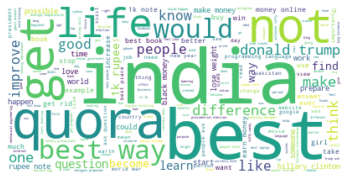

In [39]:
from wordcloud import WordCloud 

#lets create fancy word cloud
wc = WordCloud(background_color="white", max_words=len(textk_w), stopwords=stopwords)
wc.generate(textk_w)
print ("Word Cloud for Duplicate Question pairs")
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()



Word Cloud for Duplicate Question pairs


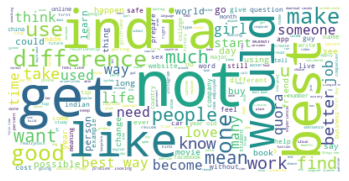

In [40]:
wc = WordCloud(background_color="white", max_words=len(textn_w), stopwords=stopwords)
wc.generate(textn_w)
print ("Word Cloud for non Duplicate Question pairs")
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

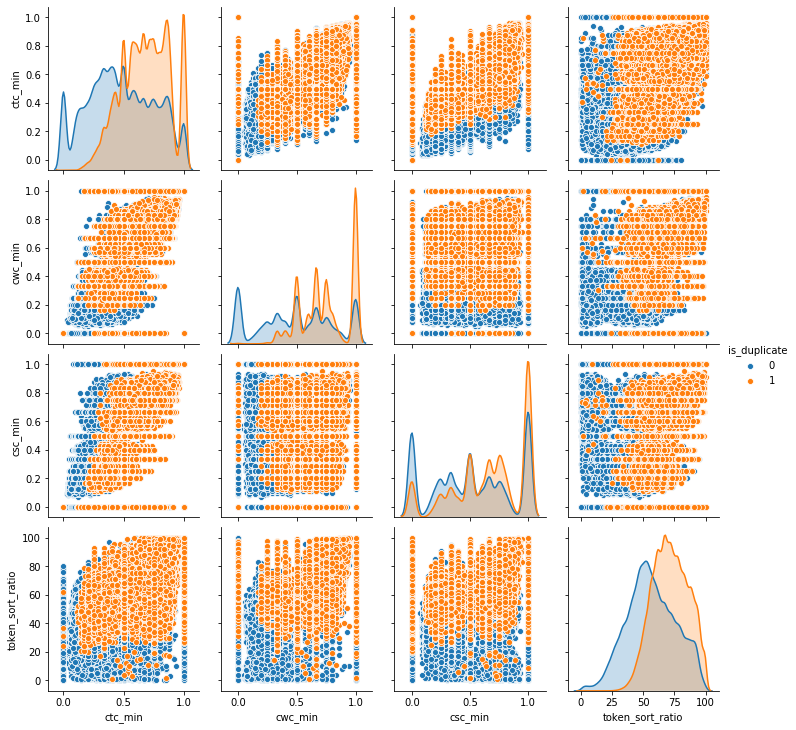

In [42]:
n = df.shape[0]
sns.pairplot(df[['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio', 'is_duplicate']][0:n], hue='is_duplicate', vars=['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio'])
plt.show()

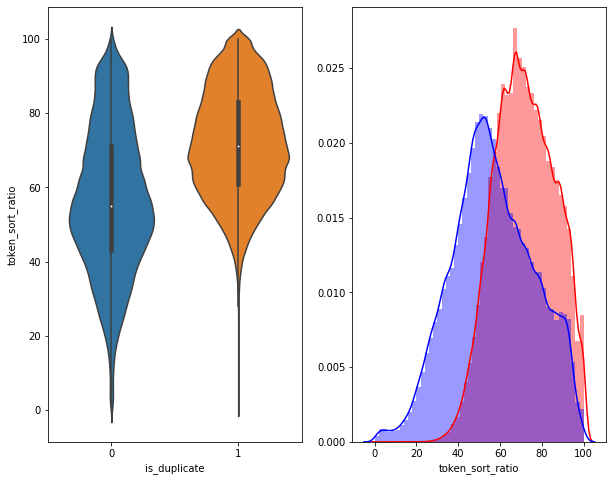

In [43]:

#distibution
plt.figure(figsize = (10,8))
plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'token_sort_ratio', data = df[0:] , )

plt.subplot(1,2,2)
sns.distplot(df[df['is_duplicate'] == 1.0]['token_sort_ratio'][0:] , label = "1", color = 'red')
sns.distplot(df[df['is_duplicate'] == 0.0]['token_sort_ratio'][0:] , label = "0" , color = 'blue' )
plt.show()



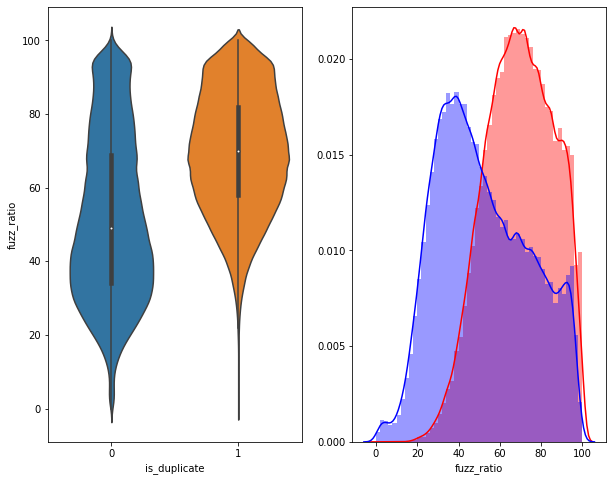

In [44]:
plt.figure(figsize=(10, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'fuzz_ratio', data = df[0:] , )

plt.subplot(1,2,2)
sns.distplot(df[df['is_duplicate'] == 1.0]['fuzz_ratio'][0:] , label = "1", color = 'red')
sns.distplot(df[df['is_duplicate'] == 0.0]['fuzz_ratio'][0:] , label = "0" , color = 'blue' )
plt.show()




In [46]:
df.shape

(404290, 21)

In [47]:
df.head()

,id,qid1,qid2,question1,question2,is_duplicate,cwc_min,cwc_max,csc_min,csc_max,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
0,0,1,2,what is the step by step guide to invest in sh...,what is the step by step guide to invest in sh...,0,0.999980,0.833319,0.999983,0.999983,...,0.785709,0.0,1.0,2.0,13.0,100,93,93,100,0.982759
1,1,3,4,what is the story of kohinoor koh i noor dia...,what would happen if the indian government sto...,0,0.799984,0.399996,0.749981,0.599988,...,0.466664,0.0,1.0,5.0,12.5,86,63,66,75,0.596154
2,2,5,6,how can i increase the speed of my internet co...,how can internet speed be increased by hacking...,0,0.399992,0.333328,0.399992,0.249997,...,0.285712,0.0,1.0,4.0,12.0,63,63,43,47,0.166667
3,3,7,8,why am i mentally very lonely how can i solve...,find the remainder when math 23 24 math i...,0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,2.0,12.0,28,24,9,14,0.039216
4,4,9,10,which one dissolve in water quikly sugar salt...,which fish would survive in salt water,0,0.399992,0.199998,0.999950,0.666644,...,0.307690,0.0,1.0,6.0,10.0,67,47,35,56,0.175000


In [56]:
df.columns


Index(['id', 'qid1', 'qid2', 'question1', 'question2', 'is_duplicate',
       'cwc_min', 'cwc_max', 'csc_min', 'csc_max', 'ctc_min', 'ctc_max',
       'last_word_eq', 'first_word_eq', 'abs_len_diff', 'mean_len',
       'token_set_ratio', 'token_sort_ratio', 'fuzz_ratio',
       'fuzz_partial_ratio', 'longest_substr_ratio'],
      dtype='object')

In [ ]:
# LETS VISULAZIE OUR MULTI DIM FEATURES WITH tsne

#as the data set is huge tne takes time to run lets take sammple and perform tsne




In [61]:


from sklearn.preprocessing import MinMaxScaler

df_sample= df[0:5000]
X = MinMaxScaler().fit_transform(df_sample[['cwc_min', 'cwc_max', 'csc_min', 'csc_max' , 'ctc_min' , 'ctc_max' , 'last_word_eq', 'first_word_eq' , 'abs_len_diff' , 'mean_len' , 'token_set_ratio' , 'token_sort_ratio' ,  'fuzz_ratio' , 'fuzz_partial_ratio' , 'longest_substr_ratio']])
y = df_sample['is_duplicate'].values

In [67]:
tsne2d = TSNE( n_components=2 ,init='random',random_state=100, method='barnes_hut',n_iter=1200,
    verbose=2,angle=0.5 ).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.034s...
[t-SNE] Computed neighbors for 5000 samples in 0.440s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.130446
[t-SNE] Computed conditional probabilities in 0.236s
[t-SNE] Iteration 50: error = 81.7541046, gradient norm = 0.0428700 (50 iterations in 2.567s)
[t-SNE] Iteration 100: error = 70.6452255, gradient norm = 0.0112628 (50 iterations in 1.932s)
[t-SNE] Iteration 150: error = 68.7687378, gradient norm = 0.0086870 (50 iterations in 1.914s)
[t-SNE] Iteration 200: error = 67.9138107, gradient norm = 0.0041414 (50 iterations in 1.914s)
[t-SNE] Iteration 250: error = 67.4553680, gradient norm = 0.0031041

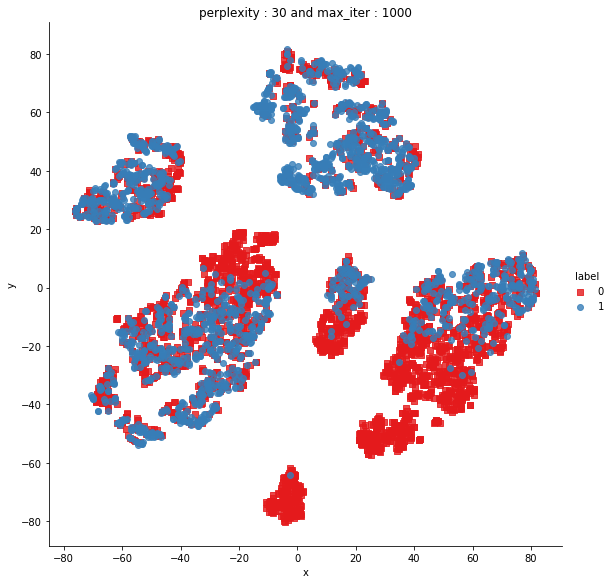

In [68]:
df = pd.DataFrame({'x':tsne2d[:,0], 'y':tsne2d[:,1] ,'label':y})

# draw the plot in appropriate place in the grid
sns.lmplot(data=df, x='x', y='y', hue='label', fit_reg=False, size=8,palette="Set1",markers=['s','o'])
plt.title("perplexity : {} and max_iter : {}".format(30, 1000))
plt.show()


In [70]:
from sklearn.manifold import TSNE
tsne3d = TSNE(
    n_components=3,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.043s...
[t-SNE] Computed neighbors for 5000 samples in 0.601s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.130446
[t-SNE] Computed conditional probabilities in 0.236s
[t-SNE] Iteration 50: error = 80.5739899, gradient norm = 0.0296227 (50 iterations in 6.343s)
[t-SNE] Iteration 100: error = 69.4174042, gradient norm = 0.0032491 (50 iterations in 3.823s)
[t-SNE] Iteration 150: error = 68.0031281, gradient norm = 0.0017356 (50 iterations in 3.772s)
[t-SNE] Iteration 200: error = 67.4430008, gradient norm = 0.0010772 (50 iterations in 3.451s)
[t-SNE] Iteration 250: error = 67.1309662, gradient norm = 0.0008710

In [71]:
pl = go.Scatter3d(
    x=tsne3d[:,0],
    y=tsne3d[:,1],
    z=tsne3d[:,2],
    mode='markers',
    marker=dict(
        sizemode='diameter',
        color = y,
        colorscale = 'Portland',
        colorbar = dict(title = 'duplicate'),
        line=dict(color='rgb(255, 255, 255)'),
        opacity=0.75
    )
)

data=[pl]
layout=dict(height=800, width=800, title='3d embedding with engineered features')
fig=dict(data=data, layout=layout)
py.iplot(fig, filename='3DBubble')

In [72]:
# in addition to simple features + addition features + we ca get tfidf - Wv (for both q1 and q2)
#we can do this also aftrer after data splitting to prevent data leakage


In [117]:
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

In [118]:
train = pd.read_csv('train.csv')

train['question1'] = train['question1'].apply(lambda x:str(x))
train['question2'] = train['question2'].apply(lambda x:str(x))

train.head()

,id,qid1,qid2,question1,question2,is_duplicate
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0


In [119]:
qns = list(train['question1']) + list(train['question2'])

tfidf = TfidfVectorizer(lowercase =False)
tfidf.fit_transform(qns)

word2tfidf = dict(zip(tfidf.get_feature_names(),tfidf.idf_))

In [116]:

import pandas as pd
import matplotlib.pyplot as plt
import re
import time
import warnings
import numpy as np
from nltk.corpus import stopwords
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
warnings.filterwarnings("ignore")
import sys
import os 
import pandas as pd
import numpy as np
from tqdm import tqdm

# exctract word2vec vectors
# https://github.com/explosion/spaCy/issues/1721
# http://landinghub.visualstudio.com/visual-cpp-build-tools
import spacy

In [120]:
#https://spacy.io/usage/vectors-similarity# en_vectors_web_lg, which includes over 1 million unique vectors.
nlp = spacy.load('en_core_web_sm')

vecs1 = []
# https://github.com/noamraph/tqdm
# tqdm is used to print the progress bar
for qu1 in tqdm(list(train['question1'])):
    doc1 = nlp(qu1) 
    # 384 is the number of dimensions of vectors 
    mean_vec1 = np.zeros([len(doc1), len(doc1[0].vector)])
    for word1 in doc1:
        # word2vec
        vec1 = word1.vector
        # fetch df score
        try:
            idf = word2tfidf[str(word1)]
        except:
            idf = 0
        # compute final vec
        mean_vec1 += vec1 * idf
    mean_vec1 = mean_vec1.mean(axis=0)
    vecs1.append(mean_vec1)
train['q1_feats_m'] = list(vecs1)





  0%|                                                                                       | 0/404290 [00:00<?, ?it/s]


  0%|                                                                            | 1/404290 [00:00<67:43:01,  1.66it/s]


  0%|                                                                            | 4/404290 [00:00<49:38:00,  2.26it/s]


  0%|                                                                            | 6/404290 [00:00<37:59:39,  2.96it/s]


  0%|                                                                            | 8/404290 [00:01<28:57:22,  3.88it/s]


  0%|                                                                            | 9/404290 [00:01<25:27:02,  4.41it/s]


  0%|                                                                           | 11/404290 [00:01<19:31:34,  5.75it/s]


  0%|                                                                           | 15/404290 [00:01<16:00:05,  7.02it/s]


  0%|                

  0%|                                                                            | 630/404290 [00:09<59:18, 113.45it/s]


  0%|                                                                            | 643/404290 [00:09<59:48, 112.48it/s]


  0%|                                                                           | 655/404290 [00:10<1:41:08, 66.52it/s]


  0%|                                                                           | 665/404290 [00:10<1:50:02, 61.13it/s]


  0%|▏                                                                          | 674/404290 [00:10<1:59:31, 56.28it/s]


  0%|▏                                                                          | 682/404290 [00:10<1:54:22, 58.81it/s]


  0%|▏                                                                          | 695/404290 [00:10<1:35:51, 70.17it/s]


  0%|▏                                                                          | 710/404290 [00:10<1:21:11, 82.85it/s]


  0%|▏                  

  0%|▎                                                                          | 1483/404290 [00:17<52:45, 127.27it/s]


  0%|▎                                                                          | 1498/404290 [00:17<50:42, 132.37it/s]


  0%|▎                                                                          | 1512/404290 [00:17<50:16, 133.53it/s]


  0%|▎                                                                          | 1526/404290 [00:17<49:58, 134.33it/s]


  0%|▎                                                                          | 1541/404290 [00:17<49:26, 135.79it/s]


  0%|▎                                                                          | 1555/404290 [00:17<49:23, 135.92it/s]


  0%|▎                                                                          | 1570/404290 [00:17<48:37, 138.05it/s]


  0%|▎                                                                          | 1585/404290 [00:17<48:37, 138.03it/s]


  0%|▎                  

  1%|▍                                                                          | 2378/404290 [00:24<47:15, 141.76it/s]


  1%|▍                                                                          | 2393/404290 [00:24<47:06, 142.20it/s]


  1%|▍                                                                          | 2409/404290 [00:24<45:59, 145.61it/s]


  1%|▍                                                                          | 2424/404290 [00:24<45:41, 146.57it/s]


  1%|▍                                                                          | 2439/404290 [00:24<47:15, 141.71it/s]


  1%|▍                                                                          | 2455/404290 [00:24<46:06, 145.24it/s]


  1%|▍                                                                          | 2470/404290 [00:24<45:46, 146.32it/s]


  1%|▍                                                                          | 2485/404290 [00:24<48:42, 137.51it/s]


  1%|▍                  

  1%|▌                                                                          | 3283/404290 [00:30<50:12, 133.10it/s]


  1%|▌                                                                          | 3298/404290 [00:31<48:52, 136.73it/s]


  1%|▌                                                                          | 3314/404290 [00:31<47:34, 140.45it/s]


  1%|▌                                                                          | 3329/404290 [00:31<47:10, 141.66it/s]


  1%|▌                                                                          | 3345/404290 [00:31<46:23, 144.05it/s]


  1%|▌                                                                          | 3360/404290 [00:31<45:55, 145.49it/s]


  1%|▋                                                                          | 3375/404290 [00:31<46:01, 145.20it/s]


  1%|▌                                                                         | 3390/404290 [00:31<1:08:43, 97.22it/s]


  1%|▌                  

  1%|▊                                                                          | 4199/404290 [00:38<52:00, 128.19it/s]


  1%|▊                                                                          | 4214/404290 [00:38<49:52, 133.67it/s]


  1%|▊                                                                          | 4230/404290 [00:38<48:05, 138.64it/s]


  1%|▊                                                                          | 4245/404290 [00:38<47:05, 141.59it/s]


  1%|▊                                                                          | 4260/404290 [00:38<50:05, 133.09it/s]


  1%|▊                                                                          | 4276/404290 [00:38<48:17, 138.07it/s]


  1%|▊                                                                          | 4291/404290 [00:38<47:21, 140.78it/s]


  1%|▊                                                                          | 4306/404290 [00:39<47:06, 141.49it/s]


  1%|▊                  

  1%|▉                                                                          | 5122/404290 [00:45<49:24, 134.65it/s]


  1%|▉                                                                          | 5136/404290 [00:45<49:30, 134.37it/s]


  1%|▉                                                                          | 5150/404290 [00:45<49:43, 133.77it/s]


  1%|▉                                                                          | 5164/404290 [00:45<49:18, 134.92it/s]


  1%|▉                                                                          | 5178/404290 [00:45<48:52, 136.10it/s]


  1%|▉                                                                          | 5192/404290 [00:45<49:08, 135.35it/s]


  1%|▉                                                                          | 5207/404290 [00:45<48:11, 138.02it/s]


  1%|▉                                                                          | 5222/404290 [00:46<47:31, 139.95it/s]


  1%|▉                  

  1%|█                                                                          | 6035/404290 [00:52<43:51, 151.35it/s]


  1%|█                                                                          | 6051/404290 [00:52<43:58, 150.92it/s]


  2%|█▏                                                                         | 6067/404290 [00:52<44:07, 150.44it/s]


  2%|█▏                                                                         | 6083/404290 [00:52<44:24, 149.45it/s]


  2%|█▏                                                                         | 6098/404290 [00:52<44:44, 148.33it/s]


  2%|█▏                                                                         | 6113/404290 [00:52<45:20, 146.34it/s]


  2%|█▏                                                                         | 6129/404290 [00:52<44:46, 148.21it/s]


  2%|█▏                                                                         | 6144/404290 [00:52<46:57, 141.31it/s]


  2%|█▏                 

  2%|█▎                                                                         | 6966/404290 [00:59<50:12, 131.91it/s]


  2%|█▎                                                                         | 6981/404290 [00:59<49:00, 135.12it/s]


  2%|█▎                                                                         | 6996/404290 [00:59<47:46, 138.59it/s]


  2%|█▎                                                                         | 7012/404290 [00:59<46:26, 142.58it/s]


  2%|█▎                                                                         | 7027/404290 [00:59<46:38, 141.97it/s]


  2%|█▎                                                                         | 7042/404290 [00:59<45:53, 144.26it/s]


  2%|█▎                                                                         | 7057/404290 [00:59<50:31, 131.02it/s]


  2%|█▎                                                                         | 7072/404290 [00:59<48:42, 135.92it/s]


  2%|█▎                 

  2%|█▍                                                                         | 7880/404290 [01:05<48:06, 137.33it/s]


  2%|█▍                                                                         | 7895/404290 [01:06<47:22, 139.44it/s]


  2%|█▍                                                                         | 7909/404290 [01:06<47:40, 138.55it/s]


  2%|█▍                                                                         | 7924/404290 [01:06<47:04, 140.31it/s]


  2%|█▍                                                                         | 7940/404290 [01:06<45:55, 143.82it/s]


  2%|█▍                                                                         | 7955/404290 [01:06<45:27, 145.33it/s]


  2%|█▍                                                                         | 7971/404290 [01:06<44:47, 147.47it/s]


  2%|█▍                                                                         | 7986/404290 [01:06<45:11, 146.17it/s]


  2%|█▍                 

  2%|█▋                                                                         | 8802/404290 [01:12<45:57, 143.43it/s]


  2%|█▋                                                                         | 8817/404290 [01:12<45:42, 144.19it/s]


  2%|█▋                                                                         | 8833/404290 [01:12<45:03, 146.29it/s]


  2%|█▋                                                                         | 8848/404290 [01:12<44:49, 147.05it/s]


  2%|█▋                                                                         | 8863/404290 [01:13<45:34, 144.62it/s]


  2%|█▋                                                                         | 8878/404290 [01:13<46:05, 142.99it/s]


  2%|█▋                                                                         | 8893/404290 [01:13<45:40, 144.28it/s]


  2%|█▋                                                                         | 8908/404290 [01:13<45:30, 144.81it/s]


  2%|█▋                 

  2%|█▊                                                                         | 9683/404290 [01:19<47:44, 137.75it/s]


  2%|█▊                                                                       | 9697/404290 [01:19<1:03:55, 102.89it/s]


  2%|█▊                                                                        | 9709/404290 [01:19<1:09:30, 94.62it/s]


  2%|█▊                                                                        | 9720/404290 [01:20<1:07:25, 97.53it/s]


  2%|█▊                                                                       | 9734/404290 [01:20<1:01:33, 106.81it/s]


  2%|█▊                                                                         | 9748/404290 [01:20<57:51, 113.67it/s]


  2%|█▊                                                                         | 9762/404290 [01:20<54:41, 120.24it/s]


  2%|█▊                                                                         | 9776/404290 [01:20<52:36, 124.97it/s]


  2%|█▊                 

  3%|█▉                                                                        | 10605/404290 [01:26<44:42, 146.76it/s]


  3%|█▉                                                                        | 10621/404290 [01:26<44:17, 148.12it/s]


  3%|█▉                                                                        | 10637/404290 [01:26<43:46, 149.90it/s]


  3%|█▉                                                                        | 10653/404290 [01:26<49:12, 133.33it/s]


  3%|█▉                                                                        | 10667/404290 [01:27<53:55, 121.64it/s]


  3%|█▉                                                                        | 10682/404290 [01:27<51:37, 127.08it/s]


  3%|█▉                                                                        | 10696/404290 [01:27<51:58, 126.21it/s]


  3%|█▉                                                                        | 10712/404290 [01:27<49:15, 133.17it/s]


  3%|█▉                 

  3%|██                                                                        | 11535/404290 [01:33<45:30, 143.82it/s]


  3%|██                                                                        | 11550/404290 [01:33<45:02, 145.31it/s]


  3%|██                                                                        | 11565/404290 [01:33<44:42, 146.39it/s]


  3%|██                                                                        | 11580/404290 [01:33<44:48, 146.09it/s]


  3%|██                                                                        | 11595/404290 [01:33<45:12, 144.79it/s]


  3%|██▏                                                                       | 11610/404290 [01:33<45:04, 145.17it/s]


  3%|██▏                                                                       | 11625/404290 [01:33<44:52, 145.85it/s]


  3%|██▏                                                                       | 11640/404290 [01:34<45:15, 144.61it/s]


  3%|██▏                

  3%|██▎                                                                       | 12464/404290 [01:40<48:55, 133.46it/s]


  3%|██▎                                                                       | 12478/404290 [01:40<48:37, 134.28it/s]


  3%|██▎                                                                       | 12492/404290 [01:40<48:25, 134.87it/s]


  3%|██▎                                                                       | 12507/404290 [01:40<47:43, 136.81it/s]


  3%|██▎                                                                       | 12521/404290 [01:40<47:55, 136.26it/s]


  3%|██▎                                                                       | 12536/404290 [01:40<46:43, 139.76it/s]


  3%|██▎                                                                       | 12551/404290 [01:40<46:54, 139.20it/s]


  3%|██▎                                                                       | 12565/404290 [01:40<49:08, 132.83it/s]


  3%|██▎                

  3%|██▍                                                                       | 13391/404290 [01:47<49:17, 132.17it/s]


  3%|██▍                                                                       | 13407/404290 [01:47<47:03, 138.44it/s]


  3%|██▍                                                                       | 13423/404290 [01:47<45:43, 142.47it/s]


  3%|██▍                                                                       | 13438/404290 [01:47<45:46, 142.30it/s]


  3%|██▍                                                                       | 13453/404290 [01:47<45:17, 143.80it/s]


  3%|██▍                                                                       | 13468/404290 [01:47<44:57, 144.88it/s]


  3%|██▍                                                                       | 13484/404290 [01:47<44:01, 147.96it/s]


  3%|██▍                                                                       | 13500/404290 [01:47<43:28, 149.81it/s]


  3%|██▍                

  4%|██▌                                                                       | 14333/404290 [01:53<43:37, 149.00it/s]


  4%|██▋                                                                       | 14348/404290 [01:53<43:45, 148.53it/s]


  4%|██▋                                                                       | 14364/404290 [01:53<43:30, 149.38it/s]


  4%|██▋                                                                       | 14379/404290 [01:54<43:48, 148.36it/s]


  4%|██▋                                                                       | 14394/404290 [01:54<44:32, 145.92it/s]


  4%|██▋                                                                       | 14409/404290 [01:54<45:17, 143.46it/s]


  4%|██▋                                                                       | 14425/404290 [01:54<44:42, 145.34it/s]


  4%|██▋                                                                       | 14440/404290 [01:54<44:46, 145.12it/s]


  4%|██▋                

  4%|██▊                                                                       | 15255/404290 [02:00<49:15, 131.65it/s]


  4%|██▊                                                                       | 15269/404290 [02:00<48:36, 133.40it/s]


  4%|██▊                                                                       | 15285/404290 [02:00<47:06, 137.61it/s]


  4%|██▊                                                                       | 15299/404290 [02:00<46:58, 138.02it/s]


  4%|██▊                                                                       | 15313/404290 [02:00<47:00, 137.90it/s]


  4%|██▊                                                                       | 15329/404290 [02:01<45:52, 141.30it/s]


  4%|██▊                                                                       | 15345/404290 [02:01<44:50, 144.55it/s]


  4%|██▊                                                                       | 15360/404290 [02:01<44:50, 144.57it/s]


  4%|██▊                

  4%|██▉                                                                       | 16191/404290 [02:07<44:05, 146.68it/s]


  4%|██▉                                                                       | 16206/404290 [02:07<48:24, 133.60it/s]


  4%|██▉                                                                       | 16220/404290 [02:07<51:34, 125.39it/s]


  4%|██▉                                                                       | 16233/404290 [02:07<52:55, 122.20it/s]


  4%|██▉                                                                     | 16246/404290 [02:07<1:00:25, 107.05it/s]


  4%|██▉                                                                     | 16258/404290 [02:07<1:02:17, 103.83it/s]


  4%|██▉                                                                       | 16273/404290 [02:07<57:08, 113.17it/s]


  4%|██▉                                                                       | 16289/404290 [02:08<52:20, 123.56it/s]


  4%|██▉                

  4%|███▏                                                                      | 17108/404290 [02:14<45:22, 142.20it/s]


  4%|███▏                                                                      | 17123/404290 [02:14<46:16, 139.42it/s]


  4%|███▏                                                                      | 17138/404290 [02:14<45:19, 142.37it/s]


  4%|███▏                                                                      | 17154/404290 [02:14<43:50, 147.16it/s]


  4%|███▏                                                                      | 17170/404290 [02:14<43:14, 149.22it/s]


  4%|███▏                                                                      | 17185/404290 [02:14<43:47, 147.35it/s]


  4%|███▏                                                                      | 17200/404290 [02:14<44:40, 144.43it/s]


  4%|███▏                                                                      | 17215/404290 [02:14<44:31, 144.89it/s]


  4%|███▏               

  4%|███▎                                                                      | 18042/404290 [02:20<49:58, 128.82it/s]


  4%|███▎                                                                      | 18057/404290 [02:20<48:35, 132.49it/s]


  4%|███▎                                                                      | 18071/404290 [02:21<48:35, 132.47it/s]


  4%|███▎                                                                      | 18086/404290 [02:21<47:37, 135.17it/s]


  4%|███▎                                                                      | 18102/404290 [02:21<45:51, 140.36it/s]


  4%|███▎                                                                      | 18117/404290 [02:21<45:18, 142.03it/s]


  4%|███▎                                                                      | 18133/404290 [02:21<43:52, 146.69it/s]


  4%|███▎                                                                      | 18148/404290 [02:21<44:03, 146.06it/s]


  4%|███▎               

  5%|███▍                                                                      | 18977/404290 [02:27<43:43, 146.86it/s]


  5%|███▍                                                                      | 18993/404290 [02:27<43:06, 148.99it/s]


  5%|███▍                                                                      | 19009/404290 [02:27<42:17, 151.83it/s]


  5%|███▍                                                                      | 19025/404290 [02:27<43:33, 147.42it/s]


  5%|███▍                                                                      | 19040/404290 [02:27<43:33, 147.42it/s]


  5%|███▍                                                                      | 19055/404290 [02:27<43:32, 147.44it/s]


  5%|███▍                                                                      | 19071/404290 [02:28<43:27, 147.76it/s]


  5%|███▍                                                                      | 19087/404290 [02:28<42:53, 149.66it/s]


  5%|███▍               

  5%|███▌                                                                    | 19900/404290 [02:34<1:03:34, 100.77it/s]


  5%|███▋                                                                      | 19915/404290 [02:34<57:27, 111.49it/s]


  5%|███▋                                                                      | 19929/404290 [02:34<54:03, 118.51it/s]


  5%|███▋                                                                      | 19945/404290 [02:34<50:31, 126.77it/s]


  5%|███▋                                                                      | 19961/404290 [02:34<47:49, 133.94it/s]


  5%|███▋                                                                      | 19977/404290 [02:34<46:10, 138.73it/s]


  5%|███▋                                                                      | 19992/404290 [02:34<45:59, 139.27it/s]


  5%|███▋                                                                      | 20007/404290 [02:35<50:12, 127.57it/s]


  5%|███▋               

  5%|███▊                                                                      | 20815/404290 [02:41<46:08, 138.53it/s]


  5%|███▊                                                                      | 20829/404290 [02:41<46:38, 137.04it/s]


  5%|███▊                                                                      | 20844/404290 [02:41<45:54, 139.23it/s]


  5%|███▊                                                                      | 20860/404290 [02:41<44:33, 143.42it/s]


  5%|███▊                                                                      | 20876/404290 [02:41<56:43, 112.64it/s]


  5%|███▋                                                                    | 20889/404290 [02:41<1:01:54, 103.21it/s]


  5%|███▊                                                                      | 20904/404290 [02:41<56:27, 113.17it/s]


  5%|███▊                                                                      | 20919/404290 [02:41<52:46, 121.05it/s]


  5%|███▊               

  5%|███▉                                                                      | 21721/404290 [03:31<49:35, 128.56it/s]


  5%|███▉                                                                      | 21737/404290 [03:31<47:20, 134.66it/s]


  5%|███▉                                                                      | 21751/404290 [03:31<46:54, 135.93it/s]


  5%|███▉                                                                      | 21766/404290 [03:31<46:03, 138.42it/s]


  5%|███▉                                                                      | 21782/404290 [03:31<44:38, 142.81it/s]


  5%|███▉                                                                      | 21797/404290 [03:32<44:43, 142.53it/s]


  5%|███▉                                                                      | 21812/404290 [03:32<45:17, 140.75it/s]


  5%|███▉                                                                      | 21827/404290 [03:32<50:15, 126.82it/s]


  5%|███▉               

  6%|████▏                                                                     | 22654/404290 [03:38<45:53, 138.58it/s]


  6%|████▏                                                                     | 22669/404290 [03:38<45:06, 140.98it/s]


  6%|████▏                                                                     | 22684/404290 [03:38<44:23, 143.27it/s]


  6%|████▏                                                                     | 22700/404290 [03:38<43:40, 145.60it/s]


  6%|████▏                                                                     | 22715/404290 [03:38<45:02, 141.19it/s]


  6%|████▏                                                                     | 22730/404290 [03:38<44:42, 142.22it/s]


  6%|████▏                                                                     | 22745/404290 [03:38<44:29, 142.93it/s]


  6%|████▏                                                                     | 22761/404290 [03:39<43:30, 146.15it/s]


  6%|████▏              

  6%|████▎                                                                     | 23576/404290 [03:44<44:30, 142.58it/s]


  6%|████▎                                                                     | 23591/404290 [03:45<49:06, 129.18it/s]


  6%|████▎                                                                     | 23606/404290 [03:45<47:09, 134.53it/s]


  6%|████▎                                                                     | 23620/404290 [03:45<48:11, 131.63it/s]


  6%|████▎                                                                     | 23634/404290 [03:45<47:45, 132.85it/s]


  6%|████▎                                                                     | 23648/404290 [03:45<47:07, 134.63it/s]


  6%|████▎                                                                     | 23663/404290 [03:45<46:46, 135.62it/s]


  6%|████▎                                                                     | 23679/404290 [03:45<45:26, 139.62it/s]


  6%|████▎              

  6%|████▍                                                                     | 24498/404290 [03:51<44:00, 143.86it/s]


  6%|████▍                                                                     | 24514/404290 [03:51<42:59, 147.23it/s]


  6%|████▍                                                                     | 24529/404290 [03:51<42:58, 147.28it/s]


  6%|████▍                                                                     | 24544/404290 [03:52<43:04, 146.92it/s]


  6%|████▍                                                                     | 24559/404290 [03:52<44:39, 141.73it/s]


  6%|████▍                                                                     | 24574/404290 [03:52<48:10, 131.37it/s]


  6%|████▌                                                                     | 24588/404290 [03:52<49:24, 128.08it/s]


  6%|████▌                                                                     | 24603/404290 [03:52<47:57, 131.96it/s]


  6%|████▌              

  6%|████▋                                                                     | 25390/404290 [03:58<45:17, 139.43it/s]


  6%|████▋                                                                     | 25405/404290 [03:58<49:58, 126.38it/s]


  6%|████▋                                                                     | 25418/404290 [03:58<59:58, 105.29it/s]


  6%|████▋                                                                     | 25431/404290 [03:59<57:14, 110.32it/s]


  6%|████▋                                                                     | 25447/404290 [03:59<52:49, 119.53it/s]


  6%|████▋                                                                     | 25462/404290 [03:59<49:41, 127.06it/s]


  6%|████▋                                                                     | 25477/404290 [03:59<47:44, 132.22it/s]


  6%|████▋                                                                     | 25492/404290 [03:59<46:08, 136.81it/s]


  6%|████▋              

  7%|████▊                                                                     | 26320/404290 [04:05<46:29, 135.51it/s]


  7%|████▊                                                                     | 26334/404290 [04:05<46:08, 136.54it/s]


  7%|████▊                                                                     | 26349/404290 [04:05<45:59, 136.97it/s]


  7%|████▊                                                                     | 26364/404290 [04:05<45:30, 138.41it/s]


  7%|████▊                                                                     | 26378/404290 [04:05<46:07, 136.57it/s]


  7%|████▊                                                                     | 26394/404290 [04:05<45:01, 139.88it/s]


  7%|████▊                                                                     | 26409/404290 [04:06<45:12, 139.29it/s]


  7%|████▊                                                                     | 26424/404290 [04:06<44:50, 140.45it/s]


  7%|████▊              

  7%|████▉                                                                     | 27255/404290 [04:12<46:11, 136.04it/s]


  7%|████▉                                                                     | 27271/404290 [04:12<44:47, 140.30it/s]


  7%|████▉                                                                     | 27287/404290 [04:12<43:34, 144.21it/s]


  7%|████▉                                                                     | 27303/404290 [04:12<42:43, 147.08it/s]


  7%|█████                                                                     | 27319/404290 [04:12<42:07, 149.17it/s]


  7%|█████                                                                     | 27335/404290 [04:12<42:38, 147.32it/s]


  7%|█████                                                                     | 27350/404290 [04:12<42:45, 146.95it/s]


  7%|█████                                                                     | 27366/404290 [04:12<42:08, 149.05it/s]


  7%|█████              

  7%|█████▏                                                                    | 28191/404290 [04:18<45:29, 137.77it/s]


  7%|█████▏                                                                    | 28206/404290 [04:19<45:21, 138.21it/s]


  7%|█████▏                                                                    | 28222/404290 [04:19<44:03, 142.28it/s]


  7%|█████▏                                                                    | 28238/404290 [04:19<42:54, 146.07it/s]


  7%|█████▏                                                                    | 28254/404290 [04:19<42:06, 148.85it/s]


  7%|█████▏                                                                    | 28270/404290 [04:19<41:53, 149.59it/s]


  7%|█████▏                                                                    | 28286/404290 [04:19<42:38, 146.95it/s]


  7%|█████▏                                                                    | 28301/404290 [04:19<42:28, 147.55it/s]


  7%|█████▏             

  7%|█████▎                                                                    | 29129/404290 [04:25<51:02, 122.49it/s]


  7%|█████▎                                                                    | 29143/404290 [04:25<49:17, 126.85it/s]


  7%|█████▎                                                                    | 29158/404290 [04:25<47:35, 131.36it/s]


  7%|█████▎                                                                    | 29174/404290 [04:26<45:14, 138.19it/s]


  7%|█████▎                                                                    | 29189/404290 [04:26<44:45, 139.67it/s]


  7%|█████▎                                                                    | 29204/404290 [04:26<44:25, 140.72it/s]


  7%|█████▎                                                                    | 29219/404290 [04:26<44:11, 141.47it/s]


  7%|█████▎                                                                    | 29234/404290 [04:26<43:39, 143.19it/s]


  7%|█████▎             

  7%|█████▌                                                                    | 30063/404290 [04:32<43:21, 143.83it/s]


  7%|█████▌                                                                    | 30078/404290 [04:32<43:32, 143.23it/s]


  7%|█████▌                                                                    | 30093/404290 [04:32<44:10, 141.16it/s]


  7%|█████▌                                                                    | 30109/404290 [04:32<43:10, 144.46it/s]


  7%|█████▌                                                                    | 30125/404290 [04:33<42:41, 146.06it/s]


  7%|█████▌                                                                    | 30140/404290 [04:33<42:41, 146.05it/s]


  7%|█████▌                                                                    | 30155/404290 [04:33<42:49, 145.62it/s]


  7%|█████▌                                                                    | 30171/404290 [04:33<42:20, 147.29it/s]


  7%|█████▌             

  8%|█████▋                                                                    | 31003/404290 [04:39<41:19, 150.52it/s]


  8%|█████▋                                                                    | 31019/404290 [04:39<41:09, 151.18it/s]


  8%|█████▋                                                                    | 31035/404290 [04:39<44:51, 138.69it/s]


  8%|█████▋                                                                    | 31050/404290 [04:39<47:46, 130.21it/s]


  8%|█████▋                                                                    | 31065/404290 [04:39<46:13, 134.57it/s]


  8%|█████▋                                                                    | 31081/404290 [04:39<44:26, 139.94it/s]


  8%|█████▋                                                                    | 31097/404290 [04:39<43:12, 143.95it/s]


  8%|█████▋                                                                    | 31112/404290 [04:40<47:07, 132.00it/s]


  8%|█████▋             

  8%|█████▊                                                                    | 31934/404290 [04:46<45:00, 137.87it/s]


  8%|█████▊                                                                    | 31949/404290 [04:46<44:00, 141.01it/s]


  8%|█████▊                                                                    | 31964/404290 [04:46<43:18, 143.29it/s]


  8%|█████▊                                                                    | 31979/404290 [04:46<43:18, 143.29it/s]


  8%|█████▊                                                                    | 31994/404290 [04:46<43:03, 144.10it/s]


  8%|█████▊                                                                    | 32009/404290 [04:46<54:38, 113.54it/s]


  8%|█████▊                                                                    | 32022/404290 [04:46<56:40, 109.48it/s]


  8%|█████▊                                                                    | 32036/404290 [04:46<53:03, 116.93it/s]


  8%|█████▊             

  8%|██████                                                                    | 32832/404290 [04:52<42:37, 145.25it/s]


  8%|██████                                                                    | 32848/404290 [04:52<41:52, 147.83it/s]


  8%|██████                                                                    | 32863/404290 [04:53<42:38, 145.15it/s]


  8%|██████                                                                    | 32878/404290 [04:53<42:56, 144.17it/s]


  8%|██████                                                                    | 32894/404290 [04:53<42:19, 146.25it/s]


  8%|██████                                                                    | 32910/404290 [04:53<41:32, 148.98it/s]


  8%|██████                                                                    | 32925/404290 [04:53<41:55, 147.63it/s]


  8%|██████                                                                    | 32941/404290 [04:53<41:29, 149.14it/s]


  8%|██████             

  8%|██████▏                                                                   | 33781/404290 [04:59<42:37, 144.84it/s]


  8%|██████▏                                                                   | 33797/404290 [04:59<41:31, 148.71it/s]


  8%|██████▏                                                                   | 33812/404290 [04:59<41:30, 148.77it/s]


  8%|██████▏                                                                   | 33827/404290 [05:00<43:42, 141.28it/s]


  8%|██████▏                                                                   | 33842/404290 [05:00<43:53, 140.67it/s]


  8%|██████▏                                                                   | 33857/404290 [05:00<44:17, 139.37it/s]


  8%|██████▏                                                                   | 33871/404290 [05:00<44:59, 137.23it/s]


  8%|██████▏                                                                   | 33885/404290 [05:00<46:39, 132.30it/s]


  8%|██████▏            

  9%|██████▎                                                                   | 34703/404290 [05:06<47:19, 130.17it/s]


  9%|██████▎                                                                   | 34717/404290 [05:06<52:20, 117.67it/s]


  9%|██████▎                                                                   | 34732/404290 [05:06<49:24, 124.64it/s]


  9%|██████▎                                                                   | 34745/404290 [05:07<54:00, 114.04it/s]


  9%|██████▎                                                                  | 34757/404290 [05:07<1:08:58, 89.29it/s]


  9%|██████▏                                                                 | 34772/404290 [05:07<1:00:41, 101.48it/s]


  9%|██████▎                                                                   | 34787/404290 [05:07<54:55, 112.13it/s]


  9%|██████▎                                                                   | 34803/404290 [05:07<51:00, 120.75it/s]


  9%|██████▎            

  9%|██████▌                                                                   | 35526/404290 [05:13<44:49, 137.13it/s]


  9%|██████▌                                                                   | 35542/404290 [05:14<43:33, 141.10it/s]


  9%|██████▌                                                                   | 35557/404290 [05:14<44:20, 138.60it/s]


  9%|██████▌                                                                   | 35572/404290 [05:14<43:20, 141.79it/s]


  9%|██████▌                                                                   | 35587/404290 [05:14<43:05, 142.63it/s]


  9%|██████▌                                                                   | 35602/404290 [05:14<44:22, 138.49it/s]


  9%|██████▌                                                                   | 35618/404290 [05:14<43:08, 142.41it/s]


  9%|██████▌                                                                   | 35633/404290 [05:14<43:48, 140.24it/s]


  9%|██████▌            

  9%|██████▋                                                                   | 36447/404290 [05:20<44:55, 136.45it/s]


  9%|██████▋                                                                   | 36461/404290 [05:20<45:12, 135.59it/s]


  9%|██████▋                                                                   | 36475/404290 [05:20<45:49, 133.76it/s]


  9%|██████▋                                                                   | 36489/404290 [05:21<46:10, 132.74it/s]


  9%|██████▋                                                                   | 36503/404290 [05:21<46:05, 133.01it/s]


  9%|██████▋                                                                   | 36518/404290 [05:21<45:20, 135.19it/s]


  9%|██████▋                                                                   | 36532/404290 [05:21<44:58, 136.30it/s]


  9%|██████▋                                                                   | 36546/404290 [05:21<44:49, 136.71it/s]


  9%|██████▋            

  9%|██████▊                                                                   | 37356/404290 [05:27<50:29, 121.12it/s]


  9%|██████▊                                                                   | 37369/404290 [05:27<52:30, 116.45it/s]


  9%|██████▊                                                                   | 37381/404290 [05:27<56:34, 108.08it/s]


  9%|██████▊                                                                   | 37393/404290 [05:27<59:07, 103.43it/s]


  9%|██████▊                                                                   | 37408/404290 [05:28<54:04, 113.10it/s]


  9%|██████▊                                                                   | 37423/404290 [05:28<50:17, 121.59it/s]


  9%|██████▊                                                                   | 37438/404290 [05:28<48:03, 127.23it/s]


  9%|██████▊                                                                   | 37454/404290 [05:28<45:34, 134.17it/s]


  9%|██████▊            

  9%|██████▉                                                                  | 38258/404290 [05:34<1:03:33, 95.97it/s]


  9%|██████▉                                                                  | 38270/404290 [05:34<1:08:40, 88.82it/s]


  9%|██████▉                                                                  | 38282/404290 [05:34<1:03:44, 95.70it/s]


  9%|███████                                                                   | 38296/404290 [05:34<58:10, 104.85it/s]


  9%|███████                                                                   | 38311/404290 [05:35<53:07, 114.81it/s]


  9%|███████                                                                   | 38324/404290 [05:35<53:36, 113.77it/s]


  9%|███████                                                                   | 38338/404290 [05:35<51:36, 118.18it/s]


  9%|███████                                                                   | 38352/404290 [05:35<49:48, 122.44it/s]


  9%|███████            

 10%|███████▏                                                                  | 39177/404290 [05:41<42:19, 143.78it/s]


 10%|███████▏                                                                  | 39192/404290 [05:41<42:36, 142.80it/s]


 10%|███████▏                                                                  | 39207/404290 [05:41<42:05, 144.58it/s]


 10%|███████▏                                                                  | 39222/404290 [05:41<41:50, 145.43it/s]


 10%|███████▏                                                                  | 39237/404290 [05:41<42:15, 143.95it/s]


 10%|███████▏                                                                  | 39252/404290 [05:41<42:41, 142.51it/s]


 10%|███████▏                                                                  | 39267/404290 [05:42<42:15, 143.96it/s]


 10%|███████▏                                                                  | 39283/404290 [05:42<41:38, 146.08it/s]


 10%|███████▏           

 10%|███████▎                                                                  | 40111/404290 [05:48<56:29, 107.44it/s]


 10%|███████▎                                                                  | 40123/404290 [05:48<56:47, 106.86it/s]


 10%|███████▏                                                                 | 40135/404290 [05:48<1:05:40, 92.40it/s]


 10%|███████▏                                                                 | 40146/404290 [05:48<1:03:18, 95.87it/s]


 10%|███████▎                                                                  | 40160/404290 [05:48<58:11, 104.30it/s]


 10%|███████▎                                                                  | 40173/404290 [05:48<54:47, 110.77it/s]


 10%|███████▎                                                                  | 40187/404290 [05:48<53:00, 114.49it/s]


 10%|███████▎                                                                  | 40201/404290 [05:49<50:50, 119.34it/s]


 10%|███████▎           

 10%|███████▌                                                                  | 40985/404290 [05:55<45:05, 134.28it/s]


 10%|███████▌                                                                  | 41000/404290 [05:55<44:36, 135.74it/s]


 10%|███████▌                                                                  | 41014/404290 [05:55<44:17, 136.71it/s]


 10%|███████▌                                                                  | 41029/404290 [05:55<43:26, 139.36it/s]


 10%|███████▌                                                                  | 41044/404290 [05:55<43:27, 139.33it/s]


 10%|███████▌                                                                  | 41059/404290 [05:55<43:19, 139.71it/s]


 10%|███████▌                                                                  | 41074/404290 [05:55<53:38, 112.87it/s]


 10%|███████▌                                                                  | 41087/404290 [05:56<58:34, 103.33it/s]


 10%|███████▌           

 10%|███████▋                                                                  | 41912/404290 [06:02<42:44, 141.31it/s]


 10%|███████▋                                                                  | 41927/404290 [06:02<42:55, 140.68it/s]


 10%|███████▋                                                                  | 41943/404290 [06:02<42:14, 142.96it/s]


 10%|███████▋                                                                  | 41958/404290 [06:02<41:44, 144.70it/s]


 10%|███████▋                                                                  | 41973/404290 [06:02<41:22, 145.92it/s]


 10%|███████▋                                                                  | 41988/404290 [06:02<55:59, 107.83it/s]


 10%|███████▋                                                                  | 42004/404290 [06:02<51:02, 118.28it/s]


 10%|███████▋                                                                  | 42019/404290 [06:02<48:29, 124.50it/s]


 10%|███████▋           

 11%|███████▊                                                                  | 42840/404290 [06:08<41:03, 146.74it/s]


 11%|███████▊                                                                  | 42855/404290 [06:09<42:33, 141.56it/s]


 11%|███████▊                                                                  | 42870/404290 [06:09<47:34, 126.63it/s]


 11%|███████▊                                                                  | 42883/404290 [06:09<49:06, 122.67it/s]


 11%|███████▊                                                                  | 42898/404290 [06:09<46:30, 129.51it/s]


 11%|███████▊                                                                  | 42914/404290 [06:09<44:29, 135.37it/s]


 11%|███████▊                                                                  | 42929/404290 [06:09<43:23, 138.78it/s]


 11%|███████▊                                                                  | 42944/404290 [06:09<42:30, 141.69it/s]


 11%|███████▊           

 11%|████████                                                                  | 43769/404290 [06:15<42:53, 140.10it/s]


 11%|████████                                                                  | 43784/404290 [06:15<43:33, 137.94it/s]


 11%|████████                                                                  | 43799/404290 [06:16<43:04, 139.47it/s]


 11%|████████                                                                  | 43815/404290 [06:16<42:03, 142.83it/s]


 11%|████████                                                                  | 43830/404290 [06:16<43:13, 138.99it/s]


 11%|████████                                                                  | 43846/404290 [06:16<41:49, 143.63it/s]


 11%|████████                                                                  | 43862/404290 [06:16<41:10, 145.88it/s]


 11%|████████                                                                  | 43877/404290 [06:16<40:55, 146.77it/s]


 11%|████████           

 11%|████████▏                                                                 | 44702/404290 [06:22<56:09, 106.73it/s]


 11%|████████▏                                                                 | 44717/404290 [06:22<51:37, 116.10it/s]


 11%|████████▏                                                                 | 44732/404290 [06:22<48:40, 123.10it/s]


 11%|████████▏                                                                 | 44747/404290 [06:22<46:50, 127.94it/s]


 11%|████████▏                                                                 | 44763/404290 [06:23<44:19, 135.17it/s]


 11%|████████▏                                                                 | 44778/404290 [06:23<44:24, 134.90it/s]


 11%|████████▏                                                                 | 44794/404290 [06:23<42:44, 140.18it/s]


 11%|████████▏                                                                 | 44809/404290 [06:23<42:49, 139.92it/s]


 11%|████████▏          

 11%|████████▎                                                                 | 45638/404290 [06:29<41:38, 143.53it/s]


 11%|████████▎                                                                 | 45654/404290 [06:29<40:46, 146.59it/s]


 11%|████████▎                                                                 | 45669/404290 [06:29<50:40, 117.94it/s]


 11%|████████▎                                                                 | 45685/404290 [06:29<47:12, 126.60it/s]


 11%|████████▎                                                                 | 45700/404290 [06:29<45:33, 131.19it/s]


 11%|████████▎                                                                 | 45715/404290 [06:29<44:02, 135.68it/s]


 11%|████████▎                                                                 | 45730/404290 [06:30<46:48, 127.68it/s]


 11%|████████▎                                                                 | 45744/404290 [06:30<50:07, 119.20it/s]


 11%|████████▍          

 12%|████████▌                                                                 | 46572/404290 [06:36<44:24, 134.26it/s]


 12%|████████▌                                                                 | 46587/404290 [06:36<43:26, 137.21it/s]


 12%|████████▌                                                                 | 46602/404290 [06:36<42:25, 140.52it/s]


 12%|████████▌                                                                 | 46618/404290 [06:36<41:17, 144.38it/s]


 12%|████████▌                                                                 | 46633/404290 [06:36<41:01, 145.29it/s]


 12%|████████▌                                                                 | 46649/404290 [06:36<40:11, 148.28it/s]


 12%|████████▌                                                                 | 46664/404290 [06:36<40:22, 147.61it/s]


 12%|████████▌                                                                 | 46679/404290 [06:36<40:23, 147.56it/s]


 12%|████████▌          

 12%|████████▋                                                                 | 47515/404290 [06:42<41:01, 144.95it/s]


 12%|████████▋                                                                 | 47530/404290 [06:43<40:48, 145.69it/s]


 12%|████████▋                                                                 | 47545/404290 [06:43<41:08, 144.53it/s]


 12%|████████▋                                                                 | 47560/404290 [06:43<43:31, 136.60it/s]


 12%|████████▋                                                                 | 47574/404290 [06:43<43:48, 135.70it/s]


 12%|████████▋                                                                 | 47588/404290 [06:43<48:57, 121.43it/s]


 12%|████████▋                                                                 | 47601/404290 [06:43<56:17, 105.59it/s]


 12%|████████▋                                                                 | 47613/404290 [06:43<55:42, 106.69it/s]


 12%|████████▋          

 12%|████████▊                                                                 | 48444/404290 [06:49<42:05, 140.91it/s]


 12%|████████▊                                                                 | 48459/404290 [06:49<41:31, 142.83it/s]


 12%|████████▊                                                                 | 48474/404290 [06:49<41:22, 143.35it/s]


 12%|████████▉                                                                 | 48489/404290 [06:50<44:26, 133.41it/s]


 12%|████████▉                                                                 | 48503/404290 [06:50<44:17, 133.88it/s]


 12%|████████▉                                                                 | 48518/404290 [06:50<43:25, 136.56it/s]


 12%|████████▉                                                                 | 48533/404290 [06:50<43:03, 137.72it/s]


 12%|████████▉                                                                 | 48547/404290 [06:50<43:26, 136.48it/s]


 12%|████████▉          

 12%|█████████                                                                 | 49369/404290 [06:56<44:17, 133.56it/s]


 12%|█████████                                                                 | 49383/404290 [06:56<47:56, 123.38it/s]


 12%|█████████                                                                 | 49396/404290 [06:56<47:26, 124.67it/s]


 12%|█████████                                                                 | 49411/404290 [06:56<45:29, 130.00it/s]


 12%|█████████                                                                 | 49426/404290 [06:56<44:21, 133.35it/s]


 12%|█████████                                                                 | 49441/404290 [06:57<43:15, 136.71it/s]


 12%|█████████                                                                 | 49456/404290 [06:57<42:11, 140.14it/s]


 12%|█████████                                                                 | 49471/404290 [06:57<41:41, 141.86it/s]


 12%|█████████          

 12%|█████████▏                                                                | 50292/404290 [07:03<39:26, 149.61it/s]


 12%|█████████▏                                                                | 50307/404290 [07:03<39:29, 149.38it/s]


 12%|█████████▏                                                                | 50322/404290 [07:03<39:45, 148.36it/s]


 12%|█████████▏                                                                | 50338/404290 [07:03<39:31, 149.24it/s]


 12%|█████████▏                                                                | 50353/404290 [07:03<39:40, 148.69it/s]


 12%|█████████▏                                                                | 50369/404290 [07:03<39:14, 150.34it/s]


 12%|█████████▏                                                                | 50385/404290 [07:03<39:02, 151.05it/s]


 12%|█████████▏                                                                | 50401/404290 [07:03<39:34, 149.03it/s]


 12%|█████████▏         

 13%|█████████▍                                                                | 51226/404290 [07:09<42:57, 136.99it/s]


 13%|█████████▌                                                                 | 51240/404290 [07:10<59:52, 98.27it/s]


 13%|█████████▍                                                                | 51252/404290 [07:10<58:20, 100.86it/s]


 13%|█████████▍                                                                | 51266/404290 [07:10<53:39, 109.65it/s]


 13%|█████████▍                                                                | 51281/404290 [07:10<50:21, 116.83it/s]


 13%|█████████▍                                                                | 51295/404290 [07:10<48:11, 122.06it/s]


 13%|█████████▍                                                                | 51309/404290 [07:10<47:03, 125.01it/s]


 13%|█████████▍                                                                | 51324/404290 [07:10<45:23, 129.62it/s]


 13%|█████████▍         

 13%|█████████▌                                                                | 52145/404290 [07:16<40:52, 143.60it/s]


 13%|█████████▌                                                                | 52160/404290 [07:16<40:34, 144.62it/s]


 13%|█████████▌                                                                | 52175/404290 [07:16<41:10, 142.55it/s]


 13%|█████████▌                                                                | 52191/404290 [07:17<40:00, 146.69it/s]


 13%|█████████▌                                                                | 52206/404290 [07:17<39:56, 146.91it/s]


 13%|█████████▌                                                                | 52222/404290 [07:17<39:41, 147.81it/s]


 13%|█████████▌                                                                | 52237/404290 [07:17<39:50, 147.27it/s]


 13%|█████████▌                                                                | 52252/404290 [07:17<42:10, 139.14it/s]


 13%|█████████▌         

 13%|█████████▋                                                                | 53089/404290 [07:23<41:02, 142.63it/s]


 13%|█████████▋                                                                | 53105/404290 [07:23<39:59, 146.33it/s]


 13%|█████████▋                                                                | 53121/404290 [07:23<39:03, 149.85it/s]


 13%|█████████▋                                                                | 53137/404290 [07:23<38:43, 151.15it/s]


 13%|█████████▋                                                                | 53153/404290 [07:23<39:08, 149.53it/s]


 13%|█████████▋                                                                | 53169/404290 [07:24<38:53, 150.48it/s]


 13%|█████████▋                                                                | 53185/404290 [07:24<38:31, 151.90it/s]


 13%|█████████▋                                                                | 53201/404290 [07:24<38:55, 150.33it/s]


 13%|█████████▋         

 13%|█████████▉                                                                | 54039/404290 [07:30<42:28, 137.42it/s]


 13%|█████████▉                                                                | 54054/404290 [07:30<41:50, 139.50it/s]


 13%|█████████▉                                                                | 54069/404290 [07:30<43:50, 133.14it/s]


 13%|█████████▉                                                                | 54084/404290 [07:30<43:01, 135.66it/s]


 13%|█████████▉                                                                | 54098/404290 [07:30<43:28, 134.25it/s]


 13%|█████████▉                                                                | 54112/404290 [07:30<43:31, 134.08it/s]


 13%|█████████▉                                                                | 54127/404290 [07:30<42:27, 137.44it/s]


 13%|█████████▉                                                                | 54141/404290 [07:30<43:58, 132.73it/s]


 13%|█████████▉         

 14%|██████████                                                                | 54988/404290 [07:37<43:11, 134.77it/s]


 14%|██████████                                                                | 55004/404290 [07:37<41:40, 139.70it/s]


 14%|██████████                                                                | 55019/404290 [07:37<41:35, 139.97it/s]


 14%|██████████                                                                | 55035/404290 [07:37<40:38, 143.20it/s]


 14%|██████████                                                                | 55050/404290 [07:37<40:38, 143.20it/s]


 14%|██████████                                                                | 55066/404290 [07:37<39:34, 147.09it/s]


 14%|██████████                                                                | 55081/404290 [07:37<40:50, 142.49it/s]


 14%|██████████                                                                | 55096/404290 [07:37<40:25, 143.96it/s]


 14%|██████████         

 14%|██████████▏                                                               | 55931/404290 [07:43<45:28, 127.66it/s]


 14%|██████████▏                                                               | 55944/404290 [07:43<47:20, 122.65it/s]


 14%|██████████▏                                                               | 55958/404290 [07:44<46:02, 126.09it/s]


 14%|██████████▏                                                               | 55974/404290 [07:44<43:44, 132.74it/s]


 14%|██████████▏                                                               | 55990/404290 [07:44<41:47, 138.90it/s]


 14%|██████████▎                                                               | 56005/404290 [07:44<41:10, 140.96it/s]


 14%|██████████▎                                                               | 56020/404290 [07:44<40:37, 142.86it/s]


 14%|██████████▎                                                               | 56036/404290 [07:44<39:50, 145.70it/s]


 14%|██████████▎        

 14%|██████████▍                                                               | 56874/404290 [07:50<43:27, 133.21it/s]


 14%|██████████▍                                                               | 56888/404290 [07:50<43:54, 131.85it/s]


 14%|██████████▍                                                               | 56903/404290 [07:50<43:05, 134.35it/s]


 14%|██████████▍                                                               | 56917/404290 [07:50<42:50, 135.13it/s]


 14%|██████████▍                                                               | 56932/404290 [07:51<42:13, 137.09it/s]


 14%|██████████▍                                                               | 56947/404290 [07:51<41:33, 139.28it/s]


 14%|██████████▍                                                               | 56963/404290 [07:51<40:17, 143.68it/s]


 14%|██████████▍                                                               | 56978/404290 [07:51<39:58, 144.79it/s]


 14%|██████████▍        

 14%|██████████▌                                                               | 57804/404290 [07:57<39:26, 146.40it/s]


 14%|██████████▌                                                               | 57819/404290 [07:57<39:28, 146.31it/s]


 14%|██████████▌                                                               | 57834/404290 [07:57<39:38, 145.65it/s]


 14%|██████████▌                                                               | 57849/404290 [07:57<45:15, 127.59it/s]


 14%|██████████▌                                                               | 57863/404290 [07:57<52:54, 109.14it/s]


 14%|██████████▌                                                               | 57878/404290 [07:57<49:00, 117.81it/s]


 14%|██████████▌                                                               | 57894/404290 [07:58<45:45, 126.19it/s]


 14%|██████████▌                                                               | 57909/404290 [07:58<44:56, 128.46it/s]


 14%|██████████▌        

 15%|██████████▊                                                               | 58742/404290 [08:04<38:33, 149.38it/s]


 15%|██████████▊                                                               | 58758/404290 [08:04<38:43, 148.71it/s]


 15%|██████████▊                                                               | 58773/404290 [08:04<38:42, 148.77it/s]


 15%|██████████▊                                                               | 58789/404290 [08:04<38:17, 150.39it/s]


 15%|██████████▊                                                               | 58805/404290 [08:04<38:38, 149.00it/s]


 15%|██████████▊                                                               | 58820/404290 [08:04<38:46, 148.51it/s]


 15%|██████████▊                                                               | 58835/404290 [08:04<39:18, 146.48it/s]


 15%|██████████▊                                                               | 58850/404290 [08:04<43:01, 133.84it/s]


 15%|██████████▊        

 15%|██████████▉                                                               | 59672/404290 [08:10<43:15, 132.80it/s]


 15%|██████████▉                                                               | 59686/404290 [08:10<42:54, 133.83it/s]


 15%|██████████▉                                                               | 59702/404290 [08:11<41:12, 139.37it/s]


 15%|██████████▉                                                               | 59717/404290 [08:11<41:40, 137.80it/s]


 15%|██████████▉                                                               | 59733/404290 [08:11<40:07, 143.10it/s]


 15%|██████████▉                                                               | 59748/404290 [08:11<40:00, 143.56it/s]


 15%|██████████▉                                                               | 59764/404290 [08:11<39:16, 146.22it/s]


 15%|██████████▉                                                               | 59779/404290 [08:11<39:24, 145.72it/s]


 15%|██████████▉        

 15%|███████████                                                               | 60622/404290 [08:17<38:31, 148.65it/s]


 15%|███████████                                                               | 60638/404290 [08:17<37:47, 151.59it/s]


 15%|███████████                                                               | 60654/404290 [08:17<38:01, 150.64it/s]


 15%|███████████                                                               | 60670/404290 [08:17<38:31, 148.68it/s]


 15%|███████████                                                               | 60685/404290 [08:18<39:04, 146.58it/s]


 15%|███████████                                                               | 60701/404290 [08:18<38:10, 150.03it/s]


 15%|███████████                                                               | 60717/404290 [08:18<37:44, 151.72it/s]


 15%|███████████                                                               | 60733/404290 [08:18<37:46, 151.59it/s]


 15%|███████████        

 15%|███████████▎                                                              | 61573/404290 [08:24<52:38, 108.52it/s]


 15%|███████████▎                                                              | 61588/404290 [08:24<48:34, 117.57it/s]


 15%|███████████▎                                                              | 61603/404290 [08:24<45:44, 124.87it/s]


 15%|███████████▎                                                              | 61618/404290 [08:24<44:05, 129.53it/s]


 15%|███████████▎                                                              | 61634/404290 [08:24<42:23, 134.72it/s]


 15%|███████████▎                                                              | 61650/404290 [08:24<40:59, 139.29it/s]


 15%|███████████▎                                                              | 61665/404290 [08:25<40:11, 142.06it/s]


 15%|███████████▎                                                              | 61680/404290 [08:25<43:17, 131.92it/s]


 15%|███████████▎       

 15%|███████████▍                                                              | 62510/404290 [08:31<42:14, 134.84it/s]


 15%|███████████▍                                                              | 62524/404290 [08:31<45:23, 125.48it/s]


 15%|███████████▍                                                              | 62538/404290 [08:31<44:26, 128.18it/s]


 15%|███████████▍                                                              | 62553/404290 [08:31<42:55, 132.71it/s]


 15%|███████████▍                                                              | 62568/404290 [08:31<41:38, 136.80it/s]


 15%|███████████▍                                                              | 62584/404290 [08:31<40:25, 140.87it/s]


 15%|███████████▍                                                              | 62600/404290 [08:31<39:29, 144.23it/s]


 15%|███████████▍                                                              | 62615/404290 [08:31<39:06, 145.61it/s]


 15%|███████████▍       

 16%|███████████▌                                                              | 63450/404290 [08:37<38:14, 148.56it/s]


 16%|███████████▌                                                              | 63465/404290 [08:37<38:53, 146.07it/s]


 16%|███████████▌                                                              | 63481/404290 [08:38<38:09, 148.85it/s]


 16%|███████████▌                                                              | 63496/404290 [08:38<38:50, 146.26it/s]


 16%|███████████▌                                                              | 63511/404290 [08:38<38:37, 147.06it/s]


 16%|███████████▋                                                              | 63527/404290 [08:38<37:58, 149.55it/s]


 16%|███████████▋                                                              | 63543/404290 [08:38<37:50, 150.10it/s]


 16%|███████████▋                                                              | 63559/404290 [08:38<37:31, 151.32it/s]


 16%|███████████▋       

 16%|███████████▊                                                              | 64353/404290 [08:44<40:57, 138.32it/s]


 16%|███████████▊                                                              | 64367/404290 [08:44<42:28, 133.40it/s]


 16%|███████████▊                                                              | 64382/404290 [08:44<41:29, 136.56it/s]


 16%|███████████▊                                                              | 64398/404290 [08:45<40:28, 139.96it/s]


 16%|███████████▊                                                              | 64413/404290 [08:45<43:35, 129.95it/s]


 16%|███████████▊                                                              | 64427/404290 [08:45<45:09, 125.45it/s]


 16%|███████████▊                                                              | 64440/404290 [08:45<46:43, 121.21it/s]


 16%|███████████▊                                                              | 64453/404290 [08:45<53:49, 105.23it/s]


 16%|███████████▋       

 16%|███████████▉                                                              | 65191/404290 [08:51<42:33, 132.80it/s]


 16%|███████████▉                                                              | 65206/404290 [08:51<41:10, 137.27it/s]


 16%|███████████▉                                                              | 65222/404290 [08:52<39:42, 142.34it/s]


 16%|███████████▉                                                              | 65237/404290 [08:52<39:17, 143.82it/s]


 16%|███████████▉                                                              | 65252/404290 [08:52<40:34, 139.27it/s]


 16%|███████████▉                                                              | 65267/404290 [08:52<43:43, 129.22it/s]


 16%|███████████▉                                                              | 65281/404290 [08:52<44:29, 126.99it/s]


 16%|███████████▉                                                              | 65296/404290 [08:52<42:31, 132.85it/s]


 16%|███████████▉       

 16%|████████████                                                              | 66116/404290 [08:58<39:44, 141.81it/s]


 16%|████████████                                                              | 66131/404290 [08:58<39:43, 141.85it/s]


 16%|████████████                                                              | 66146/404290 [08:58<39:57, 141.06it/s]


 16%|████████████                                                              | 66161/404290 [08:58<39:29, 142.71it/s]


 16%|████████████                                                              | 66176/404290 [08:58<40:14, 140.04it/s]


 16%|████████████                                                              | 66191/404290 [08:59<48:37, 115.89it/s]


 16%|████████████                                                              | 66204/404290 [08:59<48:10, 116.98it/s]


 16%|████████████                                                              | 66218/404290 [08:59<46:00, 122.49it/s]


 16%|████████████       

 17%|████████████▎                                                             | 67027/404290 [09:05<47:54, 117.33it/s]


 17%|████████████▎                                                             | 67040/404290 [09:05<47:07, 119.29it/s]


 17%|████████████▎                                                             | 67054/404290 [09:05<45:50, 122.63it/s]


 17%|████████████▎                                                             | 67067/404290 [09:05<45:39, 123.08it/s]


 17%|████████████▎                                                             | 67080/404290 [09:05<48:23, 116.14it/s]


 17%|████████████▎                                                             | 67095/404290 [09:06<45:18, 124.04it/s]


 17%|████████████▎                                                             | 67108/404290 [09:06<45:17, 124.07it/s]


 17%|████████████▎                                                             | 67121/404290 [09:06<50:04, 112.23it/s]


 17%|████████████▎      

 17%|████████████▍                                                             | 67875/404290 [09:12<43:58, 127.49it/s]


 17%|████████████▍                                                             | 67890/404290 [09:12<42:38, 131.49it/s]


 17%|████████████▍                                                             | 67905/404290 [09:12<41:35, 134.81it/s]


 17%|████████████▍                                                             | 67921/404290 [09:12<39:56, 140.34it/s]


 17%|████████████▍                                                             | 67936/404290 [09:13<39:15, 142.82it/s]


 17%|████████████▍                                                             | 67951/404290 [09:13<38:46, 144.60it/s]


 17%|████████████▍                                                             | 67966/404290 [09:13<40:06, 139.76it/s]


 17%|████████████▍                                                             | 67981/404290 [09:13<44:10, 126.89it/s]


 17%|████████████▍      

 17%|████████████▌                                                             | 68795/404290 [09:19<38:48, 144.07it/s]


 17%|████████████▌                                                             | 68811/404290 [09:19<38:08, 146.58it/s]


 17%|████████████▌                                                             | 68826/404290 [09:19<38:10, 146.43it/s]


 17%|████████████▌                                                             | 68841/404290 [09:19<38:06, 146.72it/s]


 17%|████████████▌                                                             | 68857/404290 [09:19<37:39, 148.49it/s]


 17%|████████████▌                                                             | 68873/404290 [09:19<37:07, 150.58it/s]


 17%|████████████▌                                                             | 68889/404290 [09:20<37:03, 150.82it/s]


 17%|████████████▌                                                             | 68905/404290 [09:20<40:53, 136.69it/s]


 17%|████████████▌      

 17%|████████████▊                                                             | 69724/404290 [09:26<39:57, 139.54it/s]


 17%|████████████▊                                                             | 69739/404290 [09:26<39:32, 141.03it/s]


 17%|████████████▊                                                             | 69754/404290 [09:26<39:28, 141.27it/s]


 17%|████████████▊                                                             | 69770/404290 [09:26<38:34, 144.54it/s]


 17%|████████████▊                                                             | 69785/404290 [09:26<39:14, 142.10it/s]


 17%|████████████▊                                                             | 69801/404290 [09:26<38:11, 145.96it/s]


 17%|████████████▊                                                             | 69817/404290 [09:26<37:47, 147.53it/s]


 17%|████████████▊                                                             | 69832/404290 [09:26<38:00, 146.65it/s]


 17%|████████████▊      

 17%|████████████▉                                                             | 70653/404290 [09:32<38:16, 145.29it/s]


 17%|████████████▉                                                             | 70668/404290 [09:32<39:06, 142.21it/s]


 17%|████████████▉                                                             | 70684/404290 [09:33<38:42, 143.66it/s]


 17%|████████████▉                                                             | 70700/404290 [09:33<37:58, 146.41it/s]


 17%|████████████▉                                                             | 70715/404290 [09:33<38:54, 142.87it/s]


 17%|████████████▉                                                             | 70730/404290 [09:33<49:58, 111.25it/s]


 17%|████████████▉                                                             | 70743/404290 [09:33<54:25, 102.14it/s]


 18%|████████████▉                                                             | 70758/404290 [09:33<49:37, 112.01it/s]


 18%|████████████▉      

 18%|█████████████                                                             | 71587/404290 [09:39<45:18, 122.37it/s]


 18%|█████████████                                                             | 71600/404290 [09:39<44:36, 124.30it/s]


 18%|█████████████                                                             | 71616/404290 [09:40<42:12, 131.34it/s]


 18%|█████████████                                                             | 71630/404290 [09:40<42:20, 130.93it/s]


 18%|█████████████                                                             | 71644/404290 [09:40<42:54, 129.20it/s]


 18%|█████████████                                                             | 71658/404290 [09:40<42:35, 130.15it/s]


 18%|█████████████                                                             | 71673/404290 [09:40<41:32, 133.46it/s]


 18%|█████████████                                                             | 71688/404290 [09:40<40:39, 136.34it/s]


 18%|█████████████      

 18%|█████████████▎                                                            | 72512/404290 [09:46<38:40, 142.98it/s]


 18%|█████████████▎                                                            | 72528/404290 [09:46<37:43, 146.59it/s]


 18%|█████████████▎                                                            | 72544/404290 [09:46<37:03, 149.22it/s]


 18%|█████████████▎                                                            | 72559/404290 [09:46<37:37, 146.93it/s]


 18%|█████████████▎                                                            | 72574/404290 [09:46<37:48, 146.24it/s]


 18%|█████████████▎                                                            | 72590/404290 [09:47<37:06, 148.96it/s]


 18%|█████████████▎                                                            | 72605/404290 [09:47<37:03, 149.20it/s]


 18%|█████████████▎                                                            | 72620/404290 [09:47<37:10, 148.67it/s]


 18%|█████████████▎     

 18%|█████████████▍                                                            | 73460/404290 [09:53<39:30, 139.54it/s]


 18%|█████████████▍                                                            | 73476/404290 [09:53<38:35, 142.88it/s]


 18%|█████████████▍                                                            | 73491/404290 [09:53<38:20, 143.81it/s]


 18%|█████████████▍                                                            | 73508/404290 [09:53<36:49, 149.69it/s]


 18%|█████████████▍                                                            | 73524/404290 [09:53<36:17, 151.91it/s]


 18%|█████████████▍                                                            | 73540/404290 [09:53<37:03, 148.77it/s]


 18%|█████████████▍                                                            | 73556/404290 [09:53<36:45, 149.95it/s]


 18%|█████████████▍                                                            | 73572/404290 [09:54<36:46, 149.88it/s]


 18%|█████████████▍     

 18%|█████████████▌                                                            | 74396/404290 [10:00<52:26, 104.83it/s]


 18%|█████████████▊                                                             | 74408/404290 [10:00<55:13, 99.56it/s]


 18%|█████████████▌                                                            | 74423/404290 [10:00<49:56, 110.08it/s]


 18%|█████████████▌                                                            | 74438/404290 [10:00<46:21, 118.57it/s]


 18%|█████████████▋                                                            | 74453/404290 [10:00<44:04, 124.71it/s]


 18%|█████████████▋                                                            | 74468/404290 [10:00<41:55, 131.11it/s]


 18%|█████████████▋                                                            | 74482/404290 [10:00<44:01, 124.84it/s]


 18%|█████████████▋                                                            | 74495/404290 [10:00<47:00, 116.92it/s]


 18%|█████████████▋     

 19%|█████████████▊                                                            | 75317/404290 [10:06<39:42, 138.10it/s]


 19%|█████████████▊                                                            | 75332/404290 [10:07<38:50, 141.17it/s]


 19%|█████████████▊                                                            | 75347/404290 [10:07<38:44, 141.50it/s]


 19%|█████████████▊                                                            | 75362/404290 [10:07<38:16, 143.22it/s]


 19%|█████████████▊                                                            | 75377/404290 [10:07<37:49, 144.90it/s]


 19%|█████████████▊                                                            | 75392/404290 [10:07<37:51, 144.80it/s]


 19%|█████████████▊                                                            | 75408/404290 [10:07<37:03, 147.93it/s]


 19%|█████████████▊                                                            | 75423/404290 [10:07<38:52, 141.02it/s]


 19%|█████████████▊     

 19%|█████████████▉                                                            | 76266/404290 [10:13<36:09, 151.21it/s]


 19%|█████████████▉                                                            | 76282/404290 [10:13<37:46, 144.71it/s]


 19%|█████████████▉                                                            | 76298/404290 [10:13<37:16, 146.65it/s]


 19%|█████████████▉                                                            | 76313/404290 [10:14<37:06, 147.32it/s]


 19%|█████████████▉                                                            | 76329/404290 [10:14<36:36, 149.34it/s]


 19%|█████████████▉                                                            | 76344/404290 [10:14<37:23, 146.15it/s]


 19%|█████████████▉                                                            | 76359/404290 [10:14<37:24, 146.11it/s]


 19%|█████████████▉                                                            | 76374/404290 [10:14<39:22, 138.80it/s]


 19%|█████████████▉     

 19%|██████████████▏                                                           | 77180/404290 [10:20<40:38, 134.17it/s]


 19%|██████████████▏                                                           | 77194/404290 [10:20<40:28, 134.67it/s]


 19%|██████████████▏                                                           | 77208/404290 [10:20<41:08, 132.49it/s]


 19%|██████████████▏                                                           | 77222/404290 [10:20<40:55, 133.21it/s]


 19%|██████████████▏                                                           | 77236/404290 [10:20<40:31, 134.52it/s]


 19%|██████████████▏                                                           | 77250/404290 [10:21<40:14, 135.43it/s]


 19%|██████████████▏                                                           | 77264/404290 [10:21<46:41, 116.73it/s]


 19%|██████████████▏                                                           | 77277/404290 [10:21<52:45, 103.31it/s]


 19%|██████████████▏    

 19%|██████████████▎                                                           | 78084/404290 [10:27<43:32, 124.86it/s]


 19%|██████████████▎                                                           | 78098/404290 [10:27<42:33, 127.73it/s]


 19%|██████████████▎                                                           | 78114/404290 [10:27<40:40, 133.67it/s]


 19%|██████████████▎                                                           | 78130/404290 [10:27<39:08, 138.87it/s]


 19%|██████████████▎                                                           | 78146/404290 [10:27<38:10, 142.41it/s]


 19%|██████████████▎                                                           | 78161/404290 [10:27<37:46, 143.88it/s]


 19%|██████████████▎                                                           | 78177/404290 [10:27<37:25, 145.23it/s]


 19%|██████████████▎                                                           | 78193/404290 [10:28<36:52, 147.42it/s]


 19%|██████████████▎    

 20%|██████████████▍                                                           | 79016/404290 [10:34<36:57, 146.66it/s]


 20%|██████████████▍                                                           | 79031/404290 [10:34<37:39, 143.94it/s]


 20%|██████████████▍                                                           | 79048/404290 [10:34<36:46, 147.40it/s]


 20%|██████████████▍                                                           | 79063/404290 [10:34<36:59, 146.54it/s]


 20%|██████████████▍                                                           | 79078/404290 [10:34<37:01, 146.38it/s]


 20%|██████████████▍                                                           | 79093/404290 [10:34<37:09, 145.85it/s]


 20%|██████████████▍                                                           | 79109/404290 [10:34<36:20, 149.10it/s]


 20%|██████████████▍                                                           | 79124/404290 [10:34<36:28, 148.60it/s]


 20%|██████████████▍    

 20%|██████████████▋                                                           | 79949/404290 [10:40<38:29, 140.46it/s]


 20%|██████████████▋                                                           | 79964/404290 [10:40<38:28, 140.48it/s]


 20%|██████████████▋                                                           | 79979/404290 [10:41<38:08, 141.69it/s]


 20%|██████████████▋                                                           | 79994/404290 [10:41<38:01, 142.15it/s]


 20%|██████████████▋                                                           | 80009/404290 [10:41<38:15, 141.27it/s]


 20%|██████████████▋                                                           | 80024/404290 [10:41<37:46, 143.09it/s]


 20%|██████████████▋                                                           | 80040/404290 [10:41<37:02, 145.87it/s]


 20%|██████████████▋                                                           | 80056/404290 [10:41<36:20, 148.70it/s]


 20%|██████████████▋    

 20%|██████████████▊                                                           | 80885/404290 [10:47<37:29, 143.74it/s]


 20%|██████████████▊                                                           | 80900/404290 [10:47<43:07, 124.99it/s]


 20%|██████████████▊                                                           | 80913/404290 [10:47<50:39, 106.40it/s]


 20%|██████████████▊                                                           | 80927/404290 [10:47<47:26, 113.62it/s]


 20%|██████████████▊                                                           | 80943/404290 [10:48<43:47, 123.07it/s]


 20%|██████████████▊                                                           | 80957/404290 [10:48<44:00, 122.46it/s]


 20%|██████████████▊                                                           | 80970/404290 [10:48<46:10, 116.69it/s]


 20%|██████████████▊                                                           | 80984/404290 [10:48<44:31, 121.00it/s]


 20%|██████████████▊    

 20%|██████████████▉                                                           | 81803/404290 [10:54<37:14, 144.33it/s]


 20%|██████████████▉                                                           | 81819/404290 [10:54<36:37, 146.77it/s]


 20%|██████████████▉                                                           | 81835/404290 [10:54<35:51, 149.89it/s]


 20%|██████████████▉                                                           | 81852/404290 [10:54<35:07, 153.00it/s]


 20%|██████████████▉                                                           | 81868/404290 [10:54<35:19, 152.09it/s]


 20%|██████████████▉                                                           | 81884/404290 [10:54<35:47, 150.16it/s]


 20%|██████████████▉                                                           | 81900/404290 [10:55<36:12, 148.42it/s]


 20%|██████████████▉                                                           | 81916/404290 [10:55<36:41, 146.43it/s]


 20%|██████████████▉    

 20%|███████████████▏                                                          | 82745/404290 [11:01<37:54, 141.34it/s]


 20%|███████████████▏                                                          | 82760/404290 [11:01<37:45, 141.90it/s]


 20%|███████████████▏                                                          | 82775/404290 [11:01<37:26, 143.13it/s]


 20%|███████████████▏                                                          | 82791/404290 [11:01<36:19, 147.49it/s]


 20%|███████████████▏                                                          | 82806/404290 [11:01<36:51, 145.36it/s]


 20%|███████████████▏                                                          | 82821/404290 [11:01<37:07, 144.30it/s]


 20%|███████████████▏                                                          | 82836/404290 [11:01<36:53, 145.23it/s]


 20%|███████████████▏                                                          | 82851/404290 [11:01<36:44, 145.79it/s]


 20%|███████████████▏   

 21%|███████████████▎                                                          | 83683/404290 [11:07<36:26, 146.63it/s]


 21%|███████████████▎                                                          | 83698/404290 [11:07<36:35, 146.00it/s]


 21%|███████████████▎                                                          | 83714/404290 [11:07<36:00, 148.39it/s]


 21%|███████████████▎                                                          | 83729/404290 [11:08<36:04, 148.11it/s]


 21%|███████████████▎                                                          | 83744/404290 [11:08<36:19, 147.04it/s]


 21%|███████████████▎                                                          | 83760/404290 [11:08<35:55, 148.72it/s]


 21%|███████████████▎                                                          | 83775/404290 [11:08<35:54, 148.79it/s]


 21%|███████████████▎                                                          | 83790/404290 [11:08<35:53, 148.81it/s]


 21%|███████████████▎   

 21%|███████████████▍                                                          | 84618/404290 [11:14<47:24, 112.37it/s]


 21%|███████████████▍                                                          | 84630/404290 [11:14<47:24, 112.39it/s]


 21%|███████████████▍                                                          | 84642/404290 [11:14<50:34, 105.32it/s]


 21%|███████████████▍                                                          | 84657/404290 [11:14<46:27, 114.67it/s]


 21%|███████████████▍                                                          | 84673/404290 [11:14<43:04, 123.65it/s]


 21%|███████████████▌                                                          | 84688/404290 [11:14<40:53, 130.28it/s]


 21%|███████████████▌                                                          | 84703/404290 [11:15<39:40, 134.27it/s]


 21%|███████████████▌                                                          | 84717/404290 [11:15<41:45, 127.53it/s]


 21%|███████████████▌   

 21%|███████████████▋                                                          | 85538/404290 [11:21<38:03, 139.57it/s]


 21%|███████████████▋                                                          | 85553/404290 [11:21<37:34, 141.39it/s]


 21%|███████████████▋                                                          | 85570/404290 [11:21<36:01, 147.46it/s]


 21%|███████████████▋                                                          | 85586/404290 [11:21<35:40, 148.90it/s]


 21%|███████████████▋                                                          | 85602/404290 [11:21<35:18, 150.45it/s]


 21%|███████████████▋                                                          | 85618/404290 [11:21<36:08, 146.99it/s]


 21%|███████████████▋                                                          | 85633/404290 [11:21<36:18, 146.29it/s]


 21%|███████████████▋                                                          | 85648/404290 [11:21<36:13, 146.63it/s]


 21%|███████████████▋   

 21%|███████████████▊                                                          | 86485/404290 [11:27<35:09, 150.69it/s]


 21%|███████████████▊                                                          | 86501/404290 [11:27<35:30, 149.19it/s]


 21%|███████████████▊                                                          | 86517/404290 [11:28<35:13, 150.35it/s]


 21%|███████████████▊                                                          | 86533/404290 [11:28<35:38, 148.57it/s]


 21%|███████████████▊                                                          | 86549/404290 [11:28<35:14, 150.26it/s]


 21%|███████████████▊                                                          | 86565/404290 [11:28<34:58, 151.44it/s]


 21%|███████████████▊                                                          | 86581/404290 [11:28<34:46, 152.27it/s]


 21%|███████████████▊                                                          | 86597/404290 [11:28<34:56, 151.56it/s]


 21%|███████████████▊   

 22%|████████████████                                                          | 87427/404290 [11:34<35:32, 148.61it/s]


 22%|████████████████                                                          | 87442/404290 [11:34<36:02, 146.51it/s]


 22%|████████████████                                                          | 87457/404290 [11:34<36:04, 146.36it/s]


 22%|████████████████                                                          | 87472/404290 [11:34<36:31, 144.59it/s]


 22%|████████████████                                                          | 87488/404290 [11:34<36:01, 146.54it/s]


 22%|████████████████                                                          | 87504/404290 [11:35<36:16, 145.55it/s]


 22%|████████████████                                                          | 87519/404290 [11:35<39:17, 134.35it/s]


 22%|████████████████                                                          | 87533/404290 [11:35<43:38, 120.99it/s]


 22%|████████████████▏  

 22%|████████████████▏                                                         | 88302/404290 [11:41<44:11, 119.19it/s]


 22%|████████████████▏                                                         | 88315/404290 [11:41<43:24, 121.32it/s]


 22%|████████████████▏                                                         | 88330/404290 [11:41<41:31, 126.84it/s]


 22%|████████████████▏                                                         | 88345/404290 [11:41<39:40, 132.73it/s]


 22%|████████████████▏                                                         | 88359/404290 [11:42<41:02, 128.28it/s]


 22%|████████████████▏                                                         | 88374/404290 [11:42<39:45, 132.44it/s]


 22%|████████████████▏                                                         | 88389/404290 [11:42<38:33, 136.52it/s]


 22%|████████████████▏                                                         | 88403/404290 [11:42<38:21, 137.25it/s]


 22%|████████████████▏  

 22%|████████████████▎                                                         | 89244/404290 [11:48<35:45, 146.87it/s]


 22%|████████████████▎                                                         | 89260/404290 [11:48<35:25, 148.20it/s]


 22%|████████████████▎                                                         | 89276/404290 [11:48<35:06, 149.53it/s]


 22%|████████████████▎                                                         | 89291/404290 [11:48<35:40, 147.17it/s]


 22%|████████████████▎                                                         | 89306/404290 [11:48<37:00, 141.84it/s]


 22%|████████████████▎                                                         | 89322/404290 [11:48<36:07, 145.33it/s]


 22%|████████████████▎                                                         | 89337/404290 [11:48<36:03, 145.56it/s]


 22%|████████████████▎                                                         | 89353/404290 [11:49<35:09, 149.30it/s]


 22%|████████████████▎  

 22%|████████████████▌                                                         | 90187/404290 [11:55<36:11, 144.66it/s]


 22%|████████████████▌                                                         | 90202/404290 [11:55<36:48, 142.19it/s]


 22%|████████████████▌                                                         | 90217/404290 [11:55<39:58, 130.96it/s]


 22%|████████████████▌                                                         | 90231/404290 [11:55<39:23, 132.89it/s]


 22%|████████████████▌                                                         | 90245/404290 [11:55<38:59, 134.26it/s]


 22%|████████████████▌                                                         | 90260/404290 [11:55<37:49, 138.36it/s]


 22%|████████████████▌                                                         | 90274/404290 [11:55<37:53, 138.12it/s]


 22%|████████████████▌                                                         | 90288/404290 [11:55<38:42, 135.18it/s]


 22%|████████████████▌  

 23%|████████████████▋                                                         | 91126/404290 [12:01<35:37, 146.50it/s]


 23%|████████████████▋                                                         | 91141/404290 [12:01<35:52, 145.51it/s]


 23%|████████████████▋                                                         | 91157/404290 [12:01<35:50, 145.62it/s]


 23%|████████████████▋                                                         | 91172/404290 [12:02<49:14, 105.99it/s]


 23%|████████████████▉                                                          | 91185/404290 [12:02<53:19, 97.87it/s]


 23%|████████████████▋                                                         | 91198/404290 [12:02<49:27, 105.52it/s]


 23%|████████████████▋                                                         | 91214/404290 [12:02<44:57, 116.06it/s]


 23%|████████████████▋                                                         | 91230/404290 [12:02<41:36, 125.38it/s]


 23%|████████████████▋  

 23%|████████████████▊                                                         | 92072/404290 [12:08<35:43, 145.67it/s]


 23%|████████████████▊                                                         | 92087/404290 [12:08<35:41, 145.77it/s]


 23%|████████████████▊                                                         | 92102/404290 [12:08<35:34, 146.29it/s]


 23%|████████████████▊                                                         | 92117/404290 [12:08<36:06, 144.09it/s]


 23%|████████████████▊                                                         | 92132/404290 [12:09<36:47, 141.42it/s]


 23%|████████████████▊                                                         | 92148/404290 [12:09<35:52, 145.02it/s]


 23%|████████████████▊                                                         | 92163/404290 [12:09<35:54, 144.90it/s]


 23%|████████████████▊                                                         | 92178/404290 [12:09<35:42, 145.67it/s]


 23%|████████████████▊  

 23%|█████████████████                                                         | 93013/404290 [12:15<38:35, 134.46it/s]


 23%|█████████████████                                                         | 93027/404290 [12:15<38:25, 135.00it/s]


 23%|█████████████████                                                         | 93042/404290 [12:15<37:51, 137.00it/s]


 23%|█████████████████                                                         | 93057/404290 [12:15<37:16, 139.18it/s]


 23%|█████████████████                                                         | 93072/404290 [12:15<37:03, 139.98it/s]


 23%|█████████████████                                                         | 93087/404290 [12:15<38:02, 136.34it/s]


 23%|█████████████████                                                         | 93101/404290 [12:16<37:49, 137.13it/s]


 23%|█████████████████                                                         | 93117/404290 [12:16<36:39, 141.49it/s]


 23%|█████████████████  

 23%|█████████████████▏                                                        | 93948/404290 [12:22<34:49, 148.50it/s]


 23%|█████████████████▏                                                        | 93963/404290 [12:22<35:00, 147.75it/s]


 23%|█████████████████▏                                                        | 93978/404290 [12:22<34:55, 148.08it/s]


 23%|█████████████████▏                                                        | 93994/404290 [12:22<34:41, 149.04it/s]


 23%|█████████████████▏                                                        | 94010/404290 [12:22<34:20, 150.59it/s]


 23%|█████████████████▏                                                        | 94026/404290 [12:22<34:05, 151.65it/s]


 23%|█████████████████▏                                                        | 94042/404290 [12:22<34:12, 151.13it/s]


 23%|█████████████████▏                                                        | 94058/404290 [12:22<34:12, 151.12it/s]


 23%|█████████████████▏ 

 23%|█████████████████▌                                                         | 94893/404290 [12:29<52:21, 98.50it/s]


 23%|█████████████████▎                                                        | 94908/404290 [12:29<47:01, 109.63it/s]


 23%|█████████████████▎                                                        | 94924/404290 [12:29<43:25, 118.72it/s]


 23%|█████████████████▍                                                        | 94939/404290 [12:29<41:05, 125.45it/s]


 23%|█████████████████▍                                                        | 94954/404290 [12:29<39:33, 130.30it/s]


 23%|█████████████████▍                                                        | 94969/404290 [12:29<38:04, 135.39it/s]


 23%|█████████████████▍                                                        | 94985/404290 [12:29<36:59, 139.37it/s]


 23%|█████████████████▍                                                        | 95002/404290 [12:29<35:19, 145.92it/s]


 24%|█████████████████▍ 

 24%|█████████████████▌                                                        | 95838/404290 [12:35<36:37, 140.36it/s]


 24%|█████████████████▌                                                        | 95853/404290 [12:35<36:30, 140.81it/s]


 24%|█████████████████▌                                                        | 95868/404290 [12:36<37:08, 138.41it/s]


 24%|█████████████████▌                                                        | 95882/404290 [12:36<37:38, 136.55it/s]


 24%|█████████████████▌                                                        | 95897/404290 [12:36<37:12, 138.12it/s]


 24%|█████████████████▌                                                        | 95911/404290 [12:36<37:08, 138.38it/s]


 24%|█████████████████▌                                                        | 95927/404290 [12:36<36:51, 139.44it/s]


 24%|█████████████████▌                                                        | 95943/404290 [12:36<35:53, 143.19it/s]


 24%|█████████████████▌ 

 24%|█████████████████▋                                                        | 96778/404290 [12:42<34:25, 148.89it/s]


 24%|█████████████████▋                                                        | 96794/404290 [12:42<34:09, 150.04it/s]


 24%|█████████████████▋                                                        | 96810/404290 [12:42<34:55, 146.73it/s]


 24%|█████████████████▋                                                        | 96826/404290 [12:42<34:24, 148.90it/s]


 24%|█████████████████▋                                                        | 96841/404290 [12:42<34:24, 148.90it/s]


 24%|█████████████████▋                                                        | 96856/404290 [12:43<34:48, 147.17it/s]


 24%|█████████████████▋                                                        | 96871/404290 [12:43<34:38, 147.89it/s]


 24%|█████████████████▋                                                        | 96887/404290 [12:43<34:07, 150.17it/s]


 24%|█████████████████▋ 

 24%|█████████████████▉                                                        | 97731/404290 [12:49<35:04, 145.65it/s]


 24%|█████████████████▉                                                        | 97746/404290 [12:49<35:09, 145.34it/s]


 24%|█████████████████▉                                                        | 97762/404290 [12:49<34:32, 147.91it/s]


 24%|█████████████████▉                                                        | 97777/404290 [12:49<34:52, 146.47it/s]


 24%|█████████████████▉                                                        | 97793/404290 [12:49<34:38, 147.49it/s]


 24%|█████████████████▉                                                        | 97809/404290 [12:49<34:16, 149.06it/s]


 24%|█████████████████▉                                                        | 97825/404290 [12:49<34:01, 150.14it/s]


 24%|█████████████████▉                                                        | 97841/404290 [12:49<36:42, 139.16it/s]


 24%|██████████████████▏

 24%|██████████████████                                                        | 98668/404290 [12:56<41:21, 123.18it/s]


 24%|██████████████████                                                        | 98683/404290 [12:56<39:12, 129.92it/s]


 24%|██████████████████                                                        | 98698/404290 [12:56<37:42, 135.09it/s]


 24%|██████████████████                                                        | 98713/404290 [12:56<37:09, 137.06it/s]


 24%|██████████████████                                                        | 98728/404290 [12:56<36:44, 138.58it/s]


 24%|██████████████████                                                        | 98744/404290 [12:56<35:48, 142.20it/s]


 24%|██████████████████                                                        | 98760/404290 [12:56<35:03, 145.22it/s]


 24%|██████████████████                                                        | 98775/404290 [12:56<35:00, 145.44it/s]


 24%|██████████████████ 

 25%|██████████████████▏                                                       | 99623/404290 [13:02<34:17, 148.11it/s]


 25%|██████████████████▏                                                       | 99639/404290 [13:02<33:46, 150.31it/s]


 25%|██████████████████▏                                                       | 99655/404290 [13:03<33:59, 149.37it/s]


 25%|██████████████████▏                                                       | 99670/404290 [13:03<34:01, 149.23it/s]


 25%|██████████████████▏                                                       | 99685/404290 [13:03<34:02, 149.14it/s]


 25%|██████████████████▏                                                       | 99700/404290 [13:03<34:09, 148.63it/s]


 25%|██████████████████▎                                                       | 99715/404290 [13:03<34:08, 148.70it/s]


 25%|██████████████████▎                                                       | 99730/404290 [13:03<34:37, 146.59it/s]


 25%|██████████████████▎

 25%|██████████████████▏                                                      | 100567/404290 [13:09<35:00, 144.61it/s]


 25%|██████████████████▏                                                      | 100583/404290 [13:09<34:38, 146.15it/s]


 25%|██████████████████▏                                                      | 100598/404290 [13:09<34:32, 146.56it/s]


 25%|██████████████████▏                                                      | 100613/404290 [13:09<35:10, 143.87it/s]


 25%|██████████████████▏                                                      | 100629/404290 [13:09<34:28, 146.83it/s]


 25%|██████████████████▏                                                      | 100644/404290 [13:10<34:31, 146.58it/s]


 25%|██████████████████▏                                                      | 100659/404290 [13:10<37:41, 134.27it/s]


 25%|██████████████████▏                                                      | 100674/404290 [13:10<37:16, 135.73it/s]


 25%|██████████████████▏

 25%|██████████████████▎                                                      | 101512/404290 [13:16<35:30, 142.13it/s]


 25%|██████████████████▎                                                      | 101527/404290 [13:16<35:01, 144.09it/s]


 25%|██████████████████▎                                                      | 101543/404290 [13:16<34:19, 147.00it/s]


 25%|██████████████████▎                                                      | 101558/404290 [13:16<37:30, 134.52it/s]


 25%|██████████████████▌                                                       | 101572/404290 [13:16<53:57, 93.49it/s]


 25%|██████████████████▎                                                      | 101585/404290 [13:17<50:04, 100.74it/s]


 25%|██████████████████▎                                                      | 101600/404290 [13:17<45:19, 111.32it/s]


 25%|██████████████████▎                                                      | 101616/404290 [13:17<41:43, 120.91it/s]


 25%|██████████████████▎

 25%|██████████████████▍                                                      | 102454/404290 [13:23<34:41, 145.03it/s]


 25%|██████████████████▌                                                      | 102469/404290 [13:23<34:30, 145.77it/s]


 25%|██████████████████▌                                                      | 102484/404290 [13:23<34:23, 146.27it/s]


 25%|██████████████████▌                                                      | 102499/404290 [13:23<34:18, 146.60it/s]


 25%|██████████████████▌                                                      | 102515/404290 [13:23<34:04, 147.60it/s]


 25%|██████████████████▌                                                      | 102531/404290 [13:23<33:43, 149.12it/s]


 25%|██████████████████▌                                                      | 102547/404290 [13:23<33:37, 149.53it/s]


 25%|██████████████████▌                                                      | 102562/404290 [13:23<33:46, 148.92it/s]


 25%|██████████████████▌

 26%|██████████████████▋                                                      | 103405/404290 [13:29<33:26, 149.93it/s]


 26%|██████████████████▋                                                      | 103421/404290 [13:30<33:09, 151.22it/s]


 26%|██████████████████▋                                                      | 103437/404290 [13:30<35:07, 142.78it/s]


 26%|██████████████████▋                                                      | 103452/404290 [13:30<36:16, 138.19it/s]


 26%|██████████████████▋                                                      | 103466/404290 [13:30<38:08, 131.43it/s]


 26%|██████████████████▋                                                      | 103480/404290 [13:30<38:29, 130.26it/s]


 26%|██████████████████▋                                                      | 103494/404290 [13:30<38:11, 131.27it/s]


 26%|██████████████████▋                                                      | 103508/404290 [13:30<37:46, 132.74it/s]


 26%|██████████████████▋

 26%|██████████████████▊                                                      | 104340/404290 [13:36<33:38, 148.57it/s]


 26%|██████████████████▊                                                      | 104355/404290 [13:36<33:43, 148.23it/s]


 26%|██████████████████▊                                                      | 104370/404290 [13:36<34:52, 143.36it/s]


 26%|██████████████████▊                                                      | 104385/404290 [13:36<34:40, 144.15it/s]


 26%|██████████████████▊                                                      | 104400/404290 [13:37<34:26, 145.12it/s]


 26%|██████████████████▊                                                      | 104416/404290 [13:37<33:44, 148.16it/s]


 26%|██████████████████▊                                                      | 104432/404290 [13:37<33:14, 150.34it/s]


 26%|██████████████████▊                                                      | 104448/404290 [13:37<34:06, 146.53it/s]


 26%|██████████████████▊

 26%|███████████████████                                                      | 105287/404290 [13:43<48:36, 102.52it/s]


 26%|███████████████████▎                                                      | 105299/404290 [13:43<52:32, 94.85it/s]


 26%|███████████████████                                                      | 105314/404290 [13:43<46:54, 106.22it/s]


 26%|███████████████████                                                      | 105330/404290 [13:43<42:42, 116.65it/s]


 26%|███████████████████                                                      | 105346/404290 [13:43<39:51, 124.98it/s]


 26%|███████████████████                                                      | 105360/404290 [13:44<39:05, 127.47it/s]


 26%|███████████████████                                                      | 105376/404290 [13:44<36:46, 135.50it/s]


 26%|███████████████████                                                      | 105391/404290 [13:44<36:10, 137.73it/s]


 26%|███████████████████

 26%|███████████████████▏                                                     | 106233/404290 [13:50<36:42, 135.31it/s]


 26%|███████████████████▏                                                     | 106247/404290 [13:50<36:50, 134.81it/s]


 26%|███████████████████▏                                                     | 106262/404290 [13:50<36:11, 137.22it/s]


 26%|███████████████████▏                                                     | 106277/404290 [13:50<35:50, 138.59it/s]


 26%|███████████████████▏                                                     | 106292/404290 [13:50<35:35, 139.56it/s]


 26%|███████████████████▏                                                     | 106307/404290 [13:50<35:00, 141.85it/s]


 26%|███████████████████▏                                                     | 106323/404290 [13:50<34:04, 145.74it/s]


 26%|███████████████████▏                                                     | 106338/404290 [13:51<35:20, 140.51it/s]


 26%|███████████████████

 27%|███████████████████▎                                                     | 107178/404290 [13:57<33:37, 147.24it/s]


 27%|███████████████████▎                                                     | 107194/404290 [13:57<33:04, 149.70it/s]


 27%|███████████████████▎                                                     | 107210/404290 [13:57<32:35, 151.90it/s]


 27%|███████████████████▎                                                     | 107226/404290 [13:57<32:48, 150.87it/s]


 27%|███████████████████▎                                                     | 107242/404290 [13:57<32:52, 150.59it/s]


 27%|███████████████████▎                                                     | 107258/404290 [13:57<33:17, 148.71it/s]


 27%|███████████████████▎                                                     | 107274/404290 [13:57<33:06, 149.52it/s]


 27%|███████████████████▎                                                     | 107289/404290 [13:57<33:44, 146.71it/s]


 27%|███████████████████

 27%|███████████████████▌                                                     | 108138/404290 [14:03<33:31, 147.22it/s]


 27%|███████████████████▌                                                     | 108154/404290 [14:03<32:58, 149.68it/s]


 27%|███████████████████▌                                                     | 108170/404290 [14:03<32:40, 151.04it/s]


 27%|███████████████████▌                                                     | 108186/404290 [14:04<32:39, 151.12it/s]


 27%|███████████████████▌                                                     | 108202/404290 [14:04<32:21, 152.50it/s]


 27%|███████████████████▌                                                     | 108218/404290 [14:04<31:58, 154.35it/s]


 27%|███████████████████▌                                                     | 108234/404290 [14:04<31:58, 154.30it/s]


 27%|███████████████████▌                                                     | 108250/404290 [14:04<32:39, 151.04it/s]


 27%|███████████████████

 27%|███████████████████▋                                                     | 109079/404290 [14:10<39:59, 123.02it/s]


 27%|███████████████████▋                                                     | 109094/404290 [14:10<38:23, 128.14it/s]


 27%|███████████████████▋                                                     | 109109/404290 [14:10<37:10, 132.31it/s]


 27%|███████████████████▋                                                     | 109123/404290 [14:11<37:03, 132.74it/s]


 27%|███████████████████▋                                                     | 109139/404290 [14:11<35:36, 138.16it/s]


 27%|███████████████████▋                                                     | 109154/404290 [14:11<34:49, 141.22it/s]


 27%|███████████████████▋                                                     | 109169/404290 [14:11<34:29, 142.63it/s]


 27%|███████████████████▋                                                     | 109184/404290 [14:11<34:37, 142.02it/s]


 27%|███████████████████

 27%|███████████████████▊                                                     | 110031/404290 [14:17<32:34, 150.59it/s]


 27%|███████████████████▊                                                     | 110047/404290 [14:17<32:14, 152.12it/s]


 27%|███████████████████▊                                                     | 110063/404290 [14:17<32:33, 150.59it/s]


 27%|███████████████████▉                                                     | 110079/404290 [14:17<32:41, 149.98it/s]


 27%|███████████████████▉                                                     | 110095/404290 [14:17<32:47, 149.54it/s]


 27%|███████████████████▉                                                     | 110112/404290 [14:17<32:16, 151.94it/s]


 27%|███████████████████▉                                                     | 110128/404290 [14:18<38:12, 128.30it/s]


 27%|███████████████████▉                                                     | 110143/404290 [14:18<36:43, 133.50it/s]


 27%|███████████████████

 27%|████████████████████                                                     | 110995/404290 [14:24<33:07, 147.57it/s]


 27%|████████████████████                                                     | 111010/404290 [14:24<34:29, 141.68it/s]


 27%|████████████████████                                                     | 111025/404290 [14:24<33:59, 143.78it/s]


 27%|████████████████████                                                     | 111041/404290 [14:24<33:23, 146.38it/s]


 27%|████████████████████                                                     | 111056/404290 [14:24<33:36, 145.43it/s]


 27%|████████████████████                                                     | 111072/404290 [14:24<33:13, 147.05it/s]


 27%|████████████████████                                                     | 111087/404290 [14:24<33:18, 146.72it/s]


 27%|████████████████████                                                     | 111103/404290 [14:24<32:48, 148.92it/s]


 27%|███████████████████

 28%|████████████████████▏                                                    | 111940/404290 [14:31<36:49, 132.34it/s]


 28%|████████████████████▏                                                    | 111955/404290 [14:31<35:47, 136.15it/s]


 28%|████████████████████▏                                                    | 111969/404290 [14:31<37:26, 130.15it/s]


 28%|████████████████████▍                                                     | 111983/404290 [14:31<49:06, 99.20it/s]


 28%|████████████████████▍                                                     | 111995/404290 [14:31<51:59, 93.71it/s]


 28%|████████████████████▏                                                    | 112010/404290 [14:31<46:47, 104.12it/s]


 28%|████████████████████▏                                                    | 112026/404290 [14:31<42:02, 115.87it/s]


 28%|████████████████████▏                                                    | 112042/404290 [14:31<38:59, 124.91it/s]


 28%|███████████████████

 28%|████████████████████▍                                                    | 112876/404290 [14:37<33:53, 143.29it/s]


 28%|████████████████████▍                                                    | 112891/404290 [14:37<33:42, 144.11it/s]


 28%|████████████████████▍                                                    | 112906/404290 [14:38<33:44, 143.91it/s]


 28%|████████████████████▍                                                    | 112921/404290 [14:38<33:47, 143.69it/s]


 28%|████████████████████▍                                                    | 112937/404290 [14:38<33:27, 145.13it/s]


 28%|████████████████████▍                                                    | 112952/404290 [14:38<33:41, 144.14it/s]


 28%|████████████████████▍                                                    | 112967/404290 [14:38<33:56, 143.03it/s]


 28%|████████████████████▍                                                    | 112982/404290 [14:38<33:55, 143.09it/s]


 28%|███████████████████

 28%|████████████████████▌                                                    | 113825/404290 [14:44<32:37, 148.41it/s]


 28%|████████████████████▌                                                    | 113840/404290 [14:44<32:52, 147.25it/s]


 28%|████████████████████▌                                                    | 113856/404290 [14:44<32:14, 150.14it/s]


 28%|████████████████████▌                                                    | 113872/404290 [14:44<32:58, 146.78it/s]


 28%|████████████████████▌                                                    | 113887/404290 [14:45<33:24, 144.84it/s]


 28%|████████████████████▌                                                    | 113903/404290 [14:45<33:04, 146.33it/s]


 28%|████████████████████▌                                                    | 113918/404290 [14:45<36:22, 133.05it/s]


 28%|████████████████████▌                                                    | 113932/404290 [14:45<35:54, 134.79it/s]


 28%|███████████████████

 28%|████████████████████▋                                                    | 114765/404290 [14:51<34:33, 139.65it/s]


 28%|████████████████████▋                                                    | 114781/404290 [14:51<33:39, 143.36it/s]


 28%|████████████████████▋                                                    | 114796/404290 [14:51<34:43, 138.96it/s]


 28%|████████████████████▋                                                    | 114812/404290 [14:51<33:37, 143.48it/s]


 28%|████████████████████▋                                                    | 114827/404290 [14:51<33:15, 145.07it/s]


 28%|████████████████████▋                                                    | 114843/404290 [14:51<32:44, 147.30it/s]


 28%|████████████████████▋                                                    | 114858/404290 [14:52<32:50, 146.91it/s]


 28%|████████████████████▋                                                    | 114873/404290 [14:52<32:54, 146.57it/s]


 28%|███████████████████

 29%|█████████████████████▏                                                    | 115704/404290 [14:58<48:22, 99.42it/s]


 29%|████████████████████▉                                                    | 115719/404290 [14:58<43:33, 110.42it/s]


 29%|████████████████████▉                                                    | 115735/404290 [14:58<39:50, 120.71it/s]


 29%|████████████████████▉                                                    | 115751/404290 [14:58<37:08, 129.45it/s]


 29%|████████████████████▉                                                    | 115766/404290 [14:58<35:41, 134.75it/s]


 29%|████████████████████▉                                                    | 115781/404290 [14:58<35:20, 136.06it/s]


 29%|████████████████████▉                                                    | 115797/404290 [14:58<34:02, 141.27it/s]


 29%|████████████████████▉                                                    | 115812/404290 [14:58<33:37, 142.97it/s]


 29%|███████████████████

 29%|█████████████████████▎                                                    | 116638/404290 [15:05<53:28, 89.65it/s]


 29%|█████████████████████▎                                                    | 116651/404290 [15:05<48:56, 97.95it/s]


 29%|█████████████████████                                                    | 116663/404290 [15:05<47:52, 100.11it/s]


 29%|█████████████████████                                                    | 116675/404290 [15:05<47:07, 101.71it/s]


 29%|█████████████████████                                                    | 116688/404290 [15:05<44:47, 107.00it/s]


 29%|█████████████████████                                                    | 116701/404290 [15:05<42:42, 112.21it/s]


 29%|█████████████████████                                                    | 116715/404290 [15:05<40:45, 117.60it/s]


 29%|█████████████████████                                                    | 116730/404290 [15:06<38:28, 124.57it/s]


 29%|███████████████████

 29%|█████████████████████▏                                                   | 117520/404290 [15:12<32:45, 145.88it/s]


 29%|█████████████████████▏                                                   | 117536/404290 [15:12<32:18, 147.90it/s]


 29%|█████████████████████▏                                                   | 117551/404290 [15:12<32:20, 147.75it/s]


 29%|█████████████████████▏                                                   | 117566/404290 [15:12<32:16, 148.10it/s]


 29%|█████████████████████▏                                                   | 117581/404290 [15:12<32:23, 147.48it/s]


 29%|█████████████████████▏                                                   | 117596/404290 [15:12<33:04, 144.50it/s]


 29%|█████████████████████▏                                                   | 117611/404290 [15:12<32:57, 144.93it/s]


 29%|█████████████████████▏                                                   | 117627/404290 [15:12<32:16, 148.04it/s]


 29%|███████████████████

 29%|█████████████████████▍                                                   | 118456/404290 [15:18<31:50, 149.58it/s]


 29%|█████████████████████▍                                                   | 118471/404290 [15:18<32:44, 145.48it/s]


 29%|█████████████████████▍                                                   | 118487/404290 [15:19<32:16, 147.60it/s]


 29%|█████████████████████▍                                                   | 118503/404290 [15:19<31:41, 150.28it/s]


 29%|█████████████████████▍                                                   | 118519/404290 [15:19<32:04, 148.51it/s]


 29%|█████████████████████▍                                                   | 118534/404290 [15:19<44:40, 106.60it/s]


 29%|█████████████████████▋                                                    | 118547/404290 [15:19<48:55, 97.35it/s]


 29%|█████████████████████▍                                                   | 118564/404290 [15:19<43:07, 110.41it/s]


 29%|███████████████████

 30%|█████████████████████▌                                                   | 119301/404290 [15:25<42:36, 111.45it/s]


 30%|█████████████████████▌                                                   | 119315/404290 [15:26<40:35, 117.00it/s]


 30%|█████████████████████▌                                                   | 119327/404290 [15:26<40:22, 117.65it/s]


 30%|█████████████████████▌                                                   | 119343/404290 [15:26<37:34, 126.37it/s]


 30%|█████████████████████▌                                                   | 119356/404290 [15:26<37:20, 127.16it/s]


 30%|█████████████████████▌                                                   | 119369/404290 [15:26<38:55, 121.99it/s]


 30%|█████████████████████▌                                                   | 119382/404290 [15:26<39:35, 119.92it/s]


 30%|█████████████████████▌                                                   | 119396/404290 [15:26<38:28, 123.42it/s]


 30%|███████████████████

 30%|█████████████████████▋                                                   | 120222/404290 [15:32<32:03, 147.69it/s]


 30%|█████████████████████▋                                                   | 120238/404290 [15:32<31:44, 149.18it/s]


 30%|█████████████████████▋                                                   | 120253/404290 [15:32<32:07, 147.35it/s]


 30%|█████████████████████▋                                                   | 120269/404290 [15:33<31:46, 148.96it/s]


 30%|█████████████████████▋                                                   | 120284/404290 [15:33<31:52, 148.50it/s]


 30%|█████████████████████▋                                                   | 120299/404290 [15:33<32:02, 147.69it/s]


 30%|█████████████████████▋                                                   | 120315/404290 [15:33<31:43, 149.17it/s]


 30%|█████████████████████▋                                                   | 120330/404290 [15:33<31:44, 149.09it/s]


 30%|███████████████████

 30%|█████████████████████▉                                                   | 121170/404290 [15:39<32:36, 144.68it/s]


 30%|█████████████████████▉                                                   | 121185/404290 [15:39<32:25, 145.49it/s]


 30%|█████████████████████▉                                                   | 121200/404290 [15:39<32:29, 145.22it/s]


 30%|█████████████████████▉                                                   | 121215/404290 [15:39<32:20, 145.88it/s]


 30%|█████████████████████▉                                                   | 121230/404290 [15:39<32:19, 145.93it/s]


 30%|█████████████████████▉                                                   | 121245/404290 [15:39<32:47, 143.88it/s]


 30%|█████████████████████▉                                                   | 121260/404290 [15:40<32:33, 144.91it/s]


 30%|█████████████████████▉                                                   | 121275/404290 [15:40<32:39, 144.43it/s]


 30%|███████████████████

 30%|██████████████████████                                                   | 122108/404290 [15:46<39:26, 119.23it/s]


 30%|██████████████████████▎                                                   | 122121/404290 [15:46<53:48, 87.41it/s]


 30%|██████████████████████▎                                                   | 122132/404290 [15:46<50:50, 92.50it/s]


 30%|██████████████████████                                                   | 122148/404290 [15:46<44:54, 104.71it/s]


 30%|██████████████████████                                                   | 122164/404290 [15:46<40:39, 115.63it/s]


 30%|██████████████████████                                                   | 122180/404290 [15:46<37:47, 124.44it/s]


 30%|██████████████████████                                                   | 122195/404290 [15:47<35:59, 130.62it/s]


 30%|██████████████████████                                                   | 122211/404290 [15:47<34:30, 136.22it/s]


 30%|███████████████████

 30%|██████████████████████▏                                                  | 123018/404290 [15:53<33:04, 141.72it/s]


 30%|██████████████████████▏                                                  | 123034/404290 [15:53<32:26, 144.47it/s]


 30%|██████████████████████▏                                                  | 123049/404290 [15:53<33:16, 140.86it/s]


 30%|██████████████████████▏                                                  | 123064/404290 [15:53<33:02, 141.86it/s]


 30%|██████████████████████▏                                                  | 123079/404290 [15:53<33:01, 141.89it/s]


 30%|██████████████████████▏                                                  | 123095/404290 [15:53<32:45, 143.03it/s]


 30%|██████████████████████▏                                                  | 123110/404290 [15:53<32:22, 144.76it/s]


 30%|██████████████████████▏                                                  | 123125/404290 [15:53<32:23, 144.71it/s]


 30%|███████████████████

 31%|██████████████████████▍                                                  | 123930/404290 [16:00<31:05, 150.30it/s]


 31%|██████████████████████▍                                                  | 123946/404290 [16:00<30:35, 152.74it/s]


 31%|██████████████████████▍                                                  | 123962/404290 [16:00<33:17, 140.34it/s]


 31%|██████████████████████▍                                                  | 123977/404290 [16:00<32:54, 141.99it/s]


 31%|██████████████████████▍                                                  | 123993/404290 [16:00<32:17, 144.69it/s]


 31%|██████████████████████▍                                                  | 124008/404290 [16:00<33:21, 140.01it/s]


 31%|██████████████████████▍                                                  | 124023/404290 [16:00<33:02, 141.38it/s]


 31%|██████████████████████▍                                                  | 124038/404290 [16:00<33:22, 139.95it/s]


 31%|███████████████████

 31%|██████████████████████▌                                                  | 124879/404290 [16:06<31:38, 147.21it/s]


 31%|██████████████████████▌                                                  | 124895/404290 [16:06<31:06, 149.67it/s]


 31%|██████████████████████▌                                                  | 124910/404290 [16:07<31:37, 147.25it/s]


 31%|██████████████████████▌                                                  | 124925/404290 [16:07<32:21, 143.93it/s]


 31%|██████████████████████▌                                                  | 124940/404290 [16:07<32:06, 144.97it/s]


 31%|██████████████████████▌                                                  | 124957/404290 [16:07<31:05, 149.76it/s]


 31%|██████████████████████▌                                                  | 124973/404290 [16:07<31:47, 146.45it/s]


 31%|██████████████████████▌                                                  | 124988/404290 [16:07<36:27, 127.69it/s]


 31%|███████████████████

 31%|██████████████████████▋                                                  | 125815/404290 [16:13<35:57, 129.07it/s]


 31%|██████████████████████▋                                                  | 125830/404290 [16:13<34:53, 133.03it/s]


 31%|██████████████████████▋                                                  | 125847/404290 [16:13<33:04, 140.31it/s]


 31%|██████████████████████▋                                                  | 125863/404290 [16:14<32:15, 143.84it/s]


 31%|██████████████████████▋                                                  | 125878/404290 [16:14<32:12, 144.05it/s]


 31%|██████████████████████▋                                                  | 125894/404290 [16:14<31:28, 147.39it/s]


 31%|██████████████████████▋                                                  | 125909/404290 [16:14<31:50, 145.70it/s]


 31%|██████████████████████▋                                                  | 125924/404290 [16:14<32:28, 142.88it/s]


 31%|███████████████████

 31%|██████████████████████▉                                                  | 126760/404290 [16:20<32:43, 141.31it/s]


 31%|██████████████████████▉                                                  | 126775/404290 [16:20<32:58, 140.30it/s]


 31%|██████████████████████▉                                                  | 126790/404290 [16:20<32:56, 140.38it/s]


 31%|██████████████████████▉                                                  | 126805/404290 [16:20<32:55, 140.43it/s]


 31%|██████████████████████▉                                                  | 126820/404290 [16:20<33:28, 138.15it/s]


 31%|██████████████████████▉                                                  | 126835/404290 [16:21<34:02, 135.84it/s]


 31%|██████████████████████▉                                                  | 126851/404290 [16:21<32:38, 141.65it/s]


 31%|██████████████████████▉                                                  | 126866/404290 [16:21<32:06, 144.00it/s]


 31%|███████████████████

 32%|███████████████████████                                                  | 127710/404290 [16:27<32:14, 143.00it/s]


 32%|███████████████████████                                                  | 127725/404290 [16:27<31:50, 144.73it/s]


 32%|███████████████████████                                                  | 127741/404290 [16:27<31:20, 147.04it/s]


 32%|███████████████████████                                                  | 127757/404290 [16:27<31:04, 148.33it/s]


 32%|███████████████████████                                                  | 127772/404290 [16:27<31:07, 148.05it/s]


 32%|███████████████████████                                                  | 127787/404290 [16:27<31:04, 148.32it/s]


 32%|███████████████████████                                                  | 127803/404290 [16:27<30:42, 150.04it/s]


 32%|███████████████████████                                                  | 127819/404290 [16:28<30:32, 150.87it/s]


 32%|███████████████████

 32%|███████████████████████▏                                                 | 128661/404290 [16:34<31:33, 145.60it/s]


 32%|███████████████████████▏                                                 | 128676/404290 [16:34<31:20, 146.57it/s]


 32%|███████████████████████▏                                                 | 128692/404290 [16:34<30:57, 148.38it/s]


 32%|███████████████████████▌                                                  | 128707/404290 [16:34<50:47, 90.42it/s]


 32%|███████████████████████▌                                                  | 128719/404290 [16:34<47:21, 96.99it/s]


 32%|███████████████████████▏                                                 | 128735/404290 [16:34<42:09, 108.92it/s]


 32%|███████████████████████▏                                                 | 128750/404290 [16:34<39:07, 117.35it/s]


 32%|███████████████████████▎                                                 | 128765/404290 [16:35<36:54, 124.40it/s]


 32%|███████████████████

 32%|███████████████████████▍                                                 | 129593/404290 [16:41<33:38, 136.10it/s]


 32%|███████████████████████▍                                                 | 129607/404290 [16:41<33:31, 136.54it/s]


 32%|███████████████████████▍                                                 | 129622/404290 [16:41<32:52, 139.25it/s]


 32%|███████████████████████▍                                                 | 129638/404290 [16:41<31:59, 143.05it/s]


 32%|███████████████████████▍                                                 | 129653/404290 [16:41<31:42, 144.36it/s]


 32%|███████████████████████▍                                                 | 129669/404290 [16:41<31:05, 147.19it/s]


 32%|███████████████████████▍                                                 | 129685/404290 [16:41<30:50, 148.40it/s]


 32%|███████████████████████▍                                                 | 129700/404290 [16:41<30:55, 147.95it/s]


 32%|███████████████████

 32%|███████████████████████▌                                                 | 130542/404290 [16:47<30:27, 149.75it/s]


 32%|███████████████████████▌                                                 | 130558/404290 [16:47<30:06, 151.49it/s]


 32%|███████████████████████▌                                                 | 130574/404290 [16:47<30:12, 151.03it/s]


 32%|███████████████████████▌                                                 | 130590/404290 [16:48<30:51, 147.79it/s]


 32%|███████████████████████▌                                                 | 130606/404290 [16:48<30:18, 150.51it/s]


 32%|███████████████████████▌                                                 | 130622/404290 [16:48<30:20, 150.32it/s]


 32%|███████████████████████▌                                                 | 130638/404290 [16:48<31:02, 146.92it/s]


 32%|███████████████████████▌                                                 | 130654/404290 [16:48<30:31, 149.41it/s]


 32%|███████████████████

 33%|███████████████████████▋                                                 | 131494/404290 [16:54<30:41, 148.13it/s]


 33%|███████████████████████▋                                                 | 131510/404290 [16:54<30:14, 150.34it/s]


 33%|███████████████████████▋                                                 | 131527/404290 [16:54<29:39, 153.32it/s]


 33%|███████████████████████▊                                                 | 131543/404290 [16:54<29:55, 151.87it/s]


 33%|███████████████████████▊                                                 | 131559/404290 [16:54<29:47, 152.58it/s]


 33%|███████████████████████▊                                                 | 131575/404290 [16:55<31:00, 146.55it/s]


 33%|███████████████████████▊                                                 | 131590/404290 [16:55<31:02, 146.39it/s]


 33%|███████████████████████▊                                                 | 131605/404290 [16:55<33:41, 134.88it/s]


 33%|███████████████████

 33%|████████████████████████▏                                                 | 132435/404290 [17:01<49:02, 92.38it/s]


 33%|████████████████████████▏                                                 | 132447/404290 [17:01<45:51, 98.80it/s]


 33%|███████████████████████▉                                                 | 132462/404290 [17:01<41:13, 109.90it/s]


 33%|███████████████████████▉                                                 | 132477/404290 [17:01<38:26, 117.86it/s]


 33%|███████████████████████▉                                                 | 132492/404290 [17:01<36:17, 124.80it/s]


 33%|███████████████████████▉                                                 | 132507/404290 [17:01<34:31, 131.17it/s]


 33%|███████████████████████▉                                                 | 132521/404290 [17:02<33:57, 133.41it/s]


 33%|███████████████████████▉                                                 | 132536/404290 [17:02<32:53, 137.72it/s]


 33%|███████████████████

 33%|████████████████████████                                                 | 133382/404290 [17:08<31:10, 144.86it/s]


 33%|████████████████████████                                                 | 133397/404290 [17:08<30:54, 146.05it/s]


 33%|████████████████████████                                                 | 133413/404290 [17:08<30:40, 147.19it/s]


 33%|████████████████████████                                                 | 133428/404290 [17:08<30:44, 146.84it/s]


 33%|████████████████████████                                                 | 133444/404290 [17:08<30:28, 148.16it/s]


 33%|████████████████████████                                                 | 133459/404290 [17:08<30:52, 146.21it/s]


 33%|████████████████████████                                                 | 133475/404290 [17:08<30:33, 147.73it/s]


 33%|████████████████████████                                                 | 133491/404290 [17:08<30:19, 148.80it/s]


 33%|███████████████████

 33%|████████████████████████▎                                                | 134341/404290 [17:14<31:20, 143.57it/s]


 33%|████████████████████████▎                                                | 134357/404290 [17:15<31:11, 144.24it/s]


 33%|████████████████████████▎                                                | 134373/404290 [17:15<30:24, 147.94it/s]


 33%|████████████████████████▎                                                | 134388/404290 [17:15<33:02, 136.14it/s]


 33%|████████████████████████▎                                                | 134403/404290 [17:15<32:21, 138.97it/s]


 33%|████████████████████████▎                                                | 134418/404290 [17:15<31:53, 141.00it/s]


 33%|████████████████████████▎                                                | 134433/404290 [17:15<31:28, 142.89it/s]


 33%|████████████████████████▎                                                | 134448/404290 [17:15<31:16, 143.80it/s]


 33%|███████████████████

 33%|████████████████████████▍                                                | 135280/404290 [17:21<30:53, 145.16it/s]


 33%|████████████████████████▍                                                | 135295/404290 [17:21<33:25, 134.15it/s]


 33%|████████████████████████▍                                                | 135309/404290 [17:21<33:44, 132.86it/s]


 33%|████████████████████████▍                                                | 135323/404290 [17:22<34:12, 131.01it/s]


 33%|████████████████████████▍                                                | 135337/404290 [17:22<34:12, 131.05it/s]


 33%|████████████████████████▍                                                | 135352/404290 [17:22<32:59, 135.87it/s]


 33%|████████████████████████▍                                                | 135366/404290 [17:22<33:26, 134.05it/s]


 33%|████████████████████████▍                                                | 135380/404290 [17:22<39:41, 112.93it/s]


 33%|███████████████████

 34%|████████████████████████▌                                                | 136182/404290 [17:28<33:16, 134.32it/s]


 34%|████████████████████████▌                                                | 136198/404290 [17:28<32:03, 139.36it/s]


 34%|████████████████████████▌                                                | 136214/404290 [17:29<31:17, 142.77it/s]


 34%|████████████████████████▌                                                | 136229/404290 [17:29<31:53, 140.11it/s]


 34%|████████████████████████▌                                                | 136244/404290 [17:29<32:44, 136.43it/s]


 34%|████████████████████████▌                                                | 136258/404290 [17:29<34:22, 129.95it/s]


 34%|████████████████████████▌                                                | 136272/404290 [17:29<40:11, 111.13it/s]


 34%|████████████████████████▉                                                 | 136284/404290 [17:29<52:51, 84.50it/s]


 34%|███████████████████

 34%|████████████████████████▋                                                | 137066/404290 [17:35<34:34, 128.78it/s]


 34%|████████████████████████▊                                                | 137081/404290 [17:36<33:42, 132.12it/s]


 34%|████████████████████████▊                                                | 137096/404290 [17:36<32:55, 135.25it/s]


 34%|████████████████████████▊                                                | 137111/404290 [17:36<32:06, 138.71it/s]


 34%|████████████████████████▊                                                | 137125/404290 [17:36<32:27, 137.15it/s]


 34%|████████████████████████▊                                                | 137139/404290 [17:36<34:02, 130.78it/s]


 34%|████████████████████████▊                                                | 137153/404290 [17:36<34:30, 129.02it/s]


 34%|████████████████████████▊                                                | 137168/404290 [17:36<33:34, 132.61it/s]


 34%|███████████████████

 34%|████████████████████████▉                                                | 137876/404290 [17:42<43:32, 101.96it/s]


 34%|█████████████████████████▏                                                | 137887/404290 [17:43<44:29, 99.79it/s]


 34%|████████████████████████▉                                                | 137899/404290 [17:43<42:39, 104.08it/s]


 34%|████████████████████████▉                                                | 137910/404290 [17:43<42:17, 104.97it/s]


 34%|████████████████████████▉                                                | 137923/404290 [17:43<40:26, 109.79it/s]


 34%|████████████████████████▉                                                | 137936/404290 [17:43<38:37, 114.94it/s]


 34%|████████████████████████▉                                                | 137948/404290 [17:43<41:18, 107.45it/s]


 34%|████████████████████████▉                                                | 137959/404290 [17:43<43:02, 103.12it/s]


 34%|███████████████████

 34%|████████████████████████▋                                               | 138512/404290 [17:50<1:12:01, 61.51it/s]


 34%|████████████████████████▋                                               | 138519/404290 [17:50<1:20:53, 54.76it/s]


 34%|████████████████████████▋                                               | 138525/404290 [17:50<1:20:55, 54.74it/s]


 34%|████████████████████████▋                                               | 138535/404290 [17:50<1:10:49, 62.54it/s]


 34%|████████████████████████▋                                               | 138543/404290 [17:50<1:06:48, 66.30it/s]


 34%|████████████████████████▋                                               | 138552/404290 [17:50<1:02:04, 71.35it/s]


 34%|█████████████████████████▎                                                | 138562/404290 [17:50<57:53, 76.50it/s]


 34%|████████████████████████▋                                               | 138571/404290 [17:50<1:00:15, 73.50it/s]


 34%|███████████████████

 34%|█████████████████████████▍                                                | 139166/404290 [17:57<49:00, 90.15it/s]


 34%|█████████████████████████▏                                               | 139181/404290 [17:57<43:28, 101.64it/s]


 34%|█████████████████████████▍                                                | 139192/404290 [17:57<44:43, 98.77it/s]


 34%|█████████████████████████▍                                                | 139203/404290 [17:57<55:42, 79.31it/s]


 34%|████████████████████████▊                                               | 139212/404290 [17:57<1:00:08, 73.46it/s]


 34%|████████████████████████▊                                               | 139221/404290 [17:57<1:01:11, 72.20it/s]


 34%|████████████████████████▊                                               | 139229/404290 [17:58<1:08:26, 64.55it/s]


 34%|████████████████████████▊                                               | 139236/404290 [17:58<1:12:49, 60.65it/s]


 34%|███████████████████

 35%|█████████████████████████▌                                                | 139767/404290 [18:04<44:18, 99.52it/s]


 35%|█████████████████████████▏                                               | 139778/404290 [18:04<43:36, 101.11it/s]


 35%|█████████████████████████▏                                               | 139790/404290 [18:04<42:03, 104.81it/s]


 35%|█████████████████████████▏                                               | 139803/404290 [18:04<40:11, 109.67it/s]


 35%|█████████████████████████▏                                               | 139816/404290 [18:05<39:17, 112.18it/s]


 35%|█████████████████████████▏                                               | 139828/404290 [18:05<43:46, 100.70it/s]


 35%|█████████████████████████▌                                                | 139839/404290 [18:05<52:05, 84.60it/s]


 35%|█████████████████████████▌                                                | 139849/404290 [18:05<55:19, 79.66it/s]


 35%|███████████████████

 35%|█████████████████████████▎                                               | 140414/404290 [18:11<33:21, 131.84it/s]


 35%|█████████████████████████▎                                               | 140428/404290 [18:12<32:56, 133.51it/s]


 35%|█████████████████████████▎                                               | 140443/404290 [18:12<32:31, 135.20it/s]


 35%|█████████████████████████▎                                               | 140457/404290 [18:12<32:49, 133.97it/s]


 35%|█████████████████████████▎                                               | 140471/404290 [18:12<34:26, 127.68it/s]


 35%|█████████████████████████▎                                               | 140484/404290 [18:12<39:35, 111.06it/s]


 35%|█████████████████████████▎                                               | 140496/404290 [18:12<39:13, 112.10it/s]


 35%|█████████████████████████▋                                                | 140508/404290 [18:12<47:30, 92.53it/s]


 35%|███████████████████

 35%|█████████████████████████▏                                              | 141161/404290 [18:19<1:04:44, 67.74it/s]


 35%|█████████████████████████▊                                                | 141171/404290 [18:19<58:57, 74.38it/s]


 35%|█████████████████████████▊                                                | 141182/404290 [18:19<54:09, 80.98it/s]


 35%|█████████████████████████▊                                                | 141192/404290 [18:19<51:48, 84.63it/s]


 35%|█████████████████████████▊                                                | 141202/404290 [18:19<49:54, 87.85it/s]


 35%|█████████████████████████▊                                                | 141215/404290 [18:19<45:25, 96.51it/s]


 35%|█████████████████████████▊                                                | 141226/404290 [18:19<45:38, 96.08it/s]


 35%|█████████████████████████▊                                                | 141236/404290 [18:19<45:11, 97.02it/s]


 35%|███████████████████

 35%|█████████████████████████▌                                               | 141875/404290 [18:26<40:53, 106.95it/s]


 35%|█████████████████████████▌                                               | 141889/404290 [18:26<38:37, 113.23it/s]


 35%|█████████████████████████▌                                               | 141901/404290 [18:26<38:42, 112.99it/s]


 35%|█████████████████████████▌                                               | 141913/404290 [18:26<38:32, 113.47it/s]


 35%|█████████████████████████▋                                               | 141926/404290 [18:26<37:32, 116.46it/s]


 35%|█████████████████████████▋                                               | 141940/404290 [18:26<36:16, 120.53it/s]


 35%|█████████████████████████▋                                               | 141954/404290 [18:26<35:17, 123.87it/s]


 35%|█████████████████████████▋                                               | 141969/404290 [18:26<34:33, 126.50it/s]


 35%|███████████████████

 35%|█████████████████████████▊                                               | 142665/404290 [18:33<34:44, 125.49it/s]


 35%|█████████████████████████▊                                               | 142679/404290 [18:33<33:54, 128.56it/s]


 35%|█████████████████████████▊                                               | 142694/404290 [18:33<32:41, 133.34it/s]


 35%|█████████████████████████▊                                               | 142708/404290 [18:33<32:34, 133.81it/s]


 35%|█████████████████████████▊                                               | 142722/404290 [18:33<34:26, 126.55it/s]


 35%|█████████████████████████▊                                               | 142735/404290 [18:33<34:14, 127.29it/s]


 35%|█████████████████████████▊                                               | 142748/404290 [18:33<34:48, 125.24it/s]


 35%|█████████████████████████▊                                               | 142761/404290 [18:33<36:12, 120.41it/s]


 35%|███████████████████

 35%|█████████████████████████▉                                               | 143440/404290 [18:40<37:25, 116.16it/s]


 35%|█████████████████████████▉                                               | 143453/404290 [18:40<36:24, 119.42it/s]


 35%|█████████████████████████▉                                               | 143467/404290 [18:40<35:36, 122.08it/s]


 35%|█████████████████████████▉                                               | 143480/404290 [18:40<35:52, 121.18it/s]


 35%|█████████████████████████▉                                               | 143496/404290 [18:40<33:43, 128.89it/s]


 35%|█████████████████████████▉                                               | 143511/404290 [18:40<32:32, 133.58it/s]


 36%|█████████████████████████▉                                               | 143525/404290 [18:40<33:10, 131.01it/s]


 36%|█████████████████████████▉                                               | 143539/404290 [18:40<36:30, 119.06it/s]


 36%|███████████████████

 36%|██████████████████████████▍                                               | 144228/404290 [18:47<43:44, 99.09it/s]


 36%|██████████████████████████                                               | 144241/404290 [18:47<41:11, 105.22it/s]


 36%|██████████████████████████                                               | 144256/404290 [18:47<37:49, 114.58it/s]


 36%|██████████████████████████                                               | 144270/404290 [18:47<36:34, 118.50it/s]


 36%|██████████████████████████                                               | 144284/404290 [18:47<35:24, 122.36it/s]


 36%|██████████████████████████                                               | 144297/404290 [18:47<37:39, 115.08it/s]


 36%|██████████████████████████                                               | 144310/404290 [18:47<36:25, 118.94it/s]


 36%|██████████████████████████                                               | 144323/404290 [18:47<36:22, 119.14it/s]


 36%|███████████████████

 36%|██████████████████████████▏                                              | 144993/404290 [18:54<42:02, 102.78it/s]


 36%|██████████████████████████▌                                               | 145004/404290 [18:54<46:35, 92.75it/s]


 36%|██████████████████████████▌                                               | 145014/404290 [18:54<57:18, 75.40it/s]


 36%|██████████████████████████▌                                               | 145023/404290 [18:54<57:12, 75.53it/s]


 36%|██████████████████████████▌                                               | 145033/404290 [18:54<53:29, 80.78it/s]


 36%|██████████████████████████▌                                               | 145044/404290 [18:54<49:53, 86.59it/s]


 36%|██████████████████████████▌                                               | 145056/404290 [18:54<46:07, 93.66it/s]


 36%|██████████████████████████▏                                              | 145070/404290 [18:54<41:42, 103.58it/s]


 36%|███████████████████

 36%|██████████████████████████▎                                              | 145656/404290 [19:01<38:24, 112.24it/s]


 36%|██████████████████████████▎                                              | 145668/404290 [19:01<40:44, 105.78it/s]


 36%|██████████████████████████▎                                              | 145679/404290 [19:01<42:21, 101.76it/s]


 36%|██████████████████████████▎                                              | 145692/404290 [19:01<39:57, 107.85it/s]


 36%|██████████████████████████▎                                              | 145704/404290 [19:01<39:34, 108.89it/s]


 36%|██████████████████████████▎                                              | 145716/404290 [19:01<38:59, 110.54it/s]


 36%|██████████████████████████▎                                              | 145728/404290 [19:02<38:47, 111.11it/s]


 36%|██████████████████████████▎                                              | 145741/404290 [19:02<37:45, 114.12it/s]


 36%|███████████████████

 36%|██████████████████████████                                              | 146412/404290 [19:08<1:05:33, 65.56it/s]


 36%|██████████████████████████                                              | 146420/404290 [19:08<1:08:33, 62.69it/s]


 36%|██████████████████████████                                              | 146427/404290 [19:08<1:10:01, 61.37it/s]


 36%|██████████████████████████                                              | 146434/404290 [19:08<1:16:34, 56.12it/s]


 36%|██████████████████████████                                              | 146440/404290 [19:09<1:22:18, 52.21it/s]


 36%|██████████████████████████                                              | 146448/404290 [19:09<1:13:51, 58.19it/s]


 36%|██████████████████████████                                              | 146458/404290 [19:09<1:05:34, 65.53it/s]


 36%|██████████████████████████                                              | 146466/404290 [19:09<1:08:18, 62.91it/s]


 36%|███████████████████

 36%|██████████████████████████▌                                              | 147035/404290 [19:15<40:42, 105.30it/s]


 36%|██████████████████████████▉                                               | 147046/404290 [19:15<46:41, 91.82it/s]


 36%|██████████████████████████▉                                               | 147056/404290 [19:16<53:04, 80.77it/s]


 36%|██████████████████████████▉                                               | 147068/404290 [19:16<48:22, 88.62it/s]


 36%|██████████████████████████▉                                               | 147078/404290 [19:16<49:53, 85.92it/s]


 36%|██████████████████████████▉                                               | 147088/404290 [19:16<48:46, 87.88it/s]


 36%|██████████████████████████▉                                               | 147098/404290 [19:16<49:01, 87.44it/s]


 36%|██████████████████████████▉                                               | 147107/404290 [19:16<48:50, 87.75it/s]


 36%|███████████████████

 37%|██████████████████████████▋                                              | 147810/404290 [19:23<37:59, 112.51it/s]


 37%|██████████████████████████▋                                              | 147822/404290 [19:23<37:47, 113.13it/s]


 37%|██████████████████████████▋                                              | 147834/404290 [19:23<39:52, 107.19it/s]


 37%|██████████████████████████▋                                              | 147847/404290 [19:23<38:32, 110.91it/s]


 37%|██████████████████████████▋                                              | 147859/404290 [19:23<40:43, 104.96it/s]


 37%|██████████████████████████▋                                              | 147871/404290 [19:24<39:54, 107.10it/s]


 37%|██████████████████████████▋                                              | 147884/404290 [19:24<38:09, 111.99it/s]


 37%|██████████████████████████▋                                              | 147897/404290 [19:24<36:38, 116.61it/s]


 37%|███████████████████

 37%|██████████████████████████▊                                              | 148681/404290 [19:30<32:59, 129.12it/s]


 37%|██████████████████████████▊                                              | 148695/404290 [19:30<33:22, 127.61it/s]


 37%|██████████████████████████▊                                              | 148709/404290 [19:30<32:33, 130.83it/s]


 37%|██████████████████████████▊                                              | 148723/404290 [19:30<36:54, 115.43it/s]


 37%|███████████████████████████▏                                              | 148735/404290 [19:31<49:30, 86.03it/s]


 37%|███████████████████████████▏                                              | 148745/404290 [19:31<49:56, 85.27it/s]


 37%|███████████████████████████▏                                              | 148759/404290 [19:31<44:31, 95.66it/s]


 37%|██████████████████████████▊                                              | 148774/404290 [19:31<40:04, 106.24it/s]


 37%|███████████████████

 37%|███████████████████████████                                              | 149584/404290 [19:37<29:56, 141.78it/s]


 37%|███████████████████████████                                              | 149600/404290 [19:37<29:22, 144.52it/s]


 37%|███████████████████████████                                              | 149615/404290 [19:37<29:36, 143.33it/s]


 37%|███████████████████████████                                              | 149630/404290 [19:37<30:24, 139.60it/s]


 37%|███████████████████████████                                              | 149645/404290 [19:37<30:30, 139.13it/s]


 37%|███████████████████████████                                              | 149660/404290 [19:37<29:59, 141.52it/s]


 37%|███████████████████████████                                              | 149676/404290 [19:38<29:24, 144.33it/s]


 37%|███████████████████████████                                              | 149692/404290 [19:38<28:49, 147.17it/s]


 37%|███████████████████

 37%|███████████████████████████▏                                             | 150489/404290 [19:44<29:12, 144.82it/s]


 37%|███████████████████████████▏                                             | 150504/404290 [19:44<29:28, 143.52it/s]


 37%|███████████████████████████▏                                             | 150519/404290 [19:44<29:49, 141.83it/s]


 37%|███████████████████████████▏                                             | 150534/404290 [19:44<30:39, 137.93it/s]


 37%|███████████████████████████▏                                             | 150548/404290 [19:44<32:18, 130.90it/s]


 37%|███████████████████████████▏                                             | 150562/404290 [19:44<32:11, 131.37it/s]


 37%|███████████████████████████▏                                             | 150576/404290 [19:44<32:28, 130.22it/s]


 37%|███████████████████████████▏                                             | 150590/404290 [19:44<32:29, 130.15it/s]


 37%|███████████████████

 37%|███████████████████████████▎                                             | 151267/404290 [19:51<32:34, 129.48it/s]


 37%|███████████████████████████▎                                             | 151282/404290 [19:51<31:22, 134.41it/s]


 37%|███████████████████████████▎                                             | 151296/404290 [19:51<31:03, 135.75it/s]


 37%|███████████████████████████▎                                             | 151311/404290 [19:51<30:34, 137.91it/s]


 37%|███████████████████████████▎                                             | 151325/404290 [19:51<30:35, 137.82it/s]


 37%|███████████████████████████▎                                             | 151339/404290 [19:52<33:13, 126.88it/s]


 37%|███████████████████████████▎                                             | 151352/404290 [19:52<39:04, 107.89it/s]


 37%|███████████████████████████▎                                             | 151366/404290 [19:52<37:20, 112.87it/s]


 37%|███████████████████

 38%|███████████████████████████▍                                             | 152135/404290 [19:58<36:12, 116.06it/s]


 38%|███████████████████████████▍                                             | 152148/404290 [19:58<35:53, 117.10it/s]


 38%|███████████████████████████▍                                             | 152162/404290 [19:58<34:27, 121.93it/s]


 38%|███████████████████████████▍                                             | 152177/404290 [19:59<33:05, 126.99it/s]


 38%|███████████████████████████▍                                             | 152190/404290 [19:59<33:19, 126.11it/s]


 38%|███████████████████████████▍                                             | 152204/404290 [19:59<32:55, 127.61it/s]


 38%|███████████████████████████▍                                             | 152218/404290 [19:59<32:06, 130.82it/s]


 38%|███████████████████████████▍                                             | 152232/404290 [19:59<32:15, 130.20it/s]


 38%|███████████████████

 38%|███████████████████████████▌                                             | 152986/404290 [20:05<34:09, 122.62it/s]


 38%|███████████████████████████▋                                             | 153000/404290 [20:05<33:39, 124.41it/s]


 38%|███████████████████████████▋                                             | 153013/404290 [20:05<34:15, 122.23it/s]


 38%|███████████████████████████▋                                             | 153027/404290 [20:06<33:17, 125.78it/s]


 38%|███████████████████████████▋                                             | 153041/404290 [20:06<32:47, 127.72it/s]


 38%|███████████████████████████▋                                             | 153054/404290 [20:06<32:44, 127.89it/s]


 38%|███████████████████████████▋                                             | 153069/404290 [20:06<31:45, 131.81it/s]


 38%|███████████████████████████▋                                             | 153084/404290 [20:06<31:10, 134.32it/s]


 38%|███████████████████

 38%|███████████████████████████▎                                            | 153594/404290 [20:13<1:03:27, 65.84it/s]


 38%|████████████████████████████                                              | 153604/404290 [20:13<57:17, 72.92it/s]


 38%|████████████████████████████                                              | 153614/404290 [20:13<53:51, 77.57it/s]


 38%|████████████████████████████                                              | 153624/404290 [20:14<50:26, 82.81it/s]


 38%|███████████████████████████▎                                            | 153634/404290 [20:14<1:02:33, 66.78it/s]


 38%|███████████████████████████▎                                            | 153642/404290 [20:14<1:05:58, 63.32it/s]


 38%|███████████████████████████▎                                            | 153650/404290 [20:14<1:12:25, 57.67it/s]


 38%|███████████████████████████▎                                            | 153657/404290 [20:14<1:09:48, 59.84it/s]


 38%|███████████████████

 38%|███████████████████████████▊                                             | 154376/404290 [20:20<33:48, 123.20it/s]


 38%|███████████████████████████▉                                             | 154389/404290 [20:20<33:32, 124.19it/s]


 38%|███████████████████████████▉                                             | 154402/404290 [20:21<33:21, 124.85it/s]


 38%|███████████████████████████▉                                             | 154416/404290 [20:21<32:31, 128.07it/s]


 38%|███████████████████████████▉                                             | 154430/404290 [20:21<32:11, 129.35it/s]


 38%|███████████████████████████▉                                             | 154444/404290 [20:21<31:58, 130.26it/s]


 38%|███████████████████████████▉                                             | 154459/404290 [20:21<31:10, 133.54it/s]


 38%|███████████████████████████▉                                             | 154474/404290 [20:21<30:42, 135.56it/s]


 38%|███████████████████

 38%|████████████████████████████                                             | 155262/404290 [20:27<30:01, 138.23it/s]


 38%|████████████████████████████                                             | 155277/404290 [20:27<29:32, 140.48it/s]


 38%|████████████████████████████                                             | 155293/404290 [20:27<28:54, 143.57it/s]


 38%|████████████████████████████                                             | 155308/404290 [20:27<29:10, 142.25it/s]


 38%|████████████████████████████                                             | 155323/404290 [20:28<28:56, 143.36it/s]


 38%|████████████████████████████                                             | 155339/404290 [20:28<28:19, 146.45it/s]


 38%|████████████████████████████                                             | 155354/404290 [20:28<28:45, 144.23it/s]


 38%|████████████████████████████                                             | 155369/404290 [20:28<29:09, 142.30it/s]


 38%|███████████████████

 39%|████████████████████████████▏                                            | 156148/404290 [20:34<31:38, 130.69it/s]


 39%|████████████████████████████▏                                            | 156163/404290 [20:34<30:58, 133.50it/s]


 39%|████████████████████████████▏                                            | 156178/404290 [20:34<30:15, 136.65it/s]


 39%|████████████████████████████▏                                            | 156193/404290 [20:34<29:35, 139.72it/s]


 39%|████████████████████████████▏                                            | 156208/404290 [20:34<29:47, 138.81it/s]


 39%|████████████████████████████▏                                            | 156222/404290 [20:35<29:57, 138.04it/s]


 39%|████████████████████████████▏                                            | 156236/404290 [20:35<30:09, 137.11it/s]


 39%|████████████████████████████▏                                            | 156250/404290 [20:35<30:49, 134.11it/s]


 39%|███████████████████

 39%|████████████████████████████▋                                             | 157044/404290 [20:41<47:43, 86.35it/s]


 39%|████████████████████████████▋                                             | 157055/404290 [20:41<52:40, 78.22it/s]


 39%|████████████████████████████▋                                             | 157070/404290 [20:41<45:35, 90.38it/s]


 39%|████████████████████████████▎                                            | 157084/404290 [20:41<41:04, 100.33it/s]


 39%|████████████████████████████▎                                            | 157098/404290 [20:42<37:54, 108.70it/s]


 39%|████████████████████████████▎                                            | 157112/404290 [20:42<35:46, 115.15it/s]


 39%|████████████████████████████▎                                            | 157127/404290 [20:42<33:44, 122.06it/s]


 39%|████████████████████████████▎                                            | 157141/404290 [20:42<32:41, 125.99it/s]


 39%|███████████████████

 39%|████████████████████████████▌                                            | 157922/404290 [20:48<29:03, 141.32it/s]


 39%|████████████████████████████▌                                            | 157937/404290 [20:48<29:25, 139.50it/s]


 39%|████████████████████████████▌                                            | 157952/404290 [20:48<29:26, 139.45it/s]


 39%|████████████████████████████▌                                            | 157966/404290 [20:48<30:21, 135.27it/s]


 39%|████████████████████████████▌                                            | 157981/404290 [20:48<29:45, 137.95it/s]


 39%|████████████████████████████▌                                            | 157995/404290 [20:48<30:49, 133.13it/s]


 39%|████████████████████████████▌                                            | 158011/404290 [20:49<29:43, 138.12it/s]


 39%|████████████████████████████▌                                            | 158026/404290 [20:49<29:28, 139.24it/s]


 39%|███████████████████

 39%|█████████████████████████████                                             | 158800/404290 [20:55<43:10, 94.77it/s]


 39%|█████████████████████████████                                             | 158811/404290 [20:55<41:40, 98.16it/s]


 39%|████████████████████████████▋                                            | 158826/404290 [20:55<37:49, 108.16it/s]


 39%|████████████████████████████▋                                            | 158840/404290 [20:55<36:10, 113.06it/s]


 39%|████████████████████████████▋                                            | 158853/404290 [20:55<35:01, 116.79it/s]


 39%|████████████████████████████▋                                            | 158866/404290 [20:55<34:57, 117.00it/s]


 39%|████████████████████████████▋                                            | 158880/404290 [20:55<33:33, 121.85it/s]


 39%|████████████████████████████▋                                            | 158893/404290 [20:56<37:08, 110.12it/s]


 39%|███████████████████

 39%|████████████████████████████▊                                            | 159677/404290 [21:02<28:35, 142.61it/s]


 39%|████████████████████████████▊                                            | 159692/404290 [21:02<29:14, 139.41it/s]


 40%|████████████████████████████▊                                            | 159707/404290 [21:02<29:10, 139.75it/s]


 40%|████████████████████████████▊                                            | 159722/404290 [21:02<31:38, 128.83it/s]


 40%|████████████████████████████▊                                            | 159736/404290 [21:02<31:01, 131.34it/s]


 40%|████████████████████████████▊                                            | 159752/404290 [21:02<29:34, 137.84it/s]


 40%|████████████████████████████▊                                            | 159766/404290 [21:02<33:09, 122.93it/s]


 40%|█████████████████████████████▏                                            | 159779/404290 [21:03<45:09, 90.25it/s]


 40%|███████████████████

 40%|█████████████████████████████                                            | 160617/404290 [21:09<29:38, 137.02it/s]


 40%|█████████████████████████████                                            | 160632/404290 [21:09<29:39, 136.93it/s]


 40%|█████████████████████████████                                            | 160647/404290 [21:09<29:25, 138.02it/s]


 40%|█████████████████████████████                                            | 160662/404290 [21:09<29:35, 137.23it/s]


 40%|█████████████████████████████                                            | 160677/404290 [21:09<29:07, 139.37it/s]


 40%|█████████████████████████████                                            | 160692/404290 [21:09<29:13, 138.95it/s]


 40%|█████████████████████████████                                            | 160707/404290 [21:09<28:42, 141.41it/s]


 40%|█████████████████████████████                                            | 160723/404290 [21:09<28:03, 144.64it/s]


 40%|███████████████████

 40%|█████████████████████████████▏                                           | 161553/404290 [21:15<29:32, 136.93it/s]


 40%|█████████████████████████████▏                                           | 161567/404290 [21:15<29:29, 137.14it/s]


 40%|█████████████████████████████▏                                           | 161581/404290 [21:16<29:38, 136.48it/s]


 40%|█████████████████████████████▏                                           | 161595/404290 [21:16<29:54, 135.24it/s]


 40%|█████████████████████████████▏                                           | 161610/404290 [21:16<29:04, 139.08it/s]


 40%|█████████████████████████████▏                                           | 161625/404290 [21:16<28:49, 140.32it/s]


 40%|█████████████████████████████▏                                           | 161640/404290 [21:16<28:38, 141.17it/s]


 40%|█████████████████████████████▏                                           | 161655/404290 [21:16<28:16, 143.00it/s]


 40%|███████████████████

 40%|█████████████████████████████▎                                           | 162490/404290 [21:22<27:25, 146.92it/s]


 40%|█████████████████████████████▎                                           | 162506/404290 [21:22<27:06, 148.61it/s]


 40%|█████████████████████████████▎                                           | 162521/404290 [21:22<27:53, 144.44it/s]


 40%|█████████████████████████████▎                                           | 162537/404290 [21:22<27:30, 146.44it/s]


 40%|█████████████████████████████▎                                           | 162552/404290 [21:23<27:38, 145.80it/s]


 40%|█████████████████████████████▎                                           | 162567/404290 [21:23<28:01, 143.77it/s]


 40%|█████████████████████████████▎                                           | 162582/404290 [21:23<27:48, 144.84it/s]


 40%|█████████████████████████████▎                                           | 162597/404290 [21:23<27:58, 143.96it/s]


 40%|███████████████████

 40%|█████████████████████████████▌                                           | 163426/404290 [21:29<27:27, 146.21it/s]


 40%|█████████████████████████████▌                                           | 163441/404290 [21:29<27:29, 145.98it/s]


 40%|█████████████████████████████▌                                           | 163456/404290 [21:29<27:24, 146.42it/s]


 40%|█████████████████████████████▌                                           | 163471/404290 [21:29<38:57, 103.02it/s]


 40%|█████████████████████████████▉                                            | 163484/404290 [21:29<41:24, 96.94it/s]


 40%|█████████████████████████████▌                                           | 163500/404290 [21:30<36:51, 108.87it/s]


 40%|█████████████████████████████▌                                           | 163513/404290 [21:30<35:51, 111.89it/s]


 40%|█████████████████████████████▌                                           | 163528/404290 [21:30<33:16, 120.61it/s]


 40%|███████████████████

 41%|█████████████████████████████▋                                           | 164344/404290 [21:36<29:02, 137.72it/s]


 41%|█████████████████████████████▋                                           | 164358/404290 [21:36<29:12, 136.87it/s]


 41%|█████████████████████████████▋                                           | 164373/404290 [21:36<28:59, 137.96it/s]


 41%|█████████████████████████████▋                                           | 164388/404290 [21:36<28:25, 140.68it/s]


 41%|█████████████████████████████▋                                           | 164404/404290 [21:36<27:48, 143.73it/s]


 41%|█████████████████████████████▋                                           | 164419/404290 [21:36<27:50, 143.58it/s]


 41%|█████████████████████████████▋                                           | 164434/404290 [21:36<27:47, 143.87it/s]


 41%|█████████████████████████████▋                                           | 164449/404290 [21:37<27:29, 145.37it/s]


 41%|███████████████████

 41%|█████████████████████████████▊                                           | 165279/404290 [21:43<26:34, 149.86it/s]


 41%|█████████████████████████████▊                                           | 165295/404290 [21:43<26:12, 151.99it/s]


 41%|█████████████████████████████▊                                           | 165311/404290 [21:43<26:36, 149.67it/s]


 41%|█████████████████████████████▊                                           | 165327/404290 [21:43<26:22, 151.04it/s]


 41%|█████████████████████████████▊                                           | 165343/404290 [21:43<26:46, 148.70it/s]


 41%|█████████████████████████████▊                                           | 165358/404290 [21:43<27:14, 146.18it/s]


 41%|█████████████████████████████▊                                           | 165374/404290 [21:43<26:44, 148.92it/s]


 41%|█████████████████████████████▊                                           | 165389/404290 [21:43<27:13, 146.29it/s]


 41%|███████████████████

 41%|██████████████████████████████                                           | 166227/404290 [21:49<27:14, 145.61it/s]


 41%|██████████████████████████████                                           | 166242/404290 [21:49<27:08, 146.14it/s]


 41%|██████████████████████████████                                           | 166257/404290 [21:49<27:18, 145.26it/s]


 41%|██████████████████████████████                                           | 166273/404290 [21:50<27:03, 146.63it/s]


 41%|██████████████████████████████                                           | 166288/404290 [21:50<27:23, 144.77it/s]


 41%|██████████████████████████████                                           | 166303/404290 [21:50<28:02, 141.46it/s]


 41%|██████████████████████████████                                           | 166318/404290 [21:50<30:09, 131.54it/s]


 41%|██████████████████████████████                                           | 166333/404290 [21:50<29:34, 134.12it/s]


 41%|███████████████████

 41%|██████████████████████████████▌                                           | 167150/404290 [21:56<43:03, 91.78it/s]


 41%|██████████████████████████████▏                                          | 167166/404290 [21:56<37:54, 104.27it/s]


 41%|██████████████████████████████▏                                          | 167180/404290 [21:56<35:03, 112.72it/s]


 41%|██████████████████████████████▏                                          | 167196/404290 [21:57<32:22, 122.06it/s]


 41%|██████████████████████████████▏                                          | 167212/404290 [21:57<30:25, 129.89it/s]


 41%|██████████████████████████████▏                                          | 167228/404290 [21:57<28:58, 136.35it/s]


 41%|██████████████████████████████▏                                          | 167243/404290 [21:57<28:19, 139.50it/s]


 41%|██████████████████████████████▏                                          | 167258/404290 [21:57<28:00, 141.01it/s]


 41%|███████████████████

 42%|██████████████████████████████▎                                          | 168093/404290 [22:03<26:32, 148.34it/s]


 42%|██████████████████████████████▎                                          | 168108/404290 [22:03<26:30, 148.49it/s]


 42%|██████████████████████████████▎                                          | 168123/404290 [22:04<27:34, 142.71it/s]


 42%|██████████████████████████████▎                                          | 168138/404290 [22:04<27:28, 143.21it/s]


 42%|██████████████████████████████▎                                          | 168154/404290 [22:04<26:57, 145.96it/s]


 42%|██████████████████████████████▎                                          | 168170/404290 [22:04<26:31, 148.34it/s]


 42%|██████████████████████████████▎                                          | 168185/404290 [22:04<26:34, 148.09it/s]


 42%|██████████████████████████████▎                                          | 168200/404290 [22:04<27:02, 145.53it/s]


 42%|███████████████████

 42%|██████████████████████████████▌                                          | 169033/404290 [22:10<28:01, 139.88it/s]


 42%|██████████████████████████████▌                                          | 169048/404290 [22:10<27:54, 140.46it/s]


 42%|██████████████████████████████▌                                          | 169063/404290 [22:10<27:40, 141.70it/s]


 42%|██████████████████████████████▌                                          | 169078/404290 [22:10<27:39, 141.76it/s]


 42%|██████████████████████████████▌                                          | 169093/404290 [22:10<27:38, 141.78it/s]


 42%|██████████████████████████████▌                                          | 169108/404290 [22:11<27:43, 141.41it/s]


 42%|██████████████████████████████▌                                          | 169123/404290 [22:11<28:42, 136.56it/s]


 42%|██████████████████████████████▌                                          | 169137/404290 [22:11<28:48, 136.08it/s]


 42%|███████████████████

 42%|██████████████████████████████▋                                          | 169973/404290 [22:17<26:33, 147.09it/s]


 42%|██████████████████████████████▋                                          | 169988/404290 [22:17<26:41, 146.34it/s]


 42%|██████████████████████████████▋                                          | 170003/404290 [22:17<26:42, 146.23it/s]


 42%|██████████████████████████████▋                                          | 170018/404290 [22:17<26:42, 146.17it/s]


 42%|██████████████████████████████▋                                          | 170034/404290 [22:17<26:04, 149.77it/s]


 42%|██████████████████████████████▋                                          | 170050/404290 [22:17<32:02, 121.83it/s]


 42%|███████████████████████████████▏                                          | 170064/404290 [22:18<41:57, 93.05it/s]


 42%|██████████████████████████████▋                                          | 170079/404290 [22:18<37:18, 104.62it/s]


 42%|███████████████████

 42%|██████████████████████████████▊                                          | 170911/404290 [22:24<28:08, 138.24it/s]


 42%|██████████████████████████████▊                                          | 170926/404290 [22:24<27:34, 141.03it/s]


 42%|██████████████████████████████▊                                          | 170941/404290 [22:24<28:25, 136.78it/s]


 42%|██████████████████████████████▊                                          | 170955/404290 [22:24<28:32, 136.22it/s]


 42%|██████████████████████████████▊                                          | 170970/404290 [22:24<27:58, 139.02it/s]


 42%|██████████████████████████████▊                                          | 170986/404290 [22:24<27:12, 142.88it/s]


 42%|██████████████████████████████▉                                          | 171001/404290 [22:24<27:06, 143.40it/s]


 42%|██████████████████████████████▉                                          | 171017/404290 [22:24<26:40, 145.71it/s]


 42%|███████████████████

 43%|███████████████████████████████                                          | 171840/404290 [22:30<28:31, 135.79it/s]


 43%|███████████████████████████████                                          | 171854/404290 [22:31<28:49, 134.38it/s]


 43%|███████████████████████████████                                          | 171868/404290 [22:31<29:07, 133.03it/s]


 43%|███████████████████████████████                                          | 171883/404290 [22:31<28:29, 135.92it/s]


 43%|███████████████████████████████                                          | 171898/404290 [22:31<28:12, 137.30it/s]


 43%|███████████████████████████████                                          | 171913/404290 [22:31<27:51, 139.01it/s]


 43%|███████████████████████████████                                          | 171928/404290 [22:31<27:36, 140.25it/s]


 43%|███████████████████████████████                                          | 171944/404290 [22:31<26:51, 144.20it/s]


 43%|███████████████████

 43%|███████████████████████████████▏                                         | 172781/404290 [22:37<26:24, 146.08it/s]


 43%|███████████████████████████████▏                                         | 172797/404290 [22:37<25:59, 148.44it/s]


 43%|███████████████████████████████▏                                         | 172812/404290 [22:37<26:35, 145.04it/s]


 43%|███████████████████████████████▏                                         | 172827/404290 [22:38<26:28, 145.75it/s]


 43%|███████████████████████████████▏                                         | 172843/404290 [22:38<26:01, 148.22it/s]


 43%|███████████████████████████████▏                                         | 172858/404290 [22:38<26:08, 147.54it/s]


 43%|███████████████████████████████▏                                         | 172873/404290 [22:38<26:18, 146.64it/s]


 43%|███████████████████████████████▏                                         | 172888/404290 [22:38<26:19, 146.48it/s]


 43%|███████████████████

 43%|███████████████████████████████▎                                         | 173722/404290 [22:44<26:20, 145.86it/s]


 43%|███████████████████████████████▎                                         | 173737/404290 [22:44<31:51, 120.63it/s]


 43%|███████████████████████████████▊                                          | 173750/404290 [22:44<42:01, 91.45it/s]


 43%|███████████████████████████████▍                                         | 173765/404290 [22:44<37:18, 102.99it/s]


 43%|███████████████████████████████▍                                         | 173779/404290 [22:44<34:24, 111.67it/s]


 43%|███████████████████████████████▍                                         | 173795/404290 [22:45<31:37, 121.47it/s]


 43%|███████████████████████████████▍                                         | 173810/404290 [22:45<30:01, 127.93it/s]


 43%|███████████████████████████████▍                                         | 173825/404290 [22:45<29:31, 130.11it/s]


 43%|███████████████████

 43%|███████████████████████████████▌                                         | 174646/404290 [22:51<27:47, 137.75it/s]


 43%|███████████████████████████████▌                                         | 174662/404290 [22:51<26:57, 141.96it/s]


 43%|███████████████████████████████▌                                         | 174677/404290 [22:51<26:54, 142.25it/s]


 43%|███████████████████████████████▌                                         | 174692/404290 [22:51<26:44, 143.11it/s]


 43%|███████████████████████████████▌                                         | 174707/404290 [22:51<27:02, 141.52it/s]


 43%|███████████████████████████████▌                                         | 174723/404290 [22:51<26:27, 144.65it/s]


 43%|███████████████████████████████▌                                         | 174739/404290 [22:51<25:59, 147.22it/s]


 43%|███████████████████████████████▌                                         | 174754/404290 [22:52<26:02, 146.86it/s]


 43%|███████████████████

 43%|███████████████████████████████▋                                         | 175590/404290 [22:58<25:48, 147.66it/s]


 43%|███████████████████████████████▋                                         | 175606/404290 [22:58<25:15, 150.86it/s]


 43%|███████████████████████████████▋                                         | 175622/404290 [22:58<25:05, 151.87it/s]


 43%|███████████████████████████████▋                                         | 175638/404290 [22:58<25:15, 150.84it/s]


 43%|███████████████████████████████▋                                         | 175654/404290 [22:58<25:05, 151.85it/s]


 43%|███████████████████████████████▋                                         | 175670/404290 [22:58<25:24, 149.99it/s]


 43%|███████████████████████████████▋                                         | 175686/404290 [22:58<25:45, 147.92it/s]


 43%|███████████████████████████████▋                                         | 175701/404290 [22:58<25:51, 147.34it/s]


 43%|███████████████████

 44%|███████████████████████████████▉                                         | 176532/404290 [23:04<25:19, 149.93it/s]


 44%|███████████████████████████████▉                                         | 176548/404290 [23:04<25:40, 147.88it/s]


 44%|███████████████████████████████▉                                         | 176564/404290 [23:05<25:29, 148.89it/s]


 44%|███████████████████████████████▉                                         | 176579/404290 [23:05<25:42, 147.59it/s]


 44%|███████████████████████████████▉                                         | 176594/404290 [23:05<26:01, 145.84it/s]


 44%|███████████████████████████████▉                                         | 176609/404290 [23:05<26:59, 140.57it/s]


 44%|███████████████████████████████▉                                         | 176624/404290 [23:05<27:35, 137.49it/s]


 44%|███████████████████████████████▉                                         | 176639/404290 [23:05<27:02, 140.33it/s]


 44%|███████████████████

 44%|████████████████████████████████                                         | 177457/404290 [23:11<35:39, 106.01it/s]


 44%|████████████████████████████████                                         | 177471/404290 [23:11<33:07, 114.12it/s]


 44%|████████████████████████████████                                         | 177487/404290 [23:11<30:40, 123.22it/s]


 44%|████████████████████████████████                                         | 177502/404290 [23:12<29:14, 129.27it/s]


 44%|████████████████████████████████                                         | 177517/404290 [23:12<28:13, 133.89it/s]


 44%|████████████████████████████████                                         | 177532/404290 [23:12<27:31, 137.30it/s]


 44%|████████████████████████████████                                         | 177547/404290 [23:12<27:38, 136.75it/s]


 44%|████████████████████████████████                                         | 177562/404290 [23:12<27:19, 138.27it/s]


 44%|███████████████████

 44%|████████████████████████████████▏                                        | 178393/404290 [23:18<26:19, 143.00it/s]


 44%|████████████████████████████████▏                                        | 178408/404290 [23:18<26:05, 144.32it/s]


 44%|████████████████████████████████▏                                        | 178424/404290 [23:18<25:22, 148.37it/s]


 44%|████████████████████████████████▏                                        | 178440/404290 [23:18<24:51, 151.38it/s]


 44%|████████████████████████████████▏                                        | 178456/404290 [23:18<25:09, 149.65it/s]


 44%|████████████████████████████████▏                                        | 178472/404290 [23:18<25:03, 150.18it/s]


 44%|████████████████████████████████▏                                        | 178488/404290 [23:19<25:34, 147.20it/s]


 44%|████████████████████████████████▏                                        | 178504/404290 [23:19<25:21, 148.44it/s]


 44%|███████████████████

 44%|████████████████████████████████▍                                        | 179343/404290 [23:25<25:29, 147.03it/s]


 44%|████████████████████████████████▍                                        | 179359/404290 [23:25<25:04, 149.54it/s]


 44%|████████████████████████████████▍                                        | 179374/404290 [23:25<27:56, 134.17it/s]


 44%|████████████████████████████████▍                                        | 179389/404290 [23:25<28:09, 133.15it/s]


 44%|████████████████████████████████▍                                        | 179404/404290 [23:25<27:33, 136.02it/s]


 44%|████████████████████████████████▍                                        | 179419/404290 [23:25<27:17, 137.34it/s]


 44%|████████████████████████████████▍                                        | 179433/404290 [23:25<27:20, 137.04it/s]


 44%|████████████████████████████████▍                                        | 179448/404290 [23:25<26:59, 138.82it/s]


 44%|███████████████████

 45%|████████████████████████████████▌                                        | 180282/404290 [23:31<25:38, 145.62it/s]


 45%|████████████████████████████████▌                                        | 180298/404290 [23:32<25:20, 147.29it/s]


 45%|████████████████████████████████▌                                        | 180313/404290 [23:32<27:02, 138.03it/s]


 45%|████████████████████████████████▌                                        | 180327/404290 [23:32<27:42, 134.73it/s]


 45%|████████████████████████████████▌                                        | 180342/404290 [23:32<27:12, 137.17it/s]


 45%|████████████████████████████████▌                                        | 180357/404290 [23:32<26:34, 140.48it/s]


 45%|████████████████████████████████▌                                        | 180372/404290 [23:32<27:49, 134.13it/s]


 45%|█████████████████████████████████                                         | 180386/404290 [23:32<37:39, 99.09it/s]


 45%|███████████████████

 45%|████████████████████████████████▋                                        | 181215/404290 [23:38<26:51, 138.42it/s]


 45%|████████████████████████████████▋                                        | 181230/404290 [23:38<26:44, 139.06it/s]


 45%|████████████████████████████████▋                                        | 181245/404290 [23:39<26:34, 139.91it/s]


 45%|████████████████████████████████▋                                        | 181260/404290 [23:39<26:22, 140.89it/s]


 45%|████████████████████████████████▋                                        | 181275/404290 [23:39<26:15, 141.59it/s]


 45%|████████████████████████████████▋                                        | 181291/404290 [23:39<25:41, 144.63it/s]


 45%|████████████████████████████████▋                                        | 181306/404290 [23:39<25:32, 145.47it/s]


 45%|████████████████████████████████▋                                        | 181321/404290 [23:39<25:31, 145.54it/s]


 45%|███████████████████

 45%|████████████████████████████████▉                                        | 182156/404290 [23:45<27:38, 133.91it/s]


 45%|████████████████████████████████▉                                        | 182170/404290 [23:45<27:48, 133.10it/s]


 45%|████████████████████████████████▉                                        | 182184/404290 [23:45<27:41, 133.66it/s]


 45%|████████████████████████████████▉                                        | 182199/404290 [23:45<27:04, 136.75it/s]


 45%|████████████████████████████████▉                                        | 182213/404290 [23:46<26:56, 137.34it/s]


 45%|████████████████████████████████▉                                        | 182228/404290 [23:46<26:54, 137.53it/s]


 45%|████████████████████████████████▉                                        | 182243/404290 [23:46<26:28, 139.81it/s]


 45%|████████████████████████████████▉                                        | 182258/404290 [23:46<27:27, 134.77it/s]


 45%|███████████████████

 45%|█████████████████████████████████                                        | 183059/404290 [23:52<25:05, 146.96it/s]


 45%|█████████████████████████████████                                        | 183075/404290 [23:52<24:35, 149.92it/s]


 45%|█████████████████████████████████                                        | 183091/404290 [23:52<25:12, 146.22it/s]


 45%|█████████████████████████████████                                        | 183106/404290 [23:52<25:14, 146.08it/s]


 45%|█████████████████████████████████                                        | 183121/404290 [23:52<25:02, 147.21it/s]


 45%|█████████████████████████████████                                        | 183137/404290 [23:53<24:29, 150.54it/s]


 45%|█████████████████████████████████                                        | 183153/404290 [23:53<24:51, 148.25it/s]


 45%|█████████████████████████████████                                        | 183168/404290 [23:53<25:42, 143.37it/s]


 45%|███████████████████

 46%|█████████████████████████████████▏                                       | 184011/404290 [23:59<26:00, 141.15it/s]


 46%|█████████████████████████████████▏                                       | 184026/404290 [23:59<36:39, 100.14it/s]


 46%|█████████████████████████████████▋                                        | 184038/404290 [23:59<37:00, 99.19it/s]


 46%|█████████████████████████████████▏                                       | 184052/404290 [23:59<33:49, 108.51it/s]


 46%|█████████████████████████████████▏                                       | 184068/404290 [23:59<30:57, 118.58it/s]


 46%|█████████████████████████████████▏                                       | 184083/404290 [23:59<29:17, 125.29it/s]


 46%|█████████████████████████████████▏                                       | 184098/404290 [24:00<27:53, 131.57it/s]


 46%|█████████████████████████████████▏                                       | 184113/404290 [24:00<27:17, 134.49it/s]


 46%|███████████████████

 46%|█████████████████████████████████▍                                       | 184917/404290 [24:06<28:54, 126.50it/s]


 46%|█████████████████████████████████▍                                       | 184932/404290 [24:06<27:53, 131.11it/s]


 46%|█████████████████████████████████▍                                       | 184946/404290 [24:06<28:02, 130.41it/s]


 46%|█████████████████████████████████▍                                       | 184961/404290 [24:06<26:59, 135.44it/s]


 46%|█████████████████████████████████▍                                       | 184975/404290 [24:06<28:06, 130.05it/s]


 46%|█████████████████████████████████▍                                       | 184989/404290 [24:06<29:21, 124.49it/s]


 46%|█████████████████████████████████▍                                       | 185003/404290 [24:06<28:26, 128.51it/s]


 46%|█████████████████████████████████▍                                       | 185018/404290 [24:06<27:29, 132.95it/s]


 46%|███████████████████

 46%|█████████████████████████████████▌                                       | 185846/404290 [24:12<24:16, 149.94it/s]


 46%|█████████████████████████████████▌                                       | 185862/404290 [24:13<24:20, 149.52it/s]


 46%|█████████████████████████████████▌                                       | 185878/404290 [24:13<24:19, 149.63it/s]


 46%|█████████████████████████████████▌                                       | 185893/404290 [24:13<24:21, 149.43it/s]


 46%|█████████████████████████████████▌                                       | 185908/404290 [24:13<24:49, 146.64it/s]


 46%|█████████████████████████████████▌                                       | 185924/404290 [24:13<24:31, 148.45it/s]


 46%|█████████████████████████████████▌                                       | 185939/404290 [24:13<24:38, 147.71it/s]


 46%|█████████████████████████████████▌                                       | 185954/404290 [24:13<24:44, 147.13it/s]


 46%|███████████████████

 46%|█████████████████████████████████▋                                       | 186776/404290 [24:19<24:36, 147.30it/s]


 46%|█████████████████████████████████▋                                       | 186792/404290 [24:19<24:24, 148.51it/s]


 46%|█████████████████████████████████▋                                       | 186808/404290 [24:19<24:16, 149.35it/s]


 46%|█████████████████████████████████▋                                       | 186823/404290 [24:20<24:21, 148.76it/s]


 46%|█████████████████████████████████▋                                       | 186838/404290 [24:20<24:25, 148.38it/s]


 46%|█████████████████████████████████▋                                       | 186854/404290 [24:20<24:16, 149.26it/s]


 46%|█████████████████████████████████▋                                       | 186869/404290 [24:20<26:54, 134.71it/s]


 46%|█████████████████████████████████▋                                       | 186883/404290 [24:20<26:48, 135.18it/s]


 46%|███████████████████

 46%|█████████████████████████████████▉                                       | 187719/404290 [24:26<29:11, 123.64it/s]


 46%|█████████████████████████████████▉                                       | 187735/404290 [24:26<27:15, 132.44it/s]


 46%|█████████████████████████████████▉                                       | 187751/404290 [24:26<26:09, 137.95it/s]


 46%|█████████████████████████████████▉                                       | 187767/404290 [24:27<25:27, 141.71it/s]


 46%|█████████████████████████████████▉                                       | 187782/404290 [24:27<25:09, 143.39it/s]


 46%|█████████████████████████████████▉                                       | 187797/404290 [24:27<25:01, 144.15it/s]


 46%|█████████████████████████████████▉                                       | 187813/404290 [24:27<24:28, 147.45it/s]


 46%|█████████████████████████████████▉                                       | 187828/404290 [24:27<24:23, 147.88it/s]


 46%|███████████████████

 47%|██████████████████████████████████                                       | 188662/404290 [24:33<24:21, 147.57it/s]


 47%|██████████████████████████████████                                       | 188677/404290 [24:33<24:30, 146.65it/s]


 47%|██████████████████████████████████                                       | 188693/404290 [24:33<24:08, 148.85it/s]


 47%|██████████████████████████████████                                       | 188709/404290 [24:33<23:57, 150.01it/s]


 47%|██████████████████████████████████                                       | 188725/404290 [24:33<24:13, 148.32it/s]


 47%|██████████████████████████████████                                       | 188740/404290 [24:34<24:58, 143.81it/s]


 47%|██████████████████████████████████                                       | 188755/404290 [24:34<24:43, 145.31it/s]


 47%|██████████████████████████████████                                       | 188770/404290 [24:34<24:32, 146.37it/s]


 47%|███████████████████

 47%|██████████████████████████████████▏                                      | 189610/404290 [24:40<24:42, 144.80it/s]


 47%|██████████████████████████████████▏                                      | 189625/404290 [24:40<24:43, 144.74it/s]


 47%|██████████████████████████████████▏                                      | 189640/404290 [24:40<26:51, 133.17it/s]


 47%|██████████████████████████████████▏                                      | 189654/404290 [24:40<26:54, 132.95it/s]


 47%|██████████████████████████████████▏                                      | 189669/404290 [24:40<26:23, 135.58it/s]


 47%|██████████████████████████████████▏                                      | 189684/404290 [24:40<25:57, 137.79it/s]


 47%|██████████████████████████████████▎                                      | 189699/404290 [24:40<25:48, 138.61it/s]


 47%|██████████████████████████████████▎                                      | 189713/404290 [24:40<25:56, 137.89it/s]


 47%|███████████████████

 47%|██████████████████████████████████▍                                      | 190541/404290 [24:46<24:02, 148.15it/s]


 47%|██████████████████████████████████▍                                      | 190556/404290 [24:47<24:02, 148.17it/s]


 47%|██████████████████████████████████▍                                      | 190572/404290 [24:47<23:49, 149.52it/s]


 47%|██████████████████████████████████▍                                      | 190587/404290 [24:47<24:25, 145.86it/s]


 47%|██████████████████████████████████▍                                      | 190602/404290 [24:47<25:14, 141.13it/s]


 47%|██████████████████████████████████▉                                       | 190617/404290 [24:47<35:38, 99.94it/s]


 47%|██████████████████████████████████▉                                       | 190629/404290 [24:47<39:51, 89.34it/s]


 47%|██████████████████████████████████▍                                      | 190644/404290 [24:47<35:04, 101.52it/s]


 47%|███████████████████

 47%|██████████████████████████████████▌                                      | 191486/404290 [24:53<25:32, 138.84it/s]


 47%|██████████████████████████████████▌                                      | 191503/404290 [24:53<24:29, 144.77it/s]


 47%|██████████████████████████████████▌                                      | 191518/404290 [24:54<24:21, 145.58it/s]


 47%|██████████████████████████████████▌                                      | 191533/404290 [24:54<24:41, 143.63it/s]


 47%|██████████████████████████████████▌                                      | 191548/404290 [24:54<24:25, 145.17it/s]


 47%|██████████████████████████████████▌                                      | 191563/404290 [24:54<24:35, 144.16it/s]


 47%|██████████████████████████████████▌                                      | 191579/404290 [24:54<24:14, 146.24it/s]


 47%|██████████████████████████████████▌                                      | 191595/404290 [24:54<23:47, 148.97it/s]


 47%|███████████████████

 48%|██████████████████████████████████▋                                      | 192429/404290 [25:00<26:35, 132.80it/s]


 48%|██████████████████████████████████▋                                      | 192443/404290 [25:00<26:36, 132.70it/s]


 48%|██████████████████████████████████▊                                      | 192458/404290 [25:00<26:01, 135.70it/s]


 48%|██████████████████████████████████▊                                      | 192472/404290 [25:00<27:43, 127.37it/s]


 48%|██████████████████████████████████▊                                      | 192485/404290 [25:01<28:34, 123.51it/s]


 48%|██████████████████████████████████▊                                      | 192498/404290 [25:01<28:37, 123.35it/s]


 48%|██████████████████████████████████▊                                      | 192511/404290 [25:01<29:46, 118.53it/s]


 48%|██████████████████████████████████▊                                      | 192527/404290 [25:01<27:50, 126.77it/s]


 48%|███████████████████

 48%|██████████████████████████████████▉                                      | 193319/404290 [25:07<23:37, 148.84it/s]


 48%|██████████████████████████████████▉                                      | 193335/404290 [25:07<23:22, 150.42it/s]


 48%|██████████████████████████████████▉                                      | 193351/404290 [25:07<23:35, 149.02it/s]


 48%|██████████████████████████████████▉                                      | 193366/404290 [25:07<23:39, 148.55it/s]


 48%|██████████████████████████████████▉                                      | 193381/404290 [25:07<23:47, 147.78it/s]


 48%|██████████████████████████████████▉                                      | 193397/404290 [25:08<23:33, 149.25it/s]


 48%|██████████████████████████████████▉                                      | 193413/404290 [25:08<23:42, 148.20it/s]


 48%|██████████████████████████████████▉                                      | 193428/404290 [25:08<23:49, 147.53it/s]


 48%|███████████████████

 48%|███████████████████████████████████                                      | 194263/404290 [25:14<26:31, 131.97it/s]


 48%|███████████████████████████████████                                      | 194277/404290 [25:14<26:16, 133.22it/s]


 48%|███████████████████████████████████                                      | 194293/404290 [25:14<25:19, 138.19it/s]


 48%|███████████████████████████████████                                      | 194309/404290 [25:14<24:39, 141.90it/s]


 48%|███████████████████████████████████                                      | 194324/404290 [25:14<24:37, 142.09it/s]


 48%|███████████████████████████████████                                      | 194339/404290 [25:14<24:38, 142.03it/s]


 48%|███████████████████████████████████                                      | 194354/404290 [25:14<24:51, 140.79it/s]


 48%|███████████████████████████████████                                      | 194369/404290 [25:15<31:00, 112.85it/s]


 48%|███████████████████

 48%|███████████████████████████████████▏                                     | 195197/404290 [25:21<26:47, 130.09it/s]


 48%|███████████████████████████████████▏                                     | 195211/404290 [25:21<26:52, 129.69it/s]


 48%|███████████████████████████████████▎                                     | 195226/404290 [25:21<26:14, 132.78it/s]


 48%|███████████████████████████████████▎                                     | 195241/404290 [25:21<25:48, 135.03it/s]


 48%|███████████████████████████████████▎                                     | 195256/404290 [25:21<25:08, 138.53it/s]


 48%|███████████████████████████████████▎                                     | 195270/404290 [25:21<25:11, 138.24it/s]


 48%|███████████████████████████████████▎                                     | 195286/404290 [25:21<24:16, 143.47it/s]


 48%|███████████████████████████████████▎                                     | 195301/404290 [25:21<24:17, 143.40it/s]


 48%|███████████████████

 49%|███████████████████████████████████▍                                     | 196137/404290 [25:27<23:35, 147.03it/s]


 49%|███████████████████████████████████▍                                     | 196153/404290 [25:27<23:27, 147.89it/s]


 49%|███████████████████████████████████▍                                     | 196168/404290 [25:27<23:36, 146.89it/s]


 49%|███████████████████████████████████▍                                     | 196184/404290 [25:28<23:16, 149.03it/s]


 49%|███████████████████████████████████▍                                     | 196200/404290 [25:28<23:09, 149.71it/s]


 49%|███████████████████████████████████▍                                     | 196215/404290 [25:28<23:20, 148.59it/s]


 49%|███████████████████████████████████▍                                     | 196230/404290 [25:28<23:36, 146.92it/s]


 49%|███████████████████████████████████▍                                     | 196245/404290 [25:28<23:30, 147.51it/s]


 49%|███████████████████

 49%|███████████████████████████████████▌                                     | 197076/404290 [25:34<23:59, 143.96it/s]


 49%|███████████████████████████████████▌                                     | 197091/404290 [25:34<23:57, 144.14it/s]


 49%|███████████████████████████████████▌                                     | 197106/404290 [25:34<24:16, 142.25it/s]


 49%|███████████████████████████████████▌                                     | 197121/404290 [25:34<24:25, 141.32it/s]


 49%|███████████████████████████████████▌                                     | 197136/404290 [25:34<24:03, 143.52it/s]


 49%|███████████████████████████████████▌                                     | 197151/404290 [25:35<24:03, 143.45it/s]


 49%|███████████████████████████████████▌                                     | 197166/404290 [25:35<24:03, 143.53it/s]


 49%|███████████████████████████████████▌                                     | 197182/404290 [25:35<23:36, 146.19it/s]


 49%|███████████████████

 49%|███████████████████████████████████▊                                     | 198010/404290 [25:41<29:36, 116.11it/s]


 49%|███████████████████████████████████▊                                     | 198025/404290 [25:41<27:47, 123.70it/s]


 49%|███████████████████████████████████▊                                     | 198038/404290 [25:41<30:55, 111.17it/s]


 49%|████████████████████████████████████▎                                     | 198050/404290 [25:41<34:50, 98.66it/s]


 49%|███████████████████████████████████▊                                     | 198064/404290 [25:41<31:57, 107.57it/s]


 49%|███████████████████████████████████▊                                     | 198079/404290 [25:41<29:34, 116.18it/s]


 49%|███████████████████████████████████▊                                     | 198093/404290 [25:42<28:07, 122.19it/s]


 49%|███████████████████████████████████▊                                     | 198108/404290 [25:42<26:44, 128.48it/s]


 49%|███████████████████

 49%|███████████████████████████████████▉                                     | 198928/404290 [25:48<25:15, 135.52it/s]


 49%|███████████████████████████████████▉                                     | 198943/404290 [25:48<24:58, 136.99it/s]


 49%|███████████████████████████████████▉                                     | 198959/404290 [25:48<24:12, 141.37it/s]


 49%|███████████████████████████████████▉                                     | 198975/404290 [25:48<23:43, 144.22it/s]


 49%|███████████████████████████████████▉                                     | 198990/404290 [25:48<23:29, 145.61it/s]


 49%|███████████████████████████████████▉                                     | 199005/404290 [25:48<23:41, 144.46it/s]


 49%|███████████████████████████████████▉                                     | 199020/404290 [25:48<23:40, 144.51it/s]


 49%|███████████████████████████████████▉                                     | 199035/404290 [25:48<23:44, 144.12it/s]


 49%|███████████████████

 49%|████████████████████████████████████                                     | 199811/404290 [25:54<26:46, 127.25it/s]


 49%|████████████████████████████████████                                     | 199826/404290 [25:54<25:40, 132.69it/s]


 49%|████████████████████████████████████                                     | 199840/404290 [25:54<25:24, 134.15it/s]


 49%|████████████████████████████████████                                     | 199854/404290 [25:55<26:35, 128.14it/s]


 49%|████████████████████████████████████                                     | 199867/404290 [25:55<29:21, 116.06it/s]


 49%|████████████████████████████████████                                     | 199879/404290 [25:55<30:24, 112.06it/s]


 49%|████████████████████████████████████                                     | 199891/404290 [25:55<31:43, 107.37it/s]


 49%|████████████████████████████████████                                     | 199903/404290 [25:55<31:17, 108.85it/s]


 49%|███████████████████

 50%|████████████████████████████████████▏                                    | 200715/404290 [26:01<23:08, 146.58it/s]


 50%|████████████████████████████████████▏                                    | 200730/404290 [26:01<23:42, 143.07it/s]


 50%|████████████████████████████████████▏                                    | 200746/404290 [26:01<23:04, 147.04it/s]


 50%|████████████████████████████████████▎                                    | 200762/404290 [26:01<22:56, 147.89it/s]


 50%|████████████████████████████████████▎                                    | 200778/404290 [26:01<22:46, 148.92it/s]


 50%|████████████████████████████████████▎                                    | 200793/404290 [26:02<24:11, 140.18it/s]


 50%|████████████████████████████████████▎                                    | 200808/404290 [26:02<26:44, 126.81it/s]


 50%|████████████████████████████████████▎                                    | 200822/404290 [26:02<26:24, 128.45it/s]


 50%|███████████████████

 50%|████████████████████████████████████▍                                    | 201646/404290 [26:08<27:09, 124.38it/s]


 50%|████████████████████████████████████▍                                    | 201660/404290 [26:08<26:26, 127.74it/s]


 50%|████████████████████████████████████▍                                    | 201675/404290 [26:08<25:34, 132.03it/s]


 50%|████████████████████████████████████▍                                    | 201690/404290 [26:08<24:46, 136.29it/s]


 50%|████████████████████████████████████▍                                    | 201705/404290 [26:08<24:08, 139.85it/s]


 50%|████████████████████████████████████▍                                    | 201721/404290 [26:08<23:27, 143.88it/s]


 50%|████████████████████████████████████▍                                    | 201737/404290 [26:09<23:10, 145.64it/s]


 50%|████████████████████████████████████▍                                    | 201752/404290 [26:09<23:09, 145.76it/s]


 50%|███████████████████

 50%|████████████████████████████████████▌                                    | 202586/404290 [26:15<22:33, 149.04it/s]


 50%|████████████████████████████████████▌                                    | 202602/404290 [26:15<22:26, 149.74it/s]


 50%|████████████████████████████████████▌                                    | 202617/404290 [26:15<23:01, 145.99it/s]


 50%|████████████████████████████████████▌                                    | 202632/404290 [26:15<25:29, 131.81it/s]


 50%|████████████████████████████████████▌                                    | 202647/404290 [26:15<25:01, 134.32it/s]


 50%|████████████████████████████████████▌                                    | 202662/404290 [26:15<24:25, 137.62it/s]


 50%|████████████████████████████████████▌                                    | 202677/404290 [26:15<23:55, 140.44it/s]


 50%|████████████████████████████████████▌                                    | 202692/404290 [26:15<23:39, 142.07it/s]


 50%|███████████████████

 50%|████████████████████████████████████▋                                    | 203526/404290 [26:21<22:51, 146.37it/s]


 50%|████████████████████████████████████▊                                    | 203542/404290 [26:21<22:22, 149.50it/s]


 50%|████████████████████████████████████▊                                    | 203558/404290 [26:22<22:17, 150.03it/s]


 50%|████████████████████████████████████▊                                    | 203574/404290 [26:22<22:06, 151.29it/s]


 50%|████████████████████████████████████▊                                    | 203590/404290 [26:22<22:06, 151.29it/s]


 50%|████████████████████████████████████▊                                    | 203606/404290 [26:22<22:21, 149.61it/s]


 50%|████████████████████████████████████▊                                    | 203621/404290 [26:22<22:23, 149.31it/s]


 50%|████████████████████████████████████▊                                    | 203637/404290 [26:22<22:13, 150.42it/s]


 50%|███████████████████

 51%|████████████████████████████████████▉                                    | 204470/404290 [26:28<26:06, 127.59it/s]


 51%|████████████████████████████████████▉                                    | 204484/404290 [26:28<25:27, 130.80it/s]


 51%|████████████████████████████████████▉                                    | 204499/404290 [26:28<24:35, 135.39it/s]


 51%|████████████████████████████████████▉                                    | 204514/404290 [26:28<24:07, 138.02it/s]


 51%|████████████████████████████████████▉                                    | 204529/404290 [26:29<23:43, 140.34it/s]


 51%|████████████████████████████████████▉                                    | 204545/404290 [26:29<23:15, 143.09it/s]


 51%|████████████████████████████████████▉                                    | 204560/404290 [26:29<28:14, 117.89it/s]


 51%|████████████████████████████████████▉                                    | 204573/404290 [26:29<30:15, 110.00it/s]


 51%|███████████████████

 51%|█████████████████████████████████████                                    | 205401/404290 [26:35<24:39, 134.47it/s]


 51%|█████████████████████████████████████                                    | 205415/404290 [26:35<24:37, 134.61it/s]


 51%|█████████████████████████████████████                                    | 205431/404290 [26:35<23:51, 138.88it/s]


 51%|█████████████████████████████████████                                    | 205446/404290 [26:35<24:10, 137.09it/s]


 51%|█████████████████████████████████████                                    | 205460/404290 [26:35<24:12, 136.85it/s]


 51%|█████████████████████████████████████                                    | 205474/404290 [26:35<24:18, 136.28it/s]


 51%|█████████████████████████████████████                                    | 205489/404290 [26:36<23:41, 139.83it/s]


 51%|█████████████████████████████████████                                    | 205504/404290 [26:36<23:31, 140.82it/s]


 51%|███████████████████

 51%|█████████████████████████████████████▎                                   | 206343/404290 [26:42<21:55, 150.53it/s]


 51%|█████████████████████████████████████▎                                   | 206359/404290 [26:42<22:00, 149.94it/s]


 51%|█████████████████████████████████████▎                                   | 206375/404290 [26:42<22:11, 148.69it/s]


 51%|█████████████████████████████████████▎                                   | 206390/404290 [26:42<22:42, 145.29it/s]


 51%|█████████████████████████████████████▎                                   | 206406/404290 [26:42<22:29, 146.67it/s]


 51%|█████████████████████████████████████▎                                   | 206422/404290 [26:42<22:01, 149.70it/s]


 51%|█████████████████████████████████████▎                                   | 206438/404290 [26:42<22:12, 148.51it/s]


 51%|█████████████████████████████████████▎                                   | 206453/404290 [26:42<22:19, 147.74it/s]


 51%|███████████████████

 51%|█████████████████████████████████████▍                                   | 207287/404290 [26:48<22:53, 143.38it/s]


 51%|█████████████████████████████████████▍                                   | 207303/404290 [26:48<22:35, 145.30it/s]


 51%|█████████████████████████████████████▍                                   | 207318/404290 [26:48<22:29, 145.94it/s]


 51%|█████████████████████████████████████▍                                   | 207333/404290 [26:49<22:19, 147.06it/s]


 51%|█████████████████████████████████████▍                                   | 207348/404290 [26:49<22:25, 146.33it/s]


 51%|█████████████████████████████████████▍                                   | 207363/404290 [26:49<22:26, 146.23it/s]


 51%|█████████████████████████████████████▍                                   | 207378/404290 [26:49<24:05, 136.25it/s]


 51%|█████████████████████████████████████▍                                   | 207392/404290 [26:49<25:54, 126.67it/s]


 51%|███████████████████

 52%|█████████████████████████████████████▌                                   | 208230/404290 [26:55<23:42, 137.78it/s]


 52%|█████████████████████████████████████▌                                   | 208245/404290 [26:55<23:30, 138.99it/s]


 52%|█████████████████████████████████████▌                                   | 208260/404290 [26:55<28:42, 113.81it/s]


 52%|█████████████████████████████████████▌                                   | 208273/404290 [26:55<32:02, 101.94it/s]


 52%|█████████████████████████████████████▌                                   | 208287/404290 [26:56<29:45, 109.76it/s]


 52%|█████████████████████████████████████▌                                   | 208302/404290 [26:56<27:56, 116.93it/s]


 52%|█████████████████████████████████████▌                                   | 208317/404290 [26:56<26:27, 123.43it/s]


 52%|█████████████████████████████████████▌                                   | 208332/404290 [26:56<25:17, 129.12it/s]


 52%|███████████████████

 52%|█████████████████████████████████████▊                                   | 209165/404290 [27:02<21:37, 150.33it/s]


 52%|█████████████████████████████████████▊                                   | 209181/404290 [27:02<21:27, 151.49it/s]


 52%|█████████████████████████████████████▊                                   | 209197/404290 [27:02<21:35, 150.58it/s]


 52%|█████████████████████████████████████▊                                   | 209213/404290 [27:02<21:40, 149.96it/s]


 52%|█████████████████████████████████████▊                                   | 209229/404290 [27:02<22:42, 143.14it/s]


 52%|█████████████████████████████████████▊                                   | 209244/404290 [27:02<22:42, 143.17it/s]


 52%|█████████████████████████████████████▊                                   | 209259/404290 [27:03<22:49, 142.38it/s]


 52%|█████████████████████████████████████▊                                   | 209275/404290 [27:03<22:29, 144.55it/s]


 52%|███████████████████

 52%|█████████████████████████████████████▉                                   | 210112/404290 [27:09<21:23, 151.33it/s]


 52%|█████████████████████████████████████▉                                   | 210128/404290 [27:09<21:27, 150.81it/s]


 52%|█████████████████████████████████████▉                                   | 210144/404290 [27:09<21:47, 148.45it/s]


 52%|█████████████████████████████████████▉                                   | 210159/404290 [27:09<21:46, 148.57it/s]


 52%|█████████████████████████████████████▉                                   | 210174/404290 [27:09<22:04, 146.52it/s]


 52%|█████████████████████████████████████▉                                   | 210190/404290 [27:09<21:48, 148.35it/s]


 52%|█████████████████████████████████████▉                                   | 210205/404290 [27:09<21:54, 147.63it/s]


 52%|█████████████████████████████████████▉                                   | 210220/404290 [27:09<22:10, 145.85it/s]


 52%|███████████████████

 52%|██████████████████████████████████████                                   | 211049/404290 [27:15<26:54, 119.73it/s]


 52%|██████████████████████████████████████                                   | 211063/404290 [27:16<25:55, 124.25it/s]


 52%|██████████████████████████████████████                                   | 211078/404290 [27:16<24:53, 129.40it/s]


 52%|██████████████████████████████████████                                   | 211092/404290 [27:16<24:51, 129.57it/s]


 52%|██████████████████████████████████████                                   | 211106/404290 [27:16<24:20, 132.27it/s]


 52%|██████████████████████████████████████                                   | 211120/404290 [27:16<23:59, 134.20it/s]


 52%|██████████████████████████████████████                                   | 211136/404290 [27:16<23:06, 139.30it/s]


 52%|██████████████████████████████████████▏                                  | 211151/404290 [27:16<23:06, 139.27it/s]


 52%|███████████████████

 52%|██████████████████████████████████████▎                                  | 211989/404290 [27:22<25:02, 127.95it/s]


 52%|██████████████████████████████████████▎                                  | 212003/404290 [27:22<24:40, 129.89it/s]


 52%|██████████████████████████████████████▎                                  | 212019/404290 [27:22<23:37, 135.68it/s]


 52%|██████████████████████████████████████▎                                  | 212035/404290 [27:23<22:56, 139.65it/s]


 52%|██████████████████████████████████████▎                                  | 212050/404290 [27:23<22:30, 142.32it/s]


 52%|██████████████████████████████████████▎                                  | 212066/404290 [27:23<22:13, 144.13it/s]


 52%|██████████████████████████████████████▎                                  | 212082/404290 [27:23<21:40, 147.84it/s]


 52%|██████████████████████████████████████▎                                  | 212098/404290 [27:23<21:36, 148.24it/s]


 52%|███████████████████

 53%|██████████████████████████████████████▍                                  | 212941/404290 [27:29<21:44, 146.67it/s]


 53%|██████████████████████████████████████▍                                  | 212957/404290 [27:29<21:29, 148.38it/s]


 53%|██████████████████████████████████████▍                                  | 212972/404290 [27:29<21:39, 147.23it/s]


 53%|██████████████████████████████████████▍                                  | 212987/404290 [27:29<21:35, 147.71it/s]


 53%|██████████████████████████████████████▍                                  | 213002/404290 [27:29<21:46, 146.36it/s]


 53%|██████████████████████████████████████▍                                  | 213017/404290 [27:30<21:47, 146.24it/s]


 53%|██████████████████████████████████████▍                                  | 213033/404290 [27:30<21:34, 147.75it/s]


 53%|██████████████████████████████████████▍                                  | 213049/404290 [27:30<21:21, 149.21it/s]


 53%|███████████████████

 53%|██████████████████████████████████████▌                                  | 213875/404290 [27:36<23:13, 136.65it/s]


 53%|██████████████████████████████████████▌                                  | 213890/404290 [27:36<23:09, 137.05it/s]


 53%|██████████████████████████████████████▌                                  | 213905/404290 [27:36<22:38, 140.18it/s]


 53%|██████████████████████████████████████▋                                  | 213920/404290 [27:36<22:25, 141.47it/s]


 53%|██████████████████████████████████████▋                                  | 213935/404290 [27:36<22:58, 138.10it/s]


 53%|██████████████████████████████████████▋                                  | 213949/404290 [27:36<24:45, 128.12it/s]


 53%|██████████████████████████████████████▋                                  | 213962/404290 [27:36<24:55, 127.27it/s]


 53%|██████████████████████████████████████▋                                  | 213977/404290 [27:37<23:57, 132.37it/s]


 53%|███████████████████

 53%|██████████████████████████████████████▊                                  | 214794/404290 [27:42<21:16, 148.43it/s]


 53%|██████████████████████████████████████▊                                  | 214809/404290 [27:43<21:23, 147.69it/s]


 53%|██████████████████████████████████████▊                                  | 214824/404290 [27:43<21:34, 146.34it/s]


 53%|██████████████████████████████████████▊                                  | 214839/404290 [27:43<21:50, 144.56it/s]


 53%|██████████████████████████████████████▊                                  | 214854/404290 [27:43<24:13, 130.30it/s]


 53%|██████████████████████████████████████▊                                  | 214868/404290 [27:43<28:46, 109.74it/s]


 53%|██████████████████████████████████████▊                                  | 214880/404290 [27:43<28:19, 111.46it/s]


 53%|██████████████████████████████████████▊                                  | 214895/404290 [27:43<26:10, 120.56it/s]


 53%|███████████████████

 53%|██████████████████████████████████████▉                                  | 215722/404290 [27:49<22:00, 142.80it/s]


 53%|██████████████████████████████████████▉                                  | 215737/404290 [27:49<21:48, 144.14it/s]


 53%|██████████████████████████████████████▉                                  | 215753/404290 [27:49<21:25, 146.63it/s]


 53%|██████████████████████████████████████▉                                  | 215769/404290 [27:50<21:13, 148.03it/s]


 53%|██████████████████████████████████████▉                                  | 215784/404290 [27:50<21:11, 148.30it/s]


 53%|██████████████████████████████████████▉                                  | 215799/404290 [27:50<21:13, 148.03it/s]


 53%|██████████████████████████████████████▉                                  | 215814/404290 [27:50<23:15, 135.10it/s]


 53%|██████████████████████████████████████▉                                  | 215829/404290 [27:50<22:54, 137.07it/s]


 53%|███████████████████

 54%|███████████████████████████████████████                                  | 216644/404290 [27:56<22:34, 138.54it/s]


 54%|███████████████████████████████████████                                  | 216659/404290 [27:56<22:09, 141.10it/s]


 54%|███████████████████████████████████████                                  | 216674/404290 [27:56<22:00, 142.12it/s]


 54%|███████████████████████████████████████▏                                 | 216689/404290 [27:56<22:07, 141.27it/s]


 54%|███████████████████████████████████████▏                                 | 216705/404290 [27:56<21:34, 144.93it/s]


 54%|███████████████████████████████████████▏                                 | 216720/404290 [27:56<21:38, 144.40it/s]


 54%|███████████████████████████████████████▏                                 | 216737/404290 [27:57<21:02, 148.57it/s]


 54%|███████████████████████████████████████▏                                 | 216753/404290 [27:57<20:48, 150.23it/s]


 54%|███████████████████

 54%|███████████████████████████████████████▎                                 | 217594/404290 [28:03<23:57, 129.87it/s]


 54%|███████████████████████████████████████▎                                 | 217610/404290 [28:03<22:52, 135.98it/s]


 54%|███████████████████████████████████████▎                                 | 217625/404290 [28:03<22:24, 138.86it/s]


 54%|███████████████████████████████████████▎                                 | 217640/404290 [28:03<22:45, 136.71it/s]


 54%|███████████████████████████████████████▎                                 | 217656/404290 [28:03<22:05, 140.78it/s]


 54%|███████████████████████████████████████▎                                 | 217672/404290 [28:03<21:23, 145.37it/s]


 54%|███████████████████████████████████████▎                                 | 217687/404290 [28:03<21:55, 141.86it/s]


 54%|███████████████████████████████████████▎                                 | 217702/404290 [28:03<22:39, 137.21it/s]


 54%|███████████████████

 54%|███████████████████████████████████████▍                                 | 218538/404290 [28:09<21:04, 146.90it/s]


 54%|███████████████████████████████████████▍                                 | 218553/404290 [28:10<26:40, 116.08it/s]


 54%|███████████████████████████████████████▍                                 | 218566/404290 [28:10<27:59, 110.55it/s]


 54%|███████████████████████████████████████▍                                 | 218581/404290 [28:10<25:50, 119.80it/s]


 54%|████████████████████████████████████████                                  | 218594/404290 [28:10<42:43, 72.44it/s]


 54%|████████████████████████████████████████                                  | 218609/404290 [28:10<36:38, 84.47it/s]


 54%|████████████████████████████████████████                                  | 218624/404290 [28:10<32:07, 96.33it/s]


 54%|███████████████████████████████████████▍                                 | 218639/404290 [28:10<29:01, 106.59it/s]


 54%|███████████████████

 54%|███████████████████████████████████████▌                                 | 219418/404290 [28:17<25:17, 121.86it/s]


 54%|███████████████████████████████████████▌                                 | 219431/404290 [28:17<25:34, 120.50it/s]


 54%|███████████████████████████████████████▌                                 | 219444/404290 [28:17<25:54, 118.91it/s]


 54%|███████████████████████████████████████▋                                 | 219456/404290 [28:17<26:35, 115.88it/s]


 54%|███████████████████████████████████████▋                                 | 219472/404290 [28:17<24:35, 125.23it/s]


 54%|███████████████████████████████████████▋                                 | 219486/404290 [28:17<23:51, 129.06it/s]


 54%|███████████████████████████████████████▋                                 | 219500/404290 [28:17<24:44, 124.51it/s]


 54%|███████████████████████████████████████▋                                 | 219513/404290 [28:17<25:06, 122.65it/s]


 54%|███████████████████

 54%|███████████████████████████████████████▊                                 | 220336/404290 [28:23<21:08, 145.02it/s]


 55%|███████████████████████████████████████▊                                 | 220351/404290 [28:23<21:09, 144.90it/s]


 55%|███████████████████████████████████████▊                                 | 220366/404290 [28:24<23:03, 132.93it/s]


 55%|███████████████████████████████████████▊                                 | 220380/404290 [28:24<24:04, 127.36it/s]


 55%|███████████████████████████████████████▊                                 | 220394/404290 [28:24<23:27, 130.62it/s]


 55%|███████████████████████████████████████▊                                 | 220408/404290 [28:24<23:02, 133.04it/s]


 55%|███████████████████████████████████████▊                                 | 220422/404290 [28:24<23:00, 133.23it/s]


 55%|███████████████████████████████████████▊                                 | 220437/404290 [28:24<22:20, 137.20it/s]


 55%|███████████████████

 55%|███████████████████████████████████████▉                                 | 221273/404290 [28:30<22:33, 135.26it/s]


 55%|███████████████████████████████████████▉                                 | 221288/404290 [28:30<22:06, 137.93it/s]


 55%|███████████████████████████████████████▉                                 | 221302/404290 [28:30<22:15, 137.05it/s]


 55%|███████████████████████████████████████▉                                 | 221316/404290 [28:30<22:44, 134.06it/s]


 55%|███████████████████████████████████████▉                                 | 221331/404290 [28:31<22:25, 135.96it/s]


 55%|███████████████████████████████████████▉                                 | 221345/404290 [28:31<23:31, 129.65it/s]


 55%|███████████████████████████████████████▉                                 | 221359/404290 [28:31<29:33, 103.15it/s]


 55%|████████████████████████████████████████▌                                 | 221371/404290 [28:31<31:56, 95.45it/s]


 55%|███████████████████

 55%|████████████████████████████████████████                                 | 222190/404290 [28:37<21:58, 138.11it/s]


 55%|████████████████████████████████████████                                 | 222205/404290 [28:37<21:29, 141.20it/s]


 55%|████████████████████████████████████████                                 | 222220/404290 [28:37<21:16, 142.60it/s]


 55%|████████████████████████████████████████▏                                | 222236/404290 [28:37<20:44, 146.30it/s]


 55%|████████████████████████████████████████▏                                | 222251/404290 [28:37<20:48, 145.79it/s]


 55%|████████████████████████████████████████▏                                | 222267/404290 [28:37<20:34, 147.43it/s]


 55%|████████████████████████████████████████▏                                | 222282/404290 [28:38<20:48, 145.72it/s]


 55%|████████████████████████████████████████▏                                | 222298/404290 [28:38<20:18, 149.34it/s]


 55%|███████████████████

 55%|████████████████████████████████████████▎                                | 223124/404290 [28:44<21:11, 142.47it/s]


 55%|████████████████████████████████████████▎                                | 223140/404290 [28:44<20:52, 144.61it/s]


 55%|████████████████████████████████████████▎                                | 223157/404290 [28:44<20:14, 149.12it/s]


 55%|████████████████████████████████████████▎                                | 223172/404290 [28:44<20:25, 147.74it/s]


 55%|████████████████████████████████████████▎                                | 223187/404290 [28:44<20:30, 147.12it/s]


 55%|████████████████████████████████████████▎                                | 223203/404290 [28:44<20:07, 150.02it/s]


 55%|████████████████████████████████████████▎                                | 223219/404290 [28:44<20:17, 148.75it/s]


 55%|████████████████████████████████████████▎                                | 223234/404290 [28:44<20:34, 146.63it/s]


 55%|███████████████████

 55%|████████████████████████████████████████▍                                | 224059/404290 [28:50<22:50, 131.55it/s]


 55%|████████████████████████████████████████▍                                | 224074/404290 [28:51<22:09, 135.58it/s]


 55%|████████████████████████████████████████▍                                | 224088/404290 [28:51<23:39, 126.95it/s]


 55%|████████████████████████████████████████▍                                | 224101/404290 [28:51<24:01, 125.00it/s]


 55%|████████████████████████████████████████▍                                | 224114/404290 [28:51<24:16, 123.68it/s]


 55%|████████████████████████████████████████▍                                | 224127/404290 [28:51<24:48, 121.06it/s]


 55%|████████████████████████████████████████▍                                | 224140/404290 [28:51<25:14, 118.96it/s]


 55%|████████████████████████████████████████▍                                | 224154/404290 [28:51<24:28, 122.70it/s]


 55%|███████████████████

 56%|████████████████████████████████████████▌                                | 224954/404290 [28:57<24:24, 122.48it/s]


 56%|████████████████████████████████████████▌                                | 224967/404290 [28:57<28:05, 106.41it/s]


 56%|████████████████████████████████████████▌                                | 224980/404290 [28:58<26:52, 111.17it/s]


 56%|████████████████████████████████████████▋                                | 224995/404290 [28:58<24:57, 119.75it/s]


 56%|████████████████████████████████████████▋                                | 225011/404290 [28:58<23:30, 127.14it/s]


 56%|████████████████████████████████████████▋                                | 225027/404290 [28:58<22:18, 133.88it/s]


 56%|████████████████████████████████████████▋                                | 225043/404290 [28:58<21:37, 138.10it/s]


 56%|████████████████████████████████████████▋                                | 225058/404290 [28:58<21:17, 140.30it/s]


 56%|███████████████████

 56%|████████████████████████████████████████▊                                | 225887/404290 [29:04<21:00, 141.49it/s]


 56%|████████████████████████████████████████▊                                | 225903/404290 [29:04<20:36, 144.33it/s]


 56%|████████████████████████████████████████▊                                | 225918/404290 [29:04<20:35, 144.40it/s]


 56%|████████████████████████████████████████▊                                | 225933/404290 [29:04<20:27, 145.32it/s]


 56%|████████████████████████████████████████▊                                | 225948/404290 [29:05<20:32, 144.67it/s]


 56%|████████████████████████████████████████▊                                | 225963/404290 [29:05<21:11, 140.22it/s]


 56%|████████████████████████████████████████▊                                | 225978/404290 [29:05<20:52, 142.31it/s]


 56%|████████████████████████████████████████▊                                | 225993/404290 [29:05<20:50, 142.57it/s]


 56%|███████████████████

 56%|████████████████████████████████████████▉                                | 226820/404290 [29:11<21:52, 135.26it/s]


 56%|████████████████████████████████████████▉                                | 226834/404290 [29:11<22:26, 131.76it/s]


 56%|████████████████████████████████████████▉                                | 226848/404290 [29:11<23:40, 124.91it/s]


 56%|████████████████████████████████████████▉                                | 226861/404290 [29:11<23:43, 124.68it/s]


 56%|████████████████████████████████████████▉                                | 226876/404290 [29:11<22:37, 130.74it/s]


 56%|████████████████████████████████████████▉                                | 226891/404290 [29:11<21:50, 135.34it/s]


 56%|████████████████████████████████████████▉                                | 226906/404290 [29:11<21:18, 138.76it/s]


 56%|████████████████████████████████████████▉                                | 226922/404290 [29:12<20:29, 144.23it/s]


 56%|███████████████████

 56%|█████████████████████████████████████████                                | 227750/404290 [29:18<19:48, 148.51it/s]


 56%|█████████████████████████████████████████▏                               | 227766/404290 [29:18<19:38, 149.77it/s]


 56%|█████████████████████████████████████████▏                               | 227781/404290 [29:18<19:58, 147.31it/s]


 56%|█████████████████████████████████████████▏                               | 227796/404290 [29:18<19:57, 147.33it/s]


 56%|█████████████████████████████████████████▏                               | 227811/404290 [29:18<20:00, 146.96it/s]


 56%|█████████████████████████████████████████▏                               | 227827/404290 [29:18<19:43, 149.07it/s]


 56%|█████████████████████████████████████████▏                               | 227843/404290 [29:18<19:28, 151.00it/s]


 56%|█████████████████████████████████████████▏                               | 227859/404290 [29:18<19:21, 151.96it/s]


 56%|███████████████████

 57%|█████████████████████████████████████████▎                               | 228688/404290 [29:24<22:11, 131.90it/s]


 57%|█████████████████████████████████████████▎                               | 228703/404290 [29:24<21:32, 135.84it/s]


 57%|█████████████████████████████████████████▎                               | 228719/404290 [29:25<20:46, 140.89it/s]


 57%|█████████████████████████████████████████▎                               | 228734/404290 [29:25<20:36, 141.99it/s]


 57%|█████████████████████████████████████████▎                               | 228750/404290 [29:25<20:03, 145.84it/s]


 57%|█████████████████████████████████████████▎                               | 228765/404290 [29:25<19:56, 146.74it/s]


 57%|█████████████████████████████████████████▎                               | 228780/404290 [29:25<21:25, 136.57it/s]


 57%|█████████████████████████████████████████▎                               | 228794/404290 [29:25<21:18, 137.27it/s]


 57%|███████████████████

 57%|█████████████████████████████████████████▍                               | 229619/404290 [29:31<21:10, 137.50it/s]


 57%|█████████████████████████████████████████▍                               | 229635/404290 [29:31<20:32, 141.75it/s]


 57%|█████████████████████████████████████████▍                               | 229650/404290 [29:31<20:19, 143.20it/s]


 57%|█████████████████████████████████████████▍                               | 229666/404290 [29:31<19:53, 146.37it/s]


 57%|█████████████████████████████████████████▍                               | 229682/404290 [29:31<19:41, 147.81it/s]


 57%|█████████████████████████████████████████▍                               | 229697/404290 [29:32<19:49, 146.84it/s]


 57%|█████████████████████████████████████████▍                               | 229713/404290 [29:32<19:38, 148.16it/s]


 57%|█████████████████████████████████████████▍                               | 229728/404290 [29:32<20:04, 144.97it/s]


 57%|███████████████████

 57%|█████████████████████████████████████████▋                               | 230562/404290 [29:38<20:20, 142.36it/s]


 57%|█████████████████████████████████████████▋                               | 230577/404290 [29:38<20:03, 144.28it/s]


 57%|█████████████████████████████████████████▋                               | 230592/404290 [29:38<20:20, 142.31it/s]


 57%|█████████████████████████████████████████▋                               | 230608/404290 [29:38<19:55, 145.30it/s]


 57%|█████████████████████████████████████████▋                               | 230624/404290 [29:38<19:40, 147.08it/s]


 57%|█████████████████████████████████████████▋                               | 230639/404290 [29:38<19:46, 146.33it/s]


 57%|█████████████████████████████████████████▋                               | 230655/404290 [29:38<19:21, 149.45it/s]


 57%|█████████████████████████████████████████▋                               | 230670/404290 [29:39<19:40, 147.10it/s]


 57%|███████████████████

 57%|█████████████████████████████████████████▊                               | 231504/404290 [29:45<19:13, 149.75it/s]


 57%|█████████████████████████████████████████▊                               | 231520/404290 [29:45<19:10, 150.23it/s]


 57%|█████████████████████████████████████████▊                               | 231536/404290 [29:45<19:13, 149.74it/s]


 57%|█████████████████████████████████████████▊                               | 231551/404290 [29:45<21:09, 136.10it/s]


 57%|█████████████████████████████████████████▊                               | 231565/404290 [29:45<28:46, 100.05it/s]


 57%|█████████████████████████████████████████▊                               | 231577/404290 [29:45<27:57, 102.94it/s]


 57%|█████████████████████████████████████████▊                               | 231591/404290 [29:45<25:45, 111.72it/s]


 57%|█████████████████████████████████████████▊                               | 231605/404290 [29:45<24:21, 118.12it/s]


 57%|███████████████████

 57%|█████████████████████████████████████████▉                               | 232429/404290 [29:51<20:09, 142.06it/s]


 57%|█████████████████████████████████████████▉                               | 232445/404290 [29:52<19:31, 146.73it/s]


 57%|█████████████████████████████████████████▉                               | 232460/404290 [29:52<19:43, 145.22it/s]


 58%|█████████████████████████████████████████▉                               | 232475/404290 [29:52<19:54, 143.81it/s]


 58%|█████████████████████████████████████████▉                               | 232490/404290 [29:52<20:09, 141.99it/s]


 58%|█████████████████████████████████████████▉                               | 232506/404290 [29:52<19:50, 144.30it/s]


 58%|█████████████████████████████████████████▉                               | 232521/404290 [29:52<19:46, 144.73it/s]


 58%|█████████████████████████████████████████▉                               | 232536/404290 [29:52<19:47, 144.70it/s]


 58%|███████████████████

 58%|██████████████████████████████████████████▏                              | 233365/404290 [29:58<19:21, 147.16it/s]


 58%|██████████████████████████████████████████▏                              | 233380/404290 [29:58<22:11, 128.39it/s]


 58%|██████████████████████████████████████████▏                              | 233394/404290 [29:58<23:11, 122.78it/s]


 58%|██████████████████████████████████████████▏                              | 233409/404290 [29:59<21:58, 129.60it/s]


 58%|██████████████████████████████████████████▏                              | 233424/404290 [29:59<21:20, 133.40it/s]


 58%|██████████████████████████████████████████▏                              | 233440/404290 [29:59<20:35, 138.33it/s]


 58%|██████████████████████████████████████████▏                              | 233456/404290 [29:59<20:03, 142.00it/s]


 58%|██████████████████████████████████████████▏                              | 233471/404290 [29:59<19:53, 143.18it/s]


 58%|███████████████████

 58%|██████████████████████████████████████████▎                              | 234280/404290 [30:05<21:12, 133.56it/s]


 58%|██████████████████████████████████████████▎                              | 234294/404290 [30:05<21:19, 132.84it/s]


 58%|██████████████████████████████████████████▎                              | 234308/404290 [30:05<21:06, 134.24it/s]


 58%|██████████████████████████████████████████▎                              | 234322/404290 [30:05<21:02, 134.58it/s]


 58%|██████████████████████████████████████████▎                              | 234336/404290 [30:05<20:58, 135.09it/s]


 58%|██████████████████████████████████████████▎                              | 234351/404290 [30:06<20:29, 138.21it/s]


 58%|██████████████████████████████████████████▎                              | 234365/404290 [30:06<21:07, 134.06it/s]


 58%|██████████████████████████████████████████▎                              | 234379/404290 [30:06<21:04, 134.35it/s]


 58%|███████████████████

 58%|██████████████████████████████████████████▍                              | 235215/404290 [30:12<24:00, 117.37it/s]


 58%|██████████████████████████████████████████▍                              | 235231/404290 [30:12<22:23, 125.85it/s]


 58%|██████████████████████████████████████████▍                              | 235245/404290 [30:12<21:59, 128.10it/s]


 58%|██████████████████████████████████████████▍                              | 235259/404290 [30:12<21:32, 130.82it/s]


 58%|██████████████████████████████████████████▍                              | 235275/404290 [30:12<20:39, 136.37it/s]


 58%|██████████████████████████████████████████▍                              | 235289/404290 [30:12<20:57, 134.38it/s]


 58%|██████████████████████████████████████████▍                              | 235305/404290 [30:12<20:12, 139.42it/s]


 58%|██████████████████████████████████████████▍                              | 235321/404290 [30:13<19:33, 143.93it/s]


 58%|███████████████████

 58%|██████████████████████████████████████████▋                              | 236157/404290 [30:19<19:24, 144.40it/s]


 58%|██████████████████████████████████████████▋                              | 236172/404290 [30:19<19:43, 142.01it/s]


 58%|██████████████████████████████████████████▋                              | 236187/404290 [30:19<19:54, 140.78it/s]


 58%|██████████████████████████████████████████▋                              | 236203/404290 [30:19<19:25, 144.19it/s]


 58%|██████████████████████████████████████████▋                              | 236219/404290 [30:19<18:59, 147.46it/s]


 58%|██████████████████████████████████████████▋                              | 236234/404290 [30:19<18:59, 147.48it/s]


 58%|██████████████████████████████████████████▋                              | 236249/404290 [30:19<18:59, 147.47it/s]


 58%|██████████████████████████████████████████▋                              | 236264/404290 [30:19<21:03, 132.99it/s]


 58%|███████████████████

 59%|██████████████████████████████████████████▊                              | 237086/404290 [30:25<20:30, 135.84it/s]


 59%|██████████████████████████████████████████▊                              | 237101/404290 [30:25<19:58, 139.53it/s]


 59%|██████████████████████████████████████████▊                              | 237116/404290 [30:26<20:12, 137.91it/s]


 59%|██████████████████████████████████████████▊                              | 237130/404290 [30:26<20:08, 138.33it/s]


 59%|██████████████████████████████████████████▊                              | 237144/404290 [30:26<20:20, 136.90it/s]


 59%|██████████████████████████████████████████▊                              | 237158/404290 [30:26<20:40, 134.75it/s]


 59%|██████████████████████████████████████████▊                              | 237173/404290 [30:26<20:08, 138.31it/s]


 59%|██████████████████████████████████████████▊                              | 237189/404290 [30:26<19:36, 141.98it/s]


 59%|███████████████████

 59%|██████████████████████████████████████████▉                              | 238021/404290 [30:32<19:10, 144.56it/s]


 59%|██████████████████████████████████████████▉                              | 238036/404290 [30:32<19:06, 145.00it/s]


 59%|██████████████████████████████████████████▉                              | 238052/404290 [30:32<18:55, 146.44it/s]


 59%|██████████████████████████████████████████▉                              | 238068/404290 [30:32<18:47, 147.45it/s]


 59%|██████████████████████████████████████████▉                              | 238084/404290 [30:32<18:38, 148.62it/s]


 59%|██████████████████████████████████████████▉                              | 238099/404290 [30:33<18:41, 148.25it/s]


 59%|██████████████████████████████████████████▉                              | 238114/404290 [30:33<23:37, 117.22it/s]


 59%|██████████████████████████████████████████▉                              | 238127/404290 [30:33<25:42, 107.69it/s]


 59%|███████████████████

 59%|███████████████████████████████████████████▏                             | 238957/404290 [30:39<19:21, 142.29it/s]


 59%|███████████████████████████████████████████▏                             | 238972/404290 [30:39<19:22, 142.17it/s]


 59%|███████████████████████████████████████████▏                             | 238987/404290 [30:39<19:10, 143.73it/s]


 59%|███████████████████████████████████████████▏                             | 239003/404290 [30:39<19:04, 144.36it/s]


 59%|███████████████████████████████████████████▏                             | 239018/404290 [30:39<19:07, 144.02it/s]


 59%|███████████████████████████████████████████▏                             | 239034/404290 [30:39<18:50, 146.14it/s]


 59%|███████████████████████████████████████████▏                             | 239049/404290 [30:40<18:44, 146.96it/s]


 59%|███████████████████████████████████████████▏                             | 239064/404290 [30:40<19:09, 143.73it/s]


 59%|███████████████████

 59%|███████████████████████████████████████████▎                             | 239869/404290 [30:46<20:42, 132.28it/s]


 59%|███████████████████████████████████████████▎                             | 239883/404290 [30:46<21:52, 125.24it/s]


 59%|███████████████████████████████████████████▎                             | 239896/404290 [30:46<23:26, 116.85it/s]


 59%|███████████████████████████████████████████▎                             | 239912/404290 [30:46<21:38, 126.61it/s]


 59%|███████████████████████████████████████████▎                             | 239927/404290 [30:46<20:46, 131.87it/s]


 59%|███████████████████████████████████████████▎                             | 239941/404290 [30:46<20:32, 133.30it/s]


 59%|███████████████████████████████████████████▎                             | 239957/404290 [30:46<19:42, 138.97it/s]


 59%|███████████████████████████████████████████▎                             | 239972/404290 [30:46<19:18, 141.81it/s]


 59%|███████████████████

 60%|███████████████████████████████████████████▍                             | 240791/404290 [30:52<18:45, 145.32it/s]


 60%|███████████████████████████████████████████▍                             | 240806/404290 [30:52<18:43, 145.53it/s]


 60%|███████████████████████████████████████████▍                             | 240821/404290 [30:52<18:38, 146.10it/s]


 60%|███████████████████████████████████████████▍                             | 240836/404290 [30:53<18:38, 146.09it/s]


 60%|███████████████████████████████████████████▍                             | 240851/404290 [30:53<18:32, 146.91it/s]


 60%|███████████████████████████████████████████▍                             | 240866/404290 [30:53<18:40, 145.81it/s]


 60%|███████████████████████████████████████████▍                             | 240882/404290 [30:53<18:25, 147.83it/s]


 60%|███████████████████████████████████████████▍                             | 240898/404290 [30:53<18:11, 149.69it/s]


 60%|███████████████████

 60%|███████████████████████████████████████████▋                             | 241694/404290 [30:59<25:24, 106.68it/s]


 60%|███████████████████████████████████████████▋                             | 241706/404290 [30:59<26:25, 102.53it/s]


 60%|███████████████████████████████████████████▋                             | 241721/404290 [30:59<24:10, 112.09it/s]


 60%|███████████████████████████████████████████▋                             | 241737/404290 [31:00<22:14, 121.82it/s]


 60%|███████████████████████████████████████████▋                             | 241753/404290 [31:00<20:50, 130.03it/s]


 60%|███████████████████████████████████████████▋                             | 241768/404290 [31:00<20:15, 133.71it/s]


 60%|███████████████████████████████████████████▋                             | 241782/404290 [31:00<20:01, 135.25it/s]


 60%|███████████████████████████████████████████▋                             | 241796/404290 [31:00<20:47, 130.29it/s]


 60%|███████████████████

 60%|███████████████████████████████████████████▊                             | 242622/404290 [31:06<19:06, 141.02it/s]


 60%|███████████████████████████████████████████▊                             | 242637/404290 [31:06<18:54, 142.47it/s]


 60%|███████████████████████████████████████████▊                             | 242652/404290 [31:06<18:52, 142.70it/s]


 60%|███████████████████████████████████████████▊                             | 242668/404290 [31:06<18:36, 144.81it/s]


 60%|███████████████████████████████████████████▊                             | 242684/404290 [31:06<18:06, 148.73it/s]


 60%|███████████████████████████████████████████▊                             | 242700/404290 [31:07<17:54, 150.35it/s]


 60%|███████████████████████████████████████████▊                             | 242716/404290 [31:07<18:25, 146.14it/s]


 60%|███████████████████████████████████████████▊                             | 242731/404290 [31:07<20:12, 133.28it/s]


 60%|███████████████████

 60%|███████████████████████████████████████████▉                             | 243562/404290 [31:13<17:52, 149.89it/s]


 60%|███████████████████████████████████████████▉                             | 243578/404290 [31:13<17:55, 149.48it/s]


 60%|███████████████████████████████████████████▉                             | 243594/404290 [31:13<18:27, 145.15it/s]


 60%|███████████████████████████████████████████▉                             | 243609/404290 [31:13<18:31, 144.57it/s]


 60%|███████████████████████████████████████████▉                             | 243624/404290 [31:13<18:21, 145.83it/s]


 60%|███████████████████████████████████████████▉                             | 243640/404290 [31:13<18:03, 148.27it/s]


 60%|███████████████████████████████████████████▉                             | 243655/404290 [31:13<18:08, 147.58it/s]


 60%|███████████████████████████████████████████▉                             | 243670/404290 [31:14<18:21, 145.82it/s]


 60%|███████████████████

 60%|████████████████████████████████████████████▏                            | 244504/404290 [31:20<18:24, 144.69it/s]


 60%|████████████████████████████████████████████▏                            | 244519/404290 [31:20<18:46, 141.79it/s]


 60%|████████████████████████████████████████████▏                            | 244534/404290 [31:20<18:30, 143.85it/s]


 60%|████████████████████████████████████████████▏                            | 244549/404290 [31:20<18:38, 142.87it/s]


 60%|████████████████████████████████████████████▏                            | 244564/404290 [31:20<19:59, 133.11it/s]


 60%|████████████████████████████████████████████▏                            | 244578/404290 [31:20<19:58, 133.27it/s]


 60%|████████████████████████████████████████████▏                            | 244593/404290 [31:20<19:36, 135.76it/s]


 61%|████████████████████████████████████████████▏                            | 244607/404290 [31:20<24:31, 108.50it/s]


 61%|███████████████████

 61%|████████████████████████████████████████████▎                            | 245424/404290 [31:26<18:56, 139.74it/s]


 61%|████████████████████████████████████████████▎                            | 245439/404290 [31:27<18:51, 140.39it/s]


 61%|████████████████████████████████████████████▎                            | 245454/404290 [31:27<18:38, 142.02it/s]


 61%|████████████████████████████████████████████▎                            | 245469/404290 [31:27<19:03, 138.85it/s]


 61%|████████████████████████████████████████████▎                            | 245484/404290 [31:27<18:53, 140.12it/s]


 61%|████████████████████████████████████████████▎                            | 245499/404290 [31:27<18:55, 139.88it/s]


 61%|████████████████████████████████████████████▎                            | 245514/404290 [31:27<18:56, 139.68it/s]


 61%|████████████████████████████████████████████▎                            | 245529/404290 [31:27<18:44, 141.14it/s]


 61%|███████████████████

 61%|████████████████████████████████████████████▍                            | 246367/404290 [31:33<20:47, 126.55it/s]


 61%|████████████████████████████████████████████▍                            | 246382/404290 [31:33<20:01, 131.46it/s]


 61%|████████████████████████████████████████████▍                            | 246397/404290 [31:33<19:37, 134.07it/s]


 61%|████████████████████████████████████████████▍                            | 246411/404290 [31:34<20:35, 127.75it/s]


 61%|████████████████████████████████████████████▍                            | 246426/404290 [31:34<20:01, 131.34it/s]


 61%|████████████████████████████████████████████▍                            | 246441/404290 [31:34<19:21, 135.86it/s]


 61%|████████████████████████████████████████████▌                            | 246457/404290 [31:34<18:43, 140.53it/s]


 61%|████████████████████████████████████████████▌                            | 246473/404290 [31:34<18:10, 144.78it/s]


 61%|███████████████████

 61%|████████████████████████████████████████████▋                            | 247311/404290 [31:40<18:00, 145.27it/s]


 61%|████████████████████████████████████████████▋                            | 247326/404290 [31:40<19:39, 133.13it/s]


 61%|████████████████████████████████████████████▋                            | 247341/404290 [31:40<19:10, 136.37it/s]


 61%|████████████████████████████████████████████▋                            | 247356/404290 [31:40<18:43, 139.65it/s]


 61%|████████████████████████████████████████████▋                            | 247371/404290 [31:40<18:35, 140.70it/s]


 61%|████████████████████████████████████████████▋                            | 247386/404290 [31:40<18:26, 141.86it/s]


 61%|████████████████████████████████████████████▋                            | 247401/404290 [31:41<18:10, 143.91it/s]


 61%|████████████████████████████████████████████▋                            | 247417/404290 [31:41<17:48, 146.86it/s]


 61%|███████████████████

 61%|████████████████████████████████████████████▊                            | 248248/404290 [31:47<18:08, 143.40it/s]


 61%|████████████████████████████████████████████▊                            | 248263/404290 [31:47<17:55, 145.01it/s]


 61%|████████████████████████████████████████████▊                            | 248278/404290 [31:47<18:52, 137.74it/s]


 61%|████████████████████████████████████████████▊                            | 248292/404290 [31:47<21:49, 119.13it/s]


 61%|████████████████████████████████████████████▊                            | 248305/404290 [31:47<23:06, 112.47it/s]


 61%|████████████████████████████████████████████▊                            | 248320/404290 [31:47<21:31, 120.79it/s]


 61%|████████████████████████████████████████████▊                            | 248336/404290 [31:47<20:07, 129.14it/s]


 61%|████████████████████████████████████████████▊                            | 248351/404290 [31:47<19:25, 133.77it/s]


 61%|███████████████████

 62%|████████████████████████████████████████████▉                            | 249190/404290 [31:53<17:16, 149.71it/s]


 62%|████████████████████████████████████████████▉                            | 249206/404290 [31:53<17:53, 144.50it/s]


 62%|█████████████████████████████████████████████                            | 249222/404290 [31:54<17:35, 146.89it/s]


 62%|█████████████████████████████████████████████                            | 249237/404290 [31:54<17:56, 144.10it/s]


 62%|█████████████████████████████████████████████                            | 249253/404290 [31:54<17:49, 145.01it/s]


 62%|█████████████████████████████████████████████                            | 249268/404290 [31:54<17:52, 144.49it/s]


 62%|█████████████████████████████████████████████                            | 249283/404290 [31:54<19:46, 130.60it/s]


 62%|█████████████████████████████████████████████                            | 249297/404290 [31:54<20:44, 124.51it/s]


 62%|███████████████████

 62%|█████████████████████████████████████████████▏                           | 250130/404290 [32:00<19:46, 129.89it/s]


 62%|█████████████████████████████████████████████▏                           | 250145/404290 [32:00<19:16, 133.29it/s]


 62%|█████████████████████████████████████████████▏                           | 250160/404290 [32:00<18:52, 136.11it/s]


 62%|█████████████████████████████████████████████▏                           | 250174/404290 [32:00<18:48, 136.56it/s]


 62%|█████████████████████████████████████████████▏                           | 250188/404290 [32:01<18:42, 137.28it/s]


 62%|█████████████████████████████████████████████▏                           | 250203/404290 [32:01<18:28, 139.01it/s]


 62%|█████████████████████████████████████████████▏                           | 250217/404290 [32:01<18:38, 137.77it/s]


 62%|█████████████████████████████████████████████▏                           | 250231/404290 [32:01<18:45, 136.93it/s]


 62%|███████████████████

 62%|█████████████████████████████████████████████▎                           | 251054/404290 [32:07<17:19, 147.48it/s]


 62%|█████████████████████████████████████████████▎                           | 251070/404290 [32:07<17:10, 148.62it/s]


 62%|█████████████████████████████████████████████▎                           | 251085/404290 [32:07<17:31, 145.68it/s]


 62%|█████████████████████████████████████████████▎                           | 251101/404290 [32:07<17:05, 149.41it/s]


 62%|█████████████████████████████████████████████▎                           | 251116/404290 [32:07<17:06, 149.24it/s]


 62%|█████████████████████████████████████████████▎                           | 251132/404290 [32:07<16:53, 151.15it/s]


 62%|█████████████████████████████████████████████▎                           | 251148/404290 [32:07<16:47, 152.07it/s]


 62%|█████████████████████████████████████████████▎                           | 251164/404290 [32:08<16:59, 150.13it/s]


 62%|███████████████████

 62%|█████████████████████████████████████████████▍                           | 251987/404290 [32:14<21:59, 115.42it/s]


 62%|█████████████████████████████████████████████▌                           | 252003/404290 [32:14<20:14, 125.44it/s]


 62%|█████████████████████████████████████████████▌                           | 252019/404290 [32:14<19:11, 132.21it/s]


 62%|█████████████████████████████████████████████▌                           | 252035/404290 [32:14<18:22, 138.14it/s]


 62%|█████████████████████████████████████████████▌                           | 252051/404290 [32:14<17:50, 142.24it/s]


 62%|█████████████████████████████████████████████▌                           | 252066/404290 [32:14<17:45, 142.93it/s]


 62%|█████████████████████████████████████████████▌                           | 252081/404290 [32:14<17:50, 142.21it/s]


 62%|█████████████████████████████████████████████▌                           | 252096/404290 [32:14<17:35, 144.16it/s]


 62%|███████████████████

 63%|█████████████████████████████████████████████▋                           | 252918/404290 [32:20<20:46, 121.46it/s]


 63%|█████████████████████████████████████████████▋                           | 252931/404290 [32:21<22:01, 114.52it/s]


 63%|█████████████████████████████████████████████▋                           | 252945/404290 [32:21<21:27, 117.56it/s]


 63%|█████████████████████████████████████████████▋                           | 252960/404290 [32:21<20:21, 123.92it/s]


 63%|█████████████████████████████████████████████▋                           | 252974/404290 [32:21<19:45, 127.65it/s]


 63%|█████████████████████████████████████████████▋                           | 252990/404290 [32:21<18:35, 135.62it/s]


 63%|█████████████████████████████████████████████▋                           | 253005/404290 [32:21<18:11, 138.60it/s]


 63%|█████████████████████████████████████████████▋                           | 253020/404290 [32:21<17:46, 141.80it/s]


 63%|███████████████████

 63%|█████████████████████████████████████████████▊                           | 253866/404290 [32:27<16:44, 149.74it/s]


 63%|█████████████████████████████████████████████▊                           | 253882/404290 [32:27<16:27, 152.34it/s]


 63%|█████████████████████████████████████████████▊                           | 253898/404290 [32:27<16:31, 151.61it/s]


 63%|█████████████████████████████████████████████▊                           | 253914/404290 [32:27<17:06, 146.55it/s]


 63%|█████████████████████████████████████████████▊                           | 253929/404290 [32:28<17:22, 144.28it/s]


 63%|█████████████████████████████████████████████▊                           | 253944/404290 [32:28<17:37, 142.17it/s]


 63%|█████████████████████████████████████████████▊                           | 253960/404290 [32:28<17:18, 144.81it/s]


 63%|█████████████████████████████████████████████▊                           | 253975/404290 [32:28<17:12, 145.64it/s]


 63%|███████████████████

 63%|██████████████████████████████████████████████                           | 254805/404290 [32:34<17:22, 143.45it/s]


 63%|██████████████████████████████████████████████                           | 254820/404290 [32:34<18:54, 131.71it/s]


 63%|██████████████████████████████████████████████                           | 254835/404290 [32:34<18:22, 135.60it/s]


 63%|██████████████████████████████████████████████                           | 254850/404290 [32:34<18:16, 136.31it/s]


 63%|██████████████████████████████████████████████                           | 254865/404290 [32:34<18:12, 136.81it/s]


 63%|██████████████████████████████████████████████                           | 254880/404290 [32:34<17:54, 139.07it/s]


 63%|██████████████████████████████████████████████                           | 254894/404290 [32:35<19:17, 129.07it/s]


 63%|██████████████████████████████████████████████                           | 254908/404290 [32:35<22:48, 109.13it/s]


 63%|███████████████████

 63%|██████████████████████████████████████████████▏                          | 255727/404290 [32:41<19:10, 129.13it/s]


 63%|██████████████████████████████████████████████▏                          | 255741/404290 [32:41<18:49, 131.55it/s]


 63%|██████████████████████████████████████████████▏                          | 255755/404290 [32:41<18:40, 132.57it/s]


 63%|██████████████████████████████████████████████▏                          | 255771/404290 [32:41<17:58, 137.70it/s]


 63%|██████████████████████████████████████████████▏                          | 255786/404290 [32:41<17:40, 140.09it/s]


 63%|██████████████████████████████████████████████▏                          | 255801/404290 [32:41<17:35, 140.63it/s]


 63%|██████████████████████████████████████████████▏                          | 255817/404290 [32:41<17:05, 144.83it/s]


 63%|██████████████████████████████████████████████▏                          | 255832/404290 [32:41<18:31, 133.60it/s]


 63%|███████████████████

 63%|██████████████████████████████████████████████▎                          | 256650/404290 [32:47<19:11, 128.17it/s]


 63%|██████████████████████████████████████████████▎                          | 256664/404290 [32:48<20:16, 121.36it/s]


 63%|██████████████████████████████████████████████▎                          | 256677/404290 [32:48<21:12, 115.98it/s]


 63%|██████████████████████████████████████████████▎                          | 256691/404290 [32:48<20:31, 119.86it/s]


 63%|██████████████████████████████████████████████▎                          | 256705/404290 [32:48<19:49, 124.02it/s]


 63%|██████████████████████████████████████████████▎                          | 256720/404290 [32:48<18:59, 129.56it/s]


 64%|██████████████████████████████████████████████▎                          | 256735/404290 [32:48<18:24, 133.60it/s]


 64%|██████████████████████████████████████████████▎                          | 256750/404290 [32:48<17:56, 137.10it/s]


 64%|███████████████████

 64%|██████████████████████████████████████████████▌                          | 257584/404290 [32:54<16:06, 151.80it/s]


 64%|██████████████████████████████████████████████▌                          | 257600/404290 [32:54<16:24, 149.05it/s]


 64%|██████████████████████████████████████████████▌                          | 257616/404290 [32:54<16:14, 150.58it/s]


 64%|██████████████████████████████████████████████▌                          | 257632/404290 [32:55<16:07, 151.66it/s]


 64%|██████████████████████████████████████████████▌                          | 257648/404290 [32:55<16:29, 148.19it/s]


 64%|██████████████████████████████████████████████▌                          | 257663/404290 [32:55<16:33, 147.53it/s]


 64%|██████████████████████████████████████████████▌                          | 257679/404290 [32:55<16:31, 147.85it/s]


 64%|██████████████████████████████████████████████▌                          | 257694/404290 [32:55<17:16, 141.48it/s]


 64%|███████████████████

 64%|██████████████████████████████████████████████▋                          | 258521/404290 [33:01<17:21, 139.92it/s]


 64%|██████████████████████████████████████████████▋                          | 258536/404290 [33:01<18:09, 133.77it/s]


 64%|██████████████████████████████████████████████▋                          | 258550/404290 [33:01<21:25, 113.34it/s]


 64%|██████████████████████████████████████████████▋                          | 258562/404290 [33:01<22:01, 110.27it/s]


 64%|██████████████████████████████████████████████▋                          | 258577/404290 [33:01<20:30, 118.45it/s]


 64%|██████████████████████████████████████████████▋                          | 258593/404290 [33:02<19:04, 127.31it/s]


 64%|██████████████████████████████████████████████▋                          | 258609/404290 [33:02<18:07, 134.01it/s]


 64%|██████████████████████████████████████████████▋                          | 258624/404290 [33:02<17:34, 138.17it/s]


 64%|███████████████████

 64%|██████████████████████████████████████████████▊                          | 259453/404290 [33:08<19:36, 123.12it/s]


 64%|██████████████████████████████████████████████▊                          | 259467/404290 [33:08<19:05, 126.46it/s]


 64%|██████████████████████████████████████████████▊                          | 259483/404290 [33:08<17:57, 134.34it/s]


 64%|██████████████████████████████████████████████▊                          | 259497/404290 [33:08<17:49, 135.32it/s]


 64%|██████████████████████████████████████████████▊                          | 259512/404290 [33:08<17:20, 139.12it/s]


 64%|██████████████████████████████████████████████▊                          | 259527/404290 [33:08<17:05, 141.12it/s]


 64%|██████████████████████████████████████████████▊                          | 259542/404290 [33:08<16:49, 143.39it/s]


 64%|██████████████████████████████████████████████▊                          | 259557/404290 [33:09<16:49, 143.34it/s]


 64%|███████████████████

 64%|███████████████████████████████████████████████                          | 260393/404290 [33:15<16:23, 146.26it/s]


 64%|███████████████████████████████████████████████                          | 260408/404290 [33:15<16:47, 142.84it/s]


 64%|███████████████████████████████████████████████                          | 260423/404290 [33:15<16:37, 144.21it/s]


 64%|███████████████████████████████████████████████                          | 260439/404290 [33:15<16:18, 147.07it/s]


 64%|███████████████████████████████████████████████                          | 260454/404290 [33:15<16:20, 146.75it/s]


 64%|███████████████████████████████████████████████                          | 260469/404290 [33:15<18:21, 130.52it/s]


 64%|███████████████████████████████████████████████                          | 260484/404290 [33:15<17:52, 134.10it/s]


 64%|███████████████████████████████████████████████                          | 260498/404290 [33:15<17:40, 135.53it/s]


 64%|███████████████████

 65%|███████████████████████████████████████████████▏                         | 261328/404290 [33:21<16:35, 143.65it/s]


 65%|███████████████████████████████████████████████▏                         | 261343/404290 [33:21<16:56, 140.69it/s]


 65%|███████████████████████████████████████████████▏                         | 261358/404290 [33:21<16:56, 140.65it/s]


 65%|███████████████████████████████████████████████▏                         | 261373/404290 [33:22<16:47, 141.83it/s]


 65%|███████████████████████████████████████████████▏                         | 261389/404290 [33:22<16:25, 144.95it/s]


 65%|███████████████████████████████████████████████▏                         | 261404/404290 [33:22<16:26, 144.84it/s]


 65%|███████████████████████████████████████████████▏                         | 261419/404290 [33:22<16:24, 145.19it/s]


 65%|███████████████████████████████████████████████▏                         | 261434/404290 [33:22<16:27, 144.61it/s]


 65%|███████████████████

 65%|███████████████████████████████████████████████▎                         | 262251/404290 [33:28<19:08, 123.68it/s]


 65%|███████████████████████████████████████████████▎                         | 262266/404290 [33:28<18:15, 129.63it/s]


 65%|███████████████████████████████████████████████▎                         | 262282/404290 [33:28<17:28, 135.46it/s]


 65%|███████████████████████████████████████████████▎                         | 262297/404290 [33:28<17:08, 138.07it/s]


 65%|███████████████████████████████████████████████▎                         | 262312/404290 [33:28<17:00, 139.19it/s]


 65%|███████████████████████████████████████████████▎                         | 262328/404290 [33:29<16:25, 144.07it/s]


 65%|███████████████████████████████████████████████▎                         | 262343/404290 [33:29<16:29, 143.41it/s]


 65%|███████████████████████████████████████████████▎                         | 262358/404290 [33:29<18:20, 128.98it/s]


 65%|███████████████████

 65%|███████████████████████████████████████████████▌                         | 263187/404290 [33:35<16:22, 143.66it/s]


 65%|███████████████████████████████████████████████▌                         | 263202/404290 [33:35<16:34, 141.91it/s]


 65%|███████████████████████████████████████████████▌                         | 263217/404290 [33:35<17:27, 134.66it/s]


 65%|███████████████████████████████████████████████▌                         | 263231/404290 [33:35<17:23, 135.13it/s]


 65%|███████████████████████████████████████████████▌                         | 263246/404290 [33:35<16:54, 138.99it/s]


 65%|███████████████████████████████████████████████▌                         | 263261/404290 [33:35<16:48, 139.84it/s]


 65%|███████████████████████████████████████████████▌                         | 263276/404290 [33:35<16:55, 138.90it/s]


 65%|███████████████████████████████████████████████▌                         | 263290/404290 [33:36<17:07, 137.29it/s]


 65%|███████████████████

 65%|███████████████████████████████████████████████▋                         | 264112/404290 [33:41<16:10, 144.42it/s]


 65%|███████████████████████████████████████████████▋                         | 264127/404290 [33:42<16:07, 144.89it/s]


 65%|███████████████████████████████████████████████▋                         | 264142/404290 [33:42<16:13, 144.00it/s]


 65%|███████████████████████████████████████████████▋                         | 264157/404290 [33:42<16:03, 145.44it/s]


 65%|███████████████████████████████████████████████▋                         | 264172/404290 [33:42<16:10, 144.35it/s]


 65%|███████████████████████████████████████████████▋                         | 264187/404290 [33:42<16:04, 145.20it/s]


 65%|███████████████████████████████████████████████▋                         | 264202/404290 [33:42<16:00, 145.87it/s]


 65%|███████████████████████████████████████████████▋                         | 264217/404290 [33:42<16:05, 145.09it/s]


 65%|███████████████████

 66%|███████████████████████████████████████████████▊                         | 265054/404290 [33:48<16:02, 144.64it/s]


 66%|███████████████████████████████████████████████▊                         | 265069/404290 [33:48<16:02, 144.62it/s]


 66%|███████████████████████████████████████████████▊                         | 265084/404290 [33:48<17:03, 135.99it/s]


 66%|███████████████████████████████████████████████▊                         | 265100/404290 [33:48<16:32, 140.27it/s]


 66%|███████████████████████████████████████████████▊                         | 265115/404290 [33:49<16:28, 140.74it/s]


 66%|███████████████████████████████████████████████▊                         | 265130/404290 [33:49<16:34, 139.90it/s]


 66%|███████████████████████████████████████████████▉                         | 265145/404290 [33:49<18:32, 125.08it/s]


 66%|███████████████████████████████████████████████▉                         | 265158/404290 [33:49<20:36, 112.52it/s]


 66%|███████████████████

 66%|████████████████████████████████████████████████                         | 265981/404290 [33:55<16:45, 137.58it/s]


 66%|████████████████████████████████████████████████                         | 265995/404290 [33:55<18:46, 122.80it/s]


 66%|████████████████████████████████████████████████                         | 266008/404290 [33:55<19:52, 115.96it/s]


 66%|████████████████████████████████████████████████                         | 266020/404290 [33:55<20:00, 115.22it/s]


 66%|████████████████████████████████████████████████                         | 266035/404290 [33:55<18:55, 121.81it/s]


 66%|████████████████████████████████████████████████                         | 266049/404290 [33:55<18:15, 126.14it/s]


 66%|████████████████████████████████████████████████                         | 266063/404290 [33:56<17:51, 129.04it/s]


 66%|████████████████████████████████████████████████                         | 266078/404290 [33:56<17:16, 133.35it/s]


 66%|███████████████████

 66%|████████████████████████████████████████████████▏                        | 266906/404290 [34:02<15:50, 144.55it/s]


 66%|████████████████████████████████████████████████▏                        | 266922/404290 [34:02<15:35, 146.85it/s]


 66%|████████████████████████████████████████████████▏                        | 266938/404290 [34:02<15:24, 148.56it/s]


 66%|████████████████████████████████████████████████▏                        | 266953/404290 [34:02<15:59, 143.17it/s]


 66%|████████████████████████████████████████████████▏                        | 266968/404290 [34:02<15:54, 143.93it/s]


 66%|████████████████████████████████████████████████▏                        | 266983/404290 [34:02<16:11, 141.28it/s]


 66%|████████████████████████████████████████████████▏                        | 266998/404290 [34:02<15:56, 143.50it/s]


 66%|████████████████████████████████████████████████▏                        | 267014/404290 [34:02<15:36, 146.56it/s]


 66%|███████████████████

 66%|████████████████████████████████████████████████▎                        | 267828/404290 [34:08<15:57, 142.48it/s]


 66%|████████████████████████████████████████████████▎                        | 267843/404290 [34:08<15:50, 143.54it/s]


 66%|████████████████████████████████████████████████▎                        | 267858/404290 [34:09<15:51, 143.43it/s]


 66%|████████████████████████████████████████████████▎                        | 267874/404290 [34:09<15:23, 147.75it/s]


 66%|████████████████████████████████████████████████▎                        | 267889/404290 [34:09<15:40, 145.08it/s]


 66%|████████████████████████████████████████████████▎                        | 267904/404290 [34:09<15:40, 144.94it/s]


 66%|████████████████████████████████████████████████▍                        | 267919/404290 [34:09<15:38, 145.26it/s]


 66%|████████████████████████████████████████████████▍                        | 267935/404290 [34:09<15:19, 148.27it/s]


 66%|███████████████████

 66%|████████████████████████████████████████████████▌                        | 268769/404290 [34:15<16:31, 136.69it/s]


 66%|████████████████████████████████████████████████▌                        | 268783/404290 [34:15<16:26, 137.37it/s]


 66%|████████████████████████████████████████████████▌                        | 268798/404290 [34:15<16:17, 138.68it/s]


 66%|████████████████████████████████████████████████▌                        | 268812/404290 [34:15<17:51, 126.41it/s]


 66%|████████████████████████████████████████████████▌                        | 268825/404290 [34:16<21:26, 105.31it/s]


 66%|████████████████████████████████████████████████▌                        | 268837/404290 [34:16<21:15, 106.21it/s]


 66%|████████████████████████████████████████████████▌                        | 268850/404290 [34:16<20:16, 111.30it/s]


 67%|████████████████████████████████████████████████▌                        | 268864/404290 [34:16<19:21, 116.61it/s]


 67%|███████████████████

 67%|████████████████████████████████████████████████▋                        | 269694/404290 [34:22<17:18, 129.60it/s]


 67%|████████████████████████████████████████████████▋                        | 269708/404290 [34:22<16:56, 132.39it/s]


 67%|████████████████████████████████████████████████▋                        | 269724/404290 [34:22<16:10, 138.64it/s]


 67%|████████████████████████████████████████████████▋                        | 269739/404290 [34:22<15:50, 141.60it/s]


 67%|████████████████████████████████████████████████▋                        | 269754/404290 [34:22<15:44, 142.51it/s]


 67%|████████████████████████████████████████████████▋                        | 269769/404290 [34:22<15:56, 140.71it/s]


 67%|████████████████████████████████████████████████▋                        | 269785/404290 [34:22<15:25, 145.32it/s]


 67%|████████████████████████████████████████████████▋                        | 269800/404290 [34:23<15:24, 145.53it/s]


 67%|███████████████████

 67%|████████████████████████████████████████████████▊                        | 270599/404290 [34:29<17:45, 125.44it/s]


 67%|████████████████████████████████████████████████▊                        | 270612/404290 [34:29<17:39, 126.14it/s]


 67%|████████████████████████████████████████████████▊                        | 270626/404290 [34:29<17:16, 129.02it/s]


 67%|████████████████████████████████████████████████▊                        | 270639/404290 [34:29<18:05, 123.18it/s]


 67%|█████████████████████████████████████████████████▌                        | 270652/404290 [34:30<32:38, 68.22it/s]


 67%|█████████████████████████████████████████████████▌                        | 270665/404290 [34:30<28:11, 79.02it/s]


 67%|█████████████████████████████████████████████████▌                        | 270679/404290 [34:30<24:40, 90.24it/s]


 67%|████████████████████████████████████████████████▉                        | 270694/404290 [34:30<21:50, 101.92it/s]


 67%|███████████████████

 67%|█████████████████████████████████████████████████                        | 271501/404290 [34:36<15:32, 142.40it/s]


 67%|█████████████████████████████████████████████████                        | 271516/404290 [34:36<15:59, 138.31it/s]


 67%|█████████████████████████████████████████████████                        | 271531/404290 [34:36<15:47, 140.14it/s]


 67%|█████████████████████████████████████████████████                        | 271548/404290 [34:36<15:10, 145.78it/s]


 67%|█████████████████████████████████████████████████                        | 271565/404290 [34:36<14:36, 151.43it/s]


 67%|█████████████████████████████████████████████████                        | 271581/404290 [34:36<14:34, 151.83it/s]


 67%|█████████████████████████████████████████████████                        | 271597/404290 [34:37<16:21, 135.21it/s]


 67%|█████████████████████████████████████████████████                        | 271611/404290 [34:37<18:43, 118.09it/s]


 67%|███████████████████

 67%|█████████████████████████████████████████████████▏                       | 272439/404290 [34:43<17:26, 126.05it/s]


 67%|█████████████████████████████████████████████████▏                       | 272454/404290 [34:43<16:53, 130.08it/s]


 67%|█████████████████████████████████████████████████▏                       | 272469/404290 [34:43<16:33, 132.69it/s]


 67%|█████████████████████████████████████████████████▏                       | 272483/404290 [34:43<16:25, 133.76it/s]


 67%|█████████████████████████████████████████████████▏                       | 272499/404290 [34:43<15:50, 138.59it/s]


 67%|█████████████████████████████████████████████████▏                       | 272515/404290 [34:43<15:19, 143.32it/s]


 67%|█████████████████████████████████████████████████▏                       | 272530/404290 [34:43<15:29, 141.69it/s]


 67%|█████████████████████████████████████████████████▏                       | 272545/404290 [34:43<15:18, 143.37it/s]


 67%|███████████████████

 68%|█████████████████████████████████████████████████▎                       | 273377/404290 [34:49<14:21, 152.02it/s]


 68%|█████████████████████████████████████████████████▎                       | 273393/404290 [34:50<14:20, 152.10it/s]


 68%|█████████████████████████████████████████████████▎                       | 273409/404290 [34:50<14:26, 151.01it/s]


 68%|█████████████████████████████████████████████████▎                       | 273425/404290 [34:50<14:39, 148.82it/s]


 68%|█████████████████████████████████████████████████▎                       | 273440/404290 [34:50<14:59, 145.40it/s]


 68%|█████████████████████████████████████████████████▍                       | 273456/404290 [34:50<14:46, 147.54it/s]


 68%|█████████████████████████████████████████████████▍                       | 273471/404290 [34:50<16:52, 129.26it/s]


 68%|█████████████████████████████████████████████████▍                       | 273485/404290 [34:50<16:55, 128.77it/s]


 68%|███████████████████

 68%|█████████████████████████████████████████████████▌                       | 274317/404290 [34:56<15:18, 141.48it/s]


 68%|█████████████████████████████████████████████████▌                       | 274332/404290 [34:56<15:07, 143.24it/s]


 68%|█████████████████████████████████████████████████▌                       | 274347/404290 [34:56<15:12, 142.41it/s]


 68%|█████████████████████████████████████████████████▌                       | 274362/404290 [34:56<15:31, 139.50it/s]


 68%|█████████████████████████████████████████████████▌                       | 274377/404290 [34:57<15:16, 141.78it/s]


 68%|█████████████████████████████████████████████████▌                       | 274392/404290 [34:57<15:10, 142.63it/s]


 68%|█████████████████████████████████████████████████▌                       | 274408/404290 [34:57<14:45, 146.73it/s]


 68%|█████████████████████████████████████████████████▌                       | 274423/404290 [34:57<15:09, 142.76it/s]


 68%|███████████████████

 68%|█████████████████████████████████████████████████▋                       | 275260/404290 [35:03<16:40, 128.96it/s]


 68%|█████████████████████████████████████████████████▋                       | 275274/404290 [35:03<18:31, 116.11it/s]


 68%|█████████████████████████████████████████████████▋                       | 275289/404290 [35:03<17:59, 119.52it/s]


 68%|██████████████████████████████████████████████████▍                       | 275302/404290 [35:03<22:44, 94.56it/s]


 68%|██████████████████████████████████████████████████▍                       | 275313/404290 [35:03<25:33, 84.10it/s]


 68%|██████████████████████████████████████████████████▍                       | 275323/404290 [35:04<26:53, 79.92it/s]


 68%|██████████████████████████████████████████████████▍                       | 275332/404290 [35:04<26:28, 81.20it/s]


 68%|██████████████████████████████████████████████████▍                       | 275343/404290 [35:04<25:14, 85.11it/s]


 68%|███████████████████

 68%|█████████████████████████████████████████████████▊                       | 276151/404290 [35:10<15:03, 141.88it/s]


 68%|█████████████████████████████████████████████████▊                       | 276166/404290 [35:10<15:20, 139.12it/s]


 68%|█████████████████████████████████████████████████▊                       | 276180/404290 [35:10<16:24, 130.18it/s]


 68%|█████████████████████████████████████████████████▊                       | 276194/404290 [35:10<16:16, 131.20it/s]


 68%|█████████████████████████████████████████████████▊                       | 276209/404290 [35:10<15:56, 133.89it/s]


 68%|█████████████████████████████████████████████████▉                       | 276224/404290 [35:10<15:40, 136.18it/s]


 68%|█████████████████████████████████████████████████▉                       | 276238/404290 [35:11<15:45, 135.44it/s]


 68%|█████████████████████████████████████████████████▉                       | 276253/404290 [35:11<15:32, 137.31it/s]


 68%|███████████████████

 69%|██████████████████████████████████████████████████                       | 277089/404290 [35:17<14:22, 147.56it/s]


 69%|██████████████████████████████████████████████████                       | 277104/404290 [35:17<14:22, 147.39it/s]


 69%|██████████████████████████████████████████████████                       | 277120/404290 [35:17<14:13, 148.98it/s]


 69%|██████████████████████████████████████████████████                       | 277135/404290 [35:17<14:26, 146.78it/s]


 69%|██████████████████████████████████████████████████                       | 277150/404290 [35:17<14:25, 146.98it/s]


 69%|██████████████████████████████████████████████████                       | 277165/404290 [35:17<14:26, 146.67it/s]


 69%|██████████████████████████████████████████████████                       | 277180/404290 [35:17<14:32, 145.65it/s]


 69%|██████████████████████████████████████████████████                       | 277195/404290 [35:17<14:28, 146.39it/s]


 69%|███████████████████

 69%|██████████████████████████████████████████████████▏                      | 278041/404290 [35:23<14:13, 147.89it/s]


 69%|██████████████████████████████████████████████████▏                      | 278056/404290 [35:23<14:14, 147.74it/s]


 69%|██████████████████████████████████████████████████▏                      | 278072/404290 [35:24<14:08, 148.80it/s]


 69%|██████████████████████████████████████████████████▏                      | 278087/404290 [35:24<14:22, 146.25it/s]


 69%|██████████████████████████████████████████████████▏                      | 278102/404290 [35:24<14:30, 144.91it/s]


 69%|██████████████████████████████████████████████████▏                      | 278117/404290 [35:24<14:38, 143.58it/s]


 69%|██████████████████████████████████████████████████▏                      | 278132/404290 [35:24<14:54, 141.05it/s]


 69%|██████████████████████████████████████████████████▏                      | 278148/404290 [35:24<14:36, 143.85it/s]


 69%|███████████████████

 69%|██████████████████████████████████████████████████▎                      | 278983/404290 [35:30<20:38, 101.20it/s]


 69%|██████████████████████████████████████████████████▍                      | 278996/404290 [35:30<19:29, 107.15it/s]


 69%|██████████████████████████████████████████████████▍                      | 279011/404290 [35:30<18:00, 115.91it/s]


 69%|██████████████████████████████████████████████████▍                      | 279026/404290 [35:31<16:56, 123.24it/s]


 69%|██████████████████████████████████████████████████▍                      | 279040/404290 [35:31<16:32, 126.20it/s]


 69%|██████████████████████████████████████████████████▍                      | 279055/404290 [35:31<15:56, 130.87it/s]


 69%|██████████████████████████████████████████████████▍                      | 279069/404290 [35:31<15:45, 132.45it/s]


 69%|██████████████████████████████████████████████████▍                      | 279084/404290 [35:31<15:16, 136.62it/s]


 69%|███████████████████

 69%|██████████████████████████████████████████████████▌                      | 279765/404290 [35:38<17:11, 120.69it/s]


 69%|██████████████████████████████████████████████████▌                      | 279780/404290 [35:38<16:18, 127.30it/s]


 69%|██████████████████████████████████████████████████▌                      | 279794/404290 [35:38<15:53, 130.61it/s]


 69%|██████████████████████████████████████████████████▌                      | 279809/404290 [35:38<15:17, 135.61it/s]


 69%|██████████████████████████████████████████████████▌                      | 279824/404290 [35:38<15:00, 138.19it/s]


 69%|██████████████████████████████████████████████████▌                      | 279839/404290 [35:38<14:48, 140.04it/s]


 69%|██████████████████████████████████████████████████▌                      | 279855/404290 [35:38<14:28, 143.27it/s]


 69%|██████████████████████████████████████████████████▌                      | 279870/404290 [35:38<14:23, 144.08it/s]


 69%|███████████████████

 69%|██████████████████████████████████████████████████▋                      | 280694/404290 [35:44<14:38, 140.72it/s]


 69%|██████████████████████████████████████████████████▋                      | 280709/404290 [35:45<14:36, 141.05it/s]


 69%|██████████████████████████████████████████████████▋                      | 280724/404290 [35:45<14:34, 141.32it/s]


 69%|██████████████████████████████████████████████████▋                      | 280739/404290 [35:45<14:45, 139.52it/s]


 69%|██████████████████████████████████████████████████▋                      | 280754/404290 [35:45<14:31, 141.81it/s]


 69%|██████████████████████████████████████████████████▋                      | 280769/404290 [35:45<14:35, 141.03it/s]


 69%|██████████████████████████████████████████████████▋                      | 280784/404290 [35:45<15:45, 130.61it/s]


 69%|██████████████████████████████████████████████████▋                      | 280798/404290 [35:45<15:36, 131.89it/s]


 69%|███████████████████

 70%|██████████████████████████████████████████████████▊                      | 281625/404290 [35:51<14:59, 136.40it/s]


 70%|██████████████████████████████████████████████████▊                      | 281639/404290 [35:51<14:59, 136.36it/s]


 70%|██████████████████████████████████████████████████▊                      | 281653/404290 [35:51<19:08, 106.78it/s]


 70%|███████████████████████████████████████████████████▌                      | 281665/404290 [35:52<21:36, 94.61it/s]


 70%|██████████████████████████████████████████████████▊                      | 281678/404290 [35:52<20:06, 101.64it/s]


 70%|██████████████████████████████████████████████████▊                      | 281693/404290 [35:52<18:21, 111.33it/s]


 70%|██████████████████████████████████████████████████▊                      | 281707/404290 [35:52<17:17, 118.11it/s]


 70%|██████████████████████████████████████████████████▊                      | 281723/404290 [35:52<16:02, 127.33it/s]


 70%|███████████████████

 70%|███████████████████████████████████████████████████                      | 282534/404290 [35:58<14:12, 142.84it/s]


 70%|███████████████████████████████████████████████████                      | 282549/404290 [35:58<14:09, 143.37it/s]


 70%|███████████████████████████████████████████████████                      | 282565/404290 [35:58<13:48, 146.88it/s]


 70%|███████████████████████████████████████████████████                      | 282581/404290 [35:58<13:34, 149.43it/s]


 70%|███████████████████████████████████████████████████                      | 282597/404290 [35:58<13:31, 150.02it/s]


 70%|███████████████████████████████████████████████████                      | 282613/404290 [35:59<13:29, 150.40it/s]


 70%|███████████████████████████████████████████████████                      | 282629/404290 [35:59<13:27, 150.68it/s]


 70%|███████████████████████████████████████████████████                      | 282645/404290 [35:59<13:28, 150.46it/s]


 70%|███████████████████

 70%|███████████████████████████████████████████████████▏                     | 283476/404290 [36:05<13:41, 147.10it/s]


 70%|███████████████████████████████████████████████████▏                     | 283491/404290 [36:05<13:38, 147.64it/s]


 70%|███████████████████████████████████████████████████▏                     | 283507/404290 [36:05<13:25, 149.98it/s]


 70%|███████████████████████████████████████████████████▏                     | 283523/404290 [36:05<14:44, 136.56it/s]


 70%|███████████████████████████████████████████████████▏                     | 283538/404290 [36:05<14:36, 137.74it/s]


 70%|███████████████████████████████████████████████████▏                     | 283552/404290 [36:05<14:34, 138.11it/s]


 70%|███████████████████████████████████████████████████▏                     | 283567/404290 [36:05<14:27, 139.21it/s]


 70%|███████████████████████████████████████████████████▏                     | 283582/404290 [36:06<14:41, 136.96it/s]


 70%|███████████████████

 70%|███████████████████████████████████████████████████▎                     | 284416/404290 [36:12<13:30, 147.90it/s]


 70%|███████████████████████████████████████████████████▎                     | 284432/404290 [36:12<13:20, 149.76it/s]


 70%|███████████████████████████████████████████████████▎                     | 284447/404290 [36:12<13:26, 148.63it/s]


 70%|███████████████████████████████████████████████████▎                     | 284463/404290 [36:12<13:22, 149.34it/s]


 70%|███████████████████████████████████████████████████▎                     | 284480/404290 [36:12<13:07, 152.21it/s]


 70%|███████████████████████████████████████████████████▎                     | 284496/404290 [36:12<13:06, 152.37it/s]


 70%|███████████████████████████████████████████████████▎                     | 284512/404290 [36:12<13:14, 150.79it/s]


 70%|███████████████████████████████████████████████████▍                     | 284528/404290 [36:12<13:40, 146.00it/s]


 70%|███████████████████

 71%|████████████████████████████████████████████████████▏                     | 285358/404290 [36:18<19:53, 99.65it/s]


 71%|███████████████████████████████████████████████████▌                     | 285373/404290 [36:19<17:59, 110.14it/s]


 71%|███████████████████████████████████████████████████▌                     | 285387/404290 [36:19<16:52, 117.44it/s]


 71%|███████████████████████████████████████████████████▌                     | 285402/404290 [36:19<15:48, 125.40it/s]


 71%|███████████████████████████████████████████████████▌                     | 285416/404290 [36:19<15:25, 128.47it/s]


 71%|███████████████████████████████████████████████████▌                     | 285432/404290 [36:19<14:47, 133.91it/s]


 71%|███████████████████████████████████████████████████▌                     | 285447/404290 [36:19<14:34, 135.84it/s]


 71%|███████████████████████████████████████████████████▌                     | 285462/404290 [36:19<14:21, 137.98it/s]


 71%|███████████████████

 71%|███████████████████████████████████████████████████▋                     | 286296/404290 [36:25<15:00, 131.05it/s]


 71%|███████████████████████████████████████████████████▋                     | 286310/404290 [36:25<14:44, 133.34it/s]


 71%|███████████████████████████████████████████████████▋                     | 286324/404290 [36:25<14:36, 134.58it/s]


 71%|███████████████████████████████████████████████████▋                     | 286338/404290 [36:26<14:50, 132.41it/s]


 71%|███████████████████████████████████████████████████▋                     | 286353/404290 [36:26<14:30, 135.50it/s]


 71%|███████████████████████████████████████████████████▋                     | 286367/404290 [36:26<14:40, 133.86it/s]


 71%|███████████████████████████████████████████████████▋                     | 286381/404290 [36:26<14:53, 131.92it/s]


 71%|███████████████████████████████████████████████████▋                     | 286396/404290 [36:26<14:34, 134.76it/s]


 71%|███████████████████

 71%|███████████████████████████████████████████████████▊                     | 287226/404290 [36:32<13:21, 146.00it/s]


 71%|███████████████████████████████████████████████████▊                     | 287242/404290 [36:32<13:13, 147.58it/s]


 71%|███████████████████████████████████████████████████▊                     | 287257/404290 [36:32<13:15, 147.11it/s]


 71%|███████████████████████████████████████████████████▊                     | 287272/404290 [36:32<13:28, 144.65it/s]


 71%|███████████████████████████████████████████████████▊                     | 287288/404290 [36:32<13:11, 147.83it/s]


 71%|███████████████████████████████████████████████████▉                     | 287303/404290 [36:32<13:12, 147.69it/s]


 71%|███████████████████████████████████████████████████▉                     | 287318/404290 [36:33<13:09, 148.08it/s]


 71%|███████████████████████████████████████████████████▉                     | 287334/404290 [36:33<13:05, 148.82it/s]


 71%|███████████████████

 71%|████████████████████████████████████████████████████                     | 288151/404290 [36:39<13:06, 147.65it/s]


 71%|████████████████████████████████████████████████████                     | 288167/404290 [36:39<12:56, 149.56it/s]


 71%|████████████████████████████████████████████████████                     | 288182/404290 [36:39<13:01, 148.48it/s]


 71%|████████████████████████████████████████████████████                     | 288197/404290 [36:39<13:01, 148.61it/s]


 71%|████████████████████████████████████████████████████                     | 288213/404290 [36:39<12:49, 150.82it/s]


 71%|████████████████████████████████████████████████████                     | 288229/404290 [36:39<14:00, 138.11it/s]


 71%|████████████████████████████████████████████████████▊                     | 288244/404290 [36:39<19:24, 99.65it/s]


 71%|████████████████████████████████████████████████████                     | 288256/404290 [36:40<19:07, 101.09it/s]


 71%|███████████████████

 72%|████████████████████████████████████████████████████▏                    | 289088/404290 [36:46<14:24, 133.32it/s]


 72%|████████████████████████████████████████████████████▏                    | 289102/404290 [36:46<14:20, 133.83it/s]


 72%|████████████████████████████████████████████████████▏                    | 289117/404290 [36:46<14:02, 136.67it/s]


 72%|████████████████████████████████████████████████████▏                    | 289131/404290 [36:46<14:18, 134.21it/s]


 72%|████████████████████████████████████████████████████▏                    | 289146/404290 [36:46<13:57, 137.56it/s]


 72%|████████████████████████████████████████████████████▏                    | 289161/404290 [36:46<13:49, 138.83it/s]


 72%|████████████████████████████████████████████████████▏                    | 289177/404290 [36:46<13:26, 142.66it/s]


 72%|████████████████████████████████████████████████████▏                    | 289192/404290 [36:46<13:30, 142.02it/s]


 72%|███████████████████

 72%|████████████████████████████████████████████████████▎                    | 290021/404290 [36:52<13:20, 142.66it/s]


 72%|████████████████████████████████████████████████████▎                    | 290037/404290 [36:52<13:02, 145.94it/s]


 72%|████████████████████████████████████████████████████▎                    | 290052/404290 [36:53<13:07, 145.12it/s]


 72%|████████████████████████████████████████████████████▍                    | 290067/404290 [36:53<13:46, 138.19it/s]


 72%|████████████████████████████████████████████████████▍                    | 290083/404290 [36:53<13:18, 143.03it/s]


 72%|████████████████████████████████████████████████████▍                    | 290098/404290 [36:53<13:18, 143.08it/s]


 72%|████████████████████████████████████████████████████▍                    | 290114/404290 [36:53<12:54, 147.47it/s]


 72%|████████████████████████████████████████████████████▍                    | 290129/404290 [36:53<12:56, 147.03it/s]


 72%|███████████████████

 72%|████████████████████████████████████████████████████▌                    | 290969/404290 [36:59<12:53, 146.55it/s]


 72%|████████████████████████████████████████████████████▌                    | 290985/404290 [36:59<12:41, 148.80it/s]


 72%|████████████████████████████████████████████████████▌                    | 291000/404290 [36:59<12:48, 147.50it/s]


 72%|████████████████████████████████████████████████████▌                    | 291015/404290 [36:59<12:44, 148.22it/s]


 72%|████████████████████████████████████████████████████▌                    | 291031/404290 [36:59<12:41, 148.71it/s]


 72%|████████████████████████████████████████████████████▌                    | 291046/404290 [37:00<12:47, 147.46it/s]


 72%|████████████████████████████████████████████████████▌                    | 291062/404290 [37:00<12:41, 148.62it/s]


 72%|████████████████████████████████████████████████████▌                    | 291077/404290 [37:00<12:57, 145.68it/s]


 72%|███████████████████

 72%|████████████████████████████████████████████████████▋                    | 291907/404290 [37:06<13:35, 137.78it/s]


 72%|████████████████████████████████████████████████████▋                    | 291921/404290 [37:06<14:52, 125.87it/s]


 72%|█████████████████████████████████████████████████████▍                    | 291934/404290 [37:06<19:58, 93.72it/s]


 72%|█████████████████████████████████████████████████████▍                    | 291945/404290 [37:06<20:18, 92.23it/s]


 72%|████████████████████████████████████████████████████▋                    | 291960/404290 [37:06<18:07, 103.26it/s]


 72%|████████████████████████████████████████████████████▋                    | 291975/404290 [37:06<16:32, 113.21it/s]


 72%|████████████████████████████████████████████████████▋                    | 291991/404290 [37:07<15:14, 122.75it/s]


 72%|████████████████████████████████████████████████████▋                    | 292007/404290 [37:07<14:12, 131.73it/s]


 72%|███████████████████

 72%|████████████████████████████████████████████████████▉                    | 292848/404290 [37:13<12:53, 144.16it/s]


 72%|████████████████████████████████████████████████████▉                    | 292863/404290 [37:13<12:50, 144.63it/s]


 72%|████████████████████████████████████████████████████▉                    | 292878/404290 [37:13<12:48, 144.97it/s]


 72%|████████████████████████████████████████████████████▉                    | 292894/404290 [37:13<12:38, 146.82it/s]


 72%|████████████████████████████████████████████████████▉                    | 292909/404290 [37:13<12:37, 147.01it/s]


 72%|████████████████████████████████████████████████████▉                    | 292924/404290 [37:13<12:54, 143.75it/s]


 72%|████████████████████████████████████████████████████▉                    | 292940/404290 [37:13<12:36, 147.17it/s]


 72%|████████████████████████████████████████████████████▉                    | 292956/404290 [37:13<12:24, 149.61it/s]


 72%|███████████████████

 73%|█████████████████████████████████████████████████████                    | 293685/404290 [37:20<16:22, 112.63it/s]


 73%|█████████████████████████████████████████████████████▊                    | 293697/404290 [37:20<18:34, 99.21it/s]


 73%|█████████████████████████████████████████████████████▊                    | 293708/404290 [37:20<19:13, 95.89it/s]


 73%|█████████████████████████████████████████████████████▊                    | 293719/404290 [37:20<18:33, 99.26it/s]


 73%|█████████████████████████████████████████████████████                    | 293731/404290 [37:20<17:57, 102.62it/s]


 73%|█████████████████████████████████████████████████████                    | 293742/404290 [37:21<18:10, 101.34it/s]


 73%|█████████████████████████████████████████████████████▊                    | 293753/404290 [37:21<18:26, 99.92it/s]


 73%|█████████████████████████████████████████████████████▊                    | 293764/404290 [37:21<18:52, 97.63it/s]


 73%|███████████████████

 73%|█████████████████████████████████████████████████████▏                   | 294377/404290 [37:27<16:30, 110.97it/s]


 73%|█████████████████████████████████████████████████████▏                   | 294389/404290 [37:27<16:40, 109.88it/s]


 73%|█████████████████████████████████████████████████████▏                   | 294401/404290 [37:27<16:33, 110.64it/s]


 73%|█████████████████████████████████████████████████████▏                   | 294413/404290 [37:27<16:25, 111.49it/s]


 73%|█████████████████████████████████████████████████████▏                   | 294425/404290 [37:27<17:06, 107.00it/s]


 73%|█████████████████████████████████████████████████████▏                   | 294436/404290 [37:27<17:15, 106.10it/s]


 73%|█████████████████████████████████████████████████████▉                    | 294447/404290 [37:28<20:53, 87.63it/s]


 73%|█████████████████████████████████████████████████████▉                    | 294457/404290 [37:28<24:55, 73.46it/s]


 73%|███████████████████

 73%|██████████████████████████████████████████████████████                    | 295070/404290 [37:34<20:45, 87.68it/s]


 73%|██████████████████████████████████████████████████████                    | 295081/404290 [37:34<19:37, 92.72it/s]


 73%|██████████████████████████████████████████████████████                    | 295093/404290 [37:34<18:38, 97.63it/s]


 73%|██████████████████████████████████████████████████████                    | 295104/404290 [37:34<18:17, 99.47it/s]


 73%|██████████████████████████████████████████████████████                    | 295115/404290 [37:34<18:41, 97.34it/s]


 73%|██████████████████████████████████████████████████████                    | 295126/404290 [37:35<18:19, 99.26it/s]


 73%|█████████████████████████████████████████████████████▎                   | 295137/404290 [37:35<17:49, 102.04it/s]


 73%|█████████████████████████████████████████████████████▎                   | 295148/404290 [37:35<17:31, 103.80it/s]


 73%|███████████████████

 73%|█████████████████████████████████████████████████████▍                   | 295764/404290 [37:41<17:04, 105.94it/s]


 73%|█████████████████████████████████████████████████████▍                   | 295775/404290 [37:41<17:33, 103.00it/s]


 73%|█████████████████████████████████████████████████████▍                   | 295786/404290 [37:41<17:27, 103.61it/s]


 73%|█████████████████████████████████████████████████████▍                   | 295797/404290 [37:41<17:58, 100.61it/s]


 73%|██████████████████████████████████████████████████████▏                   | 295808/404290 [37:41<18:08, 99.69it/s]


 73%|█████████████████████████████████████████████████████▍                   | 295819/404290 [37:41<17:39, 102.37it/s]


 73%|█████████████████████████████████████████████████████▍                   | 295831/404290 [37:42<17:08, 105.47it/s]


 73%|█████████████████████████████████████████████████████▍                   | 295842/404290 [37:42<17:12, 105.04it/s]


 73%|███████████████████

 73%|█████████████████████████████████████████████████████▌                   | 296507/404290 [37:48<17:16, 104.02it/s]


 73%|█████████████████████████████████████████████████████▌                   | 296519/404290 [37:48<16:41, 107.56it/s]


 73%|█████████████████████████████████████████████████████▌                   | 296530/404290 [37:48<16:52, 106.47it/s]


 73%|█████████████████████████████████████████████████████▌                   | 296541/404290 [37:48<17:19, 103.66it/s]


 73%|█████████████████████████████████████████████████████▌                   | 296552/404290 [37:48<17:24, 103.19it/s]


 73%|█████████████████████████████████████████████████████▌                   | 296564/404290 [37:48<16:58, 105.81it/s]


 73%|█████████████████████████████████████████████████████▌                   | 296575/404290 [37:48<17:14, 104.08it/s]


 73%|█████████████████████████████████████████████████████▌                   | 296586/404290 [37:49<17:20, 103.49it/s]


 73%|███████████████████

 74%|█████████████████████████████████████████████████████▋                   | 297236/404290 [37:55<14:07, 126.29it/s]


 74%|█████████████████████████████████████████████████████▋                   | 297249/404290 [37:55<17:11, 103.75it/s]


 74%|██████████████████████████████████████████████████████▍                   | 297261/404290 [37:55<21:09, 84.33it/s]


 74%|██████████████████████████████████████████████████████▍                   | 297271/404290 [37:55<23:04, 77.29it/s]


 74%|██████████████████████████████████████████████████████▍                   | 297282/404290 [37:55<21:03, 84.72it/s]


 74%|██████████████████████████████████████████████████████▍                   | 297296/404290 [37:55<18:39, 95.57it/s]


 74%|█████████████████████████████████████████████████████▋                   | 297309/404290 [37:55<17:24, 102.40it/s]


 74%|█████████████████████████████████████████████████████▋                   | 297322/404290 [37:56<16:32, 107.82it/s]


 74%|███████████████████

 74%|█████████████████████████████████████████████████████▊                   | 298041/404290 [38:02<14:30, 122.08it/s]


 74%|█████████████████████████████████████████████████████▊                   | 298054/404290 [38:02<14:35, 121.33it/s]


 74%|█████████████████████████████████████████████████████▊                   | 298068/404290 [38:02<14:15, 124.12it/s]


 74%|█████████████████████████████████████████████████████▊                   | 298081/404290 [38:02<14:08, 125.21it/s]


 74%|█████████████████████████████████████████████████████▊                   | 298094/404290 [38:02<14:13, 124.38it/s]


 74%|█████████████████████████████████████████████████████▊                   | 298108/404290 [38:02<13:49, 128.07it/s]


 74%|█████████████████████████████████████████████████████▊                   | 298121/404290 [38:02<13:49, 127.99it/s]


 74%|█████████████████████████████████████████████████████▊                   | 298134/404290 [38:02<13:57, 126.81it/s]


 74%|███████████████████

 74%|█████████████████████████████████████████████████████▉                   | 298851/404290 [38:08<14:14, 123.34it/s]


 74%|█████████████████████████████████████████████████████▉                   | 298864/404290 [38:09<14:22, 122.19it/s]


 74%|█████████████████████████████████████████████████████▉                   | 298877/404290 [38:09<14:50, 118.42it/s]


 74%|█████████████████████████████████████████████████████▉                   | 298889/404290 [38:09<15:12, 115.55it/s]


 74%|█████████████████████████████████████████████████████▉                   | 298902/404290 [38:09<14:48, 118.63it/s]


 74%|█████████████████████████████████████████████████████▉                   | 298916/404290 [38:09<14:22, 122.15it/s]


 74%|█████████████████████████████████████████████████████▉                   | 298929/404290 [38:09<14:40, 119.70it/s]


 74%|█████████████████████████████████████████████████████▉                   | 298942/404290 [38:09<14:59, 117.09it/s]


 74%|███████████████████

 74%|██████████████████████████████████████████████████████                   | 299613/404290 [38:16<15:53, 109.83it/s]


 74%|██████████████████████████████████████████████████████                   | 299625/404290 [38:16<15:59, 109.09it/s]


 74%|██████████████████████████████████████████████████████                   | 299636/404290 [38:16<16:21, 106.60it/s]


 74%|██████████████████████████████████████████████████████▊                   | 299647/404290 [38:16<17:40, 98.72it/s]


 74%|██████████████████████████████████████████████████████▊                   | 299658/404290 [38:16<18:20, 95.08it/s]


 74%|██████████████████████████████████████████████████████▊                   | 299669/404290 [38:16<17:46, 98.12it/s]


 74%|██████████████████████████████████████████████████████▊                   | 299679/404290 [38:16<19:25, 89.74it/s]


 74%|██████████████████████████████████████████████████████▊                   | 299689/404290 [38:16<20:03, 86.88it/s]


 74%|███████████████████

 74%|██████████████████████████████████████████████████████▏                  | 300438/404290 [38:23<15:35, 111.07it/s]


 74%|██████████████████████████████████████████████████████▎                  | 300452/404290 [38:23<14:38, 118.18it/s]


 74%|██████████████████████████████████████████████████████▎                  | 300467/404290 [38:23<13:44, 125.99it/s]


 74%|██████████████████████████████████████████████████████▎                  | 300481/404290 [38:23<13:27, 128.56it/s]


 74%|██████████████████████████████████████████████████████▎                  | 300497/404290 [38:23<12:43, 136.01it/s]


 74%|██████████████████████████████████████████████████████▎                  | 300512/404290 [38:23<13:02, 132.62it/s]


 74%|██████████████████████████████████████████████████████▎                  | 300526/404290 [38:23<14:22, 120.29it/s]


 74%|██████████████████████████████████████████████████████▎                  | 300539/404290 [38:24<17:11, 100.62it/s]


 74%|███████████████████

 75%|██████████████████████████████████████████████████████▍                  | 301304/404290 [38:30<11:46, 145.75it/s]


 75%|██████████████████████████████████████████████████████▍                  | 301319/404290 [38:30<11:52, 144.58it/s]


 75%|██████████████████████████████████████████████████████▍                  | 301334/404290 [38:30<12:41, 135.23it/s]


 75%|██████████████████████████████████████████████████████▍                  | 301348/404290 [38:30<13:03, 131.36it/s]


 75%|██████████████████████████████████████████████████████▍                  | 301362/404290 [38:30<13:06, 130.94it/s]


 75%|██████████████████████████████████████████████████████▍                  | 301377/404290 [38:30<12:49, 133.67it/s]


 75%|██████████████████████████████████████████████████████▍                  | 301392/404290 [38:31<12:32, 136.79it/s]


 75%|██████████████████████████████████████████████████████▍                  | 301406/404290 [38:31<12:39, 135.45it/s]


 75%|███████████████████

 75%|██████████████████████████████████████████████████████▌                  | 302181/404290 [38:37<13:32, 125.72it/s]


 75%|██████████████████████████████████████████████████████▌                  | 302195/404290 [38:37<13:17, 128.01it/s]


 75%|██████████████████████████████████████████████████████▌                  | 302208/404290 [38:37<13:36, 125.00it/s]


 75%|██████████████████████████████████████████████████████▌                  | 302221/404290 [38:37<13:40, 124.37it/s]


 75%|██████████████████████████████████████████████████████▌                  | 302235/404290 [38:37<13:34, 125.34it/s]


 75%|██████████████████████████████████████████████████████▌                  | 302248/404290 [38:37<13:27, 126.42it/s]


 75%|██████████████████████████████████████████████████████▌                  | 302261/404290 [38:38<13:24, 126.84it/s]


 75%|██████████████████████████████████████████████████████▌                  | 302274/404290 [38:38<13:20, 127.50it/s]


 75%|███████████████████

 75%|██████████████████████████████████████████████████████▋                  | 302983/404290 [38:44<15:11, 111.09it/s]


 75%|██████████████████████████████████████████████████████▋                  | 302996/404290 [38:44<14:47, 114.11it/s]


 75%|██████████████████████████████████████████████████████▋                  | 303008/404290 [38:44<15:19, 110.17it/s]


 75%|██████████████████████████████████████████████████████▋                  | 303020/404290 [38:45<15:16, 110.54it/s]


 75%|███████████████████████████████████████████████████████▍                  | 303032/404290 [38:45<18:20, 91.99it/s]


 75%|██████████████████████████████████████████████████████▋                  | 303045/404290 [38:45<16:45, 100.67it/s]


 75%|██████████████████████████████████████████████████████▋                  | 303059/404290 [38:45<15:28, 108.98it/s]


 75%|██████████████████████████████████████████████████████▋                  | 303073/404290 [38:45<14:28, 116.52it/s]


 75%|███████████████████

 75%|██████████████████████████████████████████████████████▊                  | 303844/404290 [38:51<14:04, 118.91it/s]


 75%|██████████████████████████████████████████████████████▊                  | 303859/404290 [38:51<13:19, 125.62it/s]


 75%|██████████████████████████████████████████████████████▊                  | 303874/404290 [38:51<12:43, 131.46it/s]


 75%|██████████████████████████████████████████████████████▊                  | 303888/404290 [38:51<12:40, 131.99it/s]


 75%|██████████████████████████████████████████████████████▊                  | 303903/404290 [38:52<12:14, 136.64it/s]


 75%|██████████████████████████████████████████████████████▉                  | 303917/404290 [38:52<12:21, 135.35it/s]


 75%|██████████████████████████████████████████████████████▉                  | 303931/404290 [38:52<12:30, 133.69it/s]


 75%|██████████████████████████████████████████████████████▉                  | 303947/404290 [38:52<12:11, 137.13it/s]


 75%|███████████████████

 75%|███████████████████████████████████████████████████████                  | 304683/404290 [38:58<16:13, 102.27it/s]


 75%|███████████████████████████████████████████████████████▊                  | 304694/404290 [38:58<17:24, 95.33it/s]


 75%|███████████████████████████████████████████████████████▊                  | 304704/404290 [38:58<18:32, 89.51it/s]


 75%|███████████████████████████████████████████████████████▊                  | 304714/404290 [38:59<19:17, 86.05it/s]


 75%|███████████████████████████████████████████████████████▊                  | 304724/404290 [38:59<18:57, 87.52it/s]


 75%|███████████████████████████████████████████████████████▊                  | 304737/404290 [38:59<17:19, 95.81it/s]


 75%|███████████████████████████████████████████████████████                  | 304749/404290 [38:59<16:20, 101.53it/s]


 75%|███████████████████████████████████████████████████████                  | 304762/404290 [38:59<15:31, 106.87it/s]


 75%|███████████████████

 76%|███████████████████████████████████████████████████████▉                  | 305523/404290 [39:05<19:18, 85.24it/s]


 76%|███████████████████████████████████████████████████████▉                  | 305536/404290 [39:05<17:31, 93.88it/s]


 76%|███████████████████████████████████████████████████████▏                 | 305551/404290 [39:06<15:43, 104.70it/s]


 76%|███████████████████████████████████████████████████████▏                 | 305565/404290 [39:06<14:43, 111.72it/s]


 76%|███████████████████████████████████████████████████████▏                 | 305578/404290 [39:06<15:04, 109.10it/s]


 76%|███████████████████████████████████████████████████████▏                 | 305590/404290 [39:06<15:35, 105.46it/s]


 76%|███████████████████████████████████████████████████████▏                 | 305603/404290 [39:06<14:51, 110.72it/s]


 76%|███████████████████████████████████████████████████████▏                 | 305616/404290 [39:06<14:19, 114.75it/s]


 76%|███████████████████

 76%|████████████████████████████████████████████████████████                  | 306347/404290 [39:13<18:47, 86.88it/s]


 76%|████████████████████████████████████████████████████████                  | 306357/404290 [39:13<19:15, 84.77it/s]


 76%|████████████████████████████████████████████████████████                  | 306366/404290 [39:13<19:30, 83.69it/s]


 76%|████████████████████████████████████████████████████████                  | 306379/404290 [39:13<17:40, 92.37it/s]


 76%|████████████████████████████████████████████████████████                  | 306389/404290 [39:13<19:26, 83.91it/s]


 76%|████████████████████████████████████████████████████████                  | 306398/404290 [39:13<24:04, 67.76it/s]


 76%|████████████████████████████████████████████████████████                  | 306406/404290 [39:14<30:12, 53.99it/s]


 76%|████████████████████████████████████████████████████████                  | 306417/404290 [39:14<26:04, 62.56it/s]


 76%|███████████████████

 76%|███████████████████████████████████████████████████████▍                 | 307163/404290 [39:20<12:54, 125.35it/s]


 76%|███████████████████████████████████████████████████████▍                 | 307178/404290 [39:20<12:27, 129.91it/s]


 76%|███████████████████████████████████████████████████████▍                 | 307192/404290 [39:20<13:02, 124.07it/s]


 76%|███████████████████████████████████████████████████████▍                 | 307206/404290 [39:20<12:45, 126.81it/s]


 76%|███████████████████████████████████████████████████████▍                 | 307220/404290 [39:20<12:35, 128.44it/s]


 76%|███████████████████████████████████████████████████████▍                 | 307233/404290 [39:20<12:45, 126.75it/s]


 76%|███████████████████████████████████████████████████████▍                 | 307247/404290 [39:21<12:35, 128.39it/s]


 76%|███████████████████████████████████████████████████████▍                 | 307260/404290 [39:21<12:34, 128.60it/s]


 76%|███████████████████

 76%|████████████████████████████████████████████████████████▍                 | 308016/404290 [39:27<18:02, 88.90it/s]


 76%|████████████████████████████████████████████████████████▍                 | 308030/404290 [39:27<16:22, 98.00it/s]


 76%|███████████████████████████████████████████████████████▌                 | 308042/404290 [39:27<15:41, 102.18it/s]


 76%|███████████████████████████████████████████████████████▌                 | 308055/404290 [39:27<14:47, 108.46it/s]


 76%|███████████████████████████████████████████████████████▋                 | 308069/404290 [39:27<13:52, 115.53it/s]


 76%|███████████████████████████████████████████████████████▋                 | 308083/404290 [39:27<13:10, 121.69it/s]


 76%|███████████████████████████████████████████████████████▋                 | 308098/404290 [39:28<12:36, 127.12it/s]


 76%|███████████████████████████████████████████████████████▋                 | 308112/404290 [39:28<12:58, 123.57it/s]


 76%|███████████████████

 76%|███████████████████████████████████████████████████████▊                 | 308892/404290 [39:34<14:24, 110.36it/s]


 76%|███████████████████████████████████████████████████████▊                 | 308905/404290 [39:34<13:48, 115.08it/s]


 76%|███████████████████████████████████████████████████████▊                 | 308920/404290 [39:34<13:01, 121.99it/s]


 76%|███████████████████████████████████████████████████████▊                 | 308934/404290 [39:34<12:43, 124.95it/s]


 76%|███████████████████████████████████████████████████████▊                 | 308950/404290 [39:34<12:04, 131.52it/s]


 76%|███████████████████████████████████████████████████████▊                 | 308964/404290 [39:34<11:55, 133.30it/s]


 76%|███████████████████████████████████████████████████████▊                 | 308980/404290 [39:35<11:27, 138.59it/s]


 76%|███████████████████████████████████████████████████████▊                 | 308995/404290 [39:35<11:19, 140.34it/s]


 76%|███████████████████

 77%|███████████████████████████████████████████████████████▉                 | 309774/404290 [39:41<11:56, 131.93it/s]


 77%|███████████████████████████████████████████████████████▉                 | 309788/404290 [39:41<12:01, 130.95it/s]


 77%|███████████████████████████████████████████████████████▉                 | 309804/404290 [39:41<11:32, 136.47it/s]


 77%|███████████████████████████████████████████████████████▉                 | 309819/404290 [39:41<11:18, 139.22it/s]


 77%|███████████████████████████████████████████████████████▉                 | 309833/404290 [39:41<11:26, 137.51it/s]


 77%|███████████████████████████████████████████████████████▉                 | 309848/404290 [39:41<11:18, 139.18it/s]


 77%|███████████████████████████████████████████████████████▉                 | 309862/404290 [39:42<11:28, 137.08it/s]


 77%|███████████████████████████████████████████████████████▉                 | 309877/404290 [39:42<11:16, 139.63it/s]


 77%|███████████████████

 77%|████████████████████████████████████████████████████████                 | 310675/404290 [39:48<10:30, 148.39it/s]


 77%|████████████████████████████████████████████████████████                 | 310690/404290 [39:48<10:30, 148.54it/s]


 77%|████████████████████████████████████████████████████████                 | 310705/404290 [39:48<13:49, 112.85it/s]


 77%|████████████████████████████████████████████████████████▊                 | 310718/404290 [39:48<16:44, 93.14it/s]


 77%|████████████████████████████████████████████████████████▊                 | 310729/404290 [39:48<16:10, 96.41it/s]


 77%|████████████████████████████████████████████████████████                 | 310742/404290 [39:48<15:07, 103.09it/s]


 77%|████████████████████████████████████████████████████████                 | 310754/404290 [39:49<14:30, 107.43it/s]


 77%|████████████████████████████████████████████████████████                 | 310769/404290 [39:49<13:17, 117.22it/s]


 77%|███████████████████

 77%|████████████████████████████████████████████████████████▎                | 311584/404290 [39:55<11:37, 132.85it/s]


 77%|████████████████████████████████████████████████████████▎                | 311599/404290 [39:55<11:18, 136.55it/s]


 77%|████████████████████████████████████████████████████████▎                | 311614/404290 [39:55<11:09, 138.49it/s]


 77%|████████████████████████████████████████████████████████▎                | 311629/404290 [39:55<11:00, 140.29it/s]


 77%|████████████████████████████████████████████████████████▎                | 311644/404290 [39:55<11:12, 137.67it/s]


 77%|████████████████████████████████████████████████████████▎                | 311658/404290 [39:55<11:38, 132.59it/s]


 77%|████████████████████████████████████████████████████████▎                | 311672/404290 [39:55<11:40, 132.17it/s]


 77%|████████████████████████████████████████████████████████▎                | 311687/404290 [39:55<11:28, 134.58it/s]


 77%|███████████████████

 77%|████████████████████████████████████████████████████████▍                | 312458/404290 [40:02<12:04, 126.67it/s]


 77%|████████████████████████████████████████████████████████▍                | 312473/404290 [40:02<11:34, 132.28it/s]


 77%|████████████████████████████████████████████████████████▍                | 312489/404290 [40:02<11:09, 137.11it/s]


 77%|████████████████████████████████████████████████████████▍                | 312504/404290 [40:02<10:57, 139.66it/s]


 77%|████████████████████████████████████████████████████████▍                | 312519/404290 [40:02<10:44, 142.32it/s]


 77%|████████████████████████████████████████████████████████▍                | 312534/404290 [40:02<10:37, 143.84it/s]


 77%|████████████████████████████████████████████████████████▍                | 312549/404290 [40:02<10:35, 144.47it/s]


 77%|████████████████████████████████████████████████████████▍                | 312565/404290 [40:02<10:21, 147.68it/s]


 77%|███████████████████

 78%|████████████████████████████████████████████████████████▌                | 313375/404290 [40:08<11:25, 132.59it/s]


 78%|████████████████████████████████████████████████████████▌                | 313389/404290 [40:09<11:18, 134.06it/s]


 78%|████████████████████████████████████████████████████████▌                | 313403/404290 [40:09<11:34, 130.95it/s]


 78%|████████████████████████████████████████████████████████▌                | 313417/404290 [40:09<12:12, 124.06it/s]


 78%|████████████████████████████████████████████████████████▌                | 313430/404290 [40:09<12:20, 122.68it/s]


 78%|████████████████████████████████████████████████████████▌                | 313446/404290 [40:09<11:36, 130.40it/s]


 78%|████████████████████████████████████████████████████████▌                | 313462/404290 [40:09<11:14, 134.68it/s]


 78%|█████████████████████████████████████████████████████████▍                | 313476/404290 [40:09<16:51, 89.78it/s]


 78%|███████████████████

 78%|████████████████████████████████████████████████████████▋                | 314284/404290 [40:15<11:53, 126.16it/s]


 78%|████████████████████████████████████████████████████████▊                | 314298/404290 [40:16<11:39, 128.71it/s]


 78%|████████████████████████████████████████████████████████▊                | 314313/404290 [40:16<11:14, 133.47it/s]


 78%|████████████████████████████████████████████████████████▊                | 314328/404290 [40:16<10:56, 137.01it/s]


 78%|████████████████████████████████████████████████████████▊                | 314343/404290 [40:16<10:51, 138.05it/s]


 78%|████████████████████████████████████████████████████████▊                | 314357/404290 [40:16<11:09, 134.34it/s]


 78%|████████████████████████████████████████████████████████▊                | 314372/404290 [40:16<10:58, 136.54it/s]


 78%|████████████████████████████████████████████████████████▊                | 314386/404290 [40:16<10:58, 136.45it/s]


 78%|███████████████████

 78%|████████████████████████████████████████████████████████▉                | 315198/404290 [40:22<10:55, 135.86it/s]


 78%|████████████████████████████████████████████████████████▉                | 315213/404290 [40:22<10:52, 136.48it/s]


 78%|████████████████████████████████████████████████████████▉                | 315227/404290 [40:22<10:49, 137.22it/s]


 78%|████████████████████████████████████████████████████████▉                | 315241/404290 [40:23<10:54, 136.14it/s]


 78%|████████████████████████████████████████████████████████▉                | 315256/404290 [40:23<10:40, 138.96it/s]


 78%|████████████████████████████████████████████████████████▉                | 315271/404290 [40:23<10:34, 140.22it/s]


 78%|████████████████████████████████████████████████████████▉                | 315286/404290 [40:23<10:23, 142.73it/s]


 78%|████████████████████████████████████████████████████████▉                | 315302/404290 [40:23<10:07, 146.41it/s]


 78%|███████████████████

 78%|█████████████████████████████████████████████████████████                | 316120/404290 [40:29<10:15, 143.15it/s]


 78%|█████████████████████████████████████████████████████████                | 316135/404290 [40:29<10:20, 141.96it/s]


 78%|█████████████████████████████████████████████████████████                | 316151/404290 [40:29<10:05, 145.45it/s]


 78%|█████████████████████████████████████████████████████████                | 316166/404290 [40:29<10:12, 143.93it/s]


 78%|█████████████████████████████████████████████████████████                | 316181/404290 [40:29<10:05, 145.41it/s]


 78%|█████████████████████████████████████████████████████████                | 316197/404290 [40:30<09:55, 147.96it/s]


 78%|█████████████████████████████████████████████████████████                | 316212/404290 [40:30<10:38, 138.03it/s]


 78%|█████████████████████████████████████████████████████████                | 316226/404290 [40:30<10:55, 134.33it/s]


 78%|███████████████████

 78%|██████████████████████████████████████████████████████████                | 316989/404290 [40:37<26:32, 54.83it/s]


 78%|██████████████████████████████████████████████████████████                | 316998/404290 [40:37<27:42, 52.49it/s]


 78%|██████████████████████████████████████████████████████████                | 317006/404290 [40:37<27:17, 53.31it/s]


 78%|██████████████████████████████████████████████████████████                | 317017/404290 [40:37<23:15, 62.55it/s]


 78%|██████████████████████████████████████████████████████████                | 317030/404290 [40:37<19:45, 73.62it/s]


 78%|██████████████████████████████████████████████████████████                | 317045/404290 [40:37<16:48, 86.48it/s]


 78%|██████████████████████████████████████████████████████████                | 317059/404290 [40:37<14:59, 96.93it/s]


 78%|█████████████████████████████████████████████████████████▎               | 317073/404290 [40:37<13:38, 106.60it/s]


 78%|███████████████████

 79%|█████████████████████████████████████████████████████████▍               | 317840/404290 [40:44<10:13, 140.87it/s]


 79%|█████████████████████████████████████████████████████████▍               | 317855/404290 [40:44<10:26, 138.06it/s]


 79%|█████████████████████████████████████████████████████████▍               | 317869/404290 [40:44<10:43, 134.35it/s]


 79%|█████████████████████████████████████████████████████████▍               | 317883/404290 [40:44<10:53, 132.27it/s]


 79%|█████████████████████████████████████████████████████████▍               | 317897/404290 [40:44<11:35, 124.24it/s]


 79%|█████████████████████████████████████████████████████████▍               | 317912/404290 [40:44<11:05, 129.72it/s]


 79%|█████████████████████████████████████████████████████████▍               | 317926/404290 [40:44<11:01, 130.52it/s]


 79%|█████████████████████████████████████████████████████████▍               | 317940/404290 [40:44<11:06, 129.62it/s]


 79%|███████████████████

 79%|██████████████████████████████████████████████████████████▎               | 318723/404290 [40:51<15:56, 89.50it/s]


 79%|██████████████████████████████████████████████████████████▎               | 318733/404290 [40:51<17:12, 82.85it/s]


 79%|██████████████████████████████████████████████████████████▎               | 318747/404290 [40:51<15:20, 92.96it/s]


 79%|██████████████████████████████████████████████████████████▎               | 318759/404290 [40:51<14:34, 97.82it/s]


 79%|█████████████████████████████████████████████████████████▌               | 318772/404290 [40:51<13:34, 104.97it/s]


 79%|█████████████████████████████████████████████████████████▌               | 318784/404290 [40:51<13:41, 104.05it/s]


 79%|█████████████████████████████████████████████████████████▌               | 318795/404290 [40:51<13:34, 104.93it/s]


 79%|█████████████████████████████████████████████████████████▌               | 318806/404290 [40:51<13:55, 102.34it/s]


 79%|███████████████████

 79%|█████████████████████████████████████████████████████████▋               | 319512/404290 [40:58<11:34, 122.12it/s]


 79%|█████████████████████████████████████████████████████████▋               | 319525/404290 [40:58<12:00, 117.73it/s]


 79%|█████████████████████████████████████████████████████████▋               | 319537/404290 [40:58<13:51, 101.93it/s]


 79%|██████████████████████████████████████████████████████████▍               | 319548/404290 [40:58<18:18, 77.16it/s]


 79%|██████████████████████████████████████████████████████████▍               | 319557/404290 [40:58<17:44, 79.60it/s]


 79%|██████████████████████████████████████████████████████████▍               | 319570/404290 [40:58<15:51, 89.02it/s]


 79%|██████████████████████████████████████████████████████████▍               | 319584/404290 [40:58<14:16, 98.93it/s]


 79%|██████████████████████████████████████████████████████████▍               | 319595/404290 [40:59<14:47, 95.47it/s]


 79%|███████████████████

 79%|██████████████████████████████████████████████████████████▋               | 320316/404290 [41:05<14:14, 98.29it/s]


 79%|██████████████████████████████████████████████████████████▋               | 320326/404290 [41:05<14:14, 98.30it/s]


 79%|██████████████████████████████████████████████████████████▋               | 320336/404290 [41:05<15:06, 92.58it/s]


 79%|██████████████████████████████████████████████████████████▋               | 320346/404290 [41:05<15:05, 92.66it/s]


 79%|██████████████████████████████████████████████████████████▋               | 320356/404290 [41:05<15:42, 89.01it/s]


 79%|██████████████████████████████████████████████████████████▋               | 320368/404290 [41:05<14:31, 96.31it/s]


 79%|█████████████████████████████████████████████████████████▊               | 320383/404290 [41:05<13:03, 107.04it/s]


 79%|█████████████████████████████████████████████████████████▊               | 320398/404290 [41:05<11:57, 116.90it/s]


 79%|███████████████████

 79%|█████████████████████████████████████████████████████████▉               | 321165/404290 [41:12<09:28, 146.14it/s]


 79%|█████████████████████████████████████████████████████████▉               | 321180/404290 [41:12<10:15, 135.09it/s]


 79%|█████████████████████████████████████████████████████████▉               | 321194/404290 [41:12<13:25, 103.19it/s]


 79%|█████████████████████████████████████████████████████████▉               | 321207/404290 [41:12<12:40, 109.24it/s]


 79%|██████████████████████████████████████████████████████████▊               | 321219/404290 [41:12<13:58, 99.03it/s]


 79%|██████████████████████████████████████████████████████████▊               | 321230/404290 [41:12<15:01, 92.17it/s]


 79%|██████████████████████████████████████████████████████████               | 321243/404290 [41:13<13:47, 100.35it/s]


 79%|██████████████████████████████████████████████████████████▊               | 321254/404290 [41:13<14:19, 96.63it/s]


 79%|███████████████████

 80%|██████████████████████████████████████████████████████████▏              | 321988/404290 [41:19<09:32, 143.88it/s]


 80%|██████████████████████████████████████████████████████████▏              | 322003/404290 [41:19<10:36, 129.24it/s]


 80%|██████████████████████████████████████████████████████████▏              | 322017/404290 [41:20<12:49, 106.97it/s]


 80%|██████████████████████████████████████████████████████████▏              | 322029/404290 [41:20<13:29, 101.68it/s]


 80%|██████████████████████████████████████████████████████████▏              | 322041/404290 [41:20<13:05, 104.68it/s]


 80%|██████████████████████████████████████████████████████████▏              | 322056/404290 [41:20<11:58, 114.40it/s]


 80%|██████████████████████████████████████████████████████████▏              | 322071/404290 [41:20<11:16, 121.46it/s]


 80%|██████████████████████████████████████████████████████████▉               | 322084/404290 [41:20<15:03, 91.01it/s]


 80%|███████████████████

 80%|██████████████████████████████████████████████████████████▎              | 322803/404290 [41:27<09:28, 143.32it/s]


 80%|██████████████████████████████████████████████████████████▎              | 322818/404290 [41:27<09:33, 142.08it/s]


 80%|██████████████████████████████████████████████████████████▎              | 322833/404290 [41:27<09:28, 143.24it/s]


 80%|██████████████████████████████████████████████████████████▎              | 322848/404290 [41:27<09:21, 144.92it/s]


 80%|██████████████████████████████████████████████████████████▎              | 322863/404290 [41:27<09:28, 143.17it/s]


 80%|██████████████████████████████████████████████████████████▎              | 322879/404290 [41:27<09:17, 145.91it/s]


 80%|██████████████████████████████████████████████████████████▎              | 322894/404290 [41:27<09:17, 145.94it/s]


 80%|██████████████████████████████████████████████████████████▎              | 322909/404290 [41:28<09:19, 145.55it/s]


 80%|███████████████████

 80%|██████████████████████████████████████████████████████████▍              | 323729/404290 [41:34<09:00, 149.16it/s]


 80%|██████████████████████████████████████████████████████████▍              | 323744/404290 [41:34<09:05, 147.77it/s]


 80%|██████████████████████████████████████████████████████████▍              | 323759/404290 [41:34<09:11, 145.95it/s]


 80%|██████████████████████████████████████████████████████████▍              | 323774/404290 [41:34<09:30, 141.05it/s]


 80%|██████████████████████████████████████████████████████████▍              | 323789/404290 [41:34<09:33, 140.40it/s]


 80%|██████████████████████████████████████████████████████████▍              | 323804/404290 [41:34<09:29, 141.24it/s]


 80%|██████████████████████████████████████████████████████████▍              | 323819/404290 [41:34<09:25, 142.26it/s]


 80%|██████████████████████████████████████████████████████████▍              | 323835/404290 [41:35<09:13, 145.24it/s]


 80%|███████████████████

 80%|██████████████████████████████████████████████████████████▌              | 324656/404290 [41:41<09:40, 137.22it/s]


 80%|██████████████████████████████████████████████████████████▌              | 324670/404290 [41:41<09:46, 135.75it/s]


 80%|██████████████████████████████████████████████████████████▋              | 324684/404290 [41:41<09:50, 134.73it/s]


 80%|██████████████████████████████████████████████████████████▋              | 324698/404290 [41:41<09:57, 133.27it/s]


 80%|██████████████████████████████████████████████████████████▋              | 324713/404290 [41:41<09:38, 137.59it/s]


 80%|██████████████████████████████████████████████████████████▋              | 324727/404290 [41:41<10:18, 128.54it/s]


 80%|██████████████████████████████████████████████████████████▋              | 324741/404290 [41:41<13:08, 100.88it/s]


 80%|███████████████████████████████████████████████████████████▍              | 324753/404290 [41:42<13:41, 96.81it/s]


 80%|███████████████████

 81%|██████████████████████████████████████████████████████████▊              | 325565/404290 [41:48<11:20, 115.66it/s]


 81%|██████████████████████████████████████████████████████████▊              | 325578/404290 [41:48<13:04, 100.35it/s]


 81%|██████████████████████████████████████████████████████████▊              | 325590/404290 [41:48<12:29, 105.06it/s]


 81%|██████████████████████████████████████████████████████████▊              | 325602/404290 [41:48<12:16, 106.89it/s]


 81%|██████████████████████████████████████████████████████████▊              | 325615/404290 [41:48<11:39, 112.40it/s]


 81%|██████████████████████████████████████████████████████████▊              | 325631/404290 [41:48<10:44, 122.08it/s]


 81%|██████████████████████████████████████████████████████████▊              | 325646/404290 [41:48<10:10, 128.73it/s]


 81%|██████████████████████████████████████████████████████████▊              | 325660/404290 [41:48<09:56, 131.82it/s]


 81%|███████████████████

 81%|██████████████████████████████████████████████████████████▉              | 326492/404290 [41:54<09:21, 138.66it/s]


 81%|██████████████████████████████████████████████████████████▉              | 326506/404290 [41:54<09:58, 129.90it/s]


 81%|██████████████████████████████████████████████████████████▉              | 326521/404290 [41:55<09:43, 133.26it/s]


 81%|██████████████████████████████████████████████████████████▉              | 326536/404290 [41:55<09:26, 137.22it/s]


 81%|██████████████████████████████████████████████████████████▉              | 326551/404290 [41:55<09:14, 140.16it/s]


 81%|██████████████████████████████████████████████████████████▉              | 326566/404290 [41:55<09:43, 133.20it/s]


 81%|██████████████████████████████████████████████████████████▉              | 326581/404290 [41:55<09:28, 136.80it/s]


 81%|██████████████████████████████████████████████████████████▉              | 326595/404290 [41:55<10:01, 129.10it/s]


 81%|███████████████████

 81%|███████████████████████████████████████████████████████████              | 327415/404290 [42:01<09:15, 138.51it/s]


 81%|███████████████████████████████████████████████████████████              | 327431/404290 [42:01<09:00, 142.12it/s]


 81%|███████████████████████████████████████████████████████████              | 327446/404290 [42:01<08:53, 144.09it/s]


 81%|███████████████████████████████████████████████████████████▏             | 327461/404290 [42:01<08:55, 143.40it/s]


 81%|███████████████████████████████████████████████████████████▏             | 327476/404290 [42:02<08:54, 143.77it/s]


 81%|███████████████████████████████████████████████████████████▏             | 327491/404290 [42:02<08:54, 143.63it/s]


 81%|███████████████████████████████████████████████████████████▏             | 327506/404290 [42:02<08:56, 143.09it/s]


 81%|███████████████████████████████████████████████████████████▏             | 327522/404290 [42:02<08:44, 146.28it/s]


 81%|███████████████████

 81%|███████████████████████████████████████████████████████████▎             | 328360/404290 [42:08<10:01, 126.17it/s]


 81%|████████████████████████████████████████████████████████████              | 328374/404290 [42:08<13:20, 94.80it/s]


 81%|████████████████████████████████████████████████████████████              | 328385/404290 [42:08<12:49, 98.70it/s]


 81%|███████████████████████████████████████████████████████████▎             | 328400/404290 [42:08<11:37, 108.86it/s]


 81%|███████████████████████████████████████████████████████████▎             | 328415/404290 [42:08<10:42, 118.13it/s]


 81%|███████████████████████████████████████████████████████████▎             | 328430/404290 [42:09<10:09, 124.38it/s]


 81%|███████████████████████████████████████████████████████████▎             | 328445/404290 [42:09<09:47, 129.16it/s]


 81%|███████████████████████████████████████████████████████████▎             | 328459/404290 [42:09<09:34, 131.94it/s]


 81%|███████████████████

 81%|███████████████████████████████████████████████████████████▍             | 329292/404290 [42:15<08:56, 139.89it/s]


 81%|███████████████████████████████████████████████████████████▍             | 329308/404290 [42:15<08:42, 143.51it/s]


 81%|███████████████████████████████████████████████████████████▍             | 329323/404290 [42:15<08:36, 145.09it/s]


 81%|███████████████████████████████████████████████████████████▍             | 329338/404290 [42:15<08:37, 144.95it/s]


 81%|███████████████████████████████████████████████████████████▍             | 329353/404290 [42:15<09:05, 137.33it/s]


 81%|███████████████████████████████████████████████████████████▍             | 329367/404290 [42:15<09:03, 137.80it/s]


 81%|███████████████████████████████████████████████████████████▍             | 329381/404290 [42:15<09:07, 136.94it/s]


 81%|███████████████████████████████████████████████████████████▍             | 329395/404290 [42:15<09:09, 136.29it/s]


 81%|███████████████████

 82%|███████████████████████████████████████████████████████████▌             | 330212/404290 [42:21<08:48, 140.16it/s]


 82%|███████████████████████████████████████████████████████████▋             | 330227/404290 [42:22<08:40, 142.27it/s]


 82%|███████████████████████████████████████████████████████████▋             | 330242/404290 [42:22<08:39, 142.54it/s]


 82%|███████████████████████████████████████████████████████████▋             | 330258/404290 [42:22<08:30, 145.09it/s]


 82%|███████████████████████████████████████████████████████████▋             | 330273/404290 [42:22<08:29, 145.37it/s]


 82%|███████████████████████████████████████████████████████████▋             | 330289/404290 [42:22<08:23, 147.11it/s]


 82%|███████████████████████████████████████████████████████████▋             | 330304/404290 [42:22<08:24, 146.60it/s]


 82%|███████████████████████████████████████████████████████████▋             | 330320/404290 [42:22<08:15, 149.22it/s]


 82%|███████████████████

 82%|███████████████████████████████████████████████████████████▊             | 331146/404290 [42:28<08:35, 141.99it/s]


 82%|███████████████████████████████████████████████████████████▊             | 331161/404290 [42:28<08:38, 141.14it/s]


 82%|███████████████████████████████████████████████████████████▊             | 331177/404290 [42:28<08:22, 145.64it/s]


 82%|███████████████████████████████████████████████████████████▊             | 331192/404290 [42:29<08:33, 142.44it/s]


 82%|███████████████████████████████████████████████████████████▊             | 331208/404290 [42:29<08:21, 145.79it/s]


 82%|███████████████████████████████████████████████████████████▊             | 331224/404290 [42:29<08:14, 147.82it/s]


 82%|███████████████████████████████████████████████████████████▊             | 331239/404290 [42:29<08:17, 146.83it/s]


 82%|███████████████████████████████████████████████████████████▊             | 331254/404290 [42:29<08:24, 144.89it/s]


 82%|███████████████████

 82%|███████████████████████████████████████████████████████████▉             | 332069/404290 [42:35<09:55, 121.26it/s]


 82%|███████████████████████████████████████████████████████████▉             | 332082/404290 [42:35<10:02, 119.76it/s]


 82%|███████████████████████████████████████████████████████████▉             | 332096/404290 [42:35<09:42, 123.94it/s]


 82%|███████████████████████████████████████████████████████████▉             | 332111/404290 [42:35<09:17, 129.51it/s]


 82%|███████████████████████████████████████████████████████████▉             | 332126/404290 [42:36<08:59, 133.68it/s]


 82%|███████████████████████████████████████████████████████████▉             | 332140/404290 [42:36<08:56, 134.47it/s]


 82%|███████████████████████████████████████████████████████████▉             | 332155/404290 [42:36<08:48, 136.61it/s]


 82%|███████████████████████████████████████████████████████████▉             | 332170/404290 [42:36<08:37, 139.30it/s]


 82%|███████████████████

 82%|████████████████████████████████████████████████████████████▏            | 332997/404290 [42:42<08:44, 135.94it/s]


 82%|████████████████████████████████████████████████████████████▏            | 333011/404290 [42:42<09:28, 125.46it/s]


 82%|████████████████████████████████████████████████████████████▏            | 333026/404290 [42:42<09:01, 131.67it/s]


 82%|████████████████████████████████████████████████████████████▏            | 333041/404290 [42:42<08:43, 136.04it/s]


 82%|████████████████████████████████████████████████████████████▏            | 333055/404290 [42:42<09:07, 130.07it/s]


 82%|████████████████████████████████████████████████████████████▏            | 333069/404290 [42:43<08:58, 132.25it/s]


 82%|████████████████████████████████████████████████████████████▏            | 333085/404290 [42:43<08:31, 139.23it/s]


 82%|████████████████████████████████████████████████████████████▏            | 333100/404290 [42:43<08:24, 141.20it/s]


 82%|███████████████████

 83%|████████████████████████████████████████████████████████████▎            | 333879/404290 [42:49<09:28, 123.85it/s]


 83%|████████████████████████████████████████████████████████████▎            | 333893/404290 [42:49<09:18, 125.95it/s]


 83%|████████████████████████████████████████████████████████████▎            | 333906/404290 [42:49<09:40, 121.21it/s]


 83%|████████████████████████████████████████████████████████████▎            | 333921/404290 [42:49<09:17, 126.11it/s]


 83%|████████████████████████████████████████████████████████████▎            | 333934/404290 [42:50<09:15, 126.62it/s]


 83%|████████████████████████████████████████████████████████████▎            | 333948/404290 [42:50<09:03, 129.37it/s]


 83%|████████████████████████████████████████████████████████████▎            | 333963/404290 [42:50<08:54, 131.48it/s]


 83%|████████████████████████████████████████████████████████████▎            | 333977/404290 [42:50<09:13, 127.13it/s]


 83%|███████████████████

 83%|████████████████████████████████████████████████████████████▍            | 334724/404290 [42:57<11:21, 102.03it/s]


 83%|████████████████████████████████████████████████████████████▍            | 334739/404290 [42:57<10:18, 112.41it/s]


 83%|████████████████████████████████████████████████████████████▍            | 334753/404290 [42:57<09:46, 118.66it/s]


 83%|████████████████████████████████████████████████████████████▍            | 334766/404290 [42:57<10:58, 105.63it/s]


 83%|████████████████████████████████████████████████████████████▍            | 334778/404290 [42:57<10:58, 105.61it/s]


 83%|████████████████████████████████████████████████████████████▍            | 334793/404290 [42:57<10:00, 115.70it/s]


 83%|████████████████████████████████████████████████████████████▍            | 334809/404290 [42:57<09:18, 124.49it/s]


 83%|████████████████████████████████████████████████████████████▍            | 334824/404290 [42:57<09:01, 128.26it/s]


 83%|███████████████████

 83%|████████████████████████████████████████████████████████████▌            | 335607/404290 [43:04<08:15, 138.64it/s]


 83%|████████████████████████████████████████████████████████████▌            | 335623/404290 [43:04<08:04, 141.83it/s]


 83%|████████████████████████████████████████████████████████████▌            | 335638/404290 [43:04<07:58, 143.48it/s]


 83%|████████████████████████████████████████████████████████████▌            | 335654/404290 [43:04<07:48, 146.49it/s]


 83%|████████████████████████████████████████████████████████████▌            | 335670/404290 [43:04<07:40, 149.13it/s]


 83%|████████████████████████████████████████████████████████████▌            | 335686/404290 [43:04<07:36, 150.23it/s]


 83%|████████████████████████████████████████████████████████████▌            | 335702/404290 [43:04<07:34, 150.99it/s]


 83%|████████████████████████████████████████████████████████████▌            | 335718/404290 [43:04<07:44, 147.74it/s]


 83%|███████████████████

 83%|████████████████████████████████████████████████████████████▊            | 336533/404290 [43:11<08:51, 127.37it/s]


 83%|████████████████████████████████████████████████████████████▊            | 336547/404290 [43:11<08:39, 130.29it/s]


 83%|████████████████████████████████████████████████████████████▊            | 336561/404290 [43:11<08:37, 130.93it/s]


 83%|████████████████████████████████████████████████████████████▊            | 336576/404290 [43:11<08:23, 134.39it/s]


 83%|████████████████████████████████████████████████████████████▊            | 336590/404290 [43:11<08:18, 135.74it/s]


 83%|████████████████████████████████████████████████████████████▊            | 336604/404290 [43:11<08:15, 136.68it/s]


 83%|████████████████████████████████████████████████████████████▊            | 336619/404290 [43:11<08:02, 140.15it/s]


 83%|████████████████████████████████████████████████████████████▊            | 336634/404290 [43:11<07:54, 142.67it/s]


 83%|███████████████████

 83%|████████████████████████████████████████████████████████████▉            | 337473/404290 [43:17<07:27, 149.31it/s]


 83%|████████████████████████████████████████████████████████████▉            | 337488/404290 [43:17<08:24, 132.28it/s]


 83%|█████████████████████████████████████████████████████████████▊            | 337502/404290 [43:18<11:23, 97.77it/s]


 83%|████████████████████████████████████████████████████████████▉            | 337514/404290 [43:18<11:01, 100.98it/s]


 83%|████████████████████████████████████████████████████████████▉            | 337529/404290 [43:18<10:01, 111.03it/s]


 83%|████████████████████████████████████████████████████████████▉            | 337543/404290 [43:18<09:32, 116.69it/s]


 83%|████████████████████████████████████████████████████████████▉            | 337559/404290 [43:18<08:52, 125.26it/s]


 83%|████████████████████████████████████████████████████████████▉            | 337575/404290 [43:18<08:25, 132.03it/s]


 84%|███████████████████

 84%|█████████████████████████████████████████████████████████████            | 338406/404290 [43:24<07:34, 145.10it/s]


 84%|█████████████████████████████████████████████████████████████            | 338421/404290 [43:24<07:40, 142.91it/s]


 84%|█████████████████████████████████████████████████████████████            | 338436/404290 [43:24<07:40, 142.99it/s]


 84%|█████████████████████████████████████████████████████████████            | 338451/404290 [43:24<07:37, 143.89it/s]


 84%|█████████████████████████████████████████████████████████████            | 338467/404290 [43:24<07:30, 146.06it/s]


 84%|█████████████████████████████████████████████████████████████            | 338482/404290 [43:25<07:27, 146.91it/s]


 84%|█████████████████████████████████████████████████████████████            | 338497/404290 [43:25<07:31, 145.79it/s]


 84%|█████████████████████████████████████████████████████████████            | 338512/404290 [43:25<07:29, 146.26it/s]


 84%|███████████████████

 84%|█████████████████████████████████████████████████████████████▎           | 339343/404290 [43:31<07:46, 139.34it/s]


 84%|█████████████████████████████████████████████████████████████▎           | 339357/404290 [43:31<07:53, 137.19it/s]


 84%|█████████████████████████████████████████████████████████████▎           | 339371/404290 [43:31<07:51, 137.73it/s]


 84%|█████████████████████████████████████████████████████████████▎           | 339387/404290 [43:31<07:33, 143.08it/s]


 84%|█████████████████████████████████████████████████████████████▎           | 339402/404290 [43:31<07:28, 144.78it/s]


 84%|█████████████████████████████████████████████████████████████▎           | 339417/404290 [43:31<07:24, 146.00it/s]


 84%|█████████████████████████████████████████████████████████████▎           | 339432/404290 [43:31<07:22, 146.43it/s]


 84%|█████████████████████████████████████████████████████████████▎           | 339448/404290 [43:32<07:20, 147.06it/s]


 84%|███████████████████

 84%|█████████████████████████████████████████████████████████████▍           | 340285/404290 [43:38<07:06, 149.92it/s]


 84%|█████████████████████████████████████████████████████████████▍           | 340301/404290 [43:38<07:04, 150.77it/s]


 84%|█████████████████████████████████████████████████████████████▍           | 340317/404290 [43:38<07:06, 150.09it/s]


 84%|█████████████████████████████████████████████████████████████▍           | 340333/404290 [43:38<07:02, 151.34it/s]


 84%|█████████████████████████████████████████████████████████████▍           | 340349/404290 [43:38<07:13, 147.58it/s]


 84%|█████████████████████████████████████████████████████████████▍           | 340365/404290 [43:38<07:09, 148.68it/s]


 84%|█████████████████████████████████████████████████████████████▍           | 340380/404290 [43:38<07:12, 147.89it/s]


 84%|█████████████████████████████████████████████████████████████▍           | 340395/404290 [43:38<07:14, 146.89it/s]


 84%|███████████████████

 84%|██████████████████████████████████████████████████████████████▍           | 341218/404290 [43:44<10:39, 98.67it/s]


 84%|█████████████████████████████████████████████████████████████▌           | 341230/404290 [43:45<10:10, 103.22it/s]


 84%|█████████████████████████████████████████████████████████████▌           | 341244/404290 [43:45<09:23, 111.85it/s]


 84%|█████████████████████████████████████████████████████████████▌           | 341258/404290 [43:45<08:51, 118.52it/s]


 84%|█████████████████████████████████████████████████████████████▌           | 341272/404290 [43:45<08:33, 122.70it/s]


 84%|█████████████████████████████████████████████████████████████▌           | 341286/404290 [43:45<08:22, 125.46it/s]


 84%|█████████████████████████████████████████████████████████████▋           | 341301/404290 [43:45<08:00, 130.98it/s]


 84%|█████████████████████████████████████████████████████████████▋           | 341315/404290 [43:45<08:19, 126.11it/s]


 84%|███████████████████

 85%|█████████████████████████████████████████████████████████████▊           | 342137/404290 [43:51<07:23, 140.27it/s]


 85%|█████████████████████████████████████████████████████████████▊           | 342153/404290 [43:51<07:14, 143.03it/s]


 85%|█████████████████████████████████████████████████████████████▊           | 342168/404290 [43:51<07:12, 143.75it/s]


 85%|█████████████████████████████████████████████████████████████▊           | 342183/404290 [43:51<07:33, 136.91it/s]


 85%|█████████████████████████████████████████████████████████████▊           | 342198/404290 [43:52<07:22, 140.32it/s]


 85%|█████████████████████████████████████████████████████████████▊           | 342214/404290 [43:52<07:11, 143.83it/s]


 85%|█████████████████████████████████████████████████████████████▊           | 342229/404290 [43:52<07:08, 144.91it/s]


 85%|█████████████████████████████████████████████████████████████▊           | 342244/404290 [43:52<07:13, 143.17it/s]


 85%|███████████████████

 85%|██████████████████████████████████████████████████████████████▊           | 343008/404290 [43:58<12:39, 80.73it/s]


 85%|██████████████████████████████████████████████████████████████▊           | 343019/404290 [43:58<11:39, 87.58it/s]


 85%|██████████████████████████████████████████████████████████████▊           | 343032/404290 [43:58<10:36, 96.28it/s]


 85%|█████████████████████████████████████████████████████████████▉           | 343047/404290 [43:59<09:33, 106.78it/s]


 85%|█████████████████████████████████████████████████████████████▉           | 343062/404290 [43:59<08:52, 115.08it/s]


 85%|█████████████████████████████████████████████████████████████▉           | 343075/404290 [43:59<08:43, 117.01it/s]


 85%|█████████████████████████████████████████████████████████████▉           | 343090/404290 [43:59<08:14, 123.81it/s]


 85%|█████████████████████████████████████████████████████████████▉           | 343106/404290 [43:59<07:47, 130.97it/s]


 85%|███████████████████

 85%|██████████████████████████████████████████████████████████████           | 343864/404290 [44:05<07:31, 133.94it/s]


 85%|██████████████████████████████████████████████████████████████           | 343878/404290 [44:05<08:42, 115.66it/s]


 85%|██████████████████████████████████████████████████████████████▉           | 343891/404290 [44:06<11:26, 87.96it/s]


 85%|██████████████████████████████████████████████████████████████▉           | 343902/404290 [44:06<11:14, 89.54it/s]


 85%|██████████████████████████████████████████████████████████████▉           | 343916/404290 [44:06<10:04, 99.81it/s]


 85%|██████████████████████████████████████████████████████████████           | 343929/404290 [44:06<09:30, 105.79it/s]


 85%|██████████████████████████████████████████████████████████████           | 343942/404290 [44:06<09:07, 110.14it/s]


 85%|██████████████████████████████████████████████████████████████           | 343954/404290 [44:06<09:22, 107.27it/s]


 85%|███████████████████

 85%|██████████████████████████████████████████████████████████████▏          | 344722/404290 [44:12<08:15, 120.20it/s]


 85%|██████████████████████████████████████████████████████████████▏          | 344735/404290 [44:13<08:10, 121.36it/s]


 85%|██████████████████████████████████████████████████████████████▏          | 344748/404290 [44:13<08:22, 118.50it/s]


 85%|██████████████████████████████████████████████████████████████▎          | 344760/404290 [44:13<08:36, 115.28it/s]


 85%|██████████████████████████████████████████████████████████████▎          | 344774/404290 [44:13<08:09, 121.49it/s]


 85%|██████████████████████████████████████████████████████████████▎          | 344787/404290 [44:13<08:05, 122.63it/s]


 85%|██████████████████████████████████████████████████████████████▎          | 344801/404290 [44:13<07:52, 126.02it/s]


 85%|██████████████████████████████████████████████████████████████▎          | 344815/404290 [44:13<07:43, 128.22it/s]


 85%|███████████████████

 85%|██████████████████████████████████████████████████████████████▍          | 345491/404290 [44:19<08:23, 116.86it/s]


 85%|██████████████████████████████████████████████████████████████▍          | 345504/404290 [44:20<08:08, 120.27it/s]


 85%|██████████████████████████████████████████████████████████████▍          | 345518/404290 [44:20<07:53, 124.01it/s]


 85%|██████████████████████████████████████████████████████████████▍          | 345531/404290 [44:20<07:48, 125.48it/s]


 85%|██████████████████████████████████████████████████████████████▍          | 345544/404290 [44:20<08:31, 114.83it/s]


 85%|██████████████████████████████████████████████████████████████▍          | 345556/404290 [44:20<08:34, 114.10it/s]


 85%|██████████████████████████████████████████████████████████████▍          | 345571/404290 [44:20<08:05, 120.93it/s]


 85%|██████████████████████████████████████████████████████████████▍          | 345584/404290 [44:20<08:36, 113.59it/s]


 85%|███████████████████

 86%|███████████████████████████████████████████████████████████████▎          | 346237/404290 [44:27<10:51, 89.09it/s]


 86%|███████████████████████████████████████████████████████████████▍          | 346251/404290 [44:27<09:45, 99.21it/s]


 86%|███████████████████████████████████████████████████████████████▍          | 346262/404290 [44:27<13:11, 73.32it/s]


 86%|███████████████████████████████████████████████████████████████▍          | 346271/404290 [44:28<15:49, 61.12it/s]


 86%|███████████████████████████████████████████████████████████████▍          | 346279/404290 [44:28<16:21, 59.12it/s]


 86%|███████████████████████████████████████████████████████████████▍          | 346286/404290 [44:28<15:54, 60.77it/s]


 86%|███████████████████████████████████████████████████████████████▍          | 346293/404290 [44:28<15:30, 62.31it/s]


 86%|███████████████████████████████████████████████████████████████▍          | 346305/404290 [44:28<13:18, 72.58it/s]


 86%|███████████████████

 86%|██████████████████████████████████████████████████████████████▋          | 347043/404290 [44:34<09:08, 104.43it/s]


 86%|██████████████████████████████████████████████████████████████▋          | 347055/404290 [44:34<08:54, 107.00it/s]


 86%|██████████████████████████████████████████████████████████████▋          | 347068/404290 [44:35<08:30, 112.20it/s]


 86%|██████████████████████████████████████████████████████████████▋          | 347083/404290 [44:35<07:56, 120.00it/s]


 86%|██████████████████████████████████████████████████████████████▋          | 347096/404290 [44:35<08:03, 118.24it/s]


 86%|██████████████████████████████████████████████████████████████▋          | 347110/404290 [44:35<07:48, 122.17it/s]


 86%|██████████████████████████████████████████████████████████████▋          | 347123/404290 [44:35<07:53, 120.69it/s]


 86%|██████████████████████████████████████████████████████████████▋          | 347138/404290 [44:35<07:32, 126.36it/s]


 86%|███████████████████

 86%|██████████████████████████████████████████████████████████████▊          | 347846/404290 [44:41<08:52, 106.07it/s]


 86%|██████████████████████████████████████████████████████████████▊          | 347857/404290 [44:42<08:52, 106.07it/s]


 86%|██████████████████████████████████████████████████████████████▊          | 347869/404290 [44:42<08:44, 107.61it/s]


 86%|██████████████████████████████████████████████████████████████▊          | 347882/404290 [44:42<08:21, 112.38it/s]


 86%|██████████████████████████████████████████████████████████████▊          | 347894/404290 [44:42<08:17, 113.35it/s]


 86%|██████████████████████████████████████████████████████████████▊          | 347907/404290 [44:42<08:08, 115.46it/s]


 86%|██████████████████████████████████████████████████████████████▊          | 347919/404290 [44:42<08:41, 108.06it/s]


 86%|██████████████████████████████████████████████████████████████▊          | 347931/404290 [44:42<08:38, 108.75it/s]


 86%|███████████████████

 86%|███████████████████████████████████████████████████████████████▊          | 348595/404290 [44:49<09:43, 95.47it/s]


 86%|███████████████████████████████████████████████████████████████▊          | 348606/404290 [44:49<12:17, 75.54it/s]


 86%|███████████████████████████████████████████████████████████████▊          | 348616/404290 [44:49<12:30, 74.16it/s]


 86%|███████████████████████████████████████████████████████████████▊          | 348630/404290 [44:49<10:45, 86.21it/s]


 86%|███████████████████████████████████████████████████████████████▊          | 348643/404290 [44:49<09:44, 95.22it/s]


 86%|██████████████████████████████████████████████████████████████▉          | 348657/404290 [44:50<08:50, 104.92it/s]


 86%|██████████████████████████████████████████████████████████████▉          | 348673/404290 [44:50<07:58, 116.29it/s]


 86%|██████████████████████████████████████████████████████████████▉          | 348688/404290 [44:50<07:32, 122.95it/s]


 86%|███████████████████

 86%|███████████████████████████████████████████████████████████████          | 349436/404290 [44:56<06:49, 134.02it/s]


 86%|███████████████████████████████████████████████████████████████          | 349451/404290 [44:56<06:39, 137.41it/s]


 86%|███████████████████████████████████████████████████████████████          | 349466/404290 [44:56<06:29, 140.58it/s]


 86%|███████████████████████████████████████████████████████████████          | 349481/404290 [44:56<06:32, 139.79it/s]


 86%|███████████████████████████████████████████████████████████████          | 349496/404290 [44:57<07:05, 128.86it/s]


 86%|███████████████████████████████████████████████████████████████          | 349510/404290 [44:57<07:13, 126.40it/s]


 86%|███████████████████████████████████████████████████████████████          | 349524/404290 [44:57<07:02, 129.57it/s]


 86%|███████████████████████████████████████████████████████████████          | 349539/404290 [44:57<06:48, 134.10it/s]


 86%|███████████████████

 87%|███████████████████████████████████████████████████████████████▎         | 350313/404290 [45:03<07:13, 124.55it/s]


 87%|███████████████████████████████████████████████████████████████▎         | 350328/404290 [45:03<06:51, 130.98it/s]


 87%|███████████████████████████████████████████████████████████████▎         | 350342/404290 [45:03<07:03, 127.47it/s]


 87%|███████████████████████████████████████████████████████████████▎         | 350357/404290 [45:03<06:46, 132.52it/s]


 87%|███████████████████████████████████████████████████████████████▎         | 350372/404290 [45:03<06:35, 136.30it/s]


 87%|███████████████████████████████████████████████████████████████▎         | 350386/404290 [45:04<07:01, 127.74it/s]


 87%|███████████████████████████████████████████████████████████████▎         | 350400/404290 [45:04<07:22, 121.72it/s]


 87%|███████████████████████████████████████████████████████████████▎         | 350413/404290 [45:04<07:46, 115.60it/s]


 87%|███████████████████

 87%|███████████████████████████████████████████████████████████████▍         | 351230/404290 [45:10<06:12, 142.41it/s]


 87%|███████████████████████████████████████████████████████████████▍         | 351246/404290 [45:10<06:05, 145.00it/s]


 87%|███████████████████████████████████████████████████████████████▍         | 351261/404290 [45:10<06:02, 146.13it/s]


 87%|███████████████████████████████████████████████████████████████▍         | 351276/404290 [45:10<06:07, 144.34it/s]


 87%|███████████████████████████████████████████████████████████████▍         | 351291/404290 [45:10<08:27, 104.42it/s]


 87%|████████████████████████████████████████████████████████████████▎         | 351304/404290 [45:11<09:45, 90.47it/s]


 87%|████████████████████████████████████████████████████████████████▎         | 351316/404290 [45:11<09:13, 95.64it/s]


 87%|███████████████████████████████████████████████████████████████▍         | 351329/404290 [45:11<08:33, 103.21it/s]


 87%|███████████████████

 87%|████████████████████████████████████████████████████████████████▍         | 352076/404290 [45:17<12:05, 71.97it/s]


 87%|████████████████████████████████████████████████████████████████▍         | 352087/404290 [45:17<10:51, 80.17it/s]


 87%|████████████████████████████████████████████████████████████████▍         | 352098/404290 [45:17<10:01, 86.71it/s]


 87%|████████████████████████████████████████████████████████████████▍         | 352112/404290 [45:17<08:55, 97.53it/s]


 87%|███████████████████████████████████████████████████████████████▌         | 352127/404290 [45:17<08:02, 108.09it/s]


 87%|███████████████████████████████████████████████████████████████▌         | 352140/404290 [45:18<07:40, 113.33it/s]


 87%|███████████████████████████████████████████████████████████████▌         | 352153/404290 [45:18<07:28, 116.37it/s]


 87%|███████████████████████████████████████████████████████████████▌         | 352166/404290 [45:18<07:38, 113.63it/s]


 87%|███████████████████

 87%|████████████████████████████████████████████████████████████████▌         | 352844/404290 [45:24<09:10, 93.38it/s]


 87%|████████████████████████████████████████████████████████████████▌         | 352855/404290 [45:24<11:26, 74.94it/s]


 87%|████████████████████████████████████████████████████████████████▌         | 352864/404290 [45:25<11:16, 75.97it/s]


 87%|████████████████████████████████████████████████████████████████▌         | 352876/404290 [45:25<10:03, 85.23it/s]


 87%|████████████████████████████████████████████████████████████████▌         | 352892/404290 [45:25<08:41, 98.62it/s]


 87%|███████████████████████████████████████████████████████████████▋         | 352907/404290 [45:25<07:50, 109.26it/s]


 87%|███████████████████████████████████████████████████████████████▋         | 352922/404290 [45:25<07:15, 117.91it/s]


 87%|███████████████████████████████████████████████████████████████▋         | 352938/404290 [45:25<06:42, 127.48it/s]


 87%|███████████████████

 87%|███████████████████████████████████████████████████████████████▊         | 353724/404290 [45:31<06:10, 136.44it/s]


 87%|███████████████████████████████████████████████████████████████▊         | 353739/404290 [45:31<06:04, 138.66it/s]


 88%|███████████████████████████████████████████████████████████████▉         | 353754/404290 [45:31<05:58, 140.79it/s]


 88%|███████████████████████████████████████████████████████████████▉         | 353769/404290 [45:32<05:52, 143.15it/s]


 88%|███████████████████████████████████████████████████████████████▉         | 353784/404290 [45:32<05:48, 144.83it/s]


 88%|███████████████████████████████████████████████████████████████▉         | 353799/404290 [45:32<05:48, 144.76it/s]


 88%|███████████████████████████████████████████████████████████████▉         | 353815/404290 [45:32<05:44, 146.66it/s]


 88%|███████████████████████████████████████████████████████████████▉         | 353830/404290 [45:32<06:12, 135.41it/s]


 88%|███████████████████

 88%|████████████████████████████████████████████████████████████████         | 354650/404290 [45:38<06:36, 125.31it/s]


 88%|████████████████████████████████████████████████████████████████         | 354665/404290 [45:38<06:23, 129.53it/s]


 88%|████████████████████████████████████████████████████████████████         | 354680/404290 [45:38<06:08, 134.79it/s]


 88%|████████████████████████████████████████████████████████████████         | 354696/404290 [45:38<05:55, 139.37it/s]


 88%|████████████████████████████████████████████████████████████████         | 354712/404290 [45:39<05:44, 143.89it/s]


 88%|████████████████████████████████████████████████████████████████         | 354728/404290 [45:39<05:39, 146.07it/s]


 88%|████████████████████████████████████████████████████████████████         | 354743/404290 [45:39<05:39, 146.03it/s]


 88%|████████████████████████████████████████████████████████████████         | 354758/404290 [45:39<05:42, 144.78it/s]


 88%|███████████████████

 88%|████████████████████████████████████████████████████████████████▏        | 355562/404290 [45:45<05:35, 145.31it/s]


 88%|████████████████████████████████████████████████████████████████▏        | 355577/404290 [45:45<05:36, 144.68it/s]


 88%|████████████████████████████████████████████████████████████████▏        | 355593/404290 [45:45<05:33, 145.80it/s]


 88%|████████████████████████████████████████████████████████████████▏        | 355608/404290 [45:45<05:54, 137.47it/s]


 88%|████████████████████████████████████████████████████████████████▏        | 355622/404290 [45:45<05:54, 137.11it/s]


 88%|████████████████████████████████████████████████████████████████▏        | 355637/404290 [45:45<05:48, 139.67it/s]


 88%|████████████████████████████████████████████████████████████████▏        | 355652/404290 [45:46<05:48, 139.54it/s]


 88%|████████████████████████████████████████████████████████████████▏        | 355667/404290 [45:46<05:55, 136.81it/s]


 88%|███████████████████

 88%|████████████████████████████████████████████████████████████████▎        | 356469/404290 [45:52<06:21, 125.43it/s]


 88%|████████████████████████████████████████████████████████████████▎        | 356482/404290 [45:52<06:41, 119.21it/s]


 88%|████████████████████████████████████████████████████████████████▎        | 356495/404290 [45:52<06:32, 121.66it/s]


 88%|████████████████████████████████████████████████████████████████▎        | 356509/404290 [45:52<06:21, 125.16it/s]


 88%|████████████████████████████████████████████████████████████████▎        | 356522/404290 [45:52<06:34, 121.04it/s]


 88%|████████████████████████████████████████████████████████████████▍        | 356535/404290 [45:52<06:39, 119.60it/s]


 88%|████████████████████████████████████████████████████████████████▍        | 356548/404290 [45:53<06:53, 115.47it/s]


 88%|████████████████████████████████████████████████████████████████▍        | 356560/404290 [45:53<07:03, 112.61it/s]


 88%|███████████████████

 88%|█████████████████████████████████████████████████████████████████▍        | 357301/404290 [45:59<10:15, 76.31it/s]


 88%|█████████████████████████████████████████████████████████████████▍        | 357311/404290 [45:59<11:47, 66.37it/s]


 88%|█████████████████████████████████████████████████████████████████▍        | 357319/404290 [45:59<11:25, 68.56it/s]


 88%|█████████████████████████████████████████████████████████████████▍        | 357329/404290 [45:59<10:27, 74.90it/s]


 88%|█████████████████████████████████████████████████████████████████▍        | 357339/404290 [46:00<09:40, 80.85it/s]


 88%|█████████████████████████████████████████████████████████████████▍        | 357348/404290 [46:00<09:24, 83.23it/s]


 88%|█████████████████████████████████████████████████████████████████▍        | 357359/404290 [46:00<08:46, 89.19it/s]


 88%|█████████████████████████████████████████████████████████████████▍        | 357373/404290 [46:00<07:50, 99.72it/s]


 88%|███████████████████

 89%|████████████████████████████████████████████████████████████████▋        | 358155/404290 [46:06<06:07, 125.65it/s]


 89%|████████████████████████████████████████████████████████████████▋        | 358168/404290 [46:06<06:05, 126.29it/s]


 89%|████████████████████████████████████████████████████████████████▋        | 358183/404290 [46:06<05:52, 130.94it/s]


 89%|████████████████████████████████████████████████████████████████▋        | 358198/404290 [46:06<05:42, 134.40it/s]


 89%|████████████████████████████████████████████████████████████████▋        | 358214/404290 [46:06<05:30, 139.43it/s]


 89%|████████████████████████████████████████████████████████████████▋        | 358229/404290 [46:06<05:40, 135.18it/s]


 89%|████████████████████████████████████████████████████████████████▋        | 358243/404290 [46:07<06:04, 126.36it/s]


 89%|████████████████████████████████████████████████████████████████▋        | 358256/404290 [46:07<06:18, 121.47it/s]


 89%|███████████████████

 89%|█████████████████████████████████████████████████████████████████▋        | 358866/404290 [46:14<08:41, 87.02it/s]


 89%|█████████████████████████████████████████████████████████████████▋        | 358877/404290 [46:14<08:23, 90.17it/s]


 89%|█████████████████████████████████████████████████████████████████▋        | 358887/404290 [46:14<08:30, 89.01it/s]


 89%|█████████████████████████████████████████████████████████████████▋        | 358897/404290 [46:14<09:53, 76.51it/s]


 89%|█████████████████████████████████████████████████████████████████▋        | 358906/404290 [46:14<10:23, 72.80it/s]


 89%|█████████████████████████████████████████████████████████████████▋        | 358914/404290 [46:14<11:17, 67.00it/s]


 89%|█████████████████████████████████████████████████████████████████▋        | 358925/404290 [46:14<10:06, 74.86it/s]


 89%|█████████████████████████████████████████████████████████████████▋        | 358933/404290 [46:14<10:19, 73.25it/s]


 89%|███████████████████

 89%|█████████████████████████████████████████████████████████████████▊        | 359609/404290 [46:21<11:33, 64.44it/s]


 89%|█████████████████████████████████████████████████████████████████▊        | 359617/404290 [46:21<12:14, 60.85it/s]


 89%|█████████████████████████████████████████████████████████████████▊        | 359624/404290 [46:22<13:18, 55.95it/s]


 89%|█████████████████████████████████████████████████████████████████▊        | 359631/404290 [46:22<12:52, 57.81it/s]


 89%|█████████████████████████████████████████████████████████████████▊        | 359642/404290 [46:22<11:09, 66.70it/s]


 89%|█████████████████████████████████████████████████████████████████▊        | 359653/404290 [46:22<09:55, 74.90it/s]


 89%|█████████████████████████████████████████████████████████████████▊        | 359663/404290 [46:22<09:15, 80.28it/s]


 89%|█████████████████████████████████████████████████████████████████▊        | 359674/404290 [46:22<08:34, 86.79it/s]


 89%|███████████████████

 89%|█████████████████████████████████████████████████████████████████        | 360378/404290 [46:28<05:55, 123.42it/s]


 89%|█████████████████████████████████████████████████████████████████        | 360392/404290 [46:29<05:48, 125.98it/s]


 89%|█████████████████████████████████████████████████████████████████        | 360405/404290 [46:29<05:47, 126.15it/s]


 89%|█████████████████████████████████████████████████████████████████        | 360419/404290 [46:29<05:40, 129.03it/s]


 89%|█████████████████████████████████████████████████████████████████        | 360433/404290 [46:29<05:38, 129.67it/s]


 89%|█████████████████████████████████████████████████████████████████        | 360447/404290 [46:29<06:12, 117.70it/s]


 89%|█████████████████████████████████████████████████████████████████        | 360460/404290 [46:29<06:23, 114.22it/s]


 89%|█████████████████████████████████████████████████████████████████        | 360472/404290 [46:29<06:42, 108.75it/s]


 89%|███████████████████

 89%|█████████████████████████████████████████████████████████████████▏       | 361119/404290 [46:36<06:59, 102.95it/s]


 89%|██████████████████████████████████████████████████████████████████        | 361130/404290 [46:36<07:26, 96.76it/s]


 89%|██████████████████████████████████████████████████████████████████        | 361141/404290 [46:36<07:21, 97.78it/s]


 89%|██████████████████████████████████████████████████████████████████        | 361152/404290 [46:36<07:17, 98.52it/s]


 89%|██████████████████████████████████████████████████████████████████        | 361163/404290 [46:36<07:24, 96.95it/s]


 89%|██████████████████████████████████████████████████████████████████        | 361173/404290 [46:36<07:29, 95.95it/s]


 89%|█████████████████████████████████████████████████████████████████▏       | 361186/404290 [46:37<06:54, 103.94it/s]


 89%|█████████████████████████████████████████████████████████████████▏       | 361202/404290 [46:37<06:13, 115.23it/s]


 89%|███████████████████

 90%|█████████████████████████████████████████████████████████████████▎       | 362019/404290 [46:43<04:52, 144.70it/s]


 90%|█████████████████████████████████████████████████████████████████▎       | 362035/404290 [46:43<04:47, 147.04it/s]


 90%|█████████████████████████████████████████████████████████████████▎       | 362050/404290 [46:43<05:28, 128.67it/s]


 90%|██████████████████████████████████████████████████████████████████▎       | 362064/404290 [46:43<07:24, 95.00it/s]


 90%|██████████████████████████████████████████████████████████████████▎       | 362076/404290 [46:43<07:04, 99.39it/s]


 90%|█████████████████████████████████████████████████████████████████▍       | 362092/404290 [46:43<06:21, 110.56it/s]


 90%|█████████████████████████████████████████████████████████████████▍       | 362108/404290 [46:44<05:51, 120.02it/s]


 90%|█████████████████████████████████████████████████████████████████▍       | 362123/404290 [46:44<05:32, 126.79it/s]


 90%|███████████████████

 90%|█████████████████████████████████████████████████████████████████▌       | 362954/404290 [46:50<04:54, 140.58it/s]


 90%|█████████████████████████████████████████████████████████████████▌       | 362969/404290 [46:50<04:52, 141.30it/s]


 90%|█████████████████████████████████████████████████████████████████▌       | 362984/404290 [46:50<04:50, 142.28it/s]


 90%|█████████████████████████████████████████████████████████████████▌       | 362999/404290 [46:50<04:47, 143.38it/s]


 90%|█████████████████████████████████████████████████████████████████▌       | 363014/404290 [46:50<04:49, 142.50it/s]


 90%|█████████████████████████████████████████████████████████████████▌       | 363029/404290 [46:50<04:52, 141.13it/s]


 90%|█████████████████████████████████████████████████████████████████▌       | 363044/404290 [46:50<05:11, 132.40it/s]


 90%|█████████████████████████████████████████████████████████████████▌       | 363059/404290 [46:50<05:06, 134.74it/s]


 90%|███████████████████

 90%|█████████████████████████████████████████████████████████████████▋       | 363823/404290 [46:57<05:11, 129.82it/s]


 90%|█████████████████████████████████████████████████████████████████▋       | 363837/404290 [46:57<05:23, 125.01it/s]


 90%|█████████████████████████████████████████████████████████████████▋       | 363851/404290 [46:57<05:13, 128.90it/s]


 90%|█████████████████████████████████████████████████████████████████▋       | 363865/404290 [46:57<05:11, 129.58it/s]


 90%|█████████████████████████████████████████████████████████████████▋       | 363880/404290 [46:57<05:04, 132.69it/s]


 90%|█████████████████████████████████████████████████████████████████▋       | 363895/404290 [46:57<05:00, 134.59it/s]


 90%|█████████████████████████████████████████████████████████████████▋       | 363909/404290 [46:57<05:00, 134.32it/s]


 90%|█████████████████████████████████████████████████████████████████▋       | 363923/404290 [46:57<05:00, 134.50it/s]


 90%|███████████████████

 90%|█████████████████████████████████████████████████████████████████▊       | 364710/404290 [47:04<05:07, 128.58it/s]


 90%|█████████████████████████████████████████████████████████████████▊       | 364723/404290 [47:04<05:13, 126.11it/s]


 90%|█████████████████████████████████████████████████████████████████▊       | 364737/404290 [47:04<05:08, 128.29it/s]


 90%|█████████████████████████████████████████████████████████████████▊       | 364752/404290 [47:04<05:00, 131.40it/s]


 90%|█████████████████████████████████████████████████████████████████▊       | 364767/404290 [47:04<04:55, 133.66it/s]


 90%|█████████████████████████████████████████████████████████████████▊       | 364781/404290 [47:04<04:57, 132.89it/s]


 90%|█████████████████████████████████████████████████████████████████▊       | 364795/404290 [47:04<04:58, 132.38it/s]


 90%|█████████████████████████████████████████████████████████████████▊       | 364811/404290 [47:04<04:47, 137.21it/s]


 90%|███████████████████

 90%|██████████████████████████████████████████████████████████████████▉       | 365578/404290 [47:11<09:13, 69.89it/s]


 90%|██████████████████████████████████████████████████████████████████▉       | 365587/404290 [47:11<08:54, 72.43it/s]


 90%|██████████████████████████████████████████████████████████████████▉       | 365599/404290 [47:11<07:56, 81.25it/s]


 90%|██████████████████████████████████████████████████████████████████▉       | 365608/404290 [47:11<08:33, 75.36it/s]


 90%|██████████████████████████████████████████████████████████████████▉       | 365617/404290 [47:11<08:14, 78.25it/s]


 90%|██████████████████████████████████████████████████████████████████▉       | 365626/404290 [47:11<08:11, 78.73it/s]


 90%|██████████████████████████████████████████████████████████████████▉       | 365638/404290 [47:11<07:21, 87.64it/s]


 90%|██████████████████████████████████████████████████████████████████▉       | 365649/404290 [47:12<06:57, 92.49it/s]


 90%|███████████████████

 91%|██████████████████████████████████████████████████████████████████▏      | 366416/404290 [47:18<04:40, 135.17it/s]


 91%|██████████████████████████████████████████████████████████████████▏      | 366431/404290 [47:18<04:35, 137.50it/s]


 91%|██████████████████████████████████████████████████████████████████▏      | 366446/404290 [47:18<04:31, 139.17it/s]


 91%|██████████████████████████████████████████████████████████████████▏      | 366460/404290 [47:18<04:31, 139.11it/s]


 91%|██████████████████████████████████████████████████████████████████▏      | 366474/404290 [47:18<04:32, 138.65it/s]


 91%|██████████████████████████████████████████████████████████████████▏      | 366489/404290 [47:18<04:27, 141.58it/s]


 91%|██████████████████████████████████████████████████████████████████▏      | 366504/404290 [47:18<04:23, 143.29it/s]


 91%|██████████████████████████████████████████████████████████████████▏      | 366519/404290 [47:19<04:47, 131.55it/s]


 91%|███████████████████

 91%|██████████████████████████████████████████████████████████████████▎      | 367152/404290 [47:25<05:17, 116.92it/s]


 91%|██████████████████████████████████████████████████████████████████▎      | 367166/404290 [47:25<05:06, 121.18it/s]


 91%|██████████████████████████████████████████████████████████████████▎      | 367179/404290 [47:26<05:02, 122.74it/s]


 91%|██████████████████████████████████████████████████████████████████▎      | 367192/404290 [47:26<05:01, 123.16it/s]


 91%|██████████████████████████████████████████████████████████████████▎      | 367206/404290 [47:26<04:51, 127.17it/s]


 91%|██████████████████████████████████████████████████████████████████▎      | 367221/404290 [47:26<04:42, 131.25it/s]


 91%|██████████████████████████████████████████████████████████████████▎      | 367235/404290 [47:26<04:39, 132.35it/s]


 91%|██████████████████████████████████████████████████████████████████▎      | 367249/404290 [47:26<04:39, 132.75it/s]


 91%|███████████████████

 91%|██████████████████████████████████████████████████████████████████▍      | 367989/404290 [47:33<05:44, 105.46it/s]


 91%|██████████████████████████████████████████████████████████████████▍      | 368002/404290 [47:33<05:27, 110.72it/s]


 91%|██████████████████████████████████████████████████████████████████▍      | 368015/404290 [47:33<05:15, 115.04it/s]


 91%|██████████████████████████████████████████████████████████████████▍      | 368028/404290 [47:33<05:19, 113.64it/s]


 91%|██████████████████████████████████████████████████████████████████▍      | 368040/404290 [47:33<05:14, 115.22it/s]


 91%|██████████████████████████████████████████████████████████████████▍      | 368053/404290 [47:33<05:04, 119.06it/s]


 91%|██████████████████████████████████████████████████████████████████▍      | 368067/404290 [47:33<04:56, 122.14it/s]


 91%|██████████████████████████████████████████████████████████████████▍      | 368081/404290 [47:33<04:50, 124.71it/s]


 91%|███████████████████

 91%|██████████████████████████████████████████████████████████████████▌      | 368788/404290 [47:40<04:16, 138.57it/s]


 91%|██████████████████████████████████████████████████████████████████▌      | 368802/404290 [47:40<04:16, 138.28it/s]


 91%|██████████████████████████████████████████████████████████████████▌      | 368818/404290 [47:40<04:09, 141.97it/s]


 91%|██████████████████████████████████████████████████████████████████▌      | 368834/404290 [47:40<04:05, 144.27it/s]


 91%|██████████████████████████████████████████████████████████████████▌      | 368849/404290 [47:40<04:05, 144.62it/s]


 91%|██████████████████████████████████████████████████████████████████▌      | 368864/404290 [47:40<04:07, 143.40it/s]


 91%|██████████████████████████████████████████████████████████████████▌      | 368879/404290 [47:40<04:07, 142.94it/s]


 91%|██████████████████████████████████████████████████████████████████▌      | 368894/404290 [47:40<04:21, 135.31it/s]


 91%|███████████████████

 91%|██████████████████████████████████████████████████████████████████▊      | 369694/404290 [47:46<04:12, 137.24it/s]


 91%|██████████████████████████████████████████████████████████████████▊      | 369708/404290 [47:46<04:16, 134.59it/s]


 91%|██████████████████████████████████████████████████████████████████▊      | 369722/404290 [47:47<04:38, 123.98it/s]


 91%|██████████████████████████████████████████████████████████████████▊      | 369736/404290 [47:47<04:31, 127.09it/s]


 91%|██████████████████████████████████████████████████████████████████▊      | 369751/404290 [47:47<04:22, 131.54it/s]


 91%|██████████████████████████████████████████████████████████████████▊      | 369765/404290 [47:47<04:24, 130.70it/s]


 91%|██████████████████████████████████████████████████████████████████▊      | 369779/404290 [47:47<04:39, 123.59it/s]


 91%|██████████████████████████████████████████████████████████████████▊      | 369793/404290 [47:47<04:33, 126.10it/s]


 91%|███████████████████

 92%|███████████████████████████████████████████████████████████████████▊      | 370462/404290 [47:54<06:06, 92.32it/s]


 92%|███████████████████████████████████████████████████████████████████▊      | 370473/404290 [47:54<06:26, 87.58it/s]


 92%|███████████████████████████████████████████████████████████████████▊      | 370483/404290 [47:54<06:38, 84.94it/s]


 92%|███████████████████████████████████████████████████████████████████▊      | 370499/404290 [47:54<05:46, 97.64it/s]


 92%|██████████████████████████████████████████████████████████████████▉      | 370512/404290 [47:54<05:23, 104.50it/s]


 92%|██████████████████████████████████████████████████████████████████▉      | 370526/404290 [47:55<04:59, 112.89it/s]


 92%|██████████████████████████████████████████████████████████████████▉      | 370539/404290 [47:55<05:03, 111.30it/s]


 92%|███████████████████████████████████████████████████████████████████▊      | 370551/404290 [47:55<05:41, 98.73it/s]


 92%|███████████████████

 92%|███████████████████████████████████████████████████████████████████▉      | 371200/404290 [48:01<05:46, 95.62it/s]


 92%|███████████████████████████████████████████████████████████████████      | 371212/404290 [48:01<05:28, 100.62it/s]


 92%|███████████████████████████████████████████████████████████████████      | 371223/404290 [48:01<05:25, 101.62it/s]


 92%|███████████████████████████████████████████████████████████████████      | 371234/404290 [48:01<05:25, 101.49it/s]


 92%|███████████████████████████████████████████████████████████████████      | 371246/404290 [48:02<05:14, 105.10it/s]


 92%|███████████████████████████████████████████████████████████████████      | 371258/404290 [48:02<05:06, 107.78it/s]


 92%|███████████████████████████████████████████████████████████████████      | 371270/404290 [48:02<05:04, 108.55it/s]


 92%|███████████████████████████████████████████████████████████████████      | 371281/404290 [48:02<05:08, 106.85it/s]


 92%|███████████████████

 92%|███████████████████████████████████████████████████████████████████▏     | 372003/404290 [48:08<03:57, 136.23it/s]


 92%|███████████████████████████████████████████████████████████████████▏     | 372017/404290 [48:08<03:57, 135.85it/s]


 92%|███████████████████████████████████████████████████████████████████▏     | 372032/404290 [48:08<03:51, 139.23it/s]


 92%|███████████████████████████████████████████████████████████████████▏     | 372046/404290 [48:08<03:51, 139.16it/s]


 92%|███████████████████████████████████████████████████████████████████▏     | 372060/404290 [48:08<03:56, 136.29it/s]


 92%|███████████████████████████████████████████████████████████████████▏     | 372074/404290 [48:09<03:59, 134.72it/s]


 92%|███████████████████████████████████████████████████████████████████▏     | 372088/404290 [48:09<03:56, 135.97it/s]


 92%|███████████████████████████████████████████████████████████████████▏     | 372102/404290 [48:09<03:58, 134.87it/s]


 92%|███████████████████

 92%|███████████████████████████████████████████████████████████████████▎     | 372866/404290 [48:15<04:28, 117.10it/s]


 92%|████████████████████████████████████████████████████████████████████▎     | 372879/404290 [48:15<05:33, 94.31it/s]


 92%|████████████████████████████████████████████████████████████████████▎     | 372890/404290 [48:15<06:27, 81.00it/s]


 92%|████████████████████████████████████████████████████████████████████▎     | 372904/404290 [48:16<05:42, 91.67it/s]


 92%|████████████████████████████████████████████████████████████████████▎     | 372917/404290 [48:16<05:16, 99.03it/s]


 92%|███████████████████████████████████████████████████████████████████▎     | 372930/404290 [48:16<04:56, 105.93it/s]


 92%|███████████████████████████████████████████████████████████████████▎     | 372945/404290 [48:16<04:34, 114.39it/s]


 92%|███████████████████████████████████████████████████████████████████▎     | 372960/404290 [48:16<04:16, 122.34it/s]


 92%|███████████████████

 92%|███████████████████████████████████████████████████████████████████▍     | 373744/404290 [48:22<03:28, 146.32it/s]


 92%|███████████████████████████████████████████████████████████████████▍     | 373759/404290 [48:22<03:28, 146.64it/s]


 92%|███████████████████████████████████████████████████████████████████▍     | 373774/404290 [48:22<03:33, 142.72it/s]


 92%|███████████████████████████████████████████████████████████████████▍     | 373789/404290 [48:23<03:41, 137.39it/s]


 92%|███████████████████████████████████████████████████████████████████▍     | 373804/404290 [48:23<03:39, 139.04it/s]


 92%|███████████████████████████████████████████████████████████████████▍     | 373819/404290 [48:23<03:36, 141.06it/s]


 92%|███████████████████████████████████████████████████████████████████▌     | 373834/404290 [48:23<03:37, 140.12it/s]


 92%|███████████████████████████████████████████████████████████████████▌     | 373849/404290 [48:23<03:37, 139.85it/s]


 92%|███████████████████

 93%|███████████████████████████████████████████████████████████████████▋     | 374636/404290 [48:30<03:23, 145.76it/s]


 93%|███████████████████████████████████████████████████████████████████▋     | 374652/404290 [48:30<03:19, 148.87it/s]


 93%|███████████████████████████████████████████████████████████████████▋     | 374668/404290 [48:30<03:16, 150.45it/s]


 93%|███████████████████████████████████████████████████████████████████▋     | 374684/404290 [48:30<03:55, 125.89it/s]


 93%|███████████████████████████████████████████████████████████████████▋     | 374698/404290 [48:30<04:21, 112.98it/s]


 93%|███████████████████████████████████████████████████████████████████▋     | 374712/404290 [48:30<04:08, 119.09it/s]


 93%|███████████████████████████████████████████████████████████████████▋     | 374727/404290 [48:30<04:00, 122.67it/s]


 93%|███████████████████████████████████████████████████████████████████▋     | 374740/404290 [48:30<04:09, 118.41it/s]


 93%|███████████████████

 93%|████████████████████████████████████████████████████████████████████▋     | 375533/404290 [48:37<04:59, 96.08it/s]


 93%|███████████████████████████████████████████████████████████████████▊     | 375548/404290 [48:37<04:28, 107.06it/s]


 93%|███████████████████████████████████████████████████████████████████▊     | 375563/404290 [48:37<04:06, 116.65it/s]


 93%|███████████████████████████████████████████████████████████████████▊     | 375579/404290 [48:37<03:48, 125.56it/s]


 93%|███████████████████████████████████████████████████████████████████▊     | 375593/404290 [48:37<03:42, 129.26it/s]


 93%|███████████████████████████████████████████████████████████████████▊     | 375608/404290 [48:37<03:33, 134.23it/s]


 93%|███████████████████████████████████████████████████████████████████▊     | 375623/404290 [48:37<03:28, 137.54it/s]


 93%|███████████████████████████████████████████████████████████████████▊     | 375638/404290 [48:37<03:34, 133.30it/s]


 93%|███████████████████

 93%|███████████████████████████████████████████████████████████████████▉     | 376477/404290 [48:44<03:32, 131.12it/s]


 93%|███████████████████████████████████████████████████████████████████▉     | 376492/404290 [48:44<03:24, 136.01it/s]


 93%|███████████████████████████████████████████████████████████████████▉     | 376507/404290 [48:44<03:18, 139.63it/s]


 93%|███████████████████████████████████████████████████████████████████▉     | 376523/404290 [48:44<03:14, 142.58it/s]


 93%|███████████████████████████████████████████████████████████████████▉     | 376539/404290 [48:44<03:08, 146.89it/s]


 93%|███████████████████████████████████████████████████████████████████▉     | 376554/404290 [48:44<03:08, 146.84it/s]


 93%|███████████████████████████████████████████████████████████████████▉     | 376570/404290 [48:44<03:05, 149.83it/s]


 93%|███████████████████████████████████████████████████████████████████▉     | 376586/404290 [48:44<03:06, 148.38it/s]


 93%|███████████████████

 93%|████████████████████████████████████████████████████████████████████▏    | 377407/404290 [48:51<03:10, 140.84it/s]


 93%|████████████████████████████████████████████████████████████████████▏    | 377422/404290 [48:51<03:13, 139.18it/s]


 93%|████████████████████████████████████████████████████████████████████▏    | 377436/404290 [48:51<03:59, 112.13it/s]


 93%|████████████████████████████████████████████████████████████████████▏    | 377449/404290 [48:51<04:23, 101.70it/s]


 93%|████████████████████████████████████████████████████████████████████▏    | 377464/404290 [48:51<03:58, 112.39it/s]


 93%|████████████████████████████████████████████████████████████████████▏    | 377480/404290 [48:51<03:38, 122.63it/s]


 93%|████████████████████████████████████████████████████████████████████▏    | 377494/404290 [48:52<03:55, 113.82it/s]


 93%|████████████████████████████████████████████████████████████████████▏    | 377507/404290 [48:52<04:17, 103.89it/s]


 93%|███████████████████

 94%|█████████████████████████████████████████████████████████████████████▏    | 378238/404290 [48:59<05:06, 84.91it/s]


 94%|█████████████████████████████████████████████████████████████████████▏    | 378248/404290 [48:59<05:02, 86.02it/s]


 94%|█████████████████████████████████████████████████████████████████████▏    | 378264/404290 [48:59<04:22, 99.18it/s]


 94%|████████████████████████████████████████████████████████████████████▎    | 378276/404290 [48:59<04:16, 101.52it/s]


 94%|█████████████████████████████████████████████████████████████████████▏    | 378287/404290 [48:59<04:28, 96.88it/s]


 94%|████████████████████████████████████████████████████████████████████▎    | 378299/404290 [48:59<04:13, 102.37it/s]


 94%|████████████████████████████████████████████████████████████████████▎    | 378313/404290 [48:59<03:56, 109.85it/s]


 94%|████████████████████████████████████████████████████████████████████▎    | 378328/404290 [48:59<03:38, 118.66it/s]


 94%|███████████████████

 94%|████████████████████████████████████████████████████████████████████▍    | 379118/404290 [49:06<03:03, 136.99it/s]


 94%|████████████████████████████████████████████████████████████████████▍    | 379132/404290 [49:06<03:04, 136.63it/s]


 94%|████████████████████████████████████████████████████████████████████▍    | 379146/404290 [49:06<03:03, 137.33it/s]


 94%|████████████████████████████████████████████████████████████████████▍    | 379161/404290 [49:06<03:00, 139.44it/s]


 94%|████████████████████████████████████████████████████████████████████▍    | 379176/404290 [49:06<02:58, 140.69it/s]


 94%|████████████████████████████████████████████████████████████████████▍    | 379191/404290 [49:06<02:57, 141.43it/s]


 94%|████████████████████████████████████████████████████████████████████▍    | 379207/404290 [49:06<02:53, 144.26it/s]


 94%|████████████████████████████████████████████████████████████████████▍    | 379222/404290 [49:06<02:54, 143.25it/s]


 94%|███████████████████

 94%|████████████████████████████████████████████████████████████████████▌    | 379980/404290 [49:13<03:29, 115.83it/s]


 94%|█████████████████████████████████████████████████████████████████████▌    | 379993/404290 [49:13<04:06, 98.40it/s]


 94%|█████████████████████████████████████████████████████████████████████▌    | 380004/404290 [49:13<04:08, 97.64it/s]


 94%|████████████████████████████████████████████████████████████████████▌    | 380020/404290 [49:13<03:41, 109.50it/s]


 94%|████████████████████████████████████████████████████████████████████▌    | 380032/404290 [49:13<04:01, 100.42it/s]


 94%|█████████████████████████████████████████████████████████████████████▌    | 380043/404290 [49:14<04:04, 99.02it/s]


 94%|████████████████████████████████████████████████████████████████████▌    | 380059/404290 [49:14<03:39, 110.48it/s]


 94%|████████████████████████████████████████████████████████████████████▋    | 380071/404290 [49:14<03:36, 111.99it/s]


 94%|███████████████████

 94%|████████████████████████████████████████████████████████████████████▊    | 380851/404290 [49:20<02:51, 136.43it/s]


 94%|████████████████████████████████████████████████████████████████████▊    | 380866/404290 [49:20<02:48, 138.79it/s]


 94%|████████████████████████████████████████████████████████████████████▊    | 380881/404290 [49:20<02:56, 132.69it/s]


 94%|████████████████████████████████████████████████████████████████████▊    | 380895/404290 [49:20<02:53, 134.52it/s]


 94%|████████████████████████████████████████████████████████████████████▊    | 380909/404290 [49:21<02:54, 133.87it/s]


 94%|████████████████████████████████████████████████████████████████████▊    | 380924/404290 [49:21<02:51, 136.55it/s]


 94%|████████████████████████████████████████████████████████████████████▊    | 380938/404290 [49:21<02:54, 133.76it/s]


 94%|████████████████████████████████████████████████████████████████████▊    | 380953/404290 [49:21<02:51, 136.45it/s]


 94%|███████████████████

 94%|████████████████████████████████████████████████████████████████████▉    | 381719/404290 [49:27<02:38, 142.57it/s]


 94%|████████████████████████████████████████████████████████████████████▉    | 381734/404290 [49:28<02:37, 143.18it/s]


 94%|████████████████████████████████████████████████████████████████████▉    | 381749/404290 [49:28<02:36, 144.43it/s]


 94%|████████████████████████████████████████████████████████████████████▉    | 381765/404290 [49:28<02:32, 147.41it/s]


 94%|████████████████████████████████████████████████████████████████████▉    | 381780/404290 [49:28<02:33, 146.56it/s]


 94%|████████████████████████████████████████████████████████████████████▉    | 381795/404290 [49:28<02:32, 147.26it/s]


 94%|████████████████████████████████████████████████████████████████████▉    | 381811/404290 [49:28<02:31, 148.46it/s]


 94%|████████████████████████████████████████████████████████████████████▉    | 381826/404290 [49:28<02:32, 147.29it/s]


 94%|███████████████████

 95%|█████████████████████████████████████████████████████████████████████    | 382621/404290 [49:34<02:44, 131.42it/s]


 95%|█████████████████████████████████████████████████████████████████████    | 382635/404290 [49:34<02:42, 133.22it/s]


 95%|█████████████████████████████████████████████████████████████████████    | 382650/404290 [49:34<02:37, 137.58it/s]


 95%|█████████████████████████████████████████████████████████████████████    | 382665/404290 [49:35<02:34, 139.61it/s]


 95%|█████████████████████████████████████████████████████████████████████    | 382680/404290 [49:35<02:31, 142.29it/s]


 95%|█████████████████████████████████████████████████████████████████████    | 382695/404290 [49:35<02:42, 132.76it/s]


 95%|█████████████████████████████████████████████████████████████████████    | 382709/404290 [49:35<02:42, 133.04it/s]


 95%|█████████████████████████████████████████████████████████████████████    | 382725/404290 [49:35<02:35, 138.39it/s]


 95%|███████████████████

 95%|██████████████████████████████████████████████████████████████████████▏   | 383533/404290 [49:41<04:33, 75.79it/s]


 95%|██████████████████████████████████████████████████████████████████████▏   | 383542/404290 [49:41<04:31, 76.38it/s]


 95%|██████████████████████████████████████████████████████████████████████▏   | 383551/404290 [49:41<04:20, 79.64it/s]


 95%|██████████████████████████████████████████████████████████████████████▏   | 383560/404290 [49:42<04:51, 71.05it/s]


 95%|██████████████████████████████████████████████████████████████████████▏   | 383569/404290 [49:42<04:33, 75.70it/s]


 95%|██████████████████████████████████████████████████████████████████████▏   | 383578/404290 [49:42<04:26, 77.70it/s]


 95%|██████████████████████████████████████████████████████████████████████▏   | 383588/404290 [49:42<04:17, 80.51it/s]


 95%|██████████████████████████████████████████████████████████████████████▏   | 383597/404290 [49:42<04:28, 77.02it/s]


 95%|███████████████████

 95%|█████████████████████████████████████████████████████████████████████▍   | 384381/404290 [49:48<02:19, 143.18it/s]


 95%|█████████████████████████████████████████████████████████████████████▍   | 384397/404290 [49:48<02:16, 145.53it/s]


 95%|█████████████████████████████████████████████████████████████████████▍   | 384412/404290 [49:48<02:16, 145.33it/s]


 95%|█████████████████████████████████████████████████████████████████████▍   | 384427/404290 [49:48<02:15, 146.39it/s]


 95%|█████████████████████████████████████████████████████████████████████▍   | 384442/404290 [49:49<02:15, 146.28it/s]


 95%|█████████████████████████████████████████████████████████████████████▍   | 384458/404290 [49:49<02:13, 148.58it/s]


 95%|█████████████████████████████████████████████████████████████████████▍   | 384473/404290 [49:49<02:14, 146.92it/s]


 95%|█████████████████████████████████████████████████████████████████████▍   | 384488/404290 [49:49<02:16, 145.39it/s]


 95%|███████████████████

 95%|█████████████████████████████████████████████████████████████████████▌   | 385304/404290 [49:55<02:12, 142.89it/s]


 95%|█████████████████████████████████████████████████████████████████████▌   | 385319/404290 [49:55<02:11, 144.11it/s]


 95%|█████████████████████████████████████████████████████████████████████▌   | 385334/404290 [49:55<02:15, 139.83it/s]


 95%|█████████████████████████████████████████████████████████████████████▌   | 385349/404290 [49:55<02:14, 140.43it/s]


 95%|█████████████████████████████████████████████████████████████████████▌   | 385364/404290 [49:55<02:25, 129.91it/s]


 95%|█████████████████████████████████████████████████████████████████████▌   | 385378/404290 [49:55<02:27, 128.08it/s]


 95%|█████████████████████████████████████████████████████████████████████▌   | 385392/404290 [49:56<02:24, 130.82it/s]


 95%|█████████████████████████████████████████████████████████████████████▌   | 385406/404290 [49:56<02:29, 125.99it/s]


 95%|███████████████████

 96%|█████████████████████████████████████████████████████████████████████▋   | 386216/404290 [50:02<02:17, 131.34it/s]


 96%|█████████████████████████████████████████████████████████████████████▋   | 386230/404290 [50:02<02:36, 115.43it/s]


 96%|██████████████████████████████████████████████████████████████████████▋   | 386242/404290 [50:02<03:31, 85.47it/s]


 96%|██████████████████████████████████████████████████████████████████████▋   | 386252/404290 [50:02<03:40, 81.77it/s]


 96%|██████████████████████████████████████████████████████████████████████▋   | 386265/404290 [50:02<03:18, 90.72it/s]


 96%|█████████████████████████████████████████████████████████████████████▋   | 386281/404290 [50:02<02:54, 103.29it/s]


 96%|█████████████████████████████████████████████████████████████████████▊   | 386294/404290 [50:02<02:45, 108.72it/s]


 96%|█████████████████████████████████████████████████████████████████████▊   | 386307/404290 [50:03<02:37, 113.82it/s]


 96%|███████████████████

 96%|█████████████████████████████████████████████████████████████████████▉   | 387116/404290 [50:09<01:55, 148.82it/s]


 96%|█████████████████████████████████████████████████████████████████████▉   | 387132/404290 [50:09<01:55, 149.14it/s]


 96%|█████████████████████████████████████████████████████████████████████▉   | 387148/404290 [50:09<01:55, 148.96it/s]


 96%|█████████████████████████████████████████████████████████████████████▉   | 387164/404290 [50:09<01:52, 151.81it/s]


 96%|█████████████████████████████████████████████████████████████████████▉   | 387180/404290 [50:09<01:54, 149.53it/s]


 96%|█████████████████████████████████████████████████████████████████████▉   | 387195/404290 [50:09<01:56, 147.15it/s]


 96%|█████████████████████████████████████████████████████████████████████▉   | 387211/404290 [50:09<01:53, 150.05it/s]


 96%|█████████████████████████████████████████████████████████████████████▉   | 387227/404290 [50:09<01:55, 147.55it/s]


 96%|███████████████████

 96%|██████████████████████████████████████████████████████████████████████   | 388062/404290 [50:16<02:08, 126.34it/s]


 96%|██████████████████████████████████████████████████████████████████████   | 388075/404290 [50:16<02:10, 124.23it/s]


 96%|██████████████████████████████████████████████████████████████████████   | 388089/404290 [50:16<02:07, 127.26it/s]


 96%|██████████████████████████████████████████████████████████████████████   | 388103/404290 [50:16<02:05, 129.14it/s]


 96%|██████████████████████████████████████████████████████████████████████   | 388118/404290 [50:16<02:04, 130.30it/s]


 96%|██████████████████████████████████████████████████████████████████████   | 388132/404290 [50:16<02:10, 123.67it/s]


 96%|██████████████████████████████████████████████████████████████████████   | 388146/404290 [50:16<02:07, 126.84it/s]


 96%|██████████████████████████████████████████████████████████████████████   | 388159/404290 [50:16<02:07, 126.77it/s]


 96%|███████████████████

 96%|██████████████████████████████████████████████████████████████████████▏  | 388940/404290 [50:23<01:44, 146.92it/s]


 96%|██████████████████████████████████████████████████████████████████████▏  | 388956/404290 [50:23<01:43, 148.64it/s]


 96%|██████████████████████████████████████████████████████████████████████▏  | 388971/404290 [50:23<01:43, 148.27it/s]


 96%|██████████████████████████████████████████████████████████████████████▏  | 388987/404290 [50:23<01:42, 149.60it/s]


 96%|██████████████████████████████████████████████████████████████████████▏  | 389002/404290 [50:23<01:45, 144.65it/s]


 96%|██████████████████████████████████████████████████████████████████████▏  | 389017/404290 [50:23<01:47, 142.60it/s]


 96%|██████████████████████████████████████████████████████████████████████▏  | 389032/404290 [50:23<01:47, 141.98it/s]


 96%|██████████████████████████████████████████████████████████████████████▏  | 389047/404290 [50:23<02:03, 123.43it/s]


 96%|███████████████████

 96%|██████████████████████████████████████████████████████████████████████▍  | 389867/404290 [50:29<01:44, 137.74it/s]


 96%|██████████████████████████████████████████████████████████████████████▍  | 389882/404290 [50:30<01:47, 134.13it/s]


 96%|██████████████████████████████████████████████████████████████████████▍  | 389897/404290 [50:30<01:45, 135.99it/s]


 96%|██████████████████████████████████████████████████████████████████████▍  | 389912/404290 [50:30<01:43, 139.24it/s]


 96%|██████████████████████████████████████████████████████████████████████▍  | 389927/404290 [50:30<01:43, 138.49it/s]


 96%|██████████████████████████████████████████████████████████████████████▍  | 389942/404290 [50:30<01:42, 139.87it/s]


 96%|██████████████████████████████████████████████████████████████████████▍  | 389957/404290 [50:30<01:42, 140.48it/s]


 96%|██████████████████████████████████████████████████████████████████████▍  | 389972/404290 [50:30<01:43, 138.17it/s]


 96%|███████████████████

 97%|██████████████████████████████████████████████████████████████████████▌  | 390790/404290 [50:36<01:52, 120.35it/s]


 97%|██████████████████████████████████████████████████████████████████████▌  | 390805/404290 [50:36<01:45, 127.42it/s]


 97%|██████████████████████████████████████████████████████████████████████▌  | 390819/404290 [50:36<01:43, 129.96it/s]


 97%|██████████████████████████████████████████████████████████████████████▌  | 390833/404290 [50:37<01:41, 132.16it/s]


 97%|██████████████████████████████████████████████████████████████████████▌  | 390849/404290 [50:37<01:37, 137.39it/s]


 97%|██████████████████████████████████████████████████████████████████████▌  | 390863/404290 [50:37<01:46, 126.17it/s]


 97%|██████████████████████████████████████████████████████████████████████▌  | 390877/404290 [50:37<01:43, 129.04it/s]


 97%|██████████████████████████████████████████████████████████████████████▌  | 390891/404290 [50:37<01:42, 131.13it/s]


 97%|███████████████████

 97%|██████████████████████████████████████████████████████████████████████▋  | 391679/404290 [50:43<01:26, 146.64it/s]


 97%|██████████████████████████████████████████████████████████████████████▋  | 391695/404290 [50:43<01:24, 148.43it/s]


 97%|██████████████████████████████████████████████████████████████████████▋  | 391710/404290 [50:43<01:25, 146.83it/s]


 97%|██████████████████████████████████████████████████████████████████████▋  | 391726/404290 [50:43<01:24, 148.97it/s]


 97%|██████████████████████████████████████████████████████████████████████▋  | 391741/404290 [50:43<01:25, 146.36it/s]


 97%|██████████████████████████████████████████████████████████████████████▋  | 391756/404290 [50:44<01:25, 147.12it/s]


 97%|██████████████████████████████████████████████████████████████████████▋  | 391771/404290 [50:44<01:25, 145.91it/s]


 97%|██████████████████████████████████████████████████████████████████████▋  | 391787/404290 [50:44<01:24, 147.52it/s]


 97%|███████████████████

 97%|███████████████████████████████████████████████████████████████████████▊  | 392571/404290 [50:50<02:35, 75.32it/s]


 97%|███████████████████████████████████████████████████████████████████████▊  | 392584/404290 [50:50<02:16, 85.56it/s]


 97%|███████████████████████████████████████████████████████████████████████▊  | 392596/404290 [50:51<02:05, 93.24it/s]


 97%|███████████████████████████████████████████████████████████████████████▊  | 392608/404290 [50:51<01:57, 99.25it/s]


 97%|██████████████████████████████████████████████████████████████████████▉  | 392623/404290 [50:51<01:46, 109.23it/s]


 97%|██████████████████████████████████████████████████████████████████████▉  | 392638/404290 [50:51<01:38, 117.79it/s]


 97%|██████████████████████████████████████████████████████████████████████▉  | 392651/404290 [50:51<01:36, 120.96it/s]


 97%|██████████████████████████████████████████████████████████████████████▉  | 392665/404290 [50:51<01:33, 124.51it/s]


 97%|███████████████████

 97%|███████████████████████████████████████████████████████████████████████  | 393467/404290 [50:57<01:21, 132.08it/s]


 97%|███████████████████████████████████████████████████████████████████████  | 393482/404290 [50:57<01:19, 135.98it/s]


 97%|███████████████████████████████████████████████████████████████████████  | 393496/404290 [50:57<01:24, 127.89it/s]


 97%|███████████████████████████████████████████████████████████████████████  | 393512/404290 [50:58<01:19, 134.79it/s]


 97%|███████████████████████████████████████████████████████████████████████  | 393526/404290 [50:58<01:19, 135.23it/s]


 97%|███████████████████████████████████████████████████████████████████████  | 393540/404290 [50:58<01:19, 135.55it/s]


 97%|███████████████████████████████████████████████████████████████████████  | 393555/404290 [50:58<01:17, 138.91it/s]


 97%|███████████████████████████████████████████████████████████████████████  | 393571/404290 [50:58<01:14, 144.34it/s]


 97%|███████████████████

 98%|███████████████████████████████████████████████████████████████████████▏ | 394334/404290 [51:04<01:12, 138.09it/s]


 98%|███████████████████████████████████████████████████████████████████████▏ | 394349/404290 [51:04<01:12, 138.00it/s]


 98%|███████████████████████████████████████████████████████████████████████▏ | 394364/404290 [51:04<01:10, 140.62it/s]


 98%|███████████████████████████████████████████████████████████████████████▏ | 394379/404290 [51:04<01:10, 140.12it/s]


 98%|███████████████████████████████████████████████████████████████████████▏ | 394395/404290 [51:05<01:09, 143.30it/s]


 98%|███████████████████████████████████████████████████████████████████████▏ | 394410/404290 [51:05<01:09, 141.66it/s]


 98%|███████████████████████████████████████████████████████████████████████▏ | 394425/404290 [51:05<01:09, 142.94it/s]


 98%|███████████████████████████████████████████████████████████████████████▏ | 394440/404290 [51:05<01:09, 141.02it/s]


 98%|███████████████████

 98%|███████████████████████████████████████████████████████████████████████▎ | 395245/404290 [51:11<01:11, 126.52it/s]


 98%|███████████████████████████████████████████████████████████████████████▎ | 395259/404290 [51:11<01:10, 128.57it/s]


 98%|███████████████████████████████████████████████████████████████████████▎ | 395273/404290 [51:11<01:08, 131.16it/s]


 98%|███████████████████████████████████████████████████████████████████████▎ | 395288/404290 [51:11<01:07, 134.20it/s]


 98%|███████████████████████████████████████████████████████████████████████▍ | 395302/404290 [51:11<01:17, 115.81it/s]


 98%|████████████████████████████████████████████████████████████████████████▎ | 395315/404290 [51:12<01:42, 87.67it/s]


 98%|████████████████████████████████████████████████████████████████████████▎ | 395326/404290 [51:12<01:42, 87.21it/s]


 98%|████████████████████████████████████████████████████████████████████████▎ | 395339/404290 [51:12<01:33, 95.55it/s]


 98%|███████████████████

 98%|███████████████████████████████████████████████████████████████████████▌ | 396125/404290 [51:18<00:58, 140.29it/s]


 98%|███████████████████████████████████████████████████████████████████████▌ | 396140/404290 [51:18<00:59, 136.92it/s]


 98%|███████████████████████████████████████████████████████████████████████▌ | 396155/404290 [51:18<00:58, 139.16it/s]


 98%|███████████████████████████████████████████████████████████████████████▌ | 396170/404290 [51:18<00:58, 139.19it/s]


 98%|███████████████████████████████████████████████████████████████████████▌ | 396185/404290 [51:19<00:58, 137.68it/s]


 98%|███████████████████████████████████████████████████████████████████████▌ | 396201/404290 [51:19<00:57, 141.79it/s]


 98%|███████████████████████████████████████████████████████████████████████▌ | 396216/404290 [51:19<00:56, 142.24it/s]


 98%|███████████████████████████████████████████████████████████████████████▌ | 396231/404290 [51:19<00:56, 143.35it/s]


 98%|███████████████████

 98%|████████████████████████████████████████████████████████████████████████▋ | 396811/404290 [51:25<01:20, 92.56it/s]


 98%|████████████████████████████████████████████████████████████████████████▋ | 396821/404290 [51:25<01:34, 79.06it/s]


 98%|████████████████████████████████████████████████████████████████████████▋ | 396831/404290 [51:26<01:29, 83.36it/s]


 98%|████████████████████████████████████████████████████████████████████████▋ | 396842/404290 [51:26<01:25, 86.97it/s]


 98%|████████████████████████████████████████████████████████████████████████▋ | 396855/404290 [51:26<01:17, 95.76it/s]


 98%|███████████████████████████████████████████████████████████████████████▋ | 396870/404290 [51:26<01:11, 104.35it/s]


 98%|███████████████████████████████████████████████████████████████████████▋ | 396885/404290 [51:26<01:05, 113.33it/s]


 98%|███████████████████████████████████████████████████████████████████████▋ | 396900/404290 [51:26<01:00, 121.50it/s]


 98%|███████████████████

 98%|███████████████████████████████████████████████████████████████████████▊ | 397664/404290 [51:32<00:51, 127.55it/s]


 98%|███████████████████████████████████████████████████████████████████████▊ | 397678/404290 [51:32<00:50, 130.43it/s]


 98%|███████████████████████████████████████████████████████████████████████▊ | 397693/404290 [51:32<00:49, 133.31it/s]


 98%|███████████████████████████████████████████████████████████████████████▊ | 397709/404290 [51:33<00:47, 137.54it/s]


 98%|███████████████████████████████████████████████████████████████████████▊ | 397723/404290 [51:33<00:48, 134.40it/s]


 98%|███████████████████████████████████████████████████████████████████████▊ | 397737/404290 [51:33<00:52, 124.88it/s]


 98%|███████████████████████████████████████████████████████████████████████▊ | 397750/404290 [51:33<00:54, 119.51it/s]


 98%|███████████████████████████████████████████████████████████████████████▊ | 397763/404290 [51:33<00:53, 121.20it/s]


 98%|███████████████████

 99%|████████████████████████████████████████████████████████████████████████▉ | 398445/404290 [51:40<01:23, 70.08it/s]


 99%|████████████████████████████████████████████████████████████████████████▉ | 398455/404290 [51:40<01:18, 74.46it/s]


 99%|████████████████████████████████████████████████████████████████████████▉ | 398463/404290 [51:40<01:20, 72.00it/s]


 99%|████████████████████████████████████████████████████████████████████████▉ | 398474/404290 [51:40<01:13, 79.16it/s]


 99%|████████████████████████████████████████████████████████████████████████▉ | 398484/404290 [51:40<01:08, 84.28it/s]


 99%|████████████████████████████████████████████████████████████████████████▉ | 398494/404290 [51:40<01:06, 87.59it/s]


 99%|████████████████████████████████████████████████████████████████████████▉ | 398504/404290 [51:40<01:03, 90.55it/s]


 99%|████████████████████████████████████████████████████████████████████████▉ | 398514/404290 [51:40<01:12, 79.89it/s]


 99%|███████████████████

 99%|████████████████████████████████████████████████████████████████████████ | 399135/404290 [51:47<00:36, 140.60it/s]


 99%|████████████████████████████████████████████████████████████████████████ | 399152/404290 [51:47<00:35, 146.48it/s]


 99%|████████████████████████████████████████████████████████████████████████ | 399167/404290 [51:47<00:34, 147.20it/s]


 99%|████████████████████████████████████████████████████████████████████████ | 399182/404290 [51:47<00:36, 139.09it/s]


 99%|████████████████████████████████████████████████████████████████████████ | 399197/404290 [51:47<00:39, 128.45it/s]


 99%|████████████████████████████████████████████████████████████████████████ | 399211/404290 [51:47<00:40, 126.48it/s]


 99%|████████████████████████████████████████████████████████████████████████ | 399226/404290 [51:47<00:38, 131.29it/s]


 99%|████████████████████████████████████████████████████████████████████████ | 399241/404290 [51:48<00:37, 134.66it/s]


 99%|███████████████████

 99%|████████████████████████████████████████████████████████████████████████▏| 400066/404290 [51:54<00:28, 147.65it/s]


 99%|████████████████████████████████████████████████████████████████████████▏| 400081/404290 [51:54<00:28, 146.30it/s]


 99%|████████████████████████████████████████████████████████████████████████▏| 400097/404290 [51:54<00:28, 147.68it/s]


 99%|████████████████████████████████████████████████████████████████████████▏| 400113/404290 [51:54<00:28, 149.17it/s]


 99%|████████████████████████████████████████████████████████████████████████▏| 400128/404290 [51:54<00:27, 149.11it/s]


 99%|████████████████████████████████████████████████████████████████████████▎| 400143/404290 [51:54<00:28, 143.77it/s]


 99%|████████████████████████████████████████████████████████████████████████▎| 400158/404290 [51:54<00:28, 144.42it/s]


 99%|████████████████████████████████████████████████████████████████████████▎| 400174/404290 [51:54<00:27, 147.64it/s]


 99%|███████████████████

 99%|█████████████████████████████████████████████████████████████████████████▍| 401000/404290 [52:00<00:38, 84.77it/s]


 99%|█████████████████████████████████████████████████████████████████████████▍| 401010/404290 [52:01<00:37, 87.95it/s]


 99%|█████████████████████████████████████████████████████████████████████████▍| 401025/404290 [52:01<00:32, 99.47it/s]


 99%|████████████████████████████████████████████████████████████████████████▍| 401039/404290 [52:01<00:30, 107.98it/s]


 99%|████████████████████████████████████████████████████████████████████████▍| 401054/404290 [52:01<00:28, 115.52it/s]


 99%|████████████████████████████████████████████████████████████████████████▍| 401067/404290 [52:01<00:27, 119.29it/s]


 99%|████████████████████████████████████████████████████████████████████████▍| 401082/404290 [52:01<00:25, 124.33it/s]


 99%|████████████████████████████████████████████████████████████████████████▍| 401095/404290 [52:01<00:25, 125.70it/s]


 99%|███████████████████

 99%|████████████████████████████████████████████████████████████████████████▌| 401898/404290 [52:07<00:17, 133.63it/s]


 99%|████████████████████████████████████████████████████████████████████████▌| 401912/404290 [52:07<00:17, 132.13it/s]


 99%|████████████████████████████████████████████████████████████████████████▌| 401926/404290 [52:08<00:19, 123.18it/s]


 99%|████████████████████████████████████████████████████████████████████████▌| 401939/404290 [52:08<00:20, 116.83it/s]


 99%|████████████████████████████████████████████████████████████████████████▌| 401953/404290 [52:08<00:19, 122.38it/s]


 99%|████████████████████████████████████████████████████████████████████████▌| 401969/404290 [52:08<00:17, 129.83it/s]


 99%|████████████████████████████████████████████████████████████████████████▌| 401985/404290 [52:08<00:16, 135.61it/s]


 99%|████████████████████████████████████████████████████████████████████████▌| 402000/404290 [52:08<00:16, 139.35it/s]


 99%|███████████████████

100%|████████████████████████████████████████████████████████████████████████▋| 402770/404290 [52:14<00:11, 130.75it/s]


100%|████████████████████████████████████████████████████████████████████████▋| 402785/404290 [52:14<00:11, 133.54it/s]


100%|████████████████████████████████████████████████████████████████████████▋| 402799/404290 [52:14<00:11, 133.58it/s]


100%|████████████████████████████████████████████████████████████████████████▋| 402813/404290 [52:15<00:11, 132.11it/s]


100%|████████████████████████████████████████████████████████████████████████▋| 402827/404290 [52:15<00:11, 132.58it/s]


100%|████████████████████████████████████████████████████████████████████████▋| 402841/404290 [52:15<00:11, 131.06it/s]


100%|████████████████████████████████████████████████████████████████████████▋| 402855/404290 [52:15<00:10, 131.45it/s]


100%|████████████████████████████████████████████████████████████████████████▋| 402870/404290 [52:15<00:10, 135.16it/s]


100%|███████████████████

100%|████████████████████████████████████████████████████████████████████████▉| 403665/404290 [52:21<00:04, 138.55it/s]


100%|████████████████████████████████████████████████████████████████████████▉| 403679/404290 [52:21<00:04, 136.66it/s]


100%|████████████████████████████████████████████████████████████████████████▉| 403693/404290 [52:21<00:04, 130.44it/s]


100%|████████████████████████████████████████████████████████████████████████▉| 403707/404290 [52:22<00:04, 124.08it/s]


100%|████████████████████████████████████████████████████████████████████████▉| 403720/404290 [52:22<00:05, 107.00it/s]


100%|█████████████████████████████████████████████████████████████████████████▉| 403732/404290 [52:22<00:06, 87.88it/s]


100%|█████████████████████████████████████████████████████████████████████████▉| 403743/404290 [52:22<00:05, 92.64it/s]


100%|████████████████████████████████████████████████████████████████████████▉| 403758/404290 [52:22<00:05, 104.05it/s]


100%|███████████████████

In [121]:
vecs2 = []
for qu2 in tqdm(list(train['question2'])):
    doc2 = nlp(qu2) 
    mean_vec2 = np.zeros([len(doc2), len(doc2[0].vector)])
    for word2 in doc2:
        # word2vec
        vec2 = word2.vector
        # fetch df score
        try:
            idf = word2tfidf[str(word2)]
        except:
            #print word
            idf = 0
        # compute final vec
        mean_vec2 += vec2 * idf
    mean_vec2 = mean_vec2.mean(axis=0)
    vecs2.append(mean_vec2)
train['q2_feats_m'] = list(vecs2)




  0%|                                                                                       | 0/404290 [00:00<?, ?it/s]


  0%|                                                                           | 1/404290 [00:01<198:11:30,  1.76s/it]


  0%|                                                                           | 7/404290 [00:01<139:18:56,  1.24s/it]


  0%|                                                                           | 22/404290 [00:01<97:44:53,  1.15it/s]


  0%|                                                                           | 35/404290 [00:02<68:40:54,  1.63it/s]


  0%|                                                                           | 50/404290 [00:02<48:18:21,  2.32it/s]


  0%|                                                                           | 65/404290 [00:02<34:03:01,  3.30it/s]


  0%|                                                                           | 80/404290 [00:02<24:04:10,  4.66it/s]


  0%|                

  0%|▏                                                                           | 905/404290 [00:08<46:28, 144.64it/s]


  0%|▏                                                                           | 921/404290 [00:08<45:59, 146.19it/s]


  0%|▏                                                                           | 936/404290 [00:08<45:52, 146.57it/s]


  0%|▏                                                                           | 952/404290 [00:08<45:18, 148.38it/s]


  0%|▏                                                                           | 968/404290 [00:08<44:24, 151.37it/s]


  0%|▏                                                                           | 984/404290 [00:08<44:39, 150.51it/s]


  0%|▏                                                                          | 1000/404290 [00:09<48:21, 139.00it/s]


  0%|▏                                                                          | 1015/404290 [00:09<48:27, 138.68it/s]


  0%|▏                  

  0%|▎                                                                          | 1775/404290 [00:15<51:38, 129.89it/s]


  0%|▎                                                                          | 1789/404290 [00:15<51:29, 130.28it/s]


  0%|▎                                                                          | 1805/404290 [00:15<49:12, 136.30it/s]


  0%|▎                                                                          | 1820/404290 [00:15<48:16, 138.95it/s]


  0%|▎                                                                          | 1834/404290 [00:15<48:58, 136.94it/s]


  0%|▎                                                                          | 1849/404290 [00:15<47:48, 140.31it/s]


  0%|▎                                                                          | 1864/404290 [00:16<47:46, 140.38it/s]


  0%|▎                                                                          | 1880/404290 [00:16<46:44, 143.50it/s]


  0%|▎                  

  1%|▍                                                                         | 2647/404290 [00:22<1:24:31, 79.20it/s]


  1%|▍                                                                         | 2656/404290 [00:22<1:24:05, 79.61it/s]


  1%|▍                                                                         | 2667/404290 [00:22<1:17:58, 85.84it/s]


  1%|▍                                                                         | 2682/404290 [00:22<1:08:12, 98.14it/s]


  1%|▍                                                                        | 2697/404290 [00:23<1:02:17, 107.46it/s]


  1%|▍                                                                        | 2709/404290 [00:23<1:02:57, 106.31it/s]


  1%|▍                                                                        | 2722/404290 [00:23<1:00:51, 109.97it/s]


  1%|▌                                                                          | 2737/404290 [00:23<56:37, 118.19it/s]


  1%|▌                  

  1%|▌                                                                         | 3409/404290 [00:29<1:24:00, 79.53it/s]


  1%|▋                                                                         | 3420/404290 [00:30<1:19:31, 84.01it/s]


  1%|▋                                                                         | 3435/404290 [00:30<1:09:47, 95.73it/s]


  1%|▌                                                                        | 3448/404290 [00:30<1:04:32, 103.52it/s]


  1%|▋                                                                          | 3463/404290 [00:30<59:18, 112.65it/s]


  1%|▋                                                                          | 3476/404290 [00:30<57:57, 115.26it/s]


  1%|▋                                                                          | 3489/404290 [00:30<56:42, 117.79it/s]


  1%|▋                                                                          | 3502/404290 [00:30<59:40, 111.92it/s]


  1%|▋                  

  1%|▊                                                                          | 4212/404290 [00:37<57:37, 115.72it/s]


  1%|▊                                                                          | 4225/404290 [00:37<59:30, 112.04it/s]


  1%|▊                                                                        | 4237/404290 [00:37<1:00:36, 110.01it/s]


  1%|▊                                                                        | 4249/404290 [00:37<1:03:22, 105.21it/s]


  1%|▊                                                                         | 4260/404290 [00:37<1:10:17, 94.85it/s]


  1%|▊                                                                         | 4270/404290 [00:37<1:11:20, 93.45it/s]


  1%|▊                                                                        | 4284/404290 [00:37<1:05:11, 102.27it/s]


  1%|▊                                                                          | 4299/404290 [00:37<59:35, 111.87it/s]


  1%|▊                  

  1%|▉                                                                         | 5033/404290 [00:44<1:08:41, 96.87it/s]


  1%|▉                                                                        | 5048/404290 [00:44<1:02:08, 107.07it/s]


  1%|▉                                                                          | 5062/404290 [00:44<58:51, 113.04it/s]


  1%|▉                                                                          | 5076/404290 [00:44<56:16, 118.22it/s]


  1%|▉                                                                          | 5091/404290 [00:44<52:55, 125.70it/s]


  1%|▉                                                                          | 5105/404290 [00:45<54:06, 122.96it/s]


  1%|▉                                                                          | 5118/404290 [00:45<55:19, 120.24it/s]


  1%|▉                                                                          | 5133/404290 [00:45<52:15, 127.29it/s]


  1%|▉                  

  1%|█                                                                          | 5869/404290 [00:51<53:51, 123.29it/s]


  1%|█                                                                          | 5882/404290 [00:51<53:44, 123.56it/s]


  1%|█                                                                          | 5897/404290 [00:51<52:19, 126.91it/s]


  1%|█                                                                          | 5911/404290 [00:51<51:14, 129.59it/s]


  1%|█                                                                          | 5925/404290 [00:52<51:19, 129.35it/s]


  1%|█                                                                          | 5939/404290 [00:52<51:32, 128.81it/s]


  1%|█                                                                          | 5953/404290 [00:52<50:32, 131.35it/s]


  1%|█                                                                          | 5967/404290 [00:52<50:25, 131.65it/s]


  1%|█                  

  2%|█▎                                                                         | 6750/404290 [00:58<45:56, 144.20it/s]


  2%|█▎                                                                         | 6766/404290 [00:58<45:03, 147.06it/s]


  2%|█▎                                                                         | 6781/404290 [00:58<44:52, 147.61it/s]


  2%|█▎                                                                         | 6797/404290 [00:58<44:17, 149.56it/s]


  2%|█▎                                                                         | 6812/404290 [00:59<48:18, 137.11it/s]


  2%|█▎                                                                         | 6827/404290 [00:59<47:49, 138.51it/s]


  2%|█▎                                                                         | 6842/404290 [00:59<48:24, 136.84it/s]


  2%|█▎                                                                         | 6856/404290 [00:59<48:10, 137.48it/s]


  2%|█▎                 

  2%|█▍                                                                         | 7682/404290 [01:05<58:59, 112.06it/s]


  2%|█▍                                                                        | 7695/404290 [01:05<1:09:35, 94.99it/s]


  2%|█▍                                                                       | 7709/404290 [01:05<1:03:49, 103.56it/s]


  2%|█▍                                                                         | 7723/404290 [01:05<59:39, 110.80it/s]


  2%|█▍                                                                         | 7738/404290 [01:05<55:03, 120.02it/s]


  2%|█▍                                                                         | 7752/404290 [01:06<52:48, 125.13it/s]


  2%|█▍                                                                         | 7767/404290 [01:06<50:48, 130.06it/s]


  2%|█▍                                                                         | 7781/404290 [01:06<50:23, 131.15it/s]


  2%|█▍                 

  2%|█▌                                                                         | 8551/404290 [01:12<50:25, 130.78it/s]


  2%|█▌                                                                         | 8566/404290 [01:12<49:07, 134.27it/s]


  2%|█▌                                                                         | 8581/404290 [01:12<48:03, 137.21it/s]


  2%|█▌                                                                         | 8597/404290 [01:12<46:28, 141.92it/s]


  2%|█▌                                                                         | 8612/404290 [01:13<46:59, 140.34it/s]


  2%|█▌                                                                         | 8627/404290 [01:13<46:18, 142.40it/s]


  2%|█▌                                                                         | 8642/404290 [01:13<47:32, 138.69it/s]


  2%|█▌                                                                         | 8656/404290 [01:13<47:30, 138.79it/s]


  2%|█▌                 

  2%|█▋                                                                         | 9411/404290 [01:19<47:47, 137.73it/s]


  2%|█▋                                                                         | 9426/404290 [01:19<47:06, 139.73it/s]


  2%|█▊                                                                         | 9441/404290 [01:19<47:24, 138.83it/s]


  2%|█▊                                                                         | 9455/404290 [01:19<47:23, 138.86it/s]


  2%|█▊                                                                         | 9469/404290 [01:19<47:39, 138.08it/s]


  2%|█▊                                                                         | 9485/404290 [01:20<46:23, 141.82it/s]


  2%|█▊                                                                         | 9500/404290 [01:20<50:09, 131.20it/s]


  2%|█▊                                                                         | 9515/404290 [01:20<48:52, 134.60it/s]


  2%|█▊                 

  3%|█▉                                                                        | 10339/404290 [01:26<46:50, 140.18it/s]


  3%|█▉                                                                        | 10354/404290 [01:26<46:03, 142.54it/s]


  3%|█▉                                                                        | 10369/404290 [01:26<45:59, 142.75it/s]


  3%|█▉                                                                        | 10384/404290 [01:26<45:48, 143.30it/s]


  3%|█▉                                                                        | 10399/404290 [01:26<45:25, 144.50it/s]


  3%|█▉                                                                        | 10414/404290 [01:26<48:25, 135.57it/s]


  3%|█▉                                                                       | 10428/404290 [01:27<1:08:07, 96.36it/s]


  3%|█▊                                                                      | 10440/404290 [01:27<1:04:52, 101.19it/s]


  3%|█▉                 

  3%|██                                                                        | 11265/404290 [01:33<48:02, 136.36it/s]


  3%|██                                                                        | 11280/404290 [01:33<47:36, 137.60it/s]


  3%|██                                                                        | 11295/404290 [01:33<48:28, 135.11it/s]


  3%|██                                                                        | 11309/404290 [01:33<50:43, 129.12it/s]


  3%|██                                                                        | 11323/404290 [01:33<49:38, 131.92it/s]


  3%|██                                                                        | 11337/404290 [01:33<48:53, 133.96it/s]


  3%|██                                                                        | 11352/404290 [01:33<47:24, 138.12it/s]


  3%|██                                                                        | 11367/404290 [01:33<47:01, 139.25it/s]


  3%|██                 

  3%|██▏                                                                       | 12185/404290 [01:39<47:25, 137.81it/s]


  3%|██▏                                                                       | 12200/404290 [01:39<46:44, 139.80it/s]


  3%|██▏                                                                       | 12216/404290 [01:40<45:40, 143.06it/s]


  3%|██▏                                                                       | 12232/404290 [01:40<44:55, 145.45it/s]


  3%|██▏                                                                       | 12248/404290 [01:40<44:23, 147.17it/s]


  3%|██▏                                                                       | 12264/404290 [01:40<43:47, 149.22it/s]


  3%|██▏                                                                       | 12279/404290 [01:40<43:56, 148.71it/s]


  3%|██▎                                                                       | 12294/404290 [01:40<44:42, 146.15it/s]


  3%|██▎                

  3%|██▍                                                                       | 13131/404290 [01:46<44:22, 146.92it/s]


  3%|██▍                                                                       | 13146/404290 [01:46<44:11, 147.53it/s]


  3%|██▍                                                                       | 13161/404290 [01:46<44:35, 146.21it/s]


  3%|██▍                                                                       | 13176/404290 [01:46<45:23, 143.63it/s]


  3%|██▍                                                                       | 13192/404290 [01:47<44:26, 146.67it/s]


  3%|██▍                                                                       | 13208/404290 [01:47<43:39, 149.29it/s]


  3%|██▍                                                                       | 13224/404290 [01:47<43:07, 151.15it/s]


  3%|██▍                                                                       | 13240/404290 [01:47<43:13, 150.80it/s]


  3%|██▍                

  3%|██▌                                                                       | 14060/404290 [01:53<48:30, 134.06it/s]


  3%|██▌                                                                     | 14074/404290 [01:53<1:04:32, 100.77it/s]


  3%|██▌                                                                      | 14086/404290 [01:53<1:11:16, 91.24it/s]


  3%|██▌                                                                      | 14097/404290 [01:54<1:14:28, 87.31it/s]


  3%|██▌                                                                      | 14110/404290 [01:54<1:07:24, 96.48it/s]


  3%|██▌                                                                     | 14122/404290 [01:54<1:04:31, 100.77it/s]


  3%|██▌                                                                     | 14134/404290 [01:54<1:02:21, 104.28it/s]


  3%|██▌                                                                       | 14147/404290 [01:54<58:54, 110.38it/s]


  4%|██▌                

  4%|██▋                                                                       | 14957/404290 [02:00<44:45, 144.98it/s]


  4%|██▋                                                                       | 14972/404290 [02:00<47:38, 136.21it/s]


  4%|██▋                                                                       | 14986/404290 [02:00<48:12, 134.57it/s]


  4%|██▋                                                                       | 15002/404290 [02:00<46:29, 139.57it/s]


  4%|██▋                                                                       | 15018/404290 [02:00<45:24, 142.90it/s]


  4%|██▊                                                                       | 15034/404290 [02:00<44:23, 146.13it/s]


  4%|██▊                                                                       | 15049/404290 [02:01<44:47, 144.85it/s]


  4%|██▊                                                                       | 15064/404290 [02:01<45:12, 143.52it/s]


  4%|██▊                

  4%|██▉                                                                       | 15796/404290 [02:07<49:11, 131.65it/s]


  4%|██▉                                                                       | 15810/404290 [02:07<48:49, 132.63it/s]


  4%|██▉                                                                       | 15824/404290 [02:07<49:06, 131.82it/s]


  4%|██▉                                                                       | 15838/404290 [02:07<49:35, 130.53it/s]


  4%|██▉                                                                       | 15853/404290 [02:08<47:45, 135.55it/s]


  4%|██▉                                                                       | 15868/404290 [02:08<46:43, 138.53it/s]


  4%|██▉                                                                       | 15882/404290 [02:08<47:47, 135.46it/s]


  4%|██▉                                                                       | 15898/404290 [02:08<45:55, 140.95it/s]


  4%|██▉                

  4%|███                                                                       | 16703/404290 [02:14<50:15, 128.55it/s]


  4%|███                                                                       | 16717/404290 [02:14<51:02, 126.54it/s]


  4%|███                                                                       | 16730/404290 [02:14<53:07, 121.57it/s]


  4%|███                                                                       | 16744/404290 [02:14<51:32, 125.32it/s]


  4%|███                                                                       | 16757/404290 [02:14<53:54, 119.80it/s]


  4%|███                                                                       | 16770/404290 [02:15<54:14, 119.08it/s]


  4%|███                                                                      | 16783/404290 [02:15<1:07:41, 95.41it/s]


  4%|███                                                                      | 16794/404290 [02:15<1:21:06, 79.62it/s]


  4%|███                

  4%|███▏                                                                      | 17520/404290 [02:21<49:14, 130.92it/s]


  4%|███▏                                                                      | 17534/404290 [02:21<48:31, 132.85it/s]


  4%|███▏                                                                      | 17550/404290 [02:22<46:44, 137.92it/s]


  4%|███▏                                                                      | 17566/404290 [02:22<45:29, 141.69it/s]


  4%|███▏                                                                      | 17581/404290 [02:22<46:37, 138.22it/s]


  4%|███▏                                                                      | 17596/404290 [02:22<45:45, 140.86it/s]


  4%|███▏                                                                      | 17611/404290 [02:22<45:07, 142.79it/s]


  4%|███▏                                                                      | 17626/404290 [02:22<44:50, 143.73it/s]


  4%|███▏               

  5%|███▎                                                                    | 18416/404290 [02:28<1:04:14, 100.12it/s]


  5%|███▎                                                                    | 18430/404290 [02:28<1:00:13, 106.79it/s]


  5%|███▎                                                                     | 18441/404290 [02:29<1:09:05, 93.08it/s]


  5%|███▎                                                                     | 18452/404290 [02:29<1:06:43, 96.37it/s]


  5%|███▎                                                                    | 18465/404290 [02:29<1:02:05, 103.55it/s]


  5%|███▎                                                                    | 18476/404290 [02:29<1:02:42, 102.54it/s]


  5%|███▎                                                                    | 18488/404290 [02:29<1:00:43, 105.88it/s]


  5%|███▍                                                                      | 18502/404290 [02:29<57:04, 112.66it/s]


  5%|███▍               

  5%|███▌                                                                      | 19198/404290 [02:36<47:01, 136.50it/s]


  5%|███▌                                                                      | 19212/404290 [02:36<47:02, 136.45it/s]


  5%|███▌                                                                      | 19226/404290 [02:36<47:36, 134.81it/s]


  5%|███▌                                                                      | 19240/404290 [02:36<52:55, 121.25it/s]


  5%|███▌                                                                      | 19253/404290 [02:36<54:55, 116.85it/s]


  5%|███▌                                                                      | 19266/404290 [02:36<53:39, 119.60it/s]


  5%|███▍                                                                     | 19279/404290 [02:36<1:17:25, 82.88it/s]


  5%|███▍                                                                     | 19289/404290 [02:37<1:36:25, 66.54it/s]


  5%|███▍               

  5%|███▋                                                                      | 20048/404290 [02:43<48:42, 131.50it/s]


  5%|███▋                                                                      | 20063/404290 [02:43<47:22, 135.16it/s]


  5%|███▋                                                                      | 20078/404290 [02:43<46:18, 138.26it/s]


  5%|███▋                                                                      | 20093/404290 [02:43<45:42, 140.09it/s]


  5%|███▋                                                                      | 20108/404290 [02:43<46:09, 138.70it/s]


  5%|███▋                                                                      | 20123/404290 [02:43<45:36, 140.41it/s]


  5%|███▋                                                                      | 20138/404290 [02:44<48:46, 131.26it/s]


  5%|███▋                                                                      | 20152/404290 [02:44<50:00, 128.02it/s]


  5%|███▋               

  5%|███▊                                                                     | 20856/404290 [02:50<1:07:05, 95.25it/s]


  5%|███▊                                                                     | 20867/404290 [02:50<1:05:54, 96.96it/s]


  5%|███▊                                                                     | 20878/404290 [02:50<1:04:43, 98.72it/s]


  5%|███▋                                                                    | 20890/404290 [02:51<1:02:59, 101.43it/s]


  5%|███▊                                                                     | 20901/404290 [02:51<1:09:38, 91.75it/s]


  5%|███▊                                                                     | 20912/404290 [02:51<1:08:12, 93.67it/s]


  5%|███▋                                                                    | 20925/404290 [02:51<1:03:37, 100.41it/s]


  5%|███▊                                                                      | 20939/404290 [02:51<59:25, 107.52it/s]


  5%|███▊               

  5%|███▉                                                                      | 21696/404290 [02:57<47:13, 135.04it/s]


  5%|███▉                                                                      | 21710/404290 [02:57<47:05, 135.41it/s]


  5%|███▉                                                                      | 21724/404290 [02:57<52:02, 122.53it/s]


  5%|███▉                                                                      | 21737/404290 [02:58<57:33, 110.77it/s]


  5%|███▊                                                                    | 21749/404290 [02:58<1:00:47, 104.87it/s]


  5%|███▉                                                                     | 21760/404290 [02:58<1:13:25, 86.83it/s]


  5%|███▉                                                                     | 21770/404290 [02:58<1:30:07, 70.75it/s]


  5%|███▉                                                                     | 21779/404290 [02:58<1:37:37, 65.30it/s]


  5%|███▉               

  6%|████                                                                     | 22275/404290 [03:05<1:20:05, 79.50it/s]


  6%|████                                                                     | 22285/404290 [03:05<1:20:03, 79.52it/s]


  6%|████                                                                     | 22295/404290 [03:05<1:15:28, 84.36it/s]


  6%|████                                                                     | 22305/404290 [03:05<1:14:55, 84.97it/s]


  6%|████                                                                     | 22315/404290 [03:05<1:12:49, 87.42it/s]


  6%|████                                                                     | 22328/404290 [03:06<1:06:12, 96.14it/s]


  6%|████                                                                      | 22343/404290 [03:06<59:56, 106.21it/s]


  6%|████                                                                      | 22356/404290 [03:06<57:11, 111.29it/s]


  6%|████               

  6%|████▏                                                                     | 23100/404290 [03:12<53:14, 119.33it/s]


  6%|████▏                                                                     | 23114/404290 [03:12<51:14, 123.97it/s]


  6%|████▏                                                                     | 23128/404290 [03:12<49:59, 127.06it/s]


  6%|████▏                                                                     | 23141/404290 [03:12<49:45, 127.66it/s]


  6%|████▏                                                                     | 23155/404290 [03:13<48:48, 130.14it/s]


  6%|████▏                                                                     | 23169/404290 [03:13<49:46, 127.61it/s]


  6%|████▏                                                                     | 23182/404290 [03:13<51:13, 124.01it/s]


  6%|████▏                                                                     | 23195/404290 [03:13<52:04, 121.98it/s]


  6%|████▏              

  6%|████▎                                                                     | 23879/404290 [03:19<53:34, 118.34it/s]


  6%|████▎                                                                     | 23892/404290 [03:19<52:58, 119.69it/s]


  6%|████▍                                                                     | 23905/404290 [03:20<54:08, 117.09it/s]


  6%|████▍                                                                     | 23917/404290 [03:20<55:45, 113.69it/s]


  6%|████▍                                                                     | 23929/404290 [03:20<55:18, 114.61it/s]


  6%|████▍                                                                     | 23941/404290 [03:20<57:07, 110.96it/s]


  6%|████▎                                                                    | 23953/404290 [03:20<1:05:50, 96.29it/s]


  6%|████▎                                                                    | 23964/404290 [03:20<1:15:50, 83.58it/s]


  6%|████▎              

  6%|████▍                                                                    | 24632/404290 [03:27<1:13:12, 86.43it/s]


  6%|████▍                                                                    | 24642/404290 [03:27<1:11:07, 88.97it/s]


  6%|████▍                                                                    | 24652/404290 [03:27<1:11:21, 88.66it/s]


  6%|████▍                                                                    | 24662/404290 [03:27<1:09:27, 91.10it/s]


  6%|████▍                                                                    | 24672/404290 [03:27<1:12:16, 87.54it/s]


  6%|████▍                                                                    | 24686/404290 [03:27<1:04:47, 97.65it/s]


  6%|████▍                                                                   | 24699/404290 [03:27<1:01:04, 103.58it/s]


  6%|████▌                                                                     | 24713/404290 [03:27<56:24, 112.14it/s]


  6%|████▌              

  6%|████▋                                                                     | 25369/404290 [03:34<57:24, 110.00it/s]


  6%|████▋                                                                     | 25381/404290 [03:34<58:27, 108.04it/s]


  6%|████▋                                                                     | 25392/404290 [03:34<58:57, 107.12it/s]


  6%|████▌                                                                   | 25403/404290 [03:34<1:02:44, 100.66it/s]


  6%|████▌                                                                   | 25415/404290 [03:34<1:00:17, 104.74it/s]


  6%|████▋                                                                     | 25426/404290 [03:34<59:32, 106.04it/s]


  6%|████▌                                                                   | 25437/404290 [03:34<1:00:34, 104.24it/s]


  6%|████▋                                                                     | 25451/404290 [03:34<56:34, 111.62it/s]


  6%|████▋              

  6%|████▊                                                                     | 26163/404290 [03:41<47:36, 132.36it/s]


  6%|████▊                                                                     | 26178/404290 [03:41<46:08, 136.55it/s]


  6%|████▊                                                                     | 26193/404290 [03:41<45:22, 138.88it/s]


  6%|████▊                                                                     | 26209/404290 [03:41<44:36, 141.25it/s]


  6%|████▊                                                                     | 26224/404290 [03:41<43:55, 143.47it/s]


  6%|████▊                                                                     | 26240/404290 [03:41<42:59, 146.56it/s]


  6%|████▊                                                                     | 26255/404290 [03:42<47:33, 132.47it/s]


  6%|████▋                                                                   | 26269/404290 [03:42<1:02:30, 100.79it/s]


  7%|████▋              

  7%|████▉                                                                     | 27077/404290 [03:48<42:24, 148.23it/s]


  7%|████▉                                                                     | 27093/404290 [03:48<43:54, 143.16it/s]


  7%|████▉                                                                     | 27109/404290 [03:48<43:04, 145.92it/s]


  7%|████▉                                                                     | 27124/404290 [03:48<42:49, 146.80it/s]


  7%|████▉                                                                     | 27139/404290 [03:49<47:16, 132.96it/s]


  7%|████▉                                                                     | 27155/404290 [03:49<45:47, 137.28it/s]


  7%|████▉                                                                     | 27169/404290 [03:49<45:44, 137.38it/s]


  7%|████▉                                                                     | 27183/404290 [03:49<46:09, 136.17it/s]


  7%|████▉              

  7%|█████                                                                     | 27997/404290 [03:55<44:36, 140.62it/s]


  7%|█████▏                                                                    | 28012/404290 [03:55<44:28, 141.01it/s]


  7%|█████▏                                                                    | 28027/404290 [03:55<44:15, 141.67it/s]


  7%|█████▏                                                                    | 28043/404290 [03:55<43:18, 144.82it/s]


  7%|█████▏                                                                    | 28058/404290 [03:55<50:14, 124.80it/s]


  7%|█████▏                                                                    | 28073/404290 [03:55<47:55, 130.83it/s]


  7%|█████▏                                                                    | 28089/404290 [03:55<46:05, 136.03it/s]


  7%|█████▏                                                                    | 28105/404290 [03:56<44:48, 139.92it/s]


  7%|█████▏             

  7%|█████▎                                                                    | 28931/404290 [04:02<43:40, 143.26it/s]


  7%|█████▎                                                                    | 28946/404290 [04:02<43:33, 143.64it/s]


  7%|█████▎                                                                    | 28961/404290 [04:02<43:12, 144.78it/s]


  7%|█████▎                                                                    | 28977/404290 [04:02<42:52, 145.89it/s]


  7%|█████▎                                                                    | 28992/404290 [04:02<42:44, 146.36it/s]


  7%|█████▎                                                                    | 29008/404290 [04:02<42:12, 148.21it/s]


  7%|█████▎                                                                    | 29024/404290 [04:02<41:21, 151.25it/s]


  7%|█████▎                                                                    | 29040/404290 [04:02<41:06, 152.16it/s]


  7%|█████▎             

  7%|█████▍                                                                   | 29848/404290 [04:09<1:05:22, 95.46it/s]


  7%|█████▎                                                                  | 29863/404290 [04:09<1:00:04, 103.88it/s]


  7%|█████▍                                                                    | 29877/404290 [04:09<56:03, 111.32it/s]


  7%|█████▍                                                                    | 29890/404290 [04:09<53:58, 115.61it/s]


  7%|█████▍                                                                    | 29903/404290 [04:09<56:44, 109.98it/s]


  7%|█████▍                                                                    | 29915/404290 [04:09<58:51, 106.02it/s]


  7%|█████▍                                                                    | 29926/404290 [04:09<58:40, 106.34it/s]


  7%|█████▍                                                                    | 29937/404290 [04:09<59:54, 104.15it/s]


  7%|█████▍             

  8%|█████▋                                                                    | 30745/404290 [04:15<44:22, 140.30it/s]


  8%|█████▋                                                                    | 30760/404290 [04:15<44:28, 139.99it/s]


  8%|█████▋                                                                    | 30775/404290 [04:16<43:55, 141.75it/s]


  8%|█████▋                                                                    | 30791/404290 [04:16<42:58, 144.87it/s]


  8%|█████▋                                                                    | 30806/404290 [04:16<42:36, 146.08it/s]


  8%|█████▋                                                                    | 30821/404290 [04:16<42:37, 146.05it/s]


  8%|█████▋                                                                    | 30836/404290 [04:16<42:29, 146.47it/s]


  8%|█████▋                                                                    | 30851/404290 [04:16<44:38, 139.43it/s]


  8%|█████▋             

  8%|█████▌                                                                  | 31555/404290 [04:22<1:00:38, 102.44it/s]


  8%|█████▊                                                                    | 31567/404290 [04:22<59:01, 105.25it/s]


  8%|█████▊                                                                    | 31581/404290 [04:23<54:51, 113.23it/s]


  8%|█████▊                                                                    | 31594/404290 [04:23<52:58, 117.24it/s]


  8%|█████▊                                                                    | 31608/404290 [04:23<50:29, 123.03it/s]


  8%|█████▊                                                                    | 31622/404290 [04:23<48:53, 127.06it/s]


  8%|█████▊                                                                    | 31636/404290 [04:23<47:37, 130.43it/s]


  8%|█████▊                                                                    | 31650/404290 [04:23<47:48, 129.92it/s]


  8%|█████▊             

  8%|█████▉                                                                    | 32396/404290 [04:29<55:04, 112.53it/s]


  8%|█████▊                                                                  | 32408/404290 [04:30<1:01:16, 101.16it/s]


  8%|█████▊                                                                   | 32419/404290 [04:30<1:13:54, 83.86it/s]


  8%|█████▊                                                                   | 32429/404290 [04:30<1:11:45, 86.37it/s]


  8%|█████▊                                                                   | 32440/404290 [04:30<1:08:26, 90.56it/s]


  8%|█████▊                                                                  | 32454/404290 [04:30<1:01:24, 100.91it/s]


  8%|█████▉                                                                    | 32468/404290 [04:30<56:37, 109.43it/s]


  8%|█████▉                                                                    | 32482/404290 [04:30<53:09, 116.58it/s]


  8%|█████▉             

  8%|██████                                                                    | 33292/404290 [04:36<42:46, 144.56it/s]


  8%|██████                                                                    | 33307/404290 [04:36<42:45, 144.58it/s]


  8%|██████                                                                    | 33322/404290 [04:36<42:54, 144.10it/s]


  8%|██████                                                                    | 33338/404290 [04:37<41:58, 147.32it/s]


  8%|██████                                                                    | 33354/404290 [04:37<41:32, 148.84it/s]


  8%|██████                                                                    | 33369/404290 [04:37<41:46, 147.98it/s]


  8%|██████                                                                    | 33384/404290 [04:37<41:42, 148.24it/s]


  8%|██████                                                                    | 33399/404290 [04:37<42:00, 147.15it/s]


  8%|██████             

  8%|██████▎                                                                   | 34227/404290 [04:43<42:43, 144.35it/s]


  8%|██████▎                                                                   | 34243/404290 [04:43<42:14, 145.98it/s]


  8%|██████▎                                                                   | 34259/404290 [04:43<41:34, 148.37it/s]


  8%|██████▎                                                                   | 34274/404290 [04:43<42:15, 145.93it/s]


  8%|██████▎                                                                   | 34289/404290 [04:43<42:41, 144.44it/s]


  8%|██████▎                                                                   | 34304/404290 [04:44<46:12, 133.45it/s]


  8%|██████▎                                                                   | 34318/404290 [04:44<45:39, 135.06it/s]


  8%|██████▎                                                                   | 34332/404290 [04:44<45:47, 134.65it/s]


  8%|██████▎            

  9%|██████▍                                                                   | 35160/404290 [04:50<42:54, 143.35it/s]


  9%|██████▍                                                                   | 35175/404290 [04:50<42:33, 144.56it/s]


  9%|██████▍                                                                   | 35190/404290 [04:50<42:10, 145.84it/s]


  9%|██████▍                                                                   | 35205/404290 [04:50<42:02, 146.30it/s]


  9%|██████▍                                                                   | 35220/404290 [04:50<42:40, 144.11it/s]


  9%|██████▍                                                                   | 35236/404290 [04:50<41:50, 147.01it/s]


  9%|██████▍                                                                   | 35251/404290 [04:50<42:46, 143.79it/s]


  9%|██████▍                                                                   | 35267/404290 [04:50<42:07, 145.97it/s]


  9%|██████▍            

  9%|██████▌                                                                  | 36036/404290 [04:57<1:52:40, 54.47it/s]


  9%|██████▌                                                                  | 36043/404290 [04:57<1:55:04, 53.33it/s]


  9%|██████▌                                                                  | 36056/404290 [04:57<1:35:39, 64.16it/s]


  9%|██████▌                                                                  | 36070/404290 [04:57<1:20:51, 75.89it/s]


  9%|██████▌                                                                  | 36083/404290 [04:58<1:11:17, 86.08it/s]


  9%|██████▌                                                                  | 36098/404290 [04:58<1:02:23, 98.35it/s]


  9%|██████▌                                                                   | 36113/404290 [04:58<56:31, 108.56it/s]


  9%|██████▌                                                                   | 36128/404290 [04:58<52:10, 117.62it/s]


  9%|██████▌            

  9%|██████▊                                                                   | 36882/404290 [05:04<53:22, 114.74it/s]


  9%|██████▊                                                                   | 36894/404290 [05:04<56:44, 107.91it/s]


  9%|██████▋                                                                  | 36906/404290 [05:05<1:03:13, 96.83it/s]


  9%|██████▋                                                                  | 36917/404290 [05:05<1:03:14, 96.81it/s]


  9%|██████▊                                                                   | 36930/404290 [05:05<58:30, 104.65it/s]


  9%|██████▊                                                                   | 36944/404290 [05:05<54:57, 111.40it/s]


  9%|██████▊                                                                   | 36956/404290 [05:05<54:11, 112.97it/s]


  9%|██████▊                                                                   | 36968/404290 [05:05<56:14, 108.85it/s]


  9%|██████▊            

  9%|██████▉                                                                   | 37743/404290 [05:11<45:49, 133.30it/s]


  9%|██████▉                                                                   | 37757/404290 [05:11<45:39, 133.80it/s]


  9%|██████▉                                                                   | 37772/404290 [05:11<44:59, 135.76it/s]


  9%|██████▉                                                                   | 37788/404290 [05:12<43:43, 139.71it/s]


  9%|██████▉                                                                   | 37803/404290 [05:12<44:14, 138.05it/s]


  9%|██████▉                                                                   | 37818/404290 [05:12<44:07, 138.40it/s]


  9%|██████▉                                                                   | 37835/404290 [05:12<42:10, 144.80it/s]


  9%|██████▉                                                                   | 37850/404290 [05:12<43:02, 141.89it/s]


  9%|██████▉            

 10%|███████                                                                   | 38656/404290 [05:18<41:29, 146.88it/s]


 10%|███████                                                                   | 38672/404290 [05:18<41:14, 147.78it/s]


 10%|███████                                                                   | 38687/404290 [05:18<46:00, 132.46it/s]


 10%|██████▉                                                                  | 38701/404290 [05:19<1:05:32, 92.98it/s]


 10%|██████▉                                                                  | 38713/404290 [05:19<1:06:32, 91.58it/s]


 10%|██████▉                                                                  | 38725/404290 [05:19<1:01:55, 98.40it/s]


 10%|███████                                                                   | 38740/404290 [05:19<55:44, 109.31it/s]


 10%|███████                                                                   | 38754/404290 [05:19<52:10, 116.78it/s]


 10%|███████            

 10%|███████                                                                  | 39424/404290 [05:25<1:01:28, 98.91it/s]


 10%|███████                                                                  | 39435/404290 [05:26<1:05:11, 93.27it/s]


 10%|███████                                                                 | 39448/404290 [05:26<1:00:03, 101.26it/s]


 10%|███████▏                                                                  | 39461/404290 [05:26<57:17, 106.14it/s]


 10%|███████▏                                                                  | 39472/404290 [05:26<57:08, 106.41it/s]


 10%|███████▏                                                                  | 39484/404290 [05:26<55:27, 109.64it/s]


 10%|███████▏                                                                  | 39500/404290 [05:26<50:45, 119.79it/s]


 10%|███████▏                                                                  | 39514/404290 [05:26<48:39, 124.95it/s]


 10%|███████▏           

 10%|███████▍                                                                  | 40310/404290 [05:32<43:33, 139.26it/s]


 10%|███████▍                                                                  | 40324/404290 [05:32<44:17, 136.97it/s]


 10%|███████▍                                                                  | 40340/404290 [05:32<43:07, 140.63it/s]


 10%|███████▍                                                                  | 40355/404290 [05:33<43:30, 139.44it/s]


 10%|███████▍                                                                  | 40370/404290 [05:33<43:02, 140.94it/s]


 10%|███████▍                                                                  | 40385/404290 [05:33<43:11, 140.44it/s]


 10%|███████▍                                                                  | 40400/404290 [05:33<44:01, 137.78it/s]


 10%|███████▍                                                                  | 40416/404290 [05:33<42:50, 141.58it/s]


 10%|███████▍           

 10%|███████▍                                                                 | 41153/404290 [05:39<1:13:29, 82.35it/s]


 10%|███████▍                                                                 | 41163/404290 [05:40<1:10:38, 85.68it/s]


 10%|███████▍                                                                 | 41172/404290 [05:40<1:20:25, 75.25it/s]


 10%|███████▍                                                                 | 41180/404290 [05:40<1:22:33, 73.31it/s]


 10%|███████▍                                                                 | 41188/404290 [05:40<1:38:58, 61.14it/s]


 10%|███████▍                                                                 | 41195/404290 [05:40<1:41:37, 59.55it/s]


 10%|███████▍                                                                 | 41202/404290 [05:40<1:39:03, 61.09it/s]


 10%|███████▍                                                                 | 41215/404290 [05:40<1:24:23, 71.71it/s]


 10%|███████▍           

 10%|███████▋                                                                  | 41846/404290 [05:47<48:26, 124.68it/s]


 10%|███████▋                                                                  | 41859/404290 [05:47<49:45, 121.40it/s]


 10%|███████▋                                                                  | 41872/404290 [05:47<51:22, 117.58it/s]


 10%|███████▋                                                                  | 41885/404290 [05:47<50:20, 119.96it/s]


 10%|███████▋                                                                  | 41900/404290 [05:47<48:04, 125.63it/s]


 10%|███████▋                                                                  | 41913/404290 [05:47<48:11, 125.34it/s]


 10%|███████▋                                                                  | 41926/404290 [05:47<49:14, 122.65it/s]


 10%|███████▋                                                                  | 41941/404290 [05:47<47:01, 128.43it/s]


 10%|███████▋           

 11%|███████▊                                                                  | 42695/404290 [05:54<51:15, 117.57it/s]


 11%|███████▊                                                                  | 42710/404290 [05:54<48:44, 123.65it/s]


 11%|███████▊                                                                  | 42724/404290 [05:54<47:45, 126.16it/s]


 11%|███████▊                                                                  | 42739/404290 [05:54<46:18, 130.15it/s]


 11%|███████▊                                                                  | 42753/404290 [05:54<47:37, 126.50it/s]


 11%|███████▊                                                                  | 42767/404290 [05:54<46:28, 129.65it/s]


 11%|███████▊                                                                  | 42781/404290 [05:54<46:10, 130.47it/s]


 11%|███████▊                                                                  | 42795/404290 [05:54<45:34, 132.18it/s]


 11%|███████▊           

 11%|███████▉                                                                  | 43573/404290 [06:00<42:11, 142.46it/s]


 11%|███████▉                                                                  | 43588/404290 [06:01<44:17, 135.74it/s]


 11%|███████▉                                                                  | 43603/404290 [06:01<43:04, 139.57it/s]


 11%|███████▉                                                                  | 43618/404290 [06:01<42:37, 141.04it/s]


 11%|███████▉                                                                  | 43633/404290 [06:01<42:32, 141.30it/s]


 11%|███████▉                                                                  | 43648/404290 [06:01<42:55, 140.05it/s]


 11%|███████▉                                                                  | 43663/404290 [06:01<46:42, 128.70it/s]


 11%|███████▉                                                                 | 43677/404290 [06:01<1:08:23, 87.87it/s]


 11%|███████▉           

 11%|████████▏                                                                 | 44423/404290 [06:08<51:41, 116.04it/s]


 11%|████████▏                                                                 | 44436/404290 [06:08<50:40, 118.35it/s]


 11%|████████▏                                                                 | 44450/404290 [06:08<49:18, 121.62it/s]


 11%|████████▏                                                                 | 44463/404290 [06:08<48:52, 122.71it/s]


 11%|████████▏                                                                 | 44476/404290 [06:08<48:33, 123.48it/s]


 11%|████████▏                                                                 | 44489/404290 [06:08<47:55, 125.11it/s]


 11%|████████▏                                                                 | 44502/404290 [06:08<51:13, 117.08it/s]


 11%|████████▏                                                                 | 44514/404290 [06:08<56:37, 105.88it/s]


 11%|████████           

 11%|████████▎                                                                 | 45199/404290 [06:15<50:05, 119.47it/s]


 11%|████████▎                                                                 | 45212/404290 [06:15<51:51, 115.39it/s]


 11%|████████▎                                                                 | 45224/404290 [06:15<54:21, 110.09it/s]


 11%|████████▎                                                                 | 45236/404290 [06:15<54:27, 109.88it/s]


 11%|████████▎                                                                 | 45248/404290 [06:15<57:13, 104.58it/s]


 11%|████████▎                                                                 | 45259/404290 [06:16<58:07, 102.96it/s]


 11%|████████▎                                                                 | 45271/404290 [06:16<56:47, 105.36it/s]


 11%|████████▎                                                                 | 45282/404290 [06:16<58:38, 102.04it/s]


 11%|████████▎          

 11%|████████▍                                                                 | 45997/404290 [06:22<50:15, 118.80it/s]


 11%|████████▍                                                                 | 46010/404290 [06:22<53:52, 110.84it/s]


 11%|████████▍                                                                 | 46022/404290 [06:22<57:30, 103.83it/s]


 11%|████████▍                                                                 | 46035/404290 [06:22<54:16, 110.02it/s]


 11%|████████▍                                                                 | 46047/404290 [06:23<56:35, 105.49it/s]


 11%|████████▎                                                                | 46058/404290 [06:23<1:16:48, 77.73it/s]


 11%|████████▎                                                                | 46067/404290 [06:23<1:26:54, 68.70it/s]


 11%|████████▎                                                                | 46079/404290 [06:23<1:16:10, 78.38it/s]


 11%|████████▎          

 12%|████████▌                                                                 | 46663/404290 [06:30<51:35, 115.51it/s]


 12%|████████▌                                                                 | 46675/404290 [06:30<51:25, 115.90it/s]


 12%|████████▌                                                                 | 46688/404290 [06:30<50:15, 118.58it/s]


 12%|████████▌                                                                 | 46701/404290 [06:30<49:02, 121.54it/s]


 12%|████████▌                                                                 | 46715/404290 [06:30<47:42, 124.93it/s]


 12%|████████▌                                                                 | 46729/404290 [06:30<47:00, 126.76it/s]


 12%|████████▌                                                                 | 46742/404290 [06:30<46:45, 127.44it/s]


 12%|████████▌                                                                 | 46756/404290 [06:30<46:06, 129.25it/s]


 12%|████████▌          

 12%|████████▋                                                                 | 47456/404290 [06:37<47:55, 124.10it/s]


 12%|████████▋                                                                 | 47469/404290 [06:37<48:19, 123.06it/s]


 12%|████████▋                                                                 | 47482/404290 [06:37<48:04, 123.72it/s]


 12%|████████▋                                                                 | 47495/404290 [06:37<48:00, 123.86it/s]


 12%|████████▋                                                                 | 47509/404290 [06:37<47:12, 125.97it/s]


 12%|████████▋                                                                 | 47522/404290 [06:37<47:08, 126.13it/s]


 12%|████████▋                                                                 | 47536/404290 [06:37<46:12, 128.67it/s]


 12%|████████▋                                                                 | 47549/404290 [06:37<47:07, 126.15it/s]


 12%|████████▋          

 12%|████████▊                                                                 | 48274/404290 [06:43<48:18, 122.84it/s]


 12%|████████▊                                                                 | 48288/404290 [06:44<48:23, 122.61it/s]


 12%|████████▊                                                                 | 48301/404290 [06:44<52:02, 114.02it/s]


 12%|████████▊                                                                 | 48314/404290 [06:44<51:10, 115.94it/s]


 12%|████████▊                                                                 | 48327/404290 [06:44<50:01, 118.60it/s]


 12%|████████▊                                                                 | 48340/404290 [06:44<49:12, 120.55it/s]


 12%|████████▊                                                                 | 48353/404290 [06:44<48:46, 121.61it/s]


 12%|████████▊                                                                 | 48366/404290 [06:44<48:28, 122.36it/s]


 12%|████████▊          

 12%|████████▊                                                                | 49056/404290 [06:51<2:06:30, 46.80it/s]


 12%|████████▊                                                                | 49062/404290 [06:51<2:13:43, 44.27it/s]


 12%|████████▊                                                                | 49068/404290 [06:51<2:04:36, 47.51it/s]


 12%|████████▊                                                                | 49074/404290 [06:51<2:01:45, 48.62it/s]


 12%|████████▊                                                                | 49081/404290 [06:51<1:53:49, 52.01it/s]


 12%|████████▊                                                                | 49087/404290 [06:51<1:53:37, 52.10it/s]


 12%|████████▊                                                                | 49093/404290 [06:52<1:52:18, 52.71it/s]


 12%|████████▊                                                                | 49099/404290 [06:52<1:55:13, 51.38it/s]


 12%|████████▊          

 12%|████████▉                                                                | 49418/404290 [06:58<2:02:56, 48.11it/s]


 12%|████████▉                                                                | 49424/404290 [06:58<1:57:36, 50.29it/s]


 12%|████████▉                                                                | 49430/404290 [06:58<2:06:16, 46.84it/s]


 12%|████████▉                                                                | 49435/404290 [06:58<2:08:44, 45.94it/s]


 12%|████████▉                                                                | 49440/404290 [06:59<2:16:07, 43.45it/s]


 12%|████████▉                                                                | 49445/404290 [06:59<2:21:17, 41.86it/s]


 12%|████████▉                                                                | 49452/404290 [06:59<2:06:57, 46.58it/s]


 12%|████████▉                                                                | 49458/404290 [06:59<2:04:33, 47.48it/s]


 12%|████████▉          

 12%|█████████                                                                | 49932/404290 [07:06<1:23:43, 70.53it/s]


 12%|█████████                                                                | 49940/404290 [07:06<1:27:59, 67.12it/s]


 12%|█████████                                                                | 49949/404290 [07:06<1:21:25, 72.53it/s]


 12%|█████████                                                                | 49957/404290 [07:06<1:19:44, 74.06it/s]


 12%|█████████                                                                | 49966/404290 [07:06<1:16:37, 77.07it/s]


 12%|█████████                                                                | 49975/404290 [07:07<1:15:25, 78.29it/s]


 12%|█████████                                                                | 49983/404290 [07:07<1:18:38, 75.09it/s]


 12%|█████████                                                                | 49991/404290 [07:07<1:25:44, 68.87it/s]


 12%|█████████          

 13%|█████████▏                                                               | 50720/404290 [07:13<1:07:34, 87.21it/s]


 13%|█████████▏                                                               | 50734/404290 [07:13<1:00:31, 97.37it/s]


 13%|█████████▎                                                                | 50746/404290 [07:13<57:20, 102.75it/s]


 13%|█████████▍                                                                 | 50758/404290 [07:13<59:49, 98.49it/s]


 13%|█████████▍                                                                 | 50769/404290 [07:13<59:01, 99.82it/s]


 13%|█████████▎                                                                | 50781/404290 [07:14<56:44, 103.83it/s]


 13%|█████████▏                                                               | 50792/404290 [07:14<1:06:38, 88.41it/s]


 13%|█████████▏                                                               | 50802/404290 [07:14<1:20:29, 73.19it/s]


 13%|█████████▏         

 13%|█████████▎                                                               | 51378/404290 [07:20<1:04:54, 90.61it/s]


 13%|█████████▎                                                               | 51388/404290 [07:21<1:04:58, 90.53it/s]


 13%|█████████▎                                                               | 51398/404290 [07:21<1:04:07, 91.71it/s]


 13%|█████████▎                                                               | 51408/404290 [07:21<1:10:13, 83.74it/s]


 13%|█████████▎                                                               | 51417/404290 [07:21<1:17:42, 75.69it/s]


 13%|█████████▎                                                               | 51427/404290 [07:21<1:13:02, 80.51it/s]


 13%|█████████▎                                                               | 51441/404290 [07:21<1:04:34, 91.07it/s]


 13%|█████████▎                                                               | 51452/404290 [07:21<1:02:38, 93.88it/s]


 13%|█████████▎         

 13%|█████████▌                                                                | 52190/404290 [07:27<45:05, 130.13it/s]


 13%|█████████▌                                                                | 52204/404290 [07:28<45:51, 127.95it/s]


 13%|█████████▌                                                                | 52217/404290 [07:28<49:31, 118.48it/s]


 13%|█████████▌                                                                | 52230/404290 [07:28<50:52, 115.35it/s]


 13%|█████████▌                                                                | 52242/404290 [07:28<55:03, 106.56it/s]


 13%|█████████▌                                                                | 52255/404290 [07:28<52:35, 111.57it/s]


 13%|█████████▌                                                                | 52267/404290 [07:28<52:18, 112.15it/s]


 13%|█████████▌                                                                | 52279/404290 [07:28<51:49, 113.19it/s]


 13%|█████████▌         

 13%|█████████▌                                                               | 53050/404290 [07:35<1:03:13, 92.59it/s]


 13%|█████████▋                                                                | 53066/404290 [07:35<55:18, 105.83it/s]


 13%|█████████▋                                                                | 53080/404290 [07:35<51:21, 113.99it/s]


 13%|█████████▋                                                                | 53095/404290 [07:35<47:51, 122.32it/s]


 13%|█████████▋                                                                | 53111/404290 [07:35<45:06, 129.77it/s]


 13%|█████████▋                                                                | 53125/404290 [07:35<45:26, 128.77it/s]


 13%|█████████▋                                                                | 53139/404290 [07:35<48:49, 119.87it/s]


 13%|█████████▋                                                                | 53153/404290 [07:36<47:11, 124.02it/s]


 13%|█████████▋         

 13%|█████████▊                                                                | 53896/404290 [07:42<44:05, 132.45it/s]


 13%|█████████▊                                                                | 53910/404290 [07:42<46:43, 125.00it/s]


 13%|█████████▊                                                                | 53923/404290 [07:42<46:24, 125.82it/s]


 13%|█████████▊                                                                | 53937/404290 [07:42<46:05, 126.71it/s]


 13%|█████████▉                                                                | 53952/404290 [07:42<44:39, 130.73it/s]


 13%|█████████▉                                                                | 53967/404290 [07:42<43:37, 133.83it/s]


 13%|█████████▉                                                                | 53981/404290 [07:42<44:00, 132.65it/s]


 13%|█████████▉                                                                | 53995/404290 [07:43<44:09, 132.21it/s]


 13%|█████████▉         

 14%|█████████▊                                                               | 54658/404290 [07:49<1:14:42, 78.00it/s]


 14%|█████████▊                                                               | 54670/404290 [07:49<1:07:50, 85.90it/s]


 14%|█████████▊                                                               | 54684/404290 [07:49<1:00:41, 96.02it/s]


 14%|██████████                                                                | 54699/404290 [07:49<54:27, 107.00it/s]


 14%|██████████                                                                | 54711/404290 [07:49<53:30, 108.89it/s]


 14%|██████████                                                                | 54723/404290 [07:49<53:52, 108.15it/s]


 14%|██████████                                                                | 54737/404290 [07:50<50:31, 115.29it/s]


 14%|██████████                                                                | 54751/404290 [07:50<48:04, 121.19it/s]


 14%|██████████         

 14%|██████████                                                               | 55495/404290 [07:56<1:06:54, 86.89it/s]


 14%|██████████                                                               | 55505/404290 [07:56<1:06:08, 87.89it/s]


 14%|██████████▎                                                                | 55520/404290 [07:56<58:35, 99.21it/s]


 14%|██████████▏                                                               | 55535/404290 [07:56<52:57, 109.77it/s]


 14%|██████████▏                                                               | 55549/404290 [07:56<49:36, 117.16it/s]


 14%|██████████▏                                                               | 55563/404290 [07:57<47:10, 123.18it/s]


 14%|██████████▏                                                               | 55580/404290 [07:57<43:39, 133.10it/s]


 14%|██████████▏                                                               | 55595/404290 [07:57<49:48, 116.68it/s]


 14%|██████████▎        

 14%|██████████▎                                                               | 56311/404290 [08:03<41:11, 140.81it/s]


 14%|██████████▎                                                               | 56326/404290 [08:03<40:38, 142.72it/s]


 14%|██████████▎                                                               | 56341/404290 [08:03<40:21, 143.69it/s]


 14%|██████████▎                                                               | 56357/404290 [08:03<39:37, 146.32it/s]


 14%|██████████▎                                                               | 56373/404290 [08:04<38:48, 149.43it/s]


 14%|██████████▎                                                               | 56388/404290 [08:04<41:51, 138.55it/s]


 14%|██████████▎                                                               | 56403/404290 [08:04<42:09, 137.51it/s]


 14%|██████████▎                                                               | 56417/404290 [08:04<42:31, 136.36it/s]


 14%|██████████▎        

 14%|██████████▍                                                               | 57205/404290 [08:10<41:15, 140.19it/s]


 14%|██████████▍                                                               | 57220/404290 [08:10<42:31, 136.02it/s]


 14%|██████████▍                                                               | 57235/404290 [08:10<41:38, 138.89it/s]


 14%|██████████▍                                                               | 57251/404290 [08:10<40:11, 143.94it/s]


 14%|██████████▍                                                               | 57267/404290 [08:10<39:03, 148.11it/s]


 14%|██████████▍                                                               | 57282/404290 [08:10<41:52, 138.13it/s]


 14%|██████████▍                                                               | 57297/404290 [08:11<43:09, 134.02it/s]


 14%|██████████▍                                                               | 57312/404290 [08:11<42:05, 137.40it/s]


 14%|██████████▍        

 14%|██████████▋                                                               | 58069/404290 [08:17<41:52, 137.79it/s]


 14%|██████████▋                                                               | 58084/404290 [08:17<41:23, 139.39it/s]


 14%|██████████▋                                                               | 58099/404290 [08:17<47:57, 120.29it/s]


 14%|██████████▊                                                                | 58112/404290 [08:17<58:40, 98.34it/s]


 14%|██████████▋                                                               | 58123/404290 [08:17<57:04, 101.09it/s]


 14%|██████████▋                                                               | 58137/404290 [08:18<52:46, 109.32it/s]


 14%|██████████▋                                                               | 58152/404290 [08:18<49:08, 117.39it/s]


 14%|██████████▋                                                               | 58168/404290 [08:18<45:49, 125.88it/s]


 14%|██████████▋        

 15%|██████████▊                                                               | 58981/404290 [08:24<49:05, 117.24it/s]


 15%|██████████▊                                                               | 58994/404290 [08:24<50:39, 113.62it/s]


 15%|██████████▊                                                               | 59009/404290 [08:24<47:09, 122.01it/s]


 15%|██████████▊                                                               | 59023/404290 [08:24<45:26, 126.65it/s]


 15%|██████████▊                                                               | 59037/404290 [08:24<44:35, 129.04it/s]


 15%|██████████▊                                                               | 59051/404290 [08:24<43:52, 131.13it/s]


 15%|██████████▊                                                               | 59065/404290 [08:24<46:12, 124.52it/s]


 15%|██████████▊                                                               | 59079/404290 [08:25<44:45, 128.53it/s]


 15%|██████████▊        

 15%|██████████▉                                                               | 59894/404290 [08:31<41:12, 139.27it/s]


 15%|██████████▉                                                               | 59908/404290 [08:31<41:36, 137.93it/s]


 15%|██████████▉                                                               | 59922/404290 [08:31<41:52, 137.05it/s]


 15%|██████████▉                                                               | 59937/404290 [08:31<41:08, 139.52it/s]


 15%|██████████▉                                                               | 59952/404290 [08:31<40:28, 141.81it/s]


 15%|██████████▉                                                               | 59967/404290 [08:31<40:55, 140.23it/s]


 15%|██████████▉                                                               | 59982/404290 [08:31<41:00, 139.94it/s]


 15%|██████████▉                                                               | 59997/404290 [08:31<40:36, 141.32it/s]


 15%|██████████▉        

 15%|███████████                                                               | 60727/404290 [08:38<55:40, 102.86it/s]


 15%|███████████                                                               | 60741/404290 [08:38<51:48, 110.51it/s]


 15%|███████████                                                               | 60755/404290 [08:38<48:45, 117.44it/s]


 15%|███████████                                                               | 60768/404290 [08:38<47:33, 120.38it/s]


 15%|███████████▏                                                              | 60783/404290 [08:38<45:30, 125.78it/s]


 15%|███████████▏                                                              | 60796/404290 [08:38<46:13, 123.87it/s]


 15%|███████████▏                                                              | 60809/404290 [08:38<46:26, 123.25it/s]


 15%|██████████▉                                                              | 60822/404290 [08:39<1:00:58, 93.89it/s]


 15%|██████████▉        

 15%|███████████▎                                                              | 61509/404290 [08:45<54:25, 104.97it/s]


 15%|███████████▎                                                              | 61521/404290 [08:45<56:53, 100.40it/s]


 15%|███████████▍                                                               | 61532/404290 [08:45<57:32, 99.28it/s]


 15%|███████████                                                              | 61543/404290 [08:46<1:02:01, 92.09it/s]


 15%|███████████▍                                                               | 61554/404290 [08:46<59:25, 96.13it/s]


 15%|███████████▎                                                              | 61566/404290 [08:46<56:24, 101.27it/s]


 15%|███████████▎                                                              | 61579/404290 [08:46<53:01, 107.72it/s]


 15%|███████████▎                                                              | 61592/404290 [08:46<50:55, 112.17it/s]


 15%|███████████▎       

 15%|███████████▍                                                              | 62383/404290 [08:52<39:14, 145.22it/s]


 15%|███████████▍                                                              | 62398/404290 [08:52<39:30, 144.20it/s]


 15%|███████████▍                                                              | 62414/404290 [08:52<39:03, 145.87it/s]


 15%|███████████▍                                                              | 62430/404290 [08:52<38:31, 147.87it/s]


 15%|███████████▍                                                              | 62445/404290 [08:52<39:07, 145.61it/s]


 15%|███████████▍                                                              | 62461/404290 [08:53<38:28, 148.09it/s]


 15%|███████████▍                                                              | 62476/404290 [08:53<38:30, 147.91it/s]


 15%|███████████▍                                                              | 62492/404290 [08:53<38:08, 149.34it/s]


 15%|███████████▍       

 16%|███████████▌                                                              | 63298/404290 [08:59<43:07, 131.80it/s]


 16%|███████████▌                                                              | 63313/404290 [08:59<42:05, 135.04it/s]


 16%|███████████▌                                                              | 63327/404290 [08:59<41:50, 135.80it/s]


 16%|███████████▌                                                              | 63341/404290 [08:59<41:54, 135.57it/s]


 16%|███████████▌                                                              | 63355/404290 [08:59<41:51, 135.76it/s]


 16%|███████████▌                                                              | 63370/404290 [08:59<41:04, 138.31it/s]


 16%|███████████▌                                                              | 63385/404290 [08:59<40:52, 138.98it/s]


 16%|███████████▌                                                              | 63400/404290 [09:00<40:30, 140.23it/s]


 16%|███████████▌       

 16%|███████████▉                                                               | 64220/404290 [09:06<58:38, 96.66it/s]


 16%|███████████▊                                                              | 64234/404290 [09:06<53:39, 105.62it/s]


 16%|███████████▊                                                              | 64249/404290 [09:06<49:25, 114.65it/s]


 16%|███████████▊                                                              | 64264/404290 [09:06<46:14, 122.54it/s]


 16%|███████████▊                                                              | 64280/404290 [09:06<43:10, 131.24it/s]


 16%|███████████▊                                                              | 64295/404290 [09:06<42:12, 134.27it/s]


 16%|███████████▊                                                              | 64311/404290 [09:06<40:33, 139.70it/s]


 16%|███████████▊                                                              | 64326/404290 [09:06<40:29, 139.95it/s]


 16%|███████████▊       

 16%|███████████▉                                                              | 65139/404290 [09:12<39:27, 143.22it/s]


 16%|███████████▉                                                              | 65154/404290 [09:13<39:54, 141.61it/s]


 16%|███████████▉                                                              | 65169/404290 [09:13<40:20, 140.12it/s]


 16%|███████████▉                                                              | 65185/404290 [09:13<39:38, 142.55it/s]


 16%|███████████▉                                                              | 65200/404290 [09:13<39:28, 143.16it/s]


 16%|███████████▉                                                              | 65215/404290 [09:13<39:14, 144.01it/s]


 16%|███████████▉                                                              | 65231/404290 [09:13<38:52, 145.34it/s]


 16%|███████████▉                                                              | 65247/404290 [09:13<38:01, 148.58it/s]


 16%|███████████▉       

 16%|████████████                                                              | 66075/404290 [09:19<41:09, 136.97it/s]


 16%|████████████                                                              | 66089/404290 [09:19<41:56, 134.39it/s]


 16%|████████████                                                              | 66103/404290 [09:19<42:14, 133.41it/s]


 16%|████████████                                                              | 66118/404290 [09:20<41:15, 136.59it/s]


 16%|████████████                                                              | 66132/404290 [09:20<41:27, 135.93it/s]


 16%|████████████                                                              | 66146/404290 [09:20<42:23, 132.94it/s]


 16%|████████████                                                              | 66161/404290 [09:20<41:08, 136.98it/s]


 16%|████████████                                                              | 66175/404290 [09:20<42:02, 134.02it/s]


 16%|████████████       

 17%|████████████▎                                                             | 67006/404290 [09:26<38:28, 146.08it/s]


 17%|████████████▎                                                             | 67021/404290 [09:26<38:29, 146.06it/s]


 17%|████████████▎                                                             | 67036/404290 [09:26<42:59, 130.74it/s]


 17%|████████████▎                                                             | 67052/404290 [09:26<41:14, 136.30it/s]


 17%|████████████▎                                                             | 67068/404290 [09:26<39:54, 140.86it/s]


 17%|████████████▎                                                             | 67084/404290 [09:26<38:32, 145.83it/s]


 17%|████████████▎                                                             | 67100/404290 [09:27<37:54, 148.24it/s]


 17%|████████████▎                                                             | 67115/404290 [09:27<48:09, 116.67it/s]


 17%|████████████▍      

 17%|████████████▍                                                             | 67941/404290 [09:33<40:04, 139.90it/s]


 17%|████████████▍                                                             | 67956/404290 [09:33<40:13, 139.33it/s]


 17%|████████████▍                                                             | 67972/404290 [09:33<39:28, 141.97it/s]


 17%|████████████▍                                                             | 67988/404290 [09:33<38:38, 145.04it/s]


 17%|████████████▍                                                             | 68003/404290 [09:33<38:20, 146.18it/s]


 17%|████████████▍                                                             | 68018/404290 [09:33<38:27, 145.72it/s]


 17%|████████████▍                                                             | 68034/404290 [09:33<37:30, 149.43it/s]


 17%|████████████▍                                                             | 68050/404290 [09:34<40:05, 139.80it/s]


 17%|████████████▍      

 17%|████████████▌                                                             | 68876/404290 [09:40<39:54, 140.09it/s]


 17%|████████████▌                                                             | 68892/404290 [09:40<38:47, 144.08it/s]


 17%|████████████▌                                                             | 68908/404290 [09:40<38:14, 146.18it/s]


 17%|████████████▌                                                             | 68923/404290 [09:40<38:01, 146.99it/s]


 17%|████████████▌                                                             | 68938/404290 [09:40<38:12, 146.26it/s]


 17%|████████████▌                                                             | 68954/404290 [09:40<37:43, 148.17it/s]


 17%|████████████▌                                                             | 68971/404290 [09:40<36:49, 151.75it/s]


 17%|████████████▋                                                             | 68987/404290 [09:40<37:16, 149.93it/s]


 17%|████████████▋      

 17%|████████████▊                                                             | 69815/404290 [09:46<38:01, 146.63it/s]


 17%|████████████▊                                                             | 69830/404290 [09:46<38:03, 146.45it/s]


 17%|████████████▊                                                             | 69845/404290 [09:47<37:53, 147.10it/s]


 17%|████████████▊                                                             | 69860/404290 [09:47<37:52, 147.18it/s]


 17%|████████████▊                                                             | 69876/404290 [09:47<37:39, 147.99it/s]


 17%|████████████▊                                                             | 69891/404290 [09:47<41:09, 135.44it/s]


 17%|████████████▊                                                             | 69905/404290 [09:47<40:57, 136.08it/s]


 17%|████████████▊                                                             | 69919/404290 [09:47<41:17, 134.97it/s]


 17%|████████████▊      

 18%|████████████▉                                                             | 70756/404290 [09:53<38:38, 143.84it/s]


 18%|████████████▉                                                             | 70772/404290 [09:53<38:16, 145.23it/s]


 18%|████████████▉                                                             | 70787/404290 [09:53<49:11, 113.01it/s]


 18%|█████████████▏                                                             | 70800/404290 [09:54<59:07, 94.02it/s]


 18%|█████████████▏                                                             | 70811/404290 [09:54<56:57, 97.58it/s]


 18%|████████████▉                                                             | 70826/404290 [09:54<51:30, 107.91it/s]


 18%|████████████▉                                                             | 70840/404290 [09:54<48:10, 115.37it/s]


 18%|████████████▉                                                             | 70854/404290 [09:54<46:11, 120.32it/s]


 18%|████████████▉      

 18%|█████████████                                                             | 71599/404290 [10:01<46:02, 120.43it/s]


 18%|█████████████                                                             | 71613/404290 [10:01<53:33, 103.54it/s]


 18%|████████████▉                                                            | 71625/404290 [10:01<1:00:59, 90.91it/s]


 18%|████████████▉                                                            | 71636/404290 [10:01<1:04:24, 86.08it/s]


 18%|████████████▉                                                            | 71646/404290 [10:01<1:10:17, 78.87it/s]


 18%|████████████▉                                                            | 71655/404290 [10:01<1:15:00, 73.91it/s]


 18%|████████████▉                                                            | 71664/404290 [10:01<1:12:13, 76.76it/s]


 18%|████████████▉                                                            | 71673/404290 [10:02<1:11:22, 77.66it/s]


 18%|████████████▉      

 18%|█████████████▎                                                            | 72493/404290 [10:08<37:59, 145.57it/s]


 18%|█████████████▎                                                            | 72509/404290 [10:08<37:33, 147.26it/s]


 18%|█████████████▎                                                            | 72524/404290 [10:08<37:45, 146.46it/s]


 18%|█████████████▎                                                            | 72540/404290 [10:08<36:52, 149.95it/s]


 18%|█████████████▎                                                            | 72556/404290 [10:08<37:23, 147.87it/s]


 18%|█████████████▎                                                            | 72571/404290 [10:08<39:17, 140.71it/s]


 18%|█████████████▎                                                            | 72586/404290 [10:08<38:58, 141.86it/s]


 18%|█████████████▎                                                            | 72601/404290 [10:08<38:51, 142.27it/s]


 18%|█████████████▎     

 18%|█████████████▍                                                            | 73430/404290 [10:14<39:19, 140.21it/s]


 18%|█████████████▍                                                            | 73445/404290 [10:14<39:17, 140.33it/s]


 18%|█████████████▍                                                            | 73460/404290 [10:14<39:42, 138.83it/s]


 18%|█████████████▍                                                            | 73475/404290 [10:15<39:20, 140.12it/s]


 18%|█████████████▍                                                            | 73490/404290 [10:15<40:04, 137.56it/s]


 18%|█████████████▍                                                            | 73507/404290 [10:15<38:20, 143.81it/s]


 18%|█████████████▍                                                            | 73523/404290 [10:15<37:39, 146.38it/s]


 18%|█████████████▍                                                            | 73538/404290 [10:15<38:14, 144.17it/s]


 18%|█████████████▍     

 18%|█████████████▊                                                             | 74366/404290 [10:21<59:19, 92.68it/s]


 18%|█████████████▌                                                            | 74380/404290 [10:21<53:30, 102.75it/s]


 18%|█████████████▌                                                            | 74395/404290 [10:21<49:11, 111.77it/s]


 18%|█████████████▌                                                            | 74409/404290 [10:21<46:27, 118.34it/s]


 18%|█████████████▌                                                            | 74425/404290 [10:22<43:18, 126.93it/s]


 18%|█████████████▋                                                            | 74440/404290 [10:22<41:23, 132.81it/s]


 18%|█████████████▋                                                            | 74454/404290 [10:22<42:14, 130.11it/s]


 18%|█████████████▋                                                            | 74470/404290 [10:22<40:05, 137.12it/s]


 18%|█████████████▋     

 19%|█████████████▊                                                            | 75301/404290 [10:28<37:46, 145.15it/s]


 19%|█████████████▊                                                            | 75316/404290 [10:28<38:41, 141.71it/s]


 19%|█████████████▊                                                            | 75331/404290 [10:28<38:53, 140.97it/s]


 19%|█████████████▊                                                            | 75346/404290 [10:28<38:55, 140.83it/s]


 19%|█████████████▊                                                            | 75361/404290 [10:28<38:50, 141.14it/s]


 19%|█████████████▊                                                            | 75377/404290 [10:28<37:44, 145.25it/s]


 19%|█████████████▊                                                            | 75392/404290 [10:28<37:47, 145.04it/s]


 19%|█████████████▊                                                            | 75407/404290 [10:29<37:55, 144.51it/s]


 19%|█████████████▊     

 19%|█████████████▉                                                            | 76233/404290 [10:35<38:19, 142.67it/s]


 19%|█████████████▉                                                            | 76248/404290 [10:35<38:25, 142.31it/s]


 19%|█████████████▉                                                            | 76264/404290 [10:35<37:43, 144.91it/s]


 19%|█████████████▉                                                            | 76280/404290 [10:35<37:08, 147.18it/s]


 19%|█████████████▉                                                            | 76295/404290 [10:35<37:13, 146.85it/s]


 19%|█████████████▉                                                            | 76311/404290 [10:35<36:41, 149.00it/s]


 19%|█████████████▉                                                            | 76326/404290 [10:35<37:07, 147.20it/s]


 19%|█████████████▉                                                            | 76341/404290 [10:35<37:06, 147.30it/s]


 19%|█████████████▉     

 19%|██████████████▏                                                           | 77177/404290 [10:41<36:18, 150.18it/s]


 19%|██████████████▏                                                           | 77193/404290 [10:41<36:06, 150.97it/s]


 19%|██████████████▏                                                           | 77209/404290 [10:42<36:55, 147.63it/s]


 19%|██████████████▏                                                           | 77225/404290 [10:42<36:34, 149.05it/s]


 19%|██████████████▏                                                           | 77240/404290 [10:42<37:00, 147.26it/s]


 19%|██████████████▏                                                           | 77255/404290 [10:42<37:25, 145.62it/s]


 19%|██████████████▏                                                           | 77270/404290 [10:42<38:48, 140.42it/s]


 19%|██████████████▏                                                           | 77285/404290 [10:42<40:06, 135.91it/s]


 19%|██████████████▏    

 19%|██████████████▎                                                           | 78108/404290 [10:48<40:04, 135.66it/s]


 19%|██████████████▎                                                           | 78123/404290 [10:48<39:45, 136.72it/s]


 19%|██████████████▎                                                           | 78139/404290 [10:48<38:24, 141.55it/s]


 19%|██████████████▎                                                           | 78154/404290 [10:49<37:56, 143.25it/s]


 19%|██████████████▎                                                           | 78169/404290 [10:49<40:51, 133.00it/s]


 19%|██████████████▎                                                           | 78184/404290 [10:49<40:05, 135.55it/s]


 19%|██████████████▎                                                           | 78199/404290 [10:49<39:53, 136.26it/s]


 19%|██████████████▎                                                           | 78213/404290 [10:49<39:46, 136.66it/s]


 19%|██████████████▎    

 20%|██████████████▍                                                           | 79041/404290 [10:55<38:14, 141.76it/s]


 20%|██████████████▍                                                           | 79056/404290 [10:55<38:32, 140.62it/s]


 20%|██████████████▍                                                           | 79072/404290 [10:55<37:49, 143.29it/s]


 20%|██████████████▍                                                           | 79088/404290 [10:55<37:01, 146.41it/s]


 20%|██████████████▍                                                           | 79104/404290 [10:55<36:17, 149.37it/s]


 20%|██████████████▍                                                           | 79119/404290 [10:56<37:04, 146.21it/s]


 20%|██████████████▍                                                           | 79134/404290 [10:56<36:58, 146.56it/s]


 20%|██████████████▍                                                           | 79149/404290 [10:56<37:59, 142.65it/s]


 20%|██████████████▍    

 20%|██████████████▋                                                           | 79977/404290 [11:02<35:42, 151.38it/s]


 20%|██████████████▋                                                           | 79993/404290 [11:02<35:48, 150.92it/s]


 20%|██████████████▋                                                           | 80009/404290 [11:02<35:40, 151.48it/s]


 20%|██████████████▋                                                           | 80025/404290 [11:02<36:07, 149.61it/s]


 20%|██████████████▋                                                           | 80041/404290 [11:02<35:35, 151.83it/s]


 20%|██████████████▋                                                           | 80057/404290 [11:02<36:09, 149.47it/s]


 20%|██████████████▋                                                           | 80072/404290 [11:02<38:00, 142.18it/s]


 20%|██████████████▋                                                           | 80087/404290 [11:02<38:07, 141.71it/s]


 20%|██████████████▋    

 20%|██████████████▌                                                          | 80883/404290 [11:09<1:01:59, 86.95it/s]


 20%|██████████████▌                                                          | 80893/404290 [11:09<1:10:29, 76.47it/s]


 20%|██████████████▌                                                          | 80902/404290 [11:09<1:08:41, 78.47it/s]


 20%|██████████████▌                                                          | 80916/404290 [11:09<1:00:10, 89.56it/s]


 20%|███████████████                                                            | 80928/404290 [11:09<56:45, 94.94it/s]


 20%|███████████████                                                            | 80939/404290 [11:09<54:41, 98.54it/s]


 20%|██████████████▊                                                           | 80954/404290 [11:10<49:21, 109.20it/s]


 20%|██████████████▊                                                           | 80966/404290 [11:10<48:07, 111.99it/s]


 20%|██████████████▊    

 20%|██████████████▉                                                           | 81711/404290 [11:16<46:36, 115.37it/s]


 20%|██████████████▉                                                           | 81724/404290 [11:16<46:50, 114.76it/s]


 20%|██████████████▉                                                           | 81737/404290 [11:16<45:32, 118.04it/s]


 20%|██████████████▉                                                           | 81752/404290 [11:16<43:08, 124.62it/s]


 20%|██████████████▉                                                           | 81767/404290 [11:16<41:52, 128.36it/s]


 20%|██████████████▉                                                           | 81781/404290 [11:16<47:55, 112.16it/s]


 20%|██████████████▉                                                           | 81793/404290 [11:17<51:38, 104.09it/s]


 20%|██████████████▉                                                           | 81804/404290 [11:17<51:55, 103.49it/s]


 20%|██████████████▉    

 20%|███████████████                                                           | 82593/404290 [11:23<36:09, 148.29it/s]


 20%|███████████████                                                           | 82608/404290 [11:23<36:25, 147.17it/s]


 20%|███████████████                                                           | 82623/404290 [11:23<37:16, 143.85it/s]


 20%|███████████████▏                                                          | 82638/404290 [11:23<36:49, 145.59it/s]


 20%|███████████████▏                                                          | 82653/404290 [11:23<36:34, 146.57it/s]


 20%|███████████████▏                                                          | 82668/404290 [11:23<36:55, 145.15it/s]


 20%|███████████████▏                                                          | 82683/404290 [11:23<36:51, 145.39it/s]


 20%|███████████████▏                                                          | 82698/404290 [11:23<36:36, 146.43it/s]


 20%|███████████████▏   

 21%|███████████████▎                                                          | 83503/404290 [11:29<41:18, 129.44it/s]


 21%|███████████████▎                                                          | 83517/404290 [11:30<40:40, 131.42it/s]


 21%|███████████████▎                                                          | 83532/404290 [11:30<40:12, 132.98it/s]


 21%|███████████████▎                                                          | 83546/404290 [11:30<42:59, 124.34it/s]


 21%|███████████████▎                                                          | 83559/404290 [11:30<44:58, 118.84it/s]


 21%|███████████████▎                                                          | 83572/404290 [11:30<43:54, 121.73it/s]


 21%|███████████████▎                                                          | 83585/404290 [11:30<52:45, 101.32it/s]


 21%|███████████████▌                                                           | 83596/404290 [11:30<54:39, 97.78it/s]


 21%|███████████████▎   

 21%|███████████████▍                                                          | 84377/404290 [11:36<39:45, 134.08it/s]


 21%|███████████████▍                                                          | 84392/404290 [11:36<38:53, 137.09it/s]


 21%|███████████████▍                                                          | 84407/404290 [11:37<38:29, 138.48it/s]


 21%|███████████████▍                                                          | 84423/404290 [11:37<37:30, 142.12it/s]


 21%|███████████████▍                                                          | 84438/404290 [11:37<37:57, 140.44it/s]


 21%|███████████████▍                                                          | 84454/404290 [11:37<37:15, 143.09it/s]


 21%|███████████████▍                                                          | 84469/404290 [11:37<37:08, 143.54it/s]


 21%|███████████████▍                                                          | 84485/404290 [11:37<36:21, 146.58it/s]


 21%|███████████████▍   

 21%|███████████████▌                                                          | 85318/404290 [11:43<36:21, 146.20it/s]


 21%|███████████████▌                                                          | 85334/404290 [11:43<35:47, 148.51it/s]


 21%|███████████████▌                                                          | 85350/404290 [11:43<35:29, 149.79it/s]


 21%|███████████████▋                                                          | 85366/404290 [11:43<35:28, 149.83it/s]


 21%|███████████████▋                                                          | 85381/404290 [11:43<35:51, 148.20it/s]


 21%|███████████████▋                                                          | 85396/404290 [11:44<36:27, 145.81it/s]


 21%|███████████████▋                                                          | 85411/404290 [11:44<39:17, 135.26it/s]


 21%|███████████████▋                                                          | 85427/404290 [11:44<38:02, 139.71it/s]


 21%|███████████████▋   

 21%|███████████████▊                                                          | 86240/404290 [11:50<40:50, 129.78it/s]


 21%|███████████████▊                                                          | 86254/404290 [11:50<41:16, 128.41it/s]


 21%|███████████████▊                                                          | 86267/404290 [11:50<42:48, 123.84it/s]


 21%|███████████████▊                                                          | 86282/404290 [11:50<40:38, 130.43it/s]


 21%|███████████████▊                                                          | 86298/404290 [11:50<38:56, 136.07it/s]


 21%|███████████████▊                                                          | 86312/404290 [11:50<38:42, 136.91it/s]


 21%|███████████████▊                                                          | 86326/404290 [11:51<41:55, 126.40it/s]


 21%|███████████████▊                                                          | 86341/404290 [11:51<40:07, 132.06it/s]


 21%|███████████████▊   

 22%|███████████████▉                                                          | 87141/404290 [11:57<51:30, 102.63it/s]


 22%|███████████████▉                                                          | 87154/404290 [11:57<48:42, 108.52it/s]


 22%|███████████████▉                                                          | 87168/404290 [11:57<45:57, 115.01it/s]


 22%|███████████████▉                                                          | 87184/404290 [11:57<42:32, 124.23it/s]


 22%|███████████████▉                                                          | 87197/404290 [11:57<42:40, 123.85it/s]


 22%|███████████████▉                                                          | 87210/404290 [11:57<44:20, 119.18it/s]


 22%|███████████████▉                                                          | 87225/404290 [11:57<42:12, 125.19it/s]


 22%|███████████████▉                                                          | 87240/404290 [11:58<40:24, 130.79it/s]


 22%|███████████████▉   

 22%|████████████████                                                          | 88060/404290 [12:04<35:44, 147.49it/s]


 22%|████████████████                                                          | 88075/404290 [12:04<39:31, 133.36it/s]


 22%|████████████████                                                          | 88090/404290 [12:04<38:29, 136.92it/s]


 22%|████████████████▏                                                         | 88105/404290 [12:04<37:39, 139.92it/s]


 22%|████████████████▏                                                         | 88120/404290 [12:04<38:07, 138.20it/s]


 22%|████████████████▏                                                         | 88134/404290 [12:04<38:24, 137.21it/s]


 22%|████████████████▏                                                         | 88148/404290 [12:04<38:42, 136.12it/s]


 22%|████████████████▏                                                         | 88162/404290 [12:04<38:41, 136.19it/s]


 22%|████████████████▏  

 22%|████████████████▎                                                         | 88989/404290 [12:10<36:24, 144.32it/s]


 22%|████████████████▎                                                         | 89004/404290 [12:10<37:00, 141.96it/s]


 22%|████████████████▎                                                         | 89019/404290 [12:11<36:29, 143.97it/s]


 22%|████████████████▎                                                         | 89035/404290 [12:11<35:45, 146.91it/s]


 22%|████████████████▎                                                         | 89050/404290 [12:11<35:36, 147.53it/s]


 22%|████████████████▎                                                         | 89065/404290 [12:11<35:49, 146.64it/s]


 22%|████████████████▎                                                         | 89081/404290 [12:11<35:23, 148.42it/s]


 22%|████████████████▎                                                         | 89096/404290 [12:11<35:34, 147.69it/s]


 22%|████████████████▎  

 22%|████████████████▍                                                         | 89937/404290 [12:17<35:53, 145.97it/s]


 22%|████████████████▍                                                         | 89952/404290 [12:17<35:46, 146.41it/s]


 22%|████████████████▍                                                         | 89967/404290 [12:17<38:06, 137.48it/s]


 22%|████████████████▍                                                         | 89981/404290 [12:17<41:00, 127.76it/s]


 22%|████████████████▍                                                         | 89995/404290 [12:17<41:07, 127.36it/s]


 22%|████████████████▍                                                         | 90010/404290 [12:18<40:04, 130.72it/s]


 22%|████████████████▍                                                         | 90024/404290 [12:18<43:09, 121.36it/s]


 22%|████████████████▍                                                         | 90037/404290 [12:18<50:34, 103.55it/s]


 22%|████████████████▋  

 22%|████████████████▋                                                         | 90853/404290 [12:24<40:03, 130.43it/s]


 22%|████████████████▋                                                         | 90868/404290 [12:24<39:04, 133.68it/s]


 22%|████████████████▋                                                         | 90882/404290 [12:24<38:39, 135.10it/s]


 22%|████████████████▋                                                         | 90897/404290 [12:24<37:53, 137.82it/s]


 22%|████████████████▋                                                         | 90911/404290 [12:24<38:34, 135.37it/s]


 22%|████████████████▋                                                         | 90926/404290 [12:24<37:50, 138.02it/s]


 22%|████████████████▋                                                         | 90940/404290 [12:24<38:45, 134.72it/s]


 22%|████████████████▋                                                         | 90955/404290 [12:25<37:34, 138.96it/s]


 23%|████████████████▋  

 23%|████████████████▊                                                         | 91781/404290 [12:31<36:21, 143.25it/s]


 23%|████████████████▊                                                         | 91796/404290 [12:31<36:02, 144.48it/s]


 23%|████████████████▊                                                         | 91811/404290 [12:31<35:49, 145.34it/s]


 23%|████████████████▊                                                         | 91826/404290 [12:31<36:23, 143.07it/s]


 23%|████████████████▊                                                         | 91841/404290 [12:31<36:23, 143.12it/s]


 23%|████████████████▊                                                         | 91856/404290 [12:31<36:47, 141.54it/s]


 23%|████████████████▊                                                         | 91871/404290 [12:31<36:22, 143.15it/s]


 23%|████████████████▊                                                         | 91886/404290 [12:31<36:21, 143.19it/s]


 23%|████████████████▊  

 23%|████████████████▉                                                         | 92688/404290 [12:37<36:30, 142.27it/s]


 23%|████████████████▉                                                         | 92703/404290 [12:37<36:13, 143.36it/s]


 23%|████████████████▉                                                         | 92718/404290 [12:38<36:01, 144.16it/s]


 23%|████████████████▉                                                         | 92733/404290 [12:38<37:38, 137.93it/s]


 23%|████████████████▉                                                         | 92748/404290 [12:38<38:03, 136.46it/s]


 23%|████████████████▉                                                         | 92764/404290 [12:38<36:49, 140.98it/s]


 23%|████████████████▉                                                         | 92779/404290 [12:38<38:56, 133.34it/s]


 23%|████████████████▉                                                         | 92794/404290 [12:38<37:55, 136.91it/s]


 23%|████████████████▉  

 23%|█████████████████▏                                                        | 93607/404290 [12:44<40:05, 129.13it/s]


 23%|█████████████████▏                                                        | 93621/404290 [12:44<48:25, 106.92it/s]


 23%|█████████████████▎                                                         | 93633/404290 [12:45<55:19, 93.58it/s]


 23%|█████████████████▏                                                        | 93647/404290 [12:45<50:14, 103.06it/s]


 23%|█████████████████▏                                                        | 93662/404290 [12:45<46:06, 112.28it/s]


 23%|█████████████████▏                                                        | 93677/404290 [12:45<43:25, 119.21it/s]


 23%|█████████████████▏                                                        | 93692/404290 [12:45<40:55, 126.48it/s]


 23%|█████████████████▏                                                        | 93706/404290 [12:45<39:57, 129.56it/s]


 23%|█████████████████▏ 

 23%|█████████████████▎                                                        | 94523/404290 [12:51<37:50, 136.41it/s]


 23%|█████████████████▎                                                        | 94538/404290 [12:51<36:59, 139.55it/s]


 23%|█████████████████▎                                                        | 94553/404290 [12:51<36:48, 140.24it/s]


 23%|█████████████████▎                                                        | 94569/404290 [12:51<35:48, 144.17it/s]


 23%|█████████████████▎                                                        | 94584/404290 [12:51<36:17, 142.24it/s]


 23%|█████████████████▎                                                        | 94599/404290 [12:52<36:31, 141.33it/s]


 23%|█████████████████▎                                                        | 94614/404290 [12:52<36:16, 142.30it/s]


 23%|█████████████████▎                                                        | 94629/404290 [12:52<36:18, 142.18it/s]


 23%|█████████████████▎ 

 24%|█████████████████▍                                                        | 95456/404290 [12:58<35:05, 146.69it/s]


 24%|█████████████████▍                                                        | 95472/404290 [12:58<34:34, 148.88it/s]


 24%|█████████████████▍                                                        | 95487/404290 [12:58<35:12, 146.21it/s]


 24%|█████████████████▍                                                        | 95503/404290 [12:58<34:51, 147.66it/s]


 24%|█████████████████▍                                                        | 95519/404290 [12:58<34:29, 149.17it/s]


 24%|█████████████████▍                                                        | 95535/404290 [12:58<34:15, 150.23it/s]


 24%|█████████████████▍                                                        | 95551/404290 [12:58<34:45, 148.07it/s]


 24%|█████████████████▍                                                        | 95566/404290 [12:58<35:24, 145.29it/s]


 24%|█████████████████▍ 

 24%|█████████████████▋                                                        | 96365/404290 [13:05<37:30, 136.85it/s]


 24%|█████████████████▋                                                        | 96379/404290 [13:05<38:05, 134.71it/s]


 24%|█████████████████▋                                                        | 96393/404290 [13:05<41:47, 122.77it/s]


 24%|█████████████████▋                                                        | 96406/404290 [13:05<42:14, 121.46it/s]


 24%|█████████████████▋                                                        | 96421/404290 [13:05<40:25, 126.94it/s]


 24%|█████████████████▋                                                        | 96436/404290 [13:05<39:21, 130.39it/s]


 24%|█████████████████▋                                                        | 96452/404290 [13:05<37:31, 136.75it/s]


 24%|█████████████████▋                                                        | 96468/404290 [13:05<36:13, 141.61it/s]


 24%|█████████████████▋ 

 24%|█████████████████▊                                                        | 97292/404290 [13:11<37:11, 137.59it/s]


 24%|█████████████████▊                                                        | 97308/404290 [13:11<36:10, 141.46it/s]


 24%|█████████████████▊                                                        | 97323/404290 [13:12<35:37, 143.62it/s]


 24%|█████████████████▊                                                        | 97339/404290 [13:12<35:04, 145.85it/s]


 24%|█████████████████▊                                                        | 97354/404290 [13:12<34:59, 146.20it/s]


 24%|█████████████████▊                                                        | 97369/404290 [13:12<34:54, 146.57it/s]


 24%|█████████████████▊                                                        | 97385/404290 [13:12<34:28, 148.38it/s]


 24%|█████████████████▊                                                        | 97401/404290 [13:12<34:16, 149.24it/s]


 24%|█████████████████▊ 

 24%|█████████████████▉                                                        | 98236/404290 [13:18<36:13, 140.81it/s]


 24%|█████████████████▉                                                        | 98251/404290 [13:18<36:14, 140.73it/s]


 24%|█████████████████▉                                                        | 98266/404290 [13:18<35:44, 142.68it/s]


 24%|█████████████████▉                                                        | 98282/404290 [13:18<35:07, 145.18it/s]


 24%|█████████████████▉                                                        | 98297/404290 [13:19<34:54, 146.12it/s]


 24%|█████████████████▉                                                        | 98313/404290 [13:19<35:00, 145.66it/s]


 24%|█████████████████▉                                                        | 98328/404290 [13:19<36:36, 139.29it/s]


 24%|██████████████████                                                        | 98343/404290 [13:19<36:24, 140.04it/s]


 24%|██████████████████ 

 25%|██████████████████▏                                                       | 99155/404290 [13:25<36:29, 139.34it/s]


 25%|██████████████████▏                                                       | 99171/404290 [13:25<35:20, 143.89it/s]


 25%|██████████████████▏                                                       | 99186/404290 [13:25<35:47, 142.05it/s]


 25%|██████████████████▏                                                       | 99202/404290 [13:25<34:56, 145.50it/s]


 25%|██████████████████▏                                                       | 99217/404290 [13:25<35:48, 141.96it/s]


 25%|██████████████████▏                                                       | 99232/404290 [13:25<35:19, 143.96it/s]


 25%|██████████████████▏                                                       | 99247/404290 [13:25<35:58, 141.31it/s]


 25%|██████████████████▏                                                       | 99262/404290 [13:26<36:14, 140.30it/s]


 25%|██████████████████▏

 25%|██████████████████                                                       | 100060/404290 [13:32<37:25, 135.48it/s]


 25%|██████████████████                                                       | 100074/404290 [13:32<37:15, 136.10it/s]


 25%|██████████████████                                                       | 100089/404290 [13:32<36:41, 138.18it/s]


 25%|██████████████████                                                       | 100103/404290 [13:32<46:22, 109.32it/s]


 25%|██████████████████▎                                                       | 100115/404290 [13:32<55:58, 90.57it/s]


 25%|██████████████████▎                                                       | 100129/404290 [13:32<50:46, 99.85it/s]


 25%|██████████████████                                                       | 100143/404290 [13:32<47:01, 107.80it/s]


 25%|██████████████████                                                       | 100159/404290 [13:32<42:57, 117.97it/s]


 25%|██████████████████ 

 25%|██████████████████▏                                                      | 100921/404290 [13:39<35:02, 144.29it/s]


 25%|██████████████████▏                                                      | 100936/404290 [13:39<38:57, 129.80it/s]


 25%|██████████████████▏                                                      | 100950/404290 [13:39<38:49, 130.22it/s]


 25%|██████████████████▏                                                      | 100965/404290 [13:39<37:57, 133.17it/s]


 25%|██████████████████▏                                                      | 100979/404290 [13:39<38:27, 131.45it/s]


 25%|██████████████████▏                                                      | 100993/404290 [13:39<38:15, 132.12it/s]


 25%|██████████████████▏                                                      | 101007/404290 [13:39<38:01, 132.95it/s]


 25%|██████████████████▏                                                      | 101021/404290 [13:39<38:35, 130.95it/s]


 25%|██████████████████▏

 25%|██████████████████▍                                                      | 101856/404290 [13:45<35:58, 140.13it/s]


 25%|██████████████████▍                                                      | 101872/404290 [13:45<34:53, 144.48it/s]


 25%|██████████████████▍                                                      | 101887/404290 [13:46<34:52, 144.52it/s]


 25%|██████████████████▍                                                      | 101903/404290 [13:46<33:55, 148.54it/s]


 25%|██████████████████▍                                                      | 101918/404290 [13:46<33:53, 148.67it/s]


 25%|██████████████████▍                                                      | 101933/404290 [13:46<34:10, 147.43it/s]


 25%|██████████████████▍                                                      | 101949/404290 [13:46<33:49, 148.98it/s]


 25%|██████████████████▍                                                      | 101964/404290 [13:46<34:30, 146.04it/s]


 25%|██████████████████▍

 25%|██████████████████▌                                                      | 102793/404290 [13:52<38:13, 131.48it/s]


 25%|██████████████████▌                                                      | 102807/404290 [13:52<40:04, 125.41it/s]


 25%|██████████████████▌                                                      | 102822/404290 [13:52<38:28, 130.61it/s]


 25%|██████████████████▌                                                      | 102838/404290 [13:52<36:41, 136.91it/s]


 25%|██████████████████▌                                                      | 102854/404290 [13:53<35:22, 142.05it/s]


 25%|██████████████████▌                                                      | 102870/404290 [13:53<34:36, 145.13it/s]


 25%|██████████████████▌                                                      | 102886/404290 [13:53<34:00, 147.73it/s]


 25%|██████████████████▌                                                      | 102902/404290 [13:53<33:34, 149.63it/s]


 25%|██████████████████▌

 26%|██████████████████▋                                                      | 103721/404290 [13:59<42:45, 117.15it/s]


 26%|██████████████████▋                                                      | 103736/404290 [13:59<40:25, 123.92it/s]


 26%|██████████████████▋                                                      | 103750/404290 [13:59<39:32, 126.70it/s]


 26%|██████████████████▋                                                      | 103764/404290 [13:59<38:54, 128.73it/s]


 26%|██████████████████▋                                                      | 103778/404290 [13:59<38:15, 130.91it/s]


 26%|██████████████████▋                                                      | 103792/404290 [13:59<37:48, 132.48it/s]


 26%|██████████████████▋                                                      | 103808/404290 [14:00<35:55, 139.42it/s]


 26%|██████████████████▋                                                      | 103823/404290 [14:00<36:14, 138.20it/s]


 26%|██████████████████▋

 26%|██████████████████▉                                                      | 104656/404290 [14:06<33:45, 147.94it/s]


 26%|██████████████████▉                                                      | 104671/404290 [14:06<34:29, 144.81it/s]


 26%|██████████████████▉                                                      | 104687/404290 [14:06<34:02, 146.71it/s]


 26%|██████████████████▉                                                      | 104702/404290 [14:06<33:59, 146.91it/s]


 26%|██████████████████▉                                                      | 104717/404290 [14:06<34:14, 145.79it/s]


 26%|██████████████████▉                                                      | 104732/404290 [14:06<34:01, 146.73it/s]


 26%|██████████████████▉                                                      | 104747/404290 [14:06<34:28, 144.82it/s]


 26%|██████████████████▉                                                      | 104763/404290 [14:06<34:07, 146.30it/s]


 26%|██████████████████▉

 26%|███████████████████                                                      | 105592/404290 [14:12<33:37, 148.03it/s]


 26%|███████████████████                                                      | 105607/404290 [14:12<33:34, 148.28it/s]


 26%|███████████████████                                                      | 105623/404290 [14:13<33:16, 149.60it/s]


 26%|███████████████████                                                      | 105639/404290 [14:13<33:03, 150.54it/s]


 26%|███████████████████                                                      | 105655/404290 [14:13<32:49, 151.66it/s]


 26%|███████████████████                                                      | 105671/404290 [14:13<32:39, 152.43it/s]


 26%|███████████████████                                                      | 105687/404290 [14:13<32:27, 153.31it/s]


 26%|███████████████████                                                      | 105703/404290 [14:13<35:11, 141.40it/s]


 26%|███████████████████

 26%|███████████████████▏                                                     | 106529/404290 [14:19<36:41, 135.26it/s]


 26%|███████████████████▏                                                     | 106544/404290 [14:19<36:16, 136.81it/s]


 26%|███████████████████▏                                                     | 106558/404290 [14:19<37:35, 132.02it/s]


 26%|███████████████████▏                                                     | 106572/404290 [14:19<37:52, 131.02it/s]


 26%|███████████████████▏                                                     | 106587/404290 [14:20<37:05, 133.76it/s]


 26%|███████████████████▏                                                     | 106601/404290 [14:20<43:02, 115.28it/s]


 26%|███████████████████▎                                                     | 106614/404290 [14:20<47:42, 103.99it/s]


 26%|███████████████████▎                                                     | 106628/404290 [14:20<44:44, 110.89it/s]


 26%|███████████████████

 27%|███████████████████▍                                                     | 107452/404290 [14:26<34:53, 141.79it/s]


 27%|███████████████████▍                                                     | 107467/404290 [14:26<34:46, 142.23it/s]


 27%|███████████████████▍                                                     | 107483/404290 [14:26<34:09, 144.85it/s]


 27%|███████████████████▍                                                     | 107499/404290 [14:26<33:48, 146.34it/s]


 27%|███████████████████▍                                                     | 107514/404290 [14:26<34:01, 145.40it/s]


 27%|███████████████████▍                                                     | 107529/404290 [14:26<34:22, 143.90it/s]


 27%|███████████████████▍                                                     | 107544/404290 [14:27<35:24, 139.69it/s]


 27%|███████████████████▍                                                     | 107560/404290 [14:27<34:24, 143.76it/s]


 27%|███████████████████

 27%|███████████████████▌                                                     | 108396/404290 [14:33<32:57, 149.65it/s]


 27%|███████████████████▌                                                     | 108411/404290 [14:33<33:00, 149.41it/s]


 27%|███████████████████▌                                                     | 108426/404290 [14:33<33:37, 146.64it/s]


 27%|███████████████████▌                                                     | 108441/404290 [14:33<34:03, 144.76it/s]


 27%|███████████████████▌                                                     | 108457/404290 [14:33<33:25, 147.48it/s]


 27%|███████████████████▌                                                     | 108472/404290 [14:33<33:25, 147.48it/s]


 27%|███████████████████▌                                                     | 108489/404290 [14:33<32:40, 150.85it/s]


 27%|███████████████████▌                                                     | 108505/404290 [14:33<34:57, 141.04it/s]


 27%|███████████████████

 27%|███████████████████▋                                                     | 109313/404290 [14:40<47:46, 102.90it/s]


 27%|████████████████████                                                      | 109324/404290 [14:40<50:17, 97.75it/s]


 27%|███████████████████▋                                                     | 109336/404290 [14:40<48:19, 101.74it/s]


 27%|███████████████████▋                                                     | 109348/404290 [14:40<47:03, 104.46it/s]


 27%|███████████████████▋                                                     | 109361/404290 [14:40<44:56, 109.39it/s]


 27%|███████████████████▋                                                     | 109377/404290 [14:40<41:22, 118.79it/s]


 27%|███████████████████▊                                                     | 109393/404290 [14:40<38:31, 127.59it/s]


 27%|███████████████████▊                                                     | 109407/404290 [14:40<38:06, 128.99it/s]


 27%|███████████████████

 27%|███████████████████▉                                                     | 110209/404290 [14:46<42:10, 116.21it/s]


 27%|███████████████████▉                                                     | 110224/404290 [14:47<40:06, 122.21it/s]


 27%|███████████████████▉                                                     | 110240/404290 [14:47<37:25, 130.97it/s]


 27%|███████████████████▉                                                     | 110255/404290 [14:47<36:09, 135.52it/s]


 27%|███████████████████▉                                                     | 110271/404290 [14:47<34:56, 140.26it/s]


 27%|███████████████████▉                                                     | 110286/404290 [14:47<34:36, 141.56it/s]


 27%|███████████████████▉                                                     | 110301/404290 [14:47<34:11, 143.27it/s]


 27%|███████████████████▉                                                     | 110317/404290 [14:47<33:49, 144.82it/s]


 27%|███████████████████

 27%|████████████████████                                                     | 111153/404290 [14:53<33:16, 146.82it/s]


 27%|████████████████████                                                     | 111169/404290 [14:53<32:48, 148.89it/s]


 28%|████████████████████                                                     | 111185/404290 [14:53<32:43, 149.25it/s]


 28%|████████████████████                                                     | 111200/404290 [14:53<32:56, 148.28it/s]


 28%|████████████████████                                                     | 111216/404290 [14:54<32:49, 148.77it/s]


 28%|████████████████████                                                     | 111231/404290 [14:54<32:49, 148.81it/s]


 28%|████████████████████                                                     | 111246/404290 [14:54<35:32, 137.42it/s]


 28%|████████████████████                                                     | 111261/404290 [14:54<35:18, 138.35it/s]


 28%|███████████████████

 28%|████████████████████▏                                                    | 112081/404290 [15:00<34:20, 141.83it/s]


 28%|████████████████████▏                                                    | 112096/404290 [15:00<34:08, 142.65it/s]


 28%|████████████████████▏                                                    | 112111/404290 [15:00<33:59, 143.24it/s]


 28%|████████████████████▏                                                    | 112126/404290 [15:00<34:05, 142.83it/s]


 28%|████████████████████▏                                                    | 112143/404290 [15:00<33:07, 147.01it/s]


 28%|████████████████████▎                                                    | 112158/404290 [15:00<33:12, 146.58it/s]


 28%|████████████████████▎                                                    | 112173/404290 [15:01<40:38, 119.82it/s]


 28%|████████████████████▎                                                    | 112186/404290 [15:01<45:21, 107.32it/s]


 28%|███████████████████

 28%|████████████████████▍                                                    | 113007/404290 [15:07<35:18, 137.48it/s]


 28%|████████████████████▍                                                    | 113023/404290 [15:07<34:03, 142.51it/s]


 28%|████████████████████▍                                                    | 113040/404290 [15:07<32:45, 148.15it/s]


 28%|████████████████████▍                                                    | 113057/404290 [15:07<31:59, 151.71it/s]


 28%|████████████████████▍                                                    | 113073/404290 [15:07<33:16, 145.83it/s]


 28%|████████████████████▍                                                    | 113088/404290 [15:07<41:24, 117.23it/s]


 28%|████████████████████▍                                                    | 113101/404290 [15:07<43:16, 112.15it/s]


 28%|████████████████████▍                                                    | 113116/404290 [15:08<40:21, 120.25it/s]


 28%|███████████████████

 28%|████████████████████▌                                                    | 113915/404290 [15:14<33:41, 143.67it/s]


 28%|████████████████████▌                                                    | 113930/404290 [15:14<36:53, 131.16it/s]


 28%|████████████████████▌                                                    | 113944/404290 [15:14<36:53, 131.17it/s]


 28%|████████████████████▌                                                    | 113958/404290 [15:14<37:05, 130.45it/s]


 28%|████████████████████▌                                                    | 113973/404290 [15:14<36:05, 134.04it/s]


 28%|████████████████████▌                                                    | 113987/404290 [15:14<35:42, 135.48it/s]


 28%|████████████████████▌                                                    | 114002/404290 [15:14<35:08, 137.71it/s]


 28%|████████████████████▌                                                    | 114017/404290 [15:14<34:42, 139.42it/s]


 28%|███████████████████

 28%|████████████████████▋                                                    | 114834/404290 [15:20<34:05, 141.52it/s]


 28%|████████████████████▋                                                    | 114849/404290 [15:21<34:20, 140.44it/s]


 28%|████████████████████▋                                                    | 114864/404290 [15:21<34:03, 141.66it/s]


 28%|████████████████████▋                                                    | 114879/404290 [15:21<33:38, 143.37it/s]


 28%|████████████████████▋                                                    | 114894/404290 [15:21<33:22, 144.55it/s]


 28%|████████████████████▋                                                    | 114909/404290 [15:21<33:09, 145.43it/s]


 28%|████████████████████▊                                                    | 114924/404290 [15:21<33:01, 146.01it/s]


 28%|████████████████████▊                                                    | 114939/404290 [15:21<33:18, 144.75it/s]


 28%|███████████████████

 29%|████████████████████▉                                                    | 115737/404290 [15:27<39:28, 121.81it/s]


 29%|████████████████████▉                                                    | 115752/404290 [15:27<37:19, 128.85it/s]


 29%|████████████████████▉                                                    | 115768/404290 [15:27<35:28, 135.55it/s]


 29%|████████████████████▉                                                    | 115783/404290 [15:28<34:54, 137.77it/s]


 29%|████████████████████▉                                                    | 115798/404290 [15:28<34:35, 138.99it/s]


 29%|████████████████████▉                                                    | 115813/404290 [15:28<34:05, 141.01it/s]


 29%|████████████████████▉                                                    | 115828/404290 [15:28<33:56, 141.68it/s]


 29%|████████████████████▉                                                    | 115844/404290 [15:28<33:11, 144.83it/s]


 29%|███████████████████

 29%|█████████████████████                                                    | 116566/404290 [15:34<43:10, 111.06it/s]


 29%|█████████████████████                                                    | 116581/404290 [15:34<40:21, 118.80it/s]


 29%|█████████████████████                                                    | 116595/404290 [15:35<38:35, 124.22it/s]


 29%|█████████████████████                                                    | 116611/404290 [15:35<36:26, 131.59it/s]


 29%|█████████████████████                                                    | 116626/404290 [15:35<35:44, 134.16it/s]


 29%|█████████████████████                                                    | 116640/404290 [15:35<35:46, 134.04it/s]


 29%|█████████████████████                                                    | 116654/404290 [15:35<38:58, 123.02it/s]


 29%|█████████████████████                                                    | 116667/404290 [15:35<40:04, 119.62it/s]


 29%|███████████████████

 29%|████████████████████▉                                                   | 117346/404290 [15:42<1:17:34, 61.64it/s]


 29%|████████████████████▉                                                   | 117353/404290 [15:42<1:20:03, 59.73it/s]


 29%|████████████████████▉                                                   | 117362/404290 [15:42<1:12:15, 66.18it/s]


 29%|████████████████████▉                                                   | 117376/404290 [15:42<1:01:24, 77.87it/s]


 29%|█████████████████████▍                                                    | 117392/404290 [15:42<52:17, 91.45it/s]


 29%|█████████████████████▏                                                   | 117407/404290 [15:42<46:36, 102.58it/s]


 29%|█████████████████████▏                                                   | 117422/404290 [15:43<42:21, 112.89it/s]


 29%|█████████████████████▏                                                   | 117436/404290 [15:43<40:16, 118.72it/s]


 29%|███████████████████

 29%|█████████████████████▋                                                    | 118206/404290 [15:49<49:34, 96.17it/s]


 29%|█████████████████████▎                                                   | 118219/404290 [15:49<46:27, 102.64it/s]


 29%|█████████████████████▎                                                   | 118233/404290 [15:49<43:06, 110.60it/s]


 29%|█████████████████████▎                                                   | 118246/404290 [15:49<41:21, 115.27it/s]


 29%|█████████████████████▎                                                   | 118260/404290 [15:49<39:26, 120.87it/s]


 29%|█████████████████████▎                                                   | 118273/404290 [15:49<39:01, 122.16it/s]


 29%|█████████████████████▎                                                   | 118286/404290 [15:50<39:09, 121.73it/s]


 29%|█████████████████████▎                                                   | 118299/404290 [15:50<39:15, 121.41it/s]


 29%|███████████████████

 29%|█████████████████████▏                                                  | 118900/404290 [15:56<1:04:27, 73.80it/s]


 29%|█████████████████████▏                                                  | 118909/404290 [15:56<1:01:33, 77.26it/s]


 29%|█████████████████████▏                                                  | 118918/404290 [15:56<1:01:35, 77.22it/s]


 29%|█████████████████████▏                                                  | 118927/404290 [15:57<1:00:39, 78.40it/s]


 29%|█████████████████████▏                                                  | 118935/404290 [15:57<1:03:59, 74.33it/s]


 29%|█████████████████████▏                                                  | 118944/404290 [15:57<1:01:23, 77.47it/s]


 29%|█████████████████████▊                                                    | 118954/404290 [15:57<57:29, 82.73it/s]


 29%|█████████████████████▊                                                    | 118967/404290 [15:57<51:24, 92.51it/s]


 29%|███████████████████

 30%|█████████████████████▌                                                   | 119697/404290 [16:03<34:11, 138.71it/s]


 30%|█████████████████████▌                                                   | 119712/404290 [16:03<33:52, 140.04it/s]


 30%|█████████████████████▌                                                   | 119727/404290 [16:03<34:57, 135.66it/s]


 30%|█████████████████████▌                                                   | 119741/404290 [16:04<36:04, 131.47it/s]


 30%|█████████████████████▌                                                   | 119755/404290 [16:04<40:57, 115.78it/s]


 30%|█████████████████████▋                                                   | 119767/404290 [16:04<44:09, 107.39it/s]


 30%|█████████████████████▋                                                   | 119780/404290 [16:04<41:55, 113.08it/s]


 30%|█████████████████████▋                                                   | 119792/404290 [16:04<46:50, 101.21it/s]


 30%|███████████████████

 30%|█████████████████████▊                                                   | 120544/404290 [16:10<37:37, 125.71it/s]


 30%|█████████████████████▊                                                   | 120558/404290 [16:10<36:58, 127.92it/s]


 30%|█████████████████████▊                                                   | 120573/404290 [16:10<35:58, 131.47it/s]


 30%|█████████████████████▊                                                   | 120587/404290 [16:11<35:34, 132.89it/s]


 30%|█████████████████████▊                                                   | 120601/404290 [16:11<35:24, 133.51it/s]


 30%|█████████████████████▊                                                   | 120615/404290 [16:11<36:00, 131.32it/s]


 30%|█████████████████████▊                                                   | 120630/404290 [16:11<35:17, 133.94it/s]


 30%|█████████████████████▊                                                   | 120644/404290 [16:11<35:36, 132.74it/s]


 30%|███████████████████

 30%|█████████████████████▉                                                   | 121383/404290 [16:17<42:49, 110.08it/s]


 30%|█████████████████████▉                                                   | 121396/404290 [16:17<41:48, 112.77it/s]


 30%|█████████████████████▉                                                   | 121408/404290 [16:18<43:43, 107.83it/s]


 30%|█████████████████████▉                                                   | 121424/404290 [16:18<40:02, 117.75it/s]


 30%|█████████████████████▉                                                   | 121439/404290 [16:18<38:11, 123.46it/s]


 30%|█████████████████████▉                                                   | 121452/404290 [16:18<37:41, 125.08it/s]


 30%|█████████████████████▉                                                   | 121465/404290 [16:18<39:17, 119.99it/s]


 30%|█████████████████████▉                                                   | 121478/404290 [16:18<39:12, 120.20it/s]


 30%|███████████████████

 30%|██████████████████████                                                   | 122207/404290 [16:24<43:59, 106.88it/s]


 30%|██████████████████████                                                   | 122219/404290 [16:24<45:19, 103.72it/s]


 30%|██████████████████████                                                   | 122232/404290 [16:25<43:12, 108.82it/s]


 30%|██████████████████████                                                   | 122247/404290 [16:25<40:04, 117.29it/s]


 30%|██████████████████████                                                   | 122260/404290 [16:25<40:16, 116.70it/s]


 30%|██████████████████████                                                   | 122274/404290 [16:25<38:44, 121.32it/s]


 30%|██████████████████████                                                   | 122287/404290 [16:25<38:15, 122.85it/s]


 30%|██████████████████████                                                   | 122300/404290 [16:25<39:52, 117.88it/s]


 30%|███████████████████

 30%|██████████████████████▏                                                  | 122954/404290 [16:32<38:21, 122.24it/s]


 30%|██████████████████████▏                                                  | 122970/404290 [16:32<36:13, 129.41it/s]


 30%|██████████████████████▏                                                  | 122984/404290 [16:32<35:29, 132.08it/s]


 30%|██████████████████████▏                                                  | 122999/404290 [16:32<34:39, 135.24it/s]


 30%|██████████████████████▏                                                  | 123014/404290 [16:32<33:48, 138.67it/s]


 30%|██████████████████████▏                                                  | 123029/404290 [16:32<33:39, 139.25it/s]


 30%|██████████████████████▏                                                  | 123044/404290 [16:32<36:22, 128.87it/s]


 30%|██████████████████████▏                                                  | 123058/404290 [16:32<39:53, 117.52it/s]


 30%|███████████████████

 31%|██████████████████████▎                                                  | 123849/404290 [16:39<36:52, 126.78it/s]


 31%|██████████████████████▎                                                  | 123863/404290 [16:39<40:29, 115.43it/s]


 31%|██████████████████████▎                                                  | 123877/404290 [16:39<39:31, 118.23it/s]


 31%|██████████████████████▎                                                  | 123890/404290 [16:39<40:34, 115.18it/s]


 31%|██████████████████████▎                                                  | 123904/404290 [16:39<38:53, 120.17it/s]


 31%|██████████████████████▎                                                  | 123917/404290 [16:39<44:25, 105.18it/s]


 31%|██████████████████████▋                                                   | 123929/404290 [16:39<47:52, 97.60it/s]


 31%|██████████████████████▍                                                  | 123940/404290 [16:40<46:28, 100.54it/s]


 31%|███████████████████

 31%|██████████████████████▌                                                  | 124695/404290 [16:46<37:31, 124.17it/s]


 31%|██████████████████████▌                                                  | 124708/404290 [16:46<37:44, 123.46it/s]


 31%|██████████████████████▌                                                  | 124722/404290 [16:46<36:40, 127.03it/s]


 31%|██████████████████████▌                                                  | 124736/404290 [16:46<35:43, 130.41it/s]


 31%|██████████████████████▌                                                  | 124750/404290 [16:46<35:10, 132.48it/s]


 31%|██████████████████████▌                                                  | 124764/404290 [16:46<35:03, 132.85it/s]


 31%|██████████████████████▌                                                  | 124778/404290 [16:46<36:23, 127.99it/s]


 31%|██████████████████████▌                                                  | 124794/404290 [16:46<34:42, 134.22it/s]


 31%|███████████████████

 31%|██████████████████████▋                                                  | 125513/404290 [16:53<44:44, 103.83it/s]


 31%|██████████████████████▋                                                  | 125528/404290 [16:53<41:08, 112.91it/s]


 31%|██████████████████████▋                                                  | 125544/404290 [16:53<37:55, 122.50it/s]


 31%|██████████████████████▋                                                  | 125559/404290 [16:53<36:16, 128.06it/s]


 31%|██████████████████████▋                                                  | 125573/404290 [16:53<36:12, 128.27it/s]


 31%|██████████████████████▋                                                  | 125587/404290 [16:53<35:52, 129.49it/s]


 31%|██████████████████████▋                                                  | 125601/404290 [16:53<35:39, 130.28it/s]


 31%|██████████████████████▋                                                  | 125615/404290 [16:53<42:25, 109.49it/s]


 31%|███████████████████

 31%|██████████████████████▊                                                  | 126308/404290 [17:00<34:58, 132.49it/s]


 31%|██████████████████████▊                                                  | 126322/404290 [17:00<34:58, 132.45it/s]


 31%|██████████████████████▊                                                  | 126336/404290 [17:00<36:21, 127.40it/s]


 31%|██████████████████████▊                                                  | 126349/404290 [17:00<41:26, 111.78it/s]


 31%|███████████████████████▏                                                  | 126361/404290 [17:01<47:43, 97.07it/s]


 31%|███████████████████████▏                                                  | 126372/404290 [17:01<50:47, 91.20it/s]


 31%|███████████████████████▏                                                  | 126385/404290 [17:01<46:57, 98.64it/s]


 31%|██████████████████████▊                                                  | 126398/404290 [17:01<43:57, 105.37it/s]


 31%|███████████████████

 31%|██████████████████████▉                                                  | 127138/404290 [17:07<40:48, 113.19it/s]


 31%|██████████████████████▉                                                  | 127152/404290 [17:07<38:43, 119.25it/s]


 31%|██████████████████████▉                                                  | 127167/404290 [17:07<36:41, 125.86it/s]


 31%|██████████████████████▉                                                  | 127182/404290 [17:07<35:10, 131.30it/s]


 31%|██████████████████████▉                                                  | 127197/404290 [17:07<34:00, 135.78it/s]


 31%|██████████████████████▉                                                  | 127211/404290 [17:08<33:58, 135.92it/s]


 31%|██████████████████████▉                                                  | 127225/404290 [17:08<33:44, 136.83it/s]


 31%|██████████████████████▉                                                  | 127239/404290 [17:08<33:35, 137.47it/s]


 31%|███████████████████

 32%|███████████████████████                                                  | 127980/404290 [17:14<40:35, 113.46it/s]


 32%|███████████████████████                                                  | 127993/404290 [17:14<39:51, 115.54it/s]


 32%|███████████████████████                                                  | 128006/404290 [17:14<39:01, 117.99it/s]


 32%|███████████████████████                                                  | 128019/404290 [17:14<38:39, 119.11it/s]


 32%|███████████████████████                                                  | 128033/404290 [17:14<37:07, 124.04it/s]


 32%|███████████████████████                                                  | 128047/404290 [17:14<35:55, 128.17it/s]


 32%|███████████████████████                                                  | 128061/404290 [17:15<35:10, 130.85it/s]


 32%|███████████████████████▏                                                 | 128076/404290 [17:15<34:32, 133.27it/s]


 32%|███████████████████

 32%|███████████████████████▎                                                 | 128876/404290 [17:21<35:01, 131.08it/s]


 32%|███████████████████████▎                                                 | 128891/404290 [17:21<33:56, 135.22it/s]


 32%|███████████████████████▎                                                 | 128905/404290 [17:21<33:45, 135.95it/s]


 32%|███████████████████████▎                                                 | 128919/404290 [17:21<36:28, 125.81it/s]


 32%|███████████████████████▎                                                 | 128934/404290 [17:21<35:14, 130.23it/s]


 32%|███████████████████████▎                                                 | 128949/404290 [17:21<34:22, 133.52it/s]


 32%|███████████████████████▎                                                 | 128963/404290 [17:21<34:03, 134.73it/s]


 32%|███████████████████████▎                                                 | 128978/404290 [17:21<33:38, 136.43it/s]


 32%|███████████████████

 32%|███████████████████████                                                 | 129758/404290 [17:28<1:00:05, 76.14it/s]


 32%|███████████████████████                                                 | 129766/404290 [17:28<1:06:21, 68.95it/s]


 32%|███████████████████████                                                 | 129775/404290 [17:28<1:03:01, 72.59it/s]


 32%|███████████████████████                                                 | 129783/404290 [17:28<1:02:05, 73.69it/s]


 32%|███████████████████████▊                                                  | 129792/404290 [17:28<59:34, 76.78it/s]


 32%|███████████████████████▊                                                  | 129803/404290 [17:28<54:53, 83.34it/s]


 32%|███████████████████████▊                                                  | 129818/404290 [17:28<47:54, 95.47it/s]


 32%|███████████████████████▍                                                 | 129834/404290 [17:29<42:26, 107.79it/s]


 32%|███████████████████

 32%|███████████████████████▌                                                 | 130588/404290 [17:35<34:20, 132.82it/s]


 32%|███████████████████████▌                                                 | 130603/404290 [17:35<33:39, 135.50it/s]


 32%|███████████████████████▌                                                 | 130619/404290 [17:35<32:36, 139.89it/s]


 32%|███████████████████████▌                                                 | 130634/404290 [17:35<33:22, 136.66it/s]


 32%|███████████████████████▌                                                 | 130648/404290 [17:35<35:15, 129.37it/s]


 32%|███████████████████████▌                                                 | 130662/404290 [17:35<36:45, 124.06it/s]


 32%|███████████████████████▌                                                 | 130676/404290 [17:36<36:09, 126.10it/s]


 32%|███████████████████████▌                                                 | 130690/404290 [17:36<35:39, 127.87it/s]


 32%|███████████████████

 33%|███████████████████████▋                                                 | 131490/404290 [17:42<33:10, 137.06it/s]


 33%|███████████████████████▋                                                 | 131506/404290 [17:42<31:58, 142.19it/s]


 33%|███████████████████████▋                                                 | 131521/404290 [17:42<31:48, 142.91it/s]


 33%|███████████████████████▊                                                 | 131537/404290 [17:42<31:11, 145.72it/s]


 33%|███████████████████████▊                                                 | 131552/404290 [17:42<31:44, 143.22it/s]


 33%|███████████████████████▊                                                 | 131567/404290 [17:42<32:22, 140.40it/s]


 33%|███████████████████████▊                                                 | 131582/404290 [17:42<32:21, 140.47it/s]


 33%|███████████████████████▊                                                 | 131597/404290 [17:43<33:09, 137.04it/s]


 33%|███████████████████

 33%|███████████████████████▉                                                 | 132408/404290 [17:49<34:20, 131.97it/s]


 33%|███████████████████████▉                                                 | 132422/404290 [17:49<36:02, 125.73it/s]


 33%|███████████████████████▉                                                 | 132435/404290 [17:49<36:47, 123.12it/s]


 33%|███████████████████████▉                                                 | 132450/404290 [17:49<35:25, 127.87it/s]


 33%|███████████████████████▉                                                 | 132463/404290 [17:49<35:19, 128.24it/s]


 33%|███████████████████████▉                                                 | 132477/404290 [17:49<34:48, 130.17it/s]


 33%|███████████████████████▉                                                 | 132491/404290 [17:49<34:25, 131.59it/s]


 33%|███████████████████████▉                                                 | 132506/404290 [17:49<33:24, 135.61it/s]


 33%|███████████████████

 33%|████████████████████████                                                 | 133290/404290 [17:55<35:54, 125.80it/s]


 33%|████████████████████████                                                 | 133303/404290 [17:55<35:37, 126.76it/s]


 33%|████████████████████████                                                 | 133316/404290 [17:56<36:40, 123.12it/s]


 33%|████████████████████████                                                 | 133329/404290 [17:56<43:45, 103.20it/s]


 33%|████████████████████████▍                                                 | 133340/404290 [17:56<46:13, 97.68it/s]


 33%|████████████████████████▍                                                 | 133351/404290 [17:56<49:03, 92.03it/s]


 33%|████████████████████████▍                                                 | 133361/404290 [17:56<57:18, 78.79it/s]


 33%|███████████████████████▊                                                | 133370/404290 [17:56<1:03:40, 70.90it/s]


 33%|███████████████████

 33%|████████████████████████▏                                                | 134080/404290 [18:03<39:48, 113.13it/s]


 33%|████████████████████████▏                                                | 134092/404290 [18:03<39:59, 112.62it/s]


 33%|████████████████████████▏                                                | 134104/404290 [18:03<42:08, 106.87it/s]


 33%|████████████████████████▏                                                | 134117/404290 [18:03<40:22, 111.53it/s]


 33%|████████████████████████▌                                                 | 134129/404290 [18:03<45:33, 98.85it/s]


 33%|████████████████████████▌                                                 | 134140/404290 [18:03<45:28, 99.00it/s]


 33%|████████████████████████▏                                                | 134151/404290 [18:03<44:12, 101.86it/s]


 33%|████████████████████████▏                                                | 134162/404290 [18:03<43:40, 103.08it/s]


 33%|███████████████████

 33%|████████████████████████▎                                                | 134764/404290 [18:10<42:30, 105.67it/s]


 33%|████████████████████████▎                                                | 134779/404290 [18:10<38:58, 115.23it/s]


 33%|████████████████████████▎                                                | 134793/404290 [18:10<37:10, 120.83it/s]


 33%|████████████████████████▎                                                | 134808/404290 [18:10<35:14, 127.42it/s]


 33%|████████████████████████▎                                                | 134823/404290 [18:11<33:59, 132.12it/s]


 33%|████████████████████████▎                                                | 134837/404290 [18:11<33:57, 132.23it/s]


 33%|████████████████████████▎                                                | 134851/404290 [18:11<33:39, 133.41it/s]


 33%|████████████████████████▎                                                | 134866/404290 [18:11<32:36, 137.71it/s]


 33%|███████████████████

 34%|████████████████████████▍                                                | 135622/404290 [18:17<44:18, 101.06it/s]


 34%|████████████████████████▊                                                 | 135633/404290 [18:17<45:37, 98.13it/s]


 34%|████████████████████████▊                                                 | 135644/404290 [18:17<46:25, 96.43it/s]


 34%|████████████████████████▊                                                 | 135654/404290 [18:18<46:58, 95.32it/s]


 34%|████████████████████████▊                                                 | 135664/404290 [18:18<48:16, 92.73it/s]


 34%|████████████████████████▊                                                 | 135674/404290 [18:18<51:04, 87.65it/s]


 34%|████████████████████████▊                                                 | 135683/404290 [18:18<53:36, 83.51it/s]


 34%|████████████████████████▊                                                 | 135692/404290 [18:18<52:42, 84.94it/s]


 34%|███████████████████

 34%|████████████████████████▌                                                | 136378/404290 [18:24<33:44, 132.36it/s]


 34%|████████████████████████▋                                                | 136394/404290 [18:24<32:37, 136.83it/s]


 34%|████████████████████████▋                                                | 136408/404290 [18:24<32:40, 136.65it/s]


 34%|████████████████████████▋                                                | 136423/404290 [18:25<32:12, 138.58it/s]


 34%|████████████████████████▋                                                | 136437/404290 [18:25<32:22, 137.88it/s]


 34%|████████████████████████▋                                                | 136451/404290 [18:25<32:35, 136.95it/s]


 34%|████████████████████████▋                                                | 136466/404290 [18:25<31:59, 139.55it/s]


 34%|████████████████████████▋                                                | 136482/404290 [18:25<31:09, 143.27it/s]


 34%|███████████████████

 34%|████████████████████████▊                                                | 137280/404290 [18:31<39:23, 113.00it/s]


 34%|████████████████████████▊                                                | 137293/404290 [18:31<38:25, 115.81it/s]


 34%|████████████████████████▊                                                | 137308/404290 [18:31<35:57, 123.77it/s]


 34%|████████████████████████▊                                                | 137322/404290 [18:31<34:46, 127.97it/s]


 34%|████████████████████████▊                                                | 137337/404290 [18:31<33:33, 132.56it/s]


 34%|████████████████████████▊                                                | 137351/404290 [18:32<33:22, 133.28it/s]


 34%|████████████████████████▊                                                | 137366/404290 [18:32<32:30, 136.85it/s]


 34%|████████████████████████▊                                                | 137380/404290 [18:32<32:44, 135.90it/s]


 34%|███████████████████

 34%|████████████████████████▉                                                | 138150/404290 [18:38<35:02, 126.58it/s]


 34%|████████████████████████▉                                                | 138164/404290 [18:38<34:17, 129.35it/s]


 34%|████████████████████████▉                                                | 138178/404290 [18:38<33:34, 132.10it/s]


 34%|████████████████████████▉                                                | 138193/404290 [18:38<32:36, 135.98it/s]


 34%|████████████████████████▉                                                | 138208/404290 [18:38<31:45, 139.61it/s]


 34%|████████████████████████▉                                                | 138223/404290 [18:38<31:25, 141.09it/s]


 34%|████████████████████████▉                                                | 138238/404290 [18:38<31:12, 142.12it/s]


 34%|████████████████████████▉                                                | 138253/404290 [18:39<30:51, 143.67it/s]


 34%|███████████████████

 34%|█████████████████████████                                                | 139045/404290 [18:45<34:17, 128.93it/s]


 34%|█████████████████████████                                                | 139060/404290 [18:45<32:59, 133.96it/s]


 34%|█████████████████████████                                                | 139075/404290 [18:45<32:21, 136.63it/s]


 34%|█████████████████████████                                                | 139091/404290 [18:45<31:14, 141.47it/s]


 34%|█████████████████████████                                                | 139106/404290 [18:45<31:02, 142.41it/s]


 34%|█████████████████████████                                                | 139121/404290 [18:45<30:48, 143.46it/s]


 34%|█████████████████████████                                                | 139136/404290 [18:45<31:31, 140.19it/s]


 34%|█████████████████████████▏                                               | 139152/404290 [18:45<30:39, 144.13it/s]


 34%|███████████████████

 35%|█████████████████████████▎                                               | 139949/404290 [18:51<31:56, 137.94it/s]


 35%|█████████████████████████▎                                               | 139964/404290 [18:51<31:21, 140.52it/s]


 35%|█████████████████████████▎                                               | 139979/404290 [18:52<31:31, 139.73it/s]


 35%|█████████████████████████▎                                               | 139994/404290 [18:52<31:12, 141.18it/s]


 35%|█████████████████████████▎                                               | 140009/404290 [18:52<34:45, 126.73it/s]


 35%|█████████████████████████▎                                               | 140022/404290 [18:52<39:56, 110.28it/s]


 35%|█████████████████████████▎                                               | 140034/404290 [18:52<40:41, 108.23it/s]


 35%|█████████████████████████▎                                               | 140046/404290 [18:52<39:41, 110.96it/s]


 35%|███████████████████

 35%|█████████████████████████▍                                               | 140836/404290 [18:58<32:51, 133.60it/s]


 35%|█████████████████████████▍                                               | 140850/404290 [18:58<32:45, 134.03it/s]


 35%|█████████████████████████▍                                               | 140865/404290 [18:58<32:07, 136.65it/s]


 35%|█████████████████████████▍                                               | 140881/404290 [18:59<31:11, 140.77it/s]


 35%|█████████████████████████▍                                               | 140897/404290 [18:59<30:17, 144.93it/s]


 35%|█████████████████████████▍                                               | 140912/404290 [18:59<31:52, 137.68it/s]


 35%|█████████████████████████▍                                               | 140926/404290 [18:59<34:02, 128.95it/s]


 35%|█████████████████████████▍                                               | 140940/404290 [18:59<34:08, 128.55it/s]


 35%|███████████████████

 35%|█████████████████████████▌                                               | 141726/404290 [19:05<31:03, 140.89it/s]


 35%|█████████████████████████▌                                               | 141741/404290 [19:05<32:18, 135.46it/s]


 35%|█████████████████████████▌                                               | 141755/404290 [19:05<35:53, 121.92it/s]


 35%|█████████████████████████▌                                               | 141768/404290 [19:05<35:23, 123.62it/s]


 35%|█████████████████████████▌                                               | 141782/404290 [19:05<34:18, 127.51it/s]


 35%|█████████████████████████▌                                               | 141798/404290 [19:06<32:46, 133.50it/s]


 35%|█████████████████████████▌                                               | 141812/404290 [19:06<32:34, 134.32it/s]


 35%|█████████████████████████▌                                               | 141827/404290 [19:06<31:57, 136.88it/s]


 35%|███████████████████

 35%|█████████████████████████▊                                               | 142620/404290 [19:12<34:42, 125.66it/s]


 35%|█████████████████████████▊                                               | 142633/404290 [19:12<36:02, 121.00it/s]


 35%|█████████████████████████▊                                               | 142647/404290 [19:12<35:28, 122.92it/s]


 35%|█████████████████████████▊                                               | 142661/404290 [19:12<34:48, 125.29it/s]


 35%|█████████████████████████▊                                               | 142674/404290 [19:12<35:17, 123.52it/s]


 35%|█████████████████████████▊                                               | 142688/404290 [19:12<34:33, 126.15it/s]


 35%|█████████████████████████▊                                               | 142702/404290 [19:12<33:52, 128.67it/s]


 35%|█████████████████████████▊                                               | 142715/404290 [19:13<34:02, 128.04it/s]


 35%|███████████████████

 35%|█████████████████████████▉                                               | 143479/404290 [19:19<37:27, 116.02it/s]


 35%|█████████████████████████▉                                               | 143492/404290 [19:19<37:01, 117.40it/s]


 35%|█████████████████████████▉                                               | 143505/404290 [19:19<37:13, 116.78it/s]


 35%|█████████████████████████▉                                               | 143518/404290 [19:19<37:15, 116.66it/s]


 36%|█████████████████████████▉                                               | 143530/404290 [19:19<41:21, 105.09it/s]


 36%|█████████████████████████▉                                               | 143544/404290 [19:19<38:47, 112.02it/s]


 36%|█████████████████████████▉                                               | 143556/404290 [19:19<38:12, 113.74it/s]


 36%|█████████████████████████▉                                               | 143568/404290 [19:19<38:07, 114.00it/s]


 36%|███████████████████

 36%|██████████████████████████                                               | 144354/404290 [19:26<32:17, 134.17it/s]


 36%|██████████████████████████                                               | 144369/404290 [19:26<31:24, 137.90it/s]


 36%|██████████████████████████                                               | 144383/404290 [19:26<34:17, 126.30it/s]


 36%|██████████████████████████                                               | 144396/404290 [19:26<34:52, 124.21it/s]


 36%|██████████████████████████                                               | 144410/404290 [19:26<34:02, 127.24it/s]


 36%|██████████████████████████                                               | 144423/404290 [19:26<34:05, 127.05it/s]


 36%|██████████████████████████                                               | 144436/404290 [19:26<37:37, 115.13it/s]


 36%|██████████████████████████                                               | 144448/404290 [19:26<39:36, 109.33it/s]


 36%|███████████████████

 36%|██████████████████████████▏                                              | 145175/404290 [19:33<34:20, 125.76it/s]


 36%|██████████████████████████▏                                              | 145191/404290 [19:33<32:45, 131.83it/s]


 36%|██████████████████████████▏                                              | 145205/404290 [19:33<42:29, 101.63it/s]


 36%|██████████████████████████▌                                               | 145217/404290 [19:33<43:31, 99.21it/s]


 36%|██████████████████████████▏                                              | 145231/404290 [19:33<40:20, 107.04it/s]


 36%|██████████████████████████▏                                              | 145244/404290 [19:33<38:47, 111.30it/s]


 36%|██████████████████████████▏                                              | 145258/404290 [19:34<36:44, 117.48it/s]


 36%|██████████████████████████▏                                              | 145272/404290 [19:34<35:14, 122.52it/s]


 36%|███████████████████

 36%|██████████████████████████▎                                              | 146043/404290 [19:40<41:49, 102.91it/s]


 36%|██████████████████████████▎                                              | 146057/404290 [19:40<38:56, 110.54it/s]


 36%|██████████████████████████▎                                              | 146069/404290 [19:40<38:18, 112.35it/s]


 36%|██████████████████████████▍                                              | 146083/404290 [19:40<36:11, 118.90it/s]


 36%|██████████████████████████▍                                              | 146097/404290 [19:40<34:37, 124.28it/s]


 36%|██████████████████████████▍                                              | 146112/404290 [19:40<32:59, 130.44it/s]


 36%|██████████████████████████▍                                              | 146126/404290 [19:40<32:18, 133.16it/s]


 36%|██████████████████████████▍                                              | 146140/404290 [19:41<32:10, 133.70it/s]


 36%|███████████████████

 36%|██████████████████████████▊                                               | 146772/404290 [19:47<52:30, 81.73it/s]


 36%|██████████████████████████▊                                               | 146782/404290 [19:47<50:52, 84.35it/s]


 36%|██████████████████████████▊                                               | 146792/404290 [19:47<48:50, 87.87it/s]


 36%|██████████████████████████▊                                               | 146801/404290 [19:47<49:44, 86.28it/s]


 36%|██████████████████████████▊                                               | 146810/404290 [19:47<51:47, 82.85it/s]


 36%|██████████████████████████▊                                               | 146822/404290 [19:48<47:42, 89.96it/s]


 36%|██████████████████████████▉                                               | 146837/404290 [19:48<43:13, 99.25it/s]


 36%|██████████████████████████▌                                              | 146853/404290 [19:48<38:46, 110.67it/s]


 36%|███████████████████

 37%|██████████████████████████▋                                              | 147641/404290 [19:54<33:16, 128.53it/s]


 37%|██████████████████████████▋                                              | 147655/404290 [19:54<33:21, 128.24it/s]


 37%|██████████████████████████▋                                              | 147669/404290 [19:54<32:34, 131.30it/s]


 37%|██████████████████████████▋                                              | 147684/404290 [19:54<31:35, 135.40it/s]


 37%|██████████████████████████▋                                              | 147698/404290 [19:54<31:42, 134.88it/s]


 37%|██████████████████████████▋                                              | 147712/404290 [19:54<32:25, 131.85it/s]


 37%|██████████████████████████▋                                              | 147726/404290 [19:54<31:55, 133.93it/s]


 37%|██████████████████████████▋                                              | 147741/404290 [19:55<31:23, 136.21it/s]


 37%|███████████████████

 37%|██████████████████████████▊                                              | 148461/404290 [20:01<33:48, 126.09it/s]


 37%|██████████████████████████▊                                              | 148474/404290 [20:01<34:45, 122.66it/s]


 37%|██████████████████████████▊                                              | 148487/404290 [20:01<38:04, 112.00it/s]


 37%|██████████████████████████▊                                              | 148499/404290 [20:01<38:58, 109.38it/s]


 37%|██████████████████████████▊                                              | 148511/404290 [20:01<41:25, 102.92it/s]


 37%|███████████████████████████▏                                              | 148522/404290 [20:01<43:01, 99.09it/s]


 37%|██████████████████████████▊                                              | 148533/404290 [20:01<41:49, 101.92it/s]


 37%|██████████████████████████▊                                              | 148546/404290 [20:02<39:11, 108.78it/s]


 37%|███████████████████

 37%|██████████████████████████▉                                              | 149280/404290 [20:08<34:43, 122.39it/s]


 37%|██████████████████████████▉                                              | 149294/404290 [20:08<33:28, 126.94it/s]


 37%|██████████████████████████▉                                              | 149308/404290 [20:08<32:36, 130.33it/s]


 37%|██████████████████████████▉                                              | 149322/404290 [20:08<32:10, 132.04it/s]


 37%|██████████████████████████▉                                              | 149336/404290 [20:08<31:41, 134.05it/s]


 37%|██████████████████████████▉                                              | 149351/404290 [20:08<31:05, 136.68it/s]


 37%|██████████████████████████▉                                              | 149367/404290 [20:08<30:05, 141.16it/s]


 37%|██████████████████████████▉                                              | 149382/404290 [20:08<29:53, 142.16it/s]


 37%|███████████████████

 37%|███████████████████████████                                              | 150105/404290 [20:15<31:49, 133.11it/s]


 37%|███████████████████████████                                              | 150119/404290 [20:15<31:46, 133.29it/s]


 37%|███████████████████████████                                              | 150135/404290 [20:15<30:33, 138.59it/s]


 37%|███████████████████████████                                              | 150150/404290 [20:15<30:05, 140.72it/s]


 37%|███████████████████████████                                              | 150166/404290 [20:15<29:37, 143.00it/s]


 37%|███████████████████████████                                              | 150181/404290 [20:15<29:16, 144.70it/s]


 37%|███████████████████████████                                              | 150197/404290 [20:15<29:02, 145.85it/s]


 37%|███████████████████████████                                              | 150213/404290 [20:15<28:43, 147.46it/s]


 37%|███████████████████

 37%|███████████████████████████▎                                             | 151008/404290 [20:21<31:24, 134.43it/s]


 37%|███████████████████████████▎                                             | 151023/404290 [20:21<30:38, 137.72it/s]


 37%|███████████████████████████▎                                             | 151038/404290 [20:21<30:22, 138.93it/s]


 37%|███████████████████████████▎                                             | 151053/404290 [20:22<29:51, 141.38it/s]


 37%|███████████████████████████▎                                             | 151068/404290 [20:22<29:44, 141.93it/s]


 37%|███████████████████████████▎                                             | 151083/404290 [20:22<29:49, 141.52it/s]


 37%|███████████████████████████▎                                             | 151098/404290 [20:22<29:27, 143.25it/s]


 37%|███████████████████████████▎                                             | 151113/404290 [20:22<31:23, 134.43it/s]


 37%|███████████████████

 38%|███████████████████████████▍                                             | 151893/404290 [20:28<30:51, 136.31it/s]


 38%|███████████████████████████▍                                             | 151908/404290 [20:28<30:24, 138.30it/s]


 38%|███████████████████████████▍                                             | 151922/404290 [20:28<30:38, 137.30it/s]


 38%|███████████████████████████▍                                             | 151936/404290 [20:28<30:31, 137.80it/s]


 38%|███████████████████████████▍                                             | 151950/404290 [20:28<30:53, 136.13it/s]


 38%|███████████████████████████▍                                             | 151964/404290 [20:29<31:25, 133.84it/s]


 38%|███████████████████████████▍                                             | 151979/404290 [20:29<30:52, 136.17it/s]


 38%|███████████████████████████▍                                             | 151993/404290 [20:29<32:56, 127.66it/s]


 38%|███████████████████

 38%|███████████████████████████▌                                             | 152778/404290 [20:35<35:44, 117.27it/s]


 38%|███████████████████████████▌                                             | 152790/404290 [20:35<35:53, 116.79it/s]


 38%|███████████████████████████▌                                             | 152802/404290 [20:35<36:43, 114.14it/s]


 38%|███████████████████████████▌                                             | 152817/404290 [20:35<34:33, 121.25it/s]


 38%|███████████████████████████▌                                             | 152831/404290 [20:35<33:50, 123.83it/s]


 38%|███████████████████████████▌                                             | 152844/404290 [20:35<33:31, 124.98it/s]


 38%|███████████████████████████▌                                             | 152858/404290 [20:35<32:31, 128.87it/s]


 38%|███████████████████████████▌                                             | 152873/404290 [20:36<31:32, 132.83it/s]


 38%|███████████████████

 38%|███████████████████████████▋                                             | 153638/404290 [20:42<30:05, 138.80it/s]


 38%|███████████████████████████▋                                             | 153652/404290 [20:42<30:04, 138.87it/s]


 38%|███████████████████████████▋                                             | 153667/404290 [20:42<29:43, 140.53it/s]


 38%|███████████████████████████▋                                             | 153682/404290 [20:42<29:52, 139.77it/s]


 38%|███████████████████████████▊                                             | 153697/404290 [20:42<29:49, 140.01it/s]


 38%|███████████████████████████▊                                             | 153712/404290 [20:42<30:07, 138.61it/s]


 38%|███████████████████████████▊                                             | 153726/404290 [20:42<31:04, 134.36it/s]


 38%|███████████████████████████▊                                             | 153741/404290 [20:42<30:30, 136.89it/s]


 38%|███████████████████

 38%|████████████████████████████▎                                             | 154498/404290 [20:49<49:37, 83.91it/s]


 38%|████████████████████████████▎                                             | 154508/404290 [20:49<47:48, 87.07it/s]


 38%|████████████████████████████▎                                             | 154519/404290 [20:49<46:08, 90.21it/s]


 38%|████████████████████████████▎                                             | 154529/404290 [20:49<47:59, 86.73it/s]


 38%|████████████████████████████▎                                             | 154543/404290 [20:49<42:45, 97.35it/s]


 38%|████████████████████████████▎                                             | 154554/404290 [20:49<43:44, 95.16it/s]


 38%|████████████████████████████▎                                             | 154564/404290 [20:49<43:19, 96.08it/s]


 38%|████████████████████████████▎                                             | 154574/404290 [20:49<42:53, 97.02it/s]


 38%|███████████████████

 38%|████████████████████████████                                             | 155304/404290 [20:55<31:05, 133.46it/s]


 38%|████████████████████████████                                             | 155318/404290 [20:56<31:09, 133.15it/s]


 38%|████████████████████████████                                             | 155332/404290 [20:56<32:00, 129.62it/s]


 38%|████████████████████████████                                             | 155346/404290 [20:56<32:04, 129.37it/s]


 38%|████████████████████████████                                             | 155359/404290 [20:56<32:28, 127.73it/s]


 38%|████████████████████████████                                             | 155372/404290 [20:56<35:03, 118.35it/s]


 38%|████████████████████████████                                             | 155385/404290 [20:56<35:30, 116.80it/s]


 38%|████████████████████████████                                             | 155399/404290 [20:56<33:54, 122.36it/s]


 38%|███████████████████

 39%|████████████████████████████▏                                            | 156199/404290 [21:02<31:55, 129.52it/s]


 39%|████████████████████████████▏                                            | 156213/404290 [21:02<32:25, 127.54it/s]


 39%|████████████████████████████▏                                            | 156227/404290 [21:03<31:42, 130.39it/s]


 39%|████████████████████████████▏                                            | 156241/404290 [21:03<32:52, 125.73it/s]


 39%|████████████████████████████▏                                            | 156254/404290 [21:03<33:41, 122.73it/s]


 39%|████████████████████████████▏                                            | 156268/404290 [21:03<32:52, 125.74it/s]


 39%|████████████████████████████▏                                            | 156282/404290 [21:03<32:06, 128.73it/s]


 39%|████████████████████████████▏                                            | 156297/404290 [21:03<30:58, 133.46it/s]


 39%|███████████████████

 39%|████████████████████████████▎                                            | 157052/404290 [21:09<33:59, 121.23it/s]


 39%|████████████████████████████▎                                            | 157065/404290 [21:09<33:18, 123.71it/s]


 39%|████████████████████████████▎                                            | 157079/404290 [21:09<32:38, 126.20it/s]


 39%|████████████████████████████▎                                            | 157092/404290 [21:09<32:25, 127.06it/s]


 39%|████████████████████████████▎                                            | 157105/404290 [21:10<35:58, 114.53it/s]


 39%|████████████████████████████▎                                            | 157117/404290 [21:10<37:42, 109.24it/s]


 39%|████████████████████████████▎                                            | 157129/404290 [21:10<40:52, 100.77it/s]


 39%|████████████████████████████▊                                             | 157140/404290 [21:10<41:23, 99.53it/s]


 39%|███████████████████

 39%|████████████████████████████▌                                            | 157935/404290 [21:16<30:10, 136.06it/s]


 39%|████████████████████████████▌                                            | 157951/404290 [21:16<29:01, 141.42it/s]


 39%|████████████████████████████▌                                            | 157966/404290 [21:16<29:00, 141.55it/s]


 39%|████████████████████████████▌                                            | 157982/404290 [21:16<28:30, 143.96it/s]


 39%|████████████████████████████▌                                            | 157997/404290 [21:16<28:48, 142.52it/s]


 39%|████████████████████████████▌                                            | 158013/404290 [21:17<28:22, 144.66it/s]


 39%|████████████████████████████▌                                            | 158028/404290 [21:17<28:49, 142.40it/s]


 39%|████████████████████████████▌                                            | 158043/404290 [21:17<29:01, 141.43it/s]


 39%|███████████████████

 39%|████████████████████████████▋                                            | 158799/404290 [21:23<29:57, 136.57it/s]


 39%|████████████████████████████▋                                            | 158813/404290 [21:23<30:08, 135.71it/s]


 39%|████████████████████████████▋                                            | 158828/404290 [21:23<29:50, 137.13it/s]


 39%|████████████████████████████▋                                            | 158842/404290 [21:23<30:17, 135.03it/s]


 39%|████████████████████████████▋                                            | 158856/404290 [21:23<30:54, 132.34it/s]


 39%|████████████████████████████▋                                            | 158871/404290 [21:23<30:17, 135.05it/s]


 39%|████████████████████████████▋                                            | 158885/404290 [21:23<30:22, 134.66it/s]


 39%|████████████████████████████▋                                            | 158900/404290 [21:24<29:44, 137.48it/s]


 39%|███████████████████

 39%|████████████████████████████▊                                            | 159678/404290 [21:30<34:46, 117.22it/s]


 39%|████████████████████████████▊                                            | 159690/404290 [21:30<35:25, 115.08it/s]


 40%|████████████████████████████▊                                            | 159704/404290 [21:30<34:01, 119.79it/s]


 40%|████████████████████████████▊                                            | 159717/404290 [21:30<34:02, 119.72it/s]


 40%|████████████████████████████▊                                            | 159731/404290 [21:30<32:58, 123.60it/s]


 40%|████████████████████████████▊                                            | 159744/404290 [21:30<33:07, 123.05it/s]


 40%|████████████████████████████▊                                            | 159757/404290 [21:30<32:50, 124.09it/s]


 40%|████████████████████████████▊                                            | 159770/404290 [21:30<36:52, 110.53it/s]


 40%|███████████████████

 40%|████████████████████████████▉                                            | 160556/404290 [21:37<34:01, 119.40it/s]


 40%|████████████████████████████▉                                            | 160571/404290 [21:37<32:04, 126.63it/s]


 40%|████████████████████████████▉                                            | 160586/404290 [21:37<30:57, 131.18it/s]


 40%|████████████████████████████▉                                            | 160600/404290 [21:37<30:52, 131.55it/s]


 40%|█████████████████████████████                                            | 160614/404290 [21:37<30:53, 131.44it/s]


 40%|█████████████████████████████                                            | 160629/404290 [21:37<30:12, 134.41it/s]


 40%|█████████████████████████████                                            | 160644/404290 [21:37<29:19, 138.47it/s]


 40%|█████████████████████████████                                            | 160659/404290 [21:37<29:06, 139.48it/s]


 40%|███████████████████

 40%|█████████████████████████████▏                                           | 161486/404290 [21:43<31:15, 129.44it/s]


 40%|█████████████████████████████▏                                           | 161500/404290 [21:44<31:49, 127.14it/s]


 40%|█████████████████████████████▏                                           | 161514/404290 [21:44<31:21, 129.04it/s]


 40%|█████████████████████████████▏                                           | 161530/404290 [21:44<29:53, 135.35it/s]


 40%|█████████████████████████████▏                                           | 161544/404290 [21:44<33:17, 121.54it/s]


 40%|█████████████████████████████▏                                           | 161559/404290 [21:44<31:41, 127.65it/s]


 40%|█████████████████████████████▏                                           | 161574/404290 [21:44<30:29, 132.64it/s]


 40%|█████████████████████████████▏                                           | 161588/404290 [21:44<30:35, 132.22it/s]


 40%|███████████████████

 40%|█████████████████████████████▎                                           | 162399/404290 [21:50<29:23, 137.15it/s]


 40%|█████████████████████████████▎                                           | 162414/404290 [21:50<28:56, 139.33it/s]


 40%|█████████████████████████████▎                                           | 162430/404290 [21:50<28:14, 142.71it/s]


 40%|█████████████████████████████▎                                           | 162445/404290 [21:50<28:07, 143.29it/s]


 40%|█████████████████████████████▎                                           | 162461/404290 [21:51<27:37, 145.86it/s]


 40%|█████████████████████████████▎                                           | 162476/404290 [21:51<27:56, 144.21it/s]


 40%|█████████████████████████████▎                                           | 162492/404290 [21:51<27:14, 147.90it/s]


 40%|█████████████████████████████▎                                           | 162508/404290 [21:51<27:03, 148.93it/s]


 40%|███████████████████

 40%|█████████████████████████████▍                                           | 163324/404290 [21:57<26:38, 150.75it/s]


 40%|█████████████████████████████▍                                           | 163340/404290 [21:57<26:22, 152.22it/s]


 40%|█████████████████████████████▍                                           | 163356/404290 [21:57<27:30, 145.96it/s]


 40%|█████████████████████████████▍                                           | 163371/404290 [21:57<30:23, 132.13it/s]


 40%|█████████████████████████████▌                                           | 163385/404290 [21:57<31:59, 125.48it/s]


 40%|█████████████████████████████▌                                           | 163401/404290 [21:57<30:03, 133.59it/s]


 40%|█████████████████████████████▌                                           | 163415/404290 [21:58<30:49, 130.25it/s]


 40%|█████████████████████████████▌                                           | 163429/404290 [21:58<32:27, 123.65it/s]


 40%|███████████████████

 41%|█████████████████████████████▋                                           | 164251/404290 [22:04<28:09, 142.05it/s]


 41%|█████████████████████████████▋                                           | 164267/404290 [22:04<27:43, 144.31it/s]


 41%|█████████████████████████████▋                                           | 164282/404290 [22:04<30:05, 132.93it/s]


 41%|█████████████████████████████▋                                           | 164297/404290 [22:04<29:17, 136.59it/s]


 41%|█████████████████████████████▋                                           | 164311/404290 [22:04<29:23, 136.10it/s]


 41%|█████████████████████████████▋                                           | 164326/404290 [22:04<29:06, 137.41it/s]


 41%|█████████████████████████████▋                                           | 164341/404290 [22:04<29:08, 137.21it/s]


 41%|█████████████████████████████▋                                           | 164355/404290 [22:04<31:35, 126.57it/s]


 41%|███████████████████

 41%|█████████████████████████████▊                                           | 165166/404290 [22:10<30:08, 132.23it/s]


 41%|█████████████████████████████▊                                           | 165181/404290 [22:11<29:21, 135.72it/s]


 41%|█████████████████████████████▊                                           | 165196/404290 [22:11<28:58, 137.51it/s]


 41%|█████████████████████████████▊                                           | 165210/404290 [22:11<29:18, 135.93it/s]


 41%|█████████████████████████████▊                                           | 165224/404290 [22:11<29:08, 136.75it/s]


 41%|█████████████████████████████▊                                           | 165238/404290 [22:11<29:35, 134.65it/s]


 41%|█████████████████████████████▊                                           | 165252/404290 [22:11<29:28, 135.13it/s]


 41%|█████████████████████████████▊                                           | 165266/404290 [22:11<29:39, 134.31it/s]


 41%|███████████████████

 41%|█████████████████████████████▉                                           | 166058/404290 [22:17<26:37, 149.16it/s]


 41%|█████████████████████████████▉                                           | 166074/404290 [22:17<26:21, 150.67it/s]


 41%|█████████████████████████████▉                                           | 166090/404290 [22:17<26:59, 147.12it/s]


 41%|█████████████████████████████▉                                           | 166105/404290 [22:17<27:35, 143.86it/s]


 41%|█████████████████████████████▉                                           | 166120/404290 [22:18<28:39, 138.50it/s]


 41%|█████████████████████████████▉                                           | 166135/404290 [22:18<28:08, 141.06it/s]


 41%|██████████████████████████████                                           | 166151/404290 [22:18<27:33, 144.00it/s]


 41%|██████████████████████████████                                           | 166166/404290 [22:18<27:31, 144.18it/s]


 41%|███████████████████

 41%|██████████████████████████████▏                                          | 166952/404290 [22:24<38:10, 103.63it/s]


 41%|██████████████████████████████▏                                          | 166964/404290 [22:24<37:57, 104.19it/s]


 41%|██████████████████████████████▏                                          | 166979/404290 [22:24<34:56, 113.22it/s]


 41%|██████████████████████████████▏                                          | 166992/404290 [22:24<34:12, 115.63it/s]


 41%|██████████████████████████████▏                                          | 167006/404290 [22:24<32:48, 120.51it/s]


 41%|██████████████████████████████▏                                          | 167019/404290 [22:25<32:42, 120.90it/s]


 41%|██████████████████████████████▏                                          | 167032/404290 [22:25<32:39, 121.06it/s]


 41%|██████████████████████████████▏                                          | 167046/404290 [22:25<31:29, 125.58it/s]


 41%|███████████████████

 42%|██████████████████████████████▎                                          | 167809/404290 [22:31<31:02, 126.99it/s]


 42%|██████████████████████████████▎                                          | 167822/404290 [22:31<34:47, 113.30it/s]


 42%|██████████████████████████████▎                                          | 167836/404290 [22:31<32:51, 119.95it/s]


 42%|██████████████████████████████▎                                          | 167850/404290 [22:31<31:50, 123.76it/s]


 42%|██████████████████████████████▎                                          | 167866/404290 [22:31<30:01, 131.23it/s]


 42%|██████████████████████████████▎                                          | 167880/404290 [22:31<29:56, 131.59it/s]


 42%|██████████████████████████████▎                                          | 167895/404290 [22:32<29:22, 134.16it/s]


 42%|██████████████████████████████▎                                          | 167910/404290 [22:32<28:57, 136.03it/s]


 42%|███████████████████

 42%|██████████████████████████████▍                                          | 168637/404290 [22:38<30:36, 128.34it/s]


 42%|██████████████████████████████▍                                          | 168652/404290 [22:38<29:24, 133.51it/s]


 42%|██████████████████████████████▍                                          | 168666/404290 [22:38<29:13, 134.34it/s]


 42%|██████████████████████████████▍                                          | 168680/404290 [22:38<29:46, 131.87it/s]


 42%|██████████████████████████████▍                                          | 168695/404290 [22:38<29:08, 134.74it/s]


 42%|██████████████████████████████▍                                          | 168709/404290 [22:38<29:22, 133.65it/s]


 42%|██████████████████████████████▍                                          | 168723/404290 [22:38<29:47, 131.78it/s]


 42%|██████████████████████████████▍                                          | 168737/404290 [22:38<31:20, 125.26it/s]


 42%|███████████████████

 42%|██████████████████████████████▌                                          | 169519/404290 [22:45<37:25, 104.55it/s]


 42%|██████████████████████████████▌                                          | 169532/404290 [22:45<35:28, 110.30it/s]


 42%|██████████████████████████████▌                                          | 169544/404290 [22:45<34:41, 112.80it/s]


 42%|██████████████████████████████▌                                          | 169557/404290 [22:45<33:49, 115.68it/s]


 42%|██████████████████████████████▌                                          | 169569/404290 [22:45<35:10, 111.19it/s]


 42%|███████████████████████████████                                           | 169581/404290 [22:45<39:44, 98.43it/s]


 42%|██████████████████████████████▌                                          | 169593/404290 [22:45<37:57, 103.04it/s]


 42%|██████████████████████████████▌                                          | 169607/404290 [22:45<35:10, 111.18it/s]


 42%|███████████████████

 42%|██████████████████████████████▊                                          | 170391/404290 [22:51<28:18, 137.71it/s]


 42%|██████████████████████████████▊                                          | 170406/404290 [22:52<27:58, 139.32it/s]


 42%|██████████████████████████████▊                                          | 170421/404290 [22:52<27:49, 140.10it/s]


 42%|██████████████████████████████▊                                          | 170436/404290 [22:52<29:20, 132.81it/s]


 42%|██████████████████████████████▊                                          | 170450/404290 [22:52<33:07, 117.68it/s]


 42%|███████████████████████████████▏                                          | 170463/404290 [22:52<40:40, 95.82it/s]


 42%|███████████████████████████████▏                                          | 170474/404290 [22:52<42:40, 91.32it/s]


 42%|███████████████████████████████▏                                          | 170484/404290 [22:52<44:12, 88.14it/s]


 42%|███████████████████

 42%|██████████████████████████████▉                                          | 171235/404290 [22:58<29:37, 131.10it/s]


 42%|██████████████████████████████▉                                          | 171249/404290 [22:59<29:17, 132.60it/s]


 42%|██████████████████████████████▉                                          | 171263/404290 [22:59<28:54, 134.35it/s]


 42%|██████████████████████████████▉                                          | 171278/404290 [22:59<28:13, 137.58it/s]


 42%|██████████████████████████████▉                                          | 171292/404290 [22:59<31:22, 123.76it/s]


 42%|██████████████████████████████▉                                          | 171305/404290 [22:59<32:03, 121.11it/s]


 42%|██████████████████████████████▉                                          | 171318/404290 [22:59<32:59, 117.71it/s]


 42%|██████████████████████████████▉                                          | 171330/404290 [22:59<34:30, 112.50it/s]


 42%|███████████████████

 43%|███████████████████████████████                                          | 172047/404290 [23:05<31:25, 123.19it/s]


 43%|███████████████████████████████                                          | 172062/404290 [23:05<30:29, 126.96it/s]


 43%|███████████████████████████████                                          | 172077/404290 [23:06<29:26, 131.44it/s]


 43%|███████████████████████████████                                          | 172091/404290 [23:06<29:02, 133.24it/s]


 43%|███████████████████████████████                                          | 172105/404290 [23:06<30:45, 125.84it/s]


 43%|███████████████████████████████                                          | 172118/404290 [23:06<32:07, 120.46it/s]


 43%|███████████████████████████████                                          | 172132/404290 [23:06<31:29, 122.84it/s]


 43%|███████████████████████████████                                          | 172146/404290 [23:06<31:03, 124.57it/s]


 43%|███████████████████

 43%|███████████████████████████████▏                                         | 172859/404290 [23:12<28:29, 135.42it/s]


 43%|███████████████████████████████▏                                         | 172874/404290 [23:12<27:51, 138.43it/s]


 43%|███████████████████████████████▏                                         | 172888/404290 [23:13<28:49, 133.82it/s]


 43%|███████████████████████████████▏                                         | 172903/404290 [23:13<28:20, 136.05it/s]


 43%|███████████████████████████████▏                                         | 172917/404290 [23:13<28:14, 136.52it/s]


 43%|███████████████████████████████▏                                         | 172932/404290 [23:13<27:32, 140.01it/s]


 43%|███████████████████████████████▏                                         | 172948/404290 [23:13<26:50, 143.62it/s]


 43%|███████████████████████████████▏                                         | 172963/404290 [23:13<26:42, 144.31it/s]


 43%|███████████████████

 43%|███████████████████████████████▍                                         | 173778/404290 [23:19<29:23, 130.70it/s]


 43%|███████████████████████████████▍                                         | 173792/404290 [23:19<29:11, 131.58it/s]


 43%|███████████████████████████████▍                                         | 173807/404290 [23:19<28:10, 136.33it/s]


 43%|███████████████████████████████▍                                         | 173821/404290 [23:19<28:30, 134.76it/s]


 43%|███████████████████████████████▍                                         | 173835/404290 [23:19<28:58, 132.53it/s]


 43%|███████████████████████████████▍                                         | 173850/404290 [23:20<28:19, 135.57it/s]


 43%|███████████████████████████████▍                                         | 173865/404290 [23:20<28:16, 135.85it/s]


 43%|███████████████████████████████▍                                         | 173879/404290 [23:20<28:09, 136.38it/s]


 43%|███████████████████

 43%|███████████████████████████████▌                                         | 174693/404290 [23:26<28:04, 136.27it/s]


 43%|███████████████████████████████▌                                         | 174709/404290 [23:26<27:05, 141.22it/s]


 43%|███████████████████████████████▌                                         | 174724/404290 [23:26<26:49, 142.61it/s]


 43%|███████████████████████████████▌                                         | 174739/404290 [23:26<26:29, 144.46it/s]


 43%|███████████████████████████████▌                                         | 174754/404290 [23:26<26:56, 142.04it/s]


 43%|███████████████████████████████▌                                         | 174770/404290 [23:26<26:08, 146.31it/s]


 43%|███████████████████████████████▌                                         | 174785/404290 [23:26<26:02, 146.88it/s]


 43%|███████████████████████████████▌                                         | 174800/404290 [23:26<25:55, 147.51it/s]


 43%|███████████████████

 43%|███████████████████████████████▋                                         | 175616/404290 [23:32<29:13, 130.40it/s]


 43%|███████████████████████████████▋                                         | 175630/404290 [23:33<30:38, 124.39it/s]


 43%|███████████████████████████████▋                                         | 175643/404290 [23:33<32:03, 118.87it/s]


 43%|███████████████████████████████▋                                         | 175658/404290 [23:33<30:25, 125.26it/s]


 43%|███████████████████████████████▋                                         | 175673/404290 [23:33<29:07, 130.84it/s]


 43%|███████████████████████████████▋                                         | 175689/404290 [23:33<27:47, 137.07it/s]


 43%|███████████████████████████████▋                                         | 175703/404290 [23:33<28:14, 134.88it/s]


 43%|███████████████████████████████▋                                         | 175719/404290 [23:33<27:19, 139.42it/s]


 43%|███████████████████

 44%|███████████████████████████████▊                                         | 176479/404290 [23:39<27:45, 136.74it/s]


 44%|███████████████████████████████▊                                         | 176493/404290 [23:39<28:31, 133.10it/s]


 44%|███████████████████████████████▊                                         | 176507/404290 [23:39<29:07, 130.32it/s]


 44%|███████████████████████████████▊                                         | 176521/404290 [23:40<31:44, 119.57it/s]


 44%|███████████████████████████████▉                                         | 176534/404290 [23:40<33:24, 113.62it/s]


 44%|███████████████████████████████▉                                         | 176548/404290 [23:40<31:49, 119.29it/s]


 44%|███████████████████████████████▉                                         | 176563/404290 [23:40<30:13, 125.58it/s]


 44%|███████████████████████████████▉                                         | 176579/404290 [23:40<28:31, 133.01it/s]


 44%|███████████████████

 44%|████████████████████████████████                                         | 177407/404290 [23:46<25:53, 146.03it/s]


 44%|████████████████████████████████                                         | 177422/404290 [23:46<25:44, 146.86it/s]


 44%|████████████████████████████████                                         | 177437/404290 [23:46<25:56, 145.76it/s]


 44%|████████████████████████████████                                         | 177452/404290 [23:46<26:13, 144.18it/s]


 44%|████████████████████████████████                                         | 177467/404290 [23:46<26:11, 144.31it/s]


 44%|████████████████████████████████                                         | 177483/404290 [23:46<25:32, 147.97it/s]


 44%|████████████████████████████████                                         | 177498/404290 [23:47<26:33, 142.34it/s]


 44%|████████████████████████████████                                         | 177514/404290 [23:47<26:00, 145.34it/s]


 44%|███████████████████

 44%|████████████████████████████████▏                                        | 178335/404290 [23:53<27:02, 139.24it/s]


 44%|████████████████████████████████▏                                        | 178350/404290 [23:53<26:35, 141.61it/s]


 44%|████████████████████████████████▏                                        | 178366/404290 [23:53<26:00, 144.77it/s]


 44%|████████████████████████████████▏                                        | 178381/404290 [23:53<27:30, 136.84it/s]


 44%|████████████████████████████████▏                                        | 178395/404290 [23:53<30:31, 123.34it/s]


 44%|████████████████████████████████▏                                        | 178408/404290 [23:53<30:22, 123.93it/s]


 44%|████████████████████████████████▏                                        | 178423/404290 [23:53<28:50, 130.50it/s]


 44%|████████████████████████████████▏                                        | 178438/404290 [23:53<28:08, 133.72it/s]


 44%|███████████████████

 44%|████████████████████████████████▎                                        | 179206/404290 [23:59<31:04, 120.74it/s]


 44%|████████████████████████████████▎                                        | 179220/404290 [24:00<30:10, 124.34it/s]


 44%|████████████████████████████████▎                                        | 179234/404290 [24:00<29:12, 128.41it/s]


 44%|████████████████████████████████▎                                        | 179249/404290 [24:00<27:57, 134.18it/s]


 44%|████████████████████████████████▎                                        | 179264/404290 [24:00<27:20, 137.14it/s]


 44%|████████████████████████████████▎                                        | 179278/404290 [24:00<27:52, 134.53it/s]


 44%|████████████████████████████████▎                                        | 179293/404290 [24:00<27:21, 137.03it/s]


 44%|████████████████████████████████▍                                        | 179309/404290 [24:00<26:26, 141.77it/s]


 44%|███████████████████

 45%|████████████████████████████████▌                                        | 180085/404290 [24:06<28:41, 130.27it/s]


 45%|████████████████████████████████▌                                        | 180100/404290 [24:06<27:41, 134.90it/s]


 45%|████████████████████████████████▌                                        | 180114/404290 [24:06<27:51, 134.15it/s]


 45%|████████████████████████████████▌                                        | 180130/404290 [24:07<26:54, 138.87it/s]


 45%|████████████████████████████████▌                                        | 180145/404290 [24:07<26:30, 140.96it/s]


 45%|████████████████████████████████▌                                        | 180160/404290 [24:07<27:38, 135.14it/s]


 45%|████████████████████████████████▌                                        | 180174/404290 [24:07<27:24, 136.27it/s]


 45%|████████████████████████████████▌                                        | 180189/404290 [24:07<26:47, 139.43it/s]


 45%|███████████████████

 45%|████████████████████████████████▋                                        | 180991/404290 [24:13<26:51, 138.59it/s]


 45%|████████████████████████████████▋                                        | 181005/404290 [24:13<27:27, 135.49it/s]


 45%|████████████████████████████████▋                                        | 181019/404290 [24:13<28:43, 129.58it/s]


 45%|████████████████████████████████▋                                        | 181033/404290 [24:13<28:22, 131.14it/s]


 45%|████████████████████████████████▋                                        | 181049/404290 [24:13<27:07, 137.15it/s]


 45%|████████████████████████████████▋                                        | 181063/404290 [24:14<27:25, 135.70it/s]


 45%|████████████████████████████████▋                                        | 181077/404290 [24:14<27:37, 134.65it/s]


 45%|████████████████████████████████▋                                        | 181092/404290 [24:14<26:55, 138.13it/s]


 45%|███████████████████

 45%|████████████████████████████████▊                                        | 181853/404290 [24:20<34:14, 108.26it/s]


 45%|████████████████████████████████▊                                        | 181865/404290 [24:20<36:37, 101.19it/s]


 45%|████████████████████████████████▊                                        | 181876/404290 [24:20<36:37, 101.19it/s]


 45%|█████████████████████████████████▎                                        | 181887/404290 [24:20<40:03, 92.53it/s]


 45%|████████████████████████████████▊                                        | 181901/404290 [24:20<36:26, 101.73it/s]


 45%|████████████████████████████████▊                                        | 181913/404290 [24:20<35:01, 105.83it/s]


 45%|████████████████████████████████▊                                        | 181926/404290 [24:21<33:13, 111.57it/s]


 45%|████████████████████████████████▊                                        | 181938/404290 [24:21<34:36, 107.07it/s]


 45%|███████████████████

 45%|████████████████████████████████▉                                        | 182728/404290 [24:27<25:19, 145.80it/s]


 45%|████████████████████████████████▉                                        | 182743/404290 [24:27<25:11, 146.61it/s]


 45%|████████████████████████████████▉                                        | 182758/404290 [24:27<25:05, 147.15it/s]


 45%|█████████████████████████████████                                        | 182773/404290 [24:27<26:37, 138.69it/s]


 45%|█████████████████████████████████                                        | 182787/404290 [24:27<28:39, 128.84it/s]


 45%|█████████████████████████████████                                        | 182801/404290 [24:27<28:10, 130.99it/s]


 45%|█████████████████████████████████                                        | 182816/404290 [24:27<27:18, 135.16it/s]


 45%|█████████████████████████████████                                        | 182831/404290 [24:27<26:33, 139.01it/s]


 45%|███████████████████

 45%|█████████████████████████████████▏                                       | 183655/404290 [24:33<26:14, 140.10it/s]


 45%|█████████████████████████████████▏                                       | 183670/404290 [24:34<25:55, 141.82it/s]


 45%|█████████████████████████████████▏                                       | 183686/404290 [24:34<25:13, 145.72it/s]


 45%|█████████████████████████████████▏                                       | 183701/404290 [24:34<25:30, 144.15it/s]


 45%|█████████████████████████████████▏                                       | 183717/404290 [24:34<25:04, 146.62it/s]


 45%|█████████████████████████████████▏                                       | 183732/404290 [24:34<27:27, 133.84it/s]


 45%|█████████████████████████████████▏                                       | 183747/404290 [24:34<26:37, 138.02it/s]


 45%|█████████████████████████████████▏                                       | 183762/404290 [24:34<26:07, 140.72it/s]


 45%|███████████████████

 46%|█████████████████████████████████▎                                       | 184585/404290 [24:40<25:16, 144.87it/s]


 46%|█████████████████████████████████▎                                       | 184600/404290 [24:40<25:39, 142.75it/s]


 46%|█████████████████████████████████▎                                       | 184615/404290 [24:40<25:24, 144.13it/s]


 46%|█████████████████████████████████▎                                       | 184630/404290 [24:40<26:01, 140.63it/s]


 46%|█████████████████████████████████▎                                       | 184645/404290 [24:41<28:57, 126.43it/s]


 46%|█████████████████████████████████▎                                       | 184658/404290 [24:41<28:51, 126.82it/s]


 46%|█████████████████████████████████▎                                       | 184674/404290 [24:41<27:27, 133.31it/s]


 46%|█████████████████████████████████▎                                       | 184691/404290 [24:41<26:14, 139.47it/s]


 46%|███████████████████

 46%|█████████████████████████████████▍                                       | 185508/404290 [24:47<27:02, 134.88it/s]


 46%|█████████████████████████████████▍                                       | 185522/404290 [24:47<27:01, 134.90it/s]


 46%|█████████████████████████████████▌                                       | 185538/404290 [24:47<26:12, 139.09it/s]


 46%|█████████████████████████████████▌                                       | 185553/404290 [24:47<25:50, 141.08it/s]


 46%|█████████████████████████████████▌                                       | 185568/404290 [24:47<25:47, 141.34it/s]


 46%|█████████████████████████████████▌                                       | 185584/404290 [24:47<25:08, 144.98it/s]


 46%|█████████████████████████████████▌                                       | 185599/404290 [24:48<25:31, 142.79it/s]


 46%|█████████████████████████████████▌                                       | 185615/404290 [24:48<25:05, 145.27it/s]


 46%|███████████████████

 46%|█████████████████████████████████▋                                       | 186400/404290 [24:54<28:48, 126.06it/s]


 46%|█████████████████████████████████▋                                       | 186415/404290 [24:54<27:46, 130.77it/s]


 46%|█████████████████████████████████▋                                       | 186429/404290 [24:54<29:40, 122.34it/s]


 46%|█████████████████████████████████▋                                       | 186444/404290 [24:54<28:35, 126.97it/s]


 46%|█████████████████████████████████▋                                       | 186458/404290 [24:54<28:23, 127.86it/s]


 46%|█████████████████████████████████▋                                       | 186472/404290 [24:54<28:01, 129.55it/s]


 46%|█████████████████████████████████▋                                       | 186486/404290 [24:54<28:04, 129.32it/s]


 46%|█████████████████████████████████▋                                       | 186500/404290 [24:54<27:56, 129.88it/s]


 46%|███████████████████

 46%|█████████████████████████████████▊                                       | 187273/404290 [25:00<25:21, 142.60it/s]


 46%|█████████████████████████████████▊                                       | 187288/404290 [25:01<25:19, 142.79it/s]


 46%|█████████████████████████████████▊                                       | 187304/404290 [25:01<24:37, 146.87it/s]


 46%|█████████████████████████████████▊                                       | 187319/404290 [25:01<25:14, 143.26it/s]


 46%|█████████████████████████████████▊                                       | 187335/404290 [25:01<24:50, 145.52it/s]


 46%|█████████████████████████████████▊                                       | 187350/404290 [25:01<25:02, 144.40it/s]


 46%|█████████████████████████████████▊                                       | 187365/404290 [25:01<25:01, 144.46it/s]


 46%|█████████████████████████████████▊                                       | 187381/404290 [25:01<24:40, 146.46it/s]


 46%|███████████████████

 47%|█████████████████████████████████▉                                       | 188188/404290 [25:07<27:48, 129.53it/s]


 47%|█████████████████████████████████▉                                       | 188202/404290 [25:07<27:32, 130.73it/s]


 47%|█████████████████████████████████▉                                       | 188216/404290 [25:07<28:30, 126.29it/s]


 47%|█████████████████████████████████▉                                       | 188229/404290 [25:08<29:44, 121.09it/s]


 47%|█████████████████████████████████▉                                       | 188242/404290 [25:08<29:11, 123.37it/s]


 47%|█████████████████████████████████▉                                       | 188258/404290 [25:08<27:21, 131.57it/s]


 47%|█████████████████████████████████▉                                       | 188273/404290 [25:08<26:28, 135.98it/s]


 47%|█████████████████████████████████▉                                       | 188289/404290 [25:08<25:36, 140.60it/s]


 47%|███████████████████

 47%|██████████████████████████████████▏                                      | 189112/404290 [25:14<27:16, 131.46it/s]


 47%|██████████████████████████████████▏                                      | 189127/404290 [25:14<26:41, 134.39it/s]


 47%|██████████████████████████████████▏                                      | 189141/404290 [25:14<26:25, 135.73it/s]


 47%|██████████████████████████████████▏                                      | 189156/404290 [25:14<26:08, 137.15it/s]


 47%|██████████████████████████████████▏                                      | 189170/404290 [25:14<28:29, 125.84it/s]


 47%|██████████████████████████████████▏                                      | 189183/404290 [25:15<29:50, 120.13it/s]


 47%|██████████████████████████████████▏                                      | 189196/404290 [25:15<29:38, 120.97it/s]


 47%|██████████████████████████████████▏                                      | 189210/404290 [25:15<28:52, 124.18it/s]


 47%|███████████████████

 47%|██████████████████████████████████▎                                      | 190003/404290 [25:21<28:33, 125.07it/s]


 47%|██████████████████████████████████▎                                      | 190016/404290 [25:21<30:30, 117.06it/s]


 47%|██████████████████████████████████▎                                      | 190028/404290 [25:21<33:43, 105.87it/s]


 47%|██████████████████████████████████▊                                       | 190039/404290 [25:21<36:25, 98.02it/s]


 47%|██████████████████████████████████▊                                       | 190050/404290 [25:21<39:11, 91.10it/s]


 47%|██████████████████████████████████▊                                       | 190061/404290 [25:21<37:37, 94.88it/s]


 47%|██████████████████████████████████▎                                      | 190076/404290 [25:22<33:49, 105.56it/s]


 47%|██████████████████████████████████▎                                      | 190091/404290 [25:22<31:04, 114.88it/s]


 47%|███████████████████

 47%|██████████████████████████████████▍                                      | 190896/404290 [25:28<30:33, 116.38it/s]


 47%|██████████████████████████████████▍                                      | 190908/404290 [25:28<31:19, 113.54it/s]


 47%|██████████████████████████████████▍                                      | 190920/404290 [25:28<30:58, 114.83it/s]


 47%|██████████████████████████████████▍                                      | 190933/404290 [25:28<29:56, 118.75it/s]


 47%|██████████████████████████████████▍                                      | 190948/404290 [25:28<28:24, 125.17it/s]


 47%|██████████████████████████████████▍                                      | 190961/404290 [25:28<29:37, 120.04it/s]


 47%|██████████████████████████████████▍                                      | 190974/404290 [25:29<32:01, 111.02it/s]


 47%|██████████████████████████████████▍                                      | 190986/404290 [25:29<34:01, 104.48it/s]


 47%|███████████████████

 47%|██████████████████████████████████▌                                      | 191725/404290 [25:35<27:09, 130.42it/s]


 47%|██████████████████████████████████▌                                      | 191739/404290 [25:35<27:06, 130.64it/s]


 47%|██████████████████████████████████▌                                      | 191753/404290 [25:35<26:55, 131.56it/s]


 47%|██████████████████████████████████▋                                      | 191769/404290 [25:35<25:52, 136.93it/s]


 47%|██████████████████████████████████▋                                      | 191784/404290 [25:35<25:35, 138.36it/s]


 47%|██████████████████████████████████▋                                      | 191799/404290 [25:35<25:25, 139.31it/s]


 47%|██████████████████████████████████▋                                      | 191815/404290 [25:35<24:48, 142.73it/s]


 47%|██████████████████████████████████▋                                      | 191830/404290 [25:35<25:54, 136.65it/s]


 47%|███████████████████

 48%|██████████████████████████████████▊                                      | 192624/404290 [25:41<26:56, 130.90it/s]


 48%|██████████████████████████████████▊                                      | 192639/404290 [25:42<26:09, 134.82it/s]


 48%|██████████████████████████████████▊                                      | 192655/404290 [25:42<25:10, 140.12it/s]


 48%|██████████████████████████████████▊                                      | 192671/404290 [25:42<24:40, 142.91it/s]


 48%|██████████████████████████████████▊                                      | 192687/404290 [25:42<23:59, 146.95it/s]


 48%|██████████████████████████████████▊                                      | 192703/404290 [25:42<23:43, 148.64it/s]


 48%|██████████████████████████████████▊                                      | 192719/404290 [25:42<23:35, 149.46it/s]


 48%|██████████████████████████████████▊                                      | 192735/404290 [25:42<23:42, 148.77it/s]


 48%|███████████████████

 48%|██████████████████████████████████▉                                      | 193535/404290 [25:48<24:21, 144.16it/s]


 48%|██████████████████████████████████▉                                      | 193550/404290 [25:48<24:33, 143.06it/s]


 48%|██████████████████████████████████▉                                      | 193566/404290 [25:48<24:01, 146.14it/s]


 48%|██████████████████████████████████▉                                      | 193581/404290 [25:49<24:02, 146.10it/s]


 48%|██████████████████████████████████▉                                      | 193596/404290 [25:49<24:02, 146.08it/s]


 48%|██████████████████████████████████▉                                      | 193612/404290 [25:49<23:43, 148.03it/s]


 48%|██████████████████████████████████▉                                      | 193627/404290 [25:49<28:26, 123.46it/s]


 48%|██████████████████████████████████▉                                      | 193641/404290 [25:49<31:09, 112.67it/s]


 48%|███████████████████

 48%|███████████████████████████████████                                      | 194451/404290 [25:55<29:59, 116.59it/s]


 48%|███████████████████████████████████                                      | 194465/404290 [25:55<28:41, 121.88it/s]


 48%|███████████████████████████████████                                      | 194479/404290 [25:55<27:46, 125.87it/s]


 48%|███████████████████████████████████                                      | 194492/404290 [25:55<28:08, 124.27it/s]


 48%|███████████████████████████████████                                      | 194505/404290 [25:56<27:59, 124.95it/s]


 48%|███████████████████████████████████                                      | 194520/404290 [25:56<27:08, 128.85it/s]


 48%|███████████████████████████████████▏                                     | 194534/404290 [25:56<26:45, 130.62it/s]


 48%|███████████████████████████████████▏                                     | 194548/404290 [25:56<27:06, 128.98it/s]


 48%|███████████████████

 48%|███████████████████████████████████▎                                     | 195354/404290 [26:02<24:35, 141.63it/s]


 48%|███████████████████████████████████▎                                     | 195369/404290 [26:02<26:35, 130.97it/s]


 48%|███████████████████████████████████▎                                     | 195383/404290 [26:02<26:43, 130.29it/s]


 48%|███████████████████████████████████▎                                     | 195397/404290 [26:02<27:37, 126.00it/s]


 48%|███████████████████████████████████▎                                     | 195411/404290 [26:02<26:55, 129.26it/s]


 48%|███████████████████████████████████▎                                     | 195425/404290 [26:02<26:30, 131.30it/s]


 48%|███████████████████████████████████▎                                     | 195440/404290 [26:02<25:46, 135.02it/s]


 48%|███████████████████████████████████▎                                     | 195454/404290 [26:03<26:14, 132.66it/s]


 48%|███████████████████

 49%|███████████████████████████████████▍                                     | 196218/404290 [26:09<23:47, 145.77it/s]


 49%|███████████████████████████████████▍                                     | 196233/404290 [26:09<23:58, 144.60it/s]


 49%|███████████████████████████████████▍                                     | 196248/404290 [26:09<25:46, 134.50it/s]


 49%|███████████████████████████████████▍                                     | 196262/404290 [26:09<25:36, 135.42it/s]


 49%|███████████████████████████████████▍                                     | 196277/404290 [26:09<25:06, 138.06it/s]


 49%|███████████████████████████████████▍                                     | 196291/404290 [26:09<26:18, 131.73it/s]


 49%|███████████████████████████████████▍                                     | 196306/404290 [26:09<25:40, 134.97it/s]


 49%|███████████████████████████████████▍                                     | 196320/404290 [26:09<26:29, 130.82it/s]


 49%|███████████████████

 49%|███████████████████████████████████▌                                     | 197148/404290 [26:15<27:58, 123.44it/s]


 49%|███████████████████████████████████▌                                     | 197163/404290 [26:16<26:40, 129.44it/s]


 49%|███████████████████████████████████▌                                     | 197177/404290 [26:16<26:15, 131.42it/s]


 49%|███████████████████████████████████▌                                     | 197192/404290 [26:16<25:45, 134.04it/s]


 49%|███████████████████████████████████▌                                     | 197208/404290 [26:16<24:32, 140.63it/s]


 49%|███████████████████████████████████▌                                     | 197223/404290 [26:16<26:07, 132.08it/s]


 49%|███████████████████████████████████▌                                     | 197237/404290 [26:16<28:10, 122.50it/s]


 49%|███████████████████████████████████▌                                     | 197252/404290 [26:16<26:40, 129.38it/s]


 49%|███████████████████

 49%|███████████████████████████████████▊                                     | 198064/404290 [26:22<24:13, 141.88it/s]


 49%|███████████████████████████████████▊                                     | 198080/404290 [26:22<23:46, 144.59it/s]


 49%|███████████████████████████████████▊                                     | 198095/404290 [26:22<24:25, 140.71it/s]


 49%|███████████████████████████████████▊                                     | 198111/404290 [26:23<23:50, 144.12it/s]


 49%|███████████████████████████████████▊                                     | 198126/404290 [26:23<23:36, 145.52it/s]


 49%|███████████████████████████████████▊                                     | 198142/404290 [26:23<23:20, 147.24it/s]


 49%|███████████████████████████████████▊                                     | 198157/404290 [26:23<23:41, 145.05it/s]


 49%|███████████████████████████████████▊                                     | 198172/404290 [26:23<26:14, 130.92it/s]


 49%|███████████████████

 49%|███████████████████████████████████▉                                     | 198995/404290 [26:29<26:07, 130.97it/s]


 49%|███████████████████████████████████▉                                     | 199009/404290 [26:29<25:43, 133.02it/s]


 49%|███████████████████████████████████▉                                     | 199023/404290 [26:29<25:45, 132.85it/s]


 49%|███████████████████████████████████▉                                     | 199038/404290 [26:29<25:19, 135.06it/s]


 49%|███████████████████████████████████▉                                     | 199053/404290 [26:29<24:45, 138.19it/s]


 49%|███████████████████████████████████▉                                     | 199067/404290 [26:29<24:51, 137.61it/s]


 49%|███████████████████████████████████▉                                     | 199081/404290 [26:30<24:51, 137.58it/s]


 49%|███████████████████████████████████▉                                     | 199095/404290 [26:30<25:17, 135.24it/s]


 49%|███████████████████

 49%|████████████████████████████████████                                     | 199905/404290 [26:36<22:55, 148.64it/s]


 49%|████████████████████████████████████                                     | 199920/404290 [26:36<22:54, 148.72it/s]


 49%|████████████████████████████████████                                     | 199935/404290 [26:36<23:38, 144.09it/s]


 49%|████████████████████████████████████                                     | 199950/404290 [26:36<24:09, 141.00it/s]


 49%|████████████████████████████████████                                     | 199965/404290 [26:36<24:02, 141.61it/s]


 49%|████████████████████████████████████                                     | 199980/404290 [26:36<23:49, 142.90it/s]


 49%|████████████████████████████████████                                     | 199995/404290 [26:36<24:53, 136.76it/s]


 49%|████████████████████████████████████                                     | 200009/404290 [26:36<28:11, 120.75it/s]


 49%|███████████████████

 50%|████████████████████████████████████▎                                    | 200826/404290 [26:42<27:36, 122.84it/s]


 50%|████████████████████████████████████▎                                    | 200839/404290 [26:43<27:31, 123.23it/s]


 50%|████████████████████████████████████▎                                    | 200855/404290 [26:43<26:02, 130.18it/s]


 50%|████████████████████████████████████▎                                    | 200871/404290 [26:43<25:00, 135.54it/s]


 50%|████████████████████████████████████▎                                    | 200885/404290 [26:43<24:49, 136.54it/s]


 50%|████████████████████████████████████▎                                    | 200900/404290 [26:43<24:37, 137.61it/s]


 50%|████████████████████████████████████▎                                    | 200916/404290 [26:43<23:46, 142.58it/s]


 50%|████████████████████████████████████▎                                    | 200931/404290 [26:43<23:36, 143.61it/s]


 50%|███████████████████

 50%|████████████████████████████████████▍                                    | 201752/404290 [26:49<25:21, 133.08it/s]


 50%|████████████████████████████████████▍                                    | 201766/404290 [26:49<26:59, 125.07it/s]


 50%|████████████████████████████████████▍                                    | 201779/404290 [26:49<28:45, 117.37it/s]


 50%|████████████████████████████████████▍                                    | 201793/404290 [26:50<27:46, 121.52it/s]


 50%|████████████████████████████████████▍                                    | 201807/404290 [26:50<26:52, 125.59it/s]


 50%|████████████████████████████████████▍                                    | 201821/404290 [26:50<26:22, 127.93it/s]


 50%|████████████████████████████████████▍                                    | 201836/404290 [26:50<25:27, 132.51it/s]


 50%|████████████████████████████████████▍                                    | 201851/404290 [26:50<24:49, 135.93it/s]


 50%|███████████████████

 50%|████████████████████████████████████▌                                    | 202665/404290 [26:56<23:47, 141.25it/s]


 50%|████████████████████████████████████▌                                    | 202680/404290 [26:56<23:33, 142.64it/s]


 50%|████████████████████████████████████▌                                    | 202695/404290 [26:56<23:35, 142.43it/s]


 50%|████████████████████████████████████▌                                    | 202710/404290 [26:56<24:05, 139.50it/s]


 50%|████████████████████████████████████▌                                    | 202725/404290 [26:56<24:02, 139.74it/s]


 50%|████████████████████████████████████▌                                    | 202740/404290 [26:56<23:47, 141.17it/s]


 50%|████████████████████████████████████▌                                    | 202755/404290 [26:57<25:10, 133.46it/s]


 50%|████████████████████████████████████▌                                    | 202769/404290 [26:57<26:17, 127.72it/s]


 50%|███████████████████

 50%|████████████████████████████████████▊                                    | 203565/404290 [27:03<23:52, 140.10it/s]


 50%|████████████████████████████████████▊                                    | 203580/404290 [27:03<25:23, 131.76it/s]


 50%|████████████████████████████████████▊                                    | 203594/404290 [27:03<26:38, 125.58it/s]


 50%|████████████████████████████████████▊                                    | 203609/404290 [27:03<25:38, 130.41it/s]


 50%|████████████████████████████████████▊                                    | 203625/404290 [27:03<24:34, 136.05it/s]


 50%|████████████████████████████████████▊                                    | 203641/404290 [27:03<23:50, 140.31it/s]


 50%|████████████████████████████████████▊                                    | 203656/404290 [27:03<25:01, 133.65it/s]


 50%|████████████████████████████████████▊                                    | 203670/404290 [27:03<26:31, 126.10it/s]


 50%|███████████████████

 51%|████████████████████████████████████▉                                    | 204466/404290 [27:09<26:28, 125.81it/s]


 51%|████████████████████████████████████▉                                    | 204479/404290 [27:10<26:25, 126.03it/s]


 51%|████████████████████████████████████▉                                    | 204493/404290 [27:10<25:41, 129.64it/s]


 51%|████████████████████████████████████▉                                    | 204508/404290 [27:10<24:52, 133.82it/s]


 51%|████████████████████████████████████▉                                    | 204522/404290 [27:10<25:11, 132.17it/s]


 51%|████████████████████████████████████▉                                    | 204537/404290 [27:10<24:28, 136.06it/s]


 51%|████████████████████████████████████▉                                    | 204551/404290 [27:10<24:44, 134.56it/s]


 51%|████████████████████████████████████▉                                    | 204567/404290 [27:10<23:51, 139.55it/s]


 51%|███████████████████

 51%|█████████████████████████████████████                                    | 205397/404290 [27:16<24:22, 135.95it/s]


 51%|█████████████████████████████████████                                    | 205412/404290 [27:16<23:48, 139.21it/s]


 51%|█████████████████████████████████████                                    | 205427/404290 [27:16<23:48, 139.22it/s]


 51%|█████████████████████████████████████                                    | 205442/404290 [27:16<24:27, 135.46it/s]


 51%|█████████████████████████████████████                                    | 205456/404290 [27:17<25:33, 129.70it/s]


 51%|█████████████████████████████████████                                    | 205470/404290 [27:17<25:48, 128.36it/s]


 51%|█████████████████████████████████████                                    | 205484/404290 [27:17<25:30, 129.91it/s]


 51%|█████████████████████████████████████                                    | 205498/404290 [27:17<25:17, 131.01it/s]


 51%|███████████████████

 51%|█████████████████████████████████████▏                                   | 206261/404290 [27:23<22:39, 145.71it/s]


 51%|█████████████████████████████████████▏                                   | 206276/404290 [27:23<22:38, 145.80it/s]


 51%|█████████████████████████████████████▏                                   | 206292/404290 [27:23<22:15, 148.24it/s]


 51%|█████████████████████████████████████▎                                   | 206307/404290 [27:23<22:33, 146.27it/s]


 51%|█████████████████████████████████████▎                                   | 206322/404290 [27:23<22:26, 147.06it/s]


 51%|█████████████████████████████████████▎                                   | 206337/404290 [27:23<22:21, 147.59it/s]


 51%|█████████████████████████████████████▎                                   | 206352/404290 [27:24<22:21, 147.57it/s]


 51%|█████████████████████████████████████▎                                   | 206367/404290 [27:24<22:21, 147.53it/s]


 51%|███████████████████

 51%|█████████████████████████████████████▍                                   | 207177/404290 [27:30<29:03, 113.03it/s]


 51%|█████████████████████████████████████▍                                   | 207189/404290 [27:30<29:26, 111.60it/s]


 51%|█████████████████████████████████████▍                                   | 207202/404290 [27:30<29:04, 112.99it/s]


 51%|█████████████████████████████████████▍                                   | 207215/404290 [27:30<28:17, 116.11it/s]


 51%|█████████████████████████████████████▍                                   | 207229/404290 [27:30<27:01, 121.50it/s]


 51%|█████████████████████████████████████▍                                   | 207243/404290 [27:30<26:08, 125.61it/s]


 51%|█████████████████████████████████████▍                                   | 207259/404290 [27:30<24:45, 132.67it/s]


 51%|█████████████████████████████████████▍                                   | 207274/404290 [27:31<24:16, 135.31it/s]


 51%|███████████████████

 51%|█████████████████████████████████████▌                                   | 208045/404290 [27:37<27:50, 117.44it/s]


 51%|█████████████████████████████████████▌                                   | 208057/404290 [27:37<30:30, 107.22it/s]


 51%|██████████████████████████████████████                                    | 208069/404290 [27:37<33:05, 98.83it/s]


 51%|█████████████████████████████████████▌                                   | 208083/404290 [27:37<30:30, 107.21it/s]


 51%|█████████████████████████████████████▌                                   | 208097/404290 [27:37<28:32, 114.54it/s]


 51%|█████████████████████████████████████▌                                   | 208112/404290 [27:37<26:38, 122.76it/s]


 51%|█████████████████████████████████████▌                                   | 208126/404290 [27:37<26:07, 125.18it/s]


 51%|█████████████████████████████████████▌                                   | 208139/404290 [27:37<26:15, 124.51it/s]


 51%|███████████████████

 52%|██████████████████████████████████████▏                                   | 208876/404290 [27:44<33:12, 98.07it/s]


 52%|█████████████████████████████████████▋                                   | 208887/404290 [27:44<32:16, 100.89it/s]


 52%|█████████████████████████████████████▋                                   | 208898/404290 [27:44<32:30, 100.15it/s]


 52%|██████████████████████████████████████▏                                   | 208909/404290 [27:44<37:06, 87.75it/s]


 52%|██████████████████████████████████████▏                                   | 208920/404290 [27:44<35:05, 92.78it/s]


 52%|█████████████████████████████████████▋                                   | 208933/404290 [27:44<32:08, 101.32it/s]


 52%|█████████████████████████████████████▋                                   | 208946/404290 [27:44<30:17, 107.50it/s]


 52%|█████████████████████████████████████▋                                   | 208959/404290 [27:44<28:50, 112.88it/s]


 52%|███████████████████

 52%|█████████████████████████████████████▊                                   | 209694/404290 [27:51<25:55, 125.13it/s]


 52%|█████████████████████████████████████▊                                   | 209709/404290 [27:51<24:49, 130.67it/s]


 52%|█████████████████████████████████████▊                                   | 209723/404290 [27:51<25:24, 127.63it/s]


 52%|█████████████████████████████████████▊                                   | 209736/404290 [27:51<29:07, 111.32it/s]


 52%|█████████████████████████████████████▊                                   | 209748/404290 [27:51<32:06, 100.98it/s]


 52%|█████████████████████████████████████▉                                   | 209762/404290 [27:51<29:36, 109.49it/s]


 52%|█████████████████████████████████████▉                                   | 209775/404290 [27:51<28:24, 114.10it/s]


 52%|█████████████████████████████████████▉                                   | 209789/404290 [27:51<27:18, 118.74it/s]


 52%|███████████████████

 52%|██████████████████████████████████████                                   | 210548/404290 [27:57<24:17, 132.97it/s]


 52%|██████████████████████████████████████                                   | 210563/404290 [27:58<23:34, 137.00it/s]


 52%|██████████████████████████████████████                                   | 210578/404290 [27:58<23:03, 139.97it/s]


 52%|██████████████████████████████████████                                   | 210594/404290 [27:58<22:25, 143.95it/s]


 52%|██████████████████████████████████████                                   | 210609/404290 [27:58<24:50, 129.97it/s]


 52%|██████████████████████████████████████                                   | 210623/404290 [27:58<26:58, 119.67it/s]


 52%|██████████████████████████████████████                                   | 210636/404290 [27:58<26:45, 120.64it/s]


 52%|██████████████████████████████████████                                   | 210650/404290 [27:58<25:41, 125.61it/s]


 52%|███████████████████

 52%|██████████████████████████████████████▏                                  | 211447/404290 [28:04<23:45, 135.26it/s]


 52%|██████████████████████████████████████▏                                  | 211461/404290 [28:04<23:38, 135.96it/s]


 52%|██████████████████████████████████████▏                                  | 211475/404290 [28:04<24:05, 133.35it/s]


 52%|██████████████████████████████████████▏                                  | 211490/404290 [28:05<23:35, 136.17it/s]


 52%|██████████████████████████████████████▏                                  | 211504/404290 [28:05<23:39, 135.81it/s]


 52%|██████████████████████████████████████▏                                  | 211518/404290 [28:05<24:02, 133.62it/s]


 52%|██████████████████████████████████████▏                                  | 211532/404290 [28:05<23:45, 135.19it/s]


 52%|██████████████████████████████████████▏                                  | 211547/404290 [28:05<23:10, 138.63it/s]


 52%|███████████████████

 53%|██████████████████████████████████████▎                                  | 212282/404290 [28:11<28:03, 114.07it/s]


 53%|██████████████████████████████████████▎                                  | 212295/404290 [28:11<27:26, 116.60it/s]


 53%|██████████████████████████████████████▎                                  | 212307/404290 [28:11<30:37, 104.51it/s]


 53%|██████████████████████████████████████▊                                   | 212318/404290 [28:12<38:39, 82.76it/s]


 53%|██████████████████████████████████████▊                                   | 212329/404290 [28:12<36:38, 87.33it/s]


 53%|██████████████████████████████████████▊                                   | 212341/404290 [28:12<34:34, 92.52it/s]


 53%|██████████████████████████████████████▊                                   | 212352/404290 [28:12<33:30, 95.46it/s]


 53%|██████████████████████████████████████▊                                   | 212362/404290 [28:12<34:33, 92.56it/s]


 53%|███████████████████

 53%|██████████████████████████████████████▍                                  | 213110/404290 [28:18<22:45, 139.98it/s]


 53%|██████████████████████████████████████▍                                  | 213125/404290 [28:18<22:51, 139.39it/s]


 53%|██████████████████████████████████████▍                                  | 213141/404290 [28:18<22:18, 142.76it/s]


 53%|██████████████████████████████████████▍                                  | 213156/404290 [28:19<22:21, 142.51it/s]


 53%|██████████████████████████████████████▍                                  | 213171/404290 [28:19<22:15, 143.12it/s]


 53%|██████████████████████████████████████▍                                  | 213187/404290 [28:19<22:00, 144.70it/s]


 53%|██████████████████████████████████████▍                                  | 213203/404290 [28:19<21:43, 146.64it/s]


 53%|██████████████████████████████████████▍                                  | 213218/404290 [28:19<23:19, 136.48it/s]


 53%|███████████████████

 53%|██████████████████████████████████████▌                                  | 213893/404290 [28:26<22:21, 141.95it/s]


 53%|██████████████████████████████████████▌                                  | 213908/404290 [28:26<22:54, 138.54it/s]


 53%|██████████████████████████████████████▋                                  | 213922/404290 [28:26<24:46, 128.06it/s]


 53%|██████████████████████████████████████▋                                  | 213936/404290 [28:26<27:34, 115.03it/s]


 53%|██████████████████████████████████████▋                                  | 213950/404290 [28:26<26:30, 119.69it/s]


 53%|██████████████████████████████████████▋                                  | 213964/404290 [28:26<25:48, 122.91it/s]


 53%|██████████████████████████████████████▋                                  | 213978/404290 [28:26<25:14, 125.63it/s]


 53%|██████████████████████████████████████▋                                  | 213991/404290 [28:26<27:27, 115.53it/s]


 53%|███████████████████

 53%|██████████████████████████████████████▊                                  | 214726/404290 [28:33<29:28, 107.17it/s]


 53%|██████████████████████████████████████▊                                  | 214741/404290 [28:33<27:11, 116.20it/s]


 53%|██████████████████████████████████████▊                                  | 214754/404290 [28:33<26:22, 119.78it/s]


 53%|██████████████████████████████████████▊                                  | 214769/404290 [28:33<24:49, 127.23it/s]


 53%|██████████████████████████████████████▊                                  | 214784/404290 [28:33<23:55, 132.01it/s]


 53%|██████████████████████████████████████▊                                  | 214798/404290 [28:33<24:18, 129.92it/s]


 53%|██████████████████████████████████████▊                                  | 214812/404290 [28:33<24:30, 128.88it/s]


 53%|██████████████████████████████████████▊                                  | 214826/404290 [28:33<26:04, 121.08it/s]


 53%|███████████████████

 53%|██████████████████████████████████████▉                                  | 215537/404290 [28:40<31:27, 100.00it/s]


 53%|██████████████████████████████████████▉                                  | 215549/404290 [28:40<30:20, 103.70it/s]


 53%|██████████████████████████████████████▉                                  | 215564/404290 [28:40<27:49, 113.05it/s]


 53%|██████████████████████████████████████▉                                  | 215576/404290 [28:40<27:42, 113.52it/s]


 53%|██████████████████████████████████████▉                                  | 215590/404290 [28:40<26:15, 119.80it/s]


 53%|██████████████████████████████████████▉                                  | 215605/404290 [28:40<24:50, 126.62it/s]


 53%|██████████████████████████████████████▉                                  | 215618/404290 [28:40<25:55, 121.31it/s]


 53%|██████████████████████████████████████▉                                  | 215631/404290 [28:41<30:09, 104.27it/s]


 53%|███████████████████

 54%|███████████████████████████████████████                                  | 216356/404290 [28:47<26:41, 117.33it/s]


 54%|███████████████████████████████████████                                  | 216370/404290 [28:47<25:50, 121.17it/s]


 54%|███████████████████████████████████████                                  | 216383/404290 [28:47<26:18, 119.04it/s]


 54%|███████████████████████████████████████                                  | 216395/404290 [28:47<26:18, 119.06it/s]


 54%|███████████████████████████████████████                                  | 216407/404290 [28:47<29:39, 105.60it/s]


 54%|███████████████████████████████████████                                  | 216418/404290 [28:48<30:02, 104.24it/s]


 54%|███████████████████████████████████████▌                                  | 216429/404290 [28:48<31:55, 98.07it/s]


 54%|███████████████████████████████████████▌                                  | 216440/404290 [28:48<31:48, 98.45it/s]


 54%|███████████████████

 54%|███████████████████████████████████████▋                                  | 217091/404290 [28:54<37:09, 83.96it/s]


 54%|███████████████████████████████████████▋                                  | 217101/404290 [28:54<36:28, 85.55it/s]


 54%|███████████████████████████████████████▋                                  | 217113/404290 [28:54<33:22, 93.45it/s]


 54%|███████████████████████████████████████▋                                  | 217124/404290 [28:54<32:06, 97.16it/s]


 54%|███████████████████████████████████████▋                                  | 217135/404290 [28:55<32:59, 94.54it/s]


 54%|███████████████████████████████████████▋                                  | 217146/404290 [28:55<32:10, 96.95it/s]


 54%|███████████████████████████████████████▋                                  | 217156/404290 [28:55<32:35, 95.68it/s]


 54%|███████████████████████████████████████▋                                  | 217166/404290 [28:55<33:10, 94.01it/s]


 54%|███████████████████

 54%|███████████████████████████████████████▎                                 | 217856/404290 [29:01<29:19, 105.95it/s]


 54%|███████████████████████████████████████▎                                 | 217867/404290 [29:01<29:08, 106.59it/s]


 54%|███████████████████████████████████████▎                                 | 217879/404290 [29:01<28:41, 108.28it/s]


 54%|███████████████████████████████████████▎                                 | 217893/404290 [29:02<26:47, 115.97it/s]


 54%|███████████████████████████████████████▎                                 | 217905/404290 [29:02<27:58, 111.07it/s]


 54%|███████████████████████████████████████▎                                 | 217917/404290 [29:02<29:52, 103.97it/s]


 54%|███████████████████████████████████████▉                                  | 217928/404290 [29:02<33:50, 91.79it/s]


 54%|███████████████████████████████████████▉                                  | 217938/404290 [29:02<36:19, 85.51it/s]


 54%|███████████████████

 54%|███████████████████████████████████████▍                                 | 218603/404290 [29:08<29:49, 103.78it/s]


 54%|███████████████████████████████████████▍                                 | 218614/404290 [29:08<30:18, 102.13it/s]


 54%|███████████████████████████████████████▍                                 | 218625/404290 [29:08<30:38, 101.00it/s]


 54%|███████████████████████████████████████▍                                 | 218636/404290 [29:09<30:26, 101.62it/s]


 54%|███████████████████████████████████████▍                                 | 218647/404290 [29:09<29:53, 103.49it/s]


 54%|███████████████████████████████████████▍                                 | 218658/404290 [29:09<30:16, 102.21it/s]


 54%|███████████████████████████████████████▍                                 | 218669/404290 [29:09<30:01, 103.05it/s]


 54%|████████████████████████████████████████                                  | 218680/404290 [29:09<34:08, 90.61it/s]


 54%|███████████████████

 54%|████████████████████████████████████████▏                                 | 219277/404290 [29:15<32:22, 95.26it/s]


 54%|████████████████████████████████████████▏                                 | 219287/404290 [29:15<34:50, 88.51it/s]


 54%|████████████████████████████████████████▏                                 | 219297/404290 [29:15<36:00, 85.63it/s]


 54%|████████████████████████████████████████▏                                 | 219307/404290 [29:15<34:47, 88.60it/s]


 54%|████████████████████████████████████████▏                                 | 219318/404290 [29:16<33:39, 91.58it/s]


 54%|████████████████████████████████████████▏                                 | 219329/404290 [29:16<32:22, 95.24it/s]


 54%|████████████████████████████████████████▏                                 | 219340/404290 [29:16<31:52, 96.70it/s]


 54%|████████████████████████████████████████▏                                 | 219350/404290 [29:16<33:06, 93.11it/s]


 54%|███████████████████

 54%|███████████████████████████████████████▋                                 | 219989/404290 [29:22<26:01, 118.05it/s]


 54%|███████████████████████████████████████▋                                 | 220003/404290 [29:22<25:06, 122.35it/s]


 54%|███████████████████████████████████████▋                                 | 220016/404290 [29:22<25:42, 119.50it/s]


 54%|███████████████████████████████████████▋                                 | 220029/404290 [29:23<27:02, 113.59it/s]


 54%|███████████████████████████████████████▋                                 | 220041/404290 [29:23<26:58, 113.87it/s]


 54%|███████████████████████████████████████▋                                 | 220054/404290 [29:23<26:00, 118.05it/s]


 54%|███████████████████████████████████████▋                                 | 220068/404290 [29:23<24:49, 123.64it/s]


 54%|███████████████████████████████████████▋                                 | 220082/404290 [29:23<24:39, 124.47it/s]


 54%|███████████████████

 55%|███████████████████████████████████████▊                                 | 220760/404290 [29:29<28:54, 105.83it/s]


 55%|███████████████████████████████████████▊                                 | 220773/404290 [29:29<27:28, 111.30it/s]


 55%|███████████████████████████████████████▊                                 | 220786/404290 [29:29<26:28, 115.50it/s]


 55%|███████████████████████████████████████▊                                 | 220799/404290 [29:29<25:43, 118.92it/s]


 55%|███████████████████████████████████████▊                                 | 220812/404290 [29:30<25:53, 118.14it/s]


 55%|███████████████████████████████████████▊                                 | 220826/404290 [29:30<25:02, 122.10it/s]


 55%|███████████████████████████████████████▉                                 | 220839/404290 [29:30<25:11, 121.35it/s]


 55%|███████████████████████████████████████▉                                 | 220852/404290 [29:30<25:14, 121.14it/s]


 55%|███████████████████

 55%|████████████████████████████████████████                                 | 221584/404290 [29:36<27:39, 110.09it/s]


 55%|████████████████████████████████████████                                 | 221596/404290 [29:36<28:55, 105.26it/s]


 55%|████████████████████████████████████████                                 | 221608/404290 [29:36<28:22, 107.32it/s]


 55%|████████████████████████████████████████▌                                 | 221619/404290 [29:36<32:11, 94.56it/s]


 55%|████████████████████████████████████████▌                                 | 221629/404290 [29:37<36:11, 84.10it/s]


 55%|████████████████████████████████████████▌                                 | 221638/404290 [29:37<35:45, 85.12it/s]


 55%|████████████████████████████████████████▌                                 | 221650/404290 [29:37<33:09, 91.82it/s]


 55%|████████████████████████████████████████▌                                 | 221661/404290 [29:37<31:43, 95.92it/s]


 55%|███████████████████

 55%|████████████████████████████████████████▏                                | 222300/404290 [29:43<30:02, 100.94it/s]


 55%|████████████████████████████████████████▏                                | 222312/404290 [29:43<29:11, 103.87it/s]


 55%|████████████████████████████████████████▏                                | 222324/404290 [29:43<28:22, 106.87it/s]


 55%|████████████████████████████████████████▏                                | 222336/404290 [29:43<29:14, 103.72it/s]


 55%|████████████████████████████████████████▏                                | 222348/404290 [29:44<28:28, 106.47it/s]


 55%|████████████████████████████████████████▏                                | 222360/404290 [29:44<27:52, 108.78it/s]


 55%|████████████████████████████████████████▏                                | 222374/404290 [29:44<26:14, 115.51it/s]


 55%|████████████████████████████████████████▏                                | 222388/404290 [29:44<24:59, 121.35it/s]


 55%|███████████████████

 55%|████████████████████████████████████████▎                                | 223126/404290 [29:50<27:31, 109.70it/s]


 55%|████████████████████████████████████████▎                                | 223139/404290 [29:50<26:16, 114.87it/s]


 55%|████████████████████████████████████████▎                                | 223154/404290 [29:50<24:43, 122.13it/s]


 55%|████████████████████████████████████████▎                                | 223167/404290 [29:50<24:27, 123.42it/s]


 55%|████████████████████████████████████████▎                                | 223180/404290 [29:50<24:33, 122.94it/s]


 55%|████████████████████████████████████████▎                                | 223193/404290 [29:51<24:49, 121.57it/s]


 55%|████████████████████████████████████████▎                                | 223206/404290 [29:51<24:40, 122.33it/s]


 55%|████████████████████████████████████████▎                                | 223219/404290 [29:51<24:29, 123.22it/s]


 55%|███████████████████

 55%|████████████████████████████████████████▍                                | 223922/404290 [29:58<27:50, 108.00it/s]


 55%|████████████████████████████████████████▍                                | 223935/404290 [29:58<26:48, 112.10it/s]


 55%|████████████████████████████████████████▍                                | 223951/404290 [29:58<24:40, 121.83it/s]


 55%|████████████████████████████████████████▍                                | 223967/404290 [29:58<23:03, 130.34it/s]


 55%|████████████████████████████████████████▍                                | 223982/404290 [29:58<22:11, 135.42it/s]


 55%|████████████████████████████████████████▍                                | 223997/404290 [29:58<21:38, 138.80it/s]


 55%|████████████████████████████████████████▍                                | 224012/404290 [29:59<21:37, 138.94it/s]


 55%|████████████████████████████████████████▍                                | 224027/404290 [29:59<24:03, 124.85it/s]


 55%|███████████████████

 56%|████████████████████████████████████████▌                                | 224748/404290 [30:05<27:59, 106.91it/s]


 56%|████████████████████████████████████████▌                                | 224762/404290 [30:05<26:25, 113.20it/s]


 56%|████████████████████████████████████████▌                                | 224777/404290 [30:05<25:03, 119.36it/s]


 56%|█████████████████████████████████████████▏                                | 224790/404290 [30:05<33:51, 88.34it/s]


 56%|█████████████████████████████████████████▏                                | 224801/404290 [30:06<33:52, 88.31it/s]


 56%|█████████████████████████████████████████▏                                | 224811/404290 [30:06<35:20, 84.63it/s]


 56%|█████████████████████████████████████████▏                                | 224821/404290 [30:06<38:09, 78.37it/s]


 56%|█████████████████████████████████████████▏                                | 224830/404290 [30:06<39:50, 75.08it/s]


 56%|███████████████████

 56%|█████████████████████████████████████████▎                                | 225468/404290 [30:12<39:35, 75.26it/s]


 56%|█████████████████████████████████████████▎                                | 225476/404290 [30:12<39:25, 75.60it/s]


 56%|█████████████████████████████████████████▎                                | 225485/404290 [30:13<38:17, 77.82it/s]


 56%|█████████████████████████████████████████▎                                | 225494/404290 [30:13<36:48, 80.96it/s]


 56%|█████████████████████████████████████████▎                                | 225503/404290 [30:13<37:21, 79.77it/s]


 56%|█████████████████████████████████████████▎                                | 225512/404290 [30:13<37:44, 78.96it/s]


 56%|█████████████████████████████████████████▎                                | 225520/404290 [30:13<38:33, 77.27it/s]


 56%|█████████████████████████████████████████▎                                | 225529/404290 [30:13<37:35, 79.26it/s]


 56%|███████████████████

 56%|█████████████████████████████████████████▍                                | 226087/404290 [30:19<33:02, 89.90it/s]


 56%|█████████████████████████████████████████▍                                | 226099/404290 [30:20<31:11, 95.20it/s]


 56%|████████████████████████████████████████▊                                | 226113/404290 [30:20<28:33, 103.97it/s]


 56%|████████████████████████████████████████▊                                | 226125/404290 [30:20<27:28, 108.10it/s]


 56%|████████████████████████████████████████▊                                | 226137/404290 [30:20<26:55, 110.25it/s]


 56%|████████████████████████████████████████▊                                | 226151/404290 [30:20<25:26, 116.68it/s]


 56%|████████████████████████████████████████▊                                | 226164/404290 [30:20<26:17, 112.95it/s]


 56%|████████████████████████████████████████▊                                | 226176/404290 [30:20<27:34, 107.65it/s]


 56%|███████████████████

 56%|████████████████████████████████████████▉                                | 226831/404290 [30:27<21:07, 140.03it/s]


 56%|████████████████████████████████████████▉                                | 226846/404290 [30:27<20:44, 142.58it/s]


 56%|████████████████████████████████████████▉                                | 226861/404290 [30:27<20:49, 141.99it/s]


 56%|████████████████████████████████████████▉                                | 226876/404290 [30:27<22:21, 132.22it/s]


 56%|████████████████████████████████████████▉                                | 226890/404290 [30:27<23:52, 123.88it/s]


 56%|████████████████████████████████████████▉                                | 226904/404290 [30:27<23:20, 126.67it/s]


 56%|████████████████████████████████████████▉                                | 226919/404290 [30:27<22:24, 131.90it/s]


 56%|████████████████████████████████████████▉                                | 226934/404290 [30:28<21:42, 136.21it/s]


 56%|███████████████████

 56%|█████████████████████████████████████████                                | 227742/404290 [30:34<20:00, 147.07it/s]


 56%|█████████████████████████████████████████                                | 227758/404290 [30:34<19:50, 148.31it/s]


 56%|█████████████████████████████████████████▏                               | 227773/404290 [30:34<19:48, 148.49it/s]


 56%|█████████████████████████████████████████▏                               | 227788/404290 [30:34<20:05, 146.45it/s]


 56%|█████████████████████████████████████████▏                               | 227803/404290 [30:34<20:02, 146.75it/s]


 56%|█████████████████████████████████████████▏                               | 227818/404290 [30:34<22:21, 131.53it/s]


 56%|█████████████████████████████████████████▏                               | 227834/404290 [30:34<21:35, 136.23it/s]


 56%|█████████████████████████████████████████▏                               | 227848/404290 [30:34<21:31, 136.64it/s]


 56%|███████████████████

 57%|█████████████████████████████████████████▎                               | 228619/404290 [30:41<21:44, 134.70it/s]


 57%|█████████████████████████████████████████▎                               | 228634/404290 [30:41<21:06, 138.69it/s]


 57%|█████████████████████████████████████████▎                               | 228650/404290 [30:41<20:21, 143.77it/s]


 57%|█████████████████████████████████████████▎                               | 228665/404290 [30:41<20:15, 144.44it/s]


 57%|█████████████████████████████████████████▎                               | 228681/404290 [30:41<19:49, 147.67it/s]


 57%|█████████████████████████████████████████▎                               | 228696/404290 [30:41<20:59, 139.40it/s]


 57%|█████████████████████████████████████████▎                               | 228711/404290 [30:41<24:09, 121.17it/s]


 57%|█████████████████████████████████████████▎                               | 228724/404290 [30:41<25:03, 116.80it/s]


 57%|███████████████████

 57%|█████████████████████████████████████████▍                               | 229465/404290 [30:48<24:02, 121.20it/s]


 57%|█████████████████████████████████████████▍                               | 229478/404290 [30:48<24:00, 121.37it/s]


 57%|█████████████████████████████████████████▍                               | 229491/404290 [30:48<24:02, 121.18it/s]


 57%|█████████████████████████████████████████▍                               | 229504/404290 [30:48<24:00, 121.37it/s]


 57%|█████████████████████████████████████████▍                               | 229517/404290 [30:48<23:42, 122.87it/s]


 57%|█████████████████████████████████████████▍                               | 229530/404290 [30:48<25:22, 114.79it/s]


 57%|█████████████████████████████████████████▍                               | 229542/404290 [30:48<27:51, 104.56it/s]


 57%|█████████████████████████████████████████▍                               | 229553/404290 [30:48<28:07, 103.53it/s]


 57%|███████████████████

 57%|█████████████████████████████████████████▌                               | 230291/404290 [30:55<25:15, 114.82it/s]


 57%|█████████████████████████████████████████▌                               | 230305/404290 [30:55<24:11, 119.90it/s]


 57%|█████████████████████████████████████████▌                               | 230318/404290 [30:55<24:47, 116.92it/s]


 57%|█████████████████████████████████████████▌                               | 230330/404290 [30:55<25:57, 111.68it/s]


 57%|█████████████████████████████████████████▌                               | 230344/404290 [30:55<24:25, 118.67it/s]


 57%|█████████████████████████████████████████▌                               | 230357/404290 [30:55<23:54, 121.26it/s]


 57%|█████████████████████████████████████████▌                               | 230371/404290 [30:55<23:10, 125.07it/s]


 57%|█████████████████████████████████████████▌                               | 230384/404290 [30:55<23:53, 121.32it/s]


 57%|███████████████████

 57%|█████████████████████████████████████████▋                               | 231109/404290 [31:02<23:29, 122.91it/s]


 57%|█████████████████████████████████████████▋                               | 231122/404290 [31:02<23:12, 124.33it/s]


 57%|█████████████████████████████████████████▋                               | 231135/404290 [31:02<23:34, 122.44it/s]


 57%|█████████████████████████████████████████▋                               | 231148/404290 [31:02<23:36, 122.26it/s]


 57%|█████████████████████████████████████████▋                               | 231161/404290 [31:02<24:09, 119.44it/s]


 57%|█████████████████████████████████████████▋                               | 231174/404290 [31:02<24:52, 115.97it/s]


 57%|█████████████████████████████████████████▋                               | 231187/404290 [31:02<24:31, 117.67it/s]


 57%|█████████████████████████████████████████▋                               | 231199/404290 [31:02<24:47, 116.39it/s]


 57%|███████████████████

 57%|█████████████████████████████████████████▊                               | 231907/404290 [31:09<25:36, 112.16it/s]


 57%|█████████████████████████████████████████▉                               | 231920/404290 [31:09<24:36, 116.74it/s]


 57%|██████████████████████████████████████████▍                               | 231932/404290 [31:09<29:06, 98.67it/s]


 57%|█████████████████████████████████████████▉                               | 231944/404290 [31:09<28:02, 102.43it/s]


 57%|█████████████████████████████████████████▉                               | 231955/404290 [31:09<27:35, 104.08it/s]


 57%|█████████████████████████████████████████▉                               | 231966/404290 [31:09<27:17, 105.26it/s]


 57%|█████████████████████████████████████████▉                               | 231977/404290 [31:10<28:00, 102.55it/s]


 57%|█████████████████████████████████████████▉                               | 231989/404290 [31:10<27:11, 105.61it/s]


 57%|███████████████████

 58%|██████████████████████████████████████████                               | 232668/404290 [31:16<21:55, 130.41it/s]


 58%|██████████████████████████████████████████                               | 232682/404290 [31:16<21:38, 132.12it/s]


 58%|██████████████████████████████████████████                               | 232696/404290 [31:16<21:23, 133.72it/s]


 58%|██████████████████████████████████████████                               | 232710/404290 [31:16<21:34, 132.59it/s]


 58%|██████████████████████████████████████████                               | 232725/404290 [31:16<21:01, 135.98it/s]


 58%|██████████████████████████████████████████                               | 232740/404290 [31:17<20:49, 137.33it/s]


 58%|██████████████████████████████████████████                               | 232755/404290 [31:17<20:37, 138.66it/s]


 58%|██████████████████████████████████████████                               | 232769/404290 [31:17<22:29, 127.08it/s]


 58%|███████████████████

 58%|██████████████████████████████████████████▏                              | 233502/404290 [31:23<24:44, 115.08it/s]


 58%|██████████████████████████████████████████▏                              | 233515/404290 [31:23<24:03, 118.31it/s]


 58%|██████████████████████████████████████████▏                              | 233530/404290 [31:23<22:41, 125.45it/s]


 58%|██████████████████████████████████████████▏                              | 233543/404290 [31:23<22:53, 124.33it/s]


 58%|██████████████████████████████████████████▏                              | 233559/404290 [31:23<21:33, 132.01it/s]


 58%|██████████████████████████████████████████▏                              | 233573/404290 [31:23<21:24, 132.89it/s]


 58%|██████████████████████████████████████████▏                              | 233588/404290 [31:23<20:46, 136.95it/s]


 58%|██████████████████████████████████████████▏                              | 233603/404290 [31:24<20:29, 138.79it/s]


 58%|███████████████████

 58%|██████████████████████████████████████████▎                              | 234389/404290 [31:30<22:53, 123.72it/s]


 58%|██████████████████████████████████████████▎                              | 234404/404290 [31:30<21:53, 129.33it/s]


 58%|██████████████████████████████████████████▎                              | 234418/404290 [31:30<21:25, 132.09it/s]


 58%|██████████████████████████████████████████▎                              | 234432/404290 [31:30<21:17, 132.93it/s]


 58%|██████████████████████████████████████████▎                              | 234447/404290 [31:30<20:43, 136.62it/s]


 58%|██████████████████████████████████████████▎                              | 234462/404290 [31:30<20:12, 140.07it/s]


 58%|██████████████████████████████████████████▎                              | 234477/404290 [31:30<20:14, 139.84it/s]


 58%|██████████████████████████████████████████▎                              | 234492/404290 [31:30<20:09, 140.34it/s]


 58%|███████████████████

 58%|██████████████████████████████████████████▍                              | 235289/404290 [31:37<20:38, 136.49it/s]


 58%|██████████████████████████████████████████▍                              | 235304/404290 [31:37<20:20, 138.43it/s]


 58%|██████████████████████████████████████████▍                              | 235319/404290 [31:37<19:59, 140.89it/s]


 58%|██████████████████████████████████████████▍                              | 235334/404290 [31:37<20:06, 139.99it/s]


 58%|██████████████████████████████████████████▍                              | 235349/404290 [31:37<19:46, 142.43it/s]


 58%|██████████████████████████████████████████▍                              | 235364/404290 [31:37<20:04, 140.26it/s]


 58%|██████████████████████████████████████████▌                              | 235379/404290 [31:37<19:56, 141.15it/s]


 58%|██████████████████████████████████████████▌                              | 235395/404290 [31:37<19:35, 143.68it/s]


 58%|███████████████████

 58%|██████████████████████████████████████████▋                              | 236207/404290 [31:43<19:13, 145.67it/s]


 58%|██████████████████████████████████████████▋                              | 236222/404290 [31:43<19:12, 145.79it/s]


 58%|██████████████████████████████████████████▋                              | 236238/404290 [31:43<18:50, 148.64it/s]


 58%|██████████████████████████████████████████▋                              | 236253/404290 [31:44<21:00, 133.30it/s]


 58%|██████████████████████████████████████████▋                              | 236267/404290 [31:44<22:18, 125.54it/s]


 58%|██████████████████████████████████████████▋                              | 236282/404290 [31:44<21:32, 130.04it/s]


 58%|██████████████████████████████████████████▋                              | 236296/404290 [31:44<21:39, 129.30it/s]


 58%|██████████████████████████████████████████▋                              | 236310/404290 [31:44<22:52, 122.39it/s]


 58%|███████████████████

 59%|██████████████████████████████████████████▊                              | 237109/404290 [31:50<20:33, 135.55it/s]


 59%|██████████████████████████████████████████▊                              | 237124/404290 [31:50<20:19, 137.03it/s]


 59%|██████████████████████████████████████████▊                              | 237138/404290 [31:50<20:25, 136.41it/s]


 59%|██████████████████████████████████████████▊                              | 237152/404290 [31:50<22:27, 124.08it/s]


 59%|██████████████████████████████████████████▊                              | 237165/404290 [31:51<23:47, 117.08it/s]


 59%|██████████████████████████████████████████▊                              | 237181/404290 [31:51<22:04, 126.20it/s]


 59%|██████████████████████████████████████████▊                              | 237196/404290 [31:51<21:20, 130.53it/s]


 59%|██████████████████████████████████████████▊                              | 237211/404290 [31:51<20:39, 134.82it/s]


 59%|███████████████████

 59%|██████████████████████████████████████████▉                              | 237997/404290 [31:57<22:27, 123.37it/s]


 59%|██████████████████████████████████████████▉                              | 238010/404290 [31:57<22:59, 120.52it/s]


 59%|██████████████████████████████████████████▉                              | 238023/404290 [31:57<25:47, 107.45it/s]


 59%|██████████████████████████████████████████▉                              | 238035/404290 [31:57<25:01, 110.71it/s]


 59%|██████████████████████████████████████████▉                              | 238049/404290 [31:57<23:30, 117.89it/s]


 59%|██████████████████████████████████████████▉                              | 238062/404290 [31:58<23:00, 120.37it/s]


 59%|██████████████████████████████████████████▉                              | 238075/404290 [31:58<23:18, 118.82it/s]


 59%|██████████████████████████████████████████▉                              | 238089/404290 [31:58<22:32, 122.92it/s]


 59%|███████████████████

 59%|███████████████████████████████████████████                              | 238751/404290 [32:04<21:50, 126.30it/s]


 59%|███████████████████████████████████████████                              | 238766/404290 [32:04<20:57, 131.62it/s]


 59%|███████████████████████████████████████████                              | 238781/404290 [32:04<20:30, 134.54it/s]


 59%|███████████████████████████████████████████                              | 238795/404290 [32:04<21:18, 129.47it/s]


 59%|███████████████████████████████████████████                              | 238809/404290 [32:05<23:41, 116.39it/s]


 59%|███████████████████████████████████████████                              | 238821/404290 [32:05<25:43, 107.19it/s]


 59%|███████████████████████████████████████████▋                              | 238833/404290 [32:05<28:52, 95.51it/s]


 59%|███████████████████████████████████████████▋                              | 238844/404290 [32:05<28:18, 97.40it/s]


 59%|███████████████████

 59%|███████████████████████████████████████████▎                             | 239587/404290 [32:11<24:59, 109.82it/s]


 59%|███████████████████████████████████████████▎                             | 239600/404290 [32:11<23:52, 114.96it/s]


 59%|███████████████████████████████████████████▎                             | 239613/404290 [32:11<23:20, 117.56it/s]


 59%|███████████████████████████████████████████▎                             | 239626/404290 [32:11<22:43, 120.80it/s]


 59%|███████████████████████████████████████████▊                              | 239639/404290 [32:12<28:24, 96.60it/s]


 59%|███████████████████████████████████████████▊                              | 239650/404290 [32:12<27:43, 98.99it/s]


 59%|███████████████████████████████████████████▊                              | 239661/404290 [32:12<28:30, 96.25it/s]


 59%|███████████████████████████████████████████▎                             | 239676/404290 [32:12<25:35, 107.21it/s]


 59%|███████████████████

 59%|███████████████████████████████████████████▍                             | 240493/404290 [32:18<18:58, 143.91it/s]


 59%|███████████████████████████████████████████▍                             | 240508/404290 [32:18<19:22, 140.88it/s]


 59%|███████████████████████████████████████████▍                             | 240523/404290 [32:18<20:18, 134.38it/s]


 59%|███████████████████████████████████████████▍                             | 240537/404290 [32:18<22:22, 121.94it/s]


 59%|███████████████████████████████████████████▍                             | 240550/404290 [32:18<22:34, 120.88it/s]


 60%|███████████████████████████████████████████▍                             | 240564/404290 [32:19<22:10, 123.07it/s]


 60%|███████████████████████████████████████████▍                             | 240578/404290 [32:19<21:28, 127.10it/s]


 60%|███████████████████████████████████████████▍                             | 240594/404290 [32:19<20:29, 133.17it/s]


 60%|███████████████████

 60%|███████████████████████████████████████████▌                             | 241382/404290 [32:25<22:44, 119.43it/s]


 60%|███████████████████████████████████████████▌                             | 241397/404290 [32:25<21:39, 125.38it/s]


 60%|███████████████████████████████████████████▌                             | 241413/404290 [32:25<20:23, 133.17it/s]


 60%|███████████████████████████████████████████▌                             | 241428/404290 [32:25<19:50, 136.77it/s]


 60%|███████████████████████████████████████████▌                             | 241443/404290 [32:25<19:34, 138.66it/s]


 60%|███████████████████████████████████████████▌                             | 241459/404290 [32:25<18:49, 144.16it/s]


 60%|███████████████████████████████████████████▌                             | 241474/404290 [32:25<18:54, 143.45it/s]


 60%|███████████████████████████████████████████▌                             | 241490/404290 [32:26<18:27, 146.93it/s]


 60%|███████████████████

 60%|████████████████████████████████████████████▎                             | 242114/404290 [32:32<31:28, 85.86it/s]


 60%|████████████████████████████████████████████▎                             | 242125/404290 [32:32<29:27, 91.74it/s]


 60%|███████████████████████████████████████████▋                             | 242139/404290 [32:32<26:37, 101.50it/s]


 60%|███████████████████████████████████████████▋                             | 242152/404290 [32:32<25:03, 107.85it/s]


 60%|███████████████████████████████████████████▋                             | 242165/404290 [32:33<23:52, 113.14it/s]


 60%|███████████████████████████████████████████▋                             | 242177/404290 [32:33<25:16, 106.91it/s]


 60%|████████████████████████████████████████████▎                             | 242189/404290 [32:33<30:25, 88.81it/s]


 60%|████████████████████████████████████████████▎                             | 242199/404290 [32:33<32:02, 84.31it/s]


 60%|███████████████████

 60%|███████████████████████████████████████████▊                             | 242879/404290 [32:39<23:22, 115.08it/s]


 60%|████████████████████████████████████████████▍                             | 242891/404290 [32:39<28:02, 95.94it/s]


 60%|████████████████████████████████████████████▍                             | 242902/404290 [32:40<33:44, 79.71it/s]


 60%|████████████████████████████████████████████▍                             | 242911/404290 [32:40<39:26, 68.18it/s]


 60%|████████████████████████████████████████████▍                             | 242919/404290 [32:40<40:23, 66.60it/s]


 60%|████████████████████████████████████████████▍                             | 242927/404290 [32:40<46:46, 57.49it/s]


 60%|████████████████████████████████████████████▍                             | 242935/404290 [32:40<43:24, 61.96it/s]


 60%|████████████████████████████████████████████▍                             | 242942/404290 [32:40<47:58, 56.06it/s]


 60%|███████████████████

 60%|███████████████████████████████████████████▉                             | 243679/404290 [32:47<19:57, 134.09it/s]


 60%|████████████████████████████████████████████                             | 243695/404290 [32:47<19:13, 139.20it/s]


 60%|████████████████████████████████████████████                             | 243711/404290 [32:47<18:51, 141.86it/s]


 60%|████████████████████████████████████████████                             | 243726/404290 [32:47<18:42, 143.08it/s]


 60%|████████████████████████████████████████████                             | 243741/404290 [32:47<19:02, 140.58it/s]


 60%|████████████████████████████████████████████                             | 243756/404290 [32:47<20:54, 128.01it/s]


 60%|████████████████████████████████████████████                             | 243770/404290 [32:47<23:46, 112.51it/s]


 60%|████████████████████████████████████████████                             | 243782/404290 [32:47<23:46, 112.49it/s]


 60%|███████████████████

 60%|████████████████████████████████████████████▏                            | 244555/404290 [32:54<21:00, 126.76it/s]


 60%|████████████████████████████████████████████▏                            | 244569/404290 [32:54<22:36, 117.76it/s]


 60%|████████████████████████████████████████████▏                            | 244582/404290 [32:54<25:00, 106.42it/s]


 60%|████████████████████████████████████████████▏                            | 244594/404290 [32:54<26:23, 100.82it/s]


 61%|████████████████████████████████████████████▏                            | 244607/404290 [32:54<25:05, 106.06it/s]


 61%|████████████████████████████████████████████▏                            | 244619/404290 [32:54<25:19, 105.07it/s]


 61%|████████████████████████████████████████████▏                            | 244631/404290 [32:54<24:33, 108.34it/s]


 61%|████████████████████████████████████████████▏                            | 244643/404290 [32:55<24:13, 109.84it/s]


 61%|███████████████████

 61%|████████████████████████████████████████████▎                            | 245368/404290 [33:01<21:01, 126.02it/s]


 61%|████████████████████████████████████████████▎                            | 245381/404290 [33:01<21:39, 122.27it/s]


 61%|████████████████████████████████████████████▎                            | 245394/404290 [33:01<22:32, 117.51it/s]


 61%|████████████████████████████████████████████▎                            | 245406/404290 [33:01<24:49, 106.69it/s]


 61%|████████████████████████████████████████████▎                            | 245417/404290 [33:02<25:17, 104.68it/s]


 61%|████████████████████████████████████████████▎                            | 245430/404290 [33:02<24:31, 107.94it/s]


 61%|████████████████████████████████████████████▎                            | 245443/404290 [33:02<23:26, 112.92it/s]


 61%|████████████████████████████████████████████▎                            | 245457/404290 [33:02<22:21, 118.44it/s]


 61%|███████████████████

 61%|████████████████████████████████████████████▍                            | 246155/404290 [33:08<22:03, 119.50it/s]


 61%|████████████████████████████████████████████▍                            | 246168/404290 [33:08<23:15, 113.30it/s]


 61%|████████████████████████████████████████████▍                            | 246180/404290 [33:08<23:10, 113.68it/s]


 61%|████████████████████████████████████████████▍                            | 246192/404290 [33:09<23:19, 112.99it/s]


 61%|████████████████████████████████████████████▍                            | 246207/404290 [33:09<22:06, 119.19it/s]


 61%|████████████████████████████████████████████▍                            | 246220/404290 [33:09<22:01, 119.65it/s]


 61%|████████████████████████████████████████████▍                            | 246234/404290 [33:09<21:16, 123.78it/s]


 61%|████████████████████████████████████████████▍                            | 246247/404290 [33:09<22:28, 117.20it/s]


 61%|███████████████████

 61%|█████████████████████████████████████████████▏                            | 246844/404290 [33:16<28:44, 91.28it/s]


 61%|█████████████████████████████████████████████▏                            | 246854/404290 [33:16<30:05, 87.20it/s]


 61%|█████████████████████████████████████████████▏                            | 246864/404290 [33:16<33:09, 79.14it/s]


 61%|█████████████████████████████████████████████▏                            | 246873/404290 [33:16<35:30, 73.90it/s]


 61%|█████████████████████████████████████████████▏                            | 246882/404290 [33:16<34:21, 76.36it/s]


 61%|█████████████████████████████████████████████▏                            | 246892/404290 [33:17<31:58, 82.04it/s]


 61%|█████████████████████████████████████████████▏                            | 246904/404290 [33:17<29:26, 89.08it/s]


 61%|█████████████████████████████████████████████▏                            | 246914/404290 [33:17<32:46, 80.03it/s]


 61%|███████████████████

 61%|████████████████████████████████████████████▋                            | 247579/404290 [33:23<24:41, 105.76it/s]


 61%|████████████████████████████████████████████▋                            | 247592/404290 [33:23<23:24, 111.53it/s]


 61%|████████████████████████████████████████████▋                            | 247605/404290 [33:23<22:31, 115.95it/s]


 61%|████████████████████████████████████████████▋                            | 247617/404290 [33:23<22:24, 116.54it/s]


 61%|████████████████████████████████████████████▋                            | 247630/404290 [33:23<21:59, 118.73it/s]


 61%|████████████████████████████████████████████▋                            | 247643/404290 [33:23<21:42, 120.30it/s]


 61%|████████████████████████████████████████████▋                            | 247656/404290 [33:24<23:07, 112.91it/s]


 61%|█████████████████████████████████████████████▎                            | 247668/404290 [33:24<26:20, 99.12it/s]


 61%|███████████████████

 61%|█████████████████████████████████████████████▍                            | 248322/404290 [33:30<27:50, 93.38it/s]


 61%|█████████████████████████████████████████████▍                            | 248333/404290 [33:30<26:54, 96.60it/s]


 61%|█████████████████████████████████████████████▍                            | 248344/404290 [33:30<26:19, 98.72it/s]


 61%|████████████████████████████████████████████▊                            | 248356/404290 [33:30<25:17, 102.74it/s]


 61%|████████████████████████████████████████████▊                            | 248369/404290 [33:31<23:59, 108.34it/s]


 61%|████████████████████████████████████████████▊                            | 248383/404290 [33:31<22:31, 115.40it/s]


 61%|████████████████████████████████████████████▊                            | 248396/404290 [33:31<22:09, 117.26it/s]


 61%|████████████████████████████████████████████▊                            | 248409/404290 [33:31<21:32, 120.57it/s]


 61%|███████████████████

 62%|████████████████████████████████████████████▉                            | 249078/404290 [33:37<20:52, 123.89it/s]


 62%|████████████████████████████████████████████▉                            | 249091/404290 [33:37<21:09, 122.23it/s]


 62%|████████████████████████████████████████████▉                            | 249104/404290 [33:37<21:35, 119.75it/s]


 62%|████████████████████████████████████████████▉                            | 249117/404290 [33:37<22:04, 117.12it/s]


 62%|████████████████████████████████████████████▉                            | 249129/404290 [33:38<23:27, 110.27it/s]


 62%|█████████████████████████████████████████████▌                            | 249141/404290 [33:38<26:43, 96.74it/s]


 62%|█████████████████████████████████████████████▌                            | 249152/404290 [33:38<29:19, 88.16it/s]


 62%|█████████████████████████████████████████████▌                            | 249162/404290 [33:38<29:44, 86.95it/s]


 62%|███████████████████

 62%|█████████████████████████████████████████████▋                            | 249704/404290 [33:44<37:00, 69.60it/s]


 62%|█████████████████████████████████████████████▋                            | 249712/404290 [33:44<35:55, 71.70it/s]


 62%|█████████████████████████████████████████████▋                            | 249721/404290 [33:45<34:03, 75.64it/s]


 62%|█████████████████████████████████████████████▋                            | 249732/404290 [33:45<31:11, 82.58it/s]


 62%|█████████████████████████████████████████████▋                            | 249744/404290 [33:45<28:30, 90.33it/s]


 62%|█████████████████████████████████████████████▋                            | 249754/404290 [33:45<28:49, 89.37it/s]


 62%|█████████████████████████████████████████████▋                            | 249766/404290 [33:45<26:47, 96.14it/s]


 62%|█████████████████████████████████████████████                            | 249779/404290 [33:45<24:54, 103.36it/s]


 62%|███████████████████

 62%|█████████████████████████████████████████████▊                            | 250442/404290 [33:51<25:54, 98.97it/s]


 62%|█████████████████████████████████████████████▊                            | 250453/404290 [33:51<26:38, 96.23it/s]


 62%|█████████████████████████████████████████████▊                            | 250463/404290 [33:52<29:00, 88.39it/s]


 62%|█████████████████████████████████████████████▊                            | 250475/404290 [33:52<27:08, 94.45it/s]


 62%|█████████████████████████████████████████████▏                           | 250487/404290 [33:52<25:34, 100.21it/s]


 62%|█████████████████████████████████████████████▏                           | 250498/404290 [33:52<25:34, 100.23it/s]


 62%|█████████████████████████████████████████████▊                            | 250509/404290 [33:52<25:55, 98.89it/s]


 62%|█████████████████████████████████████████████▊                            | 250520/404290 [33:52<28:02, 91.40it/s]


 62%|███████████████████

 62%|█████████████████████████████████████████████▎                           | 251197/404290 [33:58<21:29, 118.75it/s]


 62%|█████████████████████████████████████████████▎                           | 251210/404290 [33:58<21:21, 119.42it/s]


 62%|█████████████████████████████████████████████▎                           | 251223/404290 [33:58<21:45, 117.22it/s]


 62%|█████████████████████████████████████████████▎                           | 251235/404290 [33:59<22:02, 115.74it/s]


 62%|█████████████████████████████████████████████▎                           | 251248/404290 [33:59<21:28, 118.79it/s]


 62%|█████████████████████████████████████████████▎                           | 251260/404290 [33:59<23:13, 109.78it/s]


 62%|█████████████████████████████████████████████▎                           | 251272/404290 [33:59<24:20, 104.79it/s]


 62%|█████████████████████████████████████████████▉                            | 251283/404290 [33:59<27:13, 93.65it/s]


 62%|███████████████████

 62%|██████████████████████████████████████████████                            | 251942/404290 [34:05<38:17, 66.32it/s]


 62%|██████████████████████████████████████████████                            | 251949/404290 [34:05<41:16, 61.51it/s]


 62%|██████████████████████████████████████████████                            | 251956/404290 [34:06<46:19, 54.81it/s]


 62%|██████████████████████████████████████████████                            | 251962/404290 [34:06<51:39, 49.14it/s]


 62%|██████████████████████████████████████████████                            | 251970/404290 [34:06<46:13, 54.92it/s]


 62%|██████████████████████████████████████████████                            | 251979/404290 [34:06<40:57, 61.97it/s]


 62%|██████████████████████████████████████████████                            | 251987/404290 [34:06<39:07, 64.89it/s]


 62%|██████████████████████████████████████████████                            | 251995/404290 [34:06<36:58, 68.66it/s]


 62%|███████████████████

 62%|█████████████████████████████████████████████▌                           | 252670/404290 [34:13<25:15, 100.06it/s]


 63%|█████████████████████████████████████████████▋                           | 252683/404290 [34:13<23:43, 106.50it/s]


 63%|█████████████████████████████████████████████▋                           | 252697/404290 [34:13<22:19, 113.15it/s]


 63%|█████████████████████████████████████████████▋                           | 252709/404290 [34:13<21:59, 114.88it/s]


 63%|█████████████████████████████████████████████▋                           | 252723/404290 [34:13<20:50, 121.18it/s]


 63%|█████████████████████████████████████████████▋                           | 252736/404290 [34:13<21:06, 119.70it/s]


 63%|█████████████████████████████████████████████▋                           | 252750/404290 [34:13<20:29, 123.26it/s]


 63%|█████████████████████████████████████████████▋                           | 252764/404290 [34:13<19:50, 127.24it/s]


 63%|███████████████████

 63%|██████████████████████████████████████████████▍                           | 253402/404290 [34:20<33:40, 74.68it/s]


 63%|██████████████████████████████████████████████▍                           | 253410/404290 [34:20<35:30, 70.80it/s]


 63%|██████████████████████████████████████████████▍                           | 253418/404290 [34:20<34:44, 72.39it/s]


 63%|██████████████████████████████████████████████▍                           | 253427/404290 [34:20<33:45, 74.48it/s]


 63%|██████████████████████████████████████████████▍                           | 253436/404290 [34:20<33:09, 75.83it/s]


 63%|██████████████████████████████████████████████▍                           | 253448/404290 [34:20<29:32, 85.11it/s]


 63%|██████████████████████████████████████████████▍                           | 253459/404290 [34:21<27:51, 90.24it/s]


 63%|██████████████████████████████████████████████▍                           | 253472/404290 [34:21<25:23, 98.97it/s]


 63%|███████████████████

 63%|█████████████████████████████████████████████▉                           | 254109/404290 [34:27<21:29, 116.46it/s]


 63%|█████████████████████████████████████████████▉                           | 254122/404290 [34:27<21:08, 118.34it/s]


 63%|█████████████████████████████████████████████▉                           | 254134/404290 [34:27<22:43, 110.11it/s]


 63%|█████████████████████████████████████████████▉                           | 254146/404290 [34:27<23:53, 104.73it/s]


 63%|█████████████████████████████████████████████▉                           | 254157/404290 [34:27<23:48, 105.12it/s]


 63%|█████████████████████████████████████████████▉                           | 254170/404290 [34:27<22:35, 110.75it/s]


 63%|█████████████████████████████████████████████▉                           | 254183/404290 [34:28<21:54, 114.15it/s]


 63%|█████████████████████████████████████████████▉                           | 254195/404290 [34:28<22:53, 109.30it/s]


 63%|███████████████████

 63%|██████████████████████████████████████████████                           | 254865/404290 [34:34<22:50, 109.01it/s]


 63%|██████████████████████████████████████████████                           | 254877/404290 [34:34<24:33, 101.40it/s]


 63%|██████████████████████████████████████████████                           | 254889/404290 [34:34<23:42, 105.02it/s]


 63%|██████████████████████████████████████████████                           | 254901/404290 [34:34<23:21, 106.58it/s]


 63%|██████████████████████████████████████████████▋                           | 254912/404290 [34:34<26:26, 94.16it/s]


 63%|██████████████████████████████████████████████▋                           | 254922/404290 [34:34<27:08, 91.70it/s]


 63%|██████████████████████████████████████████████▋                           | 254932/404290 [34:34<26:40, 93.32it/s]


 63%|██████████████████████████████████████████████▋                           | 254944/404290 [34:35<25:07, 99.07it/s]


 63%|███████████████████

 63%|██████████████████████████████████████████████▏                          | 255605/404290 [34:41<23:46, 104.26it/s]


 63%|██████████████████████████████████████████████▏                          | 255616/404290 [34:41<23:34, 105.09it/s]


 63%|██████████████████████████████████████████████▏                          | 255628/404290 [34:41<22:44, 108.94it/s]


 63%|██████████████████████████████████████████████▏                          | 255640/404290 [34:41<22:24, 110.58it/s]


 63%|██████████████████████████████████████████████▏                          | 255652/404290 [34:41<21:55, 113.00it/s]


 63%|██████████████████████████████████████████████▏                          | 255664/404290 [34:41<23:00, 107.69it/s]


 63%|██████████████████████████████████████████████▊                           | 255675/404290 [34:41<24:47, 99.91it/s]


 63%|██████████████████████████████████████████████▊                           | 255686/404290 [34:42<25:30, 97.11it/s]


 63%|███████████████████

 63%|██████████████████████████████████████████████▎                          | 256337/404290 [34:48<21:05, 116.90it/s]


 63%|██████████████████████████████████████████████▎                          | 256350/404290 [34:48<20:36, 119.64it/s]


 63%|██████████████████████████████████████████████▎                          | 256363/404290 [34:48<20:23, 120.95it/s]


 63%|██████████████████████████████████████████████▎                          | 256376/404290 [34:48<20:23, 120.89it/s]


 63%|██████████████████████████████████████████████▎                          | 256389/404290 [34:48<20:17, 121.51it/s]


 63%|██████████████████████████████████████████████▉                           | 256402/404290 [34:48<24:55, 98.90it/s]


 63%|██████████████████████████████████████████████▉                           | 256413/404290 [34:48<28:46, 85.66it/s]


 63%|██████████████████████████████████████████████▉                           | 256423/404290 [34:49<32:13, 76.46it/s]


 63%|███████████████████

 64%|██████████████████████████████████████████████▍                          | 257065/404290 [34:55<21:00, 116.77it/s]


 64%|██████████████████████████████████████████████▍                          | 257077/404290 [34:55<21:15, 115.44it/s]


 64%|██████████████████████████████████████████████▍                          | 257089/404290 [34:55<22:35, 108.63it/s]


 64%|███████████████████████████████████████████████                           | 257101/404290 [34:55<25:20, 96.77it/s]


 64%|███████████████████████████████████████████████                           | 257112/404290 [34:55<26:41, 91.93it/s]


 64%|███████████████████████████████████████████████                           | 257125/404290 [34:55<24:43, 99.23it/s]


 64%|██████████████████████████████████████████████▍                          | 257137/404290 [34:56<23:28, 104.46it/s]


 64%|██████████████████████████████████████████████▍                          | 257150/404290 [34:56<22:24, 109.41it/s]


 64%|███████████████████

 64%|██████████████████████████████████████████████▌                          | 257691/404290 [35:02<22:04, 110.66it/s]


 64%|██████████████████████████████████████████████▌                          | 257703/404290 [35:02<22:31, 108.47it/s]


 64%|██████████████████████████████████████████████▌                          | 257715/404290 [35:02<21:55, 111.46it/s]


 64%|██████████████████████████████████████████████▌                          | 257728/404290 [35:02<21:07, 115.60it/s]


 64%|██████████████████████████████████████████████▌                          | 257741/404290 [35:02<20:58, 116.45it/s]


 64%|██████████████████████████████████████████████▌                          | 257754/404290 [35:02<20:34, 118.66it/s]


 64%|██████████████████████████████████████████████▌                          | 257766/404290 [35:03<20:44, 117.77it/s]


 64%|██████████████████████████████████████████████▌                          | 257778/404290 [35:03<22:07, 110.37it/s]


 64%|███████████████████

 64%|██████████████████████████████████████████████▋                          | 258398/404290 [35:09<21:19, 113.98it/s]


 64%|██████████████████████████████████████████████▋                          | 258411/404290 [35:09<21:01, 115.61it/s]


 64%|██████████████████████████████████████████████▋                          | 258423/404290 [35:09<23:23, 103.95it/s]


 64%|██████████████████████████████████████████████▋                          | 258435/404290 [35:09<22:47, 106.64it/s]


 64%|██████████████████████████████████████████████▋                          | 258447/404290 [35:09<22:19, 108.91it/s]


 64%|██████████████████████████████████████████████▋                          | 258460/404290 [35:09<21:29, 113.07it/s]


 64%|██████████████████████████████████████████████▋                          | 258472/404290 [35:10<21:35, 112.57it/s]


 64%|██████████████████████████████████████████████▋                          | 258484/404290 [35:10<22:44, 106.84it/s]


 64%|███████████████████

 64%|██████████████████████████████████████████████▊                          | 259132/404290 [35:16<21:00, 115.12it/s]


 64%|██████████████████████████████████████████████▊                          | 259145/404290 [35:16<20:19, 118.99it/s]


 64%|██████████████████████████████████████████████▊                          | 259158/404290 [35:16<20:11, 119.82it/s]


 64%|██████████████████████████████████████████████▊                          | 259171/404290 [35:16<20:01, 120.75it/s]


 64%|██████████████████████████████████████████████▊                          | 259184/404290 [35:16<19:58, 121.07it/s]


 64%|██████████████████████████████████████████████▊                          | 259197/404290 [35:16<21:03, 114.88it/s]


 64%|██████████████████████████████████████████████▊                          | 259209/404290 [35:17<23:17, 103.80it/s]


 64%|██████████████████████████████████████████████▊                          | 259220/404290 [35:17<23:44, 101.86it/s]


 64%|███████████████████

 64%|██████████████████████████████████████████████▉                          | 259907/404290 [35:23<20:40, 116.35it/s]


 64%|██████████████████████████████████████████████▉                          | 259919/404290 [35:23<21:15, 113.20it/s]


 64%|██████████████████████████████████████████████▉                          | 259932/404290 [35:23<20:41, 116.28it/s]


 64%|██████████████████████████████████████████████▉                          | 259946/404290 [35:23<19:52, 121.01it/s]


 64%|██████████████████████████████████████████████▉                          | 259959/404290 [35:23<19:53, 120.91it/s]


 64%|██████████████████████████████████████████████▉                          | 259972/404290 [35:23<19:44, 121.86it/s]


 64%|██████████████████████████████████████████████▉                          | 259985/404290 [35:23<20:20, 118.20it/s]


 64%|██████████████████████████████████████████████▉                          | 259998/404290 [35:24<19:53, 120.92it/s]


 64%|███████████████████

 64%|███████████████████████████████████████████████▋                          | 260450/404290 [35:30<50:55, 47.07it/s]


 64%|███████████████████████████████████████████████▋                          | 260456/404290 [35:31<48:40, 49.24it/s]


 64%|███████████████████████████████████████████████▋                          | 260462/404290 [35:31<46:59, 51.02it/s]


 64%|███████████████████████████████████████████████▋                          | 260468/404290 [35:31<46:59, 51.01it/s]


 64%|███████████████████████████████████████████████▋                          | 260475/404290 [35:31<44:03, 54.40it/s]


 64%|███████████████████████████████████████████████▋                          | 260481/404290 [35:31<46:51, 51.15it/s]


 64%|███████████████████████████████████████████████▋                          | 260488/404290 [35:31<44:16, 54.14it/s]


 64%|███████████████████████████████████████████████▋                          | 260495/404290 [35:31<42:15, 56.71it/s]


 64%|███████████████████

 65%|███████████████████████████████████████████████▏                         | 261066/404290 [35:37<21:26, 111.35it/s]


 65%|███████████████████████████████████████████████▏                         | 261079/404290 [35:38<20:36, 115.82it/s]


 65%|███████████████████████████████████████████████▏                         | 261092/404290 [35:38<20:08, 118.52it/s]


 65%|███████████████████████████████████████████████▏                         | 261105/404290 [35:38<19:48, 120.49it/s]


 65%|███████████████████████████████████████████████▏                         | 261118/404290 [35:38<19:27, 122.59it/s]


 65%|███████████████████████████████████████████████▏                         | 261131/404290 [35:38<19:43, 120.99it/s]


 65%|███████████████████████████████████████████████▊                          | 261144/404290 [35:38<24:40, 96.69it/s]


 65%|███████████████████████████████████████████████▊                          | 261155/404290 [35:38<26:52, 88.77it/s]


 65%|███████████████████

 65%|███████████████████████████████████████████████▉                          | 261772/404290 [35:45<26:14, 90.54it/s]


 65%|███████████████████████████████████████████████▉                          | 261782/404290 [35:45<28:52, 82.24it/s]


 65%|███████████████████████████████████████████████▉                          | 261791/404290 [35:45<29:46, 79.78it/s]


 65%|███████████████████████████████████████████████▉                          | 261802/404290 [35:45<27:29, 86.39it/s]


 65%|███████████████████████████████████████████████▉                          | 261813/404290 [35:45<26:01, 91.25it/s]


 65%|███████████████████████████████████████████████▉                          | 261826/404290 [35:45<24:00, 98.90it/s]


 65%|███████████████████████████████████████████████▎                         | 261838/404290 [35:45<23:03, 102.97it/s]


 65%|███████████████████████████████████████████████▉                          | 261849/404290 [35:45<25:14, 94.04it/s]


 65%|███████████████████

 65%|███████████████████████████████████████████████▍                         | 262554/404290 [35:52<19:58, 118.30it/s]


 65%|███████████████████████████████████████████████▍                         | 262567/404290 [35:52<19:48, 119.29it/s]


 65%|███████████████████████████████████████████████▍                         | 262580/404290 [35:52<19:30, 121.05it/s]


 65%|███████████████████████████████████████████████▍                         | 262593/404290 [35:52<22:50, 103.39it/s]


 65%|████████████████████████████████████████████████                          | 262604/404290 [35:53<41:02, 57.55it/s]


 65%|████████████████████████████████████████████████                          | 262613/404290 [35:53<46:18, 50.99it/s]


 65%|████████████████████████████████████████████████                          | 262622/404290 [35:53<40:29, 58.30it/s]


 65%|████████████████████████████████████████████████                          | 262631/404290 [35:53<36:49, 64.12it/s]


 65%|███████████████████

 65%|████████████████████████████████████████████████▏                         | 263348/404290 [36:00<32:05, 73.20it/s]


 65%|████████████████████████████████████████████████▏                         | 263357/404290 [36:00<31:26, 74.70it/s]


 65%|████████████████████████████████████████████████▏                         | 263366/404290 [36:00<30:54, 75.99it/s]


 65%|████████████████████████████████████████████████▏                         | 263376/404290 [36:00<29:26, 79.79it/s]


 65%|████████████████████████████████████████████████▏                         | 263386/404290 [36:00<28:15, 83.09it/s]


 65%|████████████████████████████████████████████████▏                         | 263395/404290 [36:00<27:54, 84.16it/s]


 65%|████████████████████████████████████████████████▏                         | 263404/404290 [36:00<27:24, 85.65it/s]


 65%|████████████████████████████████████████████████▏                         | 263413/404290 [36:00<27:27, 85.50it/s]


 65%|███████████████████

 65%|███████████████████████████████████████████████▋                         | 264106/404290 [36:06<16:31, 141.41it/s]


 65%|███████████████████████████████████████████████▋                         | 264121/404290 [36:07<16:38, 140.38it/s]


 65%|███████████████████████████████████████████████▋                         | 264136/404290 [36:07<18:27, 126.60it/s]


 65%|███████████████████████████████████████████████▋                         | 264149/404290 [36:07<19:57, 117.04it/s]


 65%|███████████████████████████████████████████████▋                         | 264163/404290 [36:07<19:12, 121.58it/s]


 65%|███████████████████████████████████████████████▋                         | 264177/404290 [36:07<18:29, 126.33it/s]


 65%|███████████████████████████████████████████████▋                         | 264190/404290 [36:07<19:42, 118.47it/s]


 65%|███████████████████████████████████████████████▋                         | 264204/404290 [36:07<18:50, 123.87it/s]


 65%|███████████████████

 66%|███████████████████████████████████████████████▊                         | 265020/404290 [36:13<16:57, 136.90it/s]


 66%|███████████████████████████████████████████████▊                         | 265034/404290 [36:13<17:43, 130.97it/s]


 66%|███████████████████████████████████████████████▊                         | 265049/404290 [36:14<17:15, 134.43it/s]


 66%|███████████████████████████████████████████████▊                         | 265063/404290 [36:14<17:08, 135.37it/s]


 66%|███████████████████████████████████████████████▊                         | 265078/404290 [36:14<16:54, 137.26it/s]


 66%|███████████████████████████████████████████████▊                         | 265093/404290 [36:14<16:30, 140.58it/s]


 66%|███████████████████████████████████████████████▊                         | 265108/404290 [36:14<16:35, 139.79it/s]


 66%|███████████████████████████████████████████████▊                         | 265123/404290 [36:14<21:03, 110.17it/s]


 66%|███████████████████

 66%|████████████████████████████████████████████████                         | 265942/404290 [36:20<16:30, 139.63it/s]


 66%|████████████████████████████████████████████████                         | 265957/404290 [36:20<17:15, 133.59it/s]


 66%|████████████████████████████████████████████████                         | 265973/404290 [36:20<16:34, 139.10it/s]


 66%|████████████████████████████████████████████████                         | 265989/404290 [36:20<16:15, 141.71it/s]


 66%|████████████████████████████████████████████████                         | 266004/404290 [36:21<17:49, 129.34it/s]


 66%|████████████████████████████████████████████████                         | 266018/404290 [36:21<18:43, 123.06it/s]


 66%|████████████████████████████████████████████████                         | 266032/404290 [36:21<18:08, 126.97it/s]


 66%|████████████████████████████████████████████████                         | 266048/404290 [36:21<17:08, 134.44it/s]


 66%|███████████████████

 66%|████████████████████████████████████████████████▏                        | 266865/404290 [36:27<15:43, 145.61it/s]


 66%|████████████████████████████████████████████████▏                        | 266880/404290 [36:27<15:42, 145.75it/s]


 66%|████████████████████████████████████████████████▏                        | 266895/404290 [36:27<15:42, 145.83it/s]


 66%|████████████████████████████████████████████████▏                        | 266910/404290 [36:27<16:17, 140.57it/s]


 66%|████████████████████████████████████████████████▏                        | 266925/404290 [36:27<16:06, 142.15it/s]


 66%|████████████████████████████████████████████████▏                        | 266940/404290 [36:28<15:55, 143.70it/s]


 66%|████████████████████████████████████████████████▏                        | 266955/404290 [36:28<15:56, 143.58it/s]


 66%|████████████████████████████████████████████████▏                        | 266970/404290 [36:28<17:57, 127.43it/s]


 66%|███████████████████

 66%|████████████████████████████████████████████████▎                        | 267771/404290 [36:34<16:30, 137.84it/s]


 66%|████████████████████████████████████████████████▎                        | 267786/404290 [36:34<16:13, 140.20it/s]


 66%|████████████████████████████████████████████████▎                        | 267801/404290 [36:34<16:18, 139.53it/s]


 66%|████████████████████████████████████████████████▎                        | 267815/404290 [36:34<17:17, 131.53it/s]


 66%|████████████████████████████████████████████████▎                        | 267829/404290 [36:34<17:32, 129.61it/s]


 66%|████████████████████████████████████████████████▎                        | 267844/404290 [36:34<16:59, 133.77it/s]


 66%|████████████████████████████████████████████████▎                        | 267858/404290 [36:34<16:57, 134.11it/s]


 66%|████████████████████████████████████████████████▎                        | 267872/404290 [36:35<16:52, 134.78it/s]


 66%|███████████████████

 66%|████████████████████████████████████████████████▌                        | 268682/404290 [36:41<17:46, 127.16it/s]


 66%|████████████████████████████████████████████████▌                        | 268696/404290 [36:41<17:39, 127.99it/s]


 66%|████████████████████████████████████████████████▌                        | 268712/404290 [36:41<16:52, 133.87it/s]


 66%|████████████████████████████████████████████████▌                        | 268727/404290 [36:41<16:30, 136.92it/s]


 66%|████████████████████████████████████████████████▌                        | 268741/404290 [36:41<16:34, 136.33it/s]


 66%|████████████████████████████████████████████████▌                        | 268756/404290 [36:41<16:22, 137.95it/s]


 66%|████████████████████████████████████████████████▌                        | 268770/404290 [36:41<16:34, 136.25it/s]


 66%|████████████████████████████████████████████████▌                        | 268785/404290 [36:41<16:24, 137.63it/s]


 66%|███████████████████

 67%|████████████████████████████████████████████████▋                        | 269598/404290 [36:47<16:34, 135.45it/s]


 67%|████████████████████████████████████████████████▋                        | 269612/404290 [36:47<16:49, 133.38it/s]


 67%|████████████████████████████████████████████████▋                        | 269628/404290 [36:47<16:13, 138.30it/s]


 67%|████████████████████████████████████████████████▋                        | 269643/404290 [36:48<15:58, 140.52it/s]


 67%|████████████████████████████████████████████████▋                        | 269658/404290 [36:48<15:44, 142.54it/s]


 67%|████████████████████████████████████████████████▋                        | 269673/404290 [36:48<15:45, 142.35it/s]


 67%|████████████████████████████████████████████████▋                        | 269688/404290 [36:48<15:38, 143.43it/s]


 67%|████████████████████████████████████████████████▋                        | 269703/404290 [36:48<15:38, 143.37it/s]


 67%|███████████████████

 67%|████████████████████████████████████████████████▊                        | 270528/404290 [36:54<15:42, 141.94it/s]


 67%|████████████████████████████████████████████████▊                        | 270543/404290 [36:54<19:26, 114.66it/s]


 67%|████████████████████████████████████████████████▊                        | 270556/404290 [36:54<19:24, 114.87it/s]


 67%|████████████████████████████████████████████████▊                        | 270570/404290 [36:54<18:32, 120.23it/s]


 67%|████████████████████████████████████████████████▊                        | 270585/404290 [36:54<17:43, 125.69it/s]


 67%|████████████████████████████████████████████████▊                        | 270599/404290 [36:55<17:24, 127.99it/s]


 67%|████████████████████████████████████████████████▊                        | 270614/404290 [36:55<16:56, 131.52it/s]


 67%|████████████████████████████████████████████████▊                        | 270628/404290 [36:55<16:57, 131.42it/s]


 67%|███████████████████

 67%|█████████████████████████████████████████████████                        | 271447/404290 [37:01<15:56, 138.85it/s]


 67%|█████████████████████████████████████████████████                        | 271463/404290 [37:01<15:35, 141.98it/s]


 67%|█████████████████████████████████████████████████                        | 271478/404290 [37:01<15:54, 139.19it/s]


 67%|█████████████████████████████████████████████████                        | 271493/404290 [37:01<15:48, 140.00it/s]


 67%|█████████████████████████████████████████████████                        | 271508/404290 [37:01<15:50, 139.77it/s]


 67%|█████████████████████████████████████████████████                        | 271522/404290 [37:01<15:51, 139.53it/s]


 67%|█████████████████████████████████████████████████                        | 271536/404290 [37:01<16:35, 133.42it/s]


 67%|█████████████████████████████████████████████████                        | 271550/404290 [37:02<17:33, 125.96it/s]


 67%|███████████████████

 67%|█████████████████████████████████████████████████▏                       | 272355/404290 [37:08<20:00, 109.94it/s]


 67%|█████████████████████████████████████████████████▊                        | 272367/404290 [37:08<22:26, 97.97it/s]


 67%|█████████████████████████████████████████████████▊                        | 272378/404290 [37:08<23:21, 94.10it/s]


 67%|█████████████████████████████████████████████████▊                        | 272388/404290 [37:08<24:18, 90.42it/s]


 67%|█████████████████████████████████████████████████▊                        | 272398/404290 [37:08<24:30, 89.67it/s]


 67%|█████████████████████████████████████████████████▊                        | 272408/404290 [37:08<24:59, 87.97it/s]


 67%|█████████████████████████████████████████████████▊                        | 272418/404290 [37:08<24:51, 88.43it/s]


 67%|█████████████████████████████████████████████████▊                        | 272428/404290 [37:08<24:37, 89.23it/s]


 67%|███████████████████

 68%|█████████████████████████████████████████████████▎                       | 273121/404290 [37:14<16:38, 131.35it/s]


 68%|█████████████████████████████████████████████████▎                       | 273135/404290 [37:15<16:22, 133.55it/s]


 68%|█████████████████████████████████████████████████▎                       | 273149/404290 [37:15<16:19, 133.91it/s]


 68%|█████████████████████████████████████████████████▎                       | 273163/404290 [37:15<16:08, 135.41it/s]


 68%|█████████████████████████████████████████████████▎                       | 273177/404290 [37:15<16:12, 134.88it/s]


 68%|█████████████████████████████████████████████████▎                       | 273191/404290 [37:15<16:03, 136.10it/s]


 68%|█████████████████████████████████████████████████▎                       | 273207/404290 [37:15<15:34, 140.34it/s]


 68%|█████████████████████████████████████████████████▎                       | 273222/404290 [37:15<16:57, 128.86it/s]


 68%|███████████████████

 68%|█████████████████████████████████████████████████▍                       | 274048/404290 [37:21<15:27, 140.43it/s]


 68%|█████████████████████████████████████████████████▍                       | 274063/404290 [37:21<15:19, 141.68it/s]


 68%|█████████████████████████████████████████████████▍                       | 274078/404290 [37:21<15:10, 142.95it/s]


 68%|█████████████████████████████████████████████████▍                       | 274093/404290 [37:21<15:07, 143.43it/s]


 68%|█████████████████████████████████████████████████▍                       | 274109/404290 [37:22<14:55, 145.34it/s]


 68%|█████████████████████████████████████████████████▍                       | 274124/404290 [37:22<14:54, 145.52it/s]


 68%|█████████████████████████████████████████████████▍                       | 274139/404290 [37:22<15:06, 143.61it/s]


 68%|█████████████████████████████████████████████████▌                       | 274154/404290 [37:22<14:59, 144.66it/s]


 68%|███████████████████

 68%|█████████████████████████████████████████████████▋                       | 274977/404290 [37:28<17:33, 122.75it/s]


 68%|█████████████████████████████████████████████████▋                       | 274991/404290 [37:28<16:59, 126.85it/s]


 68%|█████████████████████████████████████████████████▋                       | 275006/404290 [37:28<16:13, 132.75it/s]


 68%|█████████████████████████████████████████████████▋                       | 275021/404290 [37:28<15:41, 137.24it/s]


 68%|█████████████████████████████████████████████████▋                       | 275035/404290 [37:28<15:43, 136.95it/s]


 68%|█████████████████████████████████████████████████▋                       | 275051/404290 [37:28<15:14, 141.34it/s]


 68%|█████████████████████████████████████████████████▋                       | 275066/404290 [37:29<15:02, 143.12it/s]


 68%|█████████████████████████████████████████████████▋                       | 275081/404290 [37:29<16:04, 133.98it/s]


 68%|███████████████████

 68%|█████████████████████████████████████████████████▊                       | 275902/404290 [37:35<16:25, 130.33it/s]


 68%|█████████████████████████████████████████████████▊                       | 275917/404290 [37:35<16:11, 132.18it/s]


 68%|█████████████████████████████████████████████████▊                       | 275931/404290 [37:35<15:56, 134.17it/s]


 68%|█████████████████████████████████████████████████▊                       | 275945/404290 [37:35<15:52, 134.78it/s]


 68%|█████████████████████████████████████████████████▊                       | 275959/404290 [37:35<15:46, 135.62it/s]


 68%|█████████████████████████████████████████████████▊                       | 275974/404290 [37:35<15:28, 138.21it/s]


 68%|█████████████████████████████████████████████████▊                       | 275989/404290 [37:35<15:16, 140.06it/s]


 68%|█████████████████████████████████████████████████▊                       | 276005/404290 [37:35<14:55, 143.27it/s]


 68%|███████████████████

 68%|█████████████████████████████████████████████████▉                       | 276812/404290 [37:41<15:44, 135.02it/s]


 68%|█████████████████████████████████████████████████▉                       | 276826/404290 [37:42<16:30, 128.71it/s]


 68%|█████████████████████████████████████████████████▉                       | 276840/404290 [37:42<16:06, 131.90it/s]


 68%|█████████████████████████████████████████████████▉                       | 276855/404290 [37:42<15:35, 136.19it/s]


 68%|█████████████████████████████████████████████████▉                       | 276869/404290 [37:42<15:32, 136.62it/s]


 68%|█████████████████████████████████████████████████▉                       | 276884/404290 [37:42<15:16, 138.94it/s]


 68%|█████████████████████████████████████████████████▉                       | 276899/404290 [37:42<15:06, 140.58it/s]


 68%|██████████████████████████████████████████████████                       | 276914/404290 [37:42<14:50, 142.98it/s]


 68%|███████████████████

 69%|██████████████████████████████████████████████████▏                      | 277734/404290 [37:48<14:39, 143.97it/s]


 69%|██████████████████████████████████████████████████▏                      | 277749/404290 [37:48<14:32, 145.02it/s]


 69%|██████████████████████████████████████████████████▏                      | 277765/404290 [37:48<14:44, 143.12it/s]


 69%|██████████████████████████████████████████████████▏                      | 277781/404290 [37:48<14:31, 145.08it/s]


 69%|██████████████████████████████████████████████████▏                      | 277797/404290 [37:49<14:18, 147.33it/s]


 69%|██████████████████████████████████████████████████▏                      | 277813/404290 [37:49<14:02, 150.16it/s]


 69%|██████████████████████████████████████████████████▏                      | 277829/404290 [37:49<14:49, 142.13it/s]


 69%|██████████████████████████████████████████████████▏                      | 277844/404290 [37:49<16:20, 128.91it/s]


 69%|███████████████████

 69%|██████████████████████████████████████████████████▎                      | 278657/404290 [37:55<15:33, 134.51it/s]


 69%|██████████████████████████████████████████████████▎                      | 278671/404290 [37:55<15:24, 135.82it/s]


 69%|██████████████████████████████████████████████████▎                      | 278685/404290 [37:55<15:23, 135.96it/s]


 69%|██████████████████████████████████████████████████▎                      | 278701/404290 [37:55<14:55, 140.24it/s]


 69%|██████████████████████████████████████████████████▎                      | 278716/404290 [37:55<15:12, 137.64it/s]


 69%|██████████████████████████████████████████████████▎                      | 278730/404290 [37:55<16:05, 129.99it/s]


 69%|██████████████████████████████████████████████████▎                      | 278744/404290 [37:56<16:35, 126.13it/s]


 69%|██████████████████████████████████████████████████▎                      | 278758/404290 [37:56<16:07, 129.73it/s]


 69%|███████████████████

 69%|██████████████████████████████████████████████████▍                      | 279575/404290 [38:02<14:12, 146.29it/s]


 69%|██████████████████████████████████████████████████▍                      | 279590/404290 [38:02<14:10, 146.62it/s]


 69%|██████████████████████████████████████████████████▍                      | 279605/404290 [38:02<14:11, 146.44it/s]


 69%|██████████████████████████████████████████████████▍                      | 279620/404290 [38:02<14:24, 144.22it/s]


 69%|██████████████████████████████████████████████████▍                      | 279635/404290 [38:02<14:21, 144.62it/s]


 69%|██████████████████████████████████████████████████▍                      | 279651/404290 [38:02<14:08, 146.96it/s]


 69%|██████████████████████████████████████████████████▍                      | 279666/404290 [38:02<14:26, 143.75it/s]


 69%|██████████████████████████████████████████████████▌                      | 279681/404290 [38:02<14:20, 144.84it/s]


 69%|███████████████████

 69%|██████████████████████████████████████████████████▋                      | 280496/404290 [38:08<14:50, 138.94it/s]


 69%|██████████████████████████████████████████████████▋                      | 280511/404290 [38:08<14:57, 137.89it/s]


 69%|██████████████████████████████████████████████████▋                      | 280527/404290 [38:09<14:32, 141.91it/s]


 69%|██████████████████████████████████████████████████▋                      | 280542/404290 [38:09<14:32, 141.88it/s]


 69%|██████████████████████████████████████████████████▋                      | 280557/404290 [38:09<14:19, 143.92it/s]


 69%|██████████████████████████████████████████████████▋                      | 280572/404290 [38:09<14:18, 144.15it/s]


 69%|██████████████████████████████████████████████████▋                      | 280587/404290 [38:09<14:46, 139.47it/s]


 69%|██████████████████████████████████████████████████▋                      | 280602/404290 [38:09<14:39, 140.58it/s]


 69%|███████████████████

 70%|██████████████████████████████████████████████████▊                      | 281417/404290 [38:15<14:52, 137.64it/s]


 70%|██████████████████████████████████████████████████▊                      | 281431/404290 [38:15<16:03, 127.51it/s]


 70%|██████████████████████████████████████████████████▊                      | 281444/404290 [38:15<16:42, 122.56it/s]


 70%|██████████████████████████████████████████████████▊                      | 281460/404290 [38:15<15:40, 130.61it/s]


 70%|██████████████████████████████████████████████████▊                      | 281474/404290 [38:16<15:28, 132.25it/s]


 70%|██████████████████████████████████████████████████▊                      | 281488/404290 [38:16<15:20, 133.45it/s]


 70%|██████████████████████████████████████████████████▊                      | 281504/404290 [38:16<14:40, 139.42it/s]


 70%|██████████████████████████████████████████████████▊                      | 281519/404290 [38:16<14:31, 140.94it/s]


 70%|███████████████████

 70%|██████████████████████████████████████████████████▉                      | 282338/404290 [38:22<16:03, 126.61it/s]


 70%|██████████████████████████████████████████████████▉                      | 282353/404290 [38:22<15:22, 132.21it/s]


 70%|██████████████████████████████████████████████████▉                      | 282369/404290 [38:22<14:47, 137.41it/s]


 70%|██████████████████████████████████████████████████▉                      | 282385/404290 [38:22<14:20, 141.69it/s]


 70%|██████████████████████████████████████████████████▉                      | 282400/404290 [38:22<14:10, 143.37it/s]


 70%|██████████████████████████████████████████████████▉                      | 282415/404290 [38:22<14:05, 144.16it/s]


 70%|██████████████████████████████████████████████████▉                      | 282430/404290 [38:22<14:28, 140.26it/s]


 70%|██████████████████████████████████████████████████▉                      | 282445/404290 [38:23<14:23, 141.14it/s]


 70%|███████████████████

 70%|███████████████████████████████████████████████████▏                     | 283277/404290 [38:29<13:48, 146.14it/s]


 70%|███████████████████████████████████████████████████▏                     | 283292/404290 [38:29<14:07, 142.77it/s]


 70%|███████████████████████████████████████████████████▏                     | 283307/404290 [38:29<15:04, 133.76it/s]


 70%|███████████████████████████████████████████████████▏                     | 283321/404290 [38:29<16:16, 123.83it/s]


 70%|███████████████████████████████████████████████████▏                     | 283334/404290 [38:29<16:52, 119.49it/s]


 70%|███████████████████████████████████████████████████▏                     | 283347/404290 [38:29<17:33, 114.78it/s]


 70%|███████████████████████████████████████████████████▏                     | 283362/404290 [38:29<16:30, 122.06it/s]


 70%|███████████████████████████████████████████████████▏                     | 283376/404290 [38:29<16:03, 125.55it/s]


 70%|███████████████████

 70%|███████████████████████████████████████████████████▎                     | 284195/404290 [38:35<14:11, 141.10it/s]


 70%|███████████████████████████████████████████████████▎                     | 284211/404290 [38:35<13:47, 145.20it/s]


 70%|███████████████████████████████████████████████████▎                     | 284226/404290 [38:36<13:50, 144.52it/s]


 70%|███████████████████████████████████████████████████▎                     | 284241/404290 [38:36<13:45, 145.39it/s]


 70%|███████████████████████████████████████████████████▎                     | 284256/404290 [38:36<13:59, 142.93it/s]


 70%|███████████████████████████████████████████████████▎                     | 284271/404290 [38:36<13:54, 143.84it/s]


 70%|███████████████████████████████████████████████████▎                     | 284286/404290 [38:36<14:02, 142.42it/s]


 70%|███████████████████████████████████████████████████▎                     | 284301/404290 [38:36<15:22, 130.09it/s]


 70%|███████████████████

 71%|███████████████████████████████████████████████████▍                     | 285107/404290 [38:42<15:39, 126.85it/s]


 71%|███████████████████████████████████████████████████▍                     | 285120/404290 [38:42<15:48, 125.66it/s]


 71%|███████████████████████████████████████████████████▍                     | 285133/404290 [38:42<16:24, 121.02it/s]


 71%|███████████████████████████████████████████████████▍                     | 285147/404290 [38:43<15:48, 125.56it/s]


 71%|███████████████████████████████████████████████████▍                     | 285160/404290 [38:43<16:22, 121.29it/s]


 71%|███████████████████████████████████████████████████▍                     | 285173/404290 [38:43<16:29, 120.44it/s]


 71%|███████████████████████████████████████████████████▍                     | 285186/404290 [38:43<16:31, 120.18it/s]


 71%|███████████████████████████████████████████████████▍                     | 285202/404290 [38:43<15:29, 128.09it/s]


 71%|███████████████████

 71%|███████████████████████████████████████████████████▋                     | 286026/404290 [38:49<13:28, 146.21it/s]


 71%|███████████████████████████████████████████████████▋                     | 286041/404290 [38:49<16:35, 118.79it/s]


 71%|███████████████████████████████████████████████████▋                     | 286054/404290 [38:49<17:41, 111.40it/s]


 71%|███████████████████████████████████████████████████▋                     | 286066/404290 [38:49<19:39, 100.26it/s]


 71%|███████████████████████████████████████████████████▋                     | 286079/404290 [38:50<18:39, 105.63it/s]


 71%|███████████████████████████████████████████████████▋                     | 286093/404290 [38:50<17:23, 113.27it/s]


 71%|███████████████████████████████████████████████████▋                     | 286107/404290 [38:50<16:45, 117.52it/s]


 71%|███████████████████████████████████████████████████▋                     | 286120/404290 [38:50<17:56, 109.77it/s]


 71%|███████████████████

 71%|███████████████████████████████████████████████████▊                     | 286910/404290 [38:56<13:53, 140.86it/s]


 71%|███████████████████████████████████████████████████▊                     | 286925/404290 [38:56<13:41, 142.79it/s]


 71%|███████████████████████████████████████████████████▊                     | 286941/404290 [38:56<13:30, 144.86it/s]


 71%|███████████████████████████████████████████████████▊                     | 286957/404290 [38:56<13:17, 147.15it/s]


 71%|███████████████████████████████████████████████████▊                     | 286972/404290 [38:56<13:14, 147.68it/s]


 71%|███████████████████████████████████████████████████▊                     | 286988/404290 [38:56<13:08, 148.76it/s]


 71%|███████████████████████████████████████████████████▊                     | 287003/404290 [38:57<13:15, 147.49it/s]


 71%|███████████████████████████████████████████████████▊                     | 287018/404290 [38:57<13:43, 142.43it/s]


 71%|███████████████████

 71%|███████████████████████████████████████████████████▉                     | 287837/404290 [39:03<14:38, 132.62it/s]


 71%|███████████████████████████████████████████████████▉                     | 287852/404290 [39:03<14:16, 136.00it/s]


 71%|███████████████████████████████████████████████████▉                     | 287868/404290 [39:03<13:49, 140.27it/s]


 71%|███████████████████████████████████████████████████▉                     | 287883/404290 [39:03<13:49, 140.34it/s]


 71%|███████████████████████████████████████████████████▉                     | 287898/404290 [39:03<13:58, 138.87it/s]


 71%|███████████████████████████████████████████████████▉                     | 287912/404290 [39:03<13:57, 138.90it/s]


 71%|███████████████████████████████████████████████████▉                     | 287928/404290 [39:03<13:37, 142.42it/s]


 71%|███████████████████████████████████████████████████▉                     | 287943/404290 [39:03<13:54, 139.49it/s]


 71%|███████████████████

 71%|████████████████████████████████████████████████████▏                    | 288759/404290 [39:10<15:08, 127.11it/s]


 71%|████████████████████████████████████████████████████▏                    | 288774/404290 [39:10<14:42, 130.85it/s]


 71%|████████████████████████████████████████████████████▏                    | 288789/404290 [39:10<14:24, 133.63it/s]


 71%|████████████████████████████████████████████████████▏                    | 288803/404290 [39:10<14:14, 135.20it/s]


 71%|████████████████████████████████████████████████████▏                    | 288817/404290 [39:10<14:56, 128.79it/s]


 71%|████████████████████████████████████████████████████▏                    | 288833/404290 [39:10<14:16, 134.82it/s]


 71%|████████████████████████████████████████████████████▏                    | 288848/404290 [39:10<13:57, 137.85it/s]


 71%|████████████████████████████████████████████████████▏                    | 288863/404290 [39:10<13:40, 140.60it/s]


 71%|███████████████████

 72%|████████████████████████████████████████████████████▎                    | 289686/404290 [39:16<15:01, 127.15it/s]


 72%|████████████████████████████████████████████████████▎                    | 289702/404290 [39:16<14:09, 134.89it/s]


 72%|████████████████████████████████████████████████████▎                    | 289719/404290 [39:17<13:34, 140.69it/s]


 72%|████████████████████████████████████████████████████▎                    | 289735/404290 [39:17<13:08, 145.29it/s]


 72%|████████████████████████████████████████████████████▎                    | 289751/404290 [39:17<12:58, 147.05it/s]


 72%|████████████████████████████████████████████████████▎                    | 289766/404290 [39:17<13:00, 146.76it/s]


 72%|████████████████████████████████████████████████████▎                    | 289781/404290 [39:17<13:03, 146.11it/s]


 72%|████████████████████████████████████████████████████▎                    | 289797/404290 [39:17<12:51, 148.33it/s]


 72%|███████████████████

 72%|████████████████████████████████████████████████████▍                    | 290625/404290 [39:23<12:56, 146.43it/s]


 72%|████████████████████████████████████████████████████▍                    | 290640/404290 [39:23<12:54, 146.72it/s]


 72%|████████████████████████████████████████████████████▍                    | 290656/404290 [39:23<12:45, 148.51it/s]


 72%|████████████████████████████████████████████████████▍                    | 290671/404290 [39:23<12:48, 147.75it/s]


 72%|████████████████████████████████████████████████████▍                    | 290686/404290 [39:23<13:48, 137.16it/s]


 72%|████████████████████████████████████████████████████▍                    | 290700/404290 [39:24<14:55, 126.87it/s]


 72%|████████████████████████████████████████████████████▍                    | 290715/404290 [39:24<14:29, 130.69it/s]


 72%|████████████████████████████████████████████████████▍                    | 290731/404290 [39:24<13:57, 135.57it/s]


 72%|███████████████████

 72%|████████████████████████████████████████████████████▋                    | 291547/404290 [39:30<14:05, 133.35it/s]


 72%|████████████████████████████████████████████████████▋                    | 291561/404290 [39:30<13:59, 134.22it/s]


 72%|████████████████████████████████████████████████████▋                    | 291575/404290 [39:30<14:27, 129.97it/s]


 72%|████████████████████████████████████████████████████▋                    | 291589/404290 [39:30<14:55, 125.79it/s]


 72%|████████████████████████████████████████████████████▋                    | 291602/404290 [39:30<14:59, 125.29it/s]


 72%|████████████████████████████████████████████████████▋                    | 291616/404290 [39:30<14:37, 128.40it/s]


 72%|████████████████████████████████████████████████████▋                    | 291631/404290 [39:30<14:03, 133.57it/s]


 72%|████████████████████████████████████████████████████▋                    | 291646/404290 [39:31<13:37, 137.83it/s]


 72%|███████████████████

 72%|████████████████████████████████████████████████████▊                    | 292476/404290 [39:37<13:02, 142.83it/s]


 72%|████████████████████████████████████████████████████▊                    | 292492/404290 [39:37<12:47, 145.66it/s]


 72%|████████████████████████████████████████████████████▊                    | 292508/404290 [39:37<12:28, 149.38it/s]


 72%|████████████████████████████████████████████████████▊                    | 292523/404290 [39:37<12:37, 147.50it/s]


 72%|████████████████████████████████████████████████████▊                    | 292538/404290 [39:37<12:44, 146.09it/s]


 72%|████████████████████████████████████████████████████▊                    | 292554/404290 [39:37<12:32, 148.45it/s]


 72%|████████████████████████████████████████████████████▊                    | 292569/404290 [39:37<13:07, 141.87it/s]


 72%|████████████████████████████████████████████████████▊                    | 292584/404290 [39:37<14:40, 126.81it/s]


 72%|███████████████████

 73%|████████████████████████████████████████████████████▉                    | 293411/404290 [39:43<12:27, 148.41it/s]


 73%|████████████████████████████████████████████████████▉                    | 293427/404290 [39:43<12:22, 149.29it/s]


 73%|████████████████████████████████████████████████████▉                    | 293442/404290 [39:43<12:34, 146.99it/s]


 73%|████████████████████████████████████████████████████▉                    | 293458/404290 [39:44<12:25, 148.68it/s]


 73%|████████████████████████████████████████████████████▉                    | 293473/404290 [39:44<12:24, 148.75it/s]


 73%|████████████████████████████████████████████████████▉                    | 293489/404290 [39:44<12:14, 150.77it/s]


 73%|████████████████████████████████████████████████████▉                    | 293505/404290 [39:44<12:40, 145.60it/s]


 73%|████████████████████████████████████████████████████▉                    | 293520/404290 [39:44<12:49, 143.94it/s]


 73%|███████████████████

 73%|█████████████████████████████████████████████████████▏                   | 294338/404290 [39:50<15:14, 120.25it/s]


 73%|█████████████████████████████████████████████████████▏                   | 294354/404290 [39:50<14:13, 128.77it/s]


 73%|█████████████████████████████████████████████████████▏                   | 294369/404290 [39:50<13:47, 132.78it/s]


 73%|█████████████████████████████████████████████████████▏                   | 294383/404290 [39:50<13:38, 134.21it/s]


 73%|█████████████████████████████████████████████████████▏                   | 294398/404290 [39:50<13:23, 136.80it/s]


 73%|█████████████████████████████████████████████████████▏                   | 294415/404290 [39:51<12:45, 143.56it/s]


 73%|█████████████████████████████████████████████████████▏                   | 294430/404290 [39:51<13:33, 134.96it/s]


 73%|█████████████████████████████████████████████████████▏                   | 294444/404290 [39:51<13:31, 135.36it/s]


 73%|███████████████████

 73%|█████████████████████████████████████████████████████▎                   | 295265/404290 [39:57<13:05, 138.76it/s]


 73%|█████████████████████████████████████████████████████▎                   | 295280/404290 [39:57<12:56, 140.46it/s]


 73%|█████████████████████████████████████████████████████▎                   | 295295/404290 [39:57<12:53, 140.89it/s]


 73%|█████████████████████████████████████████████████████▎                   | 295310/404290 [39:57<12:43, 142.78it/s]


 73%|█████████████████████████████████████████████████████▎                   | 295325/404290 [39:57<12:48, 141.70it/s]


 73%|█████████████████████████████████████████████████████▎                   | 295340/404290 [39:57<12:50, 141.36it/s]


 73%|█████████████████████████████████████████████████████▎                   | 295356/404290 [39:57<12:31, 145.00it/s]


 73%|█████████████████████████████████████████████████████▎                   | 295372/404290 [39:57<12:19, 147.25it/s]


 73%|███████████████████

 73%|█████████████████████████████████████████████████████▍                   | 296178/404290 [40:04<14:15, 126.37it/s]


 73%|█████████████████████████████████████████████████████▍                   | 296191/404290 [40:04<14:29, 124.25it/s]


 73%|█████████████████████████████████████████████████████▍                   | 296207/404290 [40:04<13:41, 131.63it/s]


 73%|█████████████████████████████████████████████████████▍                   | 296221/404290 [40:04<13:30, 133.35it/s]


 73%|█████████████████████████████████████████████████████▍                   | 296235/404290 [40:04<13:22, 134.62it/s]


 73%|█████████████████████████████████████████████████████▍                   | 296249/404290 [40:04<13:45, 130.96it/s]


 73%|█████████████████████████████████████████████████████▍                   | 296263/404290 [40:04<15:12, 118.38it/s]


 73%|█████████████████████████████████████████████████████▍                   | 296276/404290 [40:04<14:49, 121.45it/s]


 73%|███████████████████

 73%|█████████████████████████████████████████████████████▋                   | 297055/404290 [40:10<13:42, 130.43it/s]


 73%|█████████████████████████████████████████████████████▋                   | 297070/404290 [40:10<13:15, 134.75it/s]


 73%|█████████████████████████████████████████████████████▋                   | 297086/404290 [40:11<12:49, 139.32it/s]


 73%|█████████████████████████████████████████████████████▋                   | 297101/404290 [40:11<12:46, 139.89it/s]


 73%|█████████████████████████████████████████████████████▋                   | 297116/404290 [40:11<13:31, 131.99it/s]


 73%|█████████████████████████████████████████████████████▋                   | 297130/404290 [40:11<14:19, 124.73it/s]


 73%|█████████████████████████████████████████████████████▋                   | 297143/404290 [40:11<14:17, 124.91it/s]


 74%|█████████████████████████████████████████████████████▋                   | 297158/404290 [40:11<13:51, 128.89it/s]


 74%|███████████████████

 74%|█████████████████████████████████████████████████████▊                   | 297968/404290 [40:17<12:45, 138.86it/s]


 74%|█████████████████████████████████████████████████████▊                   | 297984/404290 [40:17<12:22, 143.15it/s]


 74%|█████████████████████████████████████████████████████▊                   | 297999/404290 [40:17<12:41, 139.60it/s]


 74%|█████████████████████████████████████████████████████▊                   | 298014/404290 [40:17<13:45, 128.75it/s]


 74%|█████████████████████████████████████████████████████▊                   | 298028/404290 [40:18<13:42, 129.12it/s]


 74%|█████████████████████████████████████████████████████▊                   | 298044/404290 [40:18<13:02, 135.74it/s]


 74%|█████████████████████████████████████████████████████▊                   | 298060/404290 [40:18<12:30, 141.56it/s]


 74%|█████████████████████████████████████████████████████▊                   | 298075/404290 [40:18<12:36, 140.48it/s]


 74%|███████████████████

 74%|█████████████████████████████████████████████████████▉                   | 298904/404290 [40:24<12:23, 141.79it/s]


 74%|█████████████████████████████████████████████████████▉                   | 298919/404290 [40:24<12:16, 143.02it/s]


 74%|█████████████████████████████████████████████████████▉                   | 298934/404290 [40:24<12:18, 142.69it/s]


 74%|█████████████████████████████████████████████████████▉                   | 298949/404290 [40:24<13:14, 132.65it/s]


 74%|█████████████████████████████████████████████████████▉                   | 298963/404290 [40:24<13:03, 134.47it/s]


 74%|█████████████████████████████████████████████████████▉                   | 298979/404290 [40:24<12:34, 139.50it/s]


 74%|█████████████████████████████████████████████████████▉                   | 298994/404290 [40:24<13:34, 129.23it/s]


 74%|█████████████████████████████████████████████████████▉                   | 299008/404290 [40:25<14:31, 120.76it/s]


 74%|███████████████████

 74%|██████████████████████████████████████████████████████▏                  | 299828/404290 [40:31<13:33, 128.48it/s]


 74%|██████████████████████████████████████████████████████▏                  | 299841/404290 [40:31<13:31, 128.65it/s]


 74%|██████████████████████████████████████████████████████▏                  | 299854/404290 [40:31<13:52, 125.43it/s]


 74%|██████████████████████████████████████████████████████▏                  | 299867/404290 [40:31<14:52, 116.96it/s]


 74%|██████████████████████████████████████████████████████▏                  | 299881/404290 [40:31<14:19, 121.52it/s]


 74%|██████████████████████████████████████████████████████▏                  | 299894/404290 [40:31<14:08, 122.99it/s]


 74%|██████████████████████████████████████████████████████▏                  | 299907/404290 [40:31<14:25, 120.59it/s]


 74%|██████████████████████████████████████████████████████▏                  | 299921/404290 [40:31<14:00, 124.24it/s]


 74%|███████████████████

 74%|██████████████████████████████████████████████████████▎                  | 300736/404290 [40:37<13:28, 128.08it/s]


 74%|██████████████████████████████████████████████████████▎                  | 300752/404290 [40:38<12:49, 134.61it/s]


 74%|██████████████████████████████████████████████████████▎                  | 300767/404290 [40:38<12:35, 137.10it/s]


 74%|██████████████████████████████████████████████████████▎                  | 300782/404290 [40:38<12:23, 139.27it/s]


 74%|██████████████████████████████████████████████████████▎                  | 300798/404290 [40:38<12:01, 143.42it/s]


 74%|██████████████████████████████████████████████████████▎                  | 300813/404290 [40:38<11:59, 143.76it/s]


 74%|██████████████████████████████████████████████████████▎                  | 300828/404290 [40:38<11:52, 145.28it/s]


 74%|██████████████████████████████████████████████████████▎                  | 300844/404290 [40:38<11:41, 147.44it/s]


 74%|███████████████████

 75%|██████████████████████████████████████████████████████▍                  | 301660/404290 [40:44<13:30, 126.60it/s]


 75%|██████████████████████████████████████████████████████▍                  | 301674/404290 [40:44<13:22, 127.94it/s]


 75%|██████████████████████████████████████████████████████▍                  | 301689/404290 [40:44<12:56, 132.18it/s]


 75%|██████████████████████████████████████████████████████▍                  | 301704/404290 [40:45<12:38, 135.31it/s]


 75%|██████████████████████████████████████████████████████▍                  | 301719/404290 [40:45<12:25, 137.59it/s]


 75%|██████████████████████████████████████████████████████▍                  | 301733/404290 [40:45<13:06, 130.33it/s]


 75%|██████████████████████████████████████████████████████▍                  | 301747/404290 [40:45<13:05, 130.59it/s]


 75%|██████████████████████████████████████████████████████▍                  | 301761/404290 [40:45<13:04, 130.77it/s]


 75%|███████████████████

 75%|██████████████████████████████████████████████████████▋                  | 302575/404290 [40:51<12:46, 132.76it/s]


 75%|██████████████████████████████████████████████████████▋                  | 302591/404290 [40:51<12:15, 138.20it/s]


 75%|██████████████████████████████████████████████████████▋                  | 302606/404290 [40:51<12:16, 138.13it/s]


 75%|██████████████████████████████████████████████████████▋                  | 302622/404290 [40:51<11:53, 142.59it/s]


 75%|██████████████████████████████████████████████████████▋                  | 302637/404290 [40:52<11:57, 141.67it/s]


 75%|██████████████████████████████████████████████████████▋                  | 302652/404290 [40:52<11:48, 143.35it/s]


 75%|██████████████████████████████████████████████████████▋                  | 302668/404290 [40:52<11:34, 146.33it/s]


 75%|██████████████████████████████████████████████████████▋                  | 302683/404290 [40:52<11:40, 144.97it/s]


 75%|███████████████████

 75%|██████████████████████████████████████████████████████▊                  | 303509/404290 [40:58<12:13, 137.41it/s]


 75%|██████████████████████████████████████████████████████▊                  | 303524/404290 [40:58<12:00, 139.89it/s]


 75%|██████████████████████████████████████████████████████▊                  | 303540/404290 [40:58<11:49, 142.00it/s]


 75%|██████████████████████████████████████████████████████▊                  | 303555/404290 [40:58<12:51, 130.52it/s]


 75%|██████████████████████████████████████████████████████▊                  | 303569/404290 [40:58<13:27, 124.79it/s]


 75%|██████████████████████████████████████████████████████▊                  | 303584/404290 [40:58<12:59, 129.14it/s]


 75%|██████████████████████████████████████████████████████▊                  | 303598/404290 [40:59<12:47, 131.20it/s]


 75%|██████████████████████████████████████████████████████▊                  | 303614/404290 [40:59<12:16, 136.66it/s]


 75%|███████████████████

 75%|██████████████████████████████████████████████████████▉                  | 304430/404290 [41:05<12:28, 133.34it/s]


 75%|██████████████████████████████████████████████████████▉                  | 304444/404290 [41:05<13:59, 118.87it/s]


 75%|██████████████████████████████████████████████████████▉                  | 304457/404290 [41:05<14:23, 115.60it/s]


 75%|██████████████████████████████████████████████████████▉                  | 304470/404290 [41:05<14:03, 118.36it/s]


 75%|██████████████████████████████████████████████████████▉                  | 304484/404290 [41:05<13:36, 122.25it/s]


 75%|██████████████████████████████████████████████████████▉                  | 304497/404290 [41:05<13:25, 123.85it/s]


 75%|██████████████████████████████████████████████████████▉                  | 304513/404290 [41:05<12:37, 131.63it/s]


 75%|██████████████████████████████████████████████████████▉                  | 304528/404290 [41:05<12:11, 136.40it/s]


 75%|███████████████████

 76%|███████████████████████████████████████████████████████▏                 | 305350/404290 [41:11<11:11, 147.28it/s]


 76%|███████████████████████████████████████████████████████▏                 | 305365/404290 [41:12<11:17, 146.06it/s]


 76%|███████████████████████████████████████████████████████▏                 | 305381/404290 [41:12<11:11, 147.20it/s]


 76%|███████████████████████████████████████████████████████▏                 | 305396/404290 [41:12<11:15, 146.42it/s]


 76%|███████████████████████████████████████████████████████▏                 | 305411/404290 [41:12<12:20, 133.45it/s]


 76%|███████████████████████████████████████████████████████▏                 | 305425/404290 [41:12<13:02, 126.31it/s]


 76%|███████████████████████████████████████████████████████▏                 | 305442/404290 [41:12<12:12, 134.99it/s]


 76%|███████████████████████████████████████████████████████▏                 | 305458/404290 [41:12<11:48, 139.51it/s]


 76%|███████████████████

 76%|███████████████████████████████████████████████████████▎                 | 306280/404290 [41:18<11:23, 143.44it/s]


 76%|███████████████████████████████████████████████████████▎                 | 306295/404290 [41:18<11:41, 139.69it/s]


 76%|███████████████████████████████████████████████████████▎                 | 306311/404290 [41:18<11:25, 142.97it/s]


 76%|███████████████████████████████████████████████████████▎                 | 306326/404290 [41:18<11:18, 144.31it/s]


 76%|███████████████████████████████████████████████████████▎                 | 306341/404290 [41:19<11:18, 144.40it/s]


 76%|███████████████████████████████████████████████████████▎                 | 306356/404290 [41:19<11:27, 142.40it/s]


 76%|███████████████████████████████████████████████████████▎                 | 306372/404290 [41:19<11:06, 146.96it/s]


 76%|███████████████████████████████████████████████████████▎                 | 306387/404290 [41:19<11:03, 147.54it/s]


 76%|███████████████████

 76%|███████████████████████████████████████████████████████▍                 | 307207/404290 [41:25<13:01, 124.25it/s]


 76%|███████████████████████████████████████████████████████▍                 | 307220/404290 [41:25<12:54, 125.29it/s]


 76%|███████████████████████████████████████████████████████▍                 | 307236/404290 [41:25<12:12, 132.43it/s]


 76%|███████████████████████████████████████████████████████▍                 | 307250/404290 [41:25<12:06, 133.56it/s]


 76%|███████████████████████████████████████████████████████▍                 | 307265/404290 [41:25<11:53, 135.96it/s]


 76%|███████████████████████████████████████████████████████▍                 | 307280/404290 [41:25<11:36, 139.21it/s]


 76%|███████████████████████████████████████████████████████▍                 | 307296/404290 [41:26<11:14, 143.81it/s]


 76%|███████████████████████████████████████████████████████▍                 | 307312/404290 [41:26<10:57, 147.59it/s]


 76%|███████████████████

 76%|███████████████████████████████████████████████████████▋                 | 308131/404290 [41:32<11:22, 140.90it/s]


 76%|███████████████████████████████████████████████████████▋                 | 308146/404290 [41:32<11:15, 142.38it/s]


 76%|███████████████████████████████████████████████████████▋                 | 308161/404290 [41:32<11:25, 140.24it/s]


 76%|███████████████████████████████████████████████████████▋                 | 308176/404290 [41:32<11:25, 140.24it/s]


 76%|███████████████████████████████████████████████████████▋                 | 308191/404290 [41:32<11:42, 136.87it/s]


 76%|███████████████████████████████████████████████████████▋                 | 308205/404290 [41:32<11:40, 137.10it/s]


 76%|███████████████████████████████████████████████████████▋                 | 308220/404290 [41:32<11:25, 140.04it/s]


 76%|███████████████████████████████████████████████████████▋                 | 308235/404290 [41:32<11:19, 141.39it/s]


 76%|███████████████████

 76%|███████████████████████████████████████████████████████▊                 | 309058/404290 [41:38<12:21, 128.51it/s]


 76%|███████████████████████████████████████████████████████▊                 | 309072/404290 [41:38<12:06, 131.11it/s]


 76%|███████████████████████████████████████████████████████▊                 | 309087/404290 [41:39<11:45, 134.88it/s]


 76%|███████████████████████████████████████████████████████▊                 | 309102/404290 [41:39<11:31, 137.66it/s]


 76%|███████████████████████████████████████████████████████▊                 | 309118/404290 [41:39<11:08, 142.27it/s]


 76%|███████████████████████████████████████████████████████▊                 | 309133/404290 [41:39<11:03, 143.35it/s]


 76%|███████████████████████████████████████████████████████▊                 | 309148/404290 [41:39<11:15, 140.88it/s]


 76%|███████████████████████████████████████████████████████▊                 | 309163/404290 [41:39<11:19, 140.01it/s]


 76%|███████████████████

 77%|███████████████████████████████████████████████████████▉                 | 309974/404290 [41:45<11:14, 139.90it/s]


 77%|███████████████████████████████████████████████████████▉                 | 309989/404290 [41:45<11:28, 137.03it/s]


 77%|███████████████████████████████████████████████████████▉                 | 310003/404290 [41:45<12:07, 129.61it/s]


 77%|███████████████████████████████████████████████████████▉                 | 310017/404290 [41:45<12:00, 130.82it/s]


 77%|███████████████████████████████████████████████████████▉                 | 310031/404290 [41:46<12:34, 124.99it/s]


 77%|███████████████████████████████████████████████████████▉                 | 310044/404290 [41:46<12:52, 121.93it/s]


 77%|███████████████████████████████████████████████████████▉                 | 310059/404290 [41:46<12:18, 127.63it/s]


 77%|███████████████████████████████████████████████████████▉                 | 310075/404290 [41:46<11:43, 133.91it/s]


 77%|███████████████████

 77%|████████████████████████████████████████████████████████▏                | 310895/404290 [41:52<10:49, 143.90it/s]


 77%|████████████████████████████████████████████████████████▏                | 310911/404290 [41:52<10:34, 147.28it/s]


 77%|████████████████████████████████████████████████████████▏                | 310926/404290 [41:52<11:31, 135.03it/s]


 77%|████████████████████████████████████████████████████████▏                | 310940/404290 [41:52<12:21, 125.93it/s]


 77%|████████████████████████████████████████████████████████▏                | 310954/404290 [41:52<12:00, 129.57it/s]


 77%|████████████████████████████████████████████████████████▏                | 310970/404290 [41:52<11:27, 135.77it/s]


 77%|████████████████████████████████████████████████████████▏                | 310985/404290 [41:53<11:22, 136.80it/s]


 77%|████████████████████████████████████████████████████████▏                | 311000/404290 [41:53<11:09, 139.44it/s]


 77%|███████████████████

 77%|████████████████████████████████████████████████████████▎                | 311822/404290 [41:59<10:36, 145.31it/s]


 77%|████████████████████████████████████████████████████████▎                | 311837/404290 [41:59<10:50, 142.22it/s]


 77%|████████████████████████████████████████████████████████▎                | 311852/404290 [41:59<11:27, 134.49it/s]


 77%|████████████████████████████████████████████████████████▎                | 311867/404290 [41:59<11:16, 136.63it/s]


 77%|████████████████████████████████████████████████████████▎                | 311882/404290 [41:59<11:03, 139.32it/s]


 77%|████████████████████████████████████████████████████████▎                | 311897/404290 [41:59<11:19, 135.90it/s]


 77%|████████████████████████████████████████████████████████▎                | 311911/404290 [41:59<13:33, 113.57it/s]


 77%|████████████████████████████████████████████████████████▎                | 311924/404290 [41:59<13:38, 112.91it/s]


 77%|███████████████████

 77%|████████████████████████████████████████████████████████▍                | 312741/404290 [42:05<10:44, 141.97it/s]


 77%|████████████████████████████████████████████████████████▍                | 312756/404290 [42:05<10:42, 142.52it/s]


 77%|████████████████████████████████████████████████████████▍                | 312772/404290 [42:06<10:23, 146.88it/s]


 77%|████████████████████████████████████████████████████████▍                | 312787/404290 [42:06<10:22, 147.04it/s]


 77%|████████████████████████████████████████████████████████▍                | 312802/404290 [42:06<10:30, 145.03it/s]


 77%|████████████████████████████████████████████████████████▍                | 312817/404290 [42:06<10:29, 145.34it/s]


 77%|████████████████████████████████████████████████████████▍                | 312832/404290 [42:06<10:39, 143.05it/s]


 77%|████████████████████████████████████████████████████████▍                | 312848/404290 [42:06<10:25, 146.24it/s]


 77%|███████████████████

 78%|████████████████████████████████████████████████████████▋                | 313673/404290 [42:12<11:43, 128.80it/s]


 78%|████████████████████████████████████████████████████████▋                | 313688/404290 [42:12<11:22, 132.84it/s]


 78%|████████████████████████████████████████████████████████▋                | 313704/404290 [42:12<10:55, 138.25it/s]


 78%|████████████████████████████████████████████████████████▋                | 313719/404290 [42:12<10:52, 138.84it/s]


 78%|████████████████████████████████████████████████████████▋                | 313734/404290 [42:13<10:46, 140.12it/s]


 78%|████████████████████████████████████████████████████████▋                | 313750/404290 [42:13<10:23, 145.27it/s]


 78%|████████████████████████████████████████████████████████▋                | 313765/404290 [42:13<10:22, 145.49it/s]


 78%|████████████████████████████████████████████████████████▋                | 313780/404290 [42:13<10:25, 144.79it/s]


 78%|███████████████████

 78%|████████████████████████████████████████████████████████▊                | 314597/404290 [42:19<10:45, 139.02it/s]


 78%|████████████████████████████████████████████████████████▊                | 314612/404290 [42:19<10:37, 140.64it/s]


 78%|████████████████████████████████████████████████████████▊                | 314627/404290 [42:19<10:30, 142.23it/s]


 78%|████████████████████████████████████████████████████████▊                | 314642/404290 [42:19<11:35, 128.87it/s]


 78%|████████████████████████████████████████████████████████▊                | 314656/404290 [42:19<11:26, 130.64it/s]


 78%|████████████████████████████████████████████████████████▊                | 314671/404290 [42:19<11:02, 135.27it/s]


 78%|████████████████████████████████████████████████████████▊                | 314685/404290 [42:20<11:00, 135.57it/s]


 78%|████████████████████████████████████████████████████████▊                | 314700/404290 [42:20<10:50, 137.69it/s]


 78%|███████████████████

 78%|████████████████████████████████████████████████████████▉                | 315524/404290 [42:26<12:11, 121.36it/s]


 78%|████████████████████████████████████████████████████████▉                | 315538/404290 [42:26<11:49, 125.15it/s]


 78%|████████████████████████████████████████████████████████▉                | 315553/404290 [42:26<11:18, 130.77it/s]


 78%|████████████████████████████████████████████████████████▉                | 315569/404290 [42:26<10:47, 137.03it/s]


 78%|████████████████████████████████████████████████████████▉                | 315584/404290 [42:26<10:37, 139.21it/s]


 78%|████████████████████████████████████████████████████████▉                | 315599/404290 [42:26<10:44, 137.71it/s]


 78%|████████████████████████████████████████████████████████▉                | 315614/404290 [42:26<10:38, 138.93it/s]


 78%|████████████████████████████████████████████████████████▉                | 315630/404290 [42:26<10:19, 143.08it/s]


 78%|███████████████████

 78%|█████████████████████████████████████████████████████████▏               | 316443/404290 [42:32<10:13, 143.22it/s]


 78%|█████████████████████████████████████████████████████████▏               | 316458/404290 [42:32<10:08, 144.45it/s]


 78%|█████████████████████████████████████████████████████████▏               | 316474/404290 [42:33<09:54, 147.68it/s]


 78%|█████████████████████████████████████████████████████████▏               | 316489/404290 [42:33<10:01, 145.89it/s]


 78%|█████████████████████████████████████████████████████████▏               | 316504/404290 [42:33<09:59, 146.36it/s]


 78%|█████████████████████████████████████████████████████████▏               | 316519/404290 [42:33<11:06, 131.66it/s]


 78%|█████████████████████████████████████████████████████████▏               | 316533/404290 [42:33<11:52, 123.21it/s]


 78%|█████████████████████████████████████████████████████████▏               | 316548/404290 [42:33<11:17, 129.60it/s]


 78%|███████████████████

 78%|█████████████████████████████████████████████████████████▎               | 317319/404290 [42:39<11:39, 124.25it/s]


 78%|█████████████████████████████████████████████████████████▎               | 317333/404290 [42:39<11:19, 127.98it/s]


 78%|█████████████████████████████████████████████████████████▎               | 317346/404290 [42:39<12:25, 116.59it/s]


 78%|█████████████████████████████████████████████████████████▎               | 317358/404290 [42:40<14:17, 101.33it/s]


 79%|█████████████████████████████████████████████████████████▎               | 317369/404290 [42:40<14:06, 102.70it/s]


 79%|█████████████████████████████████████████████████████████▎               | 317383/404290 [42:40<13:11, 109.86it/s]


 79%|█████████████████████████████████████████████████████████▎               | 317397/404290 [42:40<12:23, 116.92it/s]


 79%|█████████████████████████████████████████████████████████▎               | 317410/404290 [42:40<12:02, 120.30it/s]


 79%|███████████████████

 79%|█████████████████████████████████████████████████████████▍               | 318225/404290 [42:46<10:08, 141.33it/s]


 79%|█████████████████████████████████████████████████████████▍               | 318241/404290 [42:46<09:50, 145.76it/s]


 79%|█████████████████████████████████████████████████████████▍               | 318256/404290 [42:46<09:49, 145.82it/s]


 79%|█████████████████████████████████████████████████████████▍               | 318271/404290 [42:46<09:53, 145.06it/s]


 79%|█████████████████████████████████████████████████████████▍               | 318286/404290 [42:46<09:51, 145.35it/s]


 79%|█████████████████████████████████████████████████████████▍               | 318301/404290 [42:47<10:31, 136.07it/s]


 79%|█████████████████████████████████████████████████████████▍               | 318315/404290 [42:47<11:23, 125.88it/s]


 79%|█████████████████████████████████████████████████████████▍               | 318330/404290 [42:47<10:58, 130.61it/s]


 79%|███████████████████

 79%|█████████████████████████████████████████████████████████▋               | 319147/404290 [42:53<09:57, 142.38it/s]


 79%|█████████████████████████████████████████████████████████▋               | 319162/404290 [42:53<10:03, 141.05it/s]


 79%|█████████████████████████████████████████████████████████▋               | 319177/404290 [42:53<10:00, 141.70it/s]


 79%|█████████████████████████████████████████████████████████▋               | 319192/404290 [42:53<09:55, 142.97it/s]


 79%|█████████████████████████████████████████████████████████▋               | 319207/404290 [42:53<10:01, 141.44it/s]


 79%|█████████████████████████████████████████████████████████▋               | 319222/404290 [42:53<09:52, 143.60it/s]


 79%|█████████████████████████████████████████████████████████▋               | 319238/404290 [42:53<09:41, 146.24it/s]


 79%|█████████████████████████████████████████████████████████▋               | 319253/404290 [42:53<09:41, 146.16it/s]


 79%|███████████████████

 79%|█████████████████████████████████████████████████████████▊               | 320064/404290 [42:59<11:54, 117.80it/s]


 79%|█████████████████████████████████████████████████████████▊               | 320079/404290 [43:00<11:11, 125.37it/s]


 79%|█████████████████████████████████████████████████████████▊               | 320093/404290 [43:00<10:59, 127.75it/s]


 79%|█████████████████████████████████████████████████████████▊               | 320108/404290 [43:00<10:34, 132.73it/s]


 79%|█████████████████████████████████████████████████████████▊               | 320122/404290 [43:00<10:38, 131.89it/s]


 79%|█████████████████████████████████████████████████████████▊               | 320137/404290 [43:00<10:24, 134.74it/s]


 79%|█████████████████████████████████████████████████████████▊               | 320152/404290 [43:00<10:15, 136.81it/s]


 79%|█████████████████████████████████████████████████████████▊               | 320167/404290 [43:00<10:12, 137.31it/s]


 79%|███████████████████

 79%|█████████████████████████████████████████████████████████▉               | 320992/404290 [43:06<10:31, 131.91it/s]


 79%|█████████████████████████████████████████████████████████▉               | 321007/404290 [43:06<10:16, 135.12it/s]


 79%|█████████████████████████████████████████████████████████▉               | 321023/404290 [43:06<09:56, 139.59it/s]


 79%|█████████████████████████████████████████████████████████▉               | 321038/404290 [43:07<09:53, 140.29it/s]


 79%|█████████████████████████████████████████████████████████▉               | 321054/404290 [43:07<09:40, 143.35it/s]


 79%|█████████████████████████████████████████████████████████▉               | 321069/404290 [43:07<09:47, 141.68it/s]


 79%|█████████████████████████████████████████████████████████▉               | 321084/404290 [43:07<09:52, 140.55it/s]


 79%|█████████████████████████████████████████████████████████▉               | 321099/404290 [43:07<09:46, 141.76it/s]


 79%|███████████████████

 80%|██████████████████████████████████████████████████████████▏              | 321919/404290 [43:13<11:25, 120.23it/s]


 80%|██████████████████████████████████████████████████████████▏              | 321933/404290 [43:13<11:06, 123.63it/s]


 80%|██████████████████████████████████████████████████████████▏              | 321948/404290 [43:13<10:33, 129.94it/s]


 80%|██████████████████████████████████████████████████████████▏              | 321963/404290 [43:13<10:10, 134.74it/s]


 80%|██████████████████████████████████████████████████████████▏              | 321977/404290 [43:13<10:07, 135.58it/s]


 80%|██████████████████████████████████████████████████████████▏              | 321992/404290 [43:13<09:55, 138.18it/s]


 80%|██████████████████████████████████████████████████████████▏              | 322008/404290 [43:14<09:41, 141.50it/s]


 80%|██████████████████████████████████████████████████████████▏              | 322023/404290 [43:14<09:41, 141.51it/s]


 80%|███████████████████

 80%|██████████████████████████████████████████████████████████▎              | 322838/404290 [43:20<10:37, 127.85it/s]


 80%|██████████████████████████████████████████████████████████▎              | 322852/404290 [43:20<10:35, 128.13it/s]


 80%|██████████████████████████████████████████████████████████▎              | 322865/404290 [43:20<11:20, 119.57it/s]


 80%|██████████████████████████████████████████████████████████▎              | 322878/404290 [43:20<12:00, 113.04it/s]


 80%|██████████████████████████████████████████████████████████▎              | 322890/404290 [43:20<13:30, 100.43it/s]


 80%|███████████████████████████████████████████████████████████               | 322901/404290 [43:20<13:52, 97.71it/s]


 80%|██████████████████████████████████████████████████████████▎              | 322915/404290 [43:21<12:42, 106.78it/s]


 80%|██████████████████████████████████████████████████████████▎              | 322931/404290 [43:21<11:36, 116.87it/s]


 80%|███████████████████

 80%|██████████████████████████████████████████████████████████▍              | 323730/404290 [43:27<08:53, 151.05it/s]


 80%|██████████████████████████████████████████████████████████▍              | 323746/404290 [43:27<09:27, 141.93it/s]


 80%|██████████████████████████████████████████████████████████▍              | 323761/404290 [43:27<10:49, 124.01it/s]


 80%|██████████████████████████████████████████████████████████▍              | 323774/404290 [43:27<11:05, 120.94it/s]


 80%|██████████████████████████████████████████████████████████▍              | 323789/404290 [43:27<10:36, 126.53it/s]


 80%|██████████████████████████████████████████████████████████▍              | 323804/404290 [43:27<10:12, 131.47it/s]


 80%|██████████████████████████████████████████████████████████▍              | 323819/404290 [43:27<09:55, 135.17it/s]


 80%|██████████████████████████████████████████████████████████▍              | 323835/404290 [43:28<09:31, 140.75it/s]


 80%|███████████████████

 80%|██████████████████████████████████████████████████████████▌              | 324661/404290 [43:34<09:26, 140.51it/s]


 80%|██████████████████████████████████████████████████████████▌              | 324677/404290 [43:34<09:14, 143.58it/s]


 80%|██████████████████████████████████████████████████████████▋              | 324692/404290 [43:34<09:51, 134.63it/s]


 80%|██████████████████████████████████████████████████████████▋              | 324706/404290 [43:34<10:26, 127.05it/s]


 80%|██████████████████████████████████████████████████████████▋              | 324719/404290 [43:34<10:49, 122.60it/s]


 80%|██████████████████████████████████████████████████████████▋              | 324733/404290 [43:34<10:32, 125.72it/s]


 80%|██████████████████████████████████████████████████████████▋              | 324746/404290 [43:34<10:47, 122.76it/s]


 80%|██████████████████████████████████████████████████████████▋              | 324760/404290 [43:34<10:31, 125.85it/s]


 80%|███████████████████

 81%|██████████████████████████████████████████████████████████▊              | 325569/404290 [43:40<09:32, 137.62it/s]


 81%|██████████████████████████████████████████████████████████▊              | 325584/404290 [43:40<09:22, 139.90it/s]


 81%|██████████████████████████████████████████████████████████▊              | 325599/404290 [43:41<09:15, 141.68it/s]


 81%|██████████████████████████████████████████████████████████▊              | 325615/404290 [43:41<08:57, 146.41it/s]


 81%|██████████████████████████████████████████████████████████▊              | 325631/404290 [43:41<08:50, 148.26it/s]


 81%|██████████████████████████████████████████████████████████▊              | 325647/404290 [43:41<08:47, 149.19it/s]


 81%|██████████████████████████████████████████████████████████▊              | 325662/404290 [43:41<09:17, 141.13it/s]


 81%|██████████████████████████████████████████████████████████▊              | 325677/404290 [43:41<10:09, 128.99it/s]


 81%|███████████████████

 81%|██████████████████████████████████████████████████████████▉              | 326456/404290 [43:47<09:33, 135.61it/s]


 81%|██████████████████████████████████████████████████████████▉              | 326470/404290 [43:47<10:01, 129.42it/s]


 81%|██████████████████████████████████████████████████████████▉              | 326485/404290 [43:47<09:40, 133.98it/s]


 81%|██████████████████████████████████████████████████████████▉              | 326499/404290 [43:47<09:39, 134.27it/s]


 81%|██████████████████████████████████████████████████████████▉              | 326514/404290 [43:48<09:23, 137.97it/s]


 81%|██████████████████████████████████████████████████████████▉              | 326529/404290 [43:48<09:12, 140.70it/s]


 81%|██████████████████████████████████████████████████████████▉              | 326544/404290 [43:48<09:17, 139.49it/s]


 81%|██████████████████████████████████████████████████████████▉              | 326559/404290 [43:48<09:11, 140.99it/s]


 81%|███████████████████

 81%|███████████████████████████████████████████████████████████              | 327368/404290 [43:54<09:09, 139.95it/s]


 81%|███████████████████████████████████████████████████████████              | 327383/404290 [43:54<09:17, 137.83it/s]


 81%|███████████████████████████████████████████████████████████              | 327397/404290 [43:54<09:18, 137.78it/s]


 81%|███████████████████████████████████████████████████████████              | 327411/404290 [43:54<10:04, 127.23it/s]


 81%|███████████████████████████████████████████████████████████              | 327427/404290 [43:54<09:33, 133.95it/s]


 81%|███████████████████████████████████████████████████████████              | 327441/404290 [43:54<09:37, 133.12it/s]


 81%|███████████████████████████████████████████████████████████▏             | 327456/404290 [43:55<09:59, 128.09it/s]


 81%|███████████████████████████████████████████████████████████▏             | 327470/404290 [43:55<09:48, 130.43it/s]


 81%|███████████████████

 81%|███████████████████████████████████████████████████████████▎             | 328293/404290 [44:01<09:10, 137.94it/s]


 81%|███████████████████████████████████████████████████████████▎             | 328308/404290 [44:01<09:00, 140.66it/s]


 81%|███████████████████████████████████████████████████████████▎             | 328324/404290 [44:01<08:47, 144.09it/s]


 81%|███████████████████████████████████████████████████████████▎             | 328339/404290 [44:01<09:35, 132.09it/s]


 81%|███████████████████████████████████████████████████████████▎             | 328354/404290 [44:01<09:21, 135.25it/s]


 81%|███████████████████████████████████████████████████████████▎             | 328369/404290 [44:01<09:11, 137.55it/s]


 81%|███████████████████████████████████████████████████████████▎             | 328383/404290 [44:01<09:13, 137.17it/s]


 81%|███████████████████████████████████████████████████████████▎             | 328398/404290 [44:01<09:01, 140.08it/s]


 81%|███████████████████

 81%|███████████████████████████████████████████████████████████▍             | 329212/404290 [44:07<08:28, 147.58it/s]


 81%|███████████████████████████████████████████████████████████▍             | 329228/404290 [44:08<08:23, 149.11it/s]


 81%|███████████████████████████████████████████████████████████▍             | 329243/404290 [44:08<09:02, 138.37it/s]


 81%|███████████████████████████████████████████████████████████▍             | 329258/404290 [44:08<09:52, 126.72it/s]


 81%|███████████████████████████████████████████████████████████▍             | 329273/404290 [44:08<09:27, 132.30it/s]


 81%|███████████████████████████████████████████████████████████▍             | 329289/404290 [44:08<09:08, 136.79it/s]


 81%|███████████████████████████████████████████████████████████▍             | 329304/404290 [44:08<08:56, 139.73it/s]


 81%|███████████████████████████████████████████████████████████▍             | 329319/404290 [44:08<08:51, 141.14it/s]


 81%|███████████████████

 82%|███████████████████████████████████████████████████████████▌             | 330145/404290 [44:14<09:44, 126.78it/s]


 82%|███████████████████████████████████████████████████████████▌             | 330159/404290 [44:14<10:37, 116.30it/s]


 82%|███████████████████████████████████████████████████████████▌             | 330172/404290 [44:15<10:45, 114.79it/s]


 82%|███████████████████████████████████████████████████████████▌             | 330187/404290 [44:15<10:05, 122.35it/s]


 82%|███████████████████████████████████████████████████████████▌             | 330200/404290 [44:15<10:13, 120.83it/s]


 82%|███████████████████████████████████████████████████████████▌             | 330214/404290 [44:15<09:56, 124.10it/s]


 82%|███████████████████████████████████████████████████████████▋             | 330227/404290 [44:15<09:51, 125.19it/s]


 82%|███████████████████████████████████████████████████████████▋             | 330240/404290 [44:15<09:51, 125.23it/s]


 82%|███████████████████

 82%|███████████████████████████████████████████████████████████▊             | 331069/404290 [44:21<08:38, 141.24it/s]


 82%|███████████████████████████████████████████████████████████▊             | 331085/404290 [44:21<08:26, 144.53it/s]


 82%|███████████████████████████████████████████████████████████▊             | 331100/404290 [44:21<09:10, 133.05it/s]


 82%|███████████████████████████████████████████████████████████▊             | 331114/404290 [44:21<09:42, 125.72it/s]


 82%|███████████████████████████████████████████████████████████▊             | 331129/404290 [44:22<09:22, 130.17it/s]


 82%|███████████████████████████████████████████████████████████▊             | 331144/404290 [44:22<09:03, 134.55it/s]


 82%|███████████████████████████████████████████████████████████▊             | 331160/404290 [44:22<08:41, 140.28it/s]


 82%|███████████████████████████████████████████████████████████▊             | 331175/404290 [44:22<08:31, 142.94it/s]


 82%|███████████████████

 82%|███████████████████████████████████████████████████████████▉             | 332010/404290 [44:28<08:21, 144.02it/s]


 82%|███████████████████████████████████████████████████████████▉             | 332025/404290 [44:28<08:28, 142.15it/s]


 82%|███████████████████████████████████████████████████████████▉             | 332040/404290 [44:28<08:25, 142.88it/s]


 82%|███████████████████████████████████████████████████████████▉             | 332055/404290 [44:28<08:27, 142.38it/s]


 82%|███████████████████████████████████████████████████████████▉             | 332071/404290 [44:28<08:11, 146.95it/s]


 82%|███████████████████████████████████████████████████████████▉             | 332086/404290 [44:28<08:16, 145.38it/s]


 82%|███████████████████████████████████████████████████████████▉             | 332101/404290 [44:28<08:14, 146.01it/s]


 82%|███████████████████████████████████████████████████████████▉             | 332116/404290 [44:29<08:21, 143.99it/s]


 82%|███████████████████

 82%|████████████████████████████████████████████████████████████             | 332942/404290 [44:35<09:22, 126.80it/s]


 82%|████████████████████████████████████████████████████████████             | 332955/404290 [44:35<09:29, 125.28it/s]


 82%|████████████████████████████████████████████████████████████             | 332970/404290 [44:35<09:02, 131.53it/s]


 82%|████████████████████████████████████████████████████████████             | 332984/404290 [44:35<08:59, 132.17it/s]


 82%|████████████████████████████████████████████████████████████▏            | 332999/404290 [44:35<08:45, 135.69it/s]


 82%|████████████████████████████████████████████████████████████▏            | 333013/404290 [44:35<08:53, 133.53it/s]


 82%|████████████████████████████████████████████████████████████▏            | 333027/404290 [44:35<08:48, 134.73it/s]


 82%|████████████████████████████████████████████████████████████▏            | 333042/404290 [44:35<08:37, 137.56it/s]


 82%|███████████████████

 83%|████████████████████████████████████████████████████████████▎            | 333862/404290 [44:41<08:23, 139.77it/s]


 83%|████████████████████████████████████████████████████████████▎            | 333877/404290 [44:41<08:35, 136.56it/s]


 83%|████████████████████████████████████████████████████████████▎            | 333892/404290 [44:42<08:24, 139.67it/s]


 83%|████████████████████████████████████████████████████████████▎            | 333907/404290 [44:42<08:21, 140.31it/s]


 83%|████████████████████████████████████████████████████████████▎            | 333923/404290 [44:42<08:05, 145.01it/s]


 83%|████████████████████████████████████████████████████████████▎            | 333938/404290 [44:42<08:04, 145.33it/s]


 83%|████████████████████████████████████████████████████████████▎            | 333953/404290 [44:42<08:10, 143.45it/s]


 83%|████████████████████████████████████████████████████████████▎            | 333969/404290 [44:42<08:02, 145.73it/s]


 83%|███████████████████

 83%|████████████████████████████████████████████████████████████▍            | 334789/404290 [44:48<08:22, 138.26it/s]


 83%|████████████████████████████████████████████████████████████▍            | 334805/404290 [44:48<08:09, 141.95it/s]


 83%|████████████████████████████████████████████████████████████▍            | 334820/404290 [44:48<08:02, 143.97it/s]


 83%|████████████████████████████████████████████████████████████▍            | 334836/404290 [44:48<07:59, 144.92it/s]


 83%|████████████████████████████████████████████████████████████▍            | 334851/404290 [44:48<07:58, 145.25it/s]


 83%|████████████████████████████████████████████████████████████▍            | 334867/404290 [44:49<07:50, 147.42it/s]


 83%|████████████████████████████████████████████████████████████▍            | 334883/404290 [44:49<07:44, 149.40it/s]


 83%|████████████████████████████████████████████████████████████▍            | 334899/404290 [44:49<07:41, 150.40it/s]


 83%|███████████████████

 83%|████████████████████████████████████████████████████████████▌            | 335733/404290 [44:55<07:58, 143.21it/s]


 83%|████████████████████████████████████████████████████████████▌            | 335748/404290 [44:55<08:03, 141.91it/s]


 83%|████████████████████████████████████████████████████████████▋            | 335763/404290 [44:55<08:50, 129.11it/s]


 83%|████████████████████████████████████████████████████████████▋            | 335777/404290 [44:55<09:07, 125.21it/s]


 83%|████████████████████████████████████████████████████████████▋            | 335790/404290 [44:55<09:02, 126.34it/s]


 83%|████████████████████████████████████████████████████████████▋            | 335806/404290 [44:55<08:33, 133.25it/s]


 83%|████████████████████████████████████████████████████████████▋            | 335821/404290 [44:55<08:23, 136.11it/s]


 83%|████████████████████████████████████████████████████████████▋            | 335835/404290 [44:56<08:19, 136.96it/s]


 83%|███████████████████

 83%|████████████████████████████████████████████████████████████▊            | 336654/404290 [45:02<07:53, 142.76it/s]


 83%|████████████████████████████████████████████████████████████▊            | 336669/404290 [45:02<07:59, 140.91it/s]


 83%|████████████████████████████████████████████████████████████▊            | 336684/404290 [45:02<08:37, 130.54it/s]


 83%|████████████████████████████████████████████████████████████▊            | 336698/404290 [45:02<08:51, 127.18it/s]


 83%|████████████████████████████████████████████████████████████▊            | 336714/404290 [45:02<08:25, 133.57it/s]


 83%|████████████████████████████████████████████████████████████▊            | 336730/404290 [45:02<08:07, 138.46it/s]


 83%|████████████████████████████████████████████████████████████▊            | 336745/404290 [45:02<08:04, 139.46it/s]


 83%|████████████████████████████████████████████████████████████▊            | 336760/404290 [45:02<07:57, 141.38it/s]


 83%|███████████████████

 84%|████████████████████████████████████████████████████████████▉            | 337584/404290 [45:08<07:41, 144.39it/s]


 84%|████████████████████████████████████████████████████████████▉            | 337599/404290 [45:08<07:45, 143.22it/s]


 84%|████████████████████████████████████████████████████████████▉            | 337615/404290 [45:08<07:36, 145.96it/s]


 84%|████████████████████████████████████████████████████████████▉            | 337630/404290 [45:09<07:53, 140.64it/s]


 84%|████████████████████████████████████████████████████████████▉            | 337645/404290 [45:09<08:28, 131.07it/s]


 84%|████████████████████████████████████████████████████████████▉            | 337659/404290 [45:09<08:39, 128.23it/s]


 84%|████████████████████████████████████████████████████████████▉            | 337674/404290 [45:09<08:24, 132.04it/s]


 84%|████████████████████████████████████████████████████████████▉            | 337689/404290 [45:09<08:07, 136.67it/s]


 84%|███████████████████

 84%|█████████████████████████████████████████████████████████████            | 338510/404290 [45:15<08:16, 132.49it/s]


 84%|█████████████████████████████████████████████████████████████▏           | 338524/404290 [45:15<08:10, 134.00it/s]


 84%|█████████████████████████████████████████████████████████████▏           | 338539/404290 [45:15<08:02, 136.26it/s]


 84%|█████████████████████████████████████████████████████████████▏           | 338555/404290 [45:15<07:46, 140.83it/s]


 84%|█████████████████████████████████████████████████████████████▏           | 338571/404290 [45:15<07:35, 144.23it/s]


 84%|█████████████████████████████████████████████████████████████▏           | 338586/404290 [45:16<07:35, 144.33it/s]


 84%|█████████████████████████████████████████████████████████████▏           | 338601/404290 [45:16<07:34, 144.41it/s]


 84%|█████████████████████████████████████████████████████████████▏           | 338616/404290 [45:16<07:54, 138.49it/s]


 84%|███████████████████

 84%|█████████████████████████████████████████████████████████████▎           | 339427/404290 [45:22<07:51, 137.43it/s]


 84%|█████████████████████████████████████████████████████████████▎           | 339443/404290 [45:22<07:32, 143.23it/s]


 84%|█████████████████████████████████████████████████████████████▎           | 339459/404290 [45:22<07:25, 145.58it/s]


 84%|█████████████████████████████████████████████████████████████▎           | 339474/404290 [45:22<07:22, 146.56it/s]


 84%|█████████████████████████████████████████████████████████████▎           | 339489/404290 [45:22<07:31, 143.45it/s]


 84%|█████████████████████████████████████████████████████████████▎           | 339504/404290 [45:22<07:31, 143.39it/s]


 84%|█████████████████████████████████████████████████████████████▎           | 339519/404290 [45:22<07:31, 143.36it/s]


 84%|█████████████████████████████████████████████████████████████▎           | 339535/404290 [45:22<07:23, 146.05it/s]


 84%|███████████████████

 84%|█████████████████████████████████████████████████████████████▍           | 340346/404290 [45:29<07:45, 137.35it/s]


 84%|█████████████████████████████████████████████████████████████▍           | 340362/404290 [45:29<07:26, 143.17it/s]


 84%|█████████████████████████████████████████████████████████████▍           | 340378/404290 [45:29<07:16, 146.31it/s]


 84%|█████████████████████████████████████████████████████████████▍           | 340394/404290 [45:29<07:14, 146.99it/s]


 84%|█████████████████████████████████████████████████████████████▍           | 340409/404290 [45:29<07:18, 145.84it/s]


 84%|█████████████████████████████████████████████████████████████▍           | 340425/404290 [45:29<07:13, 147.45it/s]


 84%|█████████████████████████████████████████████████████████████▍           | 340440/404290 [45:29<07:18, 145.74it/s]


 84%|█████████████████████████████████████████████████████████████▍           | 340455/404290 [45:29<07:57, 133.76it/s]


 84%|███████████████████

 84%|█████████████████████████████████████████████████████████████▌           | 341270/404290 [45:35<08:10, 128.52it/s]


 84%|█████████████████████████████████████████████████████████████▌           | 341284/404290 [45:35<08:06, 129.59it/s]


 84%|█████████████████████████████████████████████████████████████▋           | 341300/404290 [45:36<07:46, 135.07it/s]


 84%|█████████████████████████████████████████████████████████████▋           | 341316/404290 [45:36<07:29, 140.21it/s]


 84%|█████████████████████████████████████████████████████████████▋           | 341331/404290 [45:36<07:24, 141.50it/s]


 84%|█████████████████████████████████████████████████████████████▋           | 341347/404290 [45:36<07:13, 145.10it/s]


 84%|█████████████████████████████████████████████████████████████▋           | 341362/404290 [45:36<07:15, 144.52it/s]


 84%|█████████████████████████████████████████████████████████████▋           | 341377/404290 [45:36<07:41, 136.31it/s]


 84%|███████████████████

 85%|█████████████████████████████████████████████████████████████▊           | 342207/404290 [45:42<07:19, 141.30it/s]


 85%|█████████████████████████████████████████████████████████████▊           | 342222/404290 [45:42<07:17, 141.88it/s]


 85%|█████████████████████████████████████████████████████████████▊           | 342237/404290 [45:42<07:22, 140.17it/s]


 85%|█████████████████████████████████████████████████████████████▊           | 342252/404290 [45:42<08:29, 121.87it/s]


 85%|█████████████████████████████████████████████████████████████▊           | 342265/404290 [45:43<08:37, 119.83it/s]


 85%|█████████████████████████████████████████████████████████████▊           | 342280/404290 [45:43<08:07, 127.28it/s]


 85%|█████████████████████████████████████████████████████████████▊           | 342295/404290 [45:43<07:51, 131.35it/s]


 85%|█████████████████████████████████████████████████████████████▊           | 342310/404290 [45:43<07:38, 135.06it/s]


 85%|███████████████████

 85%|█████████████████████████████████████████████████████████████▉           | 343133/404290 [45:49<07:05, 143.85it/s]


 85%|█████████████████████████████████████████████████████████████▉           | 343148/404290 [45:49<07:16, 140.07it/s]


 85%|█████████████████████████████████████████████████████████████▉           | 343163/404290 [45:49<07:47, 130.70it/s]


 85%|█████████████████████████████████████████████████████████████▉           | 343177/404290 [45:49<09:21, 108.93it/s]


 85%|█████████████████████████████████████████████████████████████▉           | 343190/404290 [45:49<08:54, 114.27it/s]


 85%|█████████████████████████████████████████████████████████████▉           | 343203/404290 [45:49<08:37, 118.02it/s]


 85%|█████████████████████████████████████████████████████████████▉           | 343218/404290 [45:50<08:08, 124.90it/s]


 85%|█████████████████████████████████████████████████████████████▉           | 343232/404290 [45:50<07:57, 127.77it/s]


 85%|███████████████████

 85%|██████████████████████████████████████████████████████████████           | 344054/404290 [45:56<06:51, 146.25it/s]


 85%|██████████████████████████████████████████████████████████████▏          | 344069/404290 [45:56<06:51, 146.19it/s]


 85%|██████████████████████████████████████████████████████████████▏          | 344085/404290 [45:56<06:46, 148.10it/s]


 85%|██████████████████████████████████████████████████████████████▏          | 344100/404290 [45:56<07:01, 142.86it/s]


 85%|██████████████████████████████████████████████████████████████▏          | 344115/404290 [45:56<07:34, 132.40it/s]


 85%|██████████████████████████████████████████████████████████████▏          | 344129/404290 [45:56<07:51, 127.71it/s]


 85%|██████████████████████████████████████████████████████████████▏          | 344144/404290 [45:56<07:34, 132.34it/s]


 85%|██████████████████████████████████████████████████████████████▏          | 344159/404290 [45:56<07:20, 136.54it/s]


 85%|███████████████████

 85%|██████████████████████████████████████████████████████████████▎          | 344975/404290 [46:02<07:03, 139.93it/s]


 85%|██████████████████████████████████████████████████████████████▎          | 344990/404290 [46:02<06:58, 141.72it/s]


 85%|██████████████████████████████████████████████████████████████▎          | 345005/404290 [46:03<06:55, 142.56it/s]


 85%|██████████████████████████████████████████████████████████████▎          | 345020/404290 [46:03<06:51, 144.01it/s]


 85%|██████████████████████████████████████████████████████████████▎          | 345035/404290 [46:03<06:49, 144.61it/s]


 85%|██████████████████████████████████████████████████████████████▎          | 345051/404290 [46:03<06:43, 146.97it/s]


 85%|██████████████████████████████████████████████████████████████▎          | 345066/404290 [46:03<06:44, 146.45it/s]


 85%|██████████████████████████████████████████████████████████████▎          | 345081/404290 [46:03<07:01, 140.56it/s]


 85%|███████████████████

 86%|██████████████████████████████████████████████████████████████▍          | 345905/404290 [46:09<06:56, 140.17it/s]


 86%|██████████████████████████████████████████████████████████████▍          | 345920/404290 [46:09<07:32, 129.06it/s]


 86%|██████████████████████████████████████████████████████████████▍          | 345935/404290 [46:09<07:18, 133.00it/s]


 86%|██████████████████████████████████████████████████████████████▍          | 345950/404290 [46:09<07:10, 135.56it/s]


 86%|██████████████████████████████████████████████████████████████▍          | 345964/404290 [46:10<07:09, 135.78it/s]


 86%|██████████████████████████████████████████████████████████████▍          | 345978/404290 [46:10<07:10, 135.52it/s]


 86%|██████████████████████████████████████████████████████████████▍          | 345993/404290 [46:10<07:04, 137.37it/s]


 86%|██████████████████████████████████████████████████████████████▍          | 346007/404290 [46:10<07:04, 137.45it/s]


 86%|███████████████████

 86%|██████████████████████████████████████████████████████████████▌          | 346830/404290 [46:16<06:49, 140.45it/s]


 86%|██████████████████████████████████████████████████████████████▋          | 346845/404290 [46:16<06:45, 141.67it/s]


 86%|██████████████████████████████████████████████████████████████▋          | 346860/404290 [46:16<06:39, 143.77it/s]


 86%|██████████████████████████████████████████████████████████████▋          | 346875/404290 [46:16<06:38, 144.02it/s]


 86%|██████████████████████████████████████████████████████████████▋          | 346890/404290 [46:16<06:39, 143.79it/s]


 86%|██████████████████████████████████████████████████████████████▋          | 346905/404290 [46:16<06:39, 143.60it/s]


 86%|██████████████████████████████████████████████████████████████▋          | 346920/404290 [46:17<06:37, 144.32it/s]


 86%|██████████████████████████████████████████████████████████████▋          | 346935/404290 [46:17<06:34, 145.26it/s]


 86%|███████████████████

 86%|██████████████████████████████████████████████████████████████▊          | 347758/404290 [46:23<06:57, 135.27it/s]


 86%|██████████████████████████████████████████████████████████████▊          | 347774/404290 [46:23<06:40, 141.19it/s]


 86%|██████████████████████████████████████████████████████████████▊          | 347789/404290 [46:23<06:37, 142.21it/s]


 86%|██████████████████████████████████████████████████████████████▊          | 347804/404290 [46:23<06:31, 144.14it/s]


 86%|██████████████████████████████████████████████████████████████▊          | 347819/404290 [46:23<06:32, 143.87it/s]


 86%|██████████████████████████████████████████████████████████████▊          | 347834/404290 [46:23<06:37, 142.07it/s]


 86%|██████████████████████████████████████████████████████████████▊          | 347849/404290 [46:23<06:37, 142.00it/s]


 86%|██████████████████████████████████████████████████████████████▊          | 347865/404290 [46:23<06:25, 146.26it/s]


 86%|███████████████████

 86%|██████████████████████████████████████████████████████████████▉          | 348692/404290 [46:29<06:48, 136.02it/s]


 86%|██████████████████████████████████████████████████████████████▉          | 348706/404290 [46:29<06:49, 135.71it/s]


 86%|██████████████████████████████████████████████████████████████▉          | 348720/404290 [46:30<06:49, 135.70it/s]


 86%|██████████████████████████████████████████████████████████████▉          | 348734/404290 [46:30<06:53, 134.31it/s]


 86%|██████████████████████████████████████████████████████████████▉          | 348748/404290 [46:30<07:27, 124.16it/s]


 86%|██████████████████████████████████████████████████████████████▉          | 348761/404290 [46:30<08:04, 114.64it/s]


 86%|██████████████████████████████████████████████████████████████▉          | 348774/404290 [46:30<07:49, 118.31it/s]


 86%|██████████████████████████████████████████████████████████████▉          | 348788/404290 [46:30<07:40, 120.64it/s]


 86%|███████████████████

 86%|███████████████████████████████████████████████████████████████          | 349585/404290 [46:36<06:26, 141.57it/s]


 86%|███████████████████████████████████████████████████████████████          | 349600/404290 [46:36<06:33, 138.91it/s]


 86%|███████████████████████████████████████████████████████████████▏         | 349615/404290 [46:36<06:34, 138.64it/s]


 86%|███████████████████████████████████████████████████████████████▏         | 349629/404290 [46:36<07:12, 126.38it/s]


 86%|███████████████████████████████████████████████████████████████▏         | 349642/404290 [46:37<07:32, 120.81it/s]


 86%|███████████████████████████████████████████████████████████████▏         | 349657/404290 [46:37<07:09, 127.08it/s]


 86%|███████████████████████████████████████████████████████████████▏         | 349672/404290 [46:37<06:52, 132.43it/s]


 86%|███████████████████████████████████████████████████████████████▏         | 349688/404290 [46:37<06:34, 138.30it/s]


 86%|███████████████████

 87%|███████████████████████████████████████████████████████████████▎         | 350507/404290 [46:43<06:31, 137.52it/s]


 87%|███████████████████████████████████████████████████████████████▎         | 350522/404290 [46:43<06:26, 139.17it/s]


 87%|███████████████████████████████████████████████████████████████▎         | 350537/404290 [46:43<06:24, 139.98it/s]


 87%|███████████████████████████████████████████████████████████████▎         | 350554/404290 [46:43<06:08, 146.01it/s]


 87%|███████████████████████████████████████████████████████████████▎         | 350569/404290 [46:43<06:40, 134.30it/s]


 87%|███████████████████████████████████████████████████████████████▎         | 350583/404290 [46:43<07:17, 122.85it/s]


 87%|███████████████████████████████████████████████████████████████▎         | 350596/404290 [46:44<07:12, 124.29it/s]


 87%|███████████████████████████████████████████████████████████████▎         | 350612/404290 [46:44<06:43, 132.96it/s]


 87%|███████████████████

 87%|███████████████████████████████████████████████████████████████▍         | 351426/404290 [46:50<06:34, 134.09it/s]


 87%|███████████████████████████████████████████████████████████████▍         | 351441/404290 [46:50<06:25, 137.08it/s]


 87%|███████████████████████████████████████████████████████████████▍         | 351455/404290 [46:50<06:23, 137.63it/s]


 87%|███████████████████████████████████████████████████████████████▍         | 351469/404290 [46:50<06:22, 138.05it/s]


 87%|███████████████████████████████████████████████████████████████▍         | 351483/404290 [46:50<06:33, 134.36it/s]


 87%|███████████████████████████████████████████████████████████████▍         | 351497/404290 [46:50<06:34, 133.77it/s]


 87%|███████████████████████████████████████████████████████████████▍         | 351513/404290 [46:50<06:19, 138.96it/s]


 87%|███████████████████████████████████████████████████████████████▍         | 351528/404290 [46:50<06:17, 139.83it/s]


 87%|███████████████████

 87%|███████████████████████████████████████████████████████████████▌         | 352356/404290 [46:56<06:33, 132.02it/s]


 87%|███████████████████████████████████████████████████████████████▋         | 352371/404290 [46:57<06:26, 134.46it/s]


 87%|███████████████████████████████████████████████████████████████▋         | 352385/404290 [46:57<06:22, 135.80it/s]


 87%|███████████████████████████████████████████████████████████████▋         | 352400/404290 [46:57<06:16, 137.95it/s]


 87%|███████████████████████████████████████████████████████████████▋         | 352414/404290 [46:57<06:26, 134.27it/s]


 87%|███████████████████████████████████████████████████████████████▋         | 352428/404290 [46:57<06:46, 127.54it/s]


 87%|███████████████████████████████████████████████████████████████▋         | 352441/404290 [46:57<07:05, 121.88it/s]


 87%|███████████████████████████████████████████████████████████████▋         | 352455/404290 [46:57<06:55, 124.86it/s]


 87%|███████████████████

 87%|███████████████████████████████████████████████████████████████▊         | 353237/404290 [47:03<06:13, 136.87it/s]


 87%|███████████████████████████████████████████████████████████████▊         | 353252/404290 [47:03<06:07, 138.70it/s]


 87%|███████████████████████████████████████████████████████████████▊         | 353267/404290 [47:03<06:04, 140.05it/s]


 87%|███████████████████████████████████████████████████████████████▊         | 353282/404290 [47:04<05:58, 142.17it/s]


 87%|███████████████████████████████████████████████████████████████▊         | 353297/404290 [47:04<05:54, 143.72it/s]


 87%|███████████████████████████████████████████████████████████████▊         | 353312/404290 [47:04<05:58, 142.37it/s]


 87%|███████████████████████████████████████████████████████████████▊         | 353327/404290 [47:04<05:58, 142.22it/s]


 87%|███████████████████████████████████████████████████████████████▊         | 353342/404290 [47:04<06:01, 140.91it/s]


 87%|███████████████████

 88%|███████████████████████████████████████████████████████████████▉         | 354148/404290 [47:10<07:05, 117.92it/s]


 88%|███████████████████████████████████████████████████████████████▉         | 354164/404290 [47:10<06:36, 126.29it/s]


 88%|███████████████████████████████████████████████████████████████▉         | 354179/404290 [47:10<06:22, 131.02it/s]


 88%|███████████████████████████████████████████████████████████████▉         | 354194/404290 [47:10<06:09, 135.56it/s]


 88%|███████████████████████████████████████████████████████████████▉         | 354209/404290 [47:11<06:04, 137.39it/s]


 88%|███████████████████████████████████████████████████████████████▉         | 354223/404290 [47:11<06:17, 132.79it/s]


 88%|███████████████████████████████████████████████████████████████▉         | 354238/404290 [47:11<06:09, 135.39it/s]


 88%|███████████████████████████████████████████████████████████████▉         | 354253/404290 [47:11<06:01, 138.40it/s]


 88%|███████████████████

 88%|████████████████████████████████████████████████████████████████         | 355072/404290 [47:17<05:43, 143.40it/s]


 88%|████████████████████████████████████████████████████████████████         | 355088/404290 [47:17<05:35, 146.50it/s]


 88%|████████████████████████████████████████████████████████████████         | 355103/404290 [47:17<06:20, 129.37it/s]


 88%|████████████████████████████████████████████████████████████████         | 355117/404290 [47:17<06:47, 120.54it/s]


 88%|████████████████████████████████████████████████████████████████         | 355131/404290 [47:17<06:37, 123.55it/s]


 88%|████████████████████████████████████████████████████████████████▏        | 355146/404290 [47:17<06:18, 129.87it/s]


 88%|████████████████████████████████████████████████████████████████▏        | 355161/404290 [47:17<06:03, 135.05it/s]


 88%|████████████████████████████████████████████████████████████████▏        | 355177/404290 [47:18<05:48, 141.03it/s]


 88%|███████████████████

 88%|████████████████████████████████████████████████████████████████▎        | 355997/404290 [47:24<05:50, 137.89it/s]


 88%|████████████████████████████████████████████████████████████████▎        | 356013/404290 [47:24<05:40, 141.67it/s]


 88%|████████████████████████████████████████████████████████████████▎        | 356028/404290 [47:24<05:58, 134.51it/s]


 88%|████████████████████████████████████████████████████████████████▎        | 356042/404290 [47:24<06:16, 128.02it/s]


 88%|████████████████████████████████████████████████████████████████▎        | 356055/404290 [47:24<06:25, 125.00it/s]


 88%|████████████████████████████████████████████████████████████████▎        | 356070/404290 [47:24<06:07, 131.32it/s]


 88%|████████████████████████████████████████████████████████████████▎        | 356086/404290 [47:24<05:52, 136.76it/s]


 88%|████████████████████████████████████████████████████████████████▎        | 356100/404290 [47:24<06:17, 127.66it/s]


 88%|███████████████████

 88%|████████████████████████████████████████████████████████████████▍        | 356915/404290 [47:30<05:58, 132.31it/s]


 88%|████████████████████████████████████████████████████████████████▍        | 356929/404290 [47:30<05:53, 133.85it/s]


 88%|████████████████████████████████████████████████████████████████▍        | 356944/404290 [47:30<05:45, 136.92it/s]


 88%|████████████████████████████████████████████████████████████████▍        | 356959/404290 [47:31<05:37, 140.29it/s]


 88%|████████████████████████████████████████████████████████████████▍        | 356975/404290 [47:31<05:33, 141.93it/s]


 88%|████████████████████████████████████████████████████████████████▍        | 356990/404290 [47:31<05:58, 131.84it/s]


 88%|████████████████████████████████████████████████████████████████▍        | 357004/404290 [47:31<06:14, 126.30it/s]


 88%|████████████████████████████████████████████████████████████████▍        | 357019/404290 [47:31<06:01, 130.62it/s]


 88%|███████████████████

 89%|████████████████████████████████████████████████████████████████▌        | 357835/404290 [47:37<05:26, 142.15it/s]


 89%|████████████████████████████████████████████████████████████████▌        | 357850/404290 [47:37<05:24, 143.29it/s]


 89%|████████████████████████████████████████████████████████████████▌        | 357865/404290 [47:37<05:42, 135.51it/s]


 89%|█████████████████████████████████████████████████████████████████▌        | 357879/404290 [47:38<09:40, 79.93it/s]


 89%|█████████████████████████████████████████████████████████████████▌        | 357895/404290 [47:38<08:17, 93.27it/s]


 89%|████████████████████████████████████████████████████████████████▋        | 357911/404290 [47:38<07:17, 105.99it/s]


 89%|████████████████████████████████████████████████████████████████▋        | 357925/404290 [47:38<06:47, 113.85it/s]


 89%|████████████████████████████████████████████████████████████████▋        | 357940/404290 [47:38<06:22, 121.32it/s]


 89%|███████████████████

 89%|████████████████████████████████████████████████████████████████▊        | 358748/404290 [47:44<05:39, 134.23it/s]


 89%|████████████████████████████████████████████████████████████████▊        | 358762/404290 [47:44<05:38, 134.44it/s]


 89%|████████████████████████████████████████████████████████████████▊        | 358776/404290 [47:44<06:10, 122.94it/s]


 89%|████████████████████████████████████████████████████████████████▊        | 358791/404290 [47:44<05:53, 128.71it/s]


 89%|████████████████████████████████████████████████████████████████▊        | 358806/404290 [47:45<05:44, 132.05it/s]


 89%|████████████████████████████████████████████████████████████████▊        | 358820/404290 [47:45<05:48, 130.33it/s]


 89%|████████████████████████████████████████████████████████████████▊        | 358835/404290 [47:45<05:39, 133.96it/s]


 89%|████████████████████████████████████████████████████████████████▊        | 358849/404290 [47:45<06:10, 122.65it/s]


 89%|███████████████████

 89%|████████████████████████████████████████████████████████████████▉        | 359632/404290 [47:51<06:15, 118.85it/s]


 89%|████████████████████████████████████████████████████████████████▉        | 359647/404290 [47:51<05:54, 125.88it/s]


 89%|████████████████████████████████████████████████████████████████▉        | 359660/404290 [47:51<06:44, 110.38it/s]


 89%|████████████████████████████████████████████████████████████████▉        | 359672/404290 [47:51<07:05, 104.90it/s]


 89%|████████████████████████████████████████████████████████████████▉        | 359683/404290 [47:51<07:06, 104.64it/s]


 89%|████████████████████████████████████████████████████████████████▉        | 359699/404290 [47:52<06:26, 115.32it/s]


 89%|████████████████████████████████████████████████████████████████▉        | 359712/404290 [47:52<07:17, 101.82it/s]


 89%|█████████████████████████████████████████████████████████████████▊        | 359723/404290 [47:52<07:48, 95.06it/s]


 89%|███████████████████

 89%|█████████████████████████████████████████████████████████████████        | 360517/404290 [47:58<05:05, 143.34it/s]


 89%|█████████████████████████████████████████████████████████████████        | 360532/404290 [47:58<05:02, 144.55it/s]


 89%|█████████████████████████████████████████████████████████████████        | 360547/404290 [47:58<05:04, 143.76it/s]


 89%|█████████████████████████████████████████████████████████████████        | 360562/404290 [47:58<05:11, 140.38it/s]


 89%|█████████████████████████████████████████████████████████████████        | 360577/404290 [47:58<05:08, 141.61it/s]


 89%|█████████████████████████████████████████████████████████████████        | 360592/404290 [47:58<05:06, 142.43it/s]


 89%|█████████████████████████████████████████████████████████████████        | 360608/404290 [47:59<05:06, 142.66it/s]


 89%|█████████████████████████████████████████████████████████████████        | 360623/404290 [47:59<05:04, 143.24it/s]


 89%|███████████████████

 89%|█████████████████████████████████████████████████████████████████▎       | 361438/404290 [48:05<05:55, 120.54it/s]


 89%|█████████████████████████████████████████████████████████████████▎       | 361452/404290 [48:05<05:42, 125.21it/s]


 89%|█████████████████████████████████████████████████████████████████▎       | 361467/404290 [48:05<05:32, 128.80it/s]


 89%|█████████████████████████████████████████████████████████████████▎       | 361483/404290 [48:05<05:14, 136.20it/s]


 89%|█████████████████████████████████████████████████████████████████▎       | 361499/404290 [48:05<05:06, 139.68it/s]


 89%|█████████████████████████████████████████████████████████████████▎       | 361515/404290 [48:05<04:59, 142.99it/s]


 89%|█████████████████████████████████████████████████████████████████▎       | 361530/404290 [48:05<04:57, 143.87it/s]


 89%|█████████████████████████████████████████████████████████████████▎       | 361546/404290 [48:06<04:52, 146.05it/s]


 89%|███████████████████

 90%|█████████████████████████████████████████████████████████████████▍       | 362366/404290 [48:12<05:14, 133.36it/s]


 90%|█████████████████████████████████████████████████████████████████▍       | 362381/404290 [48:12<05:05, 137.28it/s]


 90%|█████████████████████████████████████████████████████████████████▍       | 362397/404290 [48:12<05:00, 139.38it/s]


 90%|█████████████████████████████████████████████████████████████████▍       | 362413/404290 [48:12<04:53, 142.76it/s]


 90%|█████████████████████████████████████████████████████████████████▍       | 362428/404290 [48:12<04:59, 139.70it/s]


 90%|█████████████████████████████████████████████████████████████████▍       | 362444/404290 [48:12<04:52, 142.92it/s]


 90%|█████████████████████████████████████████████████████████████████▍       | 362459/404290 [48:12<04:49, 144.67it/s]


 90%|█████████████████████████████████████████████████████████████████▍       | 362474/404290 [48:12<04:54, 142.18it/s]


 90%|███████████████████

 90%|█████████████████████████████████████████████████████████████████▌       | 363293/404290 [48:18<05:17, 129.13it/s]


 90%|█████████████████████████████████████████████████████████████████▌       | 363308/404290 [48:18<05:04, 134.42it/s]


 90%|█████████████████████████████████████████████████████████████████▌       | 363323/404290 [48:19<04:59, 136.95it/s]


 90%|█████████████████████████████████████████████████████████████████▌       | 363339/404290 [48:19<04:48, 141.71it/s]


 90%|█████████████████████████████████████████████████████████████████▌       | 363354/404290 [48:19<04:46, 142.97it/s]


 90%|█████████████████████████████████████████████████████████████████▌       | 363369/404290 [48:19<04:42, 144.72it/s]


 90%|█████████████████████████████████████████████████████████████████▌       | 363385/404290 [48:19<04:38, 146.65it/s]


 90%|█████████████████████████████████████████████████████████████████▌       | 363400/404290 [48:19<04:41, 145.19it/s]


 90%|███████████████████

 90%|█████████████████████████████████████████████████████████████████▊       | 364189/404290 [48:25<05:43, 116.58it/s]


 90%|█████████████████████████████████████████████████████████████████▊       | 364203/404290 [48:25<05:27, 122.49it/s]


 90%|█████████████████████████████████████████████████████████████████▊       | 364218/404290 [48:25<05:12, 128.07it/s]


 90%|█████████████████████████████████████████████████████████████████▊       | 364231/404290 [48:26<05:28, 121.88it/s]


 90%|█████████████████████████████████████████████████████████████████▊       | 364244/404290 [48:26<05:42, 116.94it/s]


 90%|█████████████████████████████████████████████████████████████████▊       | 364258/404290 [48:26<05:29, 121.50it/s]


 90%|█████████████████████████████████████████████████████████████████▊       | 364272/404290 [48:26<05:18, 125.58it/s]


 90%|█████████████████████████████████████████████████████████████████▊       | 364288/404290 [48:26<05:02, 132.03it/s]


 90%|███████████████████

 90%|█████████████████████████████████████████████████████████████████▉       | 365113/404290 [48:32<04:18, 151.33it/s]


 90%|█████████████████████████████████████████████████████████████████▉       | 365129/404290 [48:32<04:20, 150.48it/s]


 90%|█████████████████████████████████████████████████████████████████▉       | 365145/404290 [48:32<04:19, 150.76it/s]


 90%|█████████████████████████████████████████████████████████████████▉       | 365161/404290 [48:32<04:52, 133.59it/s]


 90%|█████████████████████████████████████████████████████████████████▉       | 365175/404290 [48:32<04:59, 130.64it/s]


 90%|█████████████████████████████████████████████████████████████████▉       | 365189/404290 [48:33<05:07, 127.25it/s]


 90%|█████████████████████████████████████████████████████████████████▉       | 365204/404290 [48:33<04:55, 132.18it/s]


 90%|█████████████████████████████████████████████████████████████████▉       | 365220/404290 [48:33<04:41, 138.83it/s]


 90%|███████████████████

 91%|██████████████████████████████████████████████████████████████████       | 366035/404290 [48:39<04:28, 142.55it/s]


 91%|██████████████████████████████████████████████████████████████████       | 366051/404290 [48:39<04:21, 146.27it/s]


 91%|██████████████████████████████████████████████████████████████████       | 366066/404290 [48:39<04:22, 145.35it/s]


 91%|██████████████████████████████████████████████████████████████████       | 366081/404290 [48:39<04:21, 145.97it/s]


 91%|██████████████████████████████████████████████████████████████████       | 366097/404290 [48:39<04:18, 147.94it/s]


 91%|██████████████████████████████████████████████████████████████████       | 366112/404290 [48:39<04:27, 142.76it/s]


 91%|██████████████████████████████████████████████████████████████████       | 366127/404290 [48:39<05:43, 111.20it/s]


 91%|██████████████████████████████████████████████████████████████████       | 366141/404290 [48:39<05:28, 116.24it/s]


 91%|███████████████████

 91%|██████████████████████████████████████████████████████████████████▎      | 366947/404290 [48:45<04:24, 141.29it/s]


 91%|██████████████████████████████████████████████████████████████████▎      | 366963/404290 [48:46<04:15, 146.15it/s]


 91%|██████████████████████████████████████████████████████████████████▎      | 366978/404290 [48:46<04:14, 146.52it/s]


 91%|██████████████████████████████████████████████████████████████████▎      | 366993/404290 [48:46<04:14, 146.37it/s]


 91%|██████████████████████████████████████████████████████████████████▎      | 367008/404290 [48:46<04:14, 146.69it/s]


 91%|██████████████████████████████████████████████████████████████████▎      | 367024/404290 [48:46<04:13, 147.24it/s]


 91%|██████████████████████████████████████████████████████████████████▎      | 367039/404290 [48:46<04:12, 147.33it/s]


 91%|██████████████████████████████████████████████████████████████████▎      | 367055/404290 [48:46<04:09, 149.34it/s]


 91%|███████████████████

 91%|██████████████████████████████████████████████████████████████████▍      | 367883/404290 [48:52<04:29, 134.86it/s]


 91%|██████████████████████████████████████████████████████████████████▍      | 367897/404290 [48:52<04:28, 135.42it/s]


 91%|██████████████████████████████████████████████████████████████████▍      | 367912/404290 [48:52<04:22, 138.44it/s]


 91%|██████████████████████████████████████████████████████████████████▍      | 367927/404290 [48:53<04:19, 140.24it/s]


 91%|██████████████████████████████████████████████████████████████████▍      | 367942/404290 [48:53<04:15, 142.34it/s]


 91%|██████████████████████████████████████████████████████████████████▍      | 367957/404290 [48:53<04:18, 140.60it/s]


 91%|██████████████████████████████████████████████████████████████████▍      | 367972/404290 [48:53<04:16, 141.38it/s]


 91%|██████████████████████████████████████████████████████████████████▍      | 367988/404290 [48:53<04:10, 145.03it/s]


 91%|███████████████████

 91%|██████████████████████████████████████████████████████████████████▌      | 368811/404290 [48:59<04:16, 138.45it/s]


 91%|██████████████████████████████████████████████████████████████████▌      | 368826/404290 [48:59<04:12, 140.62it/s]


 91%|██████████████████████████████████████████████████████████████████▌      | 368841/404290 [48:59<04:22, 134.82it/s]


 91%|██████████████████████████████████████████████████████████████████▌      | 368855/404290 [48:59<04:42, 125.46it/s]


 91%|██████████████████████████████████████████████████████████████████▌      | 368869/404290 [48:59<04:34, 129.24it/s]


 91%|██████████████████████████████████████████████████████████████████▌      | 368883/404290 [49:00<04:30, 131.12it/s]


 91%|██████████████████████████████████████████████████████████████████▌      | 368897/404290 [49:00<04:29, 131.51it/s]


 91%|██████████████████████████████████████████████████████████████████▌      | 368911/404290 [49:00<04:24, 133.68it/s]


 91%|███████████████████

 91%|██████████████████████████████████████████████████████████████████▊      | 369726/404290 [49:06<04:33, 126.34it/s]


 91%|██████████████████████████████████████████████████████████████████▊      | 369741/404290 [49:06<04:24, 130.63it/s]


 91%|██████████████████████████████████████████████████████████████████▊      | 369756/404290 [49:06<04:17, 134.16it/s]


 91%|██████████████████████████████████████████████████████████████████▊      | 369770/404290 [49:06<04:14, 135.79it/s]


 91%|██████████████████████████████████████████████████████████████████▊      | 369785/404290 [49:06<04:08, 138.69it/s]


 91%|██████████████████████████████████████████████████████████████████▊      | 369799/404290 [49:06<04:21, 132.13it/s]


 91%|██████████████████████████████████████████████████████████████████▊      | 369815/404290 [49:06<04:10, 137.72it/s]


 91%|██████████████████████████████████████████████████████████████████▊      | 369830/404290 [49:06<04:05, 140.39it/s]


 91%|███████████████████

 92%|██████████████████████████████████████████████████████████████████▉      | 370653/404290 [49:12<03:45, 148.90it/s]


 92%|██████████████████████████████████████████████████████████████████▉      | 370668/404290 [49:12<03:47, 147.61it/s]


 92%|██████████████████████████████████████████████████████████████████▉      | 370683/404290 [49:13<03:51, 145.40it/s]


 92%|██████████████████████████████████████████████████████████████████▉      | 370699/404290 [49:13<03:47, 147.56it/s]


 92%|██████████████████████████████████████████████████████████████████▉      | 370714/404290 [49:13<04:09, 134.47it/s]


 92%|██████████████████████████████████████████████████████████████████▉      | 370728/404290 [49:13<04:28, 124.92it/s]


 92%|██████████████████████████████████████████████████████████████████▉      | 370743/404290 [49:13<04:18, 129.90it/s]


 92%|██████████████████████████████████████████████████████████████████▉      | 370758/404290 [49:13<04:11, 133.17it/s]


 92%|███████████████████

 92%|███████████████████████████████████████████████████████████████████      | 371580/404290 [49:19<03:43, 146.55it/s]


 92%|███████████████████████████████████████████████████████████████████      | 371595/404290 [49:19<04:06, 132.82it/s]


 92%|███████████████████████████████████████████████████████████████████      | 371610/404290 [49:19<04:01, 135.05it/s]


 92%|███████████████████████████████████████████████████████████████████      | 371624/404290 [49:20<04:04, 133.49it/s]


 92%|███████████████████████████████████████████████████████████████████      | 371638/404290 [49:20<04:37, 117.46it/s]


 92%|███████████████████████████████████████████████████████████████████      | 371651/404290 [49:20<04:44, 114.66it/s]


 92%|███████████████████████████████████████████████████████████████████      | 371666/404290 [49:20<04:25, 122.86it/s]


 92%|███████████████████████████████████████████████████████████████████      | 371681/404290 [49:20<04:14, 128.33it/s]


 92%|███████████████████

 92%|███████████████████████████████████████████████████████████████████▎     | 372505/404290 [49:26<03:38, 145.50it/s]


 92%|███████████████████████████████████████████████████████████████████▎     | 372521/404290 [49:26<03:35, 147.59it/s]


 92%|███████████████████████████████████████████████████████████████████▎     | 372536/404290 [49:26<03:38, 145.01it/s]


 92%|███████████████████████████████████████████████████████████████████▎     | 372551/404290 [49:26<03:37, 146.14it/s]


 92%|███████████████████████████████████████████████████████████████████▎     | 372566/404290 [49:26<03:38, 145.26it/s]


 92%|███████████████████████████████████████████████████████████████████▎     | 372581/404290 [49:27<03:51, 136.77it/s]


 92%|███████████████████████████████████████████████████████████████████▎     | 372595/404290 [49:27<04:04, 129.44it/s]


 92%|███████████████████████████████████████████████████████████████████▎     | 372609/404290 [49:27<04:09, 126.79it/s]


 92%|███████████████████

 92%|███████████████████████████████████████████████████████████████████▍     | 373430/404290 [49:33<03:36, 142.79it/s]


 92%|███████████████████████████████████████████████████████████████████▍     | 373445/404290 [49:33<03:33, 144.40it/s]


 92%|███████████████████████████████████████████████████████████████████▍     | 373460/404290 [49:33<03:50, 133.76it/s]


 92%|███████████████████████████████████████████████████████████████████▍     | 373475/404290 [49:33<03:48, 135.00it/s]


 92%|███████████████████████████████████████████████████████████████████▍     | 373491/404290 [49:33<03:40, 139.88it/s]


 92%|███████████████████████████████████████████████████████████████████▍     | 373506/404290 [49:33<03:37, 141.69it/s]


 92%|███████████████████████████████████████████████████████████████████▍     | 373522/404290 [49:33<03:33, 144.44it/s]


 92%|███████████████████████████████████████████████████████████████████▍     | 373538/404290 [49:33<03:27, 147.95it/s]


 92%|███████████████████

 93%|███████████████████████████████████████████████████████████████████▌     | 374341/404290 [49:40<04:08, 120.49it/s]


 93%|███████████████████████████████████████████████████████████████████▌     | 374355/404290 [49:40<04:01, 123.84it/s]


 93%|███████████████████████████████████████████████████████████████████▌     | 374369/404290 [49:40<03:54, 127.34it/s]


 93%|███████████████████████████████████████████████████████████████████▌     | 374383/404290 [49:40<03:50, 129.54it/s]


 93%|███████████████████████████████████████████████████████████████████▌     | 374397/404290 [49:40<03:53, 128.25it/s]


 93%|███████████████████████████████████████████████████████████████████▌     | 374410/404290 [49:40<03:53, 128.10it/s]


 93%|███████████████████████████████████████████████████████████████████▌     | 374425/404290 [49:40<03:43, 133.36it/s]


 93%|███████████████████████████████████████████████████████████████████▌     | 374439/404290 [49:40<03:48, 130.48it/s]


 93%|███████████████████

 93%|███████████████████████████████████████████████████████████████████▊     | 375259/404290 [49:46<03:33, 135.79it/s]


 93%|███████████████████████████████████████████████████████████████████▊     | 375274/404290 [49:46<03:31, 137.19it/s]


 93%|███████████████████████████████████████████████████████████████████▊     | 375290/404290 [49:46<03:23, 142.28it/s]


 93%|███████████████████████████████████████████████████████████████████▊     | 375305/404290 [49:47<03:22, 143.38it/s]


 93%|███████████████████████████████████████████████████████████████████▊     | 375320/404290 [49:47<03:19, 144.98it/s]


 93%|███████████████████████████████████████████████████████████████████▊     | 375335/404290 [49:47<03:18, 146.15it/s]


 93%|███████████████████████████████████████████████████████████████████▊     | 375350/404290 [49:47<03:17, 146.37it/s]


 93%|███████████████████████████████████████████████████████████████████▊     | 375366/404290 [49:47<03:14, 148.42it/s]


 93%|███████████████████

 93%|███████████████████████████████████████████████████████████████████▉     | 376178/404290 [49:53<03:41, 127.10it/s]


 93%|███████████████████████████████████████████████████████████████████▉     | 376194/404290 [49:53<03:29, 134.19it/s]


 93%|███████████████████████████████████████████████████████████████████▉     | 376209/404290 [49:53<03:25, 136.77it/s]


 93%|███████████████████████████████████████████████████████████████████▉     | 376225/404290 [49:53<03:19, 140.84it/s]


 93%|███████████████████████████████████████████████████████████████████▉     | 376241/404290 [49:53<03:14, 144.22it/s]


 93%|███████████████████████████████████████████████████████████████████▉     | 376256/404290 [49:54<03:13, 144.77it/s]


 93%|███████████████████████████████████████████████████████████████████▉     | 376271/404290 [49:54<03:18, 141.46it/s]


 93%|███████████████████████████████████████████████████████████████████▉     | 376286/404290 [49:54<03:14, 143.62it/s]


 93%|███████████████████

 93%|████████████████████████████████████████████████████████████████████     | 377107/404290 [50:00<03:22, 134.50it/s]


 93%|████████████████████████████████████████████████████████████████████     | 377121/404290 [50:00<03:20, 135.83it/s]


 93%|████████████████████████████████████████████████████████████████████     | 377135/404290 [50:00<03:22, 134.27it/s]


 93%|████████████████████████████████████████████████████████████████████     | 377149/404290 [50:00<03:33, 126.83it/s]


 93%|████████████████████████████████████████████████████████████████████     | 377162/404290 [50:00<03:49, 118.13it/s]


 93%|████████████████████████████████████████████████████████████████████     | 377175/404290 [50:00<04:03, 111.28it/s]


 93%|████████████████████████████████████████████████████████████████████     | 377190/404290 [50:00<03:46, 119.53it/s]


 93%|████████████████████████████████████████████████████████████████████     | 377205/404290 [50:01<03:34, 126.35it/s]


 93%|███████████████████

 94%|████████████████████████████████████████████████████████████████████▎    | 378025/404290 [50:07<03:05, 141.93it/s]


 94%|████████████████████████████████████████████████████████████████████▎    | 378040/404290 [50:07<03:04, 142.32it/s]


 94%|████████████████████████████████████████████████████████████████████▎    | 378055/404290 [50:07<03:02, 143.81it/s]


 94%|████████████████████████████████████████████████████████████████████▎    | 378070/404290 [50:07<03:03, 142.83it/s]


 94%|████████████████████████████████████████████████████████████████████▎    | 378085/404290 [50:07<03:23, 128.65it/s]


 94%|████████████████████████████████████████████████████████████████████▎    | 378099/404290 [50:07<03:29, 125.23it/s]


 94%|████████████████████████████████████████████████████████████████████▎    | 378114/404290 [50:07<03:23, 128.82it/s]


 94%|████████████████████████████████████████████████████████████████████▎    | 378128/404290 [50:07<03:18, 131.69it/s]


 94%|███████████████████

 94%|████████████████████████████████████████████████████████████████████▍    | 378951/404290 [50:13<02:53, 145.92it/s]


 94%|████████████████████████████████████████████████████████████████████▍    | 378966/404290 [50:13<02:52, 146.80it/s]


 94%|████████████████████████████████████████████████████████████████████▍    | 378981/404290 [50:13<02:51, 147.41it/s]


 94%|████████████████████████████████████████████████████████████████████▍    | 378997/404290 [50:14<02:50, 148.59it/s]


 94%|████████████████████████████████████████████████████████████████████▍    | 379012/404290 [50:14<02:52, 146.92it/s]


 94%|████████████████████████████████████████████████████████████████████▍    | 379027/404290 [50:14<03:00, 140.11it/s]


 94%|████████████████████████████████████████████████████████████████████▍    | 379042/404290 [50:14<03:19, 126.45it/s]


 94%|████████████████████████████████████████████████████████████████████▍    | 379055/404290 [50:14<03:21, 125.39it/s]


 94%|███████████████████

 94%|████████████████████████████████████████████████████████████████████▌    | 379857/404290 [50:20<03:00, 135.54it/s]


 94%|████████████████████████████████████████████████████████████████████▌    | 379871/404290 [50:20<03:00, 135.17it/s]


 94%|████████████████████████████████████████████████████████████████████▌    | 379886/404290 [50:20<02:56, 138.26it/s]


 94%|████████████████████████████████████████████████████████████████████▌    | 379900/404290 [50:20<02:57, 137.66it/s]


 94%|████████████████████████████████████████████████████████████████████▌    | 379915/404290 [50:20<02:54, 139.69it/s]


 94%|████████████████████████████████████████████████████████████████████▌    | 379930/404290 [50:21<02:56, 138.40it/s]


 94%|████████████████████████████████████████████████████████████████████▌    | 379945/404290 [50:21<02:52, 141.40it/s]


 94%|████████████████████████████████████████████████████████████████████▌    | 379960/404290 [50:21<02:49, 143.16it/s]


 94%|███████████████████

 94%|████████████████████████████████████████████████████████████████████▊    | 380788/404290 [50:27<02:58, 131.98it/s]


 94%|████████████████████████████████████████████████████████████████████▊    | 380804/404290 [50:27<02:50, 137.58it/s]


 94%|████████████████████████████████████████████████████████████████████▊    | 380818/404290 [50:27<02:50, 138.00it/s]


 94%|████████████████████████████████████████████████████████████████████▊    | 380832/404290 [50:27<02:50, 137.89it/s]


 94%|████████████████████████████████████████████████████████████████████▊    | 380846/404290 [50:27<02:56, 132.73it/s]


 94%|████████████████████████████████████████████████████████████████████▊    | 380861/404290 [50:27<02:50, 137.45it/s]


 94%|████████████████████████████████████████████████████████████████████▊    | 380875/404290 [50:27<02:52, 135.51it/s]


 94%|████████████████████████████████████████████████████████████████████▊    | 380890/404290 [50:28<02:51, 136.26it/s]


 94%|███████████████████

 94%|████████████████████████████████████████████████████████████████████▉    | 381710/404290 [50:34<02:49, 132.84it/s]


 94%|████████████████████████████████████████████████████████████████████▉    | 381725/404290 [50:34<02:45, 136.08it/s]


 94%|████████████████████████████████████████████████████████████████████▉    | 381742/404290 [50:34<02:38, 142.64it/s]


 94%|████████████████████████████████████████████████████████████████████▉    | 381757/404290 [50:34<02:36, 144.05it/s]


 94%|████████████████████████████████████████████████████████████████████▉    | 381773/404290 [50:34<02:34, 146.17it/s]


 94%|████████████████████████████████████████████████████████████████████▉    | 381789/404290 [50:34<02:31, 148.92it/s]


 94%|████████████████████████████████████████████████████████████████████▉    | 381804/404290 [50:34<02:35, 145.04it/s]


 94%|████████████████████████████████████████████████████████████████████▉    | 381819/404290 [50:34<02:49, 132.29it/s]


 94%|███████████████████

 95%|█████████████████████████████████████████████████████████████████████    | 382635/404290 [50:40<03:09, 114.52it/s]


 95%|█████████████████████████████████████████████████████████████████████    | 382649/404290 [50:40<02:59, 120.58it/s]


 95%|█████████████████████████████████████████████████████████████████████    | 382664/404290 [50:41<02:50, 126.59it/s]


 95%|█████████████████████████████████████████████████████████████████████    | 382679/404290 [50:41<02:44, 131.09it/s]


 95%|█████████████████████████████████████████████████████████████████████    | 382694/404290 [50:41<02:40, 134.51it/s]


 95%|█████████████████████████████████████████████████████████████████████    | 382708/404290 [50:41<02:45, 130.44it/s]


 95%|█████████████████████████████████████████████████████████████████████    | 382723/404290 [50:41<02:39, 135.13it/s]


 95%|█████████████████████████████████████████████████████████████████████    | 382739/404290 [50:41<02:32, 141.13it/s]


 95%|███████████████████

 95%|█████████████████████████████████████████████████████████████████████▎   | 383567/404290 [50:47<02:22, 145.30it/s]


 95%|█████████████████████████████████████████████████████████████████████▎   | 383582/404290 [50:47<02:23, 143.83it/s]


 95%|█████████████████████████████████████████████████████████████████████▎   | 383598/404290 [50:47<02:21, 146.42it/s]


 95%|█████████████████████████████████████████████████████████████████████▎   | 383614/404290 [50:47<02:19, 148.69it/s]


 95%|█████████████████████████████████████████████████████████████████████▎   | 383629/404290 [50:48<02:31, 136.59it/s]


 95%|█████████████████████████████████████████████████████████████████████▎   | 383643/404290 [50:48<02:42, 127.22it/s]


 95%|█████████████████████████████████████████████████████████████████████▎   | 383659/404290 [50:48<02:34, 133.95it/s]


 95%|█████████████████████████████████████████████████████████████████████▎   | 383674/404290 [50:48<02:29, 137.72it/s]


 95%|███████████████████

 95%|█████████████████████████████████████████████████████████████████████▍   | 384489/404290 [50:54<02:15, 146.32it/s]


 95%|█████████████████████████████████████████████████████████████████████▍   | 384504/404290 [50:54<02:14, 147.09it/s]


 95%|█████████████████████████████████████████████████████████████████████▍   | 384519/404290 [50:54<02:15, 146.16it/s]


 95%|█████████████████████████████████████████████████████████████████████▍   | 384534/404290 [50:54<02:14, 146.54it/s]


 95%|█████████████████████████████████████████████████████████████████████▍   | 384549/404290 [50:54<02:20, 140.24it/s]


 95%|█████████████████████████████████████████████████████████████████████▍   | 384564/404290 [50:54<02:52, 114.14it/s]


 95%|█████████████████████████████████████████████████████████████████████▍   | 384577/404290 [50:55<02:52, 114.19it/s]


 95%|█████████████████████████████████████████████████████████████████████▍   | 384592/404290 [50:55<02:42, 121.01it/s]


 95%|███████████████████

 95%|█████████████████████████████████████████████████████████████████████▌   | 385402/404290 [51:01<02:16, 138.01it/s]


 95%|█████████████████████████████████████████████████████████████████████▌   | 385416/404290 [51:01<02:17, 137.10it/s]


 95%|█████████████████████████████████████████████████████████████████████▌   | 385431/404290 [51:01<02:14, 140.43it/s]


 95%|█████████████████████████████████████████████████████████████████████▌   | 385446/404290 [51:01<02:13, 140.88it/s]


 95%|█████████████████████████████████████████████████████████████████████▌   | 385462/404290 [51:01<02:11, 143.48it/s]


 95%|█████████████████████████████████████████████████████████████████████▌   | 385477/404290 [51:01<02:11, 143.00it/s]


 95%|█████████████████████████████████████████████████████████████████████▌   | 385492/404290 [51:01<02:14, 139.88it/s]


 95%|█████████████████████████████████████████████████████████████████████▌   | 385507/404290 [51:01<02:20, 133.37it/s]


 95%|███████████████████

 96%|█████████████████████████████████████████████████████████████████████▊   | 386326/404290 [51:07<02:08, 139.45it/s]


 96%|█████████████████████████████████████████████████████████████████████▊   | 386340/404290 [51:07<02:15, 132.21it/s]


 96%|█████████████████████████████████████████████████████████████████████▊   | 386354/404290 [51:08<02:14, 133.03it/s]


 96%|█████████████████████████████████████████████████████████████████████▊   | 386369/404290 [51:08<02:11, 135.93it/s]


 96%|█████████████████████████████████████████████████████████████████████▊   | 386384/404290 [51:08<02:08, 139.21it/s]


 96%|█████████████████████████████████████████████████████████████████████▊   | 386399/404290 [51:08<02:07, 140.79it/s]


 96%|█████████████████████████████████████████████████████████████████████▊   | 386414/404290 [51:08<02:05, 142.57it/s]


 96%|█████████████████████████████████████████████████████████████████████▊   | 386429/404290 [51:08<02:06, 141.15it/s]


 96%|███████████████████

 96%|█████████████████████████████████████████████████████████████████████▉   | 387250/404290 [51:14<02:09, 131.74it/s]


 96%|█████████████████████████████████████████████████████████████████████▉   | 387265/404290 [51:14<02:06, 134.63it/s]


 96%|█████████████████████████████████████████████████████████████████████▉   | 387279/404290 [51:14<02:11, 129.51it/s]


 96%|█████████████████████████████████████████████████████████████████████▉   | 387293/404290 [51:14<02:14, 126.14it/s]


 96%|█████████████████████████████████████████████████████████████████████▉   | 387307/404290 [51:15<02:12, 127.96it/s]


 96%|█████████████████████████████████████████████████████████████████████▉   | 387320/404290 [51:15<02:13, 127.16it/s]


 96%|█████████████████████████████████████████████████████████████████████▉   | 387334/404290 [51:15<02:12, 127.64it/s]


 96%|█████████████████████████████████████████████████████████████████████▉   | 387347/404290 [51:15<02:12, 127.69it/s]


 96%|███████████████████

 96%|██████████████████████████████████████████████████████████████████████   | 388153/404290 [51:21<02:11, 122.29it/s]


 96%|██████████████████████████████████████████████████████████████████████   | 388168/404290 [51:21<02:06, 127.90it/s]


 96%|██████████████████████████████████████████████████████████████████████   | 388182/404290 [51:21<02:03, 130.29it/s]


 96%|██████████████████████████████████████████████████████████████████████   | 388197/404290 [51:21<01:58, 135.38it/s]


 96%|██████████████████████████████████████████████████████████████████████   | 388212/404290 [51:21<01:56, 138.03it/s]


 96%|██████████████████████████████████████████████████████████████████████   | 388226/404290 [51:21<01:56, 138.30it/s]


 96%|██████████████████████████████████████████████████████████████████████   | 388240/404290 [51:21<01:56, 137.69it/s]


 96%|██████████████████████████████████████████████████████████████████████   | 388256/404290 [51:22<01:52, 142.27it/s]


 96%|███████████████████

 96%|██████████████████████████████████████████████████████████████████████▎  | 389081/404290 [51:28<02:01, 124.83it/s]


 96%|██████████████████████████████████████████████████████████████████████▎  | 389094/404290 [51:28<02:04, 122.17it/s]


 96%|██████████████████████████████████████████████████████████████████████▎  | 389108/404290 [51:28<01:59, 126.77it/s]


 96%|██████████████████████████████████████████████████████████████████████▎  | 389122/404290 [51:28<01:57, 128.77it/s]


 96%|██████████████████████████████████████████████████████████████████████▎  | 389138/404290 [51:28<01:52, 135.14it/s]


 96%|██████████████████████████████████████████████████████████████████████▎  | 389153/404290 [51:28<01:48, 139.00it/s]


 96%|██████████████████████████████████████████████████████████████████████▎  | 389169/404290 [51:28<01:45, 142.87it/s]


 96%|██████████████████████████████████████████████████████████████████████▎  | 389184/404290 [51:28<01:45, 142.57it/s]


 96%|███████████████████

 96%|██████████████████████████████████████████████████████████████████████▍  | 390009/404290 [51:34<01:48, 131.72it/s]


 96%|██████████████████████████████████████████████████████████████████████▍  | 390023/404290 [51:34<01:48, 131.18it/s]


 96%|██████████████████████████████████████████████████████████████████████▍  | 390038/404290 [51:35<01:45, 134.58it/s]


 96%|██████████████████████████████████████████████████████████████████████▍  | 390052/404290 [51:35<01:45, 135.49it/s]


 96%|██████████████████████████████████████████████████████████████████████▍  | 390066/404290 [51:35<01:46, 133.79it/s]


 96%|██████████████████████████████████████████████████████████████████████▍  | 390080/404290 [51:35<01:54, 124.50it/s]


 96%|██████████████████████████████████████████████████████████████████████▍  | 390093/404290 [51:35<02:05, 112.77it/s]


 96%|██████████████████████████████████████████████████████████████████████▍  | 390106/404290 [51:35<02:01, 116.58it/s]


 96%|███████████████████

 97%|██████████████████████████████████████████████████████████████████████▌  | 390922/404290 [51:41<01:34, 141.40it/s]


 97%|██████████████████████████████████████████████████████████████████████▌  | 390937/404290 [51:41<01:34, 141.53it/s]


 97%|██████████████████████████████████████████████████████████████████████▌  | 390952/404290 [51:41<01:36, 138.89it/s]


 97%|██████████████████████████████████████████████████████████████████████▌  | 390967/404290 [51:41<01:34, 140.96it/s]


 97%|██████████████████████████████████████████████████████████████████████▌  | 390982/404290 [51:42<01:32, 143.27it/s]


 97%|██████████████████████████████████████████████████████████████████████▌  | 390997/404290 [51:42<01:41, 131.60it/s]


 97%|██████████████████████████████████████████████████████████████████████▌  | 391011/404290 [51:42<01:47, 123.17it/s]


 97%|██████████████████████████████████████████████████████████████████████▌  | 391025/404290 [51:42<01:44, 126.48it/s]


 97%|███████████████████

 97%|██████████████████████████████████████████████████████████████████████▊  | 391849/404290 [51:48<01:29, 139.33it/s]


 97%|██████████████████████████████████████████████████████████████████████▊  | 391864/404290 [51:48<01:28, 140.87it/s]


 97%|██████████████████████████████████████████████████████████████████████▊  | 391879/404290 [51:48<01:27, 141.16it/s]


 97%|██████████████████████████████████████████████████████████████████████▊  | 391894/404290 [51:48<01:28, 140.19it/s]


 97%|██████████████████████████████████████████████████████████████████████▊  | 391910/404290 [51:48<01:26, 143.75it/s]


 97%|██████████████████████████████████████████████████████████████████████▊  | 391926/404290 [51:48<01:24, 145.96it/s]


 97%|██████████████████████████████████████████████████████████████████████▊  | 391941/404290 [51:49<01:30, 136.08it/s]


 97%|██████████████████████████████████████████████████████████████████████▊  | 391955/404290 [51:49<01:43, 119.15it/s]


 97%|███████████████████

 97%|██████████████████████████████████████████████████████████████████████▉  | 392776/404290 [51:55<01:28, 130.78it/s]


 97%|██████████████████████████████████████████████████████████████████████▉  | 392791/404290 [51:55<01:25, 134.65it/s]


 97%|██████████████████████████████████████████████████████████████████████▉  | 392806/404290 [51:55<01:23, 137.47it/s]


 97%|██████████████████████████████████████████████████████████████████████▉  | 392820/404290 [51:55<01:24, 136.33it/s]


 97%|██████████████████████████████████████████████████████████████████████▉  | 392834/404290 [51:55<01:26, 132.09it/s]


 97%|██████████████████████████████████████████████████████████████████████▉  | 392848/404290 [51:55<01:28, 129.61it/s]


 97%|██████████████████████████████████████████████████████████████████████▉  | 392863/404290 [51:55<01:25, 133.08it/s]


 97%|██████████████████████████████████████████████████████████████████████▉  | 392878/404290 [51:55<01:23, 137.46it/s]


 97%|███████████████████

 97%|███████████████████████████████████████████████████████████████████████  | 393696/404290 [52:01<01:23, 126.32it/s]


 97%|███████████████████████████████████████████████████████████████████████  | 393712/404290 [52:01<01:19, 133.16it/s]


 97%|███████████████████████████████████████████████████████████████████████  | 393726/404290 [52:02<01:19, 133.70it/s]


 97%|███████████████████████████████████████████████████████████████████████  | 393741/404290 [52:02<01:17, 136.42it/s]


 97%|███████████████████████████████████████████████████████████████████████  | 393755/404290 [52:02<01:19, 132.50it/s]


 97%|███████████████████████████████████████████████████████████████████████  | 393771/404290 [52:02<01:15, 139.09it/s]


 97%|███████████████████████████████████████████████████████████████████████  | 393787/404290 [52:02<01:14, 141.80it/s]


 97%|███████████████████████████████████████████████████████████████████████  | 393802/404290 [52:02<01:13, 143.04it/s]


 97%|███████████████████

 98%|███████████████████████████████████████████████████████████████████████▎ | 394618/404290 [52:08<01:16, 125.97it/s]


 98%|███████████████████████████████████████████████████████████████████████▎ | 394633/404290 [52:08<01:13, 132.07it/s]


 98%|███████████████████████████████████████████████████████████████████████▎ | 394648/404290 [52:08<01:11, 134.86it/s]


 98%|███████████████████████████████████████████████████████████████████████▎ | 394662/404290 [52:08<01:18, 123.19it/s]


 98%|███████████████████████████████████████████████████████████████████████▎ | 394676/404290 [52:09<01:15, 126.50it/s]


 98%|███████████████████████████████████████████████████████████████████████▎ | 394692/404290 [52:09<01:11, 134.39it/s]


 98%|███████████████████████████████████████████████████████████████████████▎ | 394706/404290 [52:09<01:10, 135.74it/s]


 98%|███████████████████████████████████████████████████████████████████████▎ | 394720/404290 [52:09<01:10, 136.30it/s]


 98%|███████████████████

 98%|███████████████████████████████████████████████████████████████████████▍ | 395485/404290 [52:15<01:16, 115.49it/s]


 98%|███████████████████████████████████████████████████████████████████████▍ | 395499/404290 [52:15<01:12, 120.72it/s]


 98%|███████████████████████████████████████████████████████████████████████▍ | 395514/404290 [52:15<01:09, 126.70it/s]


 98%|███████████████████████████████████████████████████████████████████████▍ | 395528/404290 [52:15<01:08, 128.00it/s]


 98%|███████████████████████████████████████████████████████████████████████▍ | 395542/404290 [52:15<01:08, 128.25it/s]


 98%|███████████████████████████████████████████████████████████████████████▍ | 395556/404290 [52:16<01:06, 130.92it/s]


 98%|███████████████████████████████████████████████████████████████████████▍ | 395571/404290 [52:16<01:04, 134.75it/s]


 98%|███████████████████████████████████████████████████████████████████████▍ | 395587/404290 [52:16<01:01, 140.43it/s]


 98%|███████████████████

 98%|███████████████████████████████████████████████████████████████████████▌ | 396368/404290 [52:22<01:15, 104.73it/s]


 98%|███████████████████████████████████████████████████████████████████████▌ | 396383/404290 [52:22<01:09, 113.15it/s]


 98%|███████████████████████████████████████████████████████████████████████▌ | 396395/404290 [52:22<01:14, 105.51it/s]


 98%|███████████████████████████████████████████████████████████████████████▌ | 396406/404290 [52:22<01:17, 101.86it/s]


 98%|███████████████████████████████████████████████████████████████████████▌ | 396419/404290 [52:22<01:12, 108.20it/s]


 98%|███████████████████████████████████████████████████████████████████████▌ | 396434/404290 [52:23<01:07, 117.04it/s]


 98%|███████████████████████████████████████████████████████████████████████▌ | 396449/404290 [52:23<01:03, 124.45it/s]


 98%|███████████████████████████████████████████████████████████████████████▌ | 396464/404290 [52:23<00:59, 130.56it/s]


 98%|███████████████████

 98%|███████████████████████████████████████████████████████████████████████▋ | 397285/404290 [52:29<00:49, 142.67it/s]


 98%|███████████████████████████████████████████████████████████████████████▋ | 397301/404290 [52:29<00:48, 144.38it/s]


 98%|███████████████████████████████████████████████████████████████████████▋ | 397316/404290 [52:29<00:56, 124.38it/s]


 98%|███████████████████████████████████████████████████████████████████████▋ | 397329/404290 [52:29<00:57, 121.19it/s]


 98%|███████████████████████████████████████████████████████████████████████▋ | 397345/404290 [52:29<00:54, 127.97it/s]


 98%|███████████████████████████████████████████████████████████████████████▋ | 397359/404290 [52:29<00:56, 122.94it/s]


 98%|███████████████████████████████████████████████████████████████████████▊ | 397372/404290 [52:29<00:55, 123.99it/s]


 98%|███████████████████████████████████████████████████████████████████████▊ | 397387/404290 [52:30<00:53, 129.42it/s]


 98%|███████████████████

 98%|███████████████████████████████████████████████████████████████████████▉ | 398198/404290 [52:36<00:44, 136.79it/s]


 98%|███████████████████████████████████████████████████████████████████████▉ | 398213/404290 [52:36<00:43, 139.82it/s]


 99%|███████████████████████████████████████████████████████████████████████▉ | 398228/404290 [52:36<00:43, 140.42it/s]


 99%|███████████████████████████████████████████████████████████████████████▉ | 398243/404290 [52:36<00:50, 119.97it/s]


 99%|███████████████████████████████████████████████████████████████████████▉ | 398256/404290 [52:36<00:55, 107.95it/s]


 99%|███████████████████████████████████████████████████████████████████████▉ | 398268/404290 [52:36<00:55, 108.96it/s]


 99%|███████████████████████████████████████████████████████████████████████▉ | 398280/404290 [52:36<00:53, 111.51it/s]


 99%|███████████████████████████████████████████████████████████████████████▉ | 398292/404290 [52:36<00:55, 107.59it/s]


 99%|███████████████████

 99%|████████████████████████████████████████████████████████████████████████ | 399112/404290 [52:42<00:35, 144.60it/s]


 99%|████████████████████████████████████████████████████████████████████████ | 399127/404290 [52:42<00:36, 142.16it/s]


 99%|████████████████████████████████████████████████████████████████████████ | 399142/404290 [52:43<00:36, 142.89it/s]


 99%|████████████████████████████████████████████████████████████████████████ | 399158/404290 [52:43<00:35, 145.21it/s]


 99%|████████████████████████████████████████████████████████████████████████ | 399173/404290 [52:43<00:34, 146.30it/s]


 99%|████████████████████████████████████████████████████████████████████████ | 399188/404290 [52:43<00:35, 143.70it/s]


 99%|████████████████████████████████████████████████████████████████████████ | 399204/404290 [52:43<00:34, 146.31it/s]


 99%|████████████████████████████████████████████████████████████████████████ | 399219/404290 [52:43<00:34, 145.82it/s]


 99%|███████████████████

 99%|████████████████████████████████████████████████████████████████████████▏| 400034/404290 [52:49<00:31, 134.63it/s]


 99%|████████████████████████████████████████████████████████████████████████▏| 400049/404290 [52:49<00:30, 138.63it/s]


 99%|████████████████████████████████████████████████████████████████████████▏| 400064/404290 [52:49<00:32, 128.16it/s]


 99%|████████████████████████████████████████████████████████████████████████▏| 400078/404290 [52:49<00:32, 130.51it/s]


 99%|████████████████████████████████████████████████████████████████████████▏| 400093/404290 [52:50<00:30, 135.52it/s]


 99%|████████████████████████████████████████████████████████████████████████▏| 400107/404290 [52:50<00:30, 135.36it/s]


 99%|████████████████████████████████████████████████████████████████████████▏| 400122/404290 [52:50<00:30, 137.63it/s]


 99%|████████████████████████████████████████████████████████████████████████▏| 400136/404290 [52:50<00:30, 138.03it/s]


 99%|███████████████████

 99%|████████████████████████████████████████████████████████████████████████▍| 400947/404290 [52:56<00:24, 136.41it/s]


 99%|████████████████████████████████████████████████████████████████████████▍| 400962/404290 [52:56<00:23, 139.94it/s]


 99%|████████████████████████████████████████████████████████████████████████▍| 400977/404290 [52:56<00:24, 137.42it/s]


 99%|████████████████████████████████████████████████████████████████████████▍| 400992/404290 [52:56<00:23, 140.68it/s]


 99%|████████████████████████████████████████████████████████████████████████▍| 401007/404290 [52:56<00:23, 142.65it/s]


 99%|████████████████████████████████████████████████████████████████████████▍| 401022/404290 [52:56<00:22, 143.78it/s]


 99%|████████████████████████████████████████████████████████████████████████▍| 401037/404290 [52:56<00:23, 139.23it/s]


 99%|████████████████████████████████████████████████████████████████████████▍| 401052/404290 [52:57<00:23, 139.22it/s]


 99%|███████████████████

 99%|████████████████████████████████████████████████████████████████████████▌| 401865/404290 [53:03<00:18, 129.55it/s]


 99%|████████████████████████████████████████████████████████████████████████▌| 401880/404290 [53:03<00:18, 133.73it/s]


 99%|████████████████████████████████████████████████████████████████████████▌| 401896/404290 [53:03<00:17, 140.04it/s]


 99%|████████████████████████████████████████████████████████████████████████▌| 401912/404290 [53:03<00:16, 143.09it/s]


 99%|████████████████████████████████████████████████████████████████████████▌| 401928/404290 [53:03<00:16, 146.68it/s]


 99%|████████████████████████████████████████████████████████████████████████▌| 401943/404290 [53:03<00:16, 146.04it/s]


 99%|████████████████████████████████████████████████████████████████████████▌| 401959/404290 [53:03<00:15, 147.51it/s]


 99%|████████████████████████████████████████████████████████████████████████▌| 401974/404290 [53:03<00:15, 147.04it/s]


 99%|███████████████████

100%|████████████████████████████████████████████████████████████████████████▋| 402795/404290 [53:09<00:11, 134.75it/s]


100%|████████████████████████████████████████████████████████████████████████▋| 402809/404290 [53:10<00:11, 130.31it/s]


100%|████████████████████████████████████████████████████████████████████████▋| 402823/404290 [53:10<00:12, 116.88it/s]


100%|████████████████████████████████████████████████████████████████████████▋| 402836/404290 [53:10<00:12, 118.97it/s]


100%|████████████████████████████████████████████████████████████████████████▋| 402850/404290 [53:10<00:11, 124.01it/s]


100%|████████████████████████████████████████████████████████████████████████▋| 402863/404290 [53:10<00:11, 124.76it/s]


100%|████████████████████████████████████████████████████████████████████████▋| 402878/404290 [53:10<00:10, 130.12it/s]


100%|████████████████████████████████████████████████████████████████████████▋| 402892/404290 [53:10<00:10, 129.72it/s]


100%|███████████████████

100%|████████████████████████████████████████████████████████████████████████▉| 403719/404290 [53:16<00:04, 140.86it/s]


100%|████████████████████████████████████████████████████████████████████████▉| 403734/404290 [53:16<00:04, 138.06it/s]


100%|████████████████████████████████████████████████████████████████████████▉| 403748/404290 [53:16<00:04, 126.72it/s]


100%|████████████████████████████████████████████████████████████████████████▉| 403761/404290 [53:17<00:04, 122.04it/s]


100%|████████████████████████████████████████████████████████████████████████▉| 403776/404290 [53:17<00:03, 128.70it/s]


100%|████████████████████████████████████████████████████████████████████████▉| 403790/404290 [53:17<00:03, 131.80it/s]


100%|████████████████████████████████████████████████████████████████████████▉| 403804/404290 [53:17<00:03, 131.25it/s]


100%|████████████████████████████████████████████████████████████████████████▉| 403819/404290 [53:17<00:03, 134.26it/s]


100%|███████████████████

In [122]:
if os.path.isfile('nlp_features_train.csv'):
    dfnlp = pd.read_csv("nlp_features_train.csv",encoding='latin-1')
else:
    print("download nlp_features_train.csv from drive or run previous notebook")

if os.path.isfile('train_Fe_pre_preprocessing.csv'):
    dfppro = pd.read_csv("train_Fe_pre_preprocessing.csv",encoding='latin-1')
else:
    print("download train_Fe_pre_preprocessing.csv from drive or run previous notebook")

In [ ]:
df1 = dfnlp.drop(['qid1','qid2','question1','question2'],axis=1) #advanced features
df2 = dfppro.drop(['qid1','qid2','question1','question2','is_duplicate'],axis=1)#simple featrures
df3 = train.drop(['qid1','qid2','question1','question2','is_duplicate'],axis=1) #w2v-tfidf weights of each quesiton in both categories
df3_q1 = pd.DataFrame(df3.q1_feats_m.values.tolist(), index= df3.index)
df3_q2 = pd.DataFrame(df3.q2_feats_m.values.tolist(), index= df3.index)

In [ ]:
df3_q1.shape

In [ ]:
display(df1.head() , df2.head(),df3.head(),df3_q1.head(), df3_q2.head())

In [ ]:
print("Number of features in nlp dataframe :", df1.shape[1])
print("Number of features in preprocessed dataframe :", df2.shape[1])
print("Number of features in question1 w2v  dataframe :", df3_q1.shape[1])
print("Number of features in question2 w2v  dataframe :", df3_q2.shape[1])
print("Number of features in final dataframe  :", df1.shape[1]+df2.shape[1]+df3_q1.shape[1]+df3_q2.shape[1])

In [ ]:
# storing the final features to csv file
if not os.path.isfile('final_features.csv'):
    df3_q1['id']=df1['id']
    df3_q2['id']=df1['id']
    df1  = df1.merge(df2, on='id',how='left')
    df2  = df3_q1.merge(df3_q2, on='id',how='left')
    result  = df1.merge(df2, on='id',how='left')
    result.to_csv('final_features.csv')

In [ ]:
df.head()